## Bidirectional LSTM model na predikciu hodnot DST o 6 hodin dopredu na zaklade 18-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+6_18H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-27 18:52:58.868113: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 6
y_col = f"DST+{shift}"

n_input = 18
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  18


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 18, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 18, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 18, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 18, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 18)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              19 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,412 (1.26 MB)

 Trainable params: 331,412 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35:30 6s/step - loss: 5.4723 - mae: 1.9220

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 4.3429 - mae: 1.6396

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 3.6340 - mae: 1.4369

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 3.1667 - mae: 1.3022

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 2.8266 - mae: 1.2033

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 2.5639 - mae: 1.1238

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 2.3571 - mae: 1.0618

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 2.1943 - mae: 1.0137

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 2.0595 - mae: 0.9739

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 110ms/step - loss: 1.9454 - mae: 0.9403

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 1.8468 - mae: 0.9109

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 1.7600 - mae: 0.8848

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 1.6830 - mae: 0.8612

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 1.6185 - mae: 0.8411

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 1.5680 - mae: 0.8246

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 108ms/step - loss: 1.5227 - mae: 0.8098

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 1.4810 - mae: 0.7963

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 1.4424 - mae: 0.7838

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 1.4083 - mae: 0.7731

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 108ms/step - loss: 1.3762 - mae: 0.7629

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 1.3465 - mae: 0.7533

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 1.3188 - mae: 0.7445

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 1.2930 - mae: 0.7362

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 1.2684 - mae: 0.7282

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 1.2452 - mae: 0.7206

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 107ms/step - loss: 1.2235 - mae: 0.7134

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 1.2027 - mae: 0.7065

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 1.1833 - mae: 0.7001

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 1.1647 - mae: 0.6939

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 1.1477 - mae: 0.6882

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 1.1313 - mae: 0.6828

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 1.1157 - mae: 0.6775

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 1.1005 - mae: 0.6724

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 1.0860 - mae: 0.6675

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 1.0721 - mae: 0.6628

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 1.0586 - mae: 0.6582

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 1.0455 - mae: 0.6538

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 1.0333 - mae: 0.6496

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 1.0214 - mae: 0.6456

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 1.0107 - mae: 0.6421

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 1.0047 - mae: 0.6393

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 0.9986 - mae: 0.6365

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 0.9929 - mae: 0.6339

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 106ms/step - loss: 0.9872 - mae: 0.6313

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.9817 - mae: 0.6289

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.9763 - mae: 0.6266

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.9711 - mae: 0.6244

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.9659 - mae: 0.6223

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.9609 - mae: 0.6202

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.9559 - mae: 0.6182

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.9510 - mae: 0.6164

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 106ms/step - loss: 0.9461 - mae: 0.6145

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.9413 - mae: 0.6127

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 105ms/step - loss: 0.9365 - mae: 0.6109

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.9317 - mae: 0.6091

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.9270 - mae: 0.6074

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.9223 - mae: 0.6057

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.9176 - mae: 0.6040

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.9130 - mae: 0.6024

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.9086 - mae: 0.6008

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.9042 - mae: 0.5992

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 106ms/step - loss: 0.8999 - mae: 0.5976

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.8958 - mae: 0.5960

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.8918 - mae: 0.5946

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.8878 - mae: 0.5931

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.8839 - mae: 0.5917

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.8801 - mae: 0.5903

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 105ms/step - loss: 0.8764 - mae: 0.5890

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.8728 - mae: 0.5876

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.8692 - mae: 0.5863

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.8656 - mae: 0.5850

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.8621 - mae: 0.5838

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.8588 - mae: 0.5825

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 105ms/step - loss: 0.8555 - mae: 0.5813

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.8523 - mae: 0.5801

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.8490 - mae: 0.5789

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.8458 - mae: 0.5777

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.8426 - mae: 0.5765

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.8394 - mae: 0.5754

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.8362 - mae: 0.5742

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 104ms/step - loss: 0.8331 - mae: 0.5731

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.8301 - mae: 0.5721

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 105ms/step - loss: 0.8270 - mae: 0.5710

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.8241 - mae: 0.5700

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.8213 - mae: 0.5690

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.8185 - mae: 0.5681

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.8158 - mae: 0.5671

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 105ms/step - loss: 0.8131 - mae: 0.5662

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.8105 - mae: 0.5652

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.8078 - mae: 0.5643

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 104ms/step - loss: 0.8052 - mae: 0.5634

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.8026 - mae: 0.5625

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.8001 - mae: 0.5616

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.7976 - mae: 0.5607

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.7951 - mae: 0.5599

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.7926 - mae: 0.5590

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.7901 - mae: 0.5581

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 104ms/step - loss: 0.7877 - mae: 0.5573

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.7853 - mae: 0.5565

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.7829 - mae: 0.5556

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.7806 - mae: 0.5548

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.7782 - mae: 0.5540

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.7759 - mae: 0.5532

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.7736 - mae: 0.5524

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.7713 - mae: 0.5516

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.7692 - mae: 0.5509

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.7671 - mae: 0.5501

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 104ms/step - loss: 0.7650 - mae: 0.5493

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.7629 - mae: 0.5486

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.7608 - mae: 0.5478

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.7587 - mae: 0.5471

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.7567 - mae: 0.5464

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.7547 - mae: 0.5456

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.7527 - mae: 0.5449

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.7507 - mae: 0.5442

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step - loss: 0.7487 - mae: 0.5435

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.7468 - mae: 0.5428

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.7448 - mae: 0.5420

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.7429 - mae: 0.5413

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.7409 - mae: 0.5406

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.7390 - mae: 0.5399

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.7371 - mae: 0.5392

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.7352 - mae: 0.5385

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.7333 - mae: 0.5378

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.7315 - mae: 0.5372

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 104ms/step - loss: 0.7296 - mae: 0.5365

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.7279 - mae: 0.5359

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.7261 - mae: 0.5352

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.7244 - mae: 0.5346

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.7226 - mae: 0.5340

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.7209 - mae: 0.5334

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.7192 - mae: 0.5327

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.7176 - mae: 0.5321

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.7159 - mae: 0.5315

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.7143 - mae: 0.5310

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step - loss: 0.7126 - mae: 0.5304

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.7110 - mae: 0.5298

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.7094 - mae: 0.5292

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.7078 - mae: 0.5286

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.7062 - mae: 0.5281

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.7046 - mae: 0.5275

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.7030 - mae: 0.5269

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.7015 - mae: 0.5264

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step - loss: 0.6999 - mae: 0.5258

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.6984 - mae: 0.5253

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.6968 - mae: 0.5247

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.6953 - mae: 0.5242

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.6938 - mae: 0.5236

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.6923 - mae: 0.5231

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.6908 - mae: 0.5225

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.6893 - mae: 0.5220

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.6878 - mae: 0.5215

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step - loss: 0.6863 - mae: 0.5209

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.6849 - mae: 0.5204

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.6835 - mae: 0.5199

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.6826 - mae: 0.5195

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.6817 - mae: 0.5190

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.6807 - mae: 0.5186

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.6798 - mae: 0.5182

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.6790 - mae: 0.5177

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.6781 - mae: 0.5173

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step - loss: 0.6772 - mae: 0.5169

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.6763 - mae: 0.5165

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.6754 - mae: 0.5161

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.6746 - mae: 0.5157

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.6738 - mae: 0.5153

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.6730 - mae: 0.5150

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.6723 - mae: 0.5146

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.6715 - mae: 0.5143

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.6708 - mae: 0.5139

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.6700 - mae: 0.5136

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.6693 - mae: 0.5132

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step - loss: 0.6686 - mae: 0.5129

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.6679 - mae: 0.5125

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.6672 - mae: 0.5122

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.6665 - mae: 0.5119

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.6658 - mae: 0.5116

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.6651 - mae: 0.5112

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.6644 - mae: 0.5109

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.6637 - mae: 0.5106

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.6631 - mae: 0.5103

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 104ms/step - loss: 0.6624 - mae: 0.5100

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.6617 - mae: 0.5097

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.6611 - mae: 0.5094

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.6604 - mae: 0.5091

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.6597 - mae: 0.5088

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.6591 - mae: 0.5085

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.6584 - mae: 0.5082

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.6577 - mae: 0.5079

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.6571 - mae: 0.5076

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step - loss: 0.6564 - mae: 0.5073

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.6558 - mae: 0.5071

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.6552 - mae: 0.5068

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step - loss: 0.6546 - mae: 0.5065

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.6539 - mae: 0.5063

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.6533 - mae: 0.5060

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.6527 - mae: 0.5057

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.6521 - mae: 0.5055

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step - loss: 0.6515 - mae: 0.5052

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.6509 - mae: 0.5050

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.6503 - mae: 0.5047

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.6498 - mae: 0.5045

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.6492 - mae: 0.5042

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.6486 - mae: 0.5040

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.6480 - mae: 0.5037

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.6474 - mae: 0.5034

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.6468 - mae: 0.5032

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 103ms/step - loss: 0.6462 - mae: 0.5029

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.6456 - mae: 0.5027

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.6450 - mae: 0.5024

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.6444 - mae: 0.5022

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.6438 - mae: 0.5020

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.6433 - mae: 0.5017

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.6427 - mae: 0.5015

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.6422 - mae: 0.5012

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.6416 - mae: 0.5010

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 103ms/step - loss: 0.6411 - mae: 0.5008

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.6405 - mae: 0.5005

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.6400 - mae: 0.5003

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.6395 - mae: 0.5001

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.6389 - mae: 0.4999

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.6384 - mae: 0.4996

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.6378 - mae: 0.4994

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.6373 - mae: 0.4992

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.6368 - mae: 0.4990

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step - loss: 0.6363 - mae: 0.4988

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.6357 - mae: 0.4985

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.6352 - mae: 0.4983

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.6347 - mae: 0.4981

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.6341 - mae: 0.4979

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.6336 - mae: 0.4977

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.6331 - mae: 0.4975

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.6326 - mae: 0.4972

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.6321 - mae: 0.4970

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 103ms/step - loss: 0.6315 - mae: 0.4968

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.6311 - mae: 0.4966

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.6306 - mae: 0.4964

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.6301 - mae: 0.4962

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.6296 - mae: 0.4960

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.6291 - mae: 0.4958

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.6286 - mae: 0.4956

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.6281 - mae: 0.4954

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.6276 - mae: 0.4952

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step - loss: 0.6271 - mae: 0.4950

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.6266 - mae: 0.4948

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.6261 - mae: 0.4946

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.6257 - mae: 0.4944

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.6252 - mae: 0.4942

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.6247 - mae: 0.4940

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.6242 - mae: 0.4938

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.6238 - mae: 0.4936

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.6233 - mae: 0.4935

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step - loss: 0.6228 - mae: 0.4933

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.6223 - mae: 0.4931

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.6219 - mae: 0.4929

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.6214 - mae: 0.4927

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.6209 - mae: 0.4925

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.6205 - mae: 0.4923

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.6200 - mae: 0.4921

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.6195 - mae: 0.4919

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.6191 - mae: 0.4917

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.6187 - mae: 0.4916

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.6183 - mae: 0.4914

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.6179 - mae: 0.4912

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.6175 - mae: 0.4910

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.6171 - mae: 0.4909

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.6168 - mae: 0.4907

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.6164 - mae: 0.4906

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.6160 - mae: 0.4904

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.6157 - mae: 0.4902

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.6153 - mae: 0.4901

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step - loss: 0.6150 - mae: 0.4899

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.6146 - mae: 0.4898

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.6143 - mae: 0.4896

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.6139 - mae: 0.4895

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.6136 - mae: 0.4893

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.6133 - mae: 0.4891

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.6129 - mae: 0.4890

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.6126 - mae: 0.4888

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.6122 - mae: 0.4887

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step - loss: 0.6119 - mae: 0.4885

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.6116 - mae: 0.4884

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.6112 - mae: 0.4883

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.6109 - mae: 0.4881

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.6105 - mae: 0.4880

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.6102 - mae: 0.4878

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.6098 - mae: 0.4877

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.6095 - mae: 0.4875

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.6091 - mae: 0.4874

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.6088 - mae: 0.4872

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.6085 - mae: 0.4871

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.6081 - mae: 0.4870

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.6078 - mae: 0.4868

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.6074 - mae: 0.4867

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.6071 - mae: 0.4865

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.6068 - mae: 0.4864

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.6064 - mae: 0.4862

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.6061 - mae: 0.4861

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.6057 - mae: 0.4860

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.6054 - mae: 0.4858

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.6050 - mae: 0.4857

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.6047 - mae: 0.4855

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.6044 - mae: 0.4854

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.6040 - mae: 0.4853

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.6037 - mae: 0.4851

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.6033 - mae: 0.4850

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.6030 - mae: 0.4848

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.6026 - mae: 0.4847

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.6023 - mae: 0.4846

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.6019 - mae: 0.4844 

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.6016 - mae: 0.4843

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.6012 - mae: 0.4841

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.6009 - mae: 0.4840

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.6005 - mae: 0.4839

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.6002 - mae: 0.4837

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.5998 - mae: 0.4836

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.5995 - mae: 0.4834

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.5991 - mae: 0.4833

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.5988 - mae: 0.4832

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.5984 - mae: 0.4830

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.5981 - mae: 0.4829

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.5977 - mae: 0.4827

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.5974 - mae: 0.4826

324/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.5970 - mae: 0.4825

325/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.5967 - mae: 0.4823

326/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.5963 - mae: 0.4822

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.5960 - mae: 0.4820

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step - loss: 0.5956 - mae: 0.4819

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.5953 - mae: 0.4818

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.5949 - mae: 0.4816

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.5946 - mae: 0.4815

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.5942 - mae: 0.4813

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.5939 - mae: 0.4812

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.5936 - mae: 0.4811

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.5932 - mae: 0.4809

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.5929 - mae: 0.4808

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step - loss: 0.5925 - mae: 0.4807

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.5922 - mae: 0.4805

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.5919 - mae: 0.4804

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.5915 - mae: 0.4803

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.5912 - mae: 0.4801

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.5909 - mae: 0.4800

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.5905 - mae: 0.4799

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.5902 - mae: 0.4798

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.5899 - mae: 0.4796

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.5896 - mae: 0.4795

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step - loss: 0.5893 - mae: 0.4794

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.5890 - mae: 0.4793

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.5887 - mae: 0.4791

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.5884 - mae: 0.4790

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.5882 - mae: 0.4789

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.5879 - mae: 0.4788

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.5876 - mae: 0.4787

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.5874 - mae: 0.4786

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.5871 - mae: 0.4784

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step - loss: 0.5868 - mae: 0.4783

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.5866 - mae: 0.4782

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.5863 - mae: 0.4781

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.5861 - mae: 0.4780

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.5858 - mae: 0.4779

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.5856 - mae: 0.4778

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.5853 - mae: 0.4777

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.5851 - mae: 0.4776

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.5848 - mae: 0.4775

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.5846 - mae: 0.4774

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step - loss: 0.5844 - mae: 0.4773

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.5841 - mae: 0.4772

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.5839 - mae: 0.4771

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.5837 - mae: 0.4770

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.5835 - mae: 0.4769

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.5833 - mae: 0.4768

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.5830 - mae: 0.4767

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.5828 - mae: 0.4766

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.5826 - mae: 0.4765

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step - loss: 0.5824 - mae: 0.4764

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.5822 - mae: 0.4764

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.5820 - mae: 0.4763

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.5818 - mae: 0.4762

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.5815 - mae: 0.4761

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.5813 - mae: 0.4760

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.5811 - mae: 0.4759

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.5809 - mae: 0.4758

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.5807 - mae: 0.4757

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.5805 - mae: 0.4756

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step - loss: 0.5803 - mae: 0.4755

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.5801 - mae: 0.4755

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.5799 - mae: 0.4754

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.5797 - mae: 0.4753

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.5795 - mae: 0.4752

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.5793 - mae: 0.4751

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.5791 - mae: 0.4750

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.5789 - mae: 0.4749

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.5787 - mae: 0.4748

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.5785 - mae: 0.4748

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step - loss: 0.5783 - mae: 0.4747

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.5782 - mae: 0.4746

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.5780 - mae: 0.4745

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.5778 - mae: 0.4744

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.5776 - mae: 0.4743

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.5774 - mae: 0.4743

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.5772 - mae: 0.4742

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.5770 - mae: 0.4741

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.5768 - mae: 0.4740

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step - loss: 0.5766 - mae: 0.4739

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.5764 - mae: 0.4738

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.5762 - mae: 0.4738

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.5760 - mae: 0.4737

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.5759 - mae: 0.4736

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.5757 - mae: 0.4735

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.5755 - mae: 0.4734

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.5753 - mae: 0.4733

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.5751 - mae: 0.4733

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.5749 - mae: 0.4732

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.5747 - mae: 0.4731

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.5746 - mae: 0.4730

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.5744 - mae: 0.4729

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.5742 - mae: 0.4729

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.5740 - mae: 0.4728

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.5738 - mae: 0.4727

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.5736 - mae: 0.4726

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.5735 - mae: 0.4725

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.5733 - mae: 0.4724

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - loss: 0.5731 - mae: 0.4724

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.5729 - mae: 0.4723

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.5727 - mae: 0.4722

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.5725 - mae: 0.4721

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.5724 - mae: 0.4720

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.5722 - mae: 0.4720

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.5720 - mae: 0.4719

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.5718 - mae: 0.4718

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.5717 - mae: 0.4717

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.5715 - mae: 0.4717

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - loss: 0.5713 - mae: 0.4716

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.5711 - mae: 0.4715

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.5710 - mae: 0.4714

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.5708 - mae: 0.4713

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.5706 - mae: 0.4713

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.5705 - mae: 0.4712

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.5703 - mae: 0.4711

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.5701 - mae: 0.4710

441/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.5699 - mae: 0.4710

442/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.5698 - mae: 0.4709

443/896 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step - loss: 0.5696 - mae: 0.4708

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.5694 - mae: 0.4708

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.5693 - mae: 0.4707

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.5691 - mae: 0.4706

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.5689 - mae: 0.4705

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.5688 - mae: 0.4705

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.5686 - mae: 0.4704

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.5684 - mae: 0.4703

451/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.5683 - mae: 0.4702

452/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.5681 - mae: 0.4702

453/896 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step - loss: 0.5679 - mae: 0.4701

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.5678 - mae: 0.4700

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.5676 - mae: 0.4700

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.5674 - mae: 0.4699

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.5673 - mae: 0.4698

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.5671 - mae: 0.4697

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.5669 - mae: 0.4697

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.5668 - mae: 0.4696

461/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.5666 - mae: 0.4695

462/896 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - loss: 0.5664 - mae: 0.4695

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.5662 - mae: 0.4694

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.5661 - mae: 0.4693

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.5659 - mae: 0.4692

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.5657 - mae: 0.4692

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.5656 - mae: 0.4691

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.5654 - mae: 0.4690

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.5652 - mae: 0.4690

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.5650 - mae: 0.4689

471/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.5649 - mae: 0.4688

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - loss: 0.5647 - mae: 0.4687

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.5645 - mae: 0.4687

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.5643 - mae: 0.4686

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.5642 - mae: 0.4685

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.5640 - mae: 0.4685

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.5638 - mae: 0.4684

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.5636 - mae: 0.4683

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.5635 - mae: 0.4682

480/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.5633 - mae: 0.4682

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.5631 - mae: 0.4681

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 102ms/step - loss: 0.5630 - mae: 0.4680

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.5628 - mae: 0.4680

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.5626 - mae: 0.4679

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.5625 - mae: 0.4678

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.5623 - mae: 0.4677

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.5621 - mae: 0.4677

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.5620 - mae: 0.4676

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.5618 - mae: 0.4675

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.5616 - mae: 0.4675

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.5615 - mae: 0.4674

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 102ms/step - loss: 0.5613 - mae: 0.4673

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.5611 - mae: 0.4673

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.5610 - mae: 0.4672

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.5608 - mae: 0.4671

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.5606 - mae: 0.4671

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.5605 - mae: 0.4670

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.5603 - mae: 0.4669

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.5601 - mae: 0.4668

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.5600 - mae: 0.4668

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.5598 - mae: 0.4667

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 102ms/step - loss: 0.5596 - mae: 0.4666

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.5595 - mae: 0.4666

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.5593 - mae: 0.4665

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.5591 - mae: 0.4664

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.5590 - mae: 0.4664

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.5588 - mae: 0.4663

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.5586 - mae: 0.4662

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.5585 - mae: 0.4662

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.5583 - mae: 0.4661

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 102ms/step - loss: 0.5581 - mae: 0.4660

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.5580 - mae: 0.4660

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.5578 - mae: 0.4659

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.5576 - mae: 0.4658

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.5575 - mae: 0.4658

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.5573 - mae: 0.4657

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.5571 - mae: 0.4656

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.5570 - mae: 0.4656

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.5568 - mae: 0.4655

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.5567 - mae: 0.4654

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - loss: 0.5565 - mae: 0.4654

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.5563 - mae: 0.4653

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.5562 - mae: 0.4652

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.5560 - mae: 0.4652

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.5559 - mae: 0.4651

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.5557 - mae: 0.4650

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.5555 - mae: 0.4650

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.5554 - mae: 0.4649

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.5552 - mae: 0.4648

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.5551 - mae: 0.4648

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.5549 - mae: 0.4647

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.5547 - mae: 0.4646

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.5546 - mae: 0.4646

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.5544 - mae: 0.4645

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.5543 - mae: 0.4644

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.5541 - mae: 0.4644

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.5540 - mae: 0.4643

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.5538 - mae: 0.4643

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.5537 - mae: 0.4642

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.5535 - mae: 0.4641

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.5534 - mae: 0.4641

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.5532 - mae: 0.4640

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.5530 - mae: 0.4639

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.5529 - mae: 0.4639

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.5527 - mae: 0.4638

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.5526 - mae: 0.4637

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.5524 - mae: 0.4637

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.5523 - mae: 0.4636

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.5521 - mae: 0.4636

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.5520 - mae: 0.4635

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.5518 - mae: 0.4634

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.5517 - mae: 0.4634

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.5516 - mae: 0.4633

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.5514 - mae: 0.4633

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.5513 - mae: 0.4632

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.5512 - mae: 0.4631

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.5510 - mae: 0.4631

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.5509 - mae: 0.4630

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.5508 - mae: 0.4630

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.5506 - mae: 0.4629

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.5505 - mae: 0.4629

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.5504 - mae: 0.4628

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.5502 - mae: 0.4627

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.5501 - mae: 0.4627

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.5500 - mae: 0.4626

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.5499 - mae: 0.4626

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.5497 - mae: 0.4625

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.5496 - mae: 0.4625

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.5495 - mae: 0.4624

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.5493 - mae: 0.4623

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.5492 - mae: 0.4623

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.5491 - mae: 0.4622

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.5489 - mae: 0.4622

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.5488 - mae: 0.4621

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.5487 - mae: 0.4621

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.5485 - mae: 0.4620

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.5484 - mae: 0.4620

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.5483 - mae: 0.4619

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.5481 - mae: 0.4618

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - loss: 0.5480 - mae: 0.4618

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.5479 - mae: 0.4617

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.5478 - mae: 0.4617

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.5476 - mae: 0.4616

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.5475 - mae: 0.4616

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.5474 - mae: 0.4615

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.5472 - mae: 0.4615

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.5471 - mae: 0.4614

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.5470 - mae: 0.4613

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.5468 - mae: 0.4613

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.5467 - mae: 0.4612

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.5465 - mae: 0.4612

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.5464 - mae: 0.4611

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.5463 - mae: 0.4611

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.5461 - mae: 0.4610

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.5460 - mae: 0.4609

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.5459 - mae: 0.4609

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.5457 - mae: 0.4608

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.5456 - mae: 0.4608

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.5454 - mae: 0.4607

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 102ms/step - loss: 0.5453 - mae: 0.4607

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.5452 - mae: 0.4606

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.5451 - mae: 0.4605

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.5449 - mae: 0.4605

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.5448 - mae: 0.4604

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 102ms/step - loss: 0.5447 - mae: 0.4604

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.5445 - mae: 0.4603

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.5444 - mae: 0.4603

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.5443 - mae: 0.4602

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.5442 - mae: 0.4602

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.5440 - mae: 0.4601

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.5439 - mae: 0.4600

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.5438 - mae: 0.4600

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.5436 - mae: 0.4599

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.5435 - mae: 0.4599

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.5434 - mae: 0.4598

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.5432 - mae: 0.4598

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.5431 - mae: 0.4597

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.5430 - mae: 0.4596

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.5428 - mae: 0.4596

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.5427 - mae: 0.4595

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.5426 - mae: 0.4595

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.5425 - mae: 0.4594

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.5423 - mae: 0.4594

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.5422 - mae: 0.4593

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.5421 - mae: 0.4593

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.5419 - mae: 0.4592

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.5418 - mae: 0.4592

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.5417 - mae: 0.4591

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.5416 - mae: 0.4590

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.5414 - mae: 0.4590

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.5413 - mae: 0.4589

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.5412 - mae: 0.4589

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.5411 - mae: 0.4588

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.5409 - mae: 0.4588

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.5408 - mae: 0.4587

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.5407 - mae: 0.4587

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.5406 - mae: 0.4586

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.5404 - mae: 0.4586

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.5403 - mae: 0.4585

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.5402 - mae: 0.4585

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.5401 - mae: 0.4584

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.5399 - mae: 0.4584

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.5398 - mae: 0.4583

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.5397 - mae: 0.4583

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.5396 - mae: 0.4582

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.5394 - mae: 0.4581

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.5393 - mae: 0.4581

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.5392 - mae: 0.4580

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.5391 - mae: 0.4580

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.5390 - mae: 0.4579

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.5388 - mae: 0.4579

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.5387 - mae: 0.4578

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.5386 - mae: 0.4578

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.5385 - mae: 0.4577

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.5383 - mae: 0.4577

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.5382 - mae: 0.4576

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.5381 - mae: 0.4576

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.5380 - mae: 0.4575

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.5378 - mae: 0.4575

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.5377 - mae: 0.4574

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.5376 - mae: 0.4574

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.5375 - mae: 0.4573

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.5373 - mae: 0.4572

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.5372 - mae: 0.4572

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.5371 - mae: 0.4571

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.5370 - mae: 0.4571

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.5368 - mae: 0.4570

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.5367 - mae: 0.4570

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.5366 - mae: 0.4569

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.5365 - mae: 0.4569

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.5363 - mae: 0.4568

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.5362 - mae: 0.4568

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.5361 - mae: 0.4567

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.5359 - mae: 0.4567

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.5358 - mae: 0.4566

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.5357 - mae: 0.4566

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.5356 - mae: 0.4565

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.5354 - mae: 0.4564

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.5353 - mae: 0.4564

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.5352 - mae: 0.4563

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.5351 - mae: 0.4563

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.5349 - mae: 0.4562

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.5348 - mae: 0.4562

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.5347 - mae: 0.4561

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.5345 - mae: 0.4561

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.5344 - mae: 0.4560

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.5343 - mae: 0.4560

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.5342 - mae: 0.4559

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.5340 - mae: 0.4559

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.5339 - mae: 0.4558

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.5338 - mae: 0.4557

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.5337 - mae: 0.4557

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.5336 - mae: 0.4556

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.5334 - mae: 0.4556

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.5333 - mae: 0.4555

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.5332 - mae: 0.4555

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.5331 - mae: 0.4554

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.5329 - mae: 0.4554

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.5328 - mae: 0.4553

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.5327 - mae: 0.4553

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.5326 - mae: 0.4552

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.5324 - mae: 0.4552

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.5323 - mae: 0.4551

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.5322 - mae: 0.4551

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.5321 - mae: 0.4550

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.5319 - mae: 0.4550

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.5318 - mae: 0.4549

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.5317 - mae: 0.4549

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.5316 - mae: 0.4548

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.5314 - mae: 0.4547

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.5313 - mae: 0.4547

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.5312 - mae: 0.4546

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.5311 - mae: 0.4546

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.5309 - mae: 0.4545

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.5308 - mae: 0.4545

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.5307 - mae: 0.4544

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.5306 - mae: 0.4544

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.5304 - mae: 0.4543

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.5303 - mae: 0.4543

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.5302 - mae: 0.4542

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.5301 - mae: 0.4542

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.5300 - mae: 0.4541

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.5299 - mae: 0.4541

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.5298 - mae: 0.4540

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.5296 - mae: 0.4540

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.5295 - mae: 0.4539

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.5294 - mae: 0.4539

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.5293 - mae: 0.4538

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.5292 - mae: 0.4538

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.5291 - mae: 0.4537

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.5290 - mae: 0.4537

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.5288 - mae: 0.4536

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.5287 - mae: 0.4536

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.5286 - mae: 0.4535

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.5285 - mae: 0.4535

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.5284 - mae: 0.4534

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.5283 - mae: 0.4534

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.5282 - mae: 0.4533

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.5280 - mae: 0.4533

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.5279 - mae: 0.4532

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.5278 - mae: 0.4532

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.5277 - mae: 0.4531

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.5276 - mae: 0.4531

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.5275 - mae: 0.4530

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.5274 - mae: 0.4530

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.5272 - mae: 0.4529

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.5271 - mae: 0.4529

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.5270 - mae: 0.4528

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.5269 - mae: 0.4528

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.5268 - mae: 0.4527

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.5267 - mae: 0.4527

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.5266 - mae: 0.4527

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.5265 - mae: 0.4526

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.5263 - mae: 0.4526

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.5262 - mae: 0.4525

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.5261 - mae: 0.4525

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.5260 - mae: 0.4524

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.5259 - mae: 0.4524

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.5258 - mae: 0.4523

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.5257 - mae: 0.4523

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.5255 - mae: 0.4522

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.5254 - mae: 0.4522

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.5253 - mae: 0.4521

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.5252 - mae: 0.4521

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.5251 - mae: 0.4520

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.5250 - mae: 0.4520

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.5249 - mae: 0.4519

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.5248 - mae: 0.4519

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.5246 - mae: 0.4518

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.5245 - mae: 0.4518

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.5244 - mae: 0.4517

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.5243 - mae: 0.4517

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.5242 - mae: 0.4517

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.5241 - mae: 0.4516

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.5240 - mae: 0.4516

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.5239 - mae: 0.4515

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.5238 - mae: 0.4515

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.5236 - mae: 0.4514

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.5235 - mae: 0.4514

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.5234 - mae: 0.4513

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.5233 - mae: 0.4513

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.5232 - mae: 0.4512

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.5231 - mae: 0.4512

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.5230 - mae: 0.4511

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.5229 - mae: 0.4511

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.5228 - mae: 0.4511

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.5227 - mae: 0.4510

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.5226 - mae: 0.4510

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.5225 - mae: 0.4509

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.5224 - mae: 0.4509

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.5223 - mae: 0.4508

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.5222 - mae: 0.4508

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.5220 - mae: 0.4507

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.5219 - mae: 0.4507

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.5218 - mae: 0.4507

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.5217 - mae: 0.4506

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.5216 - mae: 0.4506

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.5215 - mae: 0.4505 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.5214 - mae: 0.4505

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.5213 - mae: 0.4504

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.5212 - mae: 0.4504

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.5211 - mae: 0.4503

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.5210 - mae: 0.4503

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.5209 - mae: 0.4503

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.5208 - mae: 0.4502

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.5207 - mae: 0.4502

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.5205 - mae: 0.4501

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.5204 - mae: 0.4501

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.5203 - mae: 0.4500

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.5202 - mae: 0.4500

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.5201 - mae: 0.4499

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.5200 - mae: 0.4499

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.5199 - mae: 0.4499

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.5198 - mae: 0.4498

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.5197 - mae: 0.4498

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.5196 - mae: 0.4497

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.5195 - mae: 0.4497

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.5194 - mae: 0.4496

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.5193 - mae: 0.4496

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.5191 - mae: 0.4495

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.5190 - mae: 0.4495

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.5189 - mae: 0.4494

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.5188 - mae: 0.4494

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.5187 - mae: 0.4494

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.5186 - mae: 0.4493

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.5185 - mae: 0.4493

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.5184 - mae: 0.4492

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.5183 - mae: 0.4492

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.5182 - mae: 0.4491

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.5181 - mae: 0.4491

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.5180 - mae: 0.4491

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.5179 - mae: 0.4490

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.5178 - mae: 0.4490

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.5177 - mae: 0.4489

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.5176 - mae: 0.4489

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.5175 - mae: 0.4488

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.5174 - mae: 0.4488

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.5173 - mae: 0.4488

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.5172 - mae: 0.4487

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.5171 - mae: 0.4487

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.5170 - mae: 0.4486

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.5169 - mae: 0.4486

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.5168 - mae: 0.4485

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.5167 - mae: 0.4485

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.5166 - mae: 0.4485

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.5165 - mae: 0.4484

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.5164 - mae: 0.4484

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.5163 - mae: 0.4483

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.5162 - mae: 0.4483

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.5161 - mae: 0.4482

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.5160 - mae: 0.4482

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.5159 - mae: 0.4482

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.5158 - mae: 0.4481

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.5157 - mae: 0.4481

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.5156 - mae: 0.4480

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.5155 - mae: 0.4480

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.5154 - mae: 0.4480

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.5153 - mae: 0.4479

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.5152 - mae: 0.4479

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.5151 - mae: 0.4478

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.5150 - mae: 0.4478

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.5149 - mae: 0.4478

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.5148 - mae: 0.4477

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.5147 - mae: 0.4477

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.5146 - mae: 0.4476

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.5145 - mae: 0.4476

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.5144 - mae: 0.4475

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.5143 - mae: 0.4475

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.5142 - mae: 0.4475

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.5141 - mae: 0.4474

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.5140 - mae: 0.4474

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.5139 - mae: 0.4473

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.5138 - mae: 0.4473

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.5137 - mae: 0.4473

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.5136 - mae: 0.4472

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.5135 - mae: 0.4472

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.5134 - mae: 0.4471

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.5133 - mae: 0.4471

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.5132 - mae: 0.4471

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.5131 - mae: 0.4470

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.5130 - mae: 0.4470

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.5129 - mae: 0.4469

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.5128 - mae: 0.4469

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.5127 - mae: 0.4469

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.5126 - mae: 0.4468

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.5125 - mae: 0.4468

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.5124 - mae: 0.4467

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.5124 - mae: 0.4467

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.5123 - mae: 0.4467

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.5122 - mae: 0.4466

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.5121 - mae: 0.4466

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.5120 - mae: 0.4466

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.5119 - mae: 0.4465

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.5118 - mae: 0.4465

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.5117 - mae: 0.4464

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.5116 - mae: 0.4464


Epoch 1: val_mae improved from inf to 0.45024, saving model to models/DST+6_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 106s 111ms/step - loss: 0.5115 - mae: 0.4464 - val_loss: 0.5350 - val_mae: 0.4502


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.2813 - mae: 0.3802

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.3630 - mae: 0.4214 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.3535 - mae: 0.4132

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.3485 - mae: 0.4099

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.3425 - mae: 0.4075

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3342 - mae: 0.4039

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3252 - mae: 0.3996

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.3220 - mae: 0.3984 

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.3175 - mae: 0.3962

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.3148 - mae: 0.3952

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3121 - mae: 0.3941

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3104 - mae: 0.3940

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3076 - mae: 0.3928

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3046 - mae: 0.3913

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3021 - mae: 0.3901

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2997 - mae: 0.3888

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2980 - mae: 0.3878

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2960 - mae: 0.3866

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2940 - mae: 0.3853

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2921 - mae: 0.3842

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2909 - mae: 0.3832

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2903 - mae: 0.3827

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2895 - mae: 0.3821

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2895 - mae: 0.3818

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2907 - mae: 0.3818

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2915 - mae: 0.3817

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2924 - mae: 0.3817

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2929 - mae: 0.3815

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2932 - mae: 0.3812

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2937 - mae: 0.3811

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2940 - mae: 0.3808

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2941 - mae: 0.3805

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2943 - mae: 0.3803

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2951 - mae: 0.3803

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2959 - mae: 0.3804

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2967 - mae: 0.3805

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2973 - mae: 0.3806

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2985 - mae: 0.3809

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2996 - mae: 0.3810

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3005 - mae: 0.3812

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3014 - mae: 0.3814

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3030 - mae: 0.3817

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3046 - mae: 0.3821

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3060 - mae: 0.3824

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3073 - mae: 0.3827

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3085 - mae: 0.3830

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3097 - mae: 0.3832

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3107 - mae: 0.3834

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3118 - mae: 0.3836

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3128 - mae: 0.3838

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3138 - mae: 0.3840

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3146 - mae: 0.3842

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3155 - mae: 0.3843

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3163 - mae: 0.3845

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3170 - mae: 0.3847

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3177 - mae: 0.3848

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3183 - mae: 0.3850

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3189 - mae: 0.3851

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3195 - mae: 0.3852

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3201 - mae: 0.3853

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3206 - mae: 0.3855

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3211 - mae: 0.3855

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3215 - mae: 0.3856

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3219 - mae: 0.3856

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3224 - mae: 0.3857

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3228 - mae: 0.3857

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.3231 - mae: 0.3857

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.3234 - mae: 0.3857

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.3237 - mae: 0.3857

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3239 - mae: 0.3857

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3243 - mae: 0.3857

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3247 - mae: 0.3856

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3251 - mae: 0.3856

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3255 - mae: 0.3856

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3258 - mae: 0.3856

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3261 - mae: 0.3856

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3264 - mae: 0.3855

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3266 - mae: 0.3855

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.3269 - mae: 0.3854

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3271 - mae: 0.3854

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3273 - mae: 0.3853

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3275 - mae: 0.3853

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3276 - mae: 0.3852

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3278 - mae: 0.3851

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.3279 - mae: 0.3850

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.3280 - mae: 0.3850

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.3281 - mae: 0.3849

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3284 - mae: 0.3849

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.3288 - mae: 0.3849

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3292 - mae: 0.3849

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3297 - mae: 0.3850

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3303 - mae: 0.3851

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3309 - mae: 0.3852

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3314 - mae: 0.3853

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3319 - mae: 0.3854

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3324 - mae: 0.3855

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3329 - mae: 0.3856

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3333 - mae: 0.3857

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3337 - mae: 0.3857

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3341 - mae: 0.3857

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3344 - mae: 0.3858

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3347 - mae: 0.3858

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3350 - mae: 0.3858

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3353 - mae: 0.3859

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3356 - mae: 0.3859

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3359 - mae: 0.3860

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3361 - mae: 0.3860

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3364 - mae: 0.3860

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3366 - mae: 0.3861

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3368 - mae: 0.3861

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3371 - mae: 0.3861

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3373 - mae: 0.3861

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3378 - mae: 0.3862

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3382 - mae: 0.3863

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3387 - mae: 0.3864

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3391 - mae: 0.3864

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3395 - mae: 0.3865

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3399 - mae: 0.3866

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3403 - mae: 0.3866

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3407 - mae: 0.3867

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3411 - mae: 0.3868

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3414 - mae: 0.3868

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3418 - mae: 0.3869

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3421 - mae: 0.3869

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3424 - mae: 0.3870

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3427 - mae: 0.3871

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3432 - mae: 0.3871

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3437 - mae: 0.3872

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3441 - mae: 0.3873

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3445 - mae: 0.3874

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3450 - mae: 0.3875

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3454 - mae: 0.3876

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3458 - mae: 0.3876

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3462 - mae: 0.3877

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3467 - mae: 0.3878

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3471 - mae: 0.3879

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3475 - mae: 0.3880

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3479 - mae: 0.3881

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3483 - mae: 0.3882

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3487 - mae: 0.3882

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3491 - mae: 0.3883

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3495 - mae: 0.3884

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3498 - mae: 0.3885

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3502 - mae: 0.3885

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3506 - mae: 0.3886

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3510 - mae: 0.3887

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3514 - mae: 0.3888

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3518 - mae: 0.3889

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3521 - mae: 0.3890

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3525 - mae: 0.3891

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3528 - mae: 0.3891

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3531 - mae: 0.3892

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3534 - mae: 0.3892

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3537 - mae: 0.3893

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3541 - mae: 0.3894

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3544 - mae: 0.3894

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3548 - mae: 0.3895

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3551 - mae: 0.3896

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3554 - mae: 0.3896

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3557 - mae: 0.3897

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3561 - mae: 0.3898

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3564 - mae: 0.3898

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3568 - mae: 0.3899

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3571 - mae: 0.3900

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3574 - mae: 0.3901

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3578 - mae: 0.3901

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3581 - mae: 0.3902

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3584 - mae: 0.3903

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3587 - mae: 0.3904

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3590 - mae: 0.3904

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3593 - mae: 0.3905

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3596 - mae: 0.3906

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3599 - mae: 0.3907

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3602 - mae: 0.3907

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3605 - mae: 0.3908

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3607 - mae: 0.3908

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3610 - mae: 0.3909

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3613 - mae: 0.3909

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3615 - mae: 0.3910

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3617 - mae: 0.3910

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3620 - mae: 0.3911

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3622 - mae: 0.3911

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3624 - mae: 0.3912

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3626 - mae: 0.3912

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3628 - mae: 0.3912

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3630 - mae: 0.3913

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3633 - mae: 0.3913

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3635 - mae: 0.3914

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3638 - mae: 0.3914

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3640 - mae: 0.3915

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3642 - mae: 0.3915

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3645 - mae: 0.3915

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3647 - mae: 0.3916

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3649 - mae: 0.3916

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3651 - mae: 0.3916

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3653 - mae: 0.3917

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3656 - mae: 0.3917

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3658 - mae: 0.3917

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3660 - mae: 0.3918

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3662 - mae: 0.3918

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3664 - mae: 0.3918

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3665 - mae: 0.3918

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3667 - mae: 0.3919

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3669 - mae: 0.3919

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3670 - mae: 0.3919

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3672 - mae: 0.3919

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3674 - mae: 0.3919

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3675 - mae: 0.3920

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3677 - mae: 0.3920

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3678 - mae: 0.3920

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3680 - mae: 0.3920

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3681 - mae: 0.3920

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3683 - mae: 0.3921

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3684 - mae: 0.3921

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3686 - mae: 0.3921

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3687 - mae: 0.3921

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3689 - mae: 0.3921

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3690 - mae: 0.3921

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3691 - mae: 0.3921

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3692 - mae: 0.3921

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3693 - mae: 0.3921

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3694 - mae: 0.3921

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3696 - mae: 0.3921

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3697 - mae: 0.3921

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3699 - mae: 0.3921

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3700 - mae: 0.3921

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3702 - mae: 0.3921

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3704 - mae: 0.3921

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3705 - mae: 0.3921

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3707 - mae: 0.3921

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3708 - mae: 0.3921

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3710 - mae: 0.3922

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3711 - mae: 0.3922

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3712 - mae: 0.3922

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3714 - mae: 0.3922

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3716 - mae: 0.3922

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3718 - mae: 0.3922

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3719 - mae: 0.3922

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3721 - mae: 0.3922

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3723 - mae: 0.3923

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3724 - mae: 0.3923

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3726 - mae: 0.3923

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3727 - mae: 0.3923

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3728 - mae: 0.3923

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3730 - mae: 0.3923

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3731 - mae: 0.3923

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3732 - mae: 0.3923

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3734 - mae: 0.3924

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3735 - mae: 0.3924

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3736 - mae: 0.3924

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3737 - mae: 0.3924

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3738 - mae: 0.3924

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3740 - mae: 0.3924

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3741 - mae: 0.3924

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3742 - mae: 0.3924

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3744 - mae: 0.3924

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3745 - mae: 0.3925

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3746 - mae: 0.3925

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3747 - mae: 0.3925

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3748 - mae: 0.3925

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3749 - mae: 0.3925

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3751 - mae: 0.3925

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3752 - mae: 0.3925

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3753 - mae: 0.3925

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3754 - mae: 0.3925

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3755 - mae: 0.3925

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3755 - mae: 0.3925

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3756 - mae: 0.3926

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3757 - mae: 0.3926

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3758 - mae: 0.3926

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3759 - mae: 0.3926

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3760 - mae: 0.3926

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3761 - mae: 0.3926

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3762 - mae: 0.3926

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3763 - mae: 0.3926

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3764 - mae: 0.3926

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3764 - mae: 0.3926

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3765 - mae: 0.3926

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3766 - mae: 0.3926

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3767 - mae: 0.3926

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3767 - mae: 0.3926

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3768 - mae: 0.3926

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3769 - mae: 0.3926

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3769 - mae: 0.3926

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3770 - mae: 0.3926

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3771 - mae: 0.3926

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3772 - mae: 0.3926

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3772 - mae: 0.3926

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3773 - mae: 0.3926

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3774 - mae: 0.3926

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3774 - mae: 0.3926

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3775 - mae: 0.3926

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3776 - mae: 0.3926

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3776 - mae: 0.3926

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3777 - mae: 0.3926

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3777 - mae: 0.3926 

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3778 - mae: 0.3926

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3778 - mae: 0.3926

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3779 - mae: 0.3926

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3779 - mae: 0.3926

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3780 - mae: 0.3925

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3780 - mae: 0.3925

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3780 - mae: 0.3925

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3781 - mae: 0.3925

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3781 - mae: 0.3925

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3782 - mae: 0.3925

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3782 - mae: 0.3925

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3783 - mae: 0.3925

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3783 - mae: 0.3925

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3783 - mae: 0.3925

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3784 - mae: 0.3925

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3784 - mae: 0.3924

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3785 - mae: 0.3924

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3785 - mae: 0.3924

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3785 - mae: 0.3924

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3786 - mae: 0.3924

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3786 - mae: 0.3924

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3787 - mae: 0.3924

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3787 - mae: 0.3924

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3787 - mae: 0.3924

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3788 - mae: 0.3924

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3788 - mae: 0.3924

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3789 - mae: 0.3924

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3789 - mae: 0.3924

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3790 - mae: 0.3924

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3790 - mae: 0.3924

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3790 - mae: 0.3924

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3791 - mae: 0.3924

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3791 - mae: 0.3924

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3791 - mae: 0.3924

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3792 - mae: 0.3924

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3792 - mae: 0.3924

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3792 - mae: 0.3924

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3792 - mae: 0.3923

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3793 - mae: 0.3923

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3793 - mae: 0.3923

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3793 - mae: 0.3923

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3793 - mae: 0.3923

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3793 - mae: 0.3923

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3793 - mae: 0.3923

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3794 - mae: 0.3923

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3794 - mae: 0.3923

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3794 - mae: 0.3923

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3794 - mae: 0.3923

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3794 - mae: 0.3922

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3794 - mae: 0.3922

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3794 - mae: 0.3922

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3794 - mae: 0.3922

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3794 - mae: 0.3922

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3794 - mae: 0.3922

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3794 - mae: 0.3922

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3795 - mae: 0.3922

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3795 - mae: 0.3921

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3795 - mae: 0.3921

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3795 - mae: 0.3921

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3795 - mae: 0.3921

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3795 - mae: 0.3921

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3795 - mae: 0.3921

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3795 - mae: 0.3921

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3794 - mae: 0.3921

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3794 - mae: 0.3920

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3794 - mae: 0.3920

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3794 - mae: 0.3920

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3794 - mae: 0.3920

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3794 - mae: 0.3920

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3794 - mae: 0.3920

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3794 - mae: 0.3920

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3794 - mae: 0.3919

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3794 - mae: 0.3919

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3794 - mae: 0.3919

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3793 - mae: 0.3919

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3793 - mae: 0.3919

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3793 - mae: 0.3919

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3793 - mae: 0.3919

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3793 - mae: 0.3918

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3792 - mae: 0.3918

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3792 - mae: 0.3918

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3792 - mae: 0.3918

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3792 - mae: 0.3918

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3792 - mae: 0.3917

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3791 - mae: 0.3917

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3791 - mae: 0.3917

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3791 - mae: 0.3917

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3791 - mae: 0.3917

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3790 - mae: 0.3917

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3790 - mae: 0.3916

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3790 - mae: 0.3916

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3790 - mae: 0.3916

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3789 - mae: 0.3916

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3789 - mae: 0.3916

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3789 - mae: 0.3915

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3788 - mae: 0.3915

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3788 - mae: 0.3915

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3788 - mae: 0.3915

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3787 - mae: 0.3915

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3787 - mae: 0.3914

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3787 - mae: 0.3914

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3786 - mae: 0.3914

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3786 - mae: 0.3914

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3786 - mae: 0.3913

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3785 - mae: 0.3913

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3785 - mae: 0.3913

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3784 - mae: 0.3913

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3784 - mae: 0.3912

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3784 - mae: 0.3912

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3783 - mae: 0.3912

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3783 - mae: 0.3912

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3783 - mae: 0.3912

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3782 - mae: 0.3911

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3782 - mae: 0.3911

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3781 - mae: 0.3911

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3781 - mae: 0.3911

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3781 - mae: 0.3910

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3780 - mae: 0.3910

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3780 - mae: 0.3910

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3779 - mae: 0.3910

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3779 - mae: 0.3909

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3779 - mae: 0.3909

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3778 - mae: 0.3909

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3778 - mae: 0.3909

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3777 - mae: 0.3908

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3777 - mae: 0.3908

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3776 - mae: 0.3908

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3776 - mae: 0.3908

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3776 - mae: 0.3907

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3775 - mae: 0.3907

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3775 - mae: 0.3907

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3775 - mae: 0.3907

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3775 - mae: 0.3906

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3775 - mae: 0.3906

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3775 - mae: 0.3906

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3775 - mae: 0.3906

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3774 - mae: 0.3906

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3774 - mae: 0.3905

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3774 - mae: 0.3905

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3774 - mae: 0.3905

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3774 - mae: 0.3905

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.3773 - mae: 0.3905 

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.3773 - mae: 0.3904

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.3773 - mae: 0.3904

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.3773 - mae: 0.3904

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.3773 - mae: 0.3904

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.3773 - mae: 0.3904

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.3772 - mae: 0.3903

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.3772 - mae: 0.3903

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.3772 - mae: 0.3903

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.3772 - mae: 0.3903

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.3772 - mae: 0.3902

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.3771 - mae: 0.3902

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.3771 - mae: 0.3902

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.3771 - mae: 0.3902

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.3771 - mae: 0.3902

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.3770 - mae: 0.3901

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.3770 - mae: 0.3901

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.3770 - mae: 0.3901

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.3770 - mae: 0.3901

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.3770 - mae: 0.3901

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.3769 - mae: 0.3900

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.3769 - mae: 0.3900

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.3769 - mae: 0.3900

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.3769 - mae: 0.3900

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.3768 - mae: 0.3899

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.3768 - mae: 0.3899

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.3768 - mae: 0.3899

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.3768 - mae: 0.3899

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.3767 - mae: 0.3899

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.3767 - mae: 0.3898

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.3767 - mae: 0.3898

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.3766 - mae: 0.3898

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.3766 - mae: 0.3898

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.3766 - mae: 0.3897

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.3766 - mae: 0.3897

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.3765 - mae: 0.3897

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.3765 - mae: 0.3897

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3765 - mae: 0.3897

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3764 - mae: 0.3896

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3764 - mae: 0.3896

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3764 - mae: 0.3896

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3764 - mae: 0.3896

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3763 - mae: 0.3895

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3763 - mae: 0.3895

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3763 - mae: 0.3895

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3762 - mae: 0.3895

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3762 - mae: 0.3895

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3762 - mae: 0.3894

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3762 - mae: 0.3894

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3761 - mae: 0.3894

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3761 - mae: 0.3894

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3761 - mae: 0.3893

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3760 - mae: 0.3893

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3760 - mae: 0.3893

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3760 - mae: 0.3893

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3759 - mae: 0.3893

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3759 - mae: 0.3892

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3759 - mae: 0.3892

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3758 - mae: 0.3892

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3758 - mae: 0.3892

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3758 - mae: 0.3891

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3757 - mae: 0.3891

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3757 - mae: 0.3891

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3757 - mae: 0.3891

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3756 - mae: 0.3891

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3756 - mae: 0.3890

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3756 - mae: 0.3890

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3755 - mae: 0.3890

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3755 - mae: 0.3890

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3755 - mae: 0.3889

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3754 - mae: 0.3889

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3754 - mae: 0.3889

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3754 - mae: 0.3889

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3753 - mae: 0.3889

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3753 - mae: 0.3888

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3753 - mae: 0.3888

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3752 - mae: 0.3888

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3752 - mae: 0.3888

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3752 - mae: 0.3888

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3751 - mae: 0.3887

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3751 - mae: 0.3887

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3751 - mae: 0.3887

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3750 - mae: 0.3887

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3750 - mae: 0.3887

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3749 - mae: 0.3886

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3749 - mae: 0.3886

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3749 - mae: 0.3886

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3748 - mae: 0.3886

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3748 - mae: 0.3886

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3748 - mae: 0.3885

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3747 - mae: 0.3885

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3747 - mae: 0.3885

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3747 - mae: 0.3885

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3746 - mae: 0.3885

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3746 - mae: 0.3885

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3746 - mae: 0.3884

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3745 - mae: 0.3884

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3745 - mae: 0.3884

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3744 - mae: 0.3884

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3744 - mae: 0.3884

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3744 - mae: 0.3883

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3743 - mae: 0.3883

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3743 - mae: 0.3883

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3743 - mae: 0.3883

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3742 - mae: 0.3883

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3742 - mae: 0.3882

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3741 - mae: 0.3882

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3741 - mae: 0.3882

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3741 - mae: 0.3882

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3740 - mae: 0.3882

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3740 - mae: 0.3881

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3739 - mae: 0.3881

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3739 - mae: 0.3881

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3739 - mae: 0.3881

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3738 - mae: 0.3881

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3738 - mae: 0.3880

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3737 - mae: 0.3880

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3737 - mae: 0.3880

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3737 - mae: 0.3880

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3736 - mae: 0.3880

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3736 - mae: 0.3879

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3735 - mae: 0.3879

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3735 - mae: 0.3879

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3735 - mae: 0.3879

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3734 - mae: 0.3879

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3734 - mae: 0.3878

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3733 - mae: 0.3878

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3733 - mae: 0.3878

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3733 - mae: 0.3878

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3732 - mae: 0.3878

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3732 - mae: 0.3877

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3731 - mae: 0.3877

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3731 - mae: 0.3877

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3731 - mae: 0.3877

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3730 - mae: 0.3877

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3730 - mae: 0.3876

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3729 - mae: 0.3876

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3729 - mae: 0.3876

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3729 - mae: 0.3876

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3728 - mae: 0.3876

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3728 - mae: 0.3876

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3727 - mae: 0.3875

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3727 - mae: 0.3875

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3727 - mae: 0.3875

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3726 - mae: 0.3875

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3726 - mae: 0.3875

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3725 - mae: 0.3874

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3725 - mae: 0.3874

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3725 - mae: 0.3874

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3724 - mae: 0.3874

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3724 - mae: 0.3874

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3724 - mae: 0.3874

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3723 - mae: 0.3873

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3723 - mae: 0.3873

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3722 - mae: 0.3873

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3722 - mae: 0.3873

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3722 - mae: 0.3873

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3721 - mae: 0.3873

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3721 - mae: 0.3872

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3720 - mae: 0.3872

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3720 - mae: 0.3872

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3720 - mae: 0.3872

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3719 - mae: 0.3872

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3719 - mae: 0.3871

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3718 - mae: 0.3871

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3718 - mae: 0.3871

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3718 - mae: 0.3871

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3717 - mae: 0.3871

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3717 - mae: 0.3871

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3716 - mae: 0.3870

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3716 - mae: 0.3870

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3716 - mae: 0.3870

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3715 - mae: 0.3870

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3715 - mae: 0.3870

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3714 - mae: 0.3869

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3714 - mae: 0.3869

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3714 - mae: 0.3869

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3713 - mae: 0.3869

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3713 - mae: 0.3869

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3712 - mae: 0.3869

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3712 - mae: 0.3868

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3712 - mae: 0.3868

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3711 - mae: 0.3868

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3711 - mae: 0.3868

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3710 - mae: 0.3868

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3710 - mae: 0.3868

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3710 - mae: 0.3867

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3709 - mae: 0.3867

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3709 - mae: 0.3867

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3708 - mae: 0.3867

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3708 - mae: 0.3867

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3708 - mae: 0.3867

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3707 - mae: 0.3866

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3707 - mae: 0.3866

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3706 - mae: 0.3866

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3706 - mae: 0.3866

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3705 - mae: 0.3866

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3705 - mae: 0.3865

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3705 - mae: 0.3865

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3704 - mae: 0.3865

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3704 - mae: 0.3865

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3703 - mae: 0.3865

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3703 - mae: 0.3865

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3702 - mae: 0.3864

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3702 - mae: 0.3864

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3702 - mae: 0.3864

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3701 - mae: 0.3864

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3701 - mae: 0.3864

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3700 - mae: 0.3863

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3700 - mae: 0.3863

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3699 - mae: 0.3863

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3699 - mae: 0.3863

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3699 - mae: 0.3863

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3698 - mae: 0.3863

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3698 - mae: 0.3862

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3697 - mae: 0.3862

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3697 - mae: 0.3862

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3696 - mae: 0.3862

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3696 - mae: 0.3862

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3696 - mae: 0.3862

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3695 - mae: 0.3861

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3695 - mae: 0.3861

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3694 - mae: 0.3861

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3694 - mae: 0.3861

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3693 - mae: 0.3861

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3693 - mae: 0.3860

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3692 - mae: 0.3860

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3692 - mae: 0.3860

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3691 - mae: 0.3860

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3691 - mae: 0.3860

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3691 - mae: 0.3860

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3690 - mae: 0.3859

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3690 - mae: 0.3859

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3689 - mae: 0.3859

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3689 - mae: 0.3859

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3688 - mae: 0.3859

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3688 - mae: 0.3859

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3688 - mae: 0.3858

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3687 - mae: 0.3858

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3687 - mae: 0.3858

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3686 - mae: 0.3858

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3686 - mae: 0.3858

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3685 - mae: 0.3857

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3685 - mae: 0.3857

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3685 - mae: 0.3857

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3684 - mae: 0.3857

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3684 - mae: 0.3857

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3683 - mae: 0.3857

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3683 - mae: 0.3857

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3683 - mae: 0.3856

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3682 - mae: 0.3856

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3682 - mae: 0.3856

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3681 - mae: 0.3856

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3681 - mae: 0.3856

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3681 - mae: 0.3856

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3680 - mae: 0.3855

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3680 - mae: 0.3855

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3679 - mae: 0.3855

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3679 - mae: 0.3855

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3679 - mae: 0.3855

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3678 - mae: 0.3855

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3678 - mae: 0.3854

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3677 - mae: 0.3854

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3677 - mae: 0.3854

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3677 - mae: 0.3854

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3676 - mae: 0.3854

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3676 - mae: 0.3854

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3676 - mae: 0.3854

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3675 - mae: 0.3853

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3675 - mae: 0.3853

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3674 - mae: 0.3853

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3674 - mae: 0.3853

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3673 - mae: 0.3853

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3673 - mae: 0.3853

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3673 - mae: 0.3852

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3672 - mae: 0.3852

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3672 - mae: 0.3852

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3671 - mae: 0.3852

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3671 - mae: 0.3852

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3671 - mae: 0.3852

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3670 - mae: 0.3851

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3670 - mae: 0.3851

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3669 - mae: 0.3851

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3669 - mae: 0.3851

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3669 - mae: 0.3851

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3668 - mae: 0.3851

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3668 - mae: 0.3850

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3667 - mae: 0.3850

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3667 - mae: 0.3850

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3667 - mae: 0.3850

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3666 - mae: 0.3850

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3666 - mae: 0.3850

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3666 - mae: 0.3850

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3665 - mae: 0.3849

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3665 - mae: 0.3849

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3664 - mae: 0.3849

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3664 - mae: 0.3849

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3664 - mae: 0.3849

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3663 - mae: 0.3849

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3663 - mae: 0.3849

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3663 - mae: 0.3848

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3662 - mae: 0.3848

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3662 - mae: 0.3848

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3662 - mae: 0.3848

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3661 - mae: 0.3848

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3661 - mae: 0.3848

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3660 - mae: 0.3848

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3660 - mae: 0.3847

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3660 - mae: 0.3847

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3659 - mae: 0.3847

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3659 - mae: 0.3847

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3659 - mae: 0.3847

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3658 - mae: 0.3847

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3658 - mae: 0.3847

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3658 - mae: 0.3846

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3657 - mae: 0.3846

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3657 - mae: 0.3846

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3657 - mae: 0.3846

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3656 - mae: 0.3846

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3656 - mae: 0.3846

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3656 - mae: 0.3846

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3655 - mae: 0.3846

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3655 - mae: 0.3845

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3655 - mae: 0.3845

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3654 - mae: 0.3845

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3654 - mae: 0.3845

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3653 - mae: 0.3845

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3653 - mae: 0.3845

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3653 - mae: 0.3845

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3652 - mae: 0.3844

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3652 - mae: 0.3844

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3652 - mae: 0.3844

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3651 - mae: 0.3844

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3651 - mae: 0.3844

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3651 - mae: 0.3844

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3650 - mae: 0.3844

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3650 - mae: 0.3843

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3649 - mae: 0.3843

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3649 - mae: 0.3843

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3649 - mae: 0.3843

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3648 - mae: 0.3843

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3648 - mae: 0.3843

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3648 - mae: 0.3843

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3647 - mae: 0.3842

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3647 - mae: 0.3842

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3647 - mae: 0.3842

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3646 - mae: 0.3842

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3646 - mae: 0.3842

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3646 - mae: 0.3842

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3645 - mae: 0.3842

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3645 - mae: 0.3842

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3645 - mae: 0.3841

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3644 - mae: 0.3841

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3644 - mae: 0.3841

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3644 - mae: 0.3841

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3643 - mae: 0.3841

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3643 - mae: 0.3841

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3643 - mae: 0.3841

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3642 - mae: 0.3840 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3642 - mae: 0.3840

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3642 - mae: 0.3840

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3641 - mae: 0.3840

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3641 - mae: 0.3840

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3641 - mae: 0.3840

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3640 - mae: 0.3840

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3640 - mae: 0.3840

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3639 - mae: 0.3839

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3639 - mae: 0.3839

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3639 - mae: 0.3839

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3639 - mae: 0.3839

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3638 - mae: 0.3839

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3638 - mae: 0.3839

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3638 - mae: 0.3839

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3637 - mae: 0.3839

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3637 - mae: 0.3838

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3637 - mae: 0.3838

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3636 - mae: 0.3838

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3636 - mae: 0.3838

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3636 - mae: 0.3838

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3636 - mae: 0.3838

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3635 - mae: 0.3838

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3635 - mae: 0.3838

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3635 - mae: 0.3837

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3634 - mae: 0.3837

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3634 - mae: 0.3837

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3634 - mae: 0.3837

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3634 - mae: 0.3837

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3633 - mae: 0.3837

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3633 - mae: 0.3837

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3633 - mae: 0.3837

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3633 - mae: 0.3837

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3632 - mae: 0.3836

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3632 - mae: 0.3836

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3632 - mae: 0.3836

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3632 - mae: 0.3836

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3632 - mae: 0.3836

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3631 - mae: 0.3836

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3631 - mae: 0.3836

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3631 - mae: 0.3836

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3631 - mae: 0.3836

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3631 - mae: 0.3836

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3630 - mae: 0.3835

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3630 - mae: 0.3835

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3630 - mae: 0.3835

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3630 - mae: 0.3835

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3630 - mae: 0.3835

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3629 - mae: 0.3835

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3629 - mae: 0.3835

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3629 - mae: 0.3835

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3629 - mae: 0.3835

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3629 - mae: 0.3835

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3628 - mae: 0.3834

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3628 - mae: 0.3834

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3628 - mae: 0.3834

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3628 - mae: 0.3834

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3628 - mae: 0.3834

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3627 - mae: 0.3834

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3627 - mae: 0.3834

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3627 - mae: 0.3834

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3627 - mae: 0.3834

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3627 - mae: 0.3834

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3626 - mae: 0.3834

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3626 - mae: 0.3833

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3626 - mae: 0.3833

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3626 - mae: 0.3833

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3626 - mae: 0.3833

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3625 - mae: 0.3833

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3625 - mae: 0.3833

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3625 - mae: 0.3833

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3625 - mae: 0.3833

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3625 - mae: 0.3833

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3624 - mae: 0.3833

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3624 - mae: 0.3833

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3624 - mae: 0.3832 

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3624 - mae: 0.3832

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3624 - mae: 0.3832

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3623 - mae: 0.3832

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3623 - mae: 0.3832

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3623 - mae: 0.3832

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3623 - mae: 0.3832

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3623 - mae: 0.3832

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3622 - mae: 0.3832

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3622 - mae: 0.3832

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3622 - mae: 0.3832

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3622 - mae: 0.3831

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3621 - mae: 0.3831

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3621 - mae: 0.3831

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3621 - mae: 0.3831

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3621 - mae: 0.3831

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3621 - mae: 0.3831

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3620 - mae: 0.3831

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3620 - mae: 0.3831

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3620 - mae: 0.3831

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3620 - mae: 0.3831

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3620 - mae: 0.3830

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3619 - mae: 0.3830

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3619 - mae: 0.3830

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3619 - mae: 0.3830

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3619 - mae: 0.3830


Epoch 2: val_mae improved from 0.45024 to 0.43671, saving model to models/DST+6_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 109ms/step - loss: 0.3619 - mae: 0.3830 - val_loss: 0.4972 - val_mae: 0.4367


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 1.0013 - mae: 0.6660

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.8415 - mae: 0.6166

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.7559 - mae: 0.5824

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.6918 - mae: 0.5566

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.6406 - mae: 0.5344 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.6225 - mae: 0.5225

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.6019 - mae: 0.5106 

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.5956 - mae: 0.5037

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.5861 - mae: 0.4970

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.5794 - mae: 0.4925

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.5713 - mae: 0.4879

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.5642 - mae: 0.4838

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.5561 - mae: 0.4795 

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.5477 - mae: 0.4752

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.5396 - mae: 0.4711

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.5315 - mae: 0.4670 

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.5238 - mae: 0.4634

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.5175 - mae: 0.4604

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.5120 - mae: 0.4580

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.5066 - mae: 0.4555

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.5012 - mae: 0.4530

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.4977 - mae: 0.4509

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4940 - mae: 0.4487

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.4905 - mae: 0.4465

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.4874 - mae: 0.4444

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4842 - mae: 0.4423

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4809 - mae: 0.4403

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4778 - mae: 0.4384

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4748 - mae: 0.4367

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4717 - mae: 0.4350

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4686 - mae: 0.4333

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4655 - mae: 0.4317

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4624 - mae: 0.4301

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4594 - mae: 0.4287

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4566 - mae: 0.4273

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4540 - mae: 0.4261

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4514 - mae: 0.4248

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4490 - mae: 0.4237

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.4467 - mae: 0.4226

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.4444 - mae: 0.4216

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.4421 - mae: 0.4205

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.4399 - mae: 0.4195

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.4381 - mae: 0.4187

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.4363 - mae: 0.4180

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.4345 - mae: 0.4173

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.4327 - mae: 0.4165

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.4309 - mae: 0.4159

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.4292 - mae: 0.4152

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.4275 - mae: 0.4145

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.4258 - mae: 0.4139

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.4242 - mae: 0.4133

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.4226 - mae: 0.4127

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.4211 - mae: 0.4122

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.4196 - mae: 0.4117

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.4182 - mae: 0.4112

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.4168 - mae: 0.4107

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.4154 - mae: 0.4103

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.4142 - mae: 0.4098

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.4129 - mae: 0.4094

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.4120 - mae: 0.4091

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.4111 - mae: 0.4087

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.4102 - mae: 0.4084

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.4093 - mae: 0.4080

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.4084 - mae: 0.4077

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.4074 - mae: 0.4073

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.4065 - mae: 0.4069

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.4055 - mae: 0.4066

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.4046 - mae: 0.4062

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.4037 - mae: 0.4059

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.4028 - mae: 0.4055

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.4019 - mae: 0.4052

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.4010 - mae: 0.4049

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.4002 - mae: 0.4045

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3993 - mae: 0.4042

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3984 - mae: 0.4038

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3975 - mae: 0.4035

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3966 - mae: 0.4031

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3957 - mae: 0.4028

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3948 - mae: 0.4024

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3940 - mae: 0.4021

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3931 - mae: 0.4018

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3922 - mae: 0.4014

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3914 - mae: 0.4011

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3905 - mae: 0.4007

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3897 - mae: 0.4004

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3888 - mae: 0.4001

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3880 - mae: 0.3997

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3872 - mae: 0.3994

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3864 - mae: 0.3991

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3856 - mae: 0.3988

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3848 - mae: 0.3985

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3841 - mae: 0.3982

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3834 - mae: 0.3979

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3828 - mae: 0.3977

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3821 - mae: 0.3974

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3814 - mae: 0.3971

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3807 - mae: 0.3968

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3800 - mae: 0.3965

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3793 - mae: 0.3962

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3786 - mae: 0.3959

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3780 - mae: 0.3957

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3775 - mae: 0.3955

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3771 - mae: 0.3953

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3766 - mae: 0.3951

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3762 - mae: 0.3949

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3757 - mae: 0.3947

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3753 - mae: 0.3945

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3748 - mae: 0.3943

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3744 - mae: 0.3941

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3740 - mae: 0.3939

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.3736 - mae: 0.3937

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3731 - mae: 0.3935

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3727 - mae: 0.3933

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3723 - mae: 0.3931

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3720 - mae: 0.3929

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3716 - mae: 0.3928

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3712 - mae: 0.3926

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3708 - mae: 0.3924

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3704 - mae: 0.3922

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3700 - mae: 0.3920

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3696 - mae: 0.3919

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3692 - mae: 0.3917

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3689 - mae: 0.3915

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3685 - mae: 0.3913

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3682 - mae: 0.3911

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3678 - mae: 0.3910

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3674 - mae: 0.3908

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3671 - mae: 0.3906

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3667 - mae: 0.3904

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3663 - mae: 0.3903

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3659 - mae: 0.3901

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3656 - mae: 0.3899

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3652 - mae: 0.3898

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3648 - mae: 0.3896

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3644 - mae: 0.3894

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3641 - mae: 0.3893

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3637 - mae: 0.3891

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3633 - mae: 0.3890

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3630 - mae: 0.3888

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3628 - mae: 0.3887

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3625 - mae: 0.3885

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3622 - mae: 0.3884

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3619 - mae: 0.3882

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3617 - mae: 0.3881

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3614 - mae: 0.3879

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3611 - mae: 0.3878

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3608 - mae: 0.3876

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3605 - mae: 0.3875

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3602 - mae: 0.3873

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3599 - mae: 0.3872

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3596 - mae: 0.3870

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3594 - mae: 0.3869

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3591 - mae: 0.3868

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3589 - mae: 0.3866

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3586 - mae: 0.3865

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3583 - mae: 0.3863

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3581 - mae: 0.3862

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3578 - mae: 0.3861

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3575 - mae: 0.3859

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3573 - mae: 0.3858

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3570 - mae: 0.3856

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3567 - mae: 0.3855

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3565 - mae: 0.3854

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3563 - mae: 0.3853

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3560 - mae: 0.3851

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3558 - mae: 0.3850

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3556 - mae: 0.3849

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3553 - mae: 0.3848

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3551 - mae: 0.3846

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3549 - mae: 0.3845

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3547 - mae: 0.3844

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3545 - mae: 0.3843

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3543 - mae: 0.3842

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3541 - mae: 0.3841

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3539 - mae: 0.3840

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3537 - mae: 0.3838

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3535 - mae: 0.3837

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3533 - mae: 0.3836

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3531 - mae: 0.3835

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3529 - mae: 0.3834

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3527 - mae: 0.3833

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3526 - mae: 0.3832

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3524 - mae: 0.3831

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3522 - mae: 0.3830

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3520 - mae: 0.3829

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3518 - mae: 0.3828

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3516 - mae: 0.3827

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3514 - mae: 0.3826

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3512 - mae: 0.3825

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3511 - mae: 0.3824

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3509 - mae: 0.3823

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3507 - mae: 0.3822

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3506 - mae: 0.3821

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3504 - mae: 0.3820

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3502 - mae: 0.3819

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3500 - mae: 0.3819

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3499 - mae: 0.3818

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3497 - mae: 0.3817

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3496 - mae: 0.3816

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3494 - mae: 0.3815

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3493 - mae: 0.3814

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3493 - mae: 0.3814

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3492 - mae: 0.3813

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3491 - mae: 0.3812

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3490 - mae: 0.3812

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3489 - mae: 0.3811

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3488 - mae: 0.3810

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3488 - mae: 0.3810

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3487 - mae: 0.3809

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3486 - mae: 0.3808

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3485 - mae: 0.3808

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3484 - mae: 0.3807

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3483 - mae: 0.3807

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3483 - mae: 0.3806

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3482 - mae: 0.3805

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3481 - mae: 0.3805

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3481 - mae: 0.3804

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3480 - mae: 0.3804

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3479 - mae: 0.3803

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3479 - mae: 0.3803

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3478 - mae: 0.3802

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3478 - mae: 0.3802

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3478 - mae: 0.3801

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3477 - mae: 0.3801

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3477 - mae: 0.3801

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3477 - mae: 0.3800

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3476 - mae: 0.3800

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3476 - mae: 0.3799

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3476 - mae: 0.3799

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3476 - mae: 0.3798

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3475 - mae: 0.3798

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3475 - mae: 0.3798

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3475 - mae: 0.3797

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3474 - mae: 0.3797

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3474 - mae: 0.3796

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3474 - mae: 0.3796

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3473 - mae: 0.3796

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3473 - mae: 0.3795

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3473 - mae: 0.3795

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3472 - mae: 0.3795

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3472 - mae: 0.3794

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3472 - mae: 0.3794

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3471 - mae: 0.3793

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3471 - mae: 0.3793

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3470 - mae: 0.3792

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3470 - mae: 0.3792

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3469 - mae: 0.3792

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3469 - mae: 0.3791

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3468 - mae: 0.3791

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3468 - mae: 0.3790

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3467 - mae: 0.3790

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3467 - mae: 0.3789

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3466 - mae: 0.3789

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3465 - mae: 0.3788

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3465 - mae: 0.3788

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3464 - mae: 0.3787

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3464 - mae: 0.3787

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3463 - mae: 0.3787

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3463 - mae: 0.3786

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3462 - mae: 0.3786

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3462 - mae: 0.3785

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3461 - mae: 0.3785

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3461 - mae: 0.3784

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3460 - mae: 0.3784

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3460 - mae: 0.3783

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3459 - mae: 0.3783

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3459 - mae: 0.3783

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3459 - mae: 0.3782

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3458 - mae: 0.3782

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3458 - mae: 0.3781

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3457 - mae: 0.3781

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3456 - mae: 0.3780

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3456 - mae: 0.3780

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3455 - mae: 0.3780

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3455 - mae: 0.3779

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3454 - mae: 0.3779

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3454 - mae: 0.3778

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3453 - mae: 0.3778

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3452 - mae: 0.3777

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3452 - mae: 0.3777

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3451 - mae: 0.3776

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3451 - mae: 0.3776

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3450 - mae: 0.3776

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3450 - mae: 0.3775

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3449 - mae: 0.3775

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3449 - mae: 0.3774

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3448 - mae: 0.3774

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3447 - mae: 0.3773

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3447 - mae: 0.3773

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3447 - mae: 0.3773

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3446 - mae: 0.3772

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3446 - mae: 0.3772

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3445 - mae: 0.3772

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3445 - mae: 0.3771

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3444 - mae: 0.3771

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3444 - mae: 0.3770 

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3444 - mae: 0.3770

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3443 - mae: 0.3770

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3443 - mae: 0.3769

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3443 - mae: 0.3769

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3443 - mae: 0.3769

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3443 - mae: 0.3769

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3443 - mae: 0.3768

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3444 - mae: 0.3768

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3444 - mae: 0.3768

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3444 - mae: 0.3767

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3444 - mae: 0.3767

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3444 - mae: 0.3767

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3444 - mae: 0.3767

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3444 - mae: 0.3766

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3444 - mae: 0.3766

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3445 - mae: 0.3766

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3445 - mae: 0.3766

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3445 - mae: 0.3765

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3445 - mae: 0.3765

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3445 - mae: 0.3765

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3445 - mae: 0.3765

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3445 - mae: 0.3764

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3446 - mae: 0.3764

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3446 - mae: 0.3764

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3446 - mae: 0.3764

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3446 - mae: 0.3763

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3446 - mae: 0.3763

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3446 - mae: 0.3763

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3446 - mae: 0.3762

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3446 - mae: 0.3762

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3446 - mae: 0.3762

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3446 - mae: 0.3762

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3446 - mae: 0.3761

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3446 - mae: 0.3761

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3446 - mae: 0.3761

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3446 - mae: 0.3760

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3446 - mae: 0.3760

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3446 - mae: 0.3760

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3446 - mae: 0.3759

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3446 - mae: 0.3759

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3445 - mae: 0.3759

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3445 - mae: 0.3759

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3445 - mae: 0.3758

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3445 - mae: 0.3758

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3445 - mae: 0.3758

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3445 - mae: 0.3757

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3445 - mae: 0.3757

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3445 - mae: 0.3757

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3445 - mae: 0.3757

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3445 - mae: 0.3756

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3445 - mae: 0.3756

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3445 - mae: 0.3756

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3445 - mae: 0.3756

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3445 - mae: 0.3755

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3445 - mae: 0.3755

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3445 - mae: 0.3755

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3445 - mae: 0.3754

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3445 - mae: 0.3754

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3445 - mae: 0.3754

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3444 - mae: 0.3754

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3444 - mae: 0.3753

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3444 - mae: 0.3753

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3444 - mae: 0.3753

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3444 - mae: 0.3753

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3444 - mae: 0.3752

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3444 - mae: 0.3752

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3443 - mae: 0.3752

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3443 - mae: 0.3751

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3443 - mae: 0.3751

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3443 - mae: 0.3751

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3443 - mae: 0.3751

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3442 - mae: 0.3750

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3442 - mae: 0.3750

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3442 - mae: 0.3750

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3442 - mae: 0.3749

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3441 - mae: 0.3749

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3441 - mae: 0.3749

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3441 - mae: 0.3748

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3441 - mae: 0.3748

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3441 - mae: 0.3748

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3440 - mae: 0.3748

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3440 - mae: 0.3747

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3440 - mae: 0.3747

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3440 - mae: 0.3747

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3439 - mae: 0.3747

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3439 - mae: 0.3746

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3439 - mae: 0.3746

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3439 - mae: 0.3746

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3438 - mae: 0.3746

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3438 - mae: 0.3745

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3438 - mae: 0.3745

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3437 - mae: 0.3745

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3437 - mae: 0.3744

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3437 - mae: 0.3744

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3436 - mae: 0.3744

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3436 - mae: 0.3743

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3436 - mae: 0.3743

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3435 - mae: 0.3743

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3435 - mae: 0.3743

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3435 - mae: 0.3742

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3434 - mae: 0.3742

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3434 - mae: 0.3742

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3433 - mae: 0.3741

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3433 - mae: 0.3741

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3433 - mae: 0.3741

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3432 - mae: 0.3740

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3432 - mae: 0.3740

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3431 - mae: 0.3740

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3431 - mae: 0.3739

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3431 - mae: 0.3739

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3430 - mae: 0.3739

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3430 - mae: 0.3739

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3430 - mae: 0.3738

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3429 - mae: 0.3738

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3429 - mae: 0.3738

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3429 - mae: 0.3737

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3428 - mae: 0.3737

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3428 - mae: 0.3737

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3428 - mae: 0.3737

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3427 - mae: 0.3736

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3427 - mae: 0.3736

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3427 - mae: 0.3736

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3427 - mae: 0.3736

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3426 - mae: 0.3735

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3426 - mae: 0.3735

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3426 - mae: 0.3735

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3426 - mae: 0.3735

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3425 - mae: 0.3734

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3425 - mae: 0.3734

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3425 - mae: 0.3734

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3425 - mae: 0.3734

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3425 - mae: 0.3734

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3425 - mae: 0.3733

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3425 - mae: 0.3733

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3425 - mae: 0.3733

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3424 - mae: 0.3733

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3424 - mae: 0.3733

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3424 - mae: 0.3732

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3424 - mae: 0.3732

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3424 - mae: 0.3732

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3424 - mae: 0.3732

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3424 - mae: 0.3732

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3424 - mae: 0.3732

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3424 - mae: 0.3731

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3424 - mae: 0.3731

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3424 - mae: 0.3731

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3424 - mae: 0.3731

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3424 - mae: 0.3731

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3424 - mae: 0.3730

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3424 - mae: 0.3730

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3423 - mae: 0.3730

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3423 - mae: 0.3730

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3423 - mae: 0.3730

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3423 - mae: 0.3730

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3423 - mae: 0.3729

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3423 - mae: 0.3729

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3423 - mae: 0.3729

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3423 - mae: 0.3729

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3423 - mae: 0.3729

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3423 - mae: 0.3729

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3423 - mae: 0.3728

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3423 - mae: 0.3728

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3423 - mae: 0.3728

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3423 - mae: 0.3728

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3423 - mae: 0.3728

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3422 - mae: 0.3728

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3422 - mae: 0.3727

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3422 - mae: 0.3727

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3422 - mae: 0.3727

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3422 - mae: 0.3727

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3422 - mae: 0.3727

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3422 - mae: 0.3726

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3422 - mae: 0.3726

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3422 - mae: 0.3726

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3422 - mae: 0.3726

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3421 - mae: 0.3726

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3421 - mae: 0.3726

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3421 - mae: 0.3725

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3421 - mae: 0.3725

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3421 - mae: 0.3725

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3421 - mae: 0.3725

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3421 - mae: 0.3725

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3421 - mae: 0.3725

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3420 - mae: 0.3724

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3420 - mae: 0.3724

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3420 - mae: 0.3724

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3420 - mae: 0.3724

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3420 - mae: 0.3724

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3420 - mae: 0.3724

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3420 - mae: 0.3723

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3420 - mae: 0.3723

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3419 - mae: 0.3723

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3419 - mae: 0.3723

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3419 - mae: 0.3723

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3419 - mae: 0.3722

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3419 - mae: 0.3722

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3419 - mae: 0.3722

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3419 - mae: 0.3722

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3418 - mae: 0.3722

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3418 - mae: 0.3722

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3418 - mae: 0.3721

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3418 - mae: 0.3721

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3418 - mae: 0.3721

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3418 - mae: 0.3721

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3417 - mae: 0.3721

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3417 - mae: 0.3721

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3417 - mae: 0.3720

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3417 - mae: 0.3720

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3417 - mae: 0.3720

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3416 - mae: 0.3720

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3416 - mae: 0.3720

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3416 - mae: 0.3720

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3416 - mae: 0.3719

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3416 - mae: 0.3719

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3415 - mae: 0.3719

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3415 - mae: 0.3719

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3415 - mae: 0.3719

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3415 - mae: 0.3718

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3415 - mae: 0.3718

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3414 - mae: 0.3718

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3414 - mae: 0.3718

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3414 - mae: 0.3718

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3414 - mae: 0.3718

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3414 - mae: 0.3717

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3413 - mae: 0.3717

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3413 - mae: 0.3717

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3413 - mae: 0.3717

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3413 - mae: 0.3717

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3412 - mae: 0.3716

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3412 - mae: 0.3716

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3412 - mae: 0.3716

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3412 - mae: 0.3716

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3412 - mae: 0.3716

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3411 - mae: 0.3716

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3411 - mae: 0.3715

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3411 - mae: 0.3715

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3411 - mae: 0.3715

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3410 - mae: 0.3715

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3410 - mae: 0.3715

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3410 - mae: 0.3714

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3410 - mae: 0.3714

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3409 - mae: 0.3714

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3409 - mae: 0.3714

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3409 - mae: 0.3714

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3409 - mae: 0.3714

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3408 - mae: 0.3713

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3408 - mae: 0.3713

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3408 - mae: 0.3713

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3408 - mae: 0.3713

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3407 - mae: 0.3713

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3407 - mae: 0.3712

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3407 - mae: 0.3712

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3407 - mae: 0.3712

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3406 - mae: 0.3712

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3406 - mae: 0.3712

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3406 - mae: 0.3712

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3406 - mae: 0.3711

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3405 - mae: 0.3711

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3405 - mae: 0.3711

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3405 - mae: 0.3711

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3405 - mae: 0.3711

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3404 - mae: 0.3711

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3404 - mae: 0.3710

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3404 - mae: 0.3710

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3404 - mae: 0.3710

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3403 - mae: 0.3710

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3403 - mae: 0.3710

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3403 - mae: 0.3709

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3403 - mae: 0.3709

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3402 - mae: 0.3709

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3402 - mae: 0.3709

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3402 - mae: 0.3709

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3401 - mae: 0.3709

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3401 - mae: 0.3708

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3401 - mae: 0.3708

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3401 - mae: 0.3708

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3400 - mae: 0.3708

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3400 - mae: 0.3708

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3400 - mae: 0.3707

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3399 - mae: 0.3707

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3399 - mae: 0.3707

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3399 - mae: 0.3707

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3398 - mae: 0.3707

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3398 - mae: 0.3706

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3398 - mae: 0.3706

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3397 - mae: 0.3706

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3397 - mae: 0.3706

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3397 - mae: 0.3706

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3397 - mae: 0.3705

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3396 - mae: 0.3705

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3396 - mae: 0.3705

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3396 - mae: 0.3705

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3395 - mae: 0.3705

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3395 - mae: 0.3705

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3395 - mae: 0.3704

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3395 - mae: 0.3704

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3394 - mae: 0.3704

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3394 - mae: 0.3704

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3394 - mae: 0.3704

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3394 - mae: 0.3704

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3393 - mae: 0.3703

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3393 - mae: 0.3703

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3393 - mae: 0.3703

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3393 - mae: 0.3703

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3392 - mae: 0.3703

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3392 - mae: 0.3703

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3392 - mae: 0.3702

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3392 - mae: 0.3702

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3391 - mae: 0.3702

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3391 - mae: 0.3702

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3391 - mae: 0.3702

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3391 - mae: 0.3702

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3390 - mae: 0.3701

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3390 - mae: 0.3701

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3390 - mae: 0.3701

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3390 - mae: 0.3701

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3389 - mae: 0.3701

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3389 - mae: 0.3701

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3389 - mae: 0.3700

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3389 - mae: 0.3700

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3388 - mae: 0.3700

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3388 - mae: 0.3700

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3388 - mae: 0.3700

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3388 - mae: 0.3700

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3388 - mae: 0.3699

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3387 - mae: 0.3699

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3387 - mae: 0.3699

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3387 - mae: 0.3699

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3387 - mae: 0.3699

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3386 - mae: 0.3699

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3386 - mae: 0.3699

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3386 - mae: 0.3698

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3386 - mae: 0.3698

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3385 - mae: 0.3698

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3385 - mae: 0.3698

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3385 - mae: 0.3698

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3385 - mae: 0.3698

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3385 - mae: 0.3698

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3384 - mae: 0.3698

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3384 - mae: 0.3697

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3384 - mae: 0.3697

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3384 - mae: 0.3697

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3384 - mae: 0.3697

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3383 - mae: 0.3697

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3383 - mae: 0.3697 

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3383 - mae: 0.3697

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3383 - mae: 0.3696

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3383 - mae: 0.3696

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3382 - mae: 0.3696

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3382 - mae: 0.3696

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3382 - mae: 0.3696

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3382 - mae: 0.3696 

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3381 - mae: 0.3696

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3381 - mae: 0.3696 

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3381 - mae: 0.3695

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3381 - mae: 0.3695

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3381 - mae: 0.3695 

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3380 - mae: 0.3695

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3380 - mae: 0.3695

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3380 - mae: 0.3695

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3380 - mae: 0.3695

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3380 - mae: 0.3694

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3379 - mae: 0.3694

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3379 - mae: 0.3694

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3379 - mae: 0.3694

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3379 - mae: 0.3694

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3378 - mae: 0.3694

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3378 - mae: 0.3694

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3378 - mae: 0.3694

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3378 - mae: 0.3693

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3378 - mae: 0.3693

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3378 - mae: 0.3693

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3377 - mae: 0.3693

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3377 - mae: 0.3693

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3377 - mae: 0.3693

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3377 - mae: 0.3693

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3377 - mae: 0.3693

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3376 - mae: 0.3693

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3376 - mae: 0.3692

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3376 - mae: 0.3692

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3376 - mae: 0.3692

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3376 - mae: 0.3692

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3376 - mae: 0.3692

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3375 - mae: 0.3692

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3375 - mae: 0.3692

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3375 - mae: 0.3692

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3375 - mae: 0.3692

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3375 - mae: 0.3692

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3375 - mae: 0.3691

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3374 - mae: 0.3691

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3374 - mae: 0.3691

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3374 - mae: 0.3691

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3374 - mae: 0.3691

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3374 - mae: 0.3691

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3374 - mae: 0.3691

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3374 - mae: 0.3691

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3373 - mae: 0.3691

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3373 - mae: 0.3691

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3373 - mae: 0.3690

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3373 - mae: 0.3690

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3373 - mae: 0.3690

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3372 - mae: 0.3690

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3372 - mae: 0.3690

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3372 - mae: 0.3690

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3372 - mae: 0.3690

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3372 - mae: 0.3690

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3372 - mae: 0.3690

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3371 - mae: 0.3690

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3371 - mae: 0.3689

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3371 - mae: 0.3689

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3371 - mae: 0.3689

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3371 - mae: 0.3689

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3371 - mae: 0.3689

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3370 - mae: 0.3689

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3370 - mae: 0.3689

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3370 - mae: 0.3689

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3370 - mae: 0.3689

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3370 - mae: 0.3689

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3369 - mae: 0.3689

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3369 - mae: 0.3688

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3369 - mae: 0.3688

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3369 - mae: 0.3688

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3369 - mae: 0.3688

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3368 - mae: 0.3688

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3368 - mae: 0.3688

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3368 - mae: 0.3688

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3368 - mae: 0.3688

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3368 - mae: 0.3688

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3368 - mae: 0.3688

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3367 - mae: 0.3687

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3367 - mae: 0.3687

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3367 - mae: 0.3687

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3367 - mae: 0.3687

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3367 - mae: 0.3687

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3367 - mae: 0.3687

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3366 - mae: 0.3687

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3366 - mae: 0.3687

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3366 - mae: 0.3687

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3366 - mae: 0.3687

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3366 - mae: 0.3686

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3366 - mae: 0.3686

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3365 - mae: 0.3686

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3365 - mae: 0.3686

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3365 - mae: 0.3686

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3365 - mae: 0.3686

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3365 - mae: 0.3686

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3365 - mae: 0.3686

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3364 - mae: 0.3686

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3364 - mae: 0.3686

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3364 - mae: 0.3686

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3364 - mae: 0.3685

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3364 - mae: 0.3685

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3363 - mae: 0.3685

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3363 - mae: 0.3685

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3363 - mae: 0.3685

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3363 - mae: 0.3685

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3363 - mae: 0.3685

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3363 - mae: 0.3685

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3362 - mae: 0.3685

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3362 - mae: 0.3685

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3362 - mae: 0.3684

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3362 - mae: 0.3684

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3362 - mae: 0.3684

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3361 - mae: 0.3684

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3361 - mae: 0.3684

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3361 - mae: 0.3684

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3361 - mae: 0.3684

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3361 - mae: 0.3684

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3361 - mae: 0.3684

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.3360 - mae: 0.3684

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.3360 - mae: 0.3683

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.3360 - mae: 0.3683

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.3360 - mae: 0.3683

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.3360 - mae: 0.3683

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.3360 - mae: 0.3683

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.3360 - mae: 0.3683

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.3359 - mae: 0.3683

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.3359 - mae: 0.3683

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.3359 - mae: 0.3683

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.3359 - mae: 0.3683

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.3359 - mae: 0.3683

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.3359 - mae: 0.3683

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.3359 - mae: 0.3682

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.3358 - mae: 0.3682

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.3358 - mae: 0.3682

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.3358 - mae: 0.3682

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.3358 - mae: 0.3682

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.3358 - mae: 0.3682

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.3358 - mae: 0.3682

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.3358 - mae: 0.3682

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.3357 - mae: 0.3682

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.3357 - mae: 0.3682

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.3357 - mae: 0.3682

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.3357 - mae: 0.3682

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.3357 - mae: 0.3681

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.3357 - mae: 0.3681

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.3357 - mae: 0.3681

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.3356 - mae: 0.3681

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.3356 - mae: 0.3681

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.3356 - mae: 0.3681 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.3356 - mae: 0.3681

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.3356 - mae: 0.3681

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.3356 - mae: 0.3681

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.3355 - mae: 0.3681

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.3355 - mae: 0.3681

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.3355 - mae: 0.3681

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.3355 - mae: 0.3680

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.3355 - mae: 0.3680

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.3355 - mae: 0.3680

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.3355 - mae: 0.3680

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.3355 - mae: 0.3680

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.3355 - mae: 0.3680

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.3354 - mae: 0.3680

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.3354 - mae: 0.3680

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.3354 - mae: 0.3680

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.3354 - mae: 0.3680

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.3354 - mae: 0.3680

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.3354 - mae: 0.3680

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.3354 - mae: 0.3680

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3354 - mae: 0.3680

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3354 - mae: 0.3680

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3354 - mae: 0.3680

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3353 - mae: 0.3679

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3353 - mae: 0.3679

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3353 - mae: 0.3679

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3353 - mae: 0.3679

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3353 - mae: 0.3679

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3353 - mae: 0.3679

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3353 - mae: 0.3679

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3353 - mae: 0.3679

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3352 - mae: 0.3679

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3352 - mae: 0.3679

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3352 - mae: 0.3679

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3352 - mae: 0.3679

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3352 - mae: 0.3679

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3352 - mae: 0.3679

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3352 - mae: 0.3679

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3352 - mae: 0.3678

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3351 - mae: 0.3678

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3351 - mae: 0.3678

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3351 - mae: 0.3678

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3351 - mae: 0.3678

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3351 - mae: 0.3678

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3351 - mae: 0.3678

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3351 - mae: 0.3678

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3351 - mae: 0.3678

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3350 - mae: 0.3678

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3350 - mae: 0.3678

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3350 - mae: 0.3678

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3350 - mae: 0.3678

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3350 - mae: 0.3678

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3350 - mae: 0.3677

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3350 - mae: 0.3677

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3350 - mae: 0.3677

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3349 - mae: 0.3677

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3349 - mae: 0.3677

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3349 - mae: 0.3677

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3349 - mae: 0.3677

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3349 - mae: 0.3677

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3349 - mae: 0.3677

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3349 - mae: 0.3677

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3349 - mae: 0.3677

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3348 - mae: 0.3677

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3348 - mae: 0.3677

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3348 - mae: 0.3677

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3348 - mae: 0.3676

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3348 - mae: 0.3676

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3348 - mae: 0.3676

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3348 - mae: 0.3676

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3348 - mae: 0.3676

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3347 - mae: 0.3676

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3347 - mae: 0.3676

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3347 - mae: 0.3676

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3347 - mae: 0.3676

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3347 - mae: 0.3676

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3347 - mae: 0.3676

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3347 - mae: 0.3676

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3346 - mae: 0.3676

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3346 - mae: 0.3676

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3346 - mae: 0.3675

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3346 - mae: 0.3675

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3346 - mae: 0.3675

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3346 - mae: 0.3675

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3345 - mae: 0.3675

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3345 - mae: 0.3675

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3345 - mae: 0.3675

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3345 - mae: 0.3675

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3345 - mae: 0.3675

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3345 - mae: 0.3675

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3345 - mae: 0.3675

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3344 - mae: 0.3675

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3344 - mae: 0.3675

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3344 - mae: 0.3675

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3344 - mae: 0.3674

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3344 - mae: 0.3674

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3344 - mae: 0.3674

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3344 - mae: 0.3674

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3343 - mae: 0.3674

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3343 - mae: 0.3674

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3343 - mae: 0.3674


Epoch 3: val_mae improved from 0.43671 to 0.43118, saving model to models/DST+6_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.3343 - mae: 0.3674 - val_loss: 0.4751 - val_mae: 0.4312


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 142ms/step - loss: 0.2998 - mae: 0.3866

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2474 - mae: 0.3477

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2293 - mae: 0.3390 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2177 - mae: 0.3308

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2065 - mae: 0.3226

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2357 - mae: 0.3290

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2651 - mae: 0.3385

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2834 - mae: 0.3443

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2941 - mae: 0.3478

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3005 - mae: 0.3500

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3043 - mae: 0.3513

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3079 - mae: 0.3526

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3106 - mae: 0.3536

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3131 - mae: 0.3547

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3142 - mae: 0.3552

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3146 - mae: 0.3555

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3144 - mae: 0.3556

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3142 - mae: 0.3556

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3137 - mae: 0.3556

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3128 - mae: 0.3552

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3115 - mae: 0.3548

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3105 - mae: 0.3545

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3098 - mae: 0.3544

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3109 - mae: 0.3549

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3118 - mae: 0.3554

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3126 - mae: 0.3559

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3136 - mae: 0.3567

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.3142 - mae: 0.3572

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.3147 - mae: 0.3577

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.3149 - mae: 0.3580

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.3150 - mae: 0.3582

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3149 - mae: 0.3582

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3146 - mae: 0.3583

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3149 - mae: 0.3584

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3150 - mae: 0.3585

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3156 - mae: 0.3587

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3164 - mae: 0.3590

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3171 - mae: 0.3591

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3176 - mae: 0.3593

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3180 - mae: 0.3594

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.3183 - mae: 0.3595

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3185 - mae: 0.3595

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3188 - mae: 0.3596

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3189 - mae: 0.3597

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3190 - mae: 0.3597

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3190 - mae: 0.3597

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3189 - mae: 0.3596

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3188 - mae: 0.3596

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3188 - mae: 0.3596

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.3187 - mae: 0.3596

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3187 - mae: 0.3597

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3186 - mae: 0.3597

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3184 - mae: 0.3597

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3182 - mae: 0.3596

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3179 - mae: 0.3596

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3176 - mae: 0.3595

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3173 - mae: 0.3594

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3169 - mae: 0.3593

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3165 - mae: 0.3592

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3161 - mae: 0.3591

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.3158 - mae: 0.3590

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3155 - mae: 0.3589

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3153 - mae: 0.3589

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3150 - mae: 0.3588

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3146 - mae: 0.3588

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3143 - mae: 0.3587

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3139 - mae: 0.3586

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3136 - mae: 0.3585

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3132 - mae: 0.3585

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3128 - mae: 0.3583

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3124 - mae: 0.3582

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3120 - mae: 0.3581

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.3116 - mae: 0.3580

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3112 - mae: 0.3579

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3108 - mae: 0.3578

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3104 - mae: 0.3577

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3101 - mae: 0.3577

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3097 - mae: 0.3576

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3094 - mae: 0.3575

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3090 - mae: 0.3574

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3086 - mae: 0.3573

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.3082 - mae: 0.3572

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3078 - mae: 0.3571

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3074 - mae: 0.3570

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3070 - mae: 0.3569

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3066 - mae: 0.3567

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3061 - mae: 0.3566

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3058 - mae: 0.3565

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3055 - mae: 0.3564

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3051 - mae: 0.3563

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3048 - mae: 0.3562

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.3044 - mae: 0.3561

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3041 - mae: 0.3560

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3038 - mae: 0.3558

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3034 - mae: 0.3557

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3030 - mae: 0.3556

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3027 - mae: 0.3555

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3023 - mae: 0.3553

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3020 - mae: 0.3552

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3017 - mae: 0.3551

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3014 - mae: 0.3550

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.3010 - mae: 0.3549

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3007 - mae: 0.3548

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3005 - mae: 0.3547

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3002 - mae: 0.3546

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.3000 - mae: 0.3546

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2997 - mae: 0.3545

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2994 - mae: 0.3544

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2992 - mae: 0.3543

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2989 - mae: 0.3542

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2986 - mae: 0.3541

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2984 - mae: 0.3540

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2981 - mae: 0.3539

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2979 - mae: 0.3539

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2976 - mae: 0.3538

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2973 - mae: 0.3537

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2971 - mae: 0.3536

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2968 - mae: 0.3535

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2965 - mae: 0.3534

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2963 - mae: 0.3533

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.2960 - mae: 0.3532

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2957 - mae: 0.3531

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2954 - mae: 0.3530

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2951 - mae: 0.3529

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2949 - mae: 0.3528

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2946 - mae: 0.3527

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2943 - mae: 0.3526

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2940 - mae: 0.3525

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2938 - mae: 0.3524

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2935 - mae: 0.3523

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2932 - mae: 0.3521

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2929 - mae: 0.3520

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2927 - mae: 0.3519

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2924 - mae: 0.3518

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2921 - mae: 0.3517

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2919 - mae: 0.3516

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2916 - mae: 0.3515

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2913 - mae: 0.3514

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2911 - mae: 0.3513

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2908 - mae: 0.3512

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2906 - mae: 0.3511

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2903 - mae: 0.3510

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2901 - mae: 0.3509

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2898 - mae: 0.3508

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2896 - mae: 0.3507

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2893 - mae: 0.3506

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2891 - mae: 0.3505

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2888 - mae: 0.3504

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2886 - mae: 0.3503

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2884 - mae: 0.3502

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2881 - mae: 0.3501

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2879 - mae: 0.3500

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2877 - mae: 0.3500

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2875 - mae: 0.3499

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2872 - mae: 0.3498

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2870 - mae: 0.3497

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2868 - mae: 0.3496

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2866 - mae: 0.3495

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2866 - mae: 0.3495

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2866 - mae: 0.3494

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2866 - mae: 0.3494

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2866 - mae: 0.3493

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2866 - mae: 0.3492

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2865 - mae: 0.3492

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2865 - mae: 0.3491

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2865 - mae: 0.3491

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2865 - mae: 0.3490

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2865 - mae: 0.3490

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2865 - mae: 0.3490

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2865 - mae: 0.3489

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2865 - mae: 0.3489

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2865 - mae: 0.3488

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2865 - mae: 0.3488

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2865 - mae: 0.3488

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2865 - mae: 0.3487

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2865 - mae: 0.3487

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2864 - mae: 0.3487

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2864 - mae: 0.3486

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2864 - mae: 0.3486

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2864 - mae: 0.3486

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2865 - mae: 0.3485

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2865 - mae: 0.3485

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2866 - mae: 0.3485

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2866 - mae: 0.3485

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2867 - mae: 0.3485

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2867 - mae: 0.3485

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2868 - mae: 0.3485

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2868 - mae: 0.3485

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2869 - mae: 0.3485

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2869 - mae: 0.3485

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2870 - mae: 0.3485

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2870 - mae: 0.3485

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2870 - mae: 0.3484

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2870 - mae: 0.3484

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2871 - mae: 0.3484

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2871 - mae: 0.3484

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2871 - mae: 0.3484

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2871 - mae: 0.3484

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2871 - mae: 0.3484

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2872 - mae: 0.3483

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2872 - mae: 0.3483

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2872 - mae: 0.3483

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2872 - mae: 0.3483

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2872 - mae: 0.3483

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2873 - mae: 0.3483

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2873 - mae: 0.3483

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2873 - mae: 0.3483

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2873 - mae: 0.3483

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2874 - mae: 0.3483

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2874 - mae: 0.3483

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2874 - mae: 0.3483

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2874 - mae: 0.3482

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2875 - mae: 0.3483

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2875 - mae: 0.3483

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2876 - mae: 0.3483

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2876 - mae: 0.3483

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2877 - mae: 0.3483

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2877 - mae: 0.3483

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2878 - mae: 0.3483

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2878 - mae: 0.3483

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2879 - mae: 0.3483

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2879 - mae: 0.3483

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2879 - mae: 0.3483

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2880 - mae: 0.3483

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2880 - mae: 0.3483

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2881 - mae: 0.3483

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2881 - mae: 0.3483

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2881 - mae: 0.3483

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2882 - mae: 0.3483

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2882 - mae: 0.3483

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2883 - mae: 0.3483

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2883 - mae: 0.3483

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2883 - mae: 0.3483

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2884 - mae: 0.3483

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2884 - mae: 0.3482

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2884 - mae: 0.3482

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2885 - mae: 0.3482

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2885 - mae: 0.3482

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2885 - mae: 0.3482

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2885 - mae: 0.3482

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2886 - mae: 0.3482

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2886 - mae: 0.3482

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2886 - mae: 0.3482

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2886 - mae: 0.3482

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2887 - mae: 0.3482

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2887 - mae: 0.3482

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2887 - mae: 0.3482

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2887 - mae: 0.3482

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2887 - mae: 0.3482

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2888 - mae: 0.3482

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2888 - mae: 0.3481

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2888 - mae: 0.3481

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2888 - mae: 0.3481

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2888 - mae: 0.3481

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2889 - mae: 0.3481

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2889 - mae: 0.3481

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2889 - mae: 0.3481

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2889 - mae: 0.3481

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2889 - mae: 0.3481

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2890 - mae: 0.3481

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2890 - mae: 0.3481

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2890 - mae: 0.3481

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2890 - mae: 0.3481

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2890 - mae: 0.3481

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2890 - mae: 0.3481

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2890 - mae: 0.3481

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2890 - mae: 0.3481

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2890 - mae: 0.3481

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2891 - mae: 0.3481

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2891 - mae: 0.3481

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2891 - mae: 0.3481

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2891 - mae: 0.3481

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2892 - mae: 0.3481

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2892 - mae: 0.3480

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2892 - mae: 0.3480

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2893 - mae: 0.3480

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2893 - mae: 0.3480

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2893 - mae: 0.3480

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2893 - mae: 0.3480

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2894 - mae: 0.3480

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2894 - mae: 0.3480

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2894 - mae: 0.3480

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2895 - mae: 0.3480

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2895 - mae: 0.3480

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2896 - mae: 0.3480

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2896 - mae: 0.3480

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2897 - mae: 0.3480

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2897 - mae: 0.3480

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2898 - mae: 0.3480

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2898 - mae: 0.3480

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2899 - mae: 0.3480

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2899 - mae: 0.3481

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2900 - mae: 0.3481

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2900 - mae: 0.3481

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2901 - mae: 0.3481

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2901 - mae: 0.3481 

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2902 - mae: 0.3481

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2902 - mae: 0.3481

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2903 - mae: 0.3481

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2903 - mae: 0.3481

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2904 - mae: 0.3481

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2904 - mae: 0.3481

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2904 - mae: 0.3481

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2905 - mae: 0.3481

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2905 - mae: 0.3481

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2906 - mae: 0.3481

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2906 - mae: 0.3482

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2907 - mae: 0.3482

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2907 - mae: 0.3482

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2908 - mae: 0.3482

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2908 - mae: 0.3482

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2908 - mae: 0.3482

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2909 - mae: 0.3482

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2909 - mae: 0.3482

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2910 - mae: 0.3482

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2910 - mae: 0.3482

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2910 - mae: 0.3482

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2911 - mae: 0.3482

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2911 - mae: 0.3482

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2911 - mae: 0.3483

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2912 - mae: 0.3483

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2912 - mae: 0.3483

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2912 - mae: 0.3483

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2913 - mae: 0.3483

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2913 - mae: 0.3483

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2913 - mae: 0.3483

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2914 - mae: 0.3483

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2914 - mae: 0.3483

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2915 - mae: 0.3483

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2915 - mae: 0.3483

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2915 - mae: 0.3483

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2916 - mae: 0.3483

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2916 - mae: 0.3483

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2916 - mae: 0.3483

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2916 - mae: 0.3483

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2917 - mae: 0.3484

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2917 - mae: 0.3484

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2918 - mae: 0.3484

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2918 - mae: 0.3484

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2919 - mae: 0.3484

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2919 - mae: 0.3484

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2919 - mae: 0.3484

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2920 - mae: 0.3484

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2920 - mae: 0.3484

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2920 - mae: 0.3484

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2921 - mae: 0.3484

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2921 - mae: 0.3485

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2922 - mae: 0.3485

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2922 - mae: 0.3485

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2922 - mae: 0.3485

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2923 - mae: 0.3485

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2923 - mae: 0.3485

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2923 - mae: 0.3485

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2924 - mae: 0.3485

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2924 - mae: 0.3485

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2924 - mae: 0.3485

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2925 - mae: 0.3486

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2925 - mae: 0.3486

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2925 - mae: 0.3486

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2926 - mae: 0.3486

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2926 - mae: 0.3486

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2926 - mae: 0.3486

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3486

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3486

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3486

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2928 - mae: 0.3486

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2928 - mae: 0.3486

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2928 - mae: 0.3487

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2929 - mae: 0.3487

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2929 - mae: 0.3487

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2929 - mae: 0.3487

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2930 - mae: 0.3487

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2930 - mae: 0.3487

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2930 - mae: 0.3487

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2930 - mae: 0.3487

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2931 - mae: 0.3487

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2931 - mae: 0.3487

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2931 - mae: 0.3487

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2931 - mae: 0.3487

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2932 - mae: 0.3487

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2932 - mae: 0.3488

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2932 - mae: 0.3488

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2932 - mae: 0.3488

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2932 - mae: 0.3488

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2932 - mae: 0.3488

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2933 - mae: 0.3488

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2933 - mae: 0.3488

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2933 - mae: 0.3488

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2933 - mae: 0.3488

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2933 - mae: 0.3488

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2933 - mae: 0.3488

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2934 - mae: 0.3488

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2934 - mae: 0.3488

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2934 - mae: 0.3488

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2934 - mae: 0.3488

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2934 - mae: 0.3488

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2934 - mae: 0.3488

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2934 - mae: 0.3488

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2934 - mae: 0.3488

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2934 - mae: 0.3488

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2934 - mae: 0.3488

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2935 - mae: 0.3488

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2935 - mae: 0.3488

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2935 - mae: 0.3488

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2935 - mae: 0.3488

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2935 - mae: 0.3488

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2935 - mae: 0.3488

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2936 - mae: 0.3489

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2936 - mae: 0.3489

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2936 - mae: 0.3489

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2936 - mae: 0.3489

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2936 - mae: 0.3489

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2936 - mae: 0.3489

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2936 - mae: 0.3489

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2937 - mae: 0.3489

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2937 - mae: 0.3489

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2937 - mae: 0.3489

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2937 - mae: 0.3489

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2937 - mae: 0.3489

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2937 - mae: 0.3489

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2937 - mae: 0.3489

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2937 - mae: 0.3489

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2937 - mae: 0.3489

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2937 - mae: 0.3489

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2937 - mae: 0.3489

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2937 - mae: 0.3489

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2937 - mae: 0.3489

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2938 - mae: 0.3489

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2938 - mae: 0.3489

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2938 - mae: 0.3489

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2938 - mae: 0.3489

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2938 - mae: 0.3489

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2938 - mae: 0.3489

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2938 - mae: 0.3489

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2939 - mae: 0.3489

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2939 - mae: 0.3489

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2939 - mae: 0.3489

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2939 - mae: 0.3489

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2939 - mae: 0.3489

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2939 - mae: 0.3489

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2939 - mae: 0.3489

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2939 - mae: 0.3489

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2939 - mae: 0.3489

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2940 - mae: 0.3489

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2940 - mae: 0.3489

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2940 - mae: 0.3489

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2940 - mae: 0.3489

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2940 - mae: 0.3489

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2940 - mae: 0.3489

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2940 - mae: 0.3489

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2940 - mae: 0.3489

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2940 - mae: 0.3490

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2940 - mae: 0.3490

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2941 - mae: 0.3490

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2941 - mae: 0.3490

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2941 - mae: 0.3490

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2941 - mae: 0.3490

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2941 - mae: 0.3490

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2941 - mae: 0.3490

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2941 - mae: 0.3490

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2941 - mae: 0.3490

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2941 - mae: 0.3490

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2941 - mae: 0.3490

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2942 - mae: 0.3490

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2942 - mae: 0.3490

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2942 - mae: 0.3490

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2942 - mae: 0.3490

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2942 - mae: 0.3490

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2942 - mae: 0.3490

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2942 - mae: 0.3490

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2942 - mae: 0.3490

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2942 - mae: 0.3490

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2942 - mae: 0.3490

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2942 - mae: 0.3490

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2942 - mae: 0.3490

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2942 - mae: 0.3490

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3490

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3490

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3490

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3490

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3490

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3490

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3490

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3490

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3490

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3490

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2942 - mae: 0.3490

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2942 - mae: 0.3490

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2942 - mae: 0.3490

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2942 - mae: 0.3490

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2942 - mae: 0.3490

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2942 - mae: 0.3490

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2942 - mae: 0.3490

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2942 - mae: 0.3490

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2942 - mae: 0.3490

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2942 - mae: 0.3490

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2942 - mae: 0.3490

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2942 - mae: 0.3490

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2942 - mae: 0.3490

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2942 - mae: 0.3490

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2942 - mae: 0.3490

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2942 - mae: 0.3490

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2942 - mae: 0.3490

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2942 - mae: 0.3490

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2942 - mae: 0.3490

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2942 - mae: 0.3490

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2942 - mae: 0.3490

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2942 - mae: 0.3490

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2942 - mae: 0.3490

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2942 - mae: 0.3490

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2942 - mae: 0.3490

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2942 - mae: 0.3490

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2942 - mae: 0.3490

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2942 - mae: 0.3490

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2942 - mae: 0.3490

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2942 - mae: 0.3490

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2942 - mae: 0.3490

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2942 - mae: 0.3490

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2942 - mae: 0.3490

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2942 - mae: 0.3490

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2942 - mae: 0.3490

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2942 - mae: 0.3490

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2942 - mae: 0.3490

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2942 - mae: 0.3490

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2942 - mae: 0.3490

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2942 - mae: 0.3490

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2942 - mae: 0.3490

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2942 - mae: 0.3490

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2942 - mae: 0.3489

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2941 - mae: 0.3489

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2941 - mae: 0.3489

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2941 - mae: 0.3489

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2941 - mae: 0.3489

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2941 - mae: 0.3489

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2941 - mae: 0.3489

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2941 - mae: 0.3489

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2941 - mae: 0.3489

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2941 - mae: 0.3489

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2941 - mae: 0.3489

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2941 - mae: 0.3489

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2941 - mae: 0.3489

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2941 - mae: 0.3489

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2941 - mae: 0.3489

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2941 - mae: 0.3489

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2941 - mae: 0.3489

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2941 - mae: 0.3489

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2941 - mae: 0.3489

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2941 - mae: 0.3489

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2941 - mae: 0.3489

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2941 - mae: 0.3489

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2941 - mae: 0.3489

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2941 - mae: 0.3489

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2941 - mae: 0.3489

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2941 - mae: 0.3489

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2941 - mae: 0.3489

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2941 - mae: 0.3489

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2941 - mae: 0.3489

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2942 - mae: 0.3489

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2942 - mae: 0.3489

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2942 - mae: 0.3489

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2942 - mae: 0.3489

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2942 - mae: 0.3489

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2942 - mae: 0.3489

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2942 - mae: 0.3489

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2942 - mae: 0.3489

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2942 - mae: 0.3489

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2942 - mae: 0.3489

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2942 - mae: 0.3489

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2942 - mae: 0.3489

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2942 - mae: 0.3489

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2942 - mae: 0.3489

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2942 - mae: 0.3489

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2942 - mae: 0.3489

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2942 - mae: 0.3489

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2942 - mae: 0.3489

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2942 - mae: 0.3489

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2942 - mae: 0.3489

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2942 - mae: 0.3489

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2942 - mae: 0.3489

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2942 - mae: 0.3489

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2942 - mae: 0.3489

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2942 - mae: 0.3489

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2942 - mae: 0.3489

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2942 - mae: 0.3489

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2942 - mae: 0.3489

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2942 - mae: 0.3489

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2942 - mae: 0.3489

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2942 - mae: 0.3489

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2942 - mae: 0.3489

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2942 - mae: 0.3489

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2942 - mae: 0.3489

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2942 - mae: 0.3489

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2942 - mae: 0.3489

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2942 - mae: 0.3489

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2942 - mae: 0.3489

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2942 - mae: 0.3489

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2942 - mae: 0.3489

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2942 - mae: 0.3489

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2942 - mae: 0.3489

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2942 - mae: 0.3489

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2942 - mae: 0.3489

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2942 - mae: 0.3489

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2942 - mae: 0.3489

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2942 - mae: 0.3489

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2942 - mae: 0.3489

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2942 - mae: 0.3489

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2942 - mae: 0.3489

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2942 - mae: 0.3489

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2942 - mae: 0.3489

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2942 - mae: 0.3489

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2942 - mae: 0.3489

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2942 - mae: 0.3489

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2942 - mae: 0.3489

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2942 - mae: 0.3489

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2942 - mae: 0.3489

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2942 - mae: 0.3489

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2942 - mae: 0.3489

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2942 - mae: 0.3489

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2942 - mae: 0.3489

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2942 - mae: 0.3489

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2942 - mae: 0.3489

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2942 - mae: 0.3489

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2942 - mae: 0.3489

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2942 - mae: 0.3489

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2942 - mae: 0.3489

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2942 - mae: 0.3489

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2942 - mae: 0.3489

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2942 - mae: 0.3489

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2942 - mae: 0.3489

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2942 - mae: 0.3489

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2942 - mae: 0.3489

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2942 - mae: 0.3489

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2942 - mae: 0.3489

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2942 - mae: 0.3489

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2942 - mae: 0.3489

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2942 - mae: 0.3489

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2942 - mae: 0.3489

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2942 - mae: 0.3489

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2942 - mae: 0.3489

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2942 - mae: 0.3489

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2942 - mae: 0.3489

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2942 - mae: 0.3489

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2942 - mae: 0.3489

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2942 - mae: 0.3489

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2943 - mae: 0.3489

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2943 - mae: 0.3489

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2943 - mae: 0.3489

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2943 - mae: 0.3489

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2943 - mae: 0.3489

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2943 - mae: 0.3489

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2943 - mae: 0.3489

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2943 - mae: 0.3489

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2943 - mae: 0.3489

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2943 - mae: 0.3489

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2943 - mae: 0.3489

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2943 - mae: 0.3489

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2943 - mae: 0.3489

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2943 - mae: 0.3490

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2943 - mae: 0.3490

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2944 - mae: 0.3490

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2944 - mae: 0.3490

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2944 - mae: 0.3490

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2944 - mae: 0.3490

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2944 - mae: 0.3490

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2944 - mae: 0.3490

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2944 - mae: 0.3490

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2944 - mae: 0.3490

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2944 - mae: 0.3490

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2944 - mae: 0.3490

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2944 - mae: 0.3490

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2944 - mae: 0.3490

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2944 - mae: 0.3490

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2944 - mae: 0.3490

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2944 - mae: 0.3490

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2944 - mae: 0.3490

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2945 - mae: 0.3490

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2945 - mae: 0.3490

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2945 - mae: 0.3490

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2945 - mae: 0.3490

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2945 - mae: 0.3490

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2945 - mae: 0.3490

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2945 - mae: 0.3490

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2945 - mae: 0.3490

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2945 - mae: 0.3490

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2945 - mae: 0.3490

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2945 - mae: 0.3490

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2945 - mae: 0.3490

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2945 - mae: 0.3490

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2945 - mae: 0.3490

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2945 - mae: 0.3490

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2945 - mae: 0.3490

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2945 - mae: 0.3490

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2945 - mae: 0.3490

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2945 - mae: 0.3490

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2945 - mae: 0.3490

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2945 - mae: 0.3490

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2945 - mae: 0.3490

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2946 - mae: 0.3490

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2946 - mae: 0.3490

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2946 - mae: 0.3490

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2946 - mae: 0.3490

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2946 - mae: 0.3490

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2946 - mae: 0.3490

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2946 - mae: 0.3490

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2946 - mae: 0.3490

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2946 - mae: 0.3490

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2946 - mae: 0.3490

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2946 - mae: 0.3490

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2946 - mae: 0.3490

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2946 - mae: 0.3490

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2946 - mae: 0.3490

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2946 - mae: 0.3490

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2946 - mae: 0.3490

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2946 - mae: 0.3490

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2946 - mae: 0.3490

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2946 - mae: 0.3490

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2946 - mae: 0.3490

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2947 - mae: 0.3490

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2947 - mae: 0.3490

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2947 - mae: 0.3490

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2947 - mae: 0.3490

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2947 - mae: 0.3490

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2947 - mae: 0.3491

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2947 - mae: 0.3491

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2947 - mae: 0.3491

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2947 - mae: 0.3491

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2947 - mae: 0.3491

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2947 - mae: 0.3491

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2947 - mae: 0.3491

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2948 - mae: 0.3491

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2948 - mae: 0.3491

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2948 - mae: 0.3491

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2948 - mae: 0.3491

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2948 - mae: 0.3491

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2948 - mae: 0.3491

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2948 - mae: 0.3491

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2948 - mae: 0.3491

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2948 - mae: 0.3491

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2948 - mae: 0.3491

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2949 - mae: 0.3491

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2949 - mae: 0.3491

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2949 - mae: 0.3491

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2949 - mae: 0.3491

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2949 - mae: 0.3491

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2949 - mae: 0.3491

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2949 - mae: 0.3491

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2949 - mae: 0.3491

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2949 - mae: 0.3491

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2950 - mae: 0.3491

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2950 - mae: 0.3491

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2950 - mae: 0.3491

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2950 - mae: 0.3491

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2950 - mae: 0.3491

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2950 - mae: 0.3491

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2950 - mae: 0.3491

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2950 - mae: 0.3491

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2950 - mae: 0.3491

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2950 - mae: 0.3491

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2950 - mae: 0.3492

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2951 - mae: 0.3492

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2951 - mae: 0.3492

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2951 - mae: 0.3492

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2951 - mae: 0.3492

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2951 - mae: 0.3492

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2951 - mae: 0.3492

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2951 - mae: 0.3492

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2951 - mae: 0.3492

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2952 - mae: 0.3492

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2952 - mae: 0.3492

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2952 - mae: 0.3492

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2952 - mae: 0.3492

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2952 - mae: 0.3492

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2952 - mae: 0.3492

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2953 - mae: 0.3492

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2953 - mae: 0.3492

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2953 - mae: 0.3492

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2953 - mae: 0.3492

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2953 - mae: 0.3492

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2953 - mae: 0.3492

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2953 - mae: 0.3492

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2954 - mae: 0.3492

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2954 - mae: 0.3492

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2954 - mae: 0.3493

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2954 - mae: 0.3493

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2954 - mae: 0.3493

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2954 - mae: 0.3493

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2955 - mae: 0.3493

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2955 - mae: 0.3493

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2955 - mae: 0.3493

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2955 - mae: 0.3493

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2955 - mae: 0.3493

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2955 - mae: 0.3493

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2956 - mae: 0.3493

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2956 - mae: 0.3493

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2956 - mae: 0.3493

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2956 - mae: 0.3493 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2956 - mae: 0.3493

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2956 - mae: 0.3493

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2956 - mae: 0.3493

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2957 - mae: 0.3493

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2957 - mae: 0.3493

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2957 - mae: 0.3493

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2957 - mae: 0.3493

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2957 - mae: 0.3494

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2957 - mae: 0.3494

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2957 - mae: 0.3494

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2958 - mae: 0.3494

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2958 - mae: 0.3494

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2958 - mae: 0.3494

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2958 - mae: 0.3494

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2958 - mae: 0.3494

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2959 - mae: 0.3494

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2959 - mae: 0.3494

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2959 - mae: 0.3494

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2959 - mae: 0.3494

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2959 - mae: 0.3494

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2959 - mae: 0.3494

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2960 - mae: 0.3494

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2960 - mae: 0.3494

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2960 - mae: 0.3494

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2960 - mae: 0.3494

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2960 - mae: 0.3494

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2960 - mae: 0.3495

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2961 - mae: 0.3495

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2961 - mae: 0.3495

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2961 - mae: 0.3495

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2961 - mae: 0.3495

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2961 - mae: 0.3495

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2961 - mae: 0.3495

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2961 - mae: 0.3495

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2962 - mae: 0.3495

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2962 - mae: 0.3495

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2962 - mae: 0.3495

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2962 - mae: 0.3495

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2962 - mae: 0.3495

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2962 - mae: 0.3495

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2963 - mae: 0.3495

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2963 - mae: 0.3495

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2963 - mae: 0.3495

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2963 - mae: 0.3495

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2963 - mae: 0.3495

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2963 - mae: 0.3495

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2964 - mae: 0.3495

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2964 - mae: 0.3496

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2964 - mae: 0.3496

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2964 - mae: 0.3496

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2964 - mae: 0.3496

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2964 - mae: 0.3496

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2964 - mae: 0.3496

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2965 - mae: 0.3496

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2965 - mae: 0.3496

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2965 - mae: 0.3496

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2965 - mae: 0.3496

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2965 - mae: 0.3496

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2965 - mae: 0.3496

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2965 - mae: 0.3496

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2966 - mae: 0.3496

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2966 - mae: 0.3496

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2966 - mae: 0.3496

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2966 - mae: 0.3496

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2966 - mae: 0.3496

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2966 - mae: 0.3496

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2966 - mae: 0.3496

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2966 - mae: 0.3496

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2967 - mae: 0.3496

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2967 - mae: 0.3496

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2967 - mae: 0.3496

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2967 - mae: 0.3497

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2967 - mae: 0.3497

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2967 - mae: 0.3497

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2967 - mae: 0.3497

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2967 - mae: 0.3497

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2968 - mae: 0.3497

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2968 - mae: 0.3497

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2968 - mae: 0.3497

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2968 - mae: 0.3497

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2968 - mae: 0.3497

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2968 - mae: 0.3497

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2968 - mae: 0.3497

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2968 - mae: 0.3497

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2968 - mae: 0.3497

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2969 - mae: 0.3497

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2969 - mae: 0.3497

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2969 - mae: 0.3497

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2969 - mae: 0.3497

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2969 - mae: 0.3497

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2969 - mae: 0.3497

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2969 - mae: 0.3497

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2969 - mae: 0.3497

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2969 - mae: 0.3497

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2970 - mae: 0.3497

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2970 - mae: 0.3497

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2970 - mae: 0.3497

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2970 - mae: 0.3497

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2970 - mae: 0.3497

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2970 - mae: 0.3497 


Epoch 4: val_mae improved from 0.43118 to 0.41267, saving model to models/DST+6_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2970 - mae: 0.3498 - val_loss: 0.4912 - val_mae: 0.4127


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.1910 - mae: 0.3250

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1721 - mae: 0.3093

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1619 - mae: 0.3021

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1581 - mae: 0.2995

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1539 - mae: 0.2956

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1579 - mae: 0.2974

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1594 - mae: 0.2974

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1603 - mae: 0.2974

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1619 - mae: 0.2981

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1630 - mae: 0.2987

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1656 - mae: 0.2995

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1681 - mae: 0.3007

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1756 - mae: 0.3037

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1817 - mae: 0.3063

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1872 - mae: 0.3085

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1920 - mae: 0.3106

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1960 - mae: 0.3125

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2007 - mae: 0.3147

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2048 - mae: 0.3167

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2080 - mae: 0.3182

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2112 - mae: 0.3198

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2142 - mae: 0.3213

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2165 - mae: 0.3225

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2187 - mae: 0.3237

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2207 - mae: 0.3247

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2226 - mae: 0.3257

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2244 - mae: 0.3266

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2261 - mae: 0.3275

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2276 - mae: 0.3283

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2302 - mae: 0.3293

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2339 - mae: 0.3308

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2373 - mae: 0.3320

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2404 - mae: 0.3332

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2431 - mae: 0.3343

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2457 - mae: 0.3353

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2480 - mae: 0.3361

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2500 - mae: 0.3369

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2518 - mae: 0.3376

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2537 - mae: 0.3383

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2555 - mae: 0.3390

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2572 - mae: 0.3396

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2587 - mae: 0.3402

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2599 - mae: 0.3407

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2611 - mae: 0.3411

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2621 - mae: 0.3415

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2631 - mae: 0.3419

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2641 - mae: 0.3423

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2649 - mae: 0.3426

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2655 - mae: 0.3428

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2662 - mae: 0.3431

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2668 - mae: 0.3434

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2673 - mae: 0.3436

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2678 - mae: 0.3438

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2683 - mae: 0.3439

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2687 - mae: 0.3441

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2692 - mae: 0.3443

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2696 - mae: 0.3445

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2700 - mae: 0.3446

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2704 - mae: 0.3448

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2708 - mae: 0.3450

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2711 - mae: 0.3451

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2714 - mae: 0.3452

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2717 - mae: 0.3454

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2723 - mae: 0.3455

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2727 - mae: 0.3457

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2731 - mae: 0.3459

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2735 - mae: 0.3460

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2739 - mae: 0.3461

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2743 - mae: 0.3463

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2747 - mae: 0.3465

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2751 - mae: 0.3466

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2754 - mae: 0.3468

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2757 - mae: 0.3469

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2759 - mae: 0.3470

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2763 - mae: 0.3471

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2766 - mae: 0.3472

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2769 - mae: 0.3473

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2771 - mae: 0.3474

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2774 - mae: 0.3474

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2775 - mae: 0.3475

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2777 - mae: 0.3475

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2779 - mae: 0.3475

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2780 - mae: 0.3476

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2782 - mae: 0.3476

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2783 - mae: 0.3476

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2788 - mae: 0.3477

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2792 - mae: 0.3478

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2797 - mae: 0.3478

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2800 - mae: 0.3479

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2804 - mae: 0.3479

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2807 - mae: 0.3480

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2811 - mae: 0.3481

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2814 - mae: 0.3481

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2818 - mae: 0.3482

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2821 - mae: 0.3483

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2824 - mae: 0.3483

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2827 - mae: 0.3484

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2831 - mae: 0.3484

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2834 - mae: 0.3485

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2837 - mae: 0.3486

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2841 - mae: 0.3486

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2843 - mae: 0.3487

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2846 - mae: 0.3487

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2849 - mae: 0.3488

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2851 - mae: 0.3488

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2854 - mae: 0.3489

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2856 - mae: 0.3489

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2858 - mae: 0.3489

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2860 - mae: 0.3489

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2862 - mae: 0.3490

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2864 - mae: 0.3490

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2865 - mae: 0.3490

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2866 - mae: 0.3490

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2868 - mae: 0.3490

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2869 - mae: 0.3490

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2870 - mae: 0.3490

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2871 - mae: 0.3490

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2872 - mae: 0.3490

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2873 - mae: 0.3490

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2874 - mae: 0.3490

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2875 - mae: 0.3490

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2876 - mae: 0.3490

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2877 - mae: 0.3490

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2879 - mae: 0.3490

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2880 - mae: 0.3490

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2881 - mae: 0.3491

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2882 - mae: 0.3491

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2884 - mae: 0.3491

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2885 - mae: 0.3491

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2885 - mae: 0.3491

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2886 - mae: 0.3491

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2887 - mae: 0.3491

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2887 - mae: 0.3491

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2888 - mae: 0.3490

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2888 - mae: 0.3490

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2888 - mae: 0.3490

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2889 - mae: 0.3490

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2889 - mae: 0.3490

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2890 - mae: 0.3489

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2890 - mae: 0.3489

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2890 - mae: 0.3489

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2891 - mae: 0.3489

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2891 - mae: 0.3489

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2891 - mae: 0.3489

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2891 - mae: 0.3489

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2891 - mae: 0.3488

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2891 - mae: 0.3488

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2891 - mae: 0.3488

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2892 - mae: 0.3488

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2894 - mae: 0.3488

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2896 - mae: 0.3488

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2898 - mae: 0.3488

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2900 - mae: 0.3488

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2903 - mae: 0.3488

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2905 - mae: 0.3488

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2907 - mae: 0.3488

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2909 - mae: 0.3488

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2910 - mae: 0.3488

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2912 - mae: 0.3488

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2914 - mae: 0.3488

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2915 - mae: 0.3488

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2917 - mae: 0.3488

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2918 - mae: 0.3488

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2920 - mae: 0.3488

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2921 - mae: 0.3488

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2923 - mae: 0.3488

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2925 - mae: 0.3488

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2927 - mae: 0.3488

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2929 - mae: 0.3488

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2931 - mae: 0.3488

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2934 - mae: 0.3488

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2936 - mae: 0.3489

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2939 - mae: 0.3489

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2941 - mae: 0.3489

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2943 - mae: 0.3489

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2945 - mae: 0.3489

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2947 - mae: 0.3489

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2949 - mae: 0.3489

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2951 - mae: 0.3489

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2953 - mae: 0.3489

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2955 - mae: 0.3489

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2957 - mae: 0.3490

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2959 - mae: 0.3490

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2961 - mae: 0.3490

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2962 - mae: 0.3490

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2964 - mae: 0.3490

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2966 - mae: 0.3490

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2967 - mae: 0.3490

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2969 - mae: 0.3490

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2970 - mae: 0.3490

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2972 - mae: 0.3490

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2973 - mae: 0.3490

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2975 - mae: 0.3490

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2976 - mae: 0.3490

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2977 - mae: 0.3490

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2978 - mae: 0.3490

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2979 - mae: 0.3490

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2981 - mae: 0.3490

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2982 - mae: 0.3490

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2983 - mae: 0.3490

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2985 - mae: 0.3491

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2987 - mae: 0.3491

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2989 - mae: 0.3491

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2990 - mae: 0.3491

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2992 - mae: 0.3491

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2994 - mae: 0.3491

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2995 - mae: 0.3492

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2997 - mae: 0.3492

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2998 - mae: 0.3492

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3000 - mae: 0.3492

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3002 - mae: 0.3492

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3004 - mae: 0.3493

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3005 - mae: 0.3493

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3007 - mae: 0.3493

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3008 - mae: 0.3493

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3010 - mae: 0.3493

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3011 - mae: 0.3493

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3013 - mae: 0.3494

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3014 - mae: 0.3494

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3015 - mae: 0.3494

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3017 - mae: 0.3494

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3018 - mae: 0.3494

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3019 - mae: 0.3494

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3021 - mae: 0.3494

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3022 - mae: 0.3495

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3023 - mae: 0.3495

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3024 - mae: 0.3495

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3025 - mae: 0.3495

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3026 - mae: 0.3495

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3027 - mae: 0.3495

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3029 - mae: 0.3495

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3030 - mae: 0.3495

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3031 - mae: 0.3496

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3032 - mae: 0.3496

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3033 - mae: 0.3496

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3034 - mae: 0.3496

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3035 - mae: 0.3496

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3036 - mae: 0.3497

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3037 - mae: 0.3497

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3038 - mae: 0.3497

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3039 - mae: 0.3497

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3040 - mae: 0.3497

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3041 - mae: 0.3497

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3042 - mae: 0.3497

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3043 - mae: 0.3497

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3043 - mae: 0.3498

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3044 - mae: 0.3498

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3045 - mae: 0.3498

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3046 - mae: 0.3498

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3046 - mae: 0.3498

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3047 - mae: 0.3498

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3047 - mae: 0.3498

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3048 - mae: 0.3498

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3049 - mae: 0.3498

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3049 - mae: 0.3498

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3050 - mae: 0.3498

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3051 - mae: 0.3499

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3051 - mae: 0.3499

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3052 - mae: 0.3499

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3052 - mae: 0.3499

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3053 - mae: 0.3499

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3053 - mae: 0.3499

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3054 - mae: 0.3499

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3054 - mae: 0.3499

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3055 - mae: 0.3499

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3055 - mae: 0.3499

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3056 - mae: 0.3499

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3056 - mae: 0.3499

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3056 - mae: 0.3499

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3057 - mae: 0.3499

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3057 - mae: 0.3500

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3058 - mae: 0.3500

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3058 - mae: 0.3500

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3059 - mae: 0.3500

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3059 - mae: 0.3500

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3059 - mae: 0.3500

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3060 - mae: 0.3500

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3060 - mae: 0.3500

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3060 - mae: 0.3500

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3061 - mae: 0.3500

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3061 - mae: 0.3500

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3061 - mae: 0.3500

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3061 - mae: 0.3500

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3062 - mae: 0.3500

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3062 - mae: 0.3500

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3062 - mae: 0.3500

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3062 - mae: 0.3500

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3063 - mae: 0.3500

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3063 - mae: 0.3500

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3063 - mae: 0.3500

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3063 - mae: 0.3500

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3063 - mae: 0.3500

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3063 - mae: 0.3500

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3064 - mae: 0.3501

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3064 - mae: 0.3501 

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3065 - mae: 0.3501

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3065 - mae: 0.3501

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3065 - mae: 0.3501

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3066 - mae: 0.3501

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3066 - mae: 0.3501

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3066 - mae: 0.3501

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3067 - mae: 0.3501

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3067 - mae: 0.3501

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3067 - mae: 0.3501

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3068 - mae: 0.3501

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3068 - mae: 0.3502

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3068 - mae: 0.3502

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3068 - mae: 0.3502

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3069 - mae: 0.3502

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3069 - mae: 0.3502

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3069 - mae: 0.3502

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3069 - mae: 0.3502

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3070 - mae: 0.3502

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3070 - mae: 0.3502

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3070 - mae: 0.3502

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3071 - mae: 0.3503

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3071 - mae: 0.3503

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3071 - mae: 0.3503

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3072 - mae: 0.3503

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3072 - mae: 0.3503

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3072 - mae: 0.3503

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3073 - mae: 0.3503

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3073 - mae: 0.3503

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3073 - mae: 0.3503

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3073 - mae: 0.3503

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3073 - mae: 0.3503

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3074 - mae: 0.3504

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3074 - mae: 0.3504

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3074 - mae: 0.3504

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3074 - mae: 0.3504

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3074 - mae: 0.3504

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3075 - mae: 0.3504

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3075 - mae: 0.3504

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3075 - mae: 0.3504

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3075 - mae: 0.3504

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3075 - mae: 0.3504

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3076 - mae: 0.3504

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3076 - mae: 0.3504

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3076 - mae: 0.3504

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3076 - mae: 0.3504

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3076 - mae: 0.3504

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3077 - mae: 0.3505

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3077 - mae: 0.3505

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3077 - mae: 0.3505

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3077 - mae: 0.3505

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3077 - mae: 0.3505

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3077 - mae: 0.3505

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3077 - mae: 0.3505

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3078 - mae: 0.3505

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3078 - mae: 0.3505

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3078 - mae: 0.3505

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3078 - mae: 0.3505

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3078 - mae: 0.3505

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3078 - mae: 0.3505

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3078 - mae: 0.3505

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3078 - mae: 0.3505

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3078 - mae: 0.3505

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3078 - mae: 0.3505

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3078 - mae: 0.3505

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3078 - mae: 0.3505

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3078 - mae: 0.3505

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3078 - mae: 0.3505

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3078 - mae: 0.3505

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3078 - mae: 0.3505

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3078 - mae: 0.3505

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3078 - mae: 0.3505

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3078 - mae: 0.3505

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3078 - mae: 0.3505

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3078 - mae: 0.3505

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3078 - mae: 0.3505

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3078 - mae: 0.3505

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3078 - mae: 0.3505

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3078 - mae: 0.3505

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3078 - mae: 0.3505

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3078 - mae: 0.3505

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3078 - mae: 0.3505

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3078 - mae: 0.3505

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3078 - mae: 0.3505

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3078 - mae: 0.3505

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3078 - mae: 0.3505

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3078 - mae: 0.3505

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3078 - mae: 0.3505

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3078 - mae: 0.3505

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3078 - mae: 0.3505

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3078 - mae: 0.3505

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3078 - mae: 0.3505

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3078 - mae: 0.3505

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3078 - mae: 0.3505

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3078 - mae: 0.3505

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3078 - mae: 0.3505

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3078 - mae: 0.3505

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3078 - mae: 0.3505

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3077 - mae: 0.3505

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3077 - mae: 0.3504

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3077 - mae: 0.3504

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3077 - mae: 0.3504

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3077 - mae: 0.3504

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3077 - mae: 0.3504

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3077 - mae: 0.3504

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3077 - mae: 0.3504

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3077 - mae: 0.3504

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3077 - mae: 0.3504

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3077 - mae: 0.3504

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3077 - mae: 0.3504

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3077 - mae: 0.3504

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3077 - mae: 0.3504

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3077 - mae: 0.3504

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3077 - mae: 0.3504

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3077 - mae: 0.3504

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3077 - mae: 0.3504

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3077 - mae: 0.3504

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3077 - mae: 0.3504

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3077 - mae: 0.3504

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3077 - mae: 0.3504

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3077 - mae: 0.3504

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3077 - mae: 0.3504

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3076 - mae: 0.3504

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3076 - mae: 0.3504

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3076 - mae: 0.3504

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3076 - mae: 0.3504

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3076 - mae: 0.3504

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3076 - mae: 0.3504

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3076 - mae: 0.3504

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3076 - mae: 0.3504

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3076 - mae: 0.3504

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3076 - mae: 0.3504

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3076 - mae: 0.3504

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3076 - mae: 0.3504

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3076 - mae: 0.3504

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3076 - mae: 0.3504

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3076 - mae: 0.3504

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3076 - mae: 0.3504

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3075 - mae: 0.3504

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3075 - mae: 0.3504

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3075 - mae: 0.3504

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3075 - mae: 0.3504

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3075 - mae: 0.3504

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3075 - mae: 0.3504

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3075 - mae: 0.3504

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3075 - mae: 0.3504

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3075 - mae: 0.3504

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3075 - mae: 0.3504

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3075 - mae: 0.3504

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3075 - mae: 0.3504

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3075 - mae: 0.3504

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3075 - mae: 0.3504

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3075 - mae: 0.3504

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3075 - mae: 0.3504

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3076 - mae: 0.3504

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3076 - mae: 0.3504

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3076 - mae: 0.3504

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3076 - mae: 0.3504

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3076 - mae: 0.3504

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3076 - mae: 0.3504

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3076 - mae: 0.3504

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3076 - mae: 0.3504

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3076 - mae: 0.3504

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3076 - mae: 0.3504

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3076 - mae: 0.3504

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3076 - mae: 0.3504

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3076 - mae: 0.3504

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3076 - mae: 0.3504

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3076 - mae: 0.3504

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3076 - mae: 0.3504

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3076 - mae: 0.3504

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3076 - mae: 0.3505

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3076 - mae: 0.3505

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3076 - mae: 0.3505

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3076 - mae: 0.3505

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3076 - mae: 0.3505

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3077 - mae: 0.3505

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3077 - mae: 0.3505

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3077 - mae: 0.3505

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3077 - mae: 0.3505

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3077 - mae: 0.3505

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3077 - mae: 0.3505

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3077 - mae: 0.3505

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3077 - mae: 0.3505

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3077 - mae: 0.3505

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3077 - mae: 0.3505

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3077 - mae: 0.3505

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3077 - mae: 0.3505

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3077 - mae: 0.3505

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3077 - mae: 0.3505

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3077 - mae: 0.3505

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3077 - mae: 0.3505

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3077 - mae: 0.3505

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3076 - mae: 0.3505

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3076 - mae: 0.3505

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3076 - mae: 0.3505

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3076 - mae: 0.3505

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3076 - mae: 0.3505

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3076 - mae: 0.3505

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3076 - mae: 0.3505

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3076 - mae: 0.3505

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3076 - mae: 0.3505

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3076 - mae: 0.3505

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3076 - mae: 0.3505

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3076 - mae: 0.3505

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3076 - mae: 0.3505

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3076 - mae: 0.3505

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3076 - mae: 0.3505

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3076 - mae: 0.3505

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3076 - mae: 0.3505

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3076 - mae: 0.3505

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3075 - mae: 0.3505

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3076 - mae: 0.3505

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3076 - mae: 0.3505

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3076 - mae: 0.3505

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3076 - mae: 0.3505

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3076 - mae: 0.3505

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3076 - mae: 0.3505

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3076 - mae: 0.3505

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3076 - mae: 0.3505

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3077 - mae: 0.3505

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3077 - mae: 0.3505

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3077 - mae: 0.3505

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3077 - mae: 0.3505

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3077 - mae: 0.3505

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3077 - mae: 0.3505

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3077 - mae: 0.3505

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3077 - mae: 0.3505

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3078 - mae: 0.3505

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3078 - mae: 0.3505

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3078 - mae: 0.3505

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3078 - mae: 0.3505

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3078 - mae: 0.3505

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3078 - mae: 0.3505

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3078 - mae: 0.3505

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3078 - mae: 0.3505

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3078 - mae: 0.3505

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3079 - mae: 0.3505

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3079 - mae: 0.3505

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3079 - mae: 0.3505

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3079 - mae: 0.3505

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3079 - mae: 0.3505

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3079 - mae: 0.3505

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3079 - mae: 0.3505

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3079 - mae: 0.3505

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3079 - mae: 0.3505

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3079 - mae: 0.3505

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3079 - mae: 0.3505

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3079 - mae: 0.3505

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3079 - mae: 0.3505

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3079 - mae: 0.3505

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3079 - mae: 0.3505

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3079 - mae: 0.3505

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3079 - mae: 0.3505

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3079 - mae: 0.3505

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3080 - mae: 0.3505

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3080 - mae: 0.3505

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3080 - mae: 0.3505

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3080 - mae: 0.3505

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3080 - mae: 0.3505

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3080 - mae: 0.3505

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3080 - mae: 0.3505

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3080 - mae: 0.3505

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3080 - mae: 0.3505

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3080 - mae: 0.3505

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3080 - mae: 0.3505

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3080 - mae: 0.3505

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3080 - mae: 0.3505

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3080 - mae: 0.3505

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3080 - mae: 0.3505

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3080 - mae: 0.3505

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3080 - mae: 0.3505

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3080 - mae: 0.3505

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3080 - mae: 0.3505

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3080 - mae: 0.3505

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3080 - mae: 0.3505

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3080 - mae: 0.3505

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3080 - mae: 0.3505

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3080 - mae: 0.3505

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3080 - mae: 0.3505

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3080 - mae: 0.3505

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3080 - mae: 0.3505

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3080 - mae: 0.3505

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3080 - mae: 0.3505

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3080 - mae: 0.3505

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3080 - mae: 0.3505

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3080 - mae: 0.3505

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3080 - mae: 0.3505

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3080 - mae: 0.3505

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3080 - mae: 0.3505

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3080 - mae: 0.3505

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3080 - mae: 0.3505

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3080 - mae: 0.3505

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3080 - mae: 0.3505

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3080 - mae: 0.3505

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3080 - mae: 0.3505

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3080 - mae: 0.3505

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3080 - mae: 0.3505

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3080 - mae: 0.3504

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3080 - mae: 0.3504

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3080 - mae: 0.3504

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3080 - mae: 0.3504

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3080 - mae: 0.3504

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3080 - mae: 0.3504

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3080 - mae: 0.3504

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3080 - mae: 0.3504

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3080 - mae: 0.3504

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3080 - mae: 0.3504

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3080 - mae: 0.3504

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3080 - mae: 0.3504

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3080 - mae: 0.3504

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3080 - mae: 0.3504

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3080 - mae: 0.3504

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3080 - mae: 0.3504

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3080 - mae: 0.3504

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3080 - mae: 0.3504

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3080 - mae: 0.3504

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3080 - mae: 0.3504

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3080 - mae: 0.3504

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3080 - mae: 0.3504

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3080 - mae: 0.3504

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3080 - mae: 0.3504

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3080 - mae: 0.3504

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3080 - mae: 0.3504

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3080 - mae: 0.3504

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3080 - mae: 0.3504

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3080 - mae: 0.3504

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3080 - mae: 0.3504

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3080 - mae: 0.3504

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3080 - mae: 0.3503

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3080 - mae: 0.3503

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3080 - mae: 0.3503

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3080 - mae: 0.3503

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3080 - mae: 0.3503

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3080 - mae: 0.3503

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3080 - mae: 0.3503

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3080 - mae: 0.3503

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3080 - mae: 0.3503

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3080 - mae: 0.3503

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3080 - mae: 0.3503

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3080 - mae: 0.3503

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3080 - mae: 0.3503

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3080 - mae: 0.3503

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3080 - mae: 0.3503

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3080 - mae: 0.3503

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3080 - mae: 0.3503

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3080 - mae: 0.3503

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3080 - mae: 0.3503

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3080 - mae: 0.3503

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.3080 - mae: 0.3503

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3079 - mae: 0.3503

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3079 - mae: 0.3503

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3079 - mae: 0.3503

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3079 - mae: 0.3503

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3079 - mae: 0.3503

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3079 - mae: 0.3503

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3079 - mae: 0.3503

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3079 - mae: 0.3503

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3079 - mae: 0.3503

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.3079 - mae: 0.3503

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3079 - mae: 0.3503

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3079 - mae: 0.3503

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3079 - mae: 0.3503

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3079 - mae: 0.3503

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3079 - mae: 0.3502

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3079 - mae: 0.3502

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3079 - mae: 0.3502

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3079 - mae: 0.3502

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3079 - mae: 0.3502

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3079 - mae: 0.3502

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.3079 - mae: 0.3502

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3079 - mae: 0.3502

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3079 - mae: 0.3502

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3079 - mae: 0.3502

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3079 - mae: 0.3502

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3079 - mae: 0.3502

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3079 - mae: 0.3502

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3079 - mae: 0.3502

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3079 - mae: 0.3502

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3079 - mae: 0.3502

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.3079 - mae: 0.3502

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3079 - mae: 0.3502

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3079 - mae: 0.3502

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3079 - mae: 0.3502

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3079 - mae: 0.3502

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3079 - mae: 0.3502

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3079 - mae: 0.3502

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3079 - mae: 0.3502

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3079 - mae: 0.3502

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3079 - mae: 0.3502

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.3078 - mae: 0.3502

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3078 - mae: 0.3502

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3078 - mae: 0.3502

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3078 - mae: 0.3502

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3078 - mae: 0.3502

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3078 - mae: 0.3502

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3078 - mae: 0.3502

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3078 - mae: 0.3502

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3078 - mae: 0.3502

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3078 - mae: 0.3502

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.3078 - mae: 0.3502

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3078 - mae: 0.3502

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3078 - mae: 0.3502

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3078 - mae: 0.3502

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3078 - mae: 0.3502

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3078 - mae: 0.3502

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3078 - mae: 0.3502

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3078 - mae: 0.3502

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3078 - mae: 0.3502

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3078 - mae: 0.3502

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.3078 - mae: 0.3502

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3078 - mae: 0.3502

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3078 - mae: 0.3502

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3078 - mae: 0.3502

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3078 - mae: 0.3502

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3078 - mae: 0.3502

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3078 - mae: 0.3502

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3078 - mae: 0.3502

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3078 - mae: 0.3502

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3078 - mae: 0.3502

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.3078 - mae: 0.3502

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3078 - mae: 0.3502

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3078 - mae: 0.3502

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3078 - mae: 0.3502

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3078 - mae: 0.3502

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3078 - mae: 0.3502

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3078 - mae: 0.3502

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3078 - mae: 0.3502

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3078 - mae: 0.3502

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3078 - mae: 0.3502

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.3078 - mae: 0.3502

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3078 - mae: 0.3502

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3078 - mae: 0.3502

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3078 - mae: 0.3502

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3078 - mae: 0.3502

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3078 - mae: 0.3502

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3078 - mae: 0.3502

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3078 - mae: 0.3502

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3078 - mae: 0.3502

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3078 - mae: 0.3502

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.3077 - mae: 0.3502

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3077 - mae: 0.3502

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3077 - mae: 0.3502

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3077 - mae: 0.3502

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3077 - mae: 0.3502

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3077 - mae: 0.3502

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3077 - mae: 0.3502

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3077 - mae: 0.3502

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3077 - mae: 0.3502

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3077 - mae: 0.3502

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.3077 - mae: 0.3502

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3077 - mae: 0.3502

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3077 - mae: 0.3502

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3077 - mae: 0.3502

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3077 - mae: 0.3502

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3077 - mae: 0.3502

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3077 - mae: 0.3502

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3077 - mae: 0.3502

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3077 - mae: 0.3502

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3077 - mae: 0.3502

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.3077 - mae: 0.3502

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3077 - mae: 0.3502

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3077 - mae: 0.3502

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3077 - mae: 0.3502

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3076 - mae: 0.3502

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3076 - mae: 0.3502

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3076 - mae: 0.3502

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3076 - mae: 0.3502

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3076 - mae: 0.3501

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3076 - mae: 0.3501

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.3076 - mae: 0.3501

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3076 - mae: 0.3501

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3076 - mae: 0.3501

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3076 - mae: 0.3501

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3076 - mae: 0.3501

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3076 - mae: 0.3501

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3076 - mae: 0.3501

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3076 - mae: 0.3501

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3076 - mae: 0.3501

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3076 - mae: 0.3501

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.3075 - mae: 0.3501

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3075 - mae: 0.3501

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3075 - mae: 0.3501

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3075 - mae: 0.3501

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3075 - mae: 0.3501

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3075 - mae: 0.3501

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3075 - mae: 0.3501

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3075 - mae: 0.3501

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3075 - mae: 0.3501

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3075 - mae: 0.3501

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.3075 - mae: 0.3501

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3075 - mae: 0.3501

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3075 - mae: 0.3501

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3075 - mae: 0.3501

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3075 - mae: 0.3501

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3075 - mae: 0.3501

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3075 - mae: 0.3501

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3075 - mae: 0.3501

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3074 - mae: 0.3501

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3074 - mae: 0.3501

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.3074 - mae: 0.3501

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3074 - mae: 0.3501 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3074 - mae: 0.3501

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3074 - mae: 0.3501

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3074 - mae: 0.3501

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3074 - mae: 0.3501

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3074 - mae: 0.3501

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3074 - mae: 0.3501

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3074 - mae: 0.3501

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3074 - mae: 0.3501

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.3074 - mae: 0.3501

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3074 - mae: 0.3501

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3074 - mae: 0.3501

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3074 - mae: 0.3501

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3074 - mae: 0.3501

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3074 - mae: 0.3501

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3074 - mae: 0.3501

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3074 - mae: 0.3501

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3074 - mae: 0.3501

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3074 - mae: 0.3501

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.3074 - mae: 0.3501

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3074 - mae: 0.3501

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3074 - mae: 0.3501

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3074 - mae: 0.3501

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3073 - mae: 0.3501

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3073 - mae: 0.3501

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3073 - mae: 0.3501

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3073 - mae: 0.3501

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3073 - mae: 0.3501

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3073 - mae: 0.3501

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.3073 - mae: 0.3501

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3073 - mae: 0.3501

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3073 - mae: 0.3501

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3073 - mae: 0.3501

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3073 - mae: 0.3501

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3073 - mae: 0.3501

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3073 - mae: 0.3501

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3073 - mae: 0.3501

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3073 - mae: 0.3501

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3073 - mae: 0.3501

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.3072 - mae: 0.3501

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3072 - mae: 0.3501

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3072 - mae: 0.3501

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3072 - mae: 0.3501

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3072 - mae: 0.3501

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3072 - mae: 0.3501

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3072 - mae: 0.3501

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3072 - mae: 0.3501

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3072 - mae: 0.3501

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3072 - mae: 0.3501

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.3072 - mae: 0.3501

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3072 - mae: 0.3501

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3072 - mae: 0.3501

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3072 - mae: 0.3501

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3072 - mae: 0.3501

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3072 - mae: 0.3501

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3072 - mae: 0.3501

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3071 - mae: 0.3501

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3071 - mae: 0.3501

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3071 - mae: 0.3501

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.3071 - mae: 0.3501

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3071 - mae: 0.3501

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3071 - mae: 0.3501

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3071 - mae: 0.3501

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3071 - mae: 0.3501

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3071 - mae: 0.3500

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3071 - mae: 0.3500

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3071 - mae: 0.3500

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3071 - mae: 0.3500

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3071 - mae: 0.3500

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.3071 - mae: 0.3500

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3070 - mae: 0.3500

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3070 - mae: 0.3500

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3070 - mae: 0.3500

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3070 - mae: 0.3500

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3070 - mae: 0.3500

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3070 - mae: 0.3500

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3070 - mae: 0.3500

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3070 - mae: 0.3500

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3070 - mae: 0.3500

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.3070 - mae: 0.3500

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.3070 - mae: 0.3500

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.3070 - mae: 0.3500

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.3069 - mae: 0.3500

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3069 - mae: 0.3500 

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3069 - mae: 0.3500

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3069 - mae: 0.3500

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3069 - mae: 0.3500

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3069 - mae: 0.3500

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3069 - mae: 0.3500

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3069 - mae: 0.3500

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3069 - mae: 0.3500

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3069 - mae: 0.3500

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3069 - mae: 0.3500

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3069 - mae: 0.3500

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3068 - mae: 0.3500

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3068 - mae: 0.3500

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3068 - mae: 0.3500

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3068 - mae: 0.3500

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3068 - mae: 0.3500

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3068 - mae: 0.3500

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3068 - mae: 0.3500


Epoch 5: val_mae improved from 0.41267 to 0.40629, saving model to models/DST+6_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.3068 - mae: 0.3500 - val_loss: 0.4514 - val_mae: 0.4063


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 144ms/step - loss: 0.3818 - mae: 0.4531

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.3247 - mae: 0.4161

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.3078 - mae: 0.4050

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2953 - mae: 0.3953

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2838 - mae: 0.3873

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2771 - mae: 0.3832

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2696 - mae: 0.3783

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2623 - mae: 0.3734

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2553 - mae: 0.3682

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2486 - mae: 0.3632

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2427 - mae: 0.3588

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2382 - mae: 0.3555

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2348 - mae: 0.3529

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2326 - mae: 0.3509

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2313 - mae: 0.3493

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2298 - mae: 0.3478

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2290 - mae: 0.3469

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2280 - mae: 0.3458

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2270 - mae: 0.3446

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2259 - mae: 0.3433

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2250 - mae: 0.3422

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2248 - mae: 0.3414

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2247 - mae: 0.3408

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2249 - mae: 0.3403

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2252 - mae: 0.3399

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2253 - mae: 0.3394

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2254 - mae: 0.3390

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2259 - mae: 0.3388

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2262 - mae: 0.3386

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2264 - mae: 0.3384

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2265 - mae: 0.3380

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2265 - mae: 0.3377

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2285 - mae: 0.3378

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2302 - mae: 0.3379

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2317 - mae: 0.3380

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2331 - mae: 0.3380

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2345 - mae: 0.3381

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2358 - mae: 0.3383

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2370 - mae: 0.3383

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2388 - mae: 0.3386

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2404 - mae: 0.3388

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2420 - mae: 0.3389

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2434 - mae: 0.3391

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2447 - mae: 0.3392

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2459 - mae: 0.3393

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2469 - mae: 0.3394

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2479 - mae: 0.3394

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2488 - mae: 0.3395

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2499 - mae: 0.3396

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2509 - mae: 0.3397

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2520 - mae: 0.3399

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2532 - mae: 0.3401

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2543 - mae: 0.3403

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2553 - mae: 0.3405

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2563 - mae: 0.3406

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2572 - mae: 0.3408

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2580 - mae: 0.3409

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2588 - mae: 0.3411

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2595 - mae: 0.3412

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2601 - mae: 0.3413

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2607 - mae: 0.3413

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2612 - mae: 0.3414

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2617 - mae: 0.3414

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2621 - mae: 0.3415

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2626 - mae: 0.3416

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2631 - mae: 0.3416

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2638 - mae: 0.3418

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2646 - mae: 0.3419

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2654 - mae: 0.3421

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2663 - mae: 0.3423

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2671 - mae: 0.3425

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2679 - mae: 0.3427

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2686 - mae: 0.3428

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2694 - mae: 0.3430

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2701 - mae: 0.3432

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2709 - mae: 0.3434

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2716 - mae: 0.3436

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2723 - mae: 0.3438

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2729 - mae: 0.3439

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2734 - mae: 0.3441

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2740 - mae: 0.3442

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2745 - mae: 0.3443

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2750 - mae: 0.3444

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2755 - mae: 0.3445

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2760 - mae: 0.3446

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2765 - mae: 0.3448

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2769 - mae: 0.3449

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2774 - mae: 0.3450

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2778 - mae: 0.3451

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2782 - mae: 0.3451

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2786 - mae: 0.3453

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2790 - mae: 0.3454

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2794 - mae: 0.3455

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2797 - mae: 0.3456

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2801 - mae: 0.3457

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2804 - mae: 0.3458

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2808 - mae: 0.3459

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2811 - mae: 0.3460

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2814 - mae: 0.3461

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2817 - mae: 0.3461

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2819 - mae: 0.3462

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2822 - mae: 0.3463

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2824 - mae: 0.3463

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2826 - mae: 0.3464

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2828 - mae: 0.3464

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2829 - mae: 0.3465

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2831 - mae: 0.3465

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2833 - mae: 0.3465

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2834 - mae: 0.3466

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2836 - mae: 0.3466

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2837 - mae: 0.3466

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2839 - mae: 0.3467

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2840 - mae: 0.3467

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2841 - mae: 0.3468

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2843 - mae: 0.3468

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2844 - mae: 0.3468

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2845 - mae: 0.3469

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2845 - mae: 0.3469

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2846 - mae: 0.3469

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2847 - mae: 0.3469

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2848 - mae: 0.3470

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2850 - mae: 0.3470

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2851 - mae: 0.3471

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2852 - mae: 0.3471

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2853 - mae: 0.3472

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2855 - mae: 0.3472

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2856 - mae: 0.3473

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2857 - mae: 0.3473

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2858 - mae: 0.3473

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2858 - mae: 0.3474

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2860 - mae: 0.3474

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2862 - mae: 0.3474

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2863 - mae: 0.3475

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2865 - mae: 0.3475

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2866 - mae: 0.3476

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2868 - mae: 0.3476

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2869 - mae: 0.3477

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2870 - mae: 0.3477

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2871 - mae: 0.3477

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2873 - mae: 0.3478

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2874 - mae: 0.3478

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2875 - mae: 0.3478

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2876 - mae: 0.3479

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2878 - mae: 0.3479

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2879 - mae: 0.3480

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2880 - mae: 0.3480

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2881 - mae: 0.3480

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2882 - mae: 0.3481

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2883 - mae: 0.3481

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2884 - mae: 0.3481

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2885 - mae: 0.3481

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2886 - mae: 0.3482

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2887 - mae: 0.3482

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2888 - mae: 0.3482

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2889 - mae: 0.3483

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2890 - mae: 0.3483

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2891 - mae: 0.3483

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2892 - mae: 0.3483

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2893 - mae: 0.3484

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2893 - mae: 0.3484

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2894 - mae: 0.3484

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2895 - mae: 0.3484

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2895 - mae: 0.3484

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2896 - mae: 0.3484

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2896 - mae: 0.3484

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2897 - mae: 0.3485

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2898 - mae: 0.3485

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2899 - mae: 0.3485

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2900 - mae: 0.3485

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2901 - mae: 0.3486

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2902 - mae: 0.3486

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2903 - mae: 0.3486

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2903 - mae: 0.3486

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2904 - mae: 0.3486

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2904 - mae: 0.3486

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2905 - mae: 0.3486

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2906 - mae: 0.3486

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2906 - mae: 0.3487

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2907 - mae: 0.3487

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2907 - mae: 0.3487

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2908 - mae: 0.3487

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2908 - mae: 0.3487

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2909 - mae: 0.3487

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2909 - mae: 0.3487

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2910 - mae: 0.3487

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2910 - mae: 0.3487

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2910 - mae: 0.3487

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2911 - mae: 0.3487

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2911 - mae: 0.3487

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2911 - mae: 0.3486

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2911 - mae: 0.3486

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2911 - mae: 0.3486

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2912 - mae: 0.3486

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2912 - mae: 0.3486

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2912 - mae: 0.3486

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2912 - mae: 0.3486

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2912 - mae: 0.3486

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2913 - mae: 0.3486

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2913 - mae: 0.3486

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2913 - mae: 0.3486

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2913 - mae: 0.3486

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2914 - mae: 0.3486

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2914 - mae: 0.3486

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2914 - mae: 0.3486

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2914 - mae: 0.3485

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2914 - mae: 0.3485

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2914 - mae: 0.3485

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2915 - mae: 0.3485

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2915 - mae: 0.3485

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2915 - mae: 0.3485

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2915 - mae: 0.3485

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2915 - mae: 0.3485

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2915 - mae: 0.3485

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2915 - mae: 0.3485

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2915 - mae: 0.3485

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2915 - mae: 0.3484

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2915 - mae: 0.3484

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2915 - mae: 0.3484

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2915 - mae: 0.3484

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2915 - mae: 0.3484

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2915 - mae: 0.3484

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2914 - mae: 0.3483

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2914 - mae: 0.3483

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2914 - mae: 0.3483

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2914 - mae: 0.3483

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2914 - mae: 0.3483

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2914 - mae: 0.3483

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2914 - mae: 0.3482

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2914 - mae: 0.3482

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2914 - mae: 0.3482

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2915 - mae: 0.3482

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2915 - mae: 0.3482

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2915 - mae: 0.3482

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2915 - mae: 0.3482

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2915 - mae: 0.3482

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2915 - mae: 0.3482

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2915 - mae: 0.3482

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2916 - mae: 0.3482

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2916 - mae: 0.3482

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2916 - mae: 0.3482

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2916 - mae: 0.3482

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2916 - mae: 0.3482

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2916 - mae: 0.3482

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2916 - mae: 0.3482

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2917 - mae: 0.3481

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2917 - mae: 0.3481

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2917 - mae: 0.3481

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2917 - mae: 0.3481

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2917 - mae: 0.3481

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2917 - mae: 0.3481

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2917 - mae: 0.3481

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2917 - mae: 0.3481

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2917 - mae: 0.3480

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2917 - mae: 0.3480

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2917 - mae: 0.3480

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2917 - mae: 0.3480

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2917 - mae: 0.3480

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2917 - mae: 0.3480

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2917 - mae: 0.3480

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2917 - mae: 0.3479

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2917 - mae: 0.3479

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2917 - mae: 0.3479

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2917 - mae: 0.3479

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2917 - mae: 0.3479

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2917 - mae: 0.3479

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2917 - mae: 0.3479

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2917 - mae: 0.3479

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2917 - mae: 0.3478

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2917 - mae: 0.3478

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2917 - mae: 0.3478

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2917 - mae: 0.3478

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2917 - mae: 0.3478

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2917 - mae: 0.3478

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2917 - mae: 0.3478

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2917 - mae: 0.3478

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2917 - mae: 0.3478

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2917 - mae: 0.3477

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2916 - mae: 0.3477

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2916 - mae: 0.3477

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2916 - mae: 0.3477

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2916 - mae: 0.3477

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2916 - mae: 0.3477

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2916 - mae: 0.3477

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2916 - mae: 0.3477

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2915 - mae: 0.3476

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2915 - mae: 0.3476

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2915 - mae: 0.3476

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2915 - mae: 0.3476

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2915 - mae: 0.3476

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2914 - mae: 0.3476

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2914 - mae: 0.3475

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2914 - mae: 0.3475

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2914 - mae: 0.3475

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2913 - mae: 0.3475 

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2913 - mae: 0.3475

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2914 - mae: 0.3475

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2914 - mae: 0.3475

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2914 - mae: 0.3475

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2915 - mae: 0.3474

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2915 - mae: 0.3474

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2916 - mae: 0.3474

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2916 - mae: 0.3474

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2916 - mae: 0.3474

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2917 - mae: 0.3474

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2917 - mae: 0.3474

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2917 - mae: 0.3474

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2918 - mae: 0.3474

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2918 - mae: 0.3474

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2918 - mae: 0.3474

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2919 - mae: 0.3473

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2919 - mae: 0.3473

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2919 - mae: 0.3473

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2919 - mae: 0.3473

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2920 - mae: 0.3473

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2920 - mae: 0.3473

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2920 - mae: 0.3473

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2920 - mae: 0.3473

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2921 - mae: 0.3472

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2921 - mae: 0.3472

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2921 - mae: 0.3472

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2921 - mae: 0.3472

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2921 - mae: 0.3472

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2921 - mae: 0.3472

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2922 - mae: 0.3472

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2922 - mae: 0.3471

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2922 - mae: 0.3471

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2922 - mae: 0.3471

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2922 - mae: 0.3471

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2923 - mae: 0.3471

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2923 - mae: 0.3471

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2923 - mae: 0.3471

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2923 - mae: 0.3470

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2923 - mae: 0.3470

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2924 - mae: 0.3470

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2924 - mae: 0.3470

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2924 - mae: 0.3470

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2924 - mae: 0.3470

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2924 - mae: 0.3470

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2925 - mae: 0.3470

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2925 - mae: 0.3469

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2925 - mae: 0.3469

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2925 - mae: 0.3469

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2925 - mae: 0.3469

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2926 - mae: 0.3469

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2926 - mae: 0.3469

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2926 - mae: 0.3469

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2926 - mae: 0.3469

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2926 - mae: 0.3468

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2926 - mae: 0.3468

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2926 - mae: 0.3468

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2926 - mae: 0.3468

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2927 - mae: 0.3468

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2927 - mae: 0.3468

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2927 - mae: 0.3468

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3468

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3467

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3467

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3467

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3467

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3467

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3467

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3467

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3466

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2927 - mae: 0.3466

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2927 - mae: 0.3466

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2927 - mae: 0.3466

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2927 - mae: 0.3466

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2928 - mae: 0.3466

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2928 - mae: 0.3466

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2928 - mae: 0.3465

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2928 - mae: 0.3465

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2928 - mae: 0.3465

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2928 - mae: 0.3465

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2928 - mae: 0.3465

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2928 - mae: 0.3465

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2928 - mae: 0.3465

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2928 - mae: 0.3465

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2928 - mae: 0.3465

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2928 - mae: 0.3465

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2928 - mae: 0.3464

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2928 - mae: 0.3464

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2928 - mae: 0.3464

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2928 - mae: 0.3464

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2928 - mae: 0.3464

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2928 - mae: 0.3464

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2928 - mae: 0.3464

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2928 - mae: 0.3464

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2928 - mae: 0.3464

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2928 - mae: 0.3464

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2929 - mae: 0.3464

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2929 - mae: 0.3463

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2929 - mae: 0.3463

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2929 - mae: 0.3463

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2929 - mae: 0.3463

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2929 - mae: 0.3463

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2930 - mae: 0.3463

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2930 - mae: 0.3463

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2930 - mae: 0.3463

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2930 - mae: 0.3463

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2930 - mae: 0.3463

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2930 - mae: 0.3463

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2931 - mae: 0.3463

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2931 - mae: 0.3463

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2931 - mae: 0.3463

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2931 - mae: 0.3463

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2931 - mae: 0.3463

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2931 - mae: 0.3463

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2931 - mae: 0.3463

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2931 - mae: 0.3463

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2931 - mae: 0.3462

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2932 - mae: 0.3462

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2932 - mae: 0.3462

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2932 - mae: 0.3462

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2932 - mae: 0.3462

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2932 - mae: 0.3462

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2932 - mae: 0.3462

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2932 - mae: 0.3462

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2932 - mae: 0.3462

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2932 - mae: 0.3462

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2932 - mae: 0.3462

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2932 - mae: 0.3462

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2932 - mae: 0.3462

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2932 - mae: 0.3462

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2932 - mae: 0.3461

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2932 - mae: 0.3461

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2932 - mae: 0.3461

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2932 - mae: 0.3461

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2932 - mae: 0.3461

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2932 - mae: 0.3461

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2932 - mae: 0.3461

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2932 - mae: 0.3461

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2932 - mae: 0.3461

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2932 - mae: 0.3461

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2932 - mae: 0.3461

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2932 - mae: 0.3461

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2932 - mae: 0.3461

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2932 - mae: 0.3460

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2932 - mae: 0.3460

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2932 - mae: 0.3460

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2932 - mae: 0.3460

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2932 - mae: 0.3460

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2932 - mae: 0.3460

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2932 - mae: 0.3460

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2932 - mae: 0.3460

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2932 - mae: 0.3460

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2932 - mae: 0.3460

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2932 - mae: 0.3460

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2932 - mae: 0.3460

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2932 - mae: 0.3460

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2932 - mae: 0.3459

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2932 - mae: 0.3459

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2932 - mae: 0.3459

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2932 - mae: 0.3459

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2932 - mae: 0.3459

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2932 - mae: 0.3459

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2932 - mae: 0.3459

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2931 - mae: 0.3459

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2931 - mae: 0.3459

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2931 - mae: 0.3459

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2931 - mae: 0.3459

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2931 - mae: 0.3458

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2931 - mae: 0.3458

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2931 - mae: 0.3458

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2931 - mae: 0.3458

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2931 - mae: 0.3458

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2931 - mae: 0.3458

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2931 - mae: 0.3458

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2930 - mae: 0.3458

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2930 - mae: 0.3458

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2930 - mae: 0.3458

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2930 - mae: 0.3457

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2930 - mae: 0.3457

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2930 - mae: 0.3457

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2930 - mae: 0.3457

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2930 - mae: 0.3457

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2929 - mae: 0.3457

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2929 - mae: 0.3457

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2929 - mae: 0.3457

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2929 - mae: 0.3457

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2929 - mae: 0.3457

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2929 - mae: 0.3456

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2929 - mae: 0.3456

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2929 - mae: 0.3456

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2929 - mae: 0.3456

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2929 - mae: 0.3456

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2928 - mae: 0.3456

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2928 - mae: 0.3456

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2928 - mae: 0.3456

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2928 - mae: 0.3456

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2928 - mae: 0.3456

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2928 - mae: 0.3456

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2928 - mae: 0.3456

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2928 - mae: 0.3455

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2927 - mae: 0.3455

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2927 - mae: 0.3455

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2927 - mae: 0.3455

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2927 - mae: 0.3455

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2927 - mae: 0.3455

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2927 - mae: 0.3455

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2926 - mae: 0.3455

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2926 - mae: 0.3455

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2926 - mae: 0.3455

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2926 - mae: 0.3455

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2926 - mae: 0.3454

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2926 - mae: 0.3454

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2926 - mae: 0.3454

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2925 - mae: 0.3454

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2925 - mae: 0.3454

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2925 - mae: 0.3454

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2925 - mae: 0.3454

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2925 - mae: 0.3454

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2924 - mae: 0.3454

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2924 - mae: 0.3454

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2924 - mae: 0.3454

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2924 - mae: 0.3453

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2924 - mae: 0.3453

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2924 - mae: 0.3453

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2923 - mae: 0.3453

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2923 - mae: 0.3453

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2923 - mae: 0.3453

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2923 - mae: 0.3453

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2923 - mae: 0.3453

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2922 - mae: 0.3453

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2922 - mae: 0.3453

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2922 - mae: 0.3452

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2922 - mae: 0.3452

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2922 - mae: 0.3452

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2922 - mae: 0.3452

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2921 - mae: 0.3452

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2921 - mae: 0.3452

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2921 - mae: 0.3452

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2921 - mae: 0.3452

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2921 - mae: 0.3452

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2921 - mae: 0.3452

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2920 - mae: 0.3452

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2920 - mae: 0.3452

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2920 - mae: 0.3451

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2920 - mae: 0.3451

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2920 - mae: 0.3451

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2919 - mae: 0.3451

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2919 - mae: 0.3451

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2919 - mae: 0.3451

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2919 - mae: 0.3451

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2919 - mae: 0.3451

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2919 - mae: 0.3451

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2918 - mae: 0.3451

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2918 - mae: 0.3451

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2918 - mae: 0.3450

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2918 - mae: 0.3450

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2918 - mae: 0.3450

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2918 - mae: 0.3450

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2917 - mae: 0.3450

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2917 - mae: 0.3450

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2917 - mae: 0.3450

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2917 - mae: 0.3450

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2917 - mae: 0.3450

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2917 - mae: 0.3450

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2916 - mae: 0.3450

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2916 - mae: 0.3450

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2916 - mae: 0.3449

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2916 - mae: 0.3449

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2916 - mae: 0.3449

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2915 - mae: 0.3449

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2915 - mae: 0.3449

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2915 - mae: 0.3449

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2915 - mae: 0.3449

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2915 - mae: 0.3449

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2914 - mae: 0.3449

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2914 - mae: 0.3449

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2914 - mae: 0.3449

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2914 - mae: 0.3448

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2914 - mae: 0.3448

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2914 - mae: 0.3448

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2913 - mae: 0.3448

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2913 - mae: 0.3448

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2913 - mae: 0.3448

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2913 - mae: 0.3448

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2913 - mae: 0.3448

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2913 - mae: 0.3448

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2912 - mae: 0.3448

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2912 - mae: 0.3448

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2912 - mae: 0.3448

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2912 - mae: 0.3448

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2912 - mae: 0.3448

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2912 - mae: 0.3447

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2912 - mae: 0.3447

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2912 - mae: 0.3447

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2911 - mae: 0.3447

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2911 - mae: 0.3447

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2911 - mae: 0.3447

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2911 - mae: 0.3447

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2911 - mae: 0.3447

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2911 - mae: 0.3447

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2910 - mae: 0.3447

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2910 - mae: 0.3447

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2910 - mae: 0.3447

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2910 - mae: 0.3447

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2910 - mae: 0.3447

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2910 - mae: 0.3446

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2909 - mae: 0.3446

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2909 - mae: 0.3446

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2909 - mae: 0.3446

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2909 - mae: 0.3446

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2909 - mae: 0.3446

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2909 - mae: 0.3446

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2908 - mae: 0.3446

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2908 - mae: 0.3446

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2908 - mae: 0.3446

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2908 - mae: 0.3446

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2908 - mae: 0.3446

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2908 - mae: 0.3446

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2908 - mae: 0.3446

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2908 - mae: 0.3446

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2907 - mae: 0.3445

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2907 - mae: 0.3445

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2907 - mae: 0.3445

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2907 - mae: 0.3445

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2907 - mae: 0.3445

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2907 - mae: 0.3445

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2907 - mae: 0.3445

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2907 - mae: 0.3445

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2907 - mae: 0.3445

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2907 - mae: 0.3445

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2906 - mae: 0.3445

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2906 - mae: 0.3445

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2906 - mae: 0.3445

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2906 - mae: 0.3445

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2906 - mae: 0.3445

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2906 - mae: 0.3445

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2906 - mae: 0.3445

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2906 - mae: 0.3445

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2905 - mae: 0.3444

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2905 - mae: 0.3444

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2905 - mae: 0.3444

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2905 - mae: 0.3444

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2905 - mae: 0.3444

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2905 - mae: 0.3444

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2905 - mae: 0.3444

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2905 - mae: 0.3444

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2905 - mae: 0.3444

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2904 - mae: 0.3444

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2904 - mae: 0.3444

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2904 - mae: 0.3444

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2904 - mae: 0.3444

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2904 - mae: 0.3444

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2904 - mae: 0.3444

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2904 - mae: 0.3444

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2904 - mae: 0.3444

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2904 - mae: 0.3444

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2904 - mae: 0.3444

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2903 - mae: 0.3444

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2903 - mae: 0.3443

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2903 - mae: 0.3443

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2903 - mae: 0.3443

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2903 - mae: 0.3443

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2903 - mae: 0.3443

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2903 - mae: 0.3443

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2903 - mae: 0.3443

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2902 - mae: 0.3443

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2902 - mae: 0.3443

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2902 - mae: 0.3443

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2902 - mae: 0.3443

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2902 - mae: 0.3443

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2902 - mae: 0.3443

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2902 - mae: 0.3443

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2902 - mae: 0.3443

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2902 - mae: 0.3443

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2902 - mae: 0.3443

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2902 - mae: 0.3443

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2902 - mae: 0.3443

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2902 - mae: 0.3443

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2902 - mae: 0.3443

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2902 - mae: 0.3443

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2902 - mae: 0.3443

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2902 - mae: 0.3443

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2901 - mae: 0.3443

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2901 - mae: 0.3442

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2901 - mae: 0.3442

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2901 - mae: 0.3442

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2901 - mae: 0.3442

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2901 - mae: 0.3442

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2901 - mae: 0.3442

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2901 - mae: 0.3442

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2901 - mae: 0.3442

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2901 - mae: 0.3442

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2901 - mae: 0.3442

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2901 - mae: 0.3442

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2901 - mae: 0.3442

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2901 - mae: 0.3442

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2901 - mae: 0.3442

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2901 - mae: 0.3442

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2901 - mae: 0.3442

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2901 - mae: 0.3442

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2901 - mae: 0.3442

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2901 - mae: 0.3442

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2901 - mae: 0.3442

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2901 - mae: 0.3442

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2901 - mae: 0.3442

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2901 - mae: 0.3442

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2901 - mae: 0.3442

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2901 - mae: 0.3442

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2901 - mae: 0.3442

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2901 - mae: 0.3442

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2901 - mae: 0.3442

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2901 - mae: 0.3442

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3442

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3442

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3442

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3442

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3442

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3442

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3442

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3442

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3442

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3442

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2901 - mae: 0.3442

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2901 - mae: 0.3442

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2901 - mae: 0.3442

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2901 - mae: 0.3442

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2901 - mae: 0.3442

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2901 - mae: 0.3442

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2901 - mae: 0.3442

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2901 - mae: 0.3442

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2901 - mae: 0.3442

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2901 - mae: 0.3442

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2901 - mae: 0.3442

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2901 - mae: 0.3442

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2901 - mae: 0.3442

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2901 - mae: 0.3442

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2901 - mae: 0.3442

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2901 - mae: 0.3442

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2901 - mae: 0.3442

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2901 - mae: 0.3442

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2901 - mae: 0.3442

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2901 - mae: 0.3442

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2901 - mae: 0.3442

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2901 - mae: 0.3442

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2901 - mae: 0.3442

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2901 - mae: 0.3442

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2901 - mae: 0.3442

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2901 - mae: 0.3442

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2901 - mae: 0.3442

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2902 - mae: 0.3442

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2902 - mae: 0.3442

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2902 - mae: 0.3442

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2902 - mae: 0.3442

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2902 - mae: 0.3442

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2902 - mae: 0.3442

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2902 - mae: 0.3442

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2902 - mae: 0.3442

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2902 - mae: 0.3442

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2902 - mae: 0.3442

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2902 - mae: 0.3442

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2902 - mae: 0.3442

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2902 - mae: 0.3442

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2902 - mae: 0.3441

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2902 - mae: 0.3441

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2902 - mae: 0.3441

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2902 - mae: 0.3441

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2902 - mae: 0.3441

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2902 - mae: 0.3441

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2902 - mae: 0.3441

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2902 - mae: 0.3441

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2902 - mae: 0.3441

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2902 - mae: 0.3441

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2902 - mae: 0.3441

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2902 - mae: 0.3441

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2902 - mae: 0.3441

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2902 - mae: 0.3441

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2902 - mae: 0.3441

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2902 - mae: 0.3441

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2902 - mae: 0.3441

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2902 - mae: 0.3441

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2902 - mae: 0.3441

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2902 - mae: 0.3441

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2902 - mae: 0.3441

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2902 - mae: 0.3441

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2902 - mae: 0.3441

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2902 - mae: 0.3441

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2902 - mae: 0.3441

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2902 - mae: 0.3441

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2902 - mae: 0.3441

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2903 - mae: 0.3441

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2903 - mae: 0.3441

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2903 - mae: 0.3441

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2903 - mae: 0.3441

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2903 - mae: 0.3441

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2903 - mae: 0.3441

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2903 - mae: 0.3441

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2903 - mae: 0.3441

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2903 - mae: 0.3441

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2903 - mae: 0.3441

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2903 - mae: 0.3441

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2903 - mae: 0.3441

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2904 - mae: 0.3441

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2904 - mae: 0.3441 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2904 - mae: 0.3441

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2904 - mae: 0.3441

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2904 - mae: 0.3441

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2904 - mae: 0.3441

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2904 - mae: 0.3441

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2904 - mae: 0.3441

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2904 - mae: 0.3441

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2904 - mae: 0.3441

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2905 - mae: 0.3441

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2905 - mae: 0.3441

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2905 - mae: 0.3441

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2905 - mae: 0.3441

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2905 - mae: 0.3441

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2905 - mae: 0.3441

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2905 - mae: 0.3441

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2905 - mae: 0.3441

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2905 - mae: 0.3441

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2905 - mae: 0.3441

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2906 - mae: 0.3441

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2906 - mae: 0.3441

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2906 - mae: 0.3441

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2906 - mae: 0.3441

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2906 - mae: 0.3442

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2906 - mae: 0.3442

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2906 - mae: 0.3442

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2906 - mae: 0.3442

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2906 - mae: 0.3442

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2906 - mae: 0.3442

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2906 - mae: 0.3442

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2906 - mae: 0.3442

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2906 - mae: 0.3442

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2907 - mae: 0.3442

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2907 - mae: 0.3442

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2907 - mae: 0.3442

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2907 - mae: 0.3442

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2907 - mae: 0.3442

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2907 - mae: 0.3442

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2907 - mae: 0.3442

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2907 - mae: 0.3442

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2907 - mae: 0.3442

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2907 - mae: 0.3442

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2907 - mae: 0.3442

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2907 - mae: 0.3442

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2907 - mae: 0.3442

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2907 - mae: 0.3442

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2907 - mae: 0.3442

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2907 - mae: 0.3442

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2907 - mae: 0.3442

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2907 - mae: 0.3442

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2907 - mae: 0.3442

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2907 - mae: 0.3442

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2907 - mae: 0.3442

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2907 - mae: 0.3442

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2908 - mae: 0.3442

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2908 - mae: 0.3441

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2908 - mae: 0.3441

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2908 - mae: 0.3441

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2908 - mae: 0.3441

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2908 - mae: 0.3441

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2908 - mae: 0.3441

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2908 - mae: 0.3441

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2908 - mae: 0.3441

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2908 - mae: 0.3441

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2908 - mae: 0.3441

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2908 - mae: 0.3441

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2908 - mae: 0.3441

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2908 - mae: 0.3441

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2908 - mae: 0.3441

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2908 - mae: 0.3441

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2908 - mae: 0.3441

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2908 - mae: 0.3441

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2908 - mae: 0.3441

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2908 - mae: 0.3441

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2908 - mae: 0.3441

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2908 - mae: 0.3441

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2908 - mae: 0.3441

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2908 - mae: 0.3441

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2908 - mae: 0.3441

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2908 - mae: 0.3441

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2908 - mae: 0.3441

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2908 - mae: 0.3441

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2908 - mae: 0.3441

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2908 - mae: 0.3441

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2908 - mae: 0.3441

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2908 - mae: 0.3441

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2908 - mae: 0.3441 

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2908 - mae: 0.3441

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2908 - mae: 0.3441

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2908 - mae: 0.3441

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2908 - mae: 0.3441

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2908 - mae: 0.3441

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2908 - mae: 0.3441

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2908 - mae: 0.3441

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2908 - mae: 0.3441

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2908 - mae: 0.3441

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2908 - mae: 0.3441

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2908 - mae: 0.3441

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2908 - mae: 0.3441

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2908 - mae: 0.3441

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2908 - mae: 0.3441


Epoch 6: val_mae did not improve from 0.40629


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2908 - mae: 0.3441 - val_loss: 0.5074 - val_mae: 0.4223


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0750 - mae: 0.2233

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0895 - mae: 0.2385

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0990 - mae: 0.2470

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1027 - mae: 0.2497

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1200 - mae: 0.2614

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1351 - mae: 0.2710

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1476 - mae: 0.2788

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1621 - mae: 0.2867

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1714 - mae: 0.2917

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1781 - mae: 0.2951

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1838 - mae: 0.2980

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1875 - mae: 0.2999

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1897 - mae: 0.3008

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1908 - mae: 0.3011

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1924 - mae: 0.3017

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1933 - mae: 0.3020

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1946 - mae: 0.3027

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1956 - mae: 0.3032

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1966 - mae: 0.3037

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2037 - mae: 0.3055

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2097 - mae: 0.3071

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2148 - mae: 0.3084

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2191 - mae: 0.3095

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2227 - mae: 0.3103

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2261 - mae: 0.3114

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2291 - mae: 0.3122

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2317 - mae: 0.3131

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2342 - mae: 0.3139

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2370 - mae: 0.3151

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2396 - mae: 0.3162

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2418 - mae: 0.3172

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2439 - mae: 0.3182

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2458 - mae: 0.3192

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2473 - mae: 0.3199

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2488 - mae: 0.3208

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2501 - mae: 0.3214

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2512 - mae: 0.3220

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2522 - mae: 0.3226

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2530 - mae: 0.3231

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2537 - mae: 0.3235

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2543 - mae: 0.3239

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2549 - mae: 0.3243

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2554 - mae: 0.3247

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2558 - mae: 0.3250

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2562 - mae: 0.3253

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2566 - mae: 0.3257

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2569 - mae: 0.3260

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2575 - mae: 0.3263

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2581 - mae: 0.3267

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2587 - mae: 0.3271

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2593 - mae: 0.3274

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2600 - mae: 0.3278

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2607 - mae: 0.3281

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2613 - mae: 0.3284

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2619 - mae: 0.3287

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2625 - mae: 0.3290

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2630 - mae: 0.3292

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2635 - mae: 0.3295

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2640 - mae: 0.3297

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2645 - mae: 0.3299

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2649 - mae: 0.3302

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2653 - mae: 0.3303

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2656 - mae: 0.3305

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2660 - mae: 0.3307

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2662 - mae: 0.3308

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2665 - mae: 0.3310

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2668 - mae: 0.3311

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2671 - mae: 0.3312

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2674 - mae: 0.3313

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2676 - mae: 0.3314

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2678 - mae: 0.3315

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2680 - mae: 0.3316

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2682 - mae: 0.3317

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2684 - mae: 0.3318

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2686 - mae: 0.3318

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2688 - mae: 0.3319

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2689 - mae: 0.3320

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2691 - mae: 0.3321

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2692 - mae: 0.3321

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2693 - mae: 0.3321

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2693 - mae: 0.3322

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2694 - mae: 0.3322

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2695 - mae: 0.3323

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2696 - mae: 0.3323

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2696 - mae: 0.3324

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2697 - mae: 0.3324

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2698 - mae: 0.3325

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2698 - mae: 0.3325

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2699 - mae: 0.3326

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2699 - mae: 0.3326

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2699 - mae: 0.3327

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2700 - mae: 0.3327

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2700 - mae: 0.3327

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2699 - mae: 0.3327

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2699 - mae: 0.3328

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2699 - mae: 0.3328

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2698 - mae: 0.3328

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2698 - mae: 0.3328

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2697 - mae: 0.3328

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2697 - mae: 0.3328

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2696 - mae: 0.3328

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2695 - mae: 0.3328

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2695 - mae: 0.3328

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2694 - mae: 0.3328

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2694 - mae: 0.3328

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2693 - mae: 0.3328

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2692 - mae: 0.3328

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2692 - mae: 0.3328

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2692 - mae: 0.3328

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2692 - mae: 0.3328

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2691 - mae: 0.3328

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2691 - mae: 0.3328

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2691 - mae: 0.3329

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2691 - mae: 0.3329

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2690 - mae: 0.3329

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2690 - mae: 0.3329

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2689 - mae: 0.3329

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2689 - mae: 0.3329

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2688 - mae: 0.3329

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2687 - mae: 0.3329

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2687 - mae: 0.3329

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2686 - mae: 0.3329

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2686 - mae: 0.3329

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2685 - mae: 0.3329

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2685 - mae: 0.3329

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2684 - mae: 0.3329

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2684 - mae: 0.3329

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2683 - mae: 0.3329

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2683 - mae: 0.3329

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2683 - mae: 0.3330

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2682 - mae: 0.3330

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2683 - mae: 0.3330

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2683 - mae: 0.3330

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2684 - mae: 0.3331

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2684 - mae: 0.3331

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2685 - mae: 0.3332

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2686 - mae: 0.3332

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2687 - mae: 0.3332

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2687 - mae: 0.3333

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2688 - mae: 0.3333

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2688 - mae: 0.3333

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2689 - mae: 0.3334

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2690 - mae: 0.3334

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2690 - mae: 0.3335

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2692 - mae: 0.3335

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2693 - mae: 0.3336

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2695 - mae: 0.3336

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2696 - mae: 0.3337

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2697 - mae: 0.3338

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2699 - mae: 0.3338

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2700 - mae: 0.3339

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2701 - mae: 0.3339

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2703 - mae: 0.3340

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2704 - mae: 0.3341

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2705 - mae: 0.3341

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2707 - mae: 0.3342

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2708 - mae: 0.3342

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2709 - mae: 0.3343

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2710 - mae: 0.3343

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2711 - mae: 0.3344

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2713 - mae: 0.3345

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2715 - mae: 0.3345

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2716 - mae: 0.3346

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2717 - mae: 0.3346

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2719 - mae: 0.3347

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2720 - mae: 0.3347

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2721 - mae: 0.3348

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2723 - mae: 0.3348

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2724 - mae: 0.3349

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2725 - mae: 0.3350

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2727 - mae: 0.3350

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2728 - mae: 0.3351

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2729 - mae: 0.3352

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2731 - mae: 0.3352

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2732 - mae: 0.3353

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2733 - mae: 0.3353

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2735 - mae: 0.3354

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2736 - mae: 0.3354

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2737 - mae: 0.3355

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2738 - mae: 0.3355

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2739 - mae: 0.3356

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2740 - mae: 0.3356

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2741 - mae: 0.3357

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2741 - mae: 0.3357

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2742 - mae: 0.3358

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2743 - mae: 0.3358

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2744 - mae: 0.3358

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2744 - mae: 0.3359

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2745 - mae: 0.3359

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2746 - mae: 0.3359

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2746 - mae: 0.3360

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2747 - mae: 0.3360

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2747 - mae: 0.3360

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2748 - mae: 0.3360

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2748 - mae: 0.3361

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2749 - mae: 0.3361

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2749 - mae: 0.3361

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2750 - mae: 0.3361

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2750 - mae: 0.3362

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2751 - mae: 0.3362

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2751 - mae: 0.3362

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2751 - mae: 0.3362

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2752 - mae: 0.3363

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2752 - mae: 0.3363

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2752 - mae: 0.3363

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2752 - mae: 0.3363

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2753 - mae: 0.3364

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2753 - mae: 0.3364

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2753 - mae: 0.3364

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2753 - mae: 0.3364

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2753 - mae: 0.3364

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2754 - mae: 0.3365

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2755 - mae: 0.3365

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2755 - mae: 0.3365

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2756 - mae: 0.3365

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2757 - mae: 0.3365

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2757 - mae: 0.3366

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2758 - mae: 0.3366

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2758 - mae: 0.3366

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2759 - mae: 0.3366

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2759 - mae: 0.3366

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2759 - mae: 0.3366

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2760 - mae: 0.3367

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2761 - mae: 0.3367

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2761 - mae: 0.3367

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2762 - mae: 0.3367

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2762 - mae: 0.3368

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2763 - mae: 0.3368

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2764 - mae: 0.3368

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2764 - mae: 0.3368

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2765 - mae: 0.3368

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2765 - mae: 0.3368

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2765 - mae: 0.3369

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2766 - mae: 0.3369

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2766 - mae: 0.3369

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2767 - mae: 0.3369

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2767 - mae: 0.3369

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2768 - mae: 0.3370

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2768 - mae: 0.3370

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2769 - mae: 0.3370

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2770 - mae: 0.3370

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2770 - mae: 0.3370

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2771 - mae: 0.3371

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2772 - mae: 0.3371

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2773 - mae: 0.3371

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2773 - mae: 0.3371

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2774 - mae: 0.3371

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2774 - mae: 0.3372

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2775 - mae: 0.3372

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2776 - mae: 0.3372

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2776 - mae: 0.3372

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2777 - mae: 0.3372

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2777 - mae: 0.3373

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2778 - mae: 0.3373

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2778 - mae: 0.3373

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2779 - mae: 0.3373

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2779 - mae: 0.3373

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2780 - mae: 0.3374

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2780 - mae: 0.3374

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2781 - mae: 0.3374

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2782 - mae: 0.3374

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2782 - mae: 0.3375

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2783 - mae: 0.3375

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2783 - mae: 0.3375

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2784 - mae: 0.3375

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2784 - mae: 0.3375

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2784 - mae: 0.3376

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2785 - mae: 0.3376

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2785 - mae: 0.3376

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2786 - mae: 0.3376

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2786 - mae: 0.3376

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2787 - mae: 0.3377

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2787 - mae: 0.3377

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2788 - mae: 0.3377

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2788 - mae: 0.3377

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2789 - mae: 0.3378

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2789 - mae: 0.3378

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2790 - mae: 0.3378

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2790 - mae: 0.3378

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2791 - mae: 0.3378

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2791 - mae: 0.3379

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2792 - mae: 0.3379

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2793 - mae: 0.3379

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2793 - mae: 0.3379

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2794 - mae: 0.3380

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2794 - mae: 0.3380

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2795 - mae: 0.3380

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2795 - mae: 0.3380

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2796 - mae: 0.3381

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2796 - mae: 0.3381

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2797 - mae: 0.3381

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2797 - mae: 0.3381

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2798 - mae: 0.3382

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2798 - mae: 0.3382

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2799 - mae: 0.3382 

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2799 - mae: 0.3382

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2799 - mae: 0.3383

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2800 - mae: 0.3383

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2800 - mae: 0.3383

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2800 - mae: 0.3383

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2801 - mae: 0.3383

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2801 - mae: 0.3383

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2801 - mae: 0.3384

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2802 - mae: 0.3384

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2802 - mae: 0.3384

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2802 - mae: 0.3384

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2802 - mae: 0.3384

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2802 - mae: 0.3384

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2803 - mae: 0.3384

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2803 - mae: 0.3384

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2803 - mae: 0.3385

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2803 - mae: 0.3385

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2803 - mae: 0.3385

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2803 - mae: 0.3385

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2804 - mae: 0.3385

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2804 - mae: 0.3385

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2804 - mae: 0.3385

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2804 - mae: 0.3385

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2804 - mae: 0.3385

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2804 - mae: 0.3385

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2804 - mae: 0.3385

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2804 - mae: 0.3386

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2804 - mae: 0.3386

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2804 - mae: 0.3386

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2805 - mae: 0.3386

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2805 - mae: 0.3386

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2805 - mae: 0.3386

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2805 - mae: 0.3386

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2805 - mae: 0.3386

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2805 - mae: 0.3386

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2805 - mae: 0.3386

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2805 - mae: 0.3386

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2805 - mae: 0.3386

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2805 - mae: 0.3386

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2805 - mae: 0.3386

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2805 - mae: 0.3386

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2806 - mae: 0.3387

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2806 - mae: 0.3387

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2806 - mae: 0.3387

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2806 - mae: 0.3387

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2806 - mae: 0.3387

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2806 - mae: 0.3387

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2806 - mae: 0.3387

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2806 - mae: 0.3387

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2806 - mae: 0.3387

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2806 - mae: 0.3387

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2806 - mae: 0.3387

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2806 - mae: 0.3387

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2806 - mae: 0.3387

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2806 - mae: 0.3387

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2806 - mae: 0.3387

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2806 - mae: 0.3387

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2806 - mae: 0.3387

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2806 - mae: 0.3387

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2806 - mae: 0.3387

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2806 - mae: 0.3387

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2807 - mae: 0.3388

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2807 - mae: 0.3388

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2807 - mae: 0.3388

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2807 - mae: 0.3388

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2807 - mae: 0.3388

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2807 - mae: 0.3388

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2807 - mae: 0.3388

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2807 - mae: 0.3388

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2807 - mae: 0.3388

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2807 - mae: 0.3388

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2807 - mae: 0.3388

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2807 - mae: 0.3388

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2807 - mae: 0.3388

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2807 - mae: 0.3388

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2807 - mae: 0.3388

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2807 - mae: 0.3388

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2807 - mae: 0.3388

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2807 - mae: 0.3388

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2807 - mae: 0.3388

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2807 - mae: 0.3388

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2807 - mae: 0.3388

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2807 - mae: 0.3388

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2807 - mae: 0.3388

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2807 - mae: 0.3388

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2807 - mae: 0.3388

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2807 - mae: 0.3388

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2807 - mae: 0.3389

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2807 - mae: 0.3389

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2807 - mae: 0.3389

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2807 - mae: 0.3389

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2807 - mae: 0.3389

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2807 - mae: 0.3389

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2807 - mae: 0.3389

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2807 - mae: 0.3389

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2807 - mae: 0.3389

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2807 - mae: 0.3389

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2807 - mae: 0.3389

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2807 - mae: 0.3389

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2807 - mae: 0.3389

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2807 - mae: 0.3389

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2807 - mae: 0.3389

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2807 - mae: 0.3389

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2807 - mae: 0.3389

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2807 - mae: 0.3389

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2807 - mae: 0.3389

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2807 - mae: 0.3389

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2807 - mae: 0.3389

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2807 - mae: 0.3389

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2807 - mae: 0.3389

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2807 - mae: 0.3389

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2807 - mae: 0.3389

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2807 - mae: 0.3389

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2807 - mae: 0.3389

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2807 - mae: 0.3389

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2807 - mae: 0.3390

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2807 - mae: 0.3390

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2807 - mae: 0.3390

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2807 - mae: 0.3390

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2807 - mae: 0.3390

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2807 - mae: 0.3390

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2807 - mae: 0.3390

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2807 - mae: 0.3390

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2807 - mae: 0.3390

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2807 - mae: 0.3390

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2807 - mae: 0.3390

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2807 - mae: 0.3390

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2807 - mae: 0.3390

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2807 - mae: 0.3390

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2807 - mae: 0.3390

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2806 - mae: 0.3390

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2806 - mae: 0.3390

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2806 - mae: 0.3390

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2806 - mae: 0.3390

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2806 - mae: 0.3390

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2806 - mae: 0.3390

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2806 - mae: 0.3390

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2806 - mae: 0.3390

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2806 - mae: 0.3390

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2806 - mae: 0.3390

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2806 - mae: 0.3390

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2806 - mae: 0.3390

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2806 - mae: 0.3390

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2805 - mae: 0.3390

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2805 - mae: 0.3390

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2805 - mae: 0.3390

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2805 - mae: 0.3390

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2805 - mae: 0.3390

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2805 - mae: 0.3390

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2805 - mae: 0.3390

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2805 - mae: 0.3390

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2805 - mae: 0.3390

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2804 - mae: 0.3390

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2804 - mae: 0.3390

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2804 - mae: 0.3390

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2804 - mae: 0.3391

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2804 - mae: 0.3391

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2804 - mae: 0.3391

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2804 - mae: 0.3391

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2804 - mae: 0.3391

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2803 - mae: 0.3391

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2803 - mae: 0.3391

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2803 - mae: 0.3391

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2803 - mae: 0.3391

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2803 - mae: 0.3391

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2803 - mae: 0.3391

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2803 - mae: 0.3391

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2803 - mae: 0.3391

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2803 - mae: 0.3391

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2803 - mae: 0.3391

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2803 - mae: 0.3391

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2803 - mae: 0.3391

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2803 - mae: 0.3391

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2803 - mae: 0.3391

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2803 - mae: 0.3391

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2803 - mae: 0.3391

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2803 - mae: 0.3391

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2803 - mae: 0.3391

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2803 - mae: 0.3391

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2803 - mae: 0.3391

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2803 - mae: 0.3391

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2803 - mae: 0.3391

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2803 - mae: 0.3391

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2803 - mae: 0.3391

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2803 - mae: 0.3391

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2803 - mae: 0.3391

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2803 - mae: 0.3391

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2803 - mae: 0.3391

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2803 - mae: 0.3391

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2803 - mae: 0.3391

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2803 - mae: 0.3391

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2803 - mae: 0.3391

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2803 - mae: 0.3391

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2803 - mae: 0.3391

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2803 - mae: 0.3391

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2803 - mae: 0.3391

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2803 - mae: 0.3391

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2803 - mae: 0.3391

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2803 - mae: 0.3391

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2803 - mae: 0.3391

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2803 - mae: 0.3391

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2803 - mae: 0.3391

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2803 - mae: 0.3391

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2803 - mae: 0.3391

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2803 - mae: 0.3391

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2803 - mae: 0.3391

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2803 - mae: 0.3391

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2803 - mae: 0.3391

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2803 - mae: 0.3391

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2803 - mae: 0.3391

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2803 - mae: 0.3392

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2803 - mae: 0.3392

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2803 - mae: 0.3392

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2803 - mae: 0.3392

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2803 - mae: 0.3392

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2803 - mae: 0.3392

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2803 - mae: 0.3392

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2803 - mae: 0.3392

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2803 - mae: 0.3392

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2803 - mae: 0.3392

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2803 - mae: 0.3392

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2803 - mae: 0.3392

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2803 - mae: 0.3392

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2803 - mae: 0.3392

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2804 - mae: 0.3392

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2804 - mae: 0.3392

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2804 - mae: 0.3392

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2804 - mae: 0.3392

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2804 - mae: 0.3392

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2804 - mae: 0.3392

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2804 - mae: 0.3392

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2804 - mae: 0.3392

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2804 - mae: 0.3392

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2805 - mae: 0.3392

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2805 - mae: 0.3392

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2805 - mae: 0.3393

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2805 - mae: 0.3393

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2805 - mae: 0.3393

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2805 - mae: 0.3393

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2805 - mae: 0.3393

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2805 - mae: 0.3393

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2805 - mae: 0.3393

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2806 - mae: 0.3393

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2806 - mae: 0.3393

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2806 - mae: 0.3393

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2806 - mae: 0.3393

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2806 - mae: 0.3393

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2806 - mae: 0.3393

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2806 - mae: 0.3393

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2806 - mae: 0.3393

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2806 - mae: 0.3393

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2806 - mae: 0.3393

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2806 - mae: 0.3393

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2807 - mae: 0.3393

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2807 - mae: 0.3393

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2807 - mae: 0.3393

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2807 - mae: 0.3393

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2807 - mae: 0.3393

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2807 - mae: 0.3393

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2807 - mae: 0.3393

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2807 - mae: 0.3394

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2807 - mae: 0.3394

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2808 - mae: 0.3394

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2808 - mae: 0.3394

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2808 - mae: 0.3394

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2808 - mae: 0.3394

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2808 - mae: 0.3394

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2808 - mae: 0.3394

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2808 - mae: 0.3394

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2808 - mae: 0.3394

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2809 - mae: 0.3394

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2809 - mae: 0.3394

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2809 - mae: 0.3394

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2809 - mae: 0.3394

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2809 - mae: 0.3394

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2809 - mae: 0.3394

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2809 - mae: 0.3394

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2809 - mae: 0.3394

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2809 - mae: 0.3394

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2809 - mae: 0.3394

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2809 - mae: 0.3394

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2810 - mae: 0.3394

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2810 - mae: 0.3394

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2810 - mae: 0.3394

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2810 - mae: 0.3394

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2810 - mae: 0.3394

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2810 - mae: 0.3394

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2810 - mae: 0.3394

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2810 - mae: 0.3394

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2810 - mae: 0.3394

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2810 - mae: 0.3394

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2810 - mae: 0.3394

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2810 - mae: 0.3394

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2810 - mae: 0.3394

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2810 - mae: 0.3394

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2810 - mae: 0.3394

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2811 - mae: 0.3394

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2811 - mae: 0.3394

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2811 - mae: 0.3394

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2811 - mae: 0.3394

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2811 - mae: 0.3394

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2811 - mae: 0.3394

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2811 - mae: 0.3395

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2811 - mae: 0.3395

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2811 - mae: 0.3395

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2811 - mae: 0.3395

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2811 - mae: 0.3395

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2811 - mae: 0.3395

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2811 - mae: 0.3395

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2811 - mae: 0.3395

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2811 - mae: 0.3395

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2812 - mae: 0.3395

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2812 - mae: 0.3395

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2812 - mae: 0.3395

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2812 - mae: 0.3395

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2812 - mae: 0.3395

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2812 - mae: 0.3395

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2812 - mae: 0.3395

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2812 - mae: 0.3395

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2812 - mae: 0.3395

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2812 - mae: 0.3395

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2812 - mae: 0.3395

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2812 - mae: 0.3395

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2812 - mae: 0.3395

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2812 - mae: 0.3395

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2812 - mae: 0.3395

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2812 - mae: 0.3395

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2812 - mae: 0.3395

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2812 - mae: 0.3395

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2812 - mae: 0.3395

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2812 - mae: 0.3395

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2812 - mae: 0.3395

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2812 - mae: 0.3395

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2812 - mae: 0.3395

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2812 - mae: 0.3395

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2812 - mae: 0.3395

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2812 - mae: 0.3395

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2813 - mae: 0.3395

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2813 - mae: 0.3395

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2813 - mae: 0.3395

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2813 - mae: 0.3395

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2813 - mae: 0.3395

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2813 - mae: 0.3395

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2813 - mae: 0.3395

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2813 - mae: 0.3395

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2813 - mae: 0.3395

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2812 - mae: 0.3395

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2812 - mae: 0.3395

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2812 - mae: 0.3395

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2812 - mae: 0.3395

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2812 - mae: 0.3395

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2812 - mae: 0.3395

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2812 - mae: 0.3395

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2812 - mae: 0.3395

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2812 - mae: 0.3395

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2812 - mae: 0.3395

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2812 - mae: 0.3395

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2812 - mae: 0.3395

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2812 - mae: 0.3395

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2812 - mae: 0.3395

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2812 - mae: 0.3395

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2812 - mae: 0.3395

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2812 - mae: 0.3395

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2812 - mae: 0.3395

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2812 - mae: 0.3395

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2812 - mae: 0.3394

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2812 - mae: 0.3394

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2812 - mae: 0.3394

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2812 - mae: 0.3394

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2812 - mae: 0.3394

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2812 - mae: 0.3394

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2812 - mae: 0.3394

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2813 - mae: 0.3394

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2813 - mae: 0.3394

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2813 - mae: 0.3394

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2813 - mae: 0.3394

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2813 - mae: 0.3394

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2813 - mae: 0.3394

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2813 - mae: 0.3394

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2813 - mae: 0.3394

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2813 - mae: 0.3394

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2813 - mae: 0.3394

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2813 - mae: 0.3394

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2813 - mae: 0.3394

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2813 - mae: 0.3394

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2813 - mae: 0.3394

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2813 - mae: 0.3394

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2813 - mae: 0.3394

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2813 - mae: 0.3394

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2813 - mae: 0.3394

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2813 - mae: 0.3394

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2813 - mae: 0.3394

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2813 - mae: 0.3394

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2813 - mae: 0.3394

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2813 - mae: 0.3394

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2813 - mae: 0.3394

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2813 - mae: 0.3394

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2813 - mae: 0.3394

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2813 - mae: 0.3394

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2813 - mae: 0.3394

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2813 - mae: 0.3394

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2813 - mae: 0.3394

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2813 - mae: 0.3394

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2813 - mae: 0.3394

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2813 - mae: 0.3394

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2813 - mae: 0.3394

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2813 - mae: 0.3394

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2813 - mae: 0.3394

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2813 - mae: 0.3394

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2813 - mae: 0.3394

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2813 - mae: 0.3394

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2813 - mae: 0.3394

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2813 - mae: 0.3394

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2813 - mae: 0.3394

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2813 - mae: 0.3394

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2813 - mae: 0.3394

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2813 - mae: 0.3394

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2813 - mae: 0.3394

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2813 - mae: 0.3394

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2813 - mae: 0.3394

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2813 - mae: 0.3394

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2813 - mae: 0.3394

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2813 - mae: 0.3394

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2813 - mae: 0.3394

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2813 - mae: 0.3394

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2813 - mae: 0.3394

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2813 - mae: 0.3394

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2813 - mae: 0.3394

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2813 - mae: 0.3394

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2813 - mae: 0.3394

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2813 - mae: 0.3394

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2813 - mae: 0.3394

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2813 - mae: 0.3394

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2813 - mae: 0.3394

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2813 - mae: 0.3394

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2813 - mae: 0.3394

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2813 - mae: 0.3394

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2813 - mae: 0.3394

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2813 - mae: 0.3394

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2813 - mae: 0.3394

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2813 - mae: 0.3394

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2813 - mae: 0.3394

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2813 - mae: 0.3394

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2813 - mae: 0.3394

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2813 - mae: 0.3394

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2813 - mae: 0.3394

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2813 - mae: 0.3394

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2813 - mae: 0.3394

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2813 - mae: 0.3394

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2813 - mae: 0.3394

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2813 - mae: 0.3394

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2813 - mae: 0.3393

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2813 - mae: 0.3393

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2813 - mae: 0.3393

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2813 - mae: 0.3393

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2813 - mae: 0.3393

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2813 - mae: 0.3393

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2813 - mae: 0.3393

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2813 - mae: 0.3393

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2813 - mae: 0.3393

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2813 - mae: 0.3393

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2813 - mae: 0.3393

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2813 - mae: 0.3393

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2813 - mae: 0.3393

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2813 - mae: 0.3393

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2813 - mae: 0.3393

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2813 - mae: 0.3393

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2813 - mae: 0.3393

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2813 - mae: 0.3393

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2813 - mae: 0.3393

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2813 - mae: 0.3393

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2813 - mae: 0.3393

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2813 - mae: 0.3393

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2813 - mae: 0.3393

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2813 - mae: 0.3393

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2813 - mae: 0.3393

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2813 - mae: 0.3393

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2813 - mae: 0.3393

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2813 - mae: 0.3393

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2813 - mae: 0.3393

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2813 - mae: 0.3393

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2813 - mae: 0.3393

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2813 - mae: 0.3393

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2813 - mae: 0.3393

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2813 - mae: 0.3393

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2813 - mae: 0.3393

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2813 - mae: 0.3393

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2813 - mae: 0.3393

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2813 - mae: 0.3393

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2813 - mae: 0.3393

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2813 - mae: 0.3393

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2813 - mae: 0.3393

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2813 - mae: 0.3393

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2813 - mae: 0.3393

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2813 - mae: 0.3393

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2813 - mae: 0.3393

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2813 - mae: 0.3393

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2813 - mae: 0.3393

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2813 - mae: 0.3393

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2813 - mae: 0.3393

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2813 - mae: 0.3393 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2813 - mae: 0.3393

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2813 - mae: 0.3393

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2813 - mae: 0.3393

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2813 - mae: 0.3393

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2813 - mae: 0.3393

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2813 - mae: 0.3393

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2813 - mae: 0.3393

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2813 - mae: 0.3393

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2813 - mae: 0.3393

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2813 - mae: 0.3393

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2813 - mae: 0.3393

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2813 - mae: 0.3393

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2813 - mae: 0.3393

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2813 - mae: 0.3393

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2813 - mae: 0.3393

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2812 - mae: 0.3393

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2812 - mae: 0.3393

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2812 - mae: 0.3392

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2812 - mae: 0.3392

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2812 - mae: 0.3392

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2812 - mae: 0.3392

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2812 - mae: 0.3392

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2812 - mae: 0.3392

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2812 - mae: 0.3392

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2812 - mae: 0.3392

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2812 - mae: 0.3392

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2812 - mae: 0.3392

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2812 - mae: 0.3392

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2812 - mae: 0.3392

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2812 - mae: 0.3392

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2812 - mae: 0.3392

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2812 - mae: 0.3392

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2812 - mae: 0.3392

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2812 - mae: 0.3392

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2812 - mae: 0.3392

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2812 - mae: 0.3392

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2812 - mae: 0.3392

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2812 - mae: 0.3392

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2812 - mae: 0.3392

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2812 - mae: 0.3392

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2812 - mae: 0.3392

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2812 - mae: 0.3392

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2812 - mae: 0.3392

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2812 - mae: 0.3392

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2812 - mae: 0.3392

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2812 - mae: 0.3392

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2812 - mae: 0.3392

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2812 - mae: 0.3392

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2812 - mae: 0.3392

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2811 - mae: 0.3392

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2811 - mae: 0.3392

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2811 - mae: 0.3392

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2811 - mae: 0.3392

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2811 - mae: 0.3392

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2812 - mae: 0.3392

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2812 - mae: 0.3392

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2812 - mae: 0.3392

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2812 - mae: 0.3392

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2812 - mae: 0.3392

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2812 - mae: 0.3392

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2812 - mae: 0.3392

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2812 - mae: 0.3392

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2812 - mae: 0.3392

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2812 - mae: 0.3392

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2812 - mae: 0.3392

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2812 - mae: 0.3392

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2812 - mae: 0.3392

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2812 - mae: 0.3392

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2812 - mae: 0.3392

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2812 - mae: 0.3392

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2812 - mae: 0.3392

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2812 - mae: 0.3392

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2812 - mae: 0.3392

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2812 - mae: 0.3392

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2812 - mae: 0.3392

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2812 - mae: 0.3392

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2812 - mae: 0.3392

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2812 - mae: 0.3392

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2812 - mae: 0.3392

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2812 - mae: 0.3392

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2812 - mae: 0.3392

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2812 - mae: 0.3392

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2812 - mae: 0.3392

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2812 - mae: 0.3392

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2812 - mae: 0.3392

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2812 - mae: 0.3392 

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2812 - mae: 0.3392

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2812 - mae: 0.3392

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2812 - mae: 0.3392

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2813 - mae: 0.3392

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2813 - mae: 0.3392

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2813 - mae: 0.3392

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2813 - mae: 0.3392

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2813 - mae: 0.3392

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2813 - mae: 0.3392

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2813 - mae: 0.3392

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2813 - mae: 0.3392

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2813 - mae: 0.3392

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2813 - mae: 0.3392

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2813 - mae: 0.3392


Epoch 7: val_mae did not improve from 0.40629


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2813 - mae: 0.3392 - val_loss: 0.4669 - val_mae: 0.4165


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.2875 - mae: 0.4191

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.2532 - mae: 0.3906 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2293 - mae: 0.3709

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2270 - mae: 0.3673

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2275 - mae: 0.3668

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2300 - mae: 0.3679

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2293 - mae: 0.3668

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2270 - mae: 0.3638

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2257 - mae: 0.3619

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2250 - mae: 0.3607

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2239 - mae: 0.3592

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2220 - mae: 0.3569

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2251 - mae: 0.3562

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2271 - mae: 0.3553

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2287 - mae: 0.3546

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2297 - mae: 0.3537

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2303 - mae: 0.3528

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2305 - mae: 0.3517

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2303 - mae: 0.3505

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2300 - mae: 0.3494

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2296 - mae: 0.3482

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2290 - mae: 0.3470

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2284 - mae: 0.3458

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2284 - mae: 0.3449

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2283 - mae: 0.3440

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2280 - mae: 0.3431

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2279 - mae: 0.3423

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2278 - mae: 0.3415

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2280 - mae: 0.3411

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2281 - mae: 0.3406

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2281 - mae: 0.3401

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2280 - mae: 0.3396

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2278 - mae: 0.3390

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2274 - mae: 0.3383

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2269 - mae: 0.3376

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2266 - mae: 0.3370

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2263 - mae: 0.3365

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2260 - mae: 0.3359

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2257 - mae: 0.3354

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2254 - mae: 0.3350

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2250 - mae: 0.3345

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2247 - mae: 0.3341

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2244 - mae: 0.3337

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2245 - mae: 0.3335

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2252 - mae: 0.3335

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2257 - mae: 0.3334

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2262 - mae: 0.3334

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2269 - mae: 0.3334

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2274 - mae: 0.3333

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2279 - mae: 0.3333

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2284 - mae: 0.3333

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2288 - mae: 0.3332

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2291 - mae: 0.3332

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2294 - mae: 0.3330

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2300 - mae: 0.3330

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2304 - mae: 0.3329

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2309 - mae: 0.3328

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2313 - mae: 0.3327

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2317 - mae: 0.3327

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2322 - mae: 0.3326

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2327 - mae: 0.3326

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2331 - mae: 0.3326

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2339 - mae: 0.3326

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2346 - mae: 0.3327

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2353 - mae: 0.3327

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2361 - mae: 0.3328

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2367 - mae: 0.3328

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2373 - mae: 0.3328

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2379 - mae: 0.3328

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2384 - mae: 0.3329

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2390 - mae: 0.3329

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2395 - mae: 0.3329

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2399 - mae: 0.3329

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2404 - mae: 0.3329

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2408 - mae: 0.3329

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2412 - mae: 0.3329

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2415 - mae: 0.3328

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2419 - mae: 0.3328

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2422 - mae: 0.3328

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2426 - mae: 0.3329

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2429 - mae: 0.3329

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2433 - mae: 0.3329

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2437 - mae: 0.3329

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2442 - mae: 0.3330

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2446 - mae: 0.3330

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2450 - mae: 0.3331

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2454 - mae: 0.3331

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2458 - mae: 0.3332

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2461 - mae: 0.3332

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2465 - mae: 0.3333

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2469 - mae: 0.3334

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2473 - mae: 0.3334

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2477 - mae: 0.3335

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2480 - mae: 0.3336

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2483 - mae: 0.3337

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2487 - mae: 0.3338

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2491 - mae: 0.3338

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2494 - mae: 0.3339

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2498 - mae: 0.3340

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2501 - mae: 0.3341

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2504 - mae: 0.3342

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2507 - mae: 0.3343

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2510 - mae: 0.3343

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2513 - mae: 0.3344

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2515 - mae: 0.3344

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2518 - mae: 0.3345

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2520 - mae: 0.3346

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2523 - mae: 0.3346

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2525 - mae: 0.3347

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2527 - mae: 0.3347

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2529 - mae: 0.3348

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2532 - mae: 0.3348

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2534 - mae: 0.3349

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2537 - mae: 0.3350

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2540 - mae: 0.3350

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2543 - mae: 0.3351

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2546 - mae: 0.3352

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2549 - mae: 0.3353

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2552 - mae: 0.3353

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2554 - mae: 0.3354

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2557 - mae: 0.3355

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2559 - mae: 0.3355

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2562 - mae: 0.3356

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2564 - mae: 0.3356

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2566 - mae: 0.3357

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2569 - mae: 0.3357

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2571 - mae: 0.3358

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2573 - mae: 0.3358

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2575 - mae: 0.3359

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2577 - mae: 0.3359

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2579 - mae: 0.3360

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2580 - mae: 0.3360

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2582 - mae: 0.3360

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2584 - mae: 0.3361

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2585 - mae: 0.3361

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2587 - mae: 0.3361

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2588 - mae: 0.3361

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2590 - mae: 0.3362

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2591 - mae: 0.3362

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2593 - mae: 0.3363

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2594 - mae: 0.3363

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2596 - mae: 0.3363

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2597 - mae: 0.3363

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2599 - mae: 0.3364

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2600 - mae: 0.3364

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2601 - mae: 0.3364

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2602 - mae: 0.3364

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2603 - mae: 0.3364

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2604 - mae: 0.3365

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2605 - mae: 0.3365

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2606 - mae: 0.3365

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2607 - mae: 0.3365

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2608 - mae: 0.3365

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2609 - mae: 0.3365

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2611 - mae: 0.3366

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2613 - mae: 0.3366

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2615 - mae: 0.3367

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2617 - mae: 0.3367

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2618 - mae: 0.3368

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2621 - mae: 0.3368

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2624 - mae: 0.3369

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2627 - mae: 0.3370

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2629 - mae: 0.3370

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2632 - mae: 0.3371

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2634 - mae: 0.3372

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2636 - mae: 0.3372

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2639 - mae: 0.3373

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2641 - mae: 0.3373

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2643 - mae: 0.3374

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2646 - mae: 0.3375

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2648 - mae: 0.3375

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2651 - mae: 0.3376

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2653 - mae: 0.3377

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2655 - mae: 0.3377

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2657 - mae: 0.3378

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2659 - mae: 0.3379

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2661 - mae: 0.3379

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2663 - mae: 0.3380

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2665 - mae: 0.3380

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2667 - mae: 0.3381

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2669 - mae: 0.3381

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2670 - mae: 0.3382

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2672 - mae: 0.3382

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2674 - mae: 0.3383

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2675 - mae: 0.3383

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2677 - mae: 0.3384

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2678 - mae: 0.3384

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2680 - mae: 0.3385

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2681 - mae: 0.3385

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2683 - mae: 0.3385

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2684 - mae: 0.3386

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2686 - mae: 0.3386

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2688 - mae: 0.3387

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2689 - mae: 0.3387

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2691 - mae: 0.3388

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2693 - mae: 0.3388

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2695 - mae: 0.3389

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2697 - mae: 0.3389

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2699 - mae: 0.3390

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2700 - mae: 0.3391

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2702 - mae: 0.3391

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2704 - mae: 0.3392

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2706 - mae: 0.3392

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2708 - mae: 0.3393

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2709 - mae: 0.3393

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2711 - mae: 0.3394

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2712 - mae: 0.3394

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2714 - mae: 0.3395

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2715 - mae: 0.3395

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2716 - mae: 0.3396

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2718 - mae: 0.3396

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2719 - mae: 0.3396

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2720 - mae: 0.3397

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2722 - mae: 0.3397

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2723 - mae: 0.3397

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2724 - mae: 0.3398

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2725 - mae: 0.3398

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2726 - mae: 0.3398

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2727 - mae: 0.3399

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2728 - mae: 0.3399

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2729 - mae: 0.3399

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2730 - mae: 0.3399

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2731 - mae: 0.3400

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2732 - mae: 0.3400

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2733 - mae: 0.3400

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2733 - mae: 0.3400

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2734 - mae: 0.3400

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2735 - mae: 0.3401

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2736 - mae: 0.3401

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2737 - mae: 0.3401

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2737 - mae: 0.3401

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2738 - mae: 0.3402

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2739 - mae: 0.3402

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2739 - mae: 0.3402

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2740 - mae: 0.3402

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2741 - mae: 0.3402

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2741 - mae: 0.3402

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2742 - mae: 0.3403

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2742 - mae: 0.3403

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2743 - mae: 0.3403

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2743 - mae: 0.3403

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2744 - mae: 0.3403

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2744 - mae: 0.3403

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2745 - mae: 0.3403

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2745 - mae: 0.3404

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2746 - mae: 0.3404

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2746 - mae: 0.3404

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2747 - mae: 0.3404

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2748 - mae: 0.3404

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2749 - mae: 0.3404

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2749 - mae: 0.3405

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2750 - mae: 0.3405

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2751 - mae: 0.3405

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2752 - mae: 0.3405

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2752 - mae: 0.3405

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2753 - mae: 0.3405

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2753 - mae: 0.3405

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2754 - mae: 0.3406

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2755 - mae: 0.3406

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2755 - mae: 0.3406

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2756 - mae: 0.3406

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2757 - mae: 0.3406

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2757 - mae: 0.3406

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2758 - mae: 0.3406

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2758 - mae: 0.3407

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2759 - mae: 0.3407

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2759 - mae: 0.3407

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2760 - mae: 0.3407

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2761 - mae: 0.3407

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2761 - mae: 0.3407

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2762 - mae: 0.3407

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2762 - mae: 0.3408

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2763 - mae: 0.3408

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2764 - mae: 0.3408

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2764 - mae: 0.3408

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2765 - mae: 0.3408

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2765 - mae: 0.3408

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2766 - mae: 0.3408

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2766 - mae: 0.3408

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2767 - mae: 0.3408

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2767 - mae: 0.3409

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2768 - mae: 0.3409

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2768 - mae: 0.3409

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2769 - mae: 0.3409

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2769 - mae: 0.3409

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2770 - mae: 0.3409

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2770 - mae: 0.3409

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2771 - mae: 0.3409

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2771 - mae: 0.3409

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2771 - mae: 0.3409

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2772 - mae: 0.3409

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2772 - mae: 0.3410

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2772 - mae: 0.3410

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2773 - mae: 0.3410

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2773 - mae: 0.3410

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2773 - mae: 0.3410

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2774 - mae: 0.3410

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2774 - mae: 0.3410 

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2774 - mae: 0.3410

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2774 - mae: 0.3410

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2775 - mae: 0.3410

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2775 - mae: 0.3410

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2775 - mae: 0.3410

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2776 - mae: 0.3410

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2776 - mae: 0.3410

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2776 - mae: 0.3410

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2777 - mae: 0.3410

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2777 - mae: 0.3410

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2777 - mae: 0.3410

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2778 - mae: 0.3410

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2778 - mae: 0.3410

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2778 - mae: 0.3410

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2779 - mae: 0.3410

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2779 - mae: 0.3410

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2779 - mae: 0.3410

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2779 - mae: 0.3410

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2780 - mae: 0.3410

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2780 - mae: 0.3410

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2780 - mae: 0.3410

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2780 - mae: 0.3410

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2780 - mae: 0.3410

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2780 - mae: 0.3410

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2781 - mae: 0.3410

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2781 - mae: 0.3410

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2781 - mae: 0.3410

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2781 - mae: 0.3410

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2781 - mae: 0.3410

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2781 - mae: 0.3410

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2782 - mae: 0.3410

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2782 - mae: 0.3410

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2782 - mae: 0.3410

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2782 - mae: 0.3410

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2782 - mae: 0.3410

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2782 - mae: 0.3410

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2782 - mae: 0.3410

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2782 - mae: 0.3410

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2782 - mae: 0.3410

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2782 - mae: 0.3410

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2782 - mae: 0.3410

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2782 - mae: 0.3410

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2783 - mae: 0.3410

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2783 - mae: 0.3410

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2783 - mae: 0.3410

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2783 - mae: 0.3410

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2783 - mae: 0.3409

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2783 - mae: 0.3409

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2783 - mae: 0.3409

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2783 - mae: 0.3409

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2783 - mae: 0.3409

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2783 - mae: 0.3409

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2783 - mae: 0.3409

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2783 - mae: 0.3409

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2783 - mae: 0.3409

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2783 - mae: 0.3409

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2783 - mae: 0.3409

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2783 - mae: 0.3409

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2783 - mae: 0.3409

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2783 - mae: 0.3408

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2782 - mae: 0.3408

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2782 - mae: 0.3408

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2782 - mae: 0.3408

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2782 - mae: 0.3408

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2782 - mae: 0.3408

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2782 - mae: 0.3408

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2782 - mae: 0.3408

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2782 - mae: 0.3408

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2782 - mae: 0.3408

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2782 - mae: 0.3407

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2782 - mae: 0.3407

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2782 - mae: 0.3407

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2781 - mae: 0.3407

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2781 - mae: 0.3407

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2781 - mae: 0.3407

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2781 - mae: 0.3407

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2781 - mae: 0.3407

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2781 - mae: 0.3407

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2781 - mae: 0.3407

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2781 - mae: 0.3406

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2781 - mae: 0.3406

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2781 - mae: 0.3406

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2781 - mae: 0.3406

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2781 - mae: 0.3406

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2781 - mae: 0.3406

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2781 - mae: 0.3406

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2781 - mae: 0.3406

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2781 - mae: 0.3406

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2781 - mae: 0.3406

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2781 - mae: 0.3406

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2781 - mae: 0.3406

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2781 - mae: 0.3406

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2781 - mae: 0.3406

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2781 - mae: 0.3406

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2781 - mae: 0.3406

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2781 - mae: 0.3406

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2781 - mae: 0.3405

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2781 - mae: 0.3405

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2781 - mae: 0.3405

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2781 - mae: 0.3405

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2781 - mae: 0.3405

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2781 - mae: 0.3405

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2781 - mae: 0.3405

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2781 - mae: 0.3405

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2781 - mae: 0.3405

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2781 - mae: 0.3405

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2782 - mae: 0.3405

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2782 - mae: 0.3405

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2782 - mae: 0.3405

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2782 - mae: 0.3405

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2782 - mae: 0.3405

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2782 - mae: 0.3405

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2782 - mae: 0.3405

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2782 - mae: 0.3405

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2782 - mae: 0.3405

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2782 - mae: 0.3405

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2782 - mae: 0.3405

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2782 - mae: 0.3405

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2782 - mae: 0.3405

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2782 - mae: 0.3404

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2781 - mae: 0.3404

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2781 - mae: 0.3404

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2781 - mae: 0.3404

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2781 - mae: 0.3404

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2781 - mae: 0.3404

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2781 - mae: 0.3404

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2781 - mae: 0.3404

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2781 - mae: 0.3404

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2781 - mae: 0.3404

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2781 - mae: 0.3404

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2781 - mae: 0.3404

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2781 - mae: 0.3404

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2781 - mae: 0.3404

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2781 - mae: 0.3404

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2781 - mae: 0.3404

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2781 - mae: 0.3404

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2781 - mae: 0.3404

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2781 - mae: 0.3404

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2781 - mae: 0.3403

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2781 - mae: 0.3403

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2781 - mae: 0.3403

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2781 - mae: 0.3403

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2781 - mae: 0.3403

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2780 - mae: 0.3403

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2780 - mae: 0.3403

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2780 - mae: 0.3403

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2780 - mae: 0.3403

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2780 - mae: 0.3403

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2780 - mae: 0.3403

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2780 - mae: 0.3403

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2780 - mae: 0.3403

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2780 - mae: 0.3403

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2780 - mae: 0.3403

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2780 - mae: 0.3403

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2780 - mae: 0.3403

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2780 - mae: 0.3403

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2780 - mae: 0.3403

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2780 - mae: 0.3403

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2780 - mae: 0.3403

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2780 - mae: 0.3403

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2781 - mae: 0.3403

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2781 - mae: 0.3403

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2781 - mae: 0.3403

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2781 - mae: 0.3403

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2781 - mae: 0.3403

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2781 - mae: 0.3403

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2781 - mae: 0.3403

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2781 - mae: 0.3403

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2781 - mae: 0.3403

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2781 - mae: 0.3402

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2781 - mae: 0.3402

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2781 - mae: 0.3402

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2781 - mae: 0.3402

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2781 - mae: 0.3402

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2781 - mae: 0.3402

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2781 - mae: 0.3402

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2781 - mae: 0.3402

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2781 - mae: 0.3402

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2781 - mae: 0.3402

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2781 - mae: 0.3402

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2781 - mae: 0.3402

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2781 - mae: 0.3402

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2781 - mae: 0.3402

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2781 - mae: 0.3402

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2781 - mae: 0.3402

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2781 - mae: 0.3402

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2781 - mae: 0.3402

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2781 - mae: 0.3402

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2781 - mae: 0.3402

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2781 - mae: 0.3402

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2781 - mae: 0.3402

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2781 - mae: 0.3402

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2781 - mae: 0.3402

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2781 - mae: 0.3402

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2781 - mae: 0.3401

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2781 - mae: 0.3401

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2781 - mae: 0.3401

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2781 - mae: 0.3401

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2781 - mae: 0.3401

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2781 - mae: 0.3401

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2781 - mae: 0.3401

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2780 - mae: 0.3401

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2780 - mae: 0.3401

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2780 - mae: 0.3401

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2780 - mae: 0.3401

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2780 - mae: 0.3401

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2780 - mae: 0.3401

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2780 - mae: 0.3401

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2780 - mae: 0.3401

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2780 - mae: 0.3401

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2780 - mae: 0.3401

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2780 - mae: 0.3401

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2780 - mae: 0.3401

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2780 - mae: 0.3401

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2780 - mae: 0.3400

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2780 - mae: 0.3400

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2780 - mae: 0.3400

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2780 - mae: 0.3400

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2780 - mae: 0.3400

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2780 - mae: 0.3400

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2780 - mae: 0.3400

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2780 - mae: 0.3400

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2780 - mae: 0.3400

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2780 - mae: 0.3400

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2780 - mae: 0.3400

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2780 - mae: 0.3400

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2780 - mae: 0.3400

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2780 - mae: 0.3400

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2780 - mae: 0.3400

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2780 - mae: 0.3400

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2780 - mae: 0.3400

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2780 - mae: 0.3400

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2780 - mae: 0.3400

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2780 - mae: 0.3400

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2780 - mae: 0.3400

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2780 - mae: 0.3400

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2780 - mae: 0.3400

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2780 - mae: 0.3400

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2780 - mae: 0.3400

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2780 - mae: 0.3400

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2780 - mae: 0.3400

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2780 - mae: 0.3400

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2780 - mae: 0.3400

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2780 - mae: 0.3400

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2780 - mae: 0.3400

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2780 - mae: 0.3400

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2780 - mae: 0.3400

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2780 - mae: 0.3400

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2780 - mae: 0.3400

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2780 - mae: 0.3400

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2780 - mae: 0.3400

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2780 - mae: 0.3400

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2780 - mae: 0.3400

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2780 - mae: 0.3399

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2780 - mae: 0.3399

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2779 - mae: 0.3399

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2779 - mae: 0.3399

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2779 - mae: 0.3399

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2779 - mae: 0.3399

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2779 - mae: 0.3399

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2779 - mae: 0.3399

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2779 - mae: 0.3399

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2779 - mae: 0.3399

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2779 - mae: 0.3399

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2779 - mae: 0.3399

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2779 - mae: 0.3399

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2779 - mae: 0.3399

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2779 - mae: 0.3399

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2779 - mae: 0.3399

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2779 - mae: 0.3399

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2779 - mae: 0.3399

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2779 - mae: 0.3399

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2779 - mae: 0.3399

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2779 - mae: 0.3399

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2779 - mae: 0.3399

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2779 - mae: 0.3399

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2779 - mae: 0.3399

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2779 - mae: 0.3399

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2779 - mae: 0.3399

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2779 - mae: 0.3399

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2779 - mae: 0.3399

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2779 - mae: 0.3399

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2778 - mae: 0.3399

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2778 - mae: 0.3399

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2778 - mae: 0.3399

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2778 - mae: 0.3399

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2778 - mae: 0.3399

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2778 - mae: 0.3399

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2778 - mae: 0.3399

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2778 - mae: 0.3399

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2778 - mae: 0.3399

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2778 - mae: 0.3398

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2778 - mae: 0.3398

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2778 - mae: 0.3398

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2778 - mae: 0.3398

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2777 - mae: 0.3398

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2777 - mae: 0.3398

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2777 - mae: 0.3398

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2777 - mae: 0.3398

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2777 - mae: 0.3398

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2777 - mae: 0.3398

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2777 - mae: 0.3398

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2777 - mae: 0.3398

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2777 - mae: 0.3398

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2777 - mae: 0.3398

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2777 - mae: 0.3398

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2777 - mae: 0.3398

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2777 - mae: 0.3398

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2777 - mae: 0.3398

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2776 - mae: 0.3398

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2776 - mae: 0.3398

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2776 - mae: 0.3398

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2776 - mae: 0.3398

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2776 - mae: 0.3398

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2776 - mae: 0.3397

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2776 - mae: 0.3397

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2776 - mae: 0.3397

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2776 - mae: 0.3397

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2776 - mae: 0.3397

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2775 - mae: 0.3397

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2775 - mae: 0.3397

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2775 - mae: 0.3397

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2775 - mae: 0.3397

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2775 - mae: 0.3397

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2775 - mae: 0.3397

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2775 - mae: 0.3397

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2775 - mae: 0.3397

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2775 - mae: 0.3397

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2774 - mae: 0.3397

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2774 - mae: 0.3397

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2774 - mae: 0.3397

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2774 - mae: 0.3396

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2774 - mae: 0.3396

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2774 - mae: 0.3396

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2774 - mae: 0.3396

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2773 - mae: 0.3396

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2773 - mae: 0.3396

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2773 - mae: 0.3396

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2773 - mae: 0.3396

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2773 - mae: 0.3396

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2773 - mae: 0.3396

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2773 - mae: 0.3396

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2773 - mae: 0.3396

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2773 - mae: 0.3396

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2772 - mae: 0.3396

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2772 - mae: 0.3396

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2772 - mae: 0.3396

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2772 - mae: 0.3395

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2772 - mae: 0.3395

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2772 - mae: 0.3395

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2772 - mae: 0.3395

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2772 - mae: 0.3395

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2772 - mae: 0.3395

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2771 - mae: 0.3395

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2771 - mae: 0.3395

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2771 - mae: 0.3395

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2771 - mae: 0.3395

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2771 - mae: 0.3395

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2771 - mae: 0.3395

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2771 - mae: 0.3395

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2771 - mae: 0.3395

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2770 - mae: 0.3395

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2770 - mae: 0.3395

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2770 - mae: 0.3394

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2770 - mae: 0.3394

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2770 - mae: 0.3394

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2770 - mae: 0.3394

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2770 - mae: 0.3394

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2770 - mae: 0.3394

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2769 - mae: 0.3394

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2769 - mae: 0.3394

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2769 - mae: 0.3394

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2769 - mae: 0.3394

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2769 - mae: 0.3394

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2769 - mae: 0.3394

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2769 - mae: 0.3394

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2769 - mae: 0.3394

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2768 - mae: 0.3394

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2768 - mae: 0.3394

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2768 - mae: 0.3393

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2768 - mae: 0.3393

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2768 - mae: 0.3393

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2768 - mae: 0.3393

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2768 - mae: 0.3393

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2768 - mae: 0.3393

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2767 - mae: 0.3393

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2767 - mae: 0.3393

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2767 - mae: 0.3393

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2767 - mae: 0.3393

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2767 - mae: 0.3393

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2767 - mae: 0.3393

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2767 - mae: 0.3393

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2767 - mae: 0.3393

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2766 - mae: 0.3393

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2766 - mae: 0.3393

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2766 - mae: 0.3392

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2766 - mae: 0.3392

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2766 - mae: 0.3392

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2766 - mae: 0.3392

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2766 - mae: 0.3392

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2765 - mae: 0.3392

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2765 - mae: 0.3392

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2765 - mae: 0.3392

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2765 - mae: 0.3392

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2765 - mae: 0.3392

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2765 - mae: 0.3392

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2765 - mae: 0.3392

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2765 - mae: 0.3392

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2764 - mae: 0.3392

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2764 - mae: 0.3392

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2764 - mae: 0.3392

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2764 - mae: 0.3391

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2764 - mae: 0.3391

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2764 - mae: 0.3391

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2764 - mae: 0.3391

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2763 - mae: 0.3391

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2763 - mae: 0.3391

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2763 - mae: 0.3391

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2763 - mae: 0.3391

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2763 - mae: 0.3391

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2763 - mae: 0.3391

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2763 - mae: 0.3391

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2763 - mae: 0.3391

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2762 - mae: 0.3391

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2762 - mae: 0.3391

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2762 - mae: 0.3391

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2762 - mae: 0.3390

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2762 - mae: 0.3390

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2762 - mae: 0.3390

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2762 - mae: 0.3390

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2762 - mae: 0.3390

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2762 - mae: 0.3390

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2761 - mae: 0.3390

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2761 - mae: 0.3390

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2761 - mae: 0.3390

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2761 - mae: 0.3390

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2761 - mae: 0.3390

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2761 - mae: 0.3390

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2761 - mae: 0.3390

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2760 - mae: 0.3390

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2760 - mae: 0.3390

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2760 - mae: 0.3389

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2760 - mae: 0.3389

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2760 - mae: 0.3389

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2760 - mae: 0.3389

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2760 - mae: 0.3389

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2760 - mae: 0.3389

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2760 - mae: 0.3389

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2759 - mae: 0.3389

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2759 - mae: 0.3389

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2759 - mae: 0.3389

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2759 - mae: 0.3389

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2759 - mae: 0.3389

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2759 - mae: 0.3389

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2759 - mae: 0.3389

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2759 - mae: 0.3389

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2759 - mae: 0.3389

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2759 - mae: 0.3388

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2759 - mae: 0.3388

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2758 - mae: 0.3388

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2758 - mae: 0.3388

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2758 - mae: 0.3388

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2758 - mae: 0.3388

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2758 - mae: 0.3388

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2758 - mae: 0.3388

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2758 - mae: 0.3388

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2758 - mae: 0.3388

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2758 - mae: 0.3388

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2757 - mae: 0.3388

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2757 - mae: 0.3388

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2757 - mae: 0.3388

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2757 - mae: 0.3388

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2757 - mae: 0.3388

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2757 - mae: 0.3387

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2757 - mae: 0.3387

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2757 - mae: 0.3387

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2757 - mae: 0.3387

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2757 - mae: 0.3387

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2756 - mae: 0.3387

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2756 - mae: 0.3387

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2756 - mae: 0.3387

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2756 - mae: 0.3387

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2756 - mae: 0.3387

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2756 - mae: 0.3387

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2756 - mae: 0.3387

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2756 - mae: 0.3387

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2756 - mae: 0.3387

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2755 - mae: 0.3387

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2755 - mae: 0.3387

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2755 - mae: 0.3387

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2755 - mae: 0.3386

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2755 - mae: 0.3386

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2755 - mae: 0.3386

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2755 - mae: 0.3386

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2755 - mae: 0.3386

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2755 - mae: 0.3386

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2754 - mae: 0.3386

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2754 - mae: 0.3386 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2754 - mae: 0.3386

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2754 - mae: 0.3386

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2754 - mae: 0.3386

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2754 - mae: 0.3386

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2754 - mae: 0.3386

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2754 - mae: 0.3386

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2754 - mae: 0.3386

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2753 - mae: 0.3386

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2753 - mae: 0.3386

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2753 - mae: 0.3385

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2753 - mae: 0.3385

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2753 - mae: 0.3385

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2753 - mae: 0.3385

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2753 - mae: 0.3385

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2753 - mae: 0.3385

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2753 - mae: 0.3385

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2753 - mae: 0.3385

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2753 - mae: 0.3385

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2753 - mae: 0.3385

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2753 - mae: 0.3385

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2752 - mae: 0.3385

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2752 - mae: 0.3385

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2752 - mae: 0.3385

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2752 - mae: 0.3385

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2752 - mae: 0.3385

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2752 - mae: 0.3385

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2752 - mae: 0.3385

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2752 - mae: 0.3385

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2752 - mae: 0.3385

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2752 - mae: 0.3385

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2752 - mae: 0.3385

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2752 - mae: 0.3384

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2751 - mae: 0.3384

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2751 - mae: 0.3384

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2751 - mae: 0.3384

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2751 - mae: 0.3384

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2751 - mae: 0.3384

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2751 - mae: 0.3384

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2751 - mae: 0.3384

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2751 - mae: 0.3384

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2751 - mae: 0.3384

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2751 - mae: 0.3384

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2751 - mae: 0.3384

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2751 - mae: 0.3384

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2751 - mae: 0.3384

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2751 - mae: 0.3384

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2751 - mae: 0.3384

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2751 - mae: 0.3384

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2751 - mae: 0.3384

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2751 - mae: 0.3384

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2751 - mae: 0.3384

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2751 - mae: 0.3384

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2751 - mae: 0.3384

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2751 - mae: 0.3384

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2751 - mae: 0.3384

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2751 - mae: 0.3384

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2751 - mae: 0.3384

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2751 - mae: 0.3384

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2751 - mae: 0.3384

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2751 - mae: 0.3384

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2751 - mae: 0.3384

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2751 - mae: 0.3384

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2751 - mae: 0.3384

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2751 - mae: 0.3384

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2751 - mae: 0.3384

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2751 - mae: 0.3383

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2751 - mae: 0.3383

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2751 - mae: 0.3383

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2751 - mae: 0.3383

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2751 - mae: 0.3383

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2751 - mae: 0.3383

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2751 - mae: 0.3383

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2751 - mae: 0.3383

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2751 - mae: 0.3383

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2751 - mae: 0.3383

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2751 - mae: 0.3383

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2751 - mae: 0.3383

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2751 - mae: 0.3383

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2751 - mae: 0.3383

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2751 - mae: 0.3383

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2751 - mae: 0.3383

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2751 - mae: 0.3383

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2751 - mae: 0.3383

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2751 - mae: 0.3383

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2752 - mae: 0.3383

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2752 - mae: 0.3383

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2752 - mae: 0.3383

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2752 - mae: 0.3383

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2752 - mae: 0.3383

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2752 - mae: 0.3383

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2752 - mae: 0.3383

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2752 - mae: 0.3383

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2752 - mae: 0.3383

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2752 - mae: 0.3383

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2752 - mae: 0.3383

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2752 - mae: 0.3383

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2752 - mae: 0.3383

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2752 - mae: 0.3383

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2753 - mae: 0.3383

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2753 - mae: 0.3383


Epoch 8: val_mae did not improve from 0.40629


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2753 - mae: 0.3383 - val_loss: 0.4803 - val_mae: 0.4149


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0695 - mae: 0.2064

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1226 - mae: 0.2455 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1489 - mae: 0.2681

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1610 - mae: 0.2806

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1645 - mae: 0.2855

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1702 - mae: 0.2908

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1915 - mae: 0.2977

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2061 - mae: 0.3031

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2159 - mae: 0.3071

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2216 - mae: 0.3092

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2256 - mae: 0.3111

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2284 - mae: 0.3128

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2304 - mae: 0.3142

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2325 - mae: 0.3158

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2342 - mae: 0.3172

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2357 - mae: 0.3187

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2381 - mae: 0.3205

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2404 - mae: 0.3223

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2442 - mae: 0.3242

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2476 - mae: 0.3259

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2509 - mae: 0.3276

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2534 - mae: 0.3289

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2553 - mae: 0.3299

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2570 - mae: 0.3309

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2583 - mae: 0.3316

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2594 - mae: 0.3323

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2602 - mae: 0.3328

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2611 - mae: 0.3334

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2617 - mae: 0.3339

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2621 - mae: 0.3342

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2623 - mae: 0.3344

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2623 - mae: 0.3345

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2623 - mae: 0.3345

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2624 - mae: 0.3346

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2623 - mae: 0.3347

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2623 - mae: 0.3347

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2622 - mae: 0.3347

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2620 - mae: 0.3347

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2623 - mae: 0.3348

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2628 - mae: 0.3350

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2633 - mae: 0.3352

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2638 - mae: 0.3355

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2642 - mae: 0.3357

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2646 - mae: 0.3359

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2649 - mae: 0.3361

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2652 - mae: 0.3364

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2655 - mae: 0.3366

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2665 - mae: 0.3370

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2674 - mae: 0.3373

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2684 - mae: 0.3377

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2692 - mae: 0.3381

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2699 - mae: 0.3384

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2706 - mae: 0.3387

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2712 - mae: 0.3389

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2719 - mae: 0.3392

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2725 - mae: 0.3395

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2731 - mae: 0.3398

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2736 - mae: 0.3400

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2741 - mae: 0.3403

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2745 - mae: 0.3405

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2748 - mae: 0.3407

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2751 - mae: 0.3408

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2754 - mae: 0.3410

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2757 - mae: 0.3412

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2759 - mae: 0.3413

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2761 - mae: 0.3413

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2762 - mae: 0.3414

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2765 - mae: 0.3414

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2767 - mae: 0.3415

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2770 - mae: 0.3415

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2772 - mae: 0.3416

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2775 - mae: 0.3416

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2777 - mae: 0.3416

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2779 - mae: 0.3417

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2780 - mae: 0.3417

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2782 - mae: 0.3417

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2784 - mae: 0.3417

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2785 - mae: 0.3417

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2787 - mae: 0.3417

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2787 - mae: 0.3417

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2788 - mae: 0.3417

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2789 - mae: 0.3417

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2789 - mae: 0.3416

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2789 - mae: 0.3416

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2791 - mae: 0.3416

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2791 - mae: 0.3416

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2792 - mae: 0.3415

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2793 - mae: 0.3415

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2794 - mae: 0.3415

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2795 - mae: 0.3415

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2796 - mae: 0.3416

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2796 - mae: 0.3416

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2799 - mae: 0.3416

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2802 - mae: 0.3417

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2805 - mae: 0.3418

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2808 - mae: 0.3418

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2810 - mae: 0.3419

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2813 - mae: 0.3419

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2815 - mae: 0.3420

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2817 - mae: 0.3420

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2819 - mae: 0.3421

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2822 - mae: 0.3422

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2824 - mae: 0.3422

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2825 - mae: 0.3423

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2827 - mae: 0.3423

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2829 - mae: 0.3424

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2831 - mae: 0.3424

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2832 - mae: 0.3425

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2834 - mae: 0.3425

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2835 - mae: 0.3425

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2836 - mae: 0.3426

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2838 - mae: 0.3426

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2839 - mae: 0.3427

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2841 - mae: 0.3427

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2842 - mae: 0.3428

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2843 - mae: 0.3429

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2845 - mae: 0.3429

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2846 - mae: 0.3430

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2847 - mae: 0.3430

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2848 - mae: 0.3430

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2849 - mae: 0.3431

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2852 - mae: 0.3432

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2854 - mae: 0.3432

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2857 - mae: 0.3433

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2859 - mae: 0.3434

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2862 - mae: 0.3434

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2864 - mae: 0.3435

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2867 - mae: 0.3435

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2869 - mae: 0.3436

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2872 - mae: 0.3437

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2874 - mae: 0.3437

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2877 - mae: 0.3438

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2879 - mae: 0.3439

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2882 - mae: 0.3439

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2884 - mae: 0.3440

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2886 - mae: 0.3441

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2888 - mae: 0.3441

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2890 - mae: 0.3442

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2892 - mae: 0.3442

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2893 - mae: 0.3442

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2895 - mae: 0.3443

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2896 - mae: 0.3443

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2898 - mae: 0.3443

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2899 - mae: 0.3444

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2901 - mae: 0.3444

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2902 - mae: 0.3444

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2903 - mae: 0.3445

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2904 - mae: 0.3445

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2905 - mae: 0.3445

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2906 - mae: 0.3445

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2907 - mae: 0.3445

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2908 - mae: 0.3445

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2909 - mae: 0.3446

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2910 - mae: 0.3446

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2911 - mae: 0.3446

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2912 - mae: 0.3446

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2914 - mae: 0.3446

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2916 - mae: 0.3446

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2918 - mae: 0.3447

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2920 - mae: 0.3447

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2923 - mae: 0.3447

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2925 - mae: 0.3447

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2927 - mae: 0.3448

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2929 - mae: 0.3448

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2931 - mae: 0.3448

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2933 - mae: 0.3448

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2935 - mae: 0.3448

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2937 - mae: 0.3449

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2939 - mae: 0.3449

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2941 - mae: 0.3449

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2943 - mae: 0.3450

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2945 - mae: 0.3450

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2947 - mae: 0.3450

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2948 - mae: 0.3451

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2950 - mae: 0.3451

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2951 - mae: 0.3451

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2953 - mae: 0.3451

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2954 - mae: 0.3451

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2955 - mae: 0.3451

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2957 - mae: 0.3451

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2958 - mae: 0.3451

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2959 - mae: 0.3452

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2960 - mae: 0.3452

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2961 - mae: 0.3452

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2962 - mae: 0.3452

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2963 - mae: 0.3452

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2964 - mae: 0.3452

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2964 - mae: 0.3452

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2965 - mae: 0.3452

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2966 - mae: 0.3452

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2967 - mae: 0.3452

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2968 - mae: 0.3451

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2968 - mae: 0.3451

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2969 - mae: 0.3451

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2970 - mae: 0.3451

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2970 - mae: 0.3451

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2971 - mae: 0.3451

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2972 - mae: 0.3451

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2972 - mae: 0.3451

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2973 - mae: 0.3451

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2973 - mae: 0.3451

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2974 - mae: 0.3451

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2974 - mae: 0.3451

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2975 - mae: 0.3451

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2975 - mae: 0.3450

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2976 - mae: 0.3450

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2976 - mae: 0.3450

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2976 - mae: 0.3450

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2977 - mae: 0.3450

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2977 - mae: 0.3450

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2977 - mae: 0.3450

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2977 - mae: 0.3450

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2978 - mae: 0.3449

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2978 - mae: 0.3449

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2978 - mae: 0.3449

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2979 - mae: 0.3449

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2979 - mae: 0.3449

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2980 - mae: 0.3449

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2980 - mae: 0.3449

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2980 - mae: 0.3449

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2980 - mae: 0.3449

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2981 - mae: 0.3448

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2981 - mae: 0.3448

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2981 - mae: 0.3448

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2981 - mae: 0.3448

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2981 - mae: 0.3448

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2982 - mae: 0.3447

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2982 - mae: 0.3447

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2982 - mae: 0.3447

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2982 - mae: 0.3447

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2982 - mae: 0.3447

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2982 - mae: 0.3446

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2982 - mae: 0.3446

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2982 - mae: 0.3446

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2982 - mae: 0.3446

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2982 - mae: 0.3445

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2982 - mae: 0.3445

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2982 - mae: 0.3445

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2982 - mae: 0.3445

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2982 - mae: 0.3445

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2981 - mae: 0.3444

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2981 - mae: 0.3444

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2981 - mae: 0.3444

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2981 - mae: 0.3444

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2981 - mae: 0.3443

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2981 - mae: 0.3443

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2981 - mae: 0.3443

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2981 - mae: 0.3443

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2981 - mae: 0.3442

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2981 - mae: 0.3442

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2981 - mae: 0.3442

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2981 - mae: 0.3442

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2981 - mae: 0.3442

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2981 - mae: 0.3441

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2981 - mae: 0.3441

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2981 - mae: 0.3441

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2980 - mae: 0.3441

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2980 - mae: 0.3440

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2980 - mae: 0.3440

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2980 - mae: 0.3440

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2980 - mae: 0.3439

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2980 - mae: 0.3439

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2979 - mae: 0.3439

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2979 - mae: 0.3439

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2979 - mae: 0.3438

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2979 - mae: 0.3438

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2979 - mae: 0.3438

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2978 - mae: 0.3437

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2978 - mae: 0.3437

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2978 - mae: 0.3437

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2977 - mae: 0.3437

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2977 - mae: 0.3436

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2977 - mae: 0.3436

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2976 - mae: 0.3436

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2976 - mae: 0.3435

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2976 - mae: 0.3435

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2976 - mae: 0.3435

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2975 - mae: 0.3434

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2975 - mae: 0.3434

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2975 - mae: 0.3434

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2975 - mae: 0.3433

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2975 - mae: 0.3433

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2974 - mae: 0.3433

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2974 - mae: 0.3433

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2974 - mae: 0.3432

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2974 - mae: 0.3432

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2974 - mae: 0.3432

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2974 - mae: 0.3432

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2973 - mae: 0.3431

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2973 - mae: 0.3431

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2973 - mae: 0.3431

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2973 - mae: 0.3430

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2973 - mae: 0.3430

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2972 - mae: 0.3430

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2972 - mae: 0.3430

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2972 - mae: 0.3430

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2972 - mae: 0.3429

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2972 - mae: 0.3429 

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2972 - mae: 0.3429

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2971 - mae: 0.3429

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2971 - mae: 0.3428

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2971 - mae: 0.3428

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2971 - mae: 0.3428

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2971 - mae: 0.3428

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2971 - mae: 0.3428

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2970 - mae: 0.3427

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2970 - mae: 0.3427

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2970 - mae: 0.3427

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2970 - mae: 0.3427

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2970 - mae: 0.3426

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2970 - mae: 0.3426

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2970 - mae: 0.3426

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2969 - mae: 0.3426

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2969 - mae: 0.3425

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2969 - mae: 0.3425

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2969 - mae: 0.3425

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2969 - mae: 0.3425

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2968 - mae: 0.3425

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2968 - mae: 0.3424

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2968 - mae: 0.3424

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2968 - mae: 0.3424

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2967 - mae: 0.3424

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2967 - mae: 0.3423

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2967 - mae: 0.3423

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2967 - mae: 0.3423

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2967 - mae: 0.3423

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2967 - mae: 0.3423

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2967 - mae: 0.3422

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2966 - mae: 0.3422

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2966 - mae: 0.3422

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2966 - mae: 0.3422

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2966 - mae: 0.3422

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2966 - mae: 0.3421

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2966 - mae: 0.3421

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2966 - mae: 0.3421

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2966 - mae: 0.3421

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2966 - mae: 0.3421

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2965 - mae: 0.3420

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2965 - mae: 0.3420

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2965 - mae: 0.3420

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2965 - mae: 0.3420

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2965 - mae: 0.3420

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2965 - mae: 0.3419

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2964 - mae: 0.3419

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2964 - mae: 0.3419

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2964 - mae: 0.3419

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2964 - mae: 0.3419

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2964 - mae: 0.3419

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2964 - mae: 0.3418

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2964 - mae: 0.3418

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2963 - mae: 0.3418

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2963 - mae: 0.3418

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2963 - mae: 0.3418

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2963 - mae: 0.3418

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2963 - mae: 0.3417

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2963 - mae: 0.3417

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2962 - mae: 0.3417

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2962 - mae: 0.3417

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2962 - mae: 0.3417

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2962 - mae: 0.3417

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2962 - mae: 0.3417

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2962 - mae: 0.3416

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2961 - mae: 0.3416

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2961 - mae: 0.3416

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2961 - mae: 0.3416

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2961 - mae: 0.3416

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2961 - mae: 0.3416

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2961 - mae: 0.3416

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2960 - mae: 0.3416

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2960 - mae: 0.3415

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2960 - mae: 0.3415

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2960 - mae: 0.3415

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2960 - mae: 0.3415

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2959 - mae: 0.3415

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2959 - mae: 0.3415

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2959 - mae: 0.3415

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2959 - mae: 0.3415

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2959 - mae: 0.3415

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2959 - mae: 0.3414

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2958 - mae: 0.3414

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2958 - mae: 0.3414

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2958 - mae: 0.3414

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2958 - mae: 0.3414

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2958 - mae: 0.3414

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2957 - mae: 0.3414

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2957 - mae: 0.3414

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2957 - mae: 0.3413

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2957 - mae: 0.3413

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2957 - mae: 0.3413

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2956 - mae: 0.3413

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2956 - mae: 0.3413

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2956 - mae: 0.3413

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2956 - mae: 0.3413

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2956 - mae: 0.3413

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2955 - mae: 0.3412

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2955 - mae: 0.3412

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2955 - mae: 0.3412

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2955 - mae: 0.3412

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2955 - mae: 0.3412

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2955 - mae: 0.3412

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2954 - mae: 0.3412

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2954 - mae: 0.3412

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2954 - mae: 0.3412

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2954 - mae: 0.3412

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2954 - mae: 0.3412

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2954 - mae: 0.3412

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2954 - mae: 0.3412

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2953 - mae: 0.3411

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2953 - mae: 0.3411

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2953 - mae: 0.3411

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2953 - mae: 0.3411

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2953 - mae: 0.3411

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2953 - mae: 0.3411

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2953 - mae: 0.3411

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2952 - mae: 0.3411

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2952 - mae: 0.3411

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2952 - mae: 0.3411

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2952 - mae: 0.3411

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2952 - mae: 0.3411

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2952 - mae: 0.3411

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2951 - mae: 0.3411

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2951 - mae: 0.3410

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2951 - mae: 0.3410

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2951 - mae: 0.3410

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2951 - mae: 0.3410

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2950 - mae: 0.3410

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2950 - mae: 0.3410

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2950 - mae: 0.3410

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2950 - mae: 0.3410

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2950 - mae: 0.3410

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2950 - mae: 0.3410

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2950 - mae: 0.3410

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2950 - mae: 0.3410

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2950 - mae: 0.3410

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2949 - mae: 0.3410

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2949 - mae: 0.3410

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2949 - mae: 0.3410

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2949 - mae: 0.3410

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2949 - mae: 0.3410

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2949 - mae: 0.3410

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2949 - mae: 0.3409

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2949 - mae: 0.3409

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2949 - mae: 0.3409

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2949 - mae: 0.3409

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2949 - mae: 0.3409

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2949 - mae: 0.3409

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2948 - mae: 0.3409

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2948 - mae: 0.3409

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2948 - mae: 0.3409

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2948 - mae: 0.3409

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2948 - mae: 0.3409

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2948 - mae: 0.3409

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2948 - mae: 0.3409

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2947 - mae: 0.3409

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2947 - mae: 0.3409

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2947 - mae: 0.3409

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2947 - mae: 0.3408

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2947 - mae: 0.3408

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2946 - mae: 0.3408

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2946 - mae: 0.3408

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2946 - mae: 0.3408

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2946 - mae: 0.3408

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2946 - mae: 0.3408

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2945 - mae: 0.3408

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2945 - mae: 0.3408

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2945 - mae: 0.3408

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2945 - mae: 0.3408

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2944 - mae: 0.3408

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2944 - mae: 0.3407

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2944 - mae: 0.3407

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2944 - mae: 0.3407

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2943 - mae: 0.3407

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2943 - mae: 0.3407

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2943 - mae: 0.3407

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2943 - mae: 0.3407

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2942 - mae: 0.3407

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3407

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3406

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2942 - mae: 0.3406

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2941 - mae: 0.3406

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2941 - mae: 0.3406

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2941 - mae: 0.3406

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2940 - mae: 0.3406

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2940 - mae: 0.3406

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2940 - mae: 0.3406

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2940 - mae: 0.3406

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2940 - mae: 0.3405

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2939 - mae: 0.3405

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2939 - mae: 0.3405

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2939 - mae: 0.3405

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2939 - mae: 0.3405

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2939 - mae: 0.3405

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2938 - mae: 0.3405

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2938 - mae: 0.3405

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2938 - mae: 0.3405

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2938 - mae: 0.3405

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2937 - mae: 0.3404

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2937 - mae: 0.3404

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2937 - mae: 0.3404

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2937 - mae: 0.3404

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2937 - mae: 0.3404

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2936 - mae: 0.3404

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2936 - mae: 0.3404

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2936 - mae: 0.3404

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2936 - mae: 0.3404

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2936 - mae: 0.3404

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2935 - mae: 0.3404

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2935 - mae: 0.3403

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2935 - mae: 0.3403

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2935 - mae: 0.3403

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2935 - mae: 0.3403

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2934 - mae: 0.3403

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2934 - mae: 0.3403

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2934 - mae: 0.3403

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2934 - mae: 0.3403

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2934 - mae: 0.3403

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2933 - mae: 0.3403

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2933 - mae: 0.3403

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2933 - mae: 0.3402

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2933 - mae: 0.3402

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2933 - mae: 0.3402

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2932 - mae: 0.3402

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2932 - mae: 0.3402

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2932 - mae: 0.3402

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2932 - mae: 0.3402

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2932 - mae: 0.3402

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2931 - mae: 0.3402

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2931 - mae: 0.3402

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2931 - mae: 0.3401

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2931 - mae: 0.3401

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2930 - mae: 0.3401

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2930 - mae: 0.3401

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2930 - mae: 0.3401

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2930 - mae: 0.3401

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2930 - mae: 0.3401

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2929 - mae: 0.3401

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2929 - mae: 0.3401

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2929 - mae: 0.3401

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2929 - mae: 0.3401

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2929 - mae: 0.3400

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2929 - mae: 0.3400

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2929 - mae: 0.3400

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2928 - mae: 0.3400

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2928 - mae: 0.3400

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2928 - mae: 0.3400

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2928 - mae: 0.3400

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2928 - mae: 0.3400

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2927 - mae: 0.3400

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2927 - mae: 0.3400

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2927 - mae: 0.3400

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2927 - mae: 0.3400

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2927 - mae: 0.3400

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2927 - mae: 0.3399

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2926 - mae: 0.3399

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2926 - mae: 0.3399

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2926 - mae: 0.3399

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2926 - mae: 0.3399

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2926 - mae: 0.3399

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2926 - mae: 0.3399

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2925 - mae: 0.3399

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2925 - mae: 0.3399

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2925 - mae: 0.3399

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2925 - mae: 0.3399

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2925 - mae: 0.3399

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2924 - mae: 0.3399

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2924 - mae: 0.3398

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2924 - mae: 0.3398

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2924 - mae: 0.3398

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2924 - mae: 0.3398

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2924 - mae: 0.3398

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2923 - mae: 0.3398

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2923 - mae: 0.3398

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2923 - mae: 0.3398

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2923 - mae: 0.3398

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2923 - mae: 0.3398

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2923 - mae: 0.3398

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2922 - mae: 0.3398

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2922 - mae: 0.3398

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2922 - mae: 0.3398

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2922 - mae: 0.3398

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2922 - mae: 0.3398

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2922 - mae: 0.3397

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2922 - mae: 0.3397

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2921 - mae: 0.3397

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2921 - mae: 0.3397

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2921 - mae: 0.3397

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2921 - mae: 0.3397

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2921 - mae: 0.3397

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2921 - mae: 0.3397

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2920 - mae: 0.3397

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2920 - mae: 0.3397

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2920 - mae: 0.3397

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2920 - mae: 0.3397

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2920 - mae: 0.3397

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2920 - mae: 0.3397

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2919 - mae: 0.3397

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2919 - mae: 0.3397

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2919 - mae: 0.3397

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2919 - mae: 0.3397

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2919 - mae: 0.3397

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2919 - mae: 0.3396

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2918 - mae: 0.3396

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2918 - mae: 0.3396

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2918 - mae: 0.3396

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2918 - mae: 0.3396

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2918 - mae: 0.3396

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2918 - mae: 0.3396

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2917 - mae: 0.3396

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2917 - mae: 0.3396

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2917 - mae: 0.3396

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2917 - mae: 0.3396

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2917 - mae: 0.3396

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2916 - mae: 0.3396

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2916 - mae: 0.3396

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2916 - mae: 0.3396

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2916 - mae: 0.3396

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2916 - mae: 0.3395

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2915 - mae: 0.3395

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2915 - mae: 0.3395

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2915 - mae: 0.3395

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2915 - mae: 0.3395

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2915 - mae: 0.3395

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2915 - mae: 0.3395

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2914 - mae: 0.3395

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2914 - mae: 0.3395

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2914 - mae: 0.3395

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2914 - mae: 0.3395

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2914 - mae: 0.3395

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2914 - mae: 0.3395

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2913 - mae: 0.3395

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2913 - mae: 0.3395

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2913 - mae: 0.3395

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2913 - mae: 0.3395

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2913 - mae: 0.3394

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2913 - mae: 0.3394

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2912 - mae: 0.3394

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2912 - mae: 0.3394

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2912 - mae: 0.3394

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2912 - mae: 0.3394

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2912 - mae: 0.3394

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2912 - mae: 0.3394

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2911 - mae: 0.3394

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2911 - mae: 0.3394

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2911 - mae: 0.3394

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2911 - mae: 0.3394

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2911 - mae: 0.3394

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2911 - mae: 0.3394

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2911 - mae: 0.3394

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2910 - mae: 0.3394

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2910 - mae: 0.3393

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2910 - mae: 0.3393

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2910 - mae: 0.3393

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2910 - mae: 0.3393

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2910 - mae: 0.3393

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2910 - mae: 0.3393

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2909 - mae: 0.3393

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2909 - mae: 0.3393

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2909 - mae: 0.3393

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2909 - mae: 0.3393

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2909 - mae: 0.3393

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2909 - mae: 0.3393

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2909 - mae: 0.3393

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2909 - mae: 0.3393

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2908 - mae: 0.3393

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2908 - mae: 0.3393

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2908 - mae: 0.3393

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2908 - mae: 0.3393

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2908 - mae: 0.3393

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2908 - mae: 0.3392

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2907 - mae: 0.3392

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2907 - mae: 0.3392

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2907 - mae: 0.3392

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2907 - mae: 0.3392

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2907 - mae: 0.3392

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2907 - mae: 0.3392

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2906 - mae: 0.3392

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2906 - mae: 0.3392

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2906 - mae: 0.3392

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2906 - mae: 0.3392

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2906 - mae: 0.3392

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2906 - mae: 0.3392

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2906 - mae: 0.3392

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2905 - mae: 0.3392

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2905 - mae: 0.3392

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2905 - mae: 0.3392

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2905 - mae: 0.3391

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2905 - mae: 0.3391

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2905 - mae: 0.3391

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2905 - mae: 0.3391

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2904 - mae: 0.3391

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2904 - mae: 0.3391

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2904 - mae: 0.3391

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2904 - mae: 0.3391

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2904 - mae: 0.3391

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2904 - mae: 0.3391

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2903 - mae: 0.3391

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2903 - mae: 0.3391

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2903 - mae: 0.3391

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2903 - mae: 0.3391

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2903 - mae: 0.3391

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2903 - mae: 0.3391

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2902 - mae: 0.3390

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2902 - mae: 0.3390

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2902 - mae: 0.3390

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2902 - mae: 0.3390

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2902 - mae: 0.3390

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2902 - mae: 0.3390

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2902 - mae: 0.3390

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3390

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3390

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3390

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3390

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3390

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3390

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2901 - mae: 0.3390

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2901 - mae: 0.3390

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2900 - mae: 0.3390

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2900 - mae: 0.3390

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2900 - mae: 0.3390

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2900 - mae: 0.3390

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2900 - mae: 0.3390

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2900 - mae: 0.3389

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2900 - mae: 0.3389

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2899 - mae: 0.3389

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2899 - mae: 0.3389

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2899 - mae: 0.3389

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2899 - mae: 0.3389

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2899 - mae: 0.3389

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2899 - mae: 0.3389

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2899 - mae: 0.3389

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2899 - mae: 0.3389

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2898 - mae: 0.3389

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2898 - mae: 0.3389

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2898 - mae: 0.3389

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2898 - mae: 0.3389

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2898 - mae: 0.3389

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2898 - mae: 0.3389

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2898 - mae: 0.3389

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2897 - mae: 0.3389

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2897 - mae: 0.3389

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2897 - mae: 0.3389

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2897 - mae: 0.3389

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2897 - mae: 0.3389

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2897 - mae: 0.3388

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2897 - mae: 0.3388

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2896 - mae: 0.3388

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2896 - mae: 0.3388

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2896 - mae: 0.3388

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2896 - mae: 0.3388

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2896 - mae: 0.3388

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2896 - mae: 0.3388

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2896 - mae: 0.3388

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2896 - mae: 0.3388

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2895 - mae: 0.3388

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2895 - mae: 0.3388

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2895 - mae: 0.3388

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2895 - mae: 0.3388

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2895 - mae: 0.3388

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2895 - mae: 0.3388

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2895 - mae: 0.3388

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2895 - mae: 0.3388

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2894 - mae: 0.3388

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2894 - mae: 0.3388

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2894 - mae: 0.3388

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2894 - mae: 0.3388

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2894 - mae: 0.3388

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2894 - mae: 0.3388

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2894 - mae: 0.3387

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2893 - mae: 0.3387

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2893 - mae: 0.3387

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2893 - mae: 0.3387

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2893 - mae: 0.3387

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2893 - mae: 0.3387

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2893 - mae: 0.3387

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2893 - mae: 0.3387

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2892 - mae: 0.3387

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2892 - mae: 0.3387

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2892 - mae: 0.3387

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2892 - mae: 0.3387

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2892 - mae: 0.3387

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2892 - mae: 0.3387

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2892 - mae: 0.3387

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2891 - mae: 0.3387

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2891 - mae: 0.3387

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2891 - mae: 0.3387

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2891 - mae: 0.3387

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2891 - mae: 0.3387

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2891 - mae: 0.3386

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2890 - mae: 0.3386

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2890 - mae: 0.3386

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2890 - mae: 0.3386

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2890 - mae: 0.3386

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2890 - mae: 0.3386

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2890 - mae: 0.3386

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2890 - mae: 0.3386

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2889 - mae: 0.3386

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2889 - mae: 0.3386 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2889 - mae: 0.3386

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2889 - mae: 0.3386

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2889 - mae: 0.3386

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2889 - mae: 0.3386

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2889 - mae: 0.3386

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2888 - mae: 0.3386

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2888 - mae: 0.3386

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2888 - mae: 0.3386

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2888 - mae: 0.3386

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2888 - mae: 0.3386

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2888 - mae: 0.3386

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2888 - mae: 0.3386

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2887 - mae: 0.3385

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2887 - mae: 0.3385

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2887 - mae: 0.3385

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2887 - mae: 0.3385

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2887 - mae: 0.3385

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2887 - mae: 0.3385

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2887 - mae: 0.3385

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2886 - mae: 0.3385

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2886 - mae: 0.3385

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2886 - mae: 0.3385

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2886 - mae: 0.3385

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2886 - mae: 0.3385

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2886 - mae: 0.3385

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2886 - mae: 0.3385

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2886 - mae: 0.3385

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2885 - mae: 0.3385

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2885 - mae: 0.3385

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2885 - mae: 0.3385

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2885 - mae: 0.3385

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2885 - mae: 0.3385

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2885 - mae: 0.3385

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2885 - mae: 0.3385

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2885 - mae: 0.3385

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2885 - mae: 0.3385

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2885 - mae: 0.3385

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2885 - mae: 0.3385

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2884 - mae: 0.3385

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2884 - mae: 0.3385

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2884 - mae: 0.3385

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2884 - mae: 0.3385

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2884 - mae: 0.3385

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2884 - mae: 0.3385

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2884 - mae: 0.3385

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2884 - mae: 0.3385

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2884 - mae: 0.3385

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2884 - mae: 0.3385

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2884 - mae: 0.3385

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2883 - mae: 0.3384

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2883 - mae: 0.3384

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2883 - mae: 0.3384

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2883 - mae: 0.3384

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2883 - mae: 0.3384

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2883 - mae: 0.3384

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2883 - mae: 0.3384

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2883 - mae: 0.3384

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2883 - mae: 0.3384

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2883 - mae: 0.3384

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2882 - mae: 0.3384

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2882 - mae: 0.3384

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2882 - mae: 0.3384

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2882 - mae: 0.3384

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2882 - mae: 0.3384

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2882 - mae: 0.3384

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2882 - mae: 0.3384

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2882 - mae: 0.3384

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2882 - mae: 0.3384

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2882 - mae: 0.3384

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2881 - mae: 0.3384

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2881 - mae: 0.3384

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2881 - mae: 0.3384

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2881 - mae: 0.3384

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2881 - mae: 0.3384

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2881 - mae: 0.3384

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2881 - mae: 0.3384

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2881 - mae: 0.3384

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2881 - mae: 0.3384

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2880 - mae: 0.3384

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2880 - mae: 0.3384

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2880 - mae: 0.3384

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2880 - mae: 0.3384

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2880 - mae: 0.3384

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2880 - mae: 0.3384

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2880 - mae: 0.3384

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2880 - mae: 0.3384

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2880 - mae: 0.3384

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2879 - mae: 0.3384

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2879 - mae: 0.3384

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2879 - mae: 0.3384

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2879 - mae: 0.3384

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2879 - mae: 0.3384

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2879 - mae: 0.3384

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2879 - mae: 0.3384

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2879 - mae: 0.3383

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2879 - mae: 0.3383

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2878 - mae: 0.3383

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2878 - mae: 0.3383

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2878 - mae: 0.3383


Epoch 9: val_mae did not improve from 0.40629


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2878 - mae: 0.3383 - val_loss: 0.4850 - val_mae: 0.4135


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.1373 - mae: 0.2794

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1232 - mae: 0.2640

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.1188 - mae: 0.2603 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.1191 - mae: 0.2613

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.1202 - mae: 0.2633

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1249 - mae: 0.2679

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1327 - mae: 0.2733

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1495 - mae: 0.2809

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1627 - mae: 0.2877

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1795 - mae: 0.2956

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2088 - mae: 0.3055

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.2310 - mae: 0.3130

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.2484 - mae: 0.3191

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.2633 - mae: 0.3244

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.2752 - mae: 0.3288

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.2850 - mae: 0.3326

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.2954 - mae: 0.3366

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3036 - mae: 0.3399

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3106 - mae: 0.3430

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3164 - mae: 0.3457

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3212 - mae: 0.3481

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3254 - mae: 0.3502

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3290 - mae: 0.3523

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3320 - mae: 0.3542

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3344 - mae: 0.3557

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3362 - mae: 0.3569

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3378 - mae: 0.3581

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3390 - mae: 0.3590

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3398 - mae: 0.3597

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3405 - mae: 0.3604

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3409 - mae: 0.3609

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3412 - mae: 0.3614

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3421 - mae: 0.3620

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3434 - mae: 0.3627

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3445 - mae: 0.3633

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3453 - mae: 0.3638

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3460 - mae: 0.3642

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3464 - mae: 0.3645

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3467 - mae: 0.3647

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3468 - mae: 0.3649

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3469 - mae: 0.3650

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3477 - mae: 0.3653

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3485 - mae: 0.3657

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3492 - mae: 0.3660

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3499 - mae: 0.3664

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3505 - mae: 0.3667

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3509 - mae: 0.3670

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3512 - mae: 0.3672

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3514 - mae: 0.3674

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3518 - mae: 0.3676

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3522 - mae: 0.3679

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3525 - mae: 0.3681

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3528 - mae: 0.3683

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3532 - mae: 0.3686

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3535 - mae: 0.3687

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3538 - mae: 0.3689

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3540 - mae: 0.3690

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3541 - mae: 0.3691

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3542 - mae: 0.3692

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3544 - mae: 0.3693

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3545 - mae: 0.3694

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3546 - mae: 0.3695

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3547 - mae: 0.3696

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3547 - mae: 0.3697

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3546 - mae: 0.3697

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3546 - mae: 0.3697

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3545 - mae: 0.3697

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3544 - mae: 0.3697

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3542 - mae: 0.3697

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3541 - mae: 0.3696

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3539 - mae: 0.3696

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3537 - mae: 0.3696

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3535 - mae: 0.3695

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3533 - mae: 0.3695

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3530 - mae: 0.3694

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3528 - mae: 0.3693

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3525 - mae: 0.3693

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3522 - mae: 0.3692

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3519 - mae: 0.3691

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3515 - mae: 0.3690

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3512 - mae: 0.3689

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3508 - mae: 0.3688

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3505 - mae: 0.3687

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3501 - mae: 0.3685

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3497 - mae: 0.3684

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3497 - mae: 0.3684

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3497 - mae: 0.3683

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3497 - mae: 0.3683

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3497 - mae: 0.3683

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3497 - mae: 0.3683

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3497 - mae: 0.3682

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3496 - mae: 0.3682

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.3495 - mae: 0.3681

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3494 - mae: 0.3681

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3493 - mae: 0.3680

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3491 - mae: 0.3679

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3491 - mae: 0.3679

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3491 - mae: 0.3678

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3490 - mae: 0.3678

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3490 - mae: 0.3678

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3489 - mae: 0.3677

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3489 - mae: 0.3677

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3489 - mae: 0.3676

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.3488 - mae: 0.3676

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3488 - mae: 0.3675

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3487 - mae: 0.3675

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3487 - mae: 0.3674

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3486 - mae: 0.3673

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3485 - mae: 0.3673

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3484 - mae: 0.3672

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3483 - mae: 0.3671

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3481 - mae: 0.3671

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.3480 - mae: 0.3670

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3478 - mae: 0.3669

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3476 - mae: 0.3668

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3475 - mae: 0.3667

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3473 - mae: 0.3666

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3471 - mae: 0.3665

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3469 - mae: 0.3664

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3466 - mae: 0.3663

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3465 - mae: 0.3662

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3463 - mae: 0.3661

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3461 - mae: 0.3660

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3459 - mae: 0.3659

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3457 - mae: 0.3658

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3455 - mae: 0.3657

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3453 - mae: 0.3656

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3451 - mae: 0.3655

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3449 - mae: 0.3654

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3447 - mae: 0.3653

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3445 - mae: 0.3652

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3443 - mae: 0.3651

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3441 - mae: 0.3650

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3438 - mae: 0.3649

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3436 - mae: 0.3648

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3433 - mae: 0.3647

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3431 - mae: 0.3646

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3429 - mae: 0.3645

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3426 - mae: 0.3644

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3424 - mae: 0.3643

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3422 - mae: 0.3642

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3419 - mae: 0.3641

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3417 - mae: 0.3640

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3415 - mae: 0.3639

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3412 - mae: 0.3638

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3410 - mae: 0.3637

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3407 - mae: 0.3636

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3405 - mae: 0.3635

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3402 - mae: 0.3634

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3400 - mae: 0.3633

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3397 - mae: 0.3632

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3395 - mae: 0.3632

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3392 - mae: 0.3631

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3390 - mae: 0.3630

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3387 - mae: 0.3629

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3385 - mae: 0.3628

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3383 - mae: 0.3627

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3381 - mae: 0.3626

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3379 - mae: 0.3625

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3376 - mae: 0.3624

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3374 - mae: 0.3624

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3372 - mae: 0.3623

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3370 - mae: 0.3622

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3368 - mae: 0.3621

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3366 - mae: 0.3620

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3364 - mae: 0.3619

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3361 - mae: 0.3618

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3359 - mae: 0.3617

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3357 - mae: 0.3616

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3355 - mae: 0.3616

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3353 - mae: 0.3615

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3351 - mae: 0.3614

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3349 - mae: 0.3613

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3347 - mae: 0.3612

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3345 - mae: 0.3611

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3343 - mae: 0.3610

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3341 - mae: 0.3610

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3339 - mae: 0.3609

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3337 - mae: 0.3608

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3335 - mae: 0.3607

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3333 - mae: 0.3606

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3331 - mae: 0.3605

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3329 - mae: 0.3604

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3327 - mae: 0.3604

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3326 - mae: 0.3603

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3324 - mae: 0.3602

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3322 - mae: 0.3601

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3320 - mae: 0.3600

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3319 - mae: 0.3599

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3317 - mae: 0.3599

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3315 - mae: 0.3598

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3313 - mae: 0.3597

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3311 - mae: 0.3596

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3309 - mae: 0.3595

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.3308 - mae: 0.3594

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3306 - mae: 0.3594

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3304 - mae: 0.3593

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3302 - mae: 0.3592

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3300 - mae: 0.3591

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3298 - mae: 0.3590

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3297 - mae: 0.3589

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3295 - mae: 0.3588

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3293 - mae: 0.3588

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3291 - mae: 0.3587

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.3289 - mae: 0.3586

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3287 - mae: 0.3585

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3285 - mae: 0.3584

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3284 - mae: 0.3583

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3283 - mae: 0.3583

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3282 - mae: 0.3582

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3281 - mae: 0.3581

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3280 - mae: 0.3581

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3279 - mae: 0.3580

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3278 - mae: 0.3579

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.3277 - mae: 0.3579

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3276 - mae: 0.3578

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3274 - mae: 0.3578

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3273 - mae: 0.3577

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3272 - mae: 0.3576

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3272 - mae: 0.3576

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3271 - mae: 0.3575

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3270 - mae: 0.3575

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3269 - mae: 0.3574

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.3268 - mae: 0.3573

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3267 - mae: 0.3573

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3266 - mae: 0.3572

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3265 - mae: 0.3572

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3264 - mae: 0.3571

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3263 - mae: 0.3570

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3262 - mae: 0.3570

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3261 - mae: 0.3569

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3260 - mae: 0.3569

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3259 - mae: 0.3568

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.3258 - mae: 0.3567

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3257 - mae: 0.3567

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3256 - mae: 0.3566

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3255 - mae: 0.3566

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3254 - mae: 0.3565

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3253 - mae: 0.3564

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3252 - mae: 0.3564

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3251 - mae: 0.3563

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3250 - mae: 0.3563

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3249 - mae: 0.3562

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.3248 - mae: 0.3561

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3247 - mae: 0.3561

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3245 - mae: 0.3560

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3244 - mae: 0.3560

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3243 - mae: 0.3559

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3242 - mae: 0.3559

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3241 - mae: 0.3558

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3240 - mae: 0.3557

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3239 - mae: 0.3557

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3238 - mae: 0.3556

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3237 - mae: 0.3556

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3236 - mae: 0.3555

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3234 - mae: 0.3554

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3233 - mae: 0.3554

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3232 - mae: 0.3553

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3231 - mae: 0.3553

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3230 - mae: 0.3552

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3229 - mae: 0.3552

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3228 - mae: 0.3551

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3227 - mae: 0.3551

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3226 - mae: 0.3550

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3224 - mae: 0.3549

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3223 - mae: 0.3549

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3222 - mae: 0.3548

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3221 - mae: 0.3548

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3220 - mae: 0.3547

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3219 - mae: 0.3547

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3218 - mae: 0.3546

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3217 - mae: 0.3546

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3215 - mae: 0.3545

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3214 - mae: 0.3545

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3213 - mae: 0.3544

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3212 - mae: 0.3543

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3211 - mae: 0.3543

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3210 - mae: 0.3543

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3209 - mae: 0.3542

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3208 - mae: 0.3542

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3207 - mae: 0.3541

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3206 - mae: 0.3541

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3205 - mae: 0.3540

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3204 - mae: 0.3540

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3203 - mae: 0.3539

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3202 - mae: 0.3539

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3202 - mae: 0.3538

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3201 - mae: 0.3538

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3200 - mae: 0.3537

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3199 - mae: 0.3537

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3198 - mae: 0.3537

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3197 - mae: 0.3536

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3196 - mae: 0.3536

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3195 - mae: 0.3535

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3194 - mae: 0.3535 

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3194 - mae: 0.3535

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3193 - mae: 0.3534

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3192 - mae: 0.3534

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3191 - mae: 0.3533

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3190 - mae: 0.3533

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3189 - mae: 0.3532

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3188 - mae: 0.3532

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3187 - mae: 0.3532

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3186 - mae: 0.3531

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3185 - mae: 0.3531

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3184 - mae: 0.3530

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3183 - mae: 0.3530

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3182 - mae: 0.3529

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3181 - mae: 0.3529

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3181 - mae: 0.3529

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3180 - mae: 0.3528

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3179 - mae: 0.3528

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3178 - mae: 0.3527

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3177 - mae: 0.3527

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3176 - mae: 0.3527

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3175 - mae: 0.3526

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3174 - mae: 0.3526

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3174 - mae: 0.3525

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3173 - mae: 0.3525

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3172 - mae: 0.3525

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3171 - mae: 0.3524

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3170 - mae: 0.3524

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3169 - mae: 0.3523

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3168 - mae: 0.3523

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3167 - mae: 0.3523

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3166 - mae: 0.3522

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3165 - mae: 0.3522

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3164 - mae: 0.3521

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3164 - mae: 0.3521

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3163 - mae: 0.3521

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3162 - mae: 0.3520

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3161 - mae: 0.3520

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3160 - mae: 0.3519

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3159 - mae: 0.3519

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3158 - mae: 0.3519

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3157 - mae: 0.3518

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3157 - mae: 0.3518

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3156 - mae: 0.3517

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3155 - mae: 0.3517

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3154 - mae: 0.3517

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3153 - mae: 0.3516

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3152 - mae: 0.3516

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3152 - mae: 0.3516

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3151 - mae: 0.3515

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3150 - mae: 0.3515

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3149 - mae: 0.3515

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3148 - mae: 0.3514

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3148 - mae: 0.3514

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3147 - mae: 0.3514

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3146 - mae: 0.3513

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3145 - mae: 0.3513

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3145 - mae: 0.3512

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3144 - mae: 0.3512

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3143 - mae: 0.3512

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3142 - mae: 0.3511

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3141 - mae: 0.3511

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3140 - mae: 0.3511

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3140 - mae: 0.3510

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3139 - mae: 0.3510

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3138 - mae: 0.3509

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3137 - mae: 0.3509

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3136 - mae: 0.3509

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3135 - mae: 0.3508

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3135 - mae: 0.3508

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3134 - mae: 0.3508

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3133 - mae: 0.3507

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3132 - mae: 0.3507

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3131 - mae: 0.3507

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3131 - mae: 0.3506

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3130 - mae: 0.3506

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3129 - mae: 0.3506

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3128 - mae: 0.3505

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3127 - mae: 0.3505

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3127 - mae: 0.3504

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3126 - mae: 0.3504

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3125 - mae: 0.3504

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3124 - mae: 0.3503

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3123 - mae: 0.3503

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3122 - mae: 0.3503

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3122 - mae: 0.3502

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3121 - mae: 0.3502

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3120 - mae: 0.3502

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3119 - mae: 0.3501

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3118 - mae: 0.3501

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3118 - mae: 0.3501

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3117 - mae: 0.3500

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3116 - mae: 0.3500

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3115 - mae: 0.3500

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3115 - mae: 0.3499

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3114 - mae: 0.3499

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3113 - mae: 0.3499

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3112 - mae: 0.3498

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3111 - mae: 0.3498

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3111 - mae: 0.3498

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3110 - mae: 0.3497

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3109 - mae: 0.3497

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3108 - mae: 0.3497

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3107 - mae: 0.3496

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3107 - mae: 0.3496

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3106 - mae: 0.3496

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3105 - mae: 0.3495

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3104 - mae: 0.3495

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3104 - mae: 0.3495

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3103 - mae: 0.3494

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3102 - mae: 0.3494

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3101 - mae: 0.3494

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3100 - mae: 0.3493

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3100 - mae: 0.3493

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3099 - mae: 0.3493

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3098 - mae: 0.3493

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3097 - mae: 0.3492

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3097 - mae: 0.3492

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3096 - mae: 0.3492

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3095 - mae: 0.3491

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3094 - mae: 0.3491

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3094 - mae: 0.3491

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3093 - mae: 0.3490

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3092 - mae: 0.3490

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3091 - mae: 0.3490

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3091 - mae: 0.3489

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3090 - mae: 0.3489

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3089 - mae: 0.3489

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3088 - mae: 0.3489

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3088 - mae: 0.3488

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3087 - mae: 0.3488

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3086 - mae: 0.3488

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3086 - mae: 0.3488

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3085 - mae: 0.3487

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3085 - mae: 0.3487

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3084 - mae: 0.3487

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3083 - mae: 0.3487

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3083 - mae: 0.3486

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3082 - mae: 0.3486

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3081 - mae: 0.3486

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3081 - mae: 0.3485

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3080 - mae: 0.3485

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3079 - mae: 0.3485

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3079 - mae: 0.3485

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3078 - mae: 0.3484

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3077 - mae: 0.3484

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3077 - mae: 0.3484

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3076 - mae: 0.3484

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3075 - mae: 0.3483

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3075 - mae: 0.3483

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3074 - mae: 0.3483

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3074 - mae: 0.3483

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3073 - mae: 0.3482

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3072 - mae: 0.3482

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3072 - mae: 0.3482

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3071 - mae: 0.3482

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3071 - mae: 0.3482

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3070 - mae: 0.3481

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3070 - mae: 0.3481

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3069 - mae: 0.3481

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3068 - mae: 0.3481

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3068 - mae: 0.3480

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3067 - mae: 0.3480

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3067 - mae: 0.3480

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3066 - mae: 0.3480

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3066 - mae: 0.3479

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3065 - mae: 0.3479

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3065 - mae: 0.3479

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3064 - mae: 0.3479

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3064 - mae: 0.3479

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3063 - mae: 0.3478

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3063 - mae: 0.3478

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3062 - mae: 0.3478

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3062 - mae: 0.3478

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3061 - mae: 0.3478

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3061 - mae: 0.3477

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3060 - mae: 0.3477

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3060 - mae: 0.3477

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3059 - mae: 0.3477

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3059 - mae: 0.3477

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3058 - mae: 0.3476

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3058 - mae: 0.3476

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3057 - mae: 0.3476

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3057 - mae: 0.3476

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3056 - mae: 0.3475

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3055 - mae: 0.3475

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3055 - mae: 0.3475

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3054 - mae: 0.3475

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3054 - mae: 0.3475

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3053 - mae: 0.3474

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3053 - mae: 0.3474

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3052 - mae: 0.3474

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3052 - mae: 0.3474

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3051 - mae: 0.3473

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3051 - mae: 0.3473

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3050 - mae: 0.3473

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3050 - mae: 0.3473

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3049 - mae: 0.3473

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3049 - mae: 0.3472

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3048 - mae: 0.3472

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3048 - mae: 0.3472

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3047 - mae: 0.3472

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3047 - mae: 0.3472

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3046 - mae: 0.3471

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3046 - mae: 0.3471

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3045 - mae: 0.3471

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3045 - mae: 0.3471

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3044 - mae: 0.3471

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3044 - mae: 0.3470

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3043 - mae: 0.3470

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3043 - mae: 0.3470

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3042 - mae: 0.3470

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3042 - mae: 0.3469

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3042 - mae: 0.3469

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3041 - mae: 0.3469

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3041 - mae: 0.3469

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3041 - mae: 0.3469

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3040 - mae: 0.3469

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3040 - mae: 0.3468

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3039 - mae: 0.3468

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3039 - mae: 0.3468

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3039 - mae: 0.3468

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3038 - mae: 0.3468

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3038 - mae: 0.3467

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3038 - mae: 0.3467

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3037 - mae: 0.3467

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3037 - mae: 0.3467

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3036 - mae: 0.3467

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3036 - mae: 0.3466

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3036 - mae: 0.3466

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3035 - mae: 0.3466

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3035 - mae: 0.3466

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3034 - mae: 0.3466

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3034 - mae: 0.3465

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3034 - mae: 0.3465

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3033 - mae: 0.3465

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3033 - mae: 0.3465

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3033 - mae: 0.3465

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3032 - mae: 0.3464

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3032 - mae: 0.3464

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3031 - mae: 0.3464

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3031 - mae: 0.3464

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3031 - mae: 0.3464

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3030 - mae: 0.3464

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3030 - mae: 0.3463

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3030 - mae: 0.3463

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3029 - mae: 0.3463

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3029 - mae: 0.3463

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3029 - mae: 0.3463

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3028 - mae: 0.3462

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3028 - mae: 0.3462

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3028 - mae: 0.3462

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3027 - mae: 0.3462

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3027 - mae: 0.3462

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3027 - mae: 0.3462

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3026 - mae: 0.3461

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3026 - mae: 0.3461

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3026 - mae: 0.3461

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3025 - mae: 0.3461

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3025 - mae: 0.3461

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.3025 - mae: 0.3461

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3024 - mae: 0.3460

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3024 - mae: 0.3460

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3024 - mae: 0.3460

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3023 - mae: 0.3460

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3023 - mae: 0.3460

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3023 - mae: 0.3459

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3022 - mae: 0.3459

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3022 - mae: 0.3459

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3022 - mae: 0.3459

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.3021 - mae: 0.3459

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3021 - mae: 0.3459

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3020 - mae: 0.3458

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3020 - mae: 0.3458

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3020 - mae: 0.3458

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3019 - mae: 0.3458

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3019 - mae: 0.3458

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3019 - mae: 0.3458

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3018 - mae: 0.3457

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3018 - mae: 0.3457

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.3018 - mae: 0.3457

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3017 - mae: 0.3457

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3017 - mae: 0.3457

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3017 - mae: 0.3457

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3016 - mae: 0.3456

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3016 - mae: 0.3456

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3015 - mae: 0.3456

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3015 - mae: 0.3456

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3015 - mae: 0.3456

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3015 - mae: 0.3456

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.3014 - mae: 0.3456

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3014 - mae: 0.3455

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3014 - mae: 0.3455

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3013 - mae: 0.3455

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3013 - mae: 0.3455

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3013 - mae: 0.3455

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3012 - mae: 0.3455

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3012 - mae: 0.3454

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3012 - mae: 0.3454

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3011 - mae: 0.3454

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.3011 - mae: 0.3454

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3011 - mae: 0.3454

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3011 - mae: 0.3454

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3010 - mae: 0.3454

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3010 - mae: 0.3453

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3010 - mae: 0.3453

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3009 - mae: 0.3453

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3009 - mae: 0.3453

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3009 - mae: 0.3453

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3008 - mae: 0.3453

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.3008 - mae: 0.3453

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3008 - mae: 0.3453

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3008 - mae: 0.3452

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3007 - mae: 0.3452

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3007 - mae: 0.3452

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3007 - mae: 0.3452

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3006 - mae: 0.3452

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3006 - mae: 0.3452

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3006 - mae: 0.3452

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3005 - mae: 0.3452

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.3005 - mae: 0.3451

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3005 - mae: 0.3451

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3004 - mae: 0.3451

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3004 - mae: 0.3451

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3004 - mae: 0.3451

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3004 - mae: 0.3451

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3003 - mae: 0.3451

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3003 - mae: 0.3450

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3003 - mae: 0.3450

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3002 - mae: 0.3450

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.3002 - mae: 0.3450

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3002 - mae: 0.3450

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3002 - mae: 0.3450

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3001 - mae: 0.3450

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3001 - mae: 0.3450

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3001 - mae: 0.3450

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3000 - mae: 0.3449

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3000 - mae: 0.3449

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.3000 - mae: 0.3449

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2999 - mae: 0.3449

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2999 - mae: 0.3449

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2999 - mae: 0.3449

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2999 - mae: 0.3449

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2998 - mae: 0.3449

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2998 - mae: 0.3448

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2998 - mae: 0.3448

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2997 - mae: 0.3448

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2997 - mae: 0.3448

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2997 - mae: 0.3448

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2997 - mae: 0.3448

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2996 - mae: 0.3448

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2996 - mae: 0.3448

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2996 - mae: 0.3448

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2995 - mae: 0.3447

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2995 - mae: 0.3447

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2995 - mae: 0.3447

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2994 - mae: 0.3447

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2994 - mae: 0.3447

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2994 - mae: 0.3447

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2993 - mae: 0.3447

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2993 - mae: 0.3447

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2993 - mae: 0.3446

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2993 - mae: 0.3446

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2992 - mae: 0.3446

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2992 - mae: 0.3446

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2992 - mae: 0.3446

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2991 - mae: 0.3446

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2991 - mae: 0.3446

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2991 - mae: 0.3446

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2990 - mae: 0.3445

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2990 - mae: 0.3445

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2990 - mae: 0.3445

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2989 - mae: 0.3445

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2989 - mae: 0.3445

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2989 - mae: 0.3445

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2988 - mae: 0.3445

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2988 - mae: 0.3444

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2988 - mae: 0.3444

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2987 - mae: 0.3444

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2987 - mae: 0.3444

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2987 - mae: 0.3444

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2986 - mae: 0.3444

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2986 - mae: 0.3444

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2986 - mae: 0.3444

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2985 - mae: 0.3443

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2985 - mae: 0.3443

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2985 - mae: 0.3443

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2984 - mae: 0.3443

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2984 - mae: 0.3443

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2984 - mae: 0.3443

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2983 - mae: 0.3443

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2983 - mae: 0.3442

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2983 - mae: 0.3442

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2982 - mae: 0.3442

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2982 - mae: 0.3442

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2982 - mae: 0.3442

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2981 - mae: 0.3442

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2981 - mae: 0.3442

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2981 - mae: 0.3441

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2980 - mae: 0.3441

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2980 - mae: 0.3441

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2980 - mae: 0.3441

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2979 - mae: 0.3441

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2979 - mae: 0.3441

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2979 - mae: 0.3441

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2978 - mae: 0.3441

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2978 - mae: 0.3440

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2978 - mae: 0.3440

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2977 - mae: 0.3440

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2977 - mae: 0.3440

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2977 - mae: 0.3440

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2976 - mae: 0.3440

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2976 - mae: 0.3440

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2976 - mae: 0.3439

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2975 - mae: 0.3439

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2975 - mae: 0.3439

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2975 - mae: 0.3439

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2975 - mae: 0.3439

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2974 - mae: 0.3439

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2974 - mae: 0.3439

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2974 - mae: 0.3439

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2973 - mae: 0.3439

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2973 - mae: 0.3438

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2973 - mae: 0.3438

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2973 - mae: 0.3438

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2972 - mae: 0.3438

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2972 - mae: 0.3438

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2972 - mae: 0.3438

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2971 - mae: 0.3438

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2971 - mae: 0.3438

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2971 - mae: 0.3437

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2971 - mae: 0.3437

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2970 - mae: 0.3437

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2970 - mae: 0.3437

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2970 - mae: 0.3437

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2970 - mae: 0.3437

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2969 - mae: 0.3437

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2969 - mae: 0.3437

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2969 - mae: 0.3437

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2968 - mae: 0.3436

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2968 - mae: 0.3436

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2968 - mae: 0.3436

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2968 - mae: 0.3436

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2967 - mae: 0.3436

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2967 - mae: 0.3436

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2967 - mae: 0.3436

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2967 - mae: 0.3436

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2966 - mae: 0.3436

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2966 - mae: 0.3435

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2966 - mae: 0.3435

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2965 - mae: 0.3435

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2965 - mae: 0.3435

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2965 - mae: 0.3435

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2965 - mae: 0.3435

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2964 - mae: 0.3435

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2964 - mae: 0.3435

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2964 - mae: 0.3434

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2963 - mae: 0.3434

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2963 - mae: 0.3434

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2963 - mae: 0.3434

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2963 - mae: 0.3434

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2962 - mae: 0.3434

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2962 - mae: 0.3434

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2962 - mae: 0.3434

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2961 - mae: 0.3434

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2961 - mae: 0.3433

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2961 - mae: 0.3433

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2961 - mae: 0.3433

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2960 - mae: 0.3433

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2960 - mae: 0.3433

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2960 - mae: 0.3433

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2959 - mae: 0.3433

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2959 - mae: 0.3433

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2959 - mae: 0.3433

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2959 - mae: 0.3432

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2958 - mae: 0.3432

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2958 - mae: 0.3432

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2958 - mae: 0.3432

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2957 - mae: 0.3432

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2957 - mae: 0.3432

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2957 - mae: 0.3432

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2957 - mae: 0.3432

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2956 - mae: 0.3431

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2956 - mae: 0.3431

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2956 - mae: 0.3431

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2955 - mae: 0.3431

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2955 - mae: 0.3431

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2955 - mae: 0.3431

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2954 - mae: 0.3431

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2954 - mae: 0.3431

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2954 - mae: 0.3431

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2954 - mae: 0.3430

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2953 - mae: 0.3430

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2953 - mae: 0.3430

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2953 - mae: 0.3430

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2952 - mae: 0.3430

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2952 - mae: 0.3430

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2952 - mae: 0.3430

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2952 - mae: 0.3430

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2951 - mae: 0.3430

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2951 - mae: 0.3429

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2951 - mae: 0.3429 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2951 - mae: 0.3429

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2950 - mae: 0.3429

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2950 - mae: 0.3429

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2950 - mae: 0.3429

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2949 - mae: 0.3429

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2949 - mae: 0.3429

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2949 - mae: 0.3429

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2949 - mae: 0.3428

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2948 - mae: 0.3428

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2948 - mae: 0.3428

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2948 - mae: 0.3428

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2948 - mae: 0.3428

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2947 - mae: 0.3428

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2947 - mae: 0.3428

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2947 - mae: 0.3428

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2947 - mae: 0.3428

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2946 - mae: 0.3427

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2946 - mae: 0.3427

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2946 - mae: 0.3427

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2946 - mae: 0.3427

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2945 - mae: 0.3427

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2945 - mae: 0.3427

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2945 - mae: 0.3427

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2945 - mae: 0.3427

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2944 - mae: 0.3427

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2944 - mae: 0.3427

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2944 - mae: 0.3426

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2944 - mae: 0.3426

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2943 - mae: 0.3426

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2943 - mae: 0.3426

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2943 - mae: 0.3426

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2943 - mae: 0.3426

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2942 - mae: 0.3426

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2942 - mae: 0.3426

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2942 - mae: 0.3426

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2942 - mae: 0.3426

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2941 - mae: 0.3425

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2941 - mae: 0.3425

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2941 - mae: 0.3425

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2941 - mae: 0.3425

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2940 - mae: 0.3425

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2940 - mae: 0.3425

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2940 - mae: 0.3425

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2940 - mae: 0.3425

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2940 - mae: 0.3425

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2939 - mae: 0.3425

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2939 - mae: 0.3424

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2939 - mae: 0.3424

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2939 - mae: 0.3424

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2938 - mae: 0.3424

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2938 - mae: 0.3424

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2938 - mae: 0.3424

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2938 - mae: 0.3424

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2937 - mae: 0.3424

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2937 - mae: 0.3424

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2937 - mae: 0.3424

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2937 - mae: 0.3424

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2937 - mae: 0.3423

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2936 - mae: 0.3423

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2936 - mae: 0.3423

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2936 - mae: 0.3423

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2936 - mae: 0.3423

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2936 - mae: 0.3423

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2935 - mae: 0.3423

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2935 - mae: 0.3423

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2935 - mae: 0.3423

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2935 - mae: 0.3423

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2935 - mae: 0.3423

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2934 - mae: 0.3423

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2934 - mae: 0.3422

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2934 - mae: 0.3422

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2934 - mae: 0.3422

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2934 - mae: 0.3422

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2933 - mae: 0.3422

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2933 - mae: 0.3422

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2933 - mae: 0.3422

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2933 - mae: 0.3422

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2933 - mae: 0.3422

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2932 - mae: 0.3422

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2932 - mae: 0.3422

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2932 - mae: 0.3422

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2932 - mae: 0.3422

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2932 - mae: 0.3421

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2931 - mae: 0.3421

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2931 - mae: 0.3421

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2931 - mae: 0.3421

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2931 - mae: 0.3421

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2931 - mae: 0.3421

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2930 - mae: 0.3421

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2930 - mae: 0.3421

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2930 - mae: 0.3421

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2930 - mae: 0.3421

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2930 - mae: 0.3421

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2929 - mae: 0.3421

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2929 - mae: 0.3421

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2929 - mae: 0.3420

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2929 - mae: 0.3420

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2929 - mae: 0.3420

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2928 - mae: 0.3420

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2928 - mae: 0.3420


Epoch 10: val_mae improved from 0.40629 to 0.40624, saving model to models/DST+6_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2928 - mae: 0.3420 - val_loss: 0.4702 - val_mae: 0.4062


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.1330 - mae: 0.2898

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.2962 - mae: 0.3415 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.3074 - mae: 0.3392

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.3234 - mae: 0.3375

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3349 - mae: 0.3429

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.3354 - mae: 0.3435

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3307 - mae: 0.3415

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.3247 - mae: 0.3390

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.3210 - mae: 0.3388

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.3188 - mae: 0.3387

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.3160 - mae: 0.3385

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.3124 - mae: 0.3379

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.3085 - mae: 0.3370

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.3046 - mae: 0.3362

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.3018 - mae: 0.3359

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2988 - mae: 0.3356

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2962 - mae: 0.3353

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2939 - mae: 0.3353

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2915 - mae: 0.3349

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2891 - mae: 0.3346

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2878 - mae: 0.3347

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2867 - mae: 0.3350

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.2853 - mae: 0.3350

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2854 - mae: 0.3352

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2854 - mae: 0.3355

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2857 - mae: 0.3358

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2859 - mae: 0.3360

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2859 - mae: 0.3362

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2857 - mae: 0.3362

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2853 - mae: 0.3362

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2847 - mae: 0.3361

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2842 - mae: 0.3360

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2837 - mae: 0.3359

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2844 - mae: 0.3361

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2850 - mae: 0.3362

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2855 - mae: 0.3363

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2859 - mae: 0.3364

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2864 - mae: 0.3365

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2883 - mae: 0.3370

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2899 - mae: 0.3374

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.2914 - mae: 0.3377

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2928 - mae: 0.3381

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2941 - mae: 0.3384

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2953 - mae: 0.3387

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2964 - mae: 0.3391

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2974 - mae: 0.3394

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2983 - mae: 0.3397

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2990 - mae: 0.3399

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2997 - mae: 0.3401

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3002 - mae: 0.3402

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3010 - mae: 0.3404

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3016 - mae: 0.3405

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3021 - mae: 0.3407

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3027 - mae: 0.3408

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.3032 - mae: 0.3410

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3036 - mae: 0.3411

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3041 - mae: 0.3412

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3044 - mae: 0.3413

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3048 - mae: 0.3414

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3051 - mae: 0.3415

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3053 - mae: 0.3415

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3056 - mae: 0.3416

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3059 - mae: 0.3417

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3060 - mae: 0.3417

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3061 - mae: 0.3418

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3062 - mae: 0.3418

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.3063 - mae: 0.3418

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3063 - mae: 0.3418

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3063 - mae: 0.3418

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3062 - mae: 0.3418

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3062 - mae: 0.3418

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3061 - mae: 0.3417

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3059 - mae: 0.3416

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3058 - mae: 0.3416

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3057 - mae: 0.3415

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3055 - mae: 0.3414

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3054 - mae: 0.3414

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.3053 - mae: 0.3413

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3052 - mae: 0.3413

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3050 - mae: 0.3412

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3048 - mae: 0.3411

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3047 - mae: 0.3410

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3045 - mae: 0.3410

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3043 - mae: 0.3409

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3041 - mae: 0.3408

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3039 - mae: 0.3407

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3037 - mae: 0.3406

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3035 - mae: 0.3405

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.3032 - mae: 0.3404

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3030 - mae: 0.3403

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3028 - mae: 0.3402

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3025 - mae: 0.3401

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3023 - mae: 0.3400

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3021 - mae: 0.3399

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3019 - mae: 0.3398

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3016 - mae: 0.3397

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3015 - mae: 0.3397

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3014 - mae: 0.3397

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3013 - mae: 0.3396

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3011 - mae: 0.3396

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3010 - mae: 0.3395

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3008 - mae: 0.3394

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3006 - mae: 0.3394

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3005 - mae: 0.3393

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3003 - mae: 0.3392

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3002 - mae: 0.3392

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3001 - mae: 0.3391

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2999 - mae: 0.3391

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2998 - mae: 0.3390

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2997 - mae: 0.3390

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2998 - mae: 0.3390

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2998 - mae: 0.3390 

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2999 - mae: 0.3389

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2999 - mae: 0.3389

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3000 - mae: 0.3389

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3000 - mae: 0.3389

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3000 - mae: 0.3388

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3001 - mae: 0.3388

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3002 - mae: 0.3388

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3003 - mae: 0.3388

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3003 - mae: 0.3388

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.3004 - mae: 0.3388

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3004 - mae: 0.3388

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3005 - mae: 0.3387

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3005 - mae: 0.3387

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3005 - mae: 0.3387

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3005 - mae: 0.3386

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3005 - mae: 0.3386

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3005 - mae: 0.3386

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3006 - mae: 0.3386

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3006 - mae: 0.3385

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3005 - mae: 0.3385

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.3005 - mae: 0.3385

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3005 - mae: 0.3385

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3005 - mae: 0.3385

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3005 - mae: 0.3384

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3005 - mae: 0.3384

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3005 - mae: 0.3384

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3004 - mae: 0.3383

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3004 - mae: 0.3383

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3004 - mae: 0.3383

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3003 - mae: 0.3383

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3003 - mae: 0.3382

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3003 - mae: 0.3382

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3002 - mae: 0.3382

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3002 - mae: 0.3382

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3002 - mae: 0.3382

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3001 - mae: 0.3382

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3001 - mae: 0.3382

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3000 - mae: 0.3382

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3000 - mae: 0.3381

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2999 - mae: 0.3381

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.2999 - mae: 0.3381

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2999 - mae: 0.3382

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2999 - mae: 0.3382

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2999 - mae: 0.3382

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2999 - mae: 0.3382

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2998 - mae: 0.3382

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2998 - mae: 0.3382

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2999 - mae: 0.3382

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2999 - mae: 0.3382

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2999 - mae: 0.3383

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.2999 - mae: 0.3383

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2999 - mae: 0.3383

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2999 - mae: 0.3383

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2999 - mae: 0.3383

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2999 - mae: 0.3384

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2999 - mae: 0.3384

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2999 - mae: 0.3384

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2999 - mae: 0.3385

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2999 - mae: 0.3385

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2999 - mae: 0.3385

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.2999 - mae: 0.3385

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2999 - mae: 0.3385

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2999 - mae: 0.3386

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2999 - mae: 0.3386

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2999 - mae: 0.3386

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2999 - mae: 0.3386

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2999 - mae: 0.3386

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2998 - mae: 0.3387

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2998 - mae: 0.3387

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2998 - mae: 0.3387

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2998 - mae: 0.3387

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.2998 - mae: 0.3387

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2997 - mae: 0.3387

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2997 - mae: 0.3387

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2996 - mae: 0.3387

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2996 - mae: 0.3387

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2996 - mae: 0.3387

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2996 - mae: 0.3388

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2995 - mae: 0.3388

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2995 - mae: 0.3388

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2995 - mae: 0.3388

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.2994 - mae: 0.3388

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2994 - mae: 0.3388

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2993 - mae: 0.3388

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2993 - mae: 0.3388

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2992 - mae: 0.3388

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2992 - mae: 0.3388

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2991 - mae: 0.3388

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2991 - mae: 0.3388

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2990 - mae: 0.3388

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2989 - mae: 0.3388

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2989 - mae: 0.3388

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.2988 - mae: 0.3388

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2987 - mae: 0.3388

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2987 - mae: 0.3388

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2986 - mae: 0.3388

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2985 - mae: 0.3387

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2985 - mae: 0.3387

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2984 - mae: 0.3387

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2984 - mae: 0.3387

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2983 - mae: 0.3387

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2983 - mae: 0.3387

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2982 - mae: 0.3387

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2982 - mae: 0.3387

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2981 - mae: 0.3387

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2981 - mae: 0.3387

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2980 - mae: 0.3387

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2979 - mae: 0.3387

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2979 - mae: 0.3387

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2978 - mae: 0.3387

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2978 - mae: 0.3387

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2977 - mae: 0.3387

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2976 - mae: 0.3387

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.2976 - mae: 0.3387

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2975 - mae: 0.3387

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2975 - mae: 0.3387

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2974 - mae: 0.3387

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2973 - mae: 0.3387

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2973 - mae: 0.3387

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2972 - mae: 0.3387

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2971 - mae: 0.3387

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2971 - mae: 0.3387

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.2970 - mae: 0.3386

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2969 - mae: 0.3386

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2969 - mae: 0.3386

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2968 - mae: 0.3386

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2967 - mae: 0.3386

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2966 - mae: 0.3386

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2966 - mae: 0.3386

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2965 - mae: 0.3386

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2964 - mae: 0.3385

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2963 - mae: 0.3385

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2962 - mae: 0.3385

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.2962 - mae: 0.3385

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2961 - mae: 0.3385

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2960 - mae: 0.3385

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2959 - mae: 0.3384

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2958 - mae: 0.3384

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2957 - mae: 0.3384

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2957 - mae: 0.3384

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2956 - mae: 0.3384

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2955 - mae: 0.3384

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2954 - mae: 0.3384

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2953 - mae: 0.3383

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2953 - mae: 0.3383

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2952 - mae: 0.3383

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2951 - mae: 0.3383

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2950 - mae: 0.3383

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2950 - mae: 0.3383

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2949 - mae: 0.3383

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2948 - mae: 0.3382

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2948 - mae: 0.3382

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2947 - mae: 0.3382

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2946 - mae: 0.3382

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2945 - mae: 0.3382

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2945 - mae: 0.3382

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2944 - mae: 0.3382

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2943 - mae: 0.3382

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2942 - mae: 0.3381

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2942 - mae: 0.3381

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2941 - mae: 0.3381

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2940 - mae: 0.3381

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2939 - mae: 0.3381

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2938 - mae: 0.3381

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2938 - mae: 0.3381

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2937 - mae: 0.3381

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2936 - mae: 0.3380

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2935 - mae: 0.3380

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2935 - mae: 0.3380

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2934 - mae: 0.3380

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2933 - mae: 0.3380

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2932 - mae: 0.3380

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2931 - mae: 0.3380

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2931 - mae: 0.3380

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2930 - mae: 0.3379

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2929 - mae: 0.3379

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2928 - mae: 0.3379

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2927 - mae: 0.3379

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2927 - mae: 0.3379

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2926 - mae: 0.3379

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2925 - mae: 0.3379

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2925 - mae: 0.3378

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2924 - mae: 0.3378

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2923 - mae: 0.3378 

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2922 - mae: 0.3378

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2922 - mae: 0.3378

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2921 - mae: 0.3378

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2920 - mae: 0.3378

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2920 - mae: 0.3378

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2919 - mae: 0.3378

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2919 - mae: 0.3378

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2918 - mae: 0.3378

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2917 - mae: 0.3377

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2917 - mae: 0.3377

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2916 - mae: 0.3377

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2916 - mae: 0.3377

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2915 - mae: 0.3377

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2915 - mae: 0.3377

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2914 - mae: 0.3377

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2913 - mae: 0.3377

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2913 - mae: 0.3377

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2912 - mae: 0.3377

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2912 - mae: 0.3377

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2911 - mae: 0.3377

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2911 - mae: 0.3377

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2910 - mae: 0.3377

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2909 - mae: 0.3377

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2909 - mae: 0.3376

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2908 - mae: 0.3376

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2908 - mae: 0.3376

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2907 - mae: 0.3376

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2907 - mae: 0.3376

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2906 - mae: 0.3376

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2906 - mae: 0.3376

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2905 - mae: 0.3376

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2905 - mae: 0.3376

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2904 - mae: 0.3376

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2904 - mae: 0.3376

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2904 - mae: 0.3376

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2903 - mae: 0.3376

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2903 - mae: 0.3376

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2902 - mae: 0.3376

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2902 - mae: 0.3376

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2902 - mae: 0.3376

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2901 - mae: 0.3376

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2901 - mae: 0.3376

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2900 - mae: 0.3376

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2900 - mae: 0.3376

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2900 - mae: 0.3376

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2899 - mae: 0.3376

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2899 - mae: 0.3376

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2898 - mae: 0.3376

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2898 - mae: 0.3376

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2898 - mae: 0.3376

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2897 - mae: 0.3376

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2897 - mae: 0.3376

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2896 - mae: 0.3376

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2896 - mae: 0.3375

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2895 - mae: 0.3375

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2895 - mae: 0.3375

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2894 - mae: 0.3375

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2894 - mae: 0.3375

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2893 - mae: 0.3375

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2893 - mae: 0.3375

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2892 - mae: 0.3375

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2892 - mae: 0.3375

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2891 - mae: 0.3375

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2891 - mae: 0.3375

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2890 - mae: 0.3375

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2890 - mae: 0.3375

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2889 - mae: 0.3375

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2889 - mae: 0.3375

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2889 - mae: 0.3375

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2888 - mae: 0.3374

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2888 - mae: 0.3374

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2887 - mae: 0.3374

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2887 - mae: 0.3374

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2886 - mae: 0.3374

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2886 - mae: 0.3374

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2885 - mae: 0.3374

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2885 - mae: 0.3374

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2885 - mae: 0.3374

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2884 - mae: 0.3374

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2884 - mae: 0.3374

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2883 - mae: 0.3374

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2883 - mae: 0.3374

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2882 - mae: 0.3374

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2882 - mae: 0.3374

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2881 - mae: 0.3374

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2881 - mae: 0.3374

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2880 - mae: 0.3374

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2880 - mae: 0.3374

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2880 - mae: 0.3373

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2879 - mae: 0.3373

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2879 - mae: 0.3373

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2878 - mae: 0.3373

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2878 - mae: 0.3373

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2878 - mae: 0.3373

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2877 - mae: 0.3373

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2877 - mae: 0.3373

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2876 - mae: 0.3373

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2876 - mae: 0.3373

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2876 - mae: 0.3373

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2875 - mae: 0.3373

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2875 - mae: 0.3373

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2875 - mae: 0.3373

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2874 - mae: 0.3373

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2874 - mae: 0.3373

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2874 - mae: 0.3373

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2873 - mae: 0.3373

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2873 - mae: 0.3373

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2872 - mae: 0.3373

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2872 - mae: 0.3373

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2872 - mae: 0.3373

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2871 - mae: 0.3373

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2871 - mae: 0.3372

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2870 - mae: 0.3372

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2870 - mae: 0.3372

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2870 - mae: 0.3372

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2869 - mae: 0.3372

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2869 - mae: 0.3372

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2869 - mae: 0.3372

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2868 - mae: 0.3372

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2868 - mae: 0.3372

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2868 - mae: 0.3372

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2867 - mae: 0.3372

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2867 - mae: 0.3372

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2866 - mae: 0.3372

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2866 - mae: 0.3372

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2866 - mae: 0.3372

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2865 - mae: 0.3372

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2865 - mae: 0.3372

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2865 - mae: 0.3372

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2864 - mae: 0.3372

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2864 - mae: 0.3372

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2864 - mae: 0.3372

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2863 - mae: 0.3372

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2863 - mae: 0.3372

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2863 - mae: 0.3372

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2862 - mae: 0.3372

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2862 - mae: 0.3372

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2862 - mae: 0.3372

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2861 - mae: 0.3371

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2861 - mae: 0.3371

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2861 - mae: 0.3371

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2860 - mae: 0.3371

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2860 - mae: 0.3371

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2860 - mae: 0.3371

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2860 - mae: 0.3371

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2859 - mae: 0.3371

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2859 - mae: 0.3371

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2859 - mae: 0.3371

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2858 - mae: 0.3371

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2858 - mae: 0.3371

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2858 - mae: 0.3371

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2857 - mae: 0.3371

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2857 - mae: 0.3371

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2857 - mae: 0.3371

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2857 - mae: 0.3371

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2856 - mae: 0.3371

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2856 - mae: 0.3371

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2856 - mae: 0.3371

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2856 - mae: 0.3371

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2855 - mae: 0.3371

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2855 - mae: 0.3371

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2855 - mae: 0.3371

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2855 - mae: 0.3371

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2855 - mae: 0.3371

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2854 - mae: 0.3371

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2854 - mae: 0.3371

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2854 - mae: 0.3371

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2854 - mae: 0.3371

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2853 - mae: 0.3371

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2853 - mae: 0.3371

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2853 - mae: 0.3371

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2853 - mae: 0.3371

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2853 - mae: 0.3371

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2853 - mae: 0.3371

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2852 - mae: 0.3371

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2852 - mae: 0.3371

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2852 - mae: 0.3371

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2852 - mae: 0.3371

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2852 - mae: 0.3371

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2852 - mae: 0.3371

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2851 - mae: 0.3371

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2851 - mae: 0.3371

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2851 - mae: 0.3371

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2851 - mae: 0.3371

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2851 - mae: 0.3371

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2851 - mae: 0.3371

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2850 - mae: 0.3371

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2850 - mae: 0.3371

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2850 - mae: 0.3371

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2850 - mae: 0.3371

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2850 - mae: 0.3371

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2849 - mae: 0.3371

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2849 - mae: 0.3371

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2849 - mae: 0.3371

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2849 - mae: 0.3371

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2849 - mae: 0.3371

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2849 - mae: 0.3371

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2848 - mae: 0.3371

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2848 - mae: 0.3371

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2848 - mae: 0.3371

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2848 - mae: 0.3371

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2847 - mae: 0.3371

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2847 - mae: 0.3371

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2847 - mae: 0.3371

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2847 - mae: 0.3371

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2847 - mae: 0.3371

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2846 - mae: 0.3371

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2846 - mae: 0.3371

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2846 - mae: 0.3371

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2846 - mae: 0.3371

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2845 - mae: 0.3371

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2845 - mae: 0.3371

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2845 - mae: 0.3371

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2845 - mae: 0.3371

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2845 - mae: 0.3371

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2844 - mae: 0.3371

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2844 - mae: 0.3371

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2844 - mae: 0.3371

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2844 - mae: 0.3371

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2844 - mae: 0.3371

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2843 - mae: 0.3371

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2843 - mae: 0.3371

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2843 - mae: 0.3371

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2843 - mae: 0.3371

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2843 - mae: 0.3371

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2843 - mae: 0.3371

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2842 - mae: 0.3371

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2842 - mae: 0.3371

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2842 - mae: 0.3371

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2842 - mae: 0.3371

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2842 - mae: 0.3371

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2842 - mae: 0.3371

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2841 - mae: 0.3371

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2841 - mae: 0.3371

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2841 - mae: 0.3371

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2841 - mae: 0.3371

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2841 - mae: 0.3371

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2841 - mae: 0.3371

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2841 - mae: 0.3371

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2841 - mae: 0.3371

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2840 - mae: 0.3371

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2840 - mae: 0.3371

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2840 - mae: 0.3371

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2840 - mae: 0.3371

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2840 - mae: 0.3371

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2840 - mae: 0.3371

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2840 - mae: 0.3371

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2840 - mae: 0.3371

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2840 - mae: 0.3371

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2840 - mae: 0.3371

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2839 - mae: 0.3371

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2839 - mae: 0.3371

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2839 - mae: 0.3371

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2839 - mae: 0.3371

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2839 - mae: 0.3371

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2839 - mae: 0.3371

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2839 - mae: 0.3371

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2839 - mae: 0.3371

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2839 - mae: 0.3371

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2838 - mae: 0.3371

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2838 - mae: 0.3371

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2838 - mae: 0.3371

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2838 - mae: 0.3371

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2838 - mae: 0.3371

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2838 - mae: 0.3371

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2838 - mae: 0.3371

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2838 - mae: 0.3371

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2838 - mae: 0.3371

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2838 - mae: 0.3371

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2838 - mae: 0.3371

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2838 - mae: 0.3371

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2838 - mae: 0.3371

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2838 - mae: 0.3371

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2838 - mae: 0.3371

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2838 - mae: 0.3371

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2838 - mae: 0.3371

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2838 - mae: 0.3372

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2838 - mae: 0.3372

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2838 - mae: 0.3372

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2838 - mae: 0.3372

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2838 - mae: 0.3372

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2838 - mae: 0.3372

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2838 - mae: 0.3372

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2838 - mae: 0.3372

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2838 - mae: 0.3372

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2838 - mae: 0.3372

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2838 - mae: 0.3372

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2838 - mae: 0.3372

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2838 - mae: 0.3372

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2838 - mae: 0.3372

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2838 - mae: 0.3372

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2838 - mae: 0.3372

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2839 - mae: 0.3372

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2839 - mae: 0.3372

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2839 - mae: 0.3372

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2839 - mae: 0.3372

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2839 - mae: 0.3372

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2839 - mae: 0.3372

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2839 - mae: 0.3373

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2839 - mae: 0.3373

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2839 - mae: 0.3373

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2839 - mae: 0.3373

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2839 - mae: 0.3373

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2839 - mae: 0.3373

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2839 - mae: 0.3373

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2839 - mae: 0.3373

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2839 - mae: 0.3373

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2839 - mae: 0.3373

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2839 - mae: 0.3373

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2839 - mae: 0.3373

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2839 - mae: 0.3373

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2839 - mae: 0.3373

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2839 - mae: 0.3373

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2839 - mae: 0.3373

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2840 - mae: 0.3373

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2840 - mae: 0.3373

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2840 - mae: 0.3373

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2840 - mae: 0.3373

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2840 - mae: 0.3373

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2840 - mae: 0.3374

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2840 - mae: 0.3374

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2840 - mae: 0.3374

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2840 - mae: 0.3374

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2840 - mae: 0.3374

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2840 - mae: 0.3374

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2840 - mae: 0.3374

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2840 - mae: 0.3374

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2840 - mae: 0.3374

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2840 - mae: 0.3374

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2840 - mae: 0.3374

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2840 - mae: 0.3374

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2840 - mae: 0.3374

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2840 - mae: 0.3374

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2840 - mae: 0.3374

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2840 - mae: 0.3374

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2840 - mae: 0.3374

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2840 - mae: 0.3374

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2840 - mae: 0.3374

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2840 - mae: 0.3374

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2840 - mae: 0.3374

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2840 - mae: 0.3374

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2840 - mae: 0.3374

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2840 - mae: 0.3374

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2840 - mae: 0.3374

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2840 - mae: 0.3374

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2840 - mae: 0.3374

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2840 - mae: 0.3374

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2840 - mae: 0.3374

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2839 - mae: 0.3374

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2839 - mae: 0.3374

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2839 - mae: 0.3374

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2839 - mae: 0.3374

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2839 - mae: 0.3375

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2839 - mae: 0.3375

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2839 - mae: 0.3375

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2839 - mae: 0.3375

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2839 - mae: 0.3375

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2839 - mae: 0.3375

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2839 - mae: 0.3375

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2839 - mae: 0.3375

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2839 - mae: 0.3375

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2839 - mae: 0.3375

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2839 - mae: 0.3375

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2839 - mae: 0.3375

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2839 - mae: 0.3375

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2839 - mae: 0.3375

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2839 - mae: 0.3375

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2839 - mae: 0.3375

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2839 - mae: 0.3375

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2839 - mae: 0.3375

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2839 - mae: 0.3375

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2839 - mae: 0.3375

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2839 - mae: 0.3375

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2839 - mae: 0.3375

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2839 - mae: 0.3375

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2839 - mae: 0.3375

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2839 - mae: 0.3375

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2839 - mae: 0.3375

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2839 - mae: 0.3375

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2839 - mae: 0.3375

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2839 - mae: 0.3375

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2839 - mae: 0.3375

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2839 - mae: 0.3375

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2839 - mae: 0.3375

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2839 - mae: 0.3375

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2839 - mae: 0.3375

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2839 - mae: 0.3375

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2839 - mae: 0.3375

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2839 - mae: 0.3375

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2839 - mae: 0.3375

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2839 - mae: 0.3376

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2839 - mae: 0.3376

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2839 - mae: 0.3376

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2838 - mae: 0.3376

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2838 - mae: 0.3376

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2838 - mae: 0.3376

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2838 - mae: 0.3376

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2838 - mae: 0.3376

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2838 - mae: 0.3376

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2838 - mae: 0.3376

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2838 - mae: 0.3376

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2838 - mae: 0.3376

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2838 - mae: 0.3376

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2838 - mae: 0.3376

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2838 - mae: 0.3376

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2838 - mae: 0.3376

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2838 - mae: 0.3376

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2838 - mae: 0.3376

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2838 - mae: 0.3376

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2838 - mae: 0.3376

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2838 - mae: 0.3376

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2838 - mae: 0.3376

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2838 - mae: 0.3376

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2838 - mae: 0.3376

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2838 - mae: 0.3376

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2838 - mae: 0.3376

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2838 - mae: 0.3376

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2838 - mae: 0.3376

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2838 - mae: 0.3376

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2838 - mae: 0.3376

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2838 - mae: 0.3376

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2838 - mae: 0.3376

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2838 - mae: 0.3376

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2838 - mae: 0.3376

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2837 - mae: 0.3376

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2837 - mae: 0.3376

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2837 - mae: 0.3376

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2837 - mae: 0.3376

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2837 - mae: 0.3376

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2837 - mae: 0.3376

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2837 - mae: 0.3376

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2837 - mae: 0.3376

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2837 - mae: 0.3376

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2837 - mae: 0.3376

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2837 - mae: 0.3376

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2837 - mae: 0.3376

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2837 - mae: 0.3376

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2837 - mae: 0.3376

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2837 - mae: 0.3376

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2837 - mae: 0.3376

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2837 - mae: 0.3376

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2836 - mae: 0.3377

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2836 - mae: 0.3377

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2836 - mae: 0.3377

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2836 - mae: 0.3377

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2836 - mae: 0.3377

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2836 - mae: 0.3377

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2836 - mae: 0.3377

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2836 - mae: 0.3377

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2836 - mae: 0.3377

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2836 - mae: 0.3377

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2836 - mae: 0.3377

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2836 - mae: 0.3377

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2836 - mae: 0.3377

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2836 - mae: 0.3377

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2835 - mae: 0.3377

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2835 - mae: 0.3377

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2835 - mae: 0.3377

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2835 - mae: 0.3377

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2835 - mae: 0.3377

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2835 - mae: 0.3377

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2835 - mae: 0.3377

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2835 - mae: 0.3377

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2835 - mae: 0.3377

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2835 - mae: 0.3377

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2835 - mae: 0.3377

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2834 - mae: 0.3377

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2834 - mae: 0.3376

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2834 - mae: 0.3376

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2834 - mae: 0.3376

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2834 - mae: 0.3376

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2834 - mae: 0.3376

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2834 - mae: 0.3376

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2834 - mae: 0.3376

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2834 - mae: 0.3376

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2834 - mae: 0.3376

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2833 - mae: 0.3376

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2833 - mae: 0.3376

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2833 - mae: 0.3376

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2833 - mae: 0.3376

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2833 - mae: 0.3376

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2833 - mae: 0.3376

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2833 - mae: 0.3376

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2833 - mae: 0.3376

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2833 - mae: 0.3376

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2833 - mae: 0.3376

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2832 - mae: 0.3376

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2832 - mae: 0.3376

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2832 - mae: 0.3376

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2832 - mae: 0.3376

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2832 - mae: 0.3376

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2832 - mae: 0.3376

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2832 - mae: 0.3376

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2832 - mae: 0.3376

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2832 - mae: 0.3376

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2831 - mae: 0.3376

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2831 - mae: 0.3376

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2831 - mae: 0.3376

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2831 - mae: 0.3376

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2831 - mae: 0.3376 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2831 - mae: 0.3376

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2831 - mae: 0.3376

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2831 - mae: 0.3376

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2831 - mae: 0.3376

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2831 - mae: 0.3376

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2831 - mae: 0.3376

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2830 - mae: 0.3376

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2830 - mae: 0.3376

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2830 - mae: 0.3376

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2830 - mae: 0.3376

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2830 - mae: 0.3376

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2830 - mae: 0.3376

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2830 - mae: 0.3376

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2830 - mae: 0.3376

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2830 - mae: 0.3376

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2830 - mae: 0.3376

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2830 - mae: 0.3376

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2829 - mae: 0.3376

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2829 - mae: 0.3376

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2829 - mae: 0.3376

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2829 - mae: 0.3376

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2829 - mae: 0.3376

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2829 - mae: 0.3376

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2829 - mae: 0.3376

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2829 - mae: 0.3376

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2829 - mae: 0.3376

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2828 - mae: 0.3376

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2828 - mae: 0.3376

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2828 - mae: 0.3376

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2828 - mae: 0.3376

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2828 - mae: 0.3376

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2828 - mae: 0.3376

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2828 - mae: 0.3376

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2828 - mae: 0.3376

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2827 - mae: 0.3376

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2827 - mae: 0.3376

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2827 - mae: 0.3376

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2827 - mae: 0.3376

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2827 - mae: 0.3376

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2827 - mae: 0.3376

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2827 - mae: 0.3376

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2827 - mae: 0.3376

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2826 - mae: 0.3375

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2826 - mae: 0.3375

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2826 - mae: 0.3375

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2826 - mae: 0.3375

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2826 - mae: 0.3375

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2826 - mae: 0.3375

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2826 - mae: 0.3375

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2826 - mae: 0.3375

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2825 - mae: 0.3375

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2825 - mae: 0.3375

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2825 - mae: 0.3375

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2825 - mae: 0.3375

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2825 - mae: 0.3375

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2825 - mae: 0.3375

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2825 - mae: 0.3375

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2825 - mae: 0.3375

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2824 - mae: 0.3375

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2824 - mae: 0.3375

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2824 - mae: 0.3375

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2824 - mae: 0.3375

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2824 - mae: 0.3375

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2824 - mae: 0.3375

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2824 - mae: 0.3375

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2824 - mae: 0.3375

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2823 - mae: 0.3375

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2823 - mae: 0.3375

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2823 - mae: 0.3375

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2823 - mae: 0.3375

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2823 - mae: 0.3375

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2823 - mae: 0.3375

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2823 - mae: 0.3375

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2823 - mae: 0.3375

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2822 - mae: 0.3374

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2822 - mae: 0.3374

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2822 - mae: 0.3374

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2822 - mae: 0.3374

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2822 - mae: 0.3374

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2822 - mae: 0.3374

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2822 - mae: 0.3374

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2821 - mae: 0.3374

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2821 - mae: 0.3374

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2821 - mae: 0.3374

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2821 - mae: 0.3374

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2821 - mae: 0.3374

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2821 - mae: 0.3374

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2821 - mae: 0.3374

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2820 - mae: 0.3374

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2820 - mae: 0.3374

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2820 - mae: 0.3374

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2820 - mae: 0.3374

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2820 - mae: 0.3374

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2820 - mae: 0.3374

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2820 - mae: 0.3374

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2820 - mae: 0.3374

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2820 - mae: 0.3374

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2819 - mae: 0.3374

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2819 - mae: 0.3374

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2819 - mae: 0.3374


Epoch 11: val_mae improved from 0.40624 to 0.39994, saving model to models/DST+6_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2819 - mae: 0.3374 - val_loss: 0.4285 - val_mae: 0.3999


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.1474 - mae: 0.2818

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.3556 - mae: 0.3515 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.4398 - mae: 0.3986

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.4832 - mae: 0.4151

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.4882 - mae: 0.4155

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.4975 - mae: 0.4204

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.4954 - mae: 0.4191

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.4941 - mae: 0.4196

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.4938 - mae: 0.4200

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.4954 - mae: 0.4213

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.4959 - mae: 0.4229

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.4939 - mae: 0.4231

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.4907 - mae: 0.4228

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.4866 - mae: 0.4220

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.4819 - mae: 0.4208

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.4767 - mae: 0.4193

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.4709 - mae: 0.4173

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.4649 - mae: 0.4151

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.4588 - mae: 0.4127

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.4541 - mae: 0.4107

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.4495 - mae: 0.4089

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.4449 - mae: 0.4070

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.4403 - mae: 0.4052

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.4377 - mae: 0.4040

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.4354 - mae: 0.4028

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.4329 - mae: 0.4017

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.4303 - mae: 0.4004

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.4275 - mae: 0.3991

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.4247 - mae: 0.3979

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.4228 - mae: 0.3970

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.4208 - mae: 0.3961

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.4187 - mae: 0.3951

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.4169 - mae: 0.3943

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.4151 - mae: 0.3936

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.4132 - mae: 0.3928

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.4113 - mae: 0.3920

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.4093 - mae: 0.3913

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.4074 - mae: 0.3904

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.4053 - mae: 0.3896

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.4033 - mae: 0.3887

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.4013 - mae: 0.3879

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3995 - mae: 0.3872

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3976 - mae: 0.3865

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3957 - mae: 0.3858

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3939 - mae: 0.3851

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3920 - mae: 0.3844

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3903 - mae: 0.3837

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3885 - mae: 0.3831

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3867 - mae: 0.3824

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3850 - mae: 0.3818

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3833 - mae: 0.3812

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.3816 - mae: 0.3806

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.3799 - mae: 0.3799

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.3783 - mae: 0.3793

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.3768 - mae: 0.3788

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.3752 - mae: 0.3782

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.3737 - mae: 0.3776

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3723 - mae: 0.3771

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3709 - mae: 0.3766

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3694 - mae: 0.3761

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3681 - mae: 0.3755

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3667 - mae: 0.3750

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3654 - mae: 0.3745

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3641 - mae: 0.3740

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3628 - mae: 0.3736

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3616 - mae: 0.3731

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3603 - mae: 0.3726

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3591 - mae: 0.3721

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3579 - mae: 0.3717

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3566 - mae: 0.3712

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.3554 - mae: 0.3707

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3542 - mae: 0.3703

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3531 - mae: 0.3698

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3519 - mae: 0.3694

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3507 - mae: 0.3689

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3496 - mae: 0.3685

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3485 - mae: 0.3680

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3473 - mae: 0.3676

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3462 - mae: 0.3671

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3451 - mae: 0.3667

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3440 - mae: 0.3662

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3429 - mae: 0.3658

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3418 - mae: 0.3653

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.3408 - mae: 0.3649

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3400 - mae: 0.3645

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3391 - mae: 0.3641

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3383 - mae: 0.3638

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3375 - mae: 0.3634

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3367 - mae: 0.3630

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3359 - mae: 0.3626

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3351 - mae: 0.3623

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3343 - mae: 0.3619

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3336 - mae: 0.3616

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3329 - mae: 0.3613

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.3322 - mae: 0.3610

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3315 - mae: 0.3607

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3309 - mae: 0.3604

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3302 - mae: 0.3601

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3295 - mae: 0.3598

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3289 - mae: 0.3595

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3282 - mae: 0.3593

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3275 - mae: 0.3590

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3269 - mae: 0.3587

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3263 - mae: 0.3584

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3256 - mae: 0.3582

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.3250 - mae: 0.3579

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3244 - mae: 0.3577

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3239 - mae: 0.3574

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3233 - mae: 0.3572

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3229 - mae: 0.3570

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3225 - mae: 0.3568

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3220 - mae: 0.3566

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3216 - mae: 0.3565

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3212 - mae: 0.3563

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3208 - mae: 0.3561

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3203 - mae: 0.3559

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3199 - mae: 0.3557

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.3195 - mae: 0.3555

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3191 - mae: 0.3553

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3187 - mae: 0.3552

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3183 - mae: 0.3550

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3179 - mae: 0.3548

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3176 - mae: 0.3547

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3172 - mae: 0.3545

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3168 - mae: 0.3543

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3164 - mae: 0.3542

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3160 - mae: 0.3540

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3156 - mae: 0.3538

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.3153 - mae: 0.3537

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3149 - mae: 0.3535

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3146 - mae: 0.3534

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3142 - mae: 0.3532

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3139 - mae: 0.3531

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3136 - mae: 0.3529

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3133 - mae: 0.3528

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3129 - mae: 0.3527

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3126 - mae: 0.3526

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3123 - mae: 0.3524

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.3120 - mae: 0.3523

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3117 - mae: 0.3522

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3114 - mae: 0.3521

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3111 - mae: 0.3519

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3108 - mae: 0.3518

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3105 - mae: 0.3517

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3102 - mae: 0.3516

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3099 - mae: 0.3514

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3096 - mae: 0.3513

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3093 - mae: 0.3512

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.3090 - mae: 0.3510

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3087 - mae: 0.3509

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3084 - mae: 0.3508

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3081 - mae: 0.3506

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3078 - mae: 0.3505

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3075 - mae: 0.3504

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3072 - mae: 0.3502

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3069 - mae: 0.3501

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3066 - mae: 0.3500

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3063 - mae: 0.3498

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3060 - mae: 0.3497

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.3056 - mae: 0.3495

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3053 - mae: 0.3494

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3050 - mae: 0.3493

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3047 - mae: 0.3491

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3044 - mae: 0.3490

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3042 - mae: 0.3489

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3039 - mae: 0.3487

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3036 - mae: 0.3486

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3033 - mae: 0.3485

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3030 - mae: 0.3483

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.3027 - mae: 0.3482

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3025 - mae: 0.3481

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3022 - mae: 0.3479

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3019 - mae: 0.3478

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3017 - mae: 0.3477

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3014 - mae: 0.3476

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3012 - mae: 0.3474

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3010 - mae: 0.3473

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3008 - mae: 0.3472

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3005 - mae: 0.3471

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.3003 - mae: 0.3470

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.3001 - mae: 0.3469

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2999 - mae: 0.3468

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2997 - mae: 0.3467

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2995 - mae: 0.3466

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2993 - mae: 0.3465

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2991 - mae: 0.3464

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2990 - mae: 0.3463

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2988 - mae: 0.3462

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2986 - mae: 0.3461

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2984 - mae: 0.3460

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2982 - mae: 0.3460

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2980 - mae: 0.3459

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2979 - mae: 0.3458

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2977 - mae: 0.3457

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2975 - mae: 0.3456

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2973 - mae: 0.3455

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2972 - mae: 0.3455

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2970 - mae: 0.3454

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2968 - mae: 0.3453

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2966 - mae: 0.3452

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2965 - mae: 0.3451

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2963 - mae: 0.3451

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2961 - mae: 0.3450

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2960 - mae: 0.3449

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2958 - mae: 0.3448

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2956 - mae: 0.3448

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2954 - mae: 0.3447

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2953 - mae: 0.3446

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2951 - mae: 0.3446

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2949 - mae: 0.3445

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2948 - mae: 0.3444

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2946 - mae: 0.3443

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2944 - mae: 0.3443

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2943 - mae: 0.3442

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2941 - mae: 0.3441

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2939 - mae: 0.3441

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2938 - mae: 0.3440

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2936 - mae: 0.3439

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2934 - mae: 0.3438

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2933 - mae: 0.3438

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2931 - mae: 0.3437

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2929 - mae: 0.3436

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2928 - mae: 0.3436

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2926 - mae: 0.3435

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2924 - mae: 0.3434

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2923 - mae: 0.3434

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2921 - mae: 0.3433

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2919 - mae: 0.3432

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2918 - mae: 0.3431

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2916 - mae: 0.3431

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2915 - mae: 0.3430

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2913 - mae: 0.3430

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2912 - mae: 0.3429

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2910 - mae: 0.3428

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2909 - mae: 0.3428

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2907 - mae: 0.3427

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2906 - mae: 0.3426

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2905 - mae: 0.3426

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2903 - mae: 0.3425

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2902 - mae: 0.3424

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2900 - mae: 0.3424

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2899 - mae: 0.3423

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2897 - mae: 0.3423

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2896 - mae: 0.3422

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2894 - mae: 0.3421

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2893 - mae: 0.3421

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2892 - mae: 0.3420

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2890 - mae: 0.3420

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2889 - mae: 0.3419

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2888 - mae: 0.3419

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2886 - mae: 0.3418

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2885 - mae: 0.3418

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2884 - mae: 0.3417

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2882 - mae: 0.3416

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2881 - mae: 0.3416

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2880 - mae: 0.3415

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2878 - mae: 0.3415

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2877 - mae: 0.3414

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2876 - mae: 0.3414

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2874 - mae: 0.3413

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2873 - mae: 0.3413

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2872 - mae: 0.3412

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.2870 - mae: 0.3412

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2869 - mae: 0.3411

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2868 - mae: 0.3411

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2866 - mae: 0.3410

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2865 - mae: 0.3409

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2864 - mae: 0.3409

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2862 - mae: 0.3408

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2861 - mae: 0.3408

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2860 - mae: 0.3407

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2859 - mae: 0.3407

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.2857 - mae: 0.3406

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2856 - mae: 0.3406

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2855 - mae: 0.3405

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2853 - mae: 0.3405

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2852 - mae: 0.3404

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2851 - mae: 0.3404

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2850 - mae: 0.3403

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2848 - mae: 0.3403

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2847 - mae: 0.3402

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2846 - mae: 0.3402

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.2844 - mae: 0.3401

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2843 - mae: 0.3401

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2842 - mae: 0.3400

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2841 - mae: 0.3400

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2839 - mae: 0.3399

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2838 - mae: 0.3399

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2837 - mae: 0.3398

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2836 - mae: 0.3398

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2835 - mae: 0.3397

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2833 - mae: 0.3397

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.2832 - mae: 0.3397

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2831 - mae: 0.3396 

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2830 - mae: 0.3396

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2829 - mae: 0.3395

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2828 - mae: 0.3395

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2827 - mae: 0.3394

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2826 - mae: 0.3394

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2824 - mae: 0.3393

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2823 - mae: 0.3393

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2822 - mae: 0.3393

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.2821 - mae: 0.3392

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2820 - mae: 0.3392

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2819 - mae: 0.3391

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2818 - mae: 0.3391

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2817 - mae: 0.3391

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2816 - mae: 0.3390

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2815 - mae: 0.3390

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2814 - mae: 0.3390

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2813 - mae: 0.3389

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2812 - mae: 0.3389

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.2811 - mae: 0.3388

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2810 - mae: 0.3388

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2809 - mae: 0.3388

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2808 - mae: 0.3387

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2807 - mae: 0.3387

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2806 - mae: 0.3387

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2805 - mae: 0.3386

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2804 - mae: 0.3386

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2803 - mae: 0.3386

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2802 - mae: 0.3385

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2801 - mae: 0.3385

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.2800 - mae: 0.3385

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2799 - mae: 0.3384

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2798 - mae: 0.3384

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2797 - mae: 0.3384

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2797 - mae: 0.3383

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2796 - mae: 0.3383

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2795 - mae: 0.3383

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2794 - mae: 0.3382

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2793 - mae: 0.3382

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2792 - mae: 0.3382

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.2792 - mae: 0.3382

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2791 - mae: 0.3381

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2790 - mae: 0.3381

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2790 - mae: 0.3381

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2789 - mae: 0.3381

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2788 - mae: 0.3380

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2788 - mae: 0.3380

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2787 - mae: 0.3380

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2787 - mae: 0.3380

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.2786 - mae: 0.3380

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2786 - mae: 0.3379

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2785 - mae: 0.3379

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2785 - mae: 0.3379

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2784 - mae: 0.3379

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2784 - mae: 0.3379

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2784 - mae: 0.3378

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2783 - mae: 0.3378

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2783 - mae: 0.3378

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2782 - mae: 0.3378

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.2782 - mae: 0.3378

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2781 - mae: 0.3378

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2781 - mae: 0.3377

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2780 - mae: 0.3377

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2780 - mae: 0.3377

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2779 - mae: 0.3377

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2779 - mae: 0.3377

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2778 - mae: 0.3376

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2778 - mae: 0.3376

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2777 - mae: 0.3376

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.2777 - mae: 0.3376

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2776 - mae: 0.3376

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2775 - mae: 0.3375

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2775 - mae: 0.3375

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2775 - mae: 0.3375

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2774 - mae: 0.3375

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2774 - mae: 0.3375

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2773 - mae: 0.3375

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2773 - mae: 0.3374

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2772 - mae: 0.3374

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.2772 - mae: 0.3374

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2771 - mae: 0.3374

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2771 - mae: 0.3374

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2771 - mae: 0.3374

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2770 - mae: 0.3373

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2770 - mae: 0.3373

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2769 - mae: 0.3373

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2769 - mae: 0.3373

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2769 - mae: 0.3373

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2768 - mae: 0.3373

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.2768 - mae: 0.3372

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2767 - mae: 0.3372

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2767 - mae: 0.3372

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2767 - mae: 0.3372

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2766 - mae: 0.3372

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2766 - mae: 0.3372

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2766 - mae: 0.3372

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2765 - mae: 0.3372

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2765 - mae: 0.3371

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2764 - mae: 0.3371

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.2764 - mae: 0.3371

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2764 - mae: 0.3371

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2763 - mae: 0.3371

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2763 - mae: 0.3371

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2763 - mae: 0.3371

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2762 - mae: 0.3370

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2762 - mae: 0.3370

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2761 - mae: 0.3370

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2761 - mae: 0.3370

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2761 - mae: 0.3370

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.2760 - mae: 0.3370

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2760 - mae: 0.3370

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2760 - mae: 0.3369

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2759 - mae: 0.3369

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2759 - mae: 0.3369

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2758 - mae: 0.3369

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2758 - mae: 0.3369

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2758 - mae: 0.3369

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2757 - mae: 0.3369

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2757 - mae: 0.3368

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.2756 - mae: 0.3368

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2756 - mae: 0.3368

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2756 - mae: 0.3368

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2755 - mae: 0.3368

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2755 - mae: 0.3368

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2754 - mae: 0.3368

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2754 - mae: 0.3367

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2754 - mae: 0.3367

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2753 - mae: 0.3367

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2753 - mae: 0.3367

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.2752 - mae: 0.3367

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2752 - mae: 0.3367

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2752 - mae: 0.3367

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2751 - mae: 0.3366

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2751 - mae: 0.3366

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2750 - mae: 0.3366

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2750 - mae: 0.3366

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2750 - mae: 0.3366

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2749 - mae: 0.3366

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2749 - mae: 0.3366

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2748 - mae: 0.3365

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.2748 - mae: 0.3365

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2747 - mae: 0.3365

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2747 - mae: 0.3365

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2747 - mae: 0.3365

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2746 - mae: 0.3365

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2746 - mae: 0.3364

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2745 - mae: 0.3364

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2745 - mae: 0.3364

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2744 - mae: 0.3364

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2744 - mae: 0.3364

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.2744 - mae: 0.3364

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2743 - mae: 0.3363

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2743 - mae: 0.3363

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2742 - mae: 0.3363

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2742 - mae: 0.3363

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2741 - mae: 0.3363

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2741 - mae: 0.3363

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2741 - mae: 0.3362

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2740 - mae: 0.3362

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2740 - mae: 0.3362

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.2739 - mae: 0.3362

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2739 - mae: 0.3362

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2739 - mae: 0.3362

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2738 - mae: 0.3362

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2738 - mae: 0.3361

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2737 - mae: 0.3361

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2737 - mae: 0.3361

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2736 - mae: 0.3361

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2736 - mae: 0.3361

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.2736 - mae: 0.3361

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2735 - mae: 0.3360

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2735 - mae: 0.3360

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2734 - mae: 0.3360

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2734 - mae: 0.3360

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2734 - mae: 0.3360

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2733 - mae: 0.3360

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2733 - mae: 0.3359

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2732 - mae: 0.3359

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2732 - mae: 0.3359

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2731 - mae: 0.3359

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2731 - mae: 0.3359

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2730 - mae: 0.3359

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2730 - mae: 0.3358 

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2730 - mae: 0.3358

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2729 - mae: 0.3358 

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2729 - mae: 0.3358

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2728 - mae: 0.3358

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2728 - mae: 0.3358

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2727 - mae: 0.3357

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2727 - mae: 0.3357

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2727 - mae: 0.3357

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2726 - mae: 0.3357

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2726 - mae: 0.3357

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2725 - mae: 0.3357

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2725 - mae: 0.3356

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2724 - mae: 0.3356

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2724 - mae: 0.3356

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2724 - mae: 0.3356

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2723 - mae: 0.3356

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2723 - mae: 0.3356

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2722 - mae: 0.3355

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2722 - mae: 0.3355

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2722 - mae: 0.3355

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2721 - mae: 0.3355

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2721 - mae: 0.3355

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2721 - mae: 0.3355

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2720 - mae: 0.3355

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2720 - mae: 0.3354

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2719 - mae: 0.3354

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2719 - mae: 0.3354

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2719 - mae: 0.3354

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2718 - mae: 0.3354

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2718 - mae: 0.3354

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2718 - mae: 0.3353

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2717 - mae: 0.3353

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2717 - mae: 0.3353

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2716 - mae: 0.3353

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2716 - mae: 0.3353

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2716 - mae: 0.3353

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2715 - mae: 0.3353

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2715 - mae: 0.3352

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2715 - mae: 0.3352

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2714 - mae: 0.3352

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2714 - mae: 0.3352

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2714 - mae: 0.3352

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2713 - mae: 0.3352

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2713 - mae: 0.3352

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2713 - mae: 0.3351

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2712 - mae: 0.3351

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2712 - mae: 0.3351

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2712 - mae: 0.3351

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2711 - mae: 0.3351

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2711 - mae: 0.3351

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2711 - mae: 0.3351

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2710 - mae: 0.3351

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2710 - mae: 0.3350

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2710 - mae: 0.3350

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2710 - mae: 0.3350

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2709 - mae: 0.3350

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2709 - mae: 0.3350

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2709 - mae: 0.3350

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2708 - mae: 0.3350

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2708 - mae: 0.3350

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2708 - mae: 0.3349

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2707 - mae: 0.3349

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2707 - mae: 0.3349

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2707 - mae: 0.3349

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2706 - mae: 0.3349

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2706 - mae: 0.3349

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2706 - mae: 0.3349

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2705 - mae: 0.3349

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2705 - mae: 0.3348

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2705 - mae: 0.3348

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2704 - mae: 0.3348

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2704 - mae: 0.3348

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2704 - mae: 0.3348

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2703 - mae: 0.3348

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2703 - mae: 0.3348

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2703 - mae: 0.3347

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2702 - mae: 0.3347

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2702 - mae: 0.3347

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2702 - mae: 0.3347

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2701 - mae: 0.3347

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2701 - mae: 0.3347

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2701 - mae: 0.3347

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2701 - mae: 0.3347

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2700 - mae: 0.3347

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2700 - mae: 0.3346

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2700 - mae: 0.3346

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2699 - mae: 0.3346

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2699 - mae: 0.3346

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2699 - mae: 0.3346

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2698 - mae: 0.3346

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2698 - mae: 0.3346

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2698 - mae: 0.3346

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2697 - mae: 0.3346

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2697 - mae: 0.3345

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2697 - mae: 0.3345

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2697 - mae: 0.3345

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2696 - mae: 0.3345

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2696 - mae: 0.3345

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2696 - mae: 0.3345

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2695 - mae: 0.3345

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2695 - mae: 0.3345

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2695 - mae: 0.3345

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2694 - mae: 0.3344

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2694 - mae: 0.3344

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2694 - mae: 0.3344

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2694 - mae: 0.3344

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2693 - mae: 0.3344

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2693 - mae: 0.3344

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2693 - mae: 0.3344

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2692 - mae: 0.3344

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2692 - mae: 0.3344

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2692 - mae: 0.3343

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2691 - mae: 0.3343

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2691 - mae: 0.3343

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2691 - mae: 0.3343

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2691 - mae: 0.3343

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2690 - mae: 0.3343

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2690 - mae: 0.3343

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2690 - mae: 0.3343

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2689 - mae: 0.3342

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2689 - mae: 0.3342

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2689 - mae: 0.3342

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2689 - mae: 0.3342

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2688 - mae: 0.3342

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2688 - mae: 0.3342

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2688 - mae: 0.3342

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2687 - mae: 0.3342

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2687 - mae: 0.3342

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2687 - mae: 0.3342

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2687 - mae: 0.3341

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2686 - mae: 0.3341

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2686 - mae: 0.3341

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2686 - mae: 0.3341

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2686 - mae: 0.3341

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2685 - mae: 0.3341

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2685 - mae: 0.3341

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2685 - mae: 0.3341

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2685 - mae: 0.3341

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2684 - mae: 0.3341

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2684 - mae: 0.3340

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2684 - mae: 0.3340

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2684 - mae: 0.3340

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2683 - mae: 0.3340

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2683 - mae: 0.3340

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2683 - mae: 0.3340

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2683 - mae: 0.3340

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2683 - mae: 0.3340

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2682 - mae: 0.3340

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2682 - mae: 0.3340

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2682 - mae: 0.3340

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2682 - mae: 0.3339

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2682 - mae: 0.3339

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2681 - mae: 0.3339

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2681 - mae: 0.3339

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2681 - mae: 0.3339

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2681 - mae: 0.3339

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2681 - mae: 0.3339

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2680 - mae: 0.3339

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2680 - mae: 0.3339

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2680 - mae: 0.3339

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2680 - mae: 0.3339

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2680 - mae: 0.3338

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2679 - mae: 0.3338

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2679 - mae: 0.3338

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2679 - mae: 0.3338

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2679 - mae: 0.3338

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2679 - mae: 0.3338

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2678 - mae: 0.3338

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2678 - mae: 0.3338

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2678 - mae: 0.3338

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2678 - mae: 0.3338

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2678 - mae: 0.3338

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2677 - mae: 0.3338

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2677 - mae: 0.3337

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2677 - mae: 0.3337

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2677 - mae: 0.3337

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2677 - mae: 0.3337

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2677 - mae: 0.3337

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2676 - mae: 0.3337

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2676 - mae: 0.3337

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2676 - mae: 0.3337

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2676 - mae: 0.3337

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2676 - mae: 0.3337

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2675 - mae: 0.3337

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2675 - mae: 0.3337

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2675 - mae: 0.3336

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2675 - mae: 0.3336

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2675 - mae: 0.3336

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2675 - mae: 0.3336

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2674 - mae: 0.3336

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2674 - mae: 0.3336

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2674 - mae: 0.3336

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2674 - mae: 0.3336

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2674 - mae: 0.3336

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2673 - mae: 0.3336

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2673 - mae: 0.3336

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2673 - mae: 0.3336

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2673 - mae: 0.3336

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2673 - mae: 0.3335

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2673 - mae: 0.3335

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2672 - mae: 0.3335

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2672 - mae: 0.3335

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2672 - mae: 0.3335

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2672 - mae: 0.3335

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2672 - mae: 0.3335

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2672 - mae: 0.3335

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2671 - mae: 0.3335

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2671 - mae: 0.3335

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2671 - mae: 0.3335

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2671 - mae: 0.3335

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2671 - mae: 0.3335

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2671 - mae: 0.3335

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2670 - mae: 0.3334

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2670 - mae: 0.3334

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2670 - mae: 0.3334

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2670 - mae: 0.3334

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2670 - mae: 0.3334

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2670 - mae: 0.3334

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2669 - mae: 0.3334

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2669 - mae: 0.3334

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2669 - mae: 0.3334

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2669 - mae: 0.3334

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2669 - mae: 0.3334

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2669 - mae: 0.3334

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2669 - mae: 0.3334

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2668 - mae: 0.3334

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2668 - mae: 0.3333

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2668 - mae: 0.3333

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2668 - mae: 0.3333

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2668 - mae: 0.3333

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2668 - mae: 0.3333

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2667 - mae: 0.3333

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2667 - mae: 0.3333

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2667 - mae: 0.3333

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2667 - mae: 0.3333

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2667 - mae: 0.3333

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2667 - mae: 0.3333

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2666 - mae: 0.3333

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2666 - mae: 0.3333

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2666 - mae: 0.3333

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2666 - mae: 0.3332

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2666 - mae: 0.3332

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2666 - mae: 0.3332

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2665 - mae: 0.3332

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2665 - mae: 0.3332

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2665 - mae: 0.3332

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2665 - mae: 0.3332

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2665 - mae: 0.3332

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2665 - mae: 0.3332

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2664 - mae: 0.3332

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2664 - mae: 0.3332

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2664 - mae: 0.3332

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2664 - mae: 0.3332

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2664 - mae: 0.3331

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2664 - mae: 0.3331

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2663 - mae: 0.3331

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2663 - mae: 0.3331

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2663 - mae: 0.3331

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2663 - mae: 0.3331

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2663 - mae: 0.3331

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2663 - mae: 0.3331

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2662 - mae: 0.3331

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2662 - mae: 0.3331

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2662 - mae: 0.3331

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2662 - mae: 0.3331

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2662 - mae: 0.3331

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2662 - mae: 0.3330

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2661 - mae: 0.3330

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2661 - mae: 0.3330

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2661 - mae: 0.3330

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2661 - mae: 0.3330

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2661 - mae: 0.3330

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2661 - mae: 0.3330

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2661 - mae: 0.3330

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2660 - mae: 0.3330 

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2660 - mae: 0.3330

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2660 - mae: 0.3330

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2660 - mae: 0.3330 

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2660 - mae: 0.3330

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2660 - mae: 0.3330

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2660 - mae: 0.3329

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2659 - mae: 0.3329

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2659 - mae: 0.3329

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2659 - mae: 0.3329

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2659 - mae: 0.3329

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2659 - mae: 0.3329

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2659 - mae: 0.3329

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2659 - mae: 0.3329

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2659 - mae: 0.3329

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2658 - mae: 0.3329

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2658 - mae: 0.3329

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2658 - mae: 0.3329

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2658 - mae: 0.3329

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2658 - mae: 0.3329

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2658 - mae: 0.3329

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2658 - mae: 0.3329

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2658 - mae: 0.3328

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2658 - mae: 0.3328

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2658 - mae: 0.3328

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2658 - mae: 0.3328

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2658 - mae: 0.3328

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2658 - mae: 0.3328

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2658 - mae: 0.3328

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2657 - mae: 0.3328

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2657 - mae: 0.3328

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2657 - mae: 0.3328

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2657 - mae: 0.3328

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2657 - mae: 0.3328

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2657 - mae: 0.3328

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2657 - mae: 0.3328

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2657 - mae: 0.3328

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2657 - mae: 0.3328

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2657 - mae: 0.3328

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2657 - mae: 0.3328

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2657 - mae: 0.3328

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2657 - mae: 0.3328

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2657 - mae: 0.3327

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2656 - mae: 0.3327

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2656 - mae: 0.3327

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2656 - mae: 0.3327 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2656 - mae: 0.3327

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2656 - mae: 0.3327

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2656 - mae: 0.3327

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2656 - mae: 0.3327

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2656 - mae: 0.3327

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2656 - mae: 0.3327

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2656 - mae: 0.3327

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2656 - mae: 0.3327

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2656 - mae: 0.3327

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2656 - mae: 0.3327

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2656 - mae: 0.3327

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2656 - mae: 0.3327

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2656 - mae: 0.3327

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2655 - mae: 0.3327

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2655 - mae: 0.3327

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2655 - mae: 0.3327

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2655 - mae: 0.3327

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2655 - mae: 0.3327

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2655 - mae: 0.3327

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2655 - mae: 0.3327

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2655 - mae: 0.3327

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2655 - mae: 0.3327

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2655 - mae: 0.3326

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2655 - mae: 0.3326

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2655 - mae: 0.3326

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2655 - mae: 0.3326

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2655 - mae: 0.3326

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2655 - mae: 0.3326

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2655 - mae: 0.3326

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2655 - mae: 0.3326

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2655 - mae: 0.3326

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2655 - mae: 0.3326

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2655 - mae: 0.3326

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2655 - mae: 0.3326

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2655 - mae: 0.3326

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2655 - mae: 0.3326

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2655 - mae: 0.3326

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2655 - mae: 0.3326

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2655 - mae: 0.3326

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2655 - mae: 0.3326

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2655 - mae: 0.3326

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2655 - mae: 0.3326

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2655 - mae: 0.3326

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2655 - mae: 0.3326

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2655 - mae: 0.3326

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2655 - mae: 0.3326

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2655 - mae: 0.3326

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2655 - mae: 0.3326

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2655 - mae: 0.3326

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2655 - mae: 0.3326

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2655 - mae: 0.3326

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2655 - mae: 0.3326

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2655 - mae: 0.3326

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2655 - mae: 0.3326

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2655 - mae: 0.3326

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2655 - mae: 0.3326

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2655 - mae: 0.3326

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2655 - mae: 0.3326

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2655 - mae: 0.3325

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2654 - mae: 0.3325

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2654 - mae: 0.3325

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2654 - mae: 0.3325

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2655 - mae: 0.3325

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2655 - mae: 0.3325

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2655 - mae: 0.3325

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2655 - mae: 0.3325

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2655 - mae: 0.3325

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2655 - mae: 0.3325

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2655 - mae: 0.3325

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2655 - mae: 0.3325

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2655 - mae: 0.3325

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2655 - mae: 0.3325

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2655 - mae: 0.3325

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2655 - mae: 0.3325

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2655 - mae: 0.3325

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2655 - mae: 0.3325

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2655 - mae: 0.3325

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2655 - mae: 0.3325 

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2655 - mae: 0.3325

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2655 - mae: 0.3325

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2655 - mae: 0.3325

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2655 - mae: 0.3325

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2655 - mae: 0.3325

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2655 - mae: 0.3325

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2655 - mae: 0.3325

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2655 - mae: 0.3325

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2655 - mae: 0.3325

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2655 - mae: 0.3325

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2655 - mae: 0.3325

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2655 - mae: 0.3325

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2655 - mae: 0.3325

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2655 - mae: 0.3325

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2655 - mae: 0.3325

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2655 - mae: 0.3325

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2655 - mae: 0.3325 

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2655 - mae: 0.3325

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2655 - mae: 0.3325

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2655 - mae: 0.3325

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2655 - mae: 0.3325

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2655 - mae: 0.3325


Epoch 12: val_mae did not improve from 0.39994


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2655 - mae: 0.3325 - val_loss: 0.4375 - val_mae: 0.4030


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 143ms/step - loss: 0.2615 - mae: 0.3400

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.2266 - mae: 0.3236 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.2335 - mae: 0.3276

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.3218 - mae: 0.3522

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.3628 - mae: 0.3657

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.3782 - mae: 0.3697

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.3825 - mae: 0.3701

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.3821 - mae: 0.3695

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.3791 - mae: 0.3684

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.3770 - mae: 0.3685

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.3738 - mae: 0.3681

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.3695 - mae: 0.3669

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.3651 - mae: 0.3657

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.3624 - mae: 0.3649

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.3591 - mae: 0.3638

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.3557 - mae: 0.3625

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3520 - mae: 0.3612

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3493 - mae: 0.3603

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3465 - mae: 0.3593

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3438 - mae: 0.3584

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.3424 - mae: 0.3580

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3406 - mae: 0.3573

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3387 - mae: 0.3566

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3366 - mae: 0.3557

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3347 - mae: 0.3551

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3330 - mae: 0.3545

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3313 - mae: 0.3539

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.3297 - mae: 0.3533

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.3279 - mae: 0.3526

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.3262 - mae: 0.3520

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.3244 - mae: 0.3513

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.3228 - mae: 0.3506

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.3216 - mae: 0.3502

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.3203 - mae: 0.3497

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.3191 - mae: 0.3492

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.3179 - mae: 0.3488

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.3166 - mae: 0.3483

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.3153 - mae: 0.3478

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.3140 - mae: 0.3473

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.3127 - mae: 0.3468

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.3115 - mae: 0.3463

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.3102 - mae: 0.3459

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.3091 - mae: 0.3455

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.3080 - mae: 0.3452

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.3070 - mae: 0.3448

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.3060 - mae: 0.3445

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.3054 - mae: 0.3443

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.3048 - mae: 0.3441

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.3041 - mae: 0.3438

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3034 - mae: 0.3435

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3027 - mae: 0.3432

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3020 - mae: 0.3429

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3013 - mae: 0.3426

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.3005 - mae: 0.3423

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.2998 - mae: 0.3421

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.2991 - mae: 0.3418

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.2983 - mae: 0.3415

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2976 - mae: 0.3412

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2969 - mae: 0.3409

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2961 - mae: 0.3406

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2953 - mae: 0.3403

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2946 - mae: 0.3401

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2939 - mae: 0.3398

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2932 - mae: 0.3395

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2924 - mae: 0.3392

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2917 - mae: 0.3389

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2909 - mae: 0.3386

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2902 - mae: 0.3384

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2895 - mae: 0.3381

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2888 - mae: 0.3379

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.2885 - mae: 0.3377

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2882 - mae: 0.3376

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2881 - mae: 0.3375

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2879 - mae: 0.3373

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2877 - mae: 0.3372

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2875 - mae: 0.3371

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2873 - mae: 0.3370

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2871 - mae: 0.3369

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2869 - mae: 0.3369

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2867 - mae: 0.3368

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2866 - mae: 0.3368

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2864 - mae: 0.3367

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2863 - mae: 0.3367

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2861 - mae: 0.3367

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2859 - mae: 0.3367

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2857 - mae: 0.3366

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2855 - mae: 0.3366

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2853 - mae: 0.3365

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2851 - mae: 0.3365

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2849 - mae: 0.3364

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2847 - mae: 0.3364

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2844 - mae: 0.3363

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2841 - mae: 0.3362

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2839 - mae: 0.3361

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2836 - mae: 0.3360

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2833 - mae: 0.3359

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2830 - mae: 0.3358

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2827 - mae: 0.3357

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2825 - mae: 0.3356

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2822 - mae: 0.3356

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2819 - mae: 0.3355

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2817 - mae: 0.3354

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2814 - mae: 0.3353

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2811 - mae: 0.3352

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2808 - mae: 0.3351

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2806 - mae: 0.3350

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2803 - mae: 0.3349

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2800 - mae: 0.3348

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2797 - mae: 0.3347

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2795 - mae: 0.3346

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2792 - mae: 0.3346

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2790 - mae: 0.3345

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2787 - mae: 0.3344

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2784 - mae: 0.3343

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2782 - mae: 0.3342

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2779 - mae: 0.3341

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2777 - mae: 0.3341

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2775 - mae: 0.3340

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2773 - mae: 0.3339

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2770 - mae: 0.3338

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2768 - mae: 0.3338

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2766 - mae: 0.3337

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2764 - mae: 0.3336

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2762 - mae: 0.3335

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2760 - mae: 0.3334

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2759 - mae: 0.3334

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2758 - mae: 0.3334

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2758 - mae: 0.3333

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2757 - mae: 0.3333

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2757 - mae: 0.3333

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2757 - mae: 0.3333

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2756 - mae: 0.3332

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2756 - mae: 0.3332

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2756 - mae: 0.3332

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2755 - mae: 0.3332

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2755 - mae: 0.3332

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2755 - mae: 0.3332

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2754 - mae: 0.3331

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2754 - mae: 0.3331

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2753 - mae: 0.3331

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2753 - mae: 0.3331

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2752 - mae: 0.3330

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2752 - mae: 0.3330

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2751 - mae: 0.3330

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2751 - mae: 0.3330

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2750 - mae: 0.3330

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2750 - mae: 0.3329

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2749 - mae: 0.3329

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2748 - mae: 0.3329

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2748 - mae: 0.3329

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2747 - mae: 0.3328

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2747 - mae: 0.3328

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2746 - mae: 0.3328

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2746 - mae: 0.3328

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2745 - mae: 0.3327

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2745 - mae: 0.3327

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2744 - mae: 0.3327

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2744 - mae: 0.3327

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2744 - mae: 0.3327

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2744 - mae: 0.3327

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2743 - mae: 0.3327

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2743 - mae: 0.3327

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2742 - mae: 0.3327

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2742 - mae: 0.3326

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2741 - mae: 0.3326

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2741 - mae: 0.3326

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2741 - mae: 0.3326

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2741 - mae: 0.3326

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2740 - mae: 0.3326

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2740 - mae: 0.3326

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2740 - mae: 0.3326

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2739 - mae: 0.3326

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2739 - mae: 0.3325

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2739 - mae: 0.3325

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2738 - mae: 0.3325

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2738 - mae: 0.3325

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2737 - mae: 0.3325

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2737 - mae: 0.3325

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2736 - mae: 0.3324

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2736 - mae: 0.3324

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2735 - mae: 0.3324

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2734 - mae: 0.3324

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2734 - mae: 0.3324

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2733 - mae: 0.3324

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2732 - mae: 0.3323

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2732 - mae: 0.3323

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2731 - mae: 0.3323

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2731 - mae: 0.3323

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2730 - mae: 0.3322

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2729 - mae: 0.3322

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2728 - mae: 0.3322

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2728 - mae: 0.3322

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2727 - mae: 0.3321

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2726 - mae: 0.3321

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2726 - mae: 0.3321

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2725 - mae: 0.3321

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2724 - mae: 0.3321

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2724 - mae: 0.3321

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2723 - mae: 0.3320

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2722 - mae: 0.3320

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2721 - mae: 0.3320

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2721 - mae: 0.3320

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2720 - mae: 0.3319

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2719 - mae: 0.3319

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2718 - mae: 0.3319

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.2717 - mae: 0.3318

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2717 - mae: 0.3318 

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2716 - mae: 0.3318

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2715 - mae: 0.3318

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2714 - mae: 0.3317

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2714 - mae: 0.3317

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2713 - mae: 0.3317

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2713 - mae: 0.3317

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2712 - mae: 0.3317

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2711 - mae: 0.3316

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2711 - mae: 0.3316

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2710 - mae: 0.3316

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2710 - mae: 0.3316

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2710 - mae: 0.3316

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2709 - mae: 0.3316

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2709 - mae: 0.3316

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2709 - mae: 0.3316

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2709 - mae: 0.3316

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2709 - mae: 0.3316

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2709 - mae: 0.3316

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2709 - mae: 0.3316

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2709 - mae: 0.3316

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2709 - mae: 0.3316

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2709 - mae: 0.3316

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2709 - mae: 0.3316

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2709 - mae: 0.3316

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2709 - mae: 0.3316

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2709 - mae: 0.3316

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2709 - mae: 0.3316

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2709 - mae: 0.3316

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2709 - mae: 0.3315

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2709 - mae: 0.3315

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2708 - mae: 0.3315

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2708 - mae: 0.3315

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2708 - mae: 0.3315

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2708 - mae: 0.3315

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2707 - mae: 0.3315

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2707 - mae: 0.3315

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2707 - mae: 0.3315

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2707 - mae: 0.3315

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2706 - mae: 0.3315

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2706 - mae: 0.3315

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2706 - mae: 0.3314

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2706 - mae: 0.3314

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2705 - mae: 0.3314

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2705 - mae: 0.3314

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2705 - mae: 0.3314

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2704 - mae: 0.3314

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2704 - mae: 0.3314

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2704 - mae: 0.3314

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2704 - mae: 0.3314

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2703 - mae: 0.3314

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2703 - mae: 0.3314

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2703 - mae: 0.3314

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2703 - mae: 0.3314

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2702 - mae: 0.3314

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2702 - mae: 0.3314

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2702 - mae: 0.3314

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2702 - mae: 0.3314

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2701 - mae: 0.3314

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2701 - mae: 0.3314

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2701 - mae: 0.3314

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2700 - mae: 0.3313

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2700 - mae: 0.3313

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2700 - mae: 0.3313

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2699 - mae: 0.3313

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2699 - mae: 0.3313

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2699 - mae: 0.3313

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2698 - mae: 0.3313

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2698 - mae: 0.3313

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2698 - mae: 0.3313

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2697 - mae: 0.3313

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2697 - mae: 0.3313

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2697 - mae: 0.3313

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2696 - mae: 0.3313

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2696 - mae: 0.3313

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2695 - mae: 0.3313

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2695 - mae: 0.3312

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2695 - mae: 0.3312

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2694 - mae: 0.3312

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2694 - mae: 0.3312

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2693 - mae: 0.3312

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2693 - mae: 0.3312

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2692 - mae: 0.3312

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2692 - mae: 0.3312

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2692 - mae: 0.3312

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2691 - mae: 0.3311

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2691 - mae: 0.3311 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2690 - mae: 0.3311

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2690 - mae: 0.3311

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2690 - mae: 0.3311

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2690 - mae: 0.3311

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2690 - mae: 0.3311

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2690 - mae: 0.3311

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2690 - mae: 0.3311

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2690 - mae: 0.3311

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2690 - mae: 0.3311

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2689 - mae: 0.3311

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2689 - mae: 0.3311

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2689 - mae: 0.3311

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2689 - mae: 0.3311

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2689 - mae: 0.3310

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2689 - mae: 0.3310

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2689 - mae: 0.3310

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2689 - mae: 0.3310

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2689 - mae: 0.3310

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2689 - mae: 0.3310

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2689 - mae: 0.3310

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2689 - mae: 0.3310

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2689 - mae: 0.3310

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2688 - mae: 0.3310

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2688 - mae: 0.3310

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2688 - mae: 0.3310

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2688 - mae: 0.3310

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2688 - mae: 0.3310

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2688 - mae: 0.3310

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2688 - mae: 0.3310

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2687 - mae: 0.3310

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2687 - mae: 0.3310

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2687 - mae: 0.3310

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2687 - mae: 0.3309

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2687 - mae: 0.3309

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2686 - mae: 0.3309

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2686 - mae: 0.3309

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2686 - mae: 0.3309

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2686 - mae: 0.3309

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2686 - mae: 0.3309

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2685 - mae: 0.3309

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2685 - mae: 0.3309

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2685 - mae: 0.3309

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2685 - mae: 0.3309

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2685 - mae: 0.3309

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2685 - mae: 0.3309

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2684 - mae: 0.3309

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2684 - mae: 0.3308

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2684 - mae: 0.3308

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2684 - mae: 0.3308

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2684 - mae: 0.3308

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2684 - mae: 0.3308

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2684 - mae: 0.3308

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2684 - mae: 0.3308

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2684 - mae: 0.3308

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2684 - mae: 0.3308

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2684 - mae: 0.3308

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2684 - mae: 0.3308

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2684 - mae: 0.3308

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2684 - mae: 0.3308

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2684 - mae: 0.3308

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2684 - mae: 0.3308

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2684 - mae: 0.3308

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2684 - mae: 0.3308

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2685 - mae: 0.3308

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2685 - mae: 0.3308

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2685 - mae: 0.3308

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2685 - mae: 0.3308

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2685 - mae: 0.3308

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2685 - mae: 0.3308

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2685 - mae: 0.3308

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2685 - mae: 0.3308

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2685 - mae: 0.3308

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2685 - mae: 0.3308

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2685 - mae: 0.3308

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2686 - mae: 0.3308

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2686 - mae: 0.3308

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2686 - mae: 0.3308

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2686 - mae: 0.3308

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2686 - mae: 0.3308

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2687 - mae: 0.3308

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2687 - mae: 0.3309

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2687 - mae: 0.3309

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2687 - mae: 0.3309

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2688 - mae: 0.3309

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2688 - mae: 0.3309

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2688 - mae: 0.3309

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2688 - mae: 0.3309

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2689 - mae: 0.3309

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2689 - mae: 0.3309

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2689 - mae: 0.3309

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2689 - mae: 0.3309

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2689 - mae: 0.3309

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2689 - mae: 0.3309

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2690 - mae: 0.3309

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2690 - mae: 0.3309

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2690 - mae: 0.3309

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2690 - mae: 0.3310

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2690 - mae: 0.3310

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2690 - mae: 0.3310

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2691 - mae: 0.3310

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2691 - mae: 0.3310

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2691 - mae: 0.3310

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2691 - mae: 0.3310

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2691 - mae: 0.3310

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2691 - mae: 0.3310

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2691 - mae: 0.3310

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2691 - mae: 0.3310

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2692 - mae: 0.3310

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2692 - mae: 0.3310

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2692 - mae: 0.3310

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2692 - mae: 0.3310

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2692 - mae: 0.3310

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2692 - mae: 0.3310

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2692 - mae: 0.3310

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2692 - mae: 0.3310

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2692 - mae: 0.3310

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2692 - mae: 0.3310

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2693 - mae: 0.3311

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2693 - mae: 0.3311

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2693 - mae: 0.3311

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2693 - mae: 0.3311

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2693 - mae: 0.3311

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2693 - mae: 0.3311

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2693 - mae: 0.3311

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2693 - mae: 0.3311

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2693 - mae: 0.3311

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2693 - mae: 0.3311

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2693 - mae: 0.3311

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2693 - mae: 0.3311

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2693 - mae: 0.3311

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2693 - mae: 0.3311

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2693 - mae: 0.3311

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2693 - mae: 0.3311

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2693 - mae: 0.3311

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2693 - mae: 0.3311

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2693 - mae: 0.3311

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2693 - mae: 0.3311

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2693 - mae: 0.3311

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2694 - mae: 0.3311

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2694 - mae: 0.3311

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2694 - mae: 0.3311

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2694 - mae: 0.3311

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2694 - mae: 0.3311

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2694 - mae: 0.3311

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2694 - mae: 0.3311

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2694 - mae: 0.3311

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2694 - mae: 0.3311

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2694 - mae: 0.3311

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2694 - mae: 0.3311

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2694 - mae: 0.3311

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2694 - mae: 0.3311

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2694 - mae: 0.3311

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2694 - mae: 0.3311

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2694 - mae: 0.3311

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2694 - mae: 0.3311

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2694 - mae: 0.3311

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2694 - mae: 0.3311

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2694 - mae: 0.3311

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2694 - mae: 0.3311

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2694 - mae: 0.3311

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2694 - mae: 0.3311

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2694 - mae: 0.3311

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2693 - mae: 0.3311

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2693 - mae: 0.3311

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2693 - mae: 0.3311

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2693 - mae: 0.3311

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2694 - mae: 0.3311

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2694 - mae: 0.3311

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2694 - mae: 0.3311

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2694 - mae: 0.3311

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2694 - mae: 0.3311

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2694 - mae: 0.3311

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2694 - mae: 0.3311

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2694 - mae: 0.3311

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2694 - mae: 0.3311

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2694 - mae: 0.3311

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2694 - mae: 0.3311

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2694 - mae: 0.3311

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2694 - mae: 0.3311

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2694 - mae: 0.3311

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2694 - mae: 0.3311

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2694 - mae: 0.3311

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2694 - mae: 0.3311

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2695 - mae: 0.3312

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2695 - mae: 0.3312

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2695 - mae: 0.3312

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2695 - mae: 0.3312

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2695 - mae: 0.3312

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2695 - mae: 0.3312

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2695 - mae: 0.3312

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2695 - mae: 0.3312

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2695 - mae: 0.3312

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2695 - mae: 0.3312

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2695 - mae: 0.3312

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2695 - mae: 0.3312

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2695 - mae: 0.3312

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2696 - mae: 0.3312

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2696 - mae: 0.3312

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2696 - mae: 0.3312

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2696 - mae: 0.3312

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2696 - mae: 0.3312

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2696 - mae: 0.3312

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2696 - mae: 0.3312

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2696 - mae: 0.3312

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2696 - mae: 0.3312

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2696 - mae: 0.3312

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2696 - mae: 0.3313

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2696 - mae: 0.3313

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2696 - mae: 0.3313

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2696 - mae: 0.3313

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2696 - mae: 0.3313

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2696 - mae: 0.3313

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2696 - mae: 0.3313

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2696 - mae: 0.3313

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2696 - mae: 0.3313

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2696 - mae: 0.3313

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2696 - mae: 0.3313

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2696 - mae: 0.3313

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2696 - mae: 0.3313

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2696 - mae: 0.3313

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2696 - mae: 0.3313

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2696 - mae: 0.3313

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2696 - mae: 0.3313

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2696 - mae: 0.3313

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2696 - mae: 0.3313

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2696 - mae: 0.3313

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2696 - mae: 0.3313

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2696 - mae: 0.3313

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2696 - mae: 0.3313

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2696 - mae: 0.3313

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2696 - mae: 0.3313

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2696 - mae: 0.3313

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2696 - mae: 0.3313

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2696 - mae: 0.3313

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2696 - mae: 0.3313

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2696 - mae: 0.3313

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2696 - mae: 0.3313

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2696 - mae: 0.3313

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2696 - mae: 0.3313

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2696 - mae: 0.3313

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2696 - mae: 0.3313

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2696 - mae: 0.3313

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2695 - mae: 0.3313

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2695 - mae: 0.3313

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2695 - mae: 0.3313

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2695 - mae: 0.3313

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2695 - mae: 0.3313

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2695 - mae: 0.3313

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2695 - mae: 0.3313

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2695 - mae: 0.3313

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2695 - mae: 0.3313

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2695 - mae: 0.3313

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2695 - mae: 0.3313

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2695 - mae: 0.3313

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2695 - mae: 0.3313

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2695 - mae: 0.3313

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2695 - mae: 0.3313

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2695 - mae: 0.3313

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2695 - mae: 0.3313

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2695 - mae: 0.3313

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2695 - mae: 0.3313

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2695 - mae: 0.3313

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2695 - mae: 0.3313

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2695 - mae: 0.3313

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2694 - mae: 0.3313

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2694 - mae: 0.3313

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2694 - mae: 0.3313

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2694 - mae: 0.3313

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2694 - mae: 0.3313

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2694 - mae: 0.3313

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2694 - mae: 0.3313

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2694 - mae: 0.3313

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2694 - mae: 0.3313

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2694 - mae: 0.3313

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2694 - mae: 0.3313

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2694 - mae: 0.3313

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2694 - mae: 0.3313

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2694 - mae: 0.3313

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2694 - mae: 0.3313

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2694 - mae: 0.3313

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2694 - mae: 0.3313

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2694 - mae: 0.3313

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2694 - mae: 0.3313

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2694 - mae: 0.3313

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2694 - mae: 0.3313

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2694 - mae: 0.3313

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2694 - mae: 0.3313

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2694 - mae: 0.3313

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2694 - mae: 0.3313

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2694 - mae: 0.3313

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2694 - mae: 0.3313

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2694 - mae: 0.3313

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2694 - mae: 0.3313

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2694 - mae: 0.3313

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2694 - mae: 0.3313

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2694 - mae: 0.3313

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2693 - mae: 0.3313

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2693 - mae: 0.3313

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2693 - mae: 0.3313

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2693 - mae: 0.3313

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2693 - mae: 0.3313

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2693 - mae: 0.3313

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2693 - mae: 0.3313

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2693 - mae: 0.3313

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2693 - mae: 0.3313

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2693 - mae: 0.3313

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2693 - mae: 0.3313

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2693 - mae: 0.3313

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2693 - mae: 0.3313

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2693 - mae: 0.3313

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2693 - mae: 0.3313

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2693 - mae: 0.3313

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2693 - mae: 0.3313

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2693 - mae: 0.3313

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2693 - mae: 0.3313

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2693 - mae: 0.3313

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2693 - mae: 0.3313

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2693 - mae: 0.3313

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2693 - mae: 0.3313

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2693 - mae: 0.3313

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2693 - mae: 0.3313

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2693 - mae: 0.3313

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2692 - mae: 0.3313

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2692 - mae: 0.3313

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2692 - mae: 0.3313

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2692 - mae: 0.3313

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2692 - mae: 0.3313

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2692 - mae: 0.3313

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2692 - mae: 0.3313

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2692 - mae: 0.3313

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2692 - mae: 0.3313

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2692 - mae: 0.3313

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2692 - mae: 0.3313

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2692 - mae: 0.3313

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2692 - mae: 0.3313

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2692 - mae: 0.3313

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2692 - mae: 0.3313

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2692 - mae: 0.3313

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2692 - mae: 0.3313

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2692 - mae: 0.3313

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2692 - mae: 0.3313

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2692 - mae: 0.3313

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2692 - mae: 0.3313

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2692 - mae: 0.3313

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2692 - mae: 0.3313

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2692 - mae: 0.3313

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2692 - mae: 0.3313

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2691 - mae: 0.3313

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2691 - mae: 0.3313

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2691 - mae: 0.3313

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2691 - mae: 0.3313

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2691 - mae: 0.3313

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2691 - mae: 0.3313

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2691 - mae: 0.3313

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2691 - mae: 0.3313

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2691 - mae: 0.3313

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2691 - mae: 0.3313

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2691 - mae: 0.3313

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2691 - mae: 0.3313

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2691 - mae: 0.3313

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2691 - mae: 0.3313

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2691 - mae: 0.3313

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2690 - mae: 0.3313

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2690 - mae: 0.3313

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2690 - mae: 0.3313

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2690 - mae: 0.3313

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2690 - mae: 0.3313

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2690 - mae: 0.3312

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2690 - mae: 0.3312

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2690 - mae: 0.3312

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2690 - mae: 0.3312

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2690 - mae: 0.3312

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2690 - mae: 0.3312

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2690 - mae: 0.3312

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2690 - mae: 0.3312

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2689 - mae: 0.3312

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2689 - mae: 0.3312

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2689 - mae: 0.3312

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2689 - mae: 0.3312

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2689 - mae: 0.3312

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2689 - mae: 0.3312

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2689 - mae: 0.3312

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2689 - mae: 0.3312

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2689 - mae: 0.3312

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2689 - mae: 0.3312

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2689 - mae: 0.3312

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2689 - mae: 0.3312

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2688 - mae: 0.3312

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2688 - mae: 0.3312

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2688 - mae: 0.3312

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2688 - mae: 0.3312

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2688 - mae: 0.3312

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2688 - mae: 0.3312

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2688 - mae: 0.3312

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2688 - mae: 0.3312

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2688 - mae: 0.3312

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2688 - mae: 0.3312

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2687 - mae: 0.3312

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2687 - mae: 0.3312

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2687 - mae: 0.3312

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2687 - mae: 0.3312

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2687 - mae: 0.3312

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2687 - mae: 0.3312

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2687 - mae: 0.3312

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2687 - mae: 0.3312

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2687 - mae: 0.3312

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2687 - mae: 0.3312

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2687 - mae: 0.3312

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2687 - mae: 0.3312

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2687 - mae: 0.3312

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2687 - mae: 0.3312

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2686 - mae: 0.3312

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2686 - mae: 0.3312

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2686 - mae: 0.3312

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2686 - mae: 0.3312

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2686 - mae: 0.3312

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2686 - mae: 0.3312

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2686 - mae: 0.3312

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2686 - mae: 0.3312

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2686 - mae: 0.3312

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2686 - mae: 0.3312

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2686 - mae: 0.3312

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2686 - mae: 0.3312

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2685 - mae: 0.3311

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2685 - mae: 0.3311

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2685 - mae: 0.3311

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2685 - mae: 0.3311

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2685 - mae: 0.3311

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2685 - mae: 0.3311

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2685 - mae: 0.3311

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2685 - mae: 0.3311

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2685 - mae: 0.3311

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2685 - mae: 0.3311

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2684 - mae: 0.3311

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2684 - mae: 0.3311

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2684 - mae: 0.3311

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2684 - mae: 0.3311

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2684 - mae: 0.3311

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2684 - mae: 0.3311

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2684 - mae: 0.3311

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2684 - mae: 0.3311

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2684 - mae: 0.3311

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2684 - mae: 0.3311

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2684 - mae: 0.3311

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2684 - mae: 0.3311

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2683 - mae: 0.3311

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2683 - mae: 0.3311

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2683 - mae: 0.3311

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2683 - mae: 0.3311

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2683 - mae: 0.3311

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2683 - mae: 0.3311

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2683 - mae: 0.3311

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2683 - mae: 0.3311

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2683 - mae: 0.3311

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2683 - mae: 0.3311

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2683 - mae: 0.3311

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2683 - mae: 0.3311

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2683 - mae: 0.3311

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2683 - mae: 0.3311

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2683 - mae: 0.3311

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2683 - mae: 0.3311

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2683 - mae: 0.3311

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2683 - mae: 0.3311

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2683 - mae: 0.3311

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2683 - mae: 0.3311

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2683 - mae: 0.3311

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2683 - mae: 0.3311

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2682 - mae: 0.3311

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2682 - mae: 0.3311

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2682 - mae: 0.3311

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2682 - mae: 0.3311

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2682 - mae: 0.3311

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2682 - mae: 0.3311

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2682 - mae: 0.3311

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2682 - mae: 0.3311

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2682 - mae: 0.3311

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2682 - mae: 0.3311

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2682 - mae: 0.3311

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2682 - mae: 0.3311

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2682 - mae: 0.3311

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2682 - mae: 0.3311

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2682 - mae: 0.3311

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2682 - mae: 0.3311

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2682 - mae: 0.3311

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2682 - mae: 0.3311

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2682 - mae: 0.3311

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2682 - mae: 0.3311

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2682 - mae: 0.3311

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2682 - mae: 0.3311

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2682 - mae: 0.3311

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2682 - mae: 0.3311

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2682 - mae: 0.3311

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2682 - mae: 0.3311

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2682 - mae: 0.3311

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2682 - mae: 0.3311

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2682 - mae: 0.3311

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2682 - mae: 0.3311

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2682 - mae: 0.3311

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2682 - mae: 0.3311

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2682 - mae: 0.3311

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2682 - mae: 0.3311

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2682 - mae: 0.3311

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2682 - mae: 0.3311 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2682 - mae: 0.3311

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2682 - mae: 0.3311

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2682 - mae: 0.3311

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2682 - mae: 0.3311

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2682 - mae: 0.3311

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2682 - mae: 0.3311

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2682 - mae: 0.3311

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2682 - mae: 0.3311

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2682 - mae: 0.3311

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2682 - mae: 0.3311

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2682 - mae: 0.3311

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2682 - mae: 0.3311

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2682 - mae: 0.3311

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2682 - mae: 0.3311

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2682 - mae: 0.3311

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2682 - mae: 0.3311

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2682 - mae: 0.3311

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2682 - mae: 0.3311

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2682 - mae: 0.3311

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2682 - mae: 0.3311

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2682 - mae: 0.3311

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2682 - mae: 0.3311

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2682 - mae: 0.3311

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2682 - mae: 0.3311

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2682 - mae: 0.3311

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2682 - mae: 0.3311

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2682 - mae: 0.3311

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2682 - mae: 0.3311

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2682 - mae: 0.3311

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2682 - mae: 0.3311

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2682 - mae: 0.3311

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2682 - mae: 0.3311

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2682 - mae: 0.3311

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2682 - mae: 0.3311

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2682 - mae: 0.3311

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2682 - mae: 0.3311

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2682 - mae: 0.3311

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2682 - mae: 0.3311

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2682 - mae: 0.3311

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2682 - mae: 0.3311

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2682 - mae: 0.3311

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2682 - mae: 0.3311

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2682 - mae: 0.3311

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2682 - mae: 0.3311

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2682 - mae: 0.3311

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2682 - mae: 0.3311

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2682 - mae: 0.3311

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2682 - mae: 0.3311

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2682 - mae: 0.3311

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2682 - mae: 0.3311

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2682 - mae: 0.3311

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2682 - mae: 0.3311

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2682 - mae: 0.3311

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2682 - mae: 0.3311

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2682 - mae: 0.3311

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2682 - mae: 0.3311

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2682 - mae: 0.3311

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2682 - mae: 0.3311

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2682 - mae: 0.3311

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2682 - mae: 0.3311

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2682 - mae: 0.3311

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2682 - mae: 0.3311

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2682 - mae: 0.3311

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2682 - mae: 0.3311

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2682 - mae: 0.3311

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2682 - mae: 0.3311

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2682 - mae: 0.3311

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2682 - mae: 0.3311

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2682 - mae: 0.3311

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2682 - mae: 0.3311

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2682 - mae: 0.3311

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2682 - mae: 0.3311

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2682 - mae: 0.3311

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2682 - mae: 0.3311

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2682 - mae: 0.3311

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2682 - mae: 0.3311

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2682 - mae: 0.3311

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2682 - mae: 0.3311

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2682 - mae: 0.3311

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2682 - mae: 0.3311

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2682 - mae: 0.3311

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2682 - mae: 0.3311

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2682 - mae: 0.3312

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2682 - mae: 0.3312

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2682 - mae: 0.3312 

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2682 - mae: 0.3312

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2682 - mae: 0.3312

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2682 - mae: 0.3312

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2682 - mae: 0.3312

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2682 - mae: 0.3312

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2682 - mae: 0.3312

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2682 - mae: 0.3312

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2682 - mae: 0.3312

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2682 - mae: 0.3312

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2682 - mae: 0.3312

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2682 - mae: 0.3312

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2682 - mae: 0.3312

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2682 - mae: 0.3312

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2682 - mae: 0.3312

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2682 - mae: 0.3312


Epoch 13: val_mae improved from 0.39994 to 0.39522, saving model to models/DST+6_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 109ms/step - loss: 0.2682 - mae: 0.3312 - val_loss: 0.4308 - val_mae: 0.3952


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.1651 - mae: 0.2656

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2408 - mae: 0.2968 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2577 - mae: 0.3101

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2595 - mae: 0.3167

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.2815 - mae: 0.3271

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2870 - mae: 0.3283

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.2912 - mae: 0.3294

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.2940 - mae: 0.3296

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.2955 - mae: 0.3303

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.2951 - mae: 0.3306

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2938 - mae: 0.3306

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2976 - mae: 0.3327

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.3002 - mae: 0.3343

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.3018 - mae: 0.3357

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.3026 - mae: 0.3369

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3034 - mae: 0.3381

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3047 - mae: 0.3395

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3053 - mae: 0.3405

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3057 - mae: 0.3414

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3062 - mae: 0.3425

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3080 - mae: 0.3438

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3092 - mae: 0.3449

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3099 - mae: 0.3457

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3103 - mae: 0.3464

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3103 - mae: 0.3468

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3100 - mae: 0.3471

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3096 - mae: 0.3472

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3090 - mae: 0.3472

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3082 - mae: 0.3471

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3074 - mae: 0.3470

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3068 - mae: 0.3470

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3062 - mae: 0.3470

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3055 - mae: 0.3470

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3047 - mae: 0.3469

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3039 - mae: 0.3468

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3030 - mae: 0.3466

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3022 - mae: 0.3464

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.3014 - mae: 0.3462

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.3004 - mae: 0.3458

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2995 - mae: 0.3455

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2988 - mae: 0.3453

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2981 - mae: 0.3450

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2973 - mae: 0.3447

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2964 - mae: 0.3444

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2955 - mae: 0.3441

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2947 - mae: 0.3437

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2939 - mae: 0.3435

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2930 - mae: 0.3432

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2922 - mae: 0.3429

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2913 - mae: 0.3425

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2905 - mae: 0.3422

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2896 - mae: 0.3418

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2889 - mae: 0.3416

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2882 - mae: 0.3414

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2875 - mae: 0.3411

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2869 - mae: 0.3409

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2863 - mae: 0.3407

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2857 - mae: 0.3405

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2851 - mae: 0.3403

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2845 - mae: 0.3401

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2839 - mae: 0.3399

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2832 - mae: 0.3397

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2826 - mae: 0.3395

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2820 - mae: 0.3393

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2814 - mae: 0.3391

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2808 - mae: 0.3390

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2803 - mae: 0.3388

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2797 - mae: 0.3386

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2791 - mae: 0.3384

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2786 - mae: 0.3382

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2780 - mae: 0.3380

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2775 - mae: 0.3379

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2770 - mae: 0.3377

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2766 - mae: 0.3376

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2762 - mae: 0.3374

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2760 - mae: 0.3374

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2757 - mae: 0.3373

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2755 - mae: 0.3372

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2752 - mae: 0.3371

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2749 - mae: 0.3370

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2746 - mae: 0.3369

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2743 - mae: 0.3368

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2741 - mae: 0.3367

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2740 - mae: 0.3367

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2739 - mae: 0.3366

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2738 - mae: 0.3366

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2737 - mae: 0.3365

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2736 - mae: 0.3365

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2735 - mae: 0.3364

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2734 - mae: 0.3364

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2733 - mae: 0.3364

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2732 - mae: 0.3363

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2730 - mae: 0.3362

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2729 - mae: 0.3362

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2728 - mae: 0.3361

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2726 - mae: 0.3361

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2725 - mae: 0.3360

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2723 - mae: 0.3360

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2721 - mae: 0.3359

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2720 - mae: 0.3359

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2718 - mae: 0.3358

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2717 - mae: 0.3357

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2715 - mae: 0.3357

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2713 - mae: 0.3356

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2712 - mae: 0.3355

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2710 - mae: 0.3355

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2708 - mae: 0.3354

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2706 - mae: 0.3353

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2705 - mae: 0.3352

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2703 - mae: 0.3352

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2701 - mae: 0.3351

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2699 - mae: 0.3350

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2697 - mae: 0.3349

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2695 - mae: 0.3349

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2693 - mae: 0.3348

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.2692 - mae: 0.3347

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.2690 - mae: 0.3346

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2689 - mae: 0.3346

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2687 - mae: 0.3345

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2686 - mae: 0.3345

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2684 - mae: 0.3344

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2682 - mae: 0.3343

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2682 - mae: 0.3343

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2681 - mae: 0.3343

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2679 - mae: 0.3342

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2679 - mae: 0.3342

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2678 - mae: 0.3341

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2677 - mae: 0.3341

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2676 - mae: 0.3340

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2676 - mae: 0.3340

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2675 - mae: 0.3339

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2674 - mae: 0.3339

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2673 - mae: 0.3338

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2672 - mae: 0.3338

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2671 - mae: 0.3338

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2671 - mae: 0.3337

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2670 - mae: 0.3337

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2670 - mae: 0.3337

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2670 - mae: 0.3337

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2670 - mae: 0.3337

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2669 - mae: 0.3336

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2669 - mae: 0.3336

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2669 - mae: 0.3336

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2668 - mae: 0.3336

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2668 - mae: 0.3335

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2668 - mae: 0.3335

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2667 - mae: 0.3335

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2667 - mae: 0.3334

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2666 - mae: 0.3334

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2666 - mae: 0.3334

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2665 - mae: 0.3333

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2664 - mae: 0.3333

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2664 - mae: 0.3332

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2663 - mae: 0.3332

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2662 - mae: 0.3332

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2662 - mae: 0.3331

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2661 - mae: 0.3331

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2660 - mae: 0.3330

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2659 - mae: 0.3330

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2659 - mae: 0.3329

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2658 - mae: 0.3329

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2658 - mae: 0.3329

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2657 - mae: 0.3328

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2657 - mae: 0.3328

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2656 - mae: 0.3328

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2656 - mae: 0.3327

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2655 - mae: 0.3327

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2655 - mae: 0.3327

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2654 - mae: 0.3326

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2654 - mae: 0.3326

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2653 - mae: 0.3326

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2653 - mae: 0.3325

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2652 - mae: 0.3325

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2651 - mae: 0.3325

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2651 - mae: 0.3324

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2651 - mae: 0.3324

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2651 - mae: 0.3324

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2651 - mae: 0.3324

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2651 - mae: 0.3324

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2651 - mae: 0.3324

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2651 - mae: 0.3324

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2651 - mae: 0.3324

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2651 - mae: 0.3324

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2651 - mae: 0.3324

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2651 - mae: 0.3324

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2651 - mae: 0.3324

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2652 - mae: 0.3324

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2652 - mae: 0.3324

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2652 - mae: 0.3324

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2652 - mae: 0.3324

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2652 - mae: 0.3324

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2652 - mae: 0.3324

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2652 - mae: 0.3323

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2652 - mae: 0.3323

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2652 - mae: 0.3323

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2652 - mae: 0.3323

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2652 - mae: 0.3323

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2652 - mae: 0.3323

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2652 - mae: 0.3323

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2652 - mae: 0.3323

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2651 - mae: 0.3323

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2651 - mae: 0.3322

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2651 - mae: 0.3322

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2651 - mae: 0.3322

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2651 - mae: 0.3322

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2650 - mae: 0.3322

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2650 - mae: 0.3322

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2650 - mae: 0.3321

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2649 - mae: 0.3321

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2649 - mae: 0.3321

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2648 - mae: 0.3321

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2648 - mae: 0.3321

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2648 - mae: 0.3320

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2647 - mae: 0.3320

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2647 - mae: 0.3320

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2646 - mae: 0.3320

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2646 - mae: 0.3319

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2645 - mae: 0.3319

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2645 - mae: 0.3319

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2644 - mae: 0.3319

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2644 - mae: 0.3319

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2644 - mae: 0.3318

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2643 - mae: 0.3318

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2643 - mae: 0.3318

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2643 - mae: 0.3318

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2643 - mae: 0.3318

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2642 - mae: 0.3318

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2642 - mae: 0.3318

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2642 - mae: 0.3318

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2642 - mae: 0.3318

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2642 - mae: 0.3318

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2641 - mae: 0.3318

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2641 - mae: 0.3318

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2641 - mae: 0.3318

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2641 - mae: 0.3318

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2641 - mae: 0.3318

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2641 - mae: 0.3317

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2640 - mae: 0.3317

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2640 - mae: 0.3317

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2640 - mae: 0.3317

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2639 - mae: 0.3317

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2639 - mae: 0.3317

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2639 - mae: 0.3317

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2638 - mae: 0.3317

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2638 - mae: 0.3317

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2638 - mae: 0.3317

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2637 - mae: 0.3317

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2637 - mae: 0.3316

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2637 - mae: 0.3316

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2636 - mae: 0.3316

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2636 - mae: 0.3316

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2636 - mae: 0.3316

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2636 - mae: 0.3316

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2635 - mae: 0.3316

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2635 - mae: 0.3316

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2635 - mae: 0.3316

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2634 - mae: 0.3316

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2634 - mae: 0.3316

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2634 - mae: 0.3316

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2633 - mae: 0.3316

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2633 - mae: 0.3316

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2633 - mae: 0.3316

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2633 - mae: 0.3316

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2633 - mae: 0.3316

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2632 - mae: 0.3316

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2632 - mae: 0.3316

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2632 - mae: 0.3316

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2632 - mae: 0.3316

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2632 - mae: 0.3316

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2632 - mae: 0.3316

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2632 - mae: 0.3316

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2632 - mae: 0.3316

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2631 - mae: 0.3316

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2632 - mae: 0.3316

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2631 - mae: 0.3316

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2631 - mae: 0.3316

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2631 - mae: 0.3316

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2631 - mae: 0.3316

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2631 - mae: 0.3315

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2631 - mae: 0.3315

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2631 - mae: 0.3315

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2631 - mae: 0.3315

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2631 - mae: 0.3315

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2631 - mae: 0.3315

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2631 - mae: 0.3315

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2630 - mae: 0.3315

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2630 - mae: 0.3315

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2630 - mae: 0.3315

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2630 - mae: 0.3315

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2630 - mae: 0.3315

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2630 - mae: 0.3315

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2629 - mae: 0.3315 

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2629 - mae: 0.3315

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2629 - mae: 0.3315

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2629 - mae: 0.3314

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2629 - mae: 0.3314

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2629 - mae: 0.3314

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2629 - mae: 0.3314

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2629 - mae: 0.3314

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2628 - mae: 0.3314

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2628 - mae: 0.3314

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2628 - mae: 0.3314

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2628 - mae: 0.3314

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2628 - mae: 0.3314

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2628 - mae: 0.3314

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2628 - mae: 0.3314

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2628 - mae: 0.3314

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2627 - mae: 0.3314

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2627 - mae: 0.3314

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2627 - mae: 0.3314

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2627 - mae: 0.3314

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2627 - mae: 0.3314

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2627 - mae: 0.3314

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2626 - mae: 0.3314

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2626 - mae: 0.3313

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2626 - mae: 0.3313

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2626 - mae: 0.3313

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2626 - mae: 0.3313

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2626 - mae: 0.3313

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2626 - mae: 0.3313

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2626 - mae: 0.3313

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2626 - mae: 0.3313

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2626 - mae: 0.3313

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2626 - mae: 0.3313

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2626 - mae: 0.3313

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2626 - mae: 0.3313

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2626 - mae: 0.3313

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2626 - mae: 0.3313

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2626 - mae: 0.3313

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2626 - mae: 0.3313

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2626 - mae: 0.3313

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2626 - mae: 0.3313

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2626 - mae: 0.3313

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2626 - mae: 0.3313

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2625 - mae: 0.3313

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2625 - mae: 0.3312

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2625 - mae: 0.3312

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2625 - mae: 0.3312

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2625 - mae: 0.3312

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2625 - mae: 0.3312

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2625 - mae: 0.3312

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2625 - mae: 0.3312

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2625 - mae: 0.3312

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2625 - mae: 0.3312

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2625 - mae: 0.3312

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2625 - mae: 0.3312

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2624 - mae: 0.3312

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2624 - mae: 0.3312

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2624 - mae: 0.3312

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2624 - mae: 0.3312

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2624 - mae: 0.3312

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2624 - mae: 0.3311

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2624 - mae: 0.3311

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2624 - mae: 0.3311

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2624 - mae: 0.3311

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2623 - mae: 0.3311

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2623 - mae: 0.3311

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2623 - mae: 0.3311

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2623 - mae: 0.3311

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2623 - mae: 0.3311

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2623 - mae: 0.3311

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2623 - mae: 0.3311

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2623 - mae: 0.3311

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2622 - mae: 0.3311

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2622 - mae: 0.3311

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2622 - mae: 0.3310

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2622 - mae: 0.3310

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2622 - mae: 0.3310

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2622 - mae: 0.3310

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2622 - mae: 0.3310

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2621 - mae: 0.3310

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2621 - mae: 0.3310

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2621 - mae: 0.3310

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2621 - mae: 0.3310

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2621 - mae: 0.3310

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2621 - mae: 0.3310

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2621 - mae: 0.3309

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2620 - mae: 0.3309

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2620 - mae: 0.3309

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2620 - mae: 0.3309

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2620 - mae: 0.3309

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2620 - mae: 0.3309

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2620 - mae: 0.3309

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2620 - mae: 0.3309

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2620 - mae: 0.3309

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2620 - mae: 0.3309

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2620 - mae: 0.3309

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2619 - mae: 0.3309

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2619 - mae: 0.3309

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2619 - mae: 0.3308

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2619 - mae: 0.3308

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2619 - mae: 0.3308

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2619 - mae: 0.3308

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2619 - mae: 0.3308

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2619 - mae: 0.3308

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2619 - mae: 0.3308

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2619 - mae: 0.3308

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2619 - mae: 0.3308

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2619 - mae: 0.3308

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2619 - mae: 0.3308

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2619 - mae: 0.3308

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2619 - mae: 0.3308

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2619 - mae: 0.3308

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2618 - mae: 0.3308

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2618 - mae: 0.3308

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2618 - mae: 0.3308

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2618 - mae: 0.3307

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2618 - mae: 0.3307

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2618 - mae: 0.3307

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2618 - mae: 0.3307

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2618 - mae: 0.3307

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2618 - mae: 0.3307

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2618 - mae: 0.3307

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2618 - mae: 0.3307

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2618 - mae: 0.3307

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2618 - mae: 0.3307

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2618 - mae: 0.3307

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2618 - mae: 0.3307

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2618 - mae: 0.3307

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2618 - mae: 0.3307

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2618 - mae: 0.3307

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2618 - mae: 0.3307

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2618 - mae: 0.3307

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2618 - mae: 0.3307

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2618 - mae: 0.3307

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2618 - mae: 0.3307

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2618 - mae: 0.3307

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2618 - mae: 0.3307

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2618 - mae: 0.3307

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2618 - mae: 0.3307

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2618 - mae: 0.3307

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2618 - mae: 0.3307

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2618 - mae: 0.3307

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2618 - mae: 0.3307

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2618 - mae: 0.3307

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2618 - mae: 0.3307

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2618 - mae: 0.3307

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2618 - mae: 0.3307

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2618 - mae: 0.3307

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2618 - mae: 0.3307

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2618 - mae: 0.3307

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2618 - mae: 0.3307

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2618 - mae: 0.3307

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2618 - mae: 0.3307

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2618 - mae: 0.3307

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2618 - mae: 0.3307

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2618 - mae: 0.3307

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2618 - mae: 0.3307

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2618 - mae: 0.3307

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2618 - mae: 0.3307

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2619 - mae: 0.3307

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2619 - mae: 0.3307

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2619 - mae: 0.3307

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2619 - mae: 0.3307

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2619 - mae: 0.3307

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2619 - mae: 0.3307

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2619 - mae: 0.3307

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2619 - mae: 0.3307

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2619 - mae: 0.3307

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2619 - mae: 0.3307

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2619 - mae: 0.3307

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2619 - mae: 0.3307

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2619 - mae: 0.3307

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2619 - mae: 0.3307

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2619 - mae: 0.3307

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2619 - mae: 0.3307

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2619 - mae: 0.3307

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2619 - mae: 0.3307

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2619 - mae: 0.3307

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2620 - mae: 0.3307

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2620 - mae: 0.3307

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2620 - mae: 0.3307

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2620 - mae: 0.3307

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2620 - mae: 0.3307

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2620 - mae: 0.3307

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2620 - mae: 0.3307

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2620 - mae: 0.3307

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2620 - mae: 0.3307

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2620 - mae: 0.3307

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2620 - mae: 0.3307

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2620 - mae: 0.3307

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2620 - mae: 0.3307

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2620 - mae: 0.3307

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2620 - mae: 0.3308

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2620 - mae: 0.3308

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2620 - mae: 0.3308

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2620 - mae: 0.3308

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2620 - mae: 0.3308

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2621 - mae: 0.3308

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2621 - mae: 0.3308

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2621 - mae: 0.3308

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2621 - mae: 0.3308

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2621 - mae: 0.3308

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2621 - mae: 0.3308

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2621 - mae: 0.3308

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2621 - mae: 0.3308

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2621 - mae: 0.3308

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2621 - mae: 0.3308

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2621 - mae: 0.3308

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2621 - mae: 0.3308

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2621 - mae: 0.3308

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2621 - mae: 0.3308

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2621 - mae: 0.3308

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2622 - mae: 0.3308

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2622 - mae: 0.3308

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2622 - mae: 0.3308

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2622 - mae: 0.3308

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2622 - mae: 0.3309

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2622 - mae: 0.3309

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2622 - mae: 0.3309

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2622 - mae: 0.3309

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2623 - mae: 0.3309

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2623 - mae: 0.3309

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2623 - mae: 0.3309

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2623 - mae: 0.3309

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2623 - mae: 0.3309

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2623 - mae: 0.3309

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2623 - mae: 0.3309

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2623 - mae: 0.3309

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2623 - mae: 0.3309

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2624 - mae: 0.3309

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2624 - mae: 0.3309

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2624 - mae: 0.3309

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2624 - mae: 0.3309

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2624 - mae: 0.3309

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2624 - mae: 0.3309

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2624 - mae: 0.3309

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2624 - mae: 0.3309

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2624 - mae: 0.3309

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2624 - mae: 0.3309

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2625 - mae: 0.3309

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2625 - mae: 0.3309

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2625 - mae: 0.3309

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2625 - mae: 0.3309

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2625 - mae: 0.3309

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2625 - mae: 0.3309

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2625 - mae: 0.3310

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2625 - mae: 0.3310

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2625 - mae: 0.3310

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2625 - mae: 0.3310

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2625 - mae: 0.3310

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2625 - mae: 0.3310

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2625 - mae: 0.3310

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2625 - mae: 0.3310

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2626 - mae: 0.3310

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2626 - mae: 0.3310

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2626 - mae: 0.3310

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2626 - mae: 0.3310

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2626 - mae: 0.3310

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2626 - mae: 0.3310

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2626 - mae: 0.3310

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2626 - mae: 0.3310

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2626 - mae: 0.3310

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2626 - mae: 0.3310

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2626 - mae: 0.3310

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2626 - mae: 0.3310

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2626 - mae: 0.3310

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2626 - mae: 0.3310

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2627 - mae: 0.3310

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2627 - mae: 0.3310

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2627 - mae: 0.3310

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2627 - mae: 0.3310

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2627 - mae: 0.3310

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2627 - mae: 0.3310

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2627 - mae: 0.3310

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2627 - mae: 0.3310

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2627 - mae: 0.3310

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2627 - mae: 0.3310

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2627 - mae: 0.3310

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2627 - mae: 0.3310

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2627 - mae: 0.3310

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2627 - mae: 0.3310

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2627 - mae: 0.3310

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2627 - mae: 0.3310

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2627 - mae: 0.3310

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2628 - mae: 0.3310

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2628 - mae: 0.3310

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2628 - mae: 0.3310

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2628 - mae: 0.3310

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2628 - mae: 0.3310

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2628 - mae: 0.3310

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2628 - mae: 0.3310

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2628 - mae: 0.3310

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2628 - mae: 0.3310

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2628 - mae: 0.3310

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2628 - mae: 0.3311

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2628 - mae: 0.3311

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2628 - mae: 0.3311

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2628 - mae: 0.3311

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2629 - mae: 0.3311

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2629 - mae: 0.3311

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2629 - mae: 0.3311

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2629 - mae: 0.3311

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2629 - mae: 0.3311

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2629 - mae: 0.3311

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2629 - mae: 0.3311

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2629 - mae: 0.3311

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2629 - mae: 0.3311

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2630 - mae: 0.3311

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2630 - mae: 0.3311

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2630 - mae: 0.3311

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2630 - mae: 0.3311

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2630 - mae: 0.3311

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2630 - mae: 0.3311

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2630 - mae: 0.3311

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2630 - mae: 0.3311

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2630 - mae: 0.3311

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2630 - mae: 0.3311

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2630 - mae: 0.3311

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2631 - mae: 0.3311

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2631 - mae: 0.3311

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2631 - mae: 0.3311

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2631 - mae: 0.3311

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2631 - mae: 0.3311

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2631 - mae: 0.3311

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2631 - mae: 0.3311

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2631 - mae: 0.3311

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2631 - mae: 0.3311

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2632 - mae: 0.3311

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2632 - mae: 0.3311

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2632 - mae: 0.3311

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2632 - mae: 0.3311

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2632 - mae: 0.3311

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2632 - mae: 0.3311

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2632 - mae: 0.3311

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2632 - mae: 0.3311

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2633 - mae: 0.3311

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2633 - mae: 0.3311

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2633 - mae: 0.3311

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2633 - mae: 0.3311

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2633 - mae: 0.3311

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2633 - mae: 0.3311

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2633 - mae: 0.3311

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2633 - mae: 0.3311

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2633 - mae: 0.3311

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2633 - mae: 0.3311

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2634 - mae: 0.3311

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2634 - mae: 0.3311

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2634 - mae: 0.3311

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2634 - mae: 0.3311

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2634 - mae: 0.3311

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2634 - mae: 0.3311

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2634 - mae: 0.3311

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2634 - mae: 0.3311

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2634 - mae: 0.3311

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2634 - mae: 0.3311

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2634 - mae: 0.3311

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2634 - mae: 0.3311

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2635 - mae: 0.3311

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2635 - mae: 0.3311

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2635 - mae: 0.3311

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2635 - mae: 0.3311

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2635 - mae: 0.3311

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2635 - mae: 0.3311

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2635 - mae: 0.3311

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2635 - mae: 0.3311

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2635 - mae: 0.3311

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2635 - mae: 0.3311

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2635 - mae: 0.3311

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2635 - mae: 0.3311

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2635 - mae: 0.3311

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2635 - mae: 0.3311

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2635 - mae: 0.3311

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2635 - mae: 0.3311

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2635 - mae: 0.3311

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2635 - mae: 0.3311

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2635 - mae: 0.3311

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2636 - mae: 0.3311

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2636 - mae: 0.3311

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2636 - mae: 0.3311

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2636 - mae: 0.3311

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2636 - mae: 0.3311

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2636 - mae: 0.3311

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2636 - mae: 0.3311

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3311

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3311

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3311

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3311

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3311

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3311

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3311

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3311

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3311

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3311

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2636 - mae: 0.3311

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2636 - mae: 0.3311

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2636 - mae: 0.3311

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2636 - mae: 0.3311

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2636 - mae: 0.3311

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2636 - mae: 0.3311

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2636 - mae: 0.3311

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2636 - mae: 0.3311

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2636 - mae: 0.3311

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2637 - mae: 0.3311

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2637 - mae: 0.3311

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2637 - mae: 0.3311

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2637 - mae: 0.3311

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2637 - mae: 0.3311

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2637 - mae: 0.3311

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2637 - mae: 0.3311

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2637 - mae: 0.3311

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2637 - mae: 0.3311

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2637 - mae: 0.3311

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2637 - mae: 0.3311

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2637 - mae: 0.3311

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2637 - mae: 0.3311

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2637 - mae: 0.3312

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2637 - mae: 0.3312

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2637 - mae: 0.3312

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2637 - mae: 0.3312

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2637 - mae: 0.3312

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2638 - mae: 0.3312

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2638 - mae: 0.3312

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2638 - mae: 0.3312

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2638 - mae: 0.3312

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2638 - mae: 0.3312

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2638 - mae: 0.3312

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2638 - mae: 0.3312

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2638 - mae: 0.3312

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2638 - mae: 0.3312

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2638 - mae: 0.3312

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2638 - mae: 0.3312

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2638 - mae: 0.3312

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2638 - mae: 0.3312

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2638 - mae: 0.3312

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2638 - mae: 0.3312

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2638 - mae: 0.3312

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2638 - mae: 0.3312

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2638 - mae: 0.3312

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2638 - mae: 0.3312

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2638 - mae: 0.3312

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2638 - mae: 0.3312

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2638 - mae: 0.3312

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2638 - mae: 0.3312

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2638 - mae: 0.3312

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2639 - mae: 0.3312

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2639 - mae: 0.3312

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2639 - mae: 0.3312

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2639 - mae: 0.3312

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2639 - mae: 0.3312

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2639 - mae: 0.3312

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2639 - mae: 0.3312

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2639 - mae: 0.3312

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2639 - mae: 0.3312

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2639 - mae: 0.3312

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2639 - mae: 0.3312

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2639 - mae: 0.3312

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2639 - mae: 0.3312

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2639 - mae: 0.3312

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2639 - mae: 0.3312

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2639 - mae: 0.3312

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2639 - mae: 0.3312

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2639 - mae: 0.3312

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2639 - mae: 0.3312

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2639 - mae: 0.3312

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2639 - mae: 0.3312

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2639 - mae: 0.3312

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2639 - mae: 0.3312

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2639 - mae: 0.3312

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2639 - mae: 0.3312

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2639 - mae: 0.3312

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2639 - mae: 0.3312

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2639 - mae: 0.3312

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2639 - mae: 0.3312

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2639 - mae: 0.3312

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2639 - mae: 0.3312

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2639 - mae: 0.3312

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2639 - mae: 0.3312

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2639 - mae: 0.3312

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2639 - mae: 0.3312

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2639 - mae: 0.3312

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2639 - mae: 0.3312

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2639 - mae: 0.3312

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2639 - mae: 0.3312

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2639 - mae: 0.3312

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2639 - mae: 0.3312

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2639 - mae: 0.3312

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2639 - mae: 0.3312

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2639 - mae: 0.3312

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2639 - mae: 0.3312

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2639 - mae: 0.3312

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2639 - mae: 0.3312

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2639 - mae: 0.3312

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2639 - mae: 0.3312

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2639 - mae: 0.3312

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2639 - mae: 0.3312

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2639 - mae: 0.3312

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2639 - mae: 0.3312

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2639 - mae: 0.3312

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2639 - mae: 0.3312

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2639 - mae: 0.3312

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2639 - mae: 0.3312

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2639 - mae: 0.3312

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2639 - mae: 0.3312

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2639 - mae: 0.3312

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2639 - mae: 0.3312 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2639 - mae: 0.3312

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2639 - mae: 0.3312

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2639 - mae: 0.3312

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2639 - mae: 0.3312

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2639 - mae: 0.3312

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2639 - mae: 0.3312

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2639 - mae: 0.3312

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2639 - mae: 0.3312

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2639 - mae: 0.3312

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2639 - mae: 0.3312

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2639 - mae: 0.3312

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2639 - mae: 0.3312

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2639 - mae: 0.3312

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2639 - mae: 0.3312

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2639 - mae: 0.3312

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2638 - mae: 0.3312

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2638 - mae: 0.3312

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2638 - mae: 0.3312

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2638 - mae: 0.3312

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2638 - mae: 0.3312

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2638 - mae: 0.3312

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2638 - mae: 0.3312

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2638 - mae: 0.3312

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2638 - mae: 0.3311

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2638 - mae: 0.3311

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2638 - mae: 0.3311

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2638 - mae: 0.3311

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2638 - mae: 0.3311

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2638 - mae: 0.3311

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2638 - mae: 0.3311

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2638 - mae: 0.3311

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2638 - mae: 0.3311

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2638 - mae: 0.3311

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2638 - mae: 0.3311

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2638 - mae: 0.3311

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2638 - mae: 0.3311

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2638 - mae: 0.3311

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2638 - mae: 0.3311

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2638 - mae: 0.3311

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2638 - mae: 0.3311

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2638 - mae: 0.3311

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2638 - mae: 0.3311

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2638 - mae: 0.3311

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2638 - mae: 0.3311

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2638 - mae: 0.3311

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2638 - mae: 0.3311

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2638 - mae: 0.3311

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2638 - mae: 0.3311

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2638 - mae: 0.3311

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2638 - mae: 0.3311

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2638 - mae: 0.3311

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2638 - mae: 0.3311

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2638 - mae: 0.3311

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2638 - mae: 0.3311

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2638 - mae: 0.3311

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2638 - mae: 0.3311

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2638 - mae: 0.3311

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2638 - mae: 0.3311

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2637 - mae: 0.3311

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2637 - mae: 0.3311

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2637 - mae: 0.3311

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2637 - mae: 0.3311

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2637 - mae: 0.3311

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2637 - mae: 0.3311

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2637 - mae: 0.3311

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2637 - mae: 0.3311

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2637 - mae: 0.3311

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2637 - mae: 0.3311

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2637 - mae: 0.3311

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2637 - mae: 0.3311

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2637 - mae: 0.3311

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2637 - mae: 0.3311

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2637 - mae: 0.3311

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2637 - mae: 0.3311

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2637 - mae: 0.3311

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2637 - mae: 0.3311

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2637 - mae: 0.3311

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2637 - mae: 0.3311

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2637 - mae: 0.3311

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2637 - mae: 0.3311

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2637 - mae: 0.3311

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2637 - mae: 0.3311

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2637 - mae: 0.3311

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2637 - mae: 0.3311

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2637 - mae: 0.3311

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2637 - mae: 0.3311

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2637 - mae: 0.3311

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2637 - mae: 0.3311

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2637 - mae: 0.3311

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2637 - mae: 0.3311

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2637 - mae: 0.3311

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2637 - mae: 0.3311

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2637 - mae: 0.3311

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2637 - mae: 0.3311

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2637 - mae: 0.3311

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2637 - mae: 0.3311

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2637 - mae: 0.3311

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2637 - mae: 0.3311

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2637 - mae: 0.3311

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2637 - mae: 0.3311


Epoch 14: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 109ms/step - loss: 0.2637 - mae: 0.3311 - val_loss: 0.4273 - val_mae: 0.3983


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.1089 - mae: 0.2591

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1119 - mae: 0.2564 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1117 - mae: 0.2543

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1179 - mae: 0.2600

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1213 - mae: 0.2638

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1230 - mae: 0.2658

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1276 - mae: 0.2700

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1335 - mae: 0.2728

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1414 - mae: 0.2764

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1490 - mae: 0.2802

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1616 - mae: 0.2843

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1729 - mae: 0.2876

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1816 - mae: 0.2903

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1882 - mae: 0.2921

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1993 - mae: 0.2947

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.2088 - mae: 0.2972

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2181 - mae: 0.2998

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2253 - mae: 0.3017

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2314 - mae: 0.3035

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2362 - mae: 0.3049

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2405 - mae: 0.3061

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2473 - mae: 0.3081

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2529 - mae: 0.3096

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2575 - mae: 0.3107

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2613 - mae: 0.3116

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2646 - mae: 0.3123

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2675 - mae: 0.3131

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2700 - mae: 0.3137

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2720 - mae: 0.3142

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2738 - mae: 0.3146

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2754 - mae: 0.3151

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2766 - mae: 0.3154

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2777 - mae: 0.3158

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2786 - mae: 0.3160

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2792 - mae: 0.3162

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2801 - mae: 0.3165

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2808 - mae: 0.3167

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2818 - mae: 0.3170

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2825 - mae: 0.3173

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2832 - mae: 0.3175

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2838 - mae: 0.3178

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2843 - mae: 0.3180

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2850 - mae: 0.3183

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2855 - mae: 0.3185

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2860 - mae: 0.3187

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2864 - mae: 0.3188

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2868 - mae: 0.3190

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2871 - mae: 0.3192

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2873 - mae: 0.3193

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2874 - mae: 0.3194

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2875 - mae: 0.3195

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2876 - mae: 0.3196

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2876 - mae: 0.3196

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2877 - mae: 0.3197

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2876 - mae: 0.3197

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2876 - mae: 0.3197

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2875 - mae: 0.3197

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2874 - mae: 0.3197

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2872 - mae: 0.3198

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2871 - mae: 0.3198

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2870 - mae: 0.3198

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2869 - mae: 0.3199

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2867 - mae: 0.3199

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2865 - mae: 0.3199

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2863 - mae: 0.3199

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2861 - mae: 0.3199

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2859 - mae: 0.3199

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2857 - mae: 0.3200

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2855 - mae: 0.3200

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2853 - mae: 0.3200

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.2851 - mae: 0.3200

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2849 - mae: 0.3200

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2846 - mae: 0.3200

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2843 - mae: 0.3200

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2841 - mae: 0.3200

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2838 - mae: 0.3199

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2838 - mae: 0.3200

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2838 - mae: 0.3200

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2837 - mae: 0.3201

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2837 - mae: 0.3201

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2837 - mae: 0.3202

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2836 - mae: 0.3202

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2837 - mae: 0.3203

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2838 - mae: 0.3204

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.2839 - mae: 0.3204

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2840 - mae: 0.3205

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2841 - mae: 0.3206

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2841 - mae: 0.3207

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2842 - mae: 0.3208

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2842 - mae: 0.3208

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2843 - mae: 0.3209

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2844 - mae: 0.3210

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2845 - mae: 0.3211

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2845 - mae: 0.3212

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2846 - mae: 0.3213

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2846 - mae: 0.3214

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2846 - mae: 0.3215

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2847 - mae: 0.3215

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2847 - mae: 0.3216

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2847 - mae: 0.3217

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2847 - mae: 0.3218

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2847 - mae: 0.3218

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2846 - mae: 0.3219

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2846 - mae: 0.3220

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2845 - mae: 0.3220

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2845 - mae: 0.3220

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2844 - mae: 0.3221

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2843 - mae: 0.3221

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2842 - mae: 0.3222

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2842 - mae: 0.3222

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2841 - mae: 0.3223

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2840 - mae: 0.3223

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2839 - mae: 0.3223

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2838 - mae: 0.3224

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2837 - mae: 0.3224

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2836 - mae: 0.3224

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2835 - mae: 0.3225

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2834 - mae: 0.3225

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2833 - mae: 0.3225

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2832 - mae: 0.3225

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2831 - mae: 0.3225

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2829 - mae: 0.3226

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2828 - mae: 0.3226

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2827 - mae: 0.3226

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2826 - mae: 0.3226

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2825 - mae: 0.3226

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2824 - mae: 0.3226

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2823 - mae: 0.3227

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2823 - mae: 0.3227

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2822 - mae: 0.3227

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2821 - mae: 0.3227

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2820 - mae: 0.3228

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2819 - mae: 0.3228

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2818 - mae: 0.3228

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2817 - mae: 0.3228

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2817 - mae: 0.3228

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2816 - mae: 0.3228

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2815 - mae: 0.3229

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2814 - mae: 0.3229

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2813 - mae: 0.3229

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2812 - mae: 0.3229

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2811 - mae: 0.3229

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2809 - mae: 0.3229

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2808 - mae: 0.3229

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2808 - mae: 0.3229

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2808 - mae: 0.3229

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2807 - mae: 0.3229

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2807 - mae: 0.3230

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2807 - mae: 0.3230

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2806 - mae: 0.3231

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2806 - mae: 0.3231

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2806 - mae: 0.3231

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2806 - mae: 0.3232

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2806 - mae: 0.3232

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2806 - mae: 0.3233

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2806 - mae: 0.3233

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2806 - mae: 0.3234

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2806 - mae: 0.3234

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2806 - mae: 0.3235

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2806 - mae: 0.3235

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2807 - mae: 0.3236

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2807 - mae: 0.3237

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2807 - mae: 0.3237

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2807 - mae: 0.3238

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2807 - mae: 0.3238

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2807 - mae: 0.3239

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2808 - mae: 0.3239

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2808 - mae: 0.3240

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2808 - mae: 0.3241

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2809 - mae: 0.3241

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2809 - mae: 0.3242

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2810 - mae: 0.3243

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2810 - mae: 0.3244

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2810 - mae: 0.3244

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.2811 - mae: 0.3245

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2812 - mae: 0.3246

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2812 - mae: 0.3247

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2813 - mae: 0.3247

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2813 - mae: 0.3248

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2813 - mae: 0.3249

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2814 - mae: 0.3250

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2814 - mae: 0.3250

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2814 - mae: 0.3251

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2815 - mae: 0.3252

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2815 - mae: 0.3252

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.2816 - mae: 0.3253

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2817 - mae: 0.3254

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2817 - mae: 0.3255

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2818 - mae: 0.3255

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2818 - mae: 0.3256

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2819 - mae: 0.3257

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2819 - mae: 0.3258

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2820 - mae: 0.3258

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2820 - mae: 0.3259

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2821 - mae: 0.3260

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2822 - mae: 0.3261

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.2823 - mae: 0.3262

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2823 - mae: 0.3262

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2824 - mae: 0.3263

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2825 - mae: 0.3264

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2825 - mae: 0.3265

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2826 - mae: 0.3265

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2826 - mae: 0.3266

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2827 - mae: 0.3267

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2828 - mae: 0.3268

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2828 - mae: 0.3268

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.2829 - mae: 0.3269

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2829 - mae: 0.3270

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2830 - mae: 0.3270

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2831 - mae: 0.3271

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2831 - mae: 0.3272

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2832 - mae: 0.3272

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2832 - mae: 0.3273

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2833 - mae: 0.3274

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2833 - mae: 0.3274

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2834 - mae: 0.3275

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2834 - mae: 0.3276

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2835 - mae: 0.3276

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2835 - mae: 0.3277

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2836 - mae: 0.3277

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2836 - mae: 0.3278

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2837 - mae: 0.3278

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2837 - mae: 0.3279

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2838 - mae: 0.3280

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2838 - mae: 0.3280

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2838 - mae: 0.3281

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2839 - mae: 0.3281

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2839 - mae: 0.3282

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2839 - mae: 0.3282

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2840 - mae: 0.3283

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2840 - mae: 0.3283

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2840 - mae: 0.3284

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2840 - mae: 0.3284

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2841 - mae: 0.3285

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2841 - mae: 0.3285

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2841 - mae: 0.3286

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2842 - mae: 0.3287

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2842 - mae: 0.3287

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2842 - mae: 0.3288

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2842 - mae: 0.3288

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2843 - mae: 0.3289

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2843 - mae: 0.3289

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2843 - mae: 0.3290

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2843 - mae: 0.3290

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2843 - mae: 0.3291

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2843 - mae: 0.3291

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2844 - mae: 0.3291

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2844 - mae: 0.3292

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2844 - mae: 0.3292

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2844 - mae: 0.3293

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2844 - mae: 0.3293

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2844 - mae: 0.3293

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2844 - mae: 0.3294

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2844 - mae: 0.3294

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2844 - mae: 0.3295

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2844 - mae: 0.3295

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2844 - mae: 0.3295

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2844 - mae: 0.3296

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2844 - mae: 0.3296

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2843 - mae: 0.3296

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2843 - mae: 0.3297

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2843 - mae: 0.3297

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2843 - mae: 0.3297

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2843 - mae: 0.3297

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2843 - mae: 0.3298

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2843 - mae: 0.3298

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2843 - mae: 0.3298

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2842 - mae: 0.3298

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2842 - mae: 0.3299

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2842 - mae: 0.3299

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2842 - mae: 0.3299

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2841 - mae: 0.3299

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2841 - mae: 0.3300

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2841 - mae: 0.3300

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2840 - mae: 0.3300

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2840 - mae: 0.3300

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2840 - mae: 0.3300

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2839 - mae: 0.3300

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2839 - mae: 0.3301

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2839 - mae: 0.3301

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2839 - mae: 0.3301

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2838 - mae: 0.3301

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2838 - mae: 0.3301

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2838 - mae: 0.3302

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2838 - mae: 0.3302

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2838 - mae: 0.3302

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2837 - mae: 0.3302

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2837 - mae: 0.3302

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2837 - mae: 0.3302

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2837 - mae: 0.3303 

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2837 - mae: 0.3303

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2837 - mae: 0.3303

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2837 - mae: 0.3303

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2837 - mae: 0.3304

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2837 - mae: 0.3304

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2836 - mae: 0.3304

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2836 - mae: 0.3304

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2836 - mae: 0.3304

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2836 - mae: 0.3304

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2836 - mae: 0.3305

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2836 - mae: 0.3305

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2836 - mae: 0.3305

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2836 - mae: 0.3305

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2835 - mae: 0.3305

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2835 - mae: 0.3306

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2835 - mae: 0.3306

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2835 - mae: 0.3306

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2835 - mae: 0.3306

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2835 - mae: 0.3306

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2835 - mae: 0.3307

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2834 - mae: 0.3307

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2834 - mae: 0.3307

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2834 - mae: 0.3307

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2834 - mae: 0.3307

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2834 - mae: 0.3308

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2834 - mae: 0.3308

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2834 - mae: 0.3308

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2834 - mae: 0.3308

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2833 - mae: 0.3308

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2833 - mae: 0.3309

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2833 - mae: 0.3309

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2833 - mae: 0.3309

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2833 - mae: 0.3309

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2833 - mae: 0.3309

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2833 - mae: 0.3309

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2832 - mae: 0.3310

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2832 - mae: 0.3310

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2832 - mae: 0.3310

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2832 - mae: 0.3310

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2832 - mae: 0.3310

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2831 - mae: 0.3310

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2831 - mae: 0.3311

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2831 - mae: 0.3311

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2831 - mae: 0.3311

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2831 - mae: 0.3311

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2830 - mae: 0.3311

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2830 - mae: 0.3311

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2830 - mae: 0.3311

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2830 - mae: 0.3312

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2829 - mae: 0.3312

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2829 - mae: 0.3312

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2829 - mae: 0.3312

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2829 - mae: 0.3312

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2829 - mae: 0.3312

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2828 - mae: 0.3312

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2828 - mae: 0.3312

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2828 - mae: 0.3313

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2828 - mae: 0.3313

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2828 - mae: 0.3313

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2827 - mae: 0.3313

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2827 - mae: 0.3313

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2827 - mae: 0.3313

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2827 - mae: 0.3313

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2827 - mae: 0.3313

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2826 - mae: 0.3313

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2826 - mae: 0.3314

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2826 - mae: 0.3314

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2826 - mae: 0.3314

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2826 - mae: 0.3314

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2826 - mae: 0.3314

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2826 - mae: 0.3314

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2826 - mae: 0.3314

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2826 - mae: 0.3315

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2825 - mae: 0.3315

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2825 - mae: 0.3315

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2825 - mae: 0.3315

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2825 - mae: 0.3315

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2825 - mae: 0.3315

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2825 - mae: 0.3315

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2825 - mae: 0.3315

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2825 - mae: 0.3316

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2825 - mae: 0.3316

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2825 - mae: 0.3316

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2824 - mae: 0.3316

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2824 - mae: 0.3316

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2824 - mae: 0.3316

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2824 - mae: 0.3317

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2824 - mae: 0.3317

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2824 - mae: 0.3317

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2824 - mae: 0.3317

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2824 - mae: 0.3317

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2824 - mae: 0.3317

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2824 - mae: 0.3317

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2824 - mae: 0.3318

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2824 - mae: 0.3318

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2823 - mae: 0.3318

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2823 - mae: 0.3318

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2823 - mae: 0.3318

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2823 - mae: 0.3318

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2823 - mae: 0.3318

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2823 - mae: 0.3318

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2823 - mae: 0.3319

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2822 - mae: 0.3319

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2822 - mae: 0.3319

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2822 - mae: 0.3319

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2822 - mae: 0.3319

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2822 - mae: 0.3319

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2822 - mae: 0.3319

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2822 - mae: 0.3319

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2822 - mae: 0.3320

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2822 - mae: 0.3320

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2822 - mae: 0.3320

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2822 - mae: 0.3320

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2822 - mae: 0.3320

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2821 - mae: 0.3320

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2821 - mae: 0.3320

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2821 - mae: 0.3320

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2821 - mae: 0.3321

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2821 - mae: 0.3321

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2821 - mae: 0.3321

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2821 - mae: 0.3321

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2820 - mae: 0.3321

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2820 - mae: 0.3321

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2820 - mae: 0.3321

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2820 - mae: 0.3321

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2820 - mae: 0.3321

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2820 - mae: 0.3321

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2819 - mae: 0.3321

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2819 - mae: 0.3321

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2819 - mae: 0.3321

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2819 - mae: 0.3322

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2819 - mae: 0.3322

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2818 - mae: 0.3322

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2818 - mae: 0.3322

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2818 - mae: 0.3322

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2818 - mae: 0.3322

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2818 - mae: 0.3322

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2817 - mae: 0.3322

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2817 - mae: 0.3322

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2817 - mae: 0.3322

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2817 - mae: 0.3322

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2817 - mae: 0.3322

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2816 - mae: 0.3322

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2816 - mae: 0.3322

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2816 - mae: 0.3322

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2816 - mae: 0.3322

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2815 - mae: 0.3323

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2815 - mae: 0.3323

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2815 - mae: 0.3323

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2815 - mae: 0.3323

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2815 - mae: 0.3323

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2814 - mae: 0.3323

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2814 - mae: 0.3323

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2814 - mae: 0.3323

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2814 - mae: 0.3323

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2814 - mae: 0.3323

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2814 - mae: 0.3323

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2813 - mae: 0.3323

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2813 - mae: 0.3323

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2813 - mae: 0.3323

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2813 - mae: 0.3323

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2813 - mae: 0.3324

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2813 - mae: 0.3324

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2813 - mae: 0.3324

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2813 - mae: 0.3324

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2813 - mae: 0.3324

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2813 - mae: 0.3324

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2813 - mae: 0.3324

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2813 - mae: 0.3324

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2813 - mae: 0.3324

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2813 - mae: 0.3324

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2813 - mae: 0.3324

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2812 - mae: 0.3324

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2812 - mae: 0.3324

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2812 - mae: 0.3325

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2812 - mae: 0.3325

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2812 - mae: 0.3325

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2812 - mae: 0.3325

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2812 - mae: 0.3325

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2812 - mae: 0.3325

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2812 - mae: 0.3325

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2811 - mae: 0.3325

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2811 - mae: 0.3325

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2811 - mae: 0.3325

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2811 - mae: 0.3325

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2811 - mae: 0.3325

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2811 - mae: 0.3325

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2811 - mae: 0.3325

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2811 - mae: 0.3325

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2811 - mae: 0.3325

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2810 - mae: 0.3325

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2810 - mae: 0.3325

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2810 - mae: 0.3326

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2810 - mae: 0.3326

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2810 - mae: 0.3326

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2810 - mae: 0.3326

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2810 - mae: 0.3326

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2809 - mae: 0.3326

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2809 - mae: 0.3326

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2809 - mae: 0.3326

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2809 - mae: 0.3326

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2809 - mae: 0.3326

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2809 - mae: 0.3326

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2808 - mae: 0.3326

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2808 - mae: 0.3326

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2808 - mae: 0.3326

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2808 - mae: 0.3326

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2808 - mae: 0.3326

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2808 - mae: 0.3326

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2807 - mae: 0.3326

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2807 - mae: 0.3326

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2807 - mae: 0.3326

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2807 - mae: 0.3326

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2807 - mae: 0.3326

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2806 - mae: 0.3326

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2806 - mae: 0.3326

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2806 - mae: 0.3326

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2806 - mae: 0.3326

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2806 - mae: 0.3326

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2806 - mae: 0.3326

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2805 - mae: 0.3326

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2805 - mae: 0.3326

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2805 - mae: 0.3326

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2805 - mae: 0.3326

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2805 - mae: 0.3326

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2805 - mae: 0.3326

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2804 - mae: 0.3327

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2804 - mae: 0.3327

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2804 - mae: 0.3327

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2804 - mae: 0.3327

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2804 - mae: 0.3327

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2804 - mae: 0.3327

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2803 - mae: 0.3327

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2803 - mae: 0.3327

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2803 - mae: 0.3327

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2803 - mae: 0.3327

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2803 - mae: 0.3327

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2803 - mae: 0.3327

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2802 - mae: 0.3327

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2802 - mae: 0.3327

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2802 - mae: 0.3327

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2802 - mae: 0.3327

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2802 - mae: 0.3327

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2801 - mae: 0.3327

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2801 - mae: 0.3327

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2801 - mae: 0.3327

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2801 - mae: 0.3327

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2800 - mae: 0.3327

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2800 - mae: 0.3327

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2800 - mae: 0.3327

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2800 - mae: 0.3327

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2799 - mae: 0.3327

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2799 - mae: 0.3327

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2799 - mae: 0.3327

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2799 - mae: 0.3327

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2799 - mae: 0.3326

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2798 - mae: 0.3326

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2798 - mae: 0.3326

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2798 - mae: 0.3326

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2798 - mae: 0.3326

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2797 - mae: 0.3326

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2797 - mae: 0.3326

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2797 - mae: 0.3326

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2797 - mae: 0.3326

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2796 - mae: 0.3326

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2796 - mae: 0.3326

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2796 - mae: 0.3326

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2795 - mae: 0.3326

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2795 - mae: 0.3326

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2795 - mae: 0.3326

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2795 - mae: 0.3326

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2794 - mae: 0.3326

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2794 - mae: 0.3326

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2794 - mae: 0.3326

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2794 - mae: 0.3326

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2793 - mae: 0.3326

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2793 - mae: 0.3326

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2793 - mae: 0.3326

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2793 - mae: 0.3326

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2792 - mae: 0.3326

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2792 - mae: 0.3326

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2792 - mae: 0.3326

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2792 - mae: 0.3326

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2791 - mae: 0.3326

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2791 - mae: 0.3326

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2791 - mae: 0.3326

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2791 - mae: 0.3326

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2790 - mae: 0.3326

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2790 - mae: 0.3326

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2790 - mae: 0.3326

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2790 - mae: 0.3326

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2789 - mae: 0.3326

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2789 - mae: 0.3325

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2789 - mae: 0.3325

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2789 - mae: 0.3325

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2788 - mae: 0.3325

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2788 - mae: 0.3325

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2788 - mae: 0.3325

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2788 - mae: 0.3325

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2787 - mae: 0.3325

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2787 - mae: 0.3325

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2787 - mae: 0.3325

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2787 - mae: 0.3325

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2786 - mae: 0.3325

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2786 - mae: 0.3325

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2786 - mae: 0.3325

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2785 - mae: 0.3325

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2785 - mae: 0.3325

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2785 - mae: 0.3325

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2785 - mae: 0.3325

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2784 - mae: 0.3325

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2784 - mae: 0.3325

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2784 - mae: 0.3325

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2784 - mae: 0.3325

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2783 - mae: 0.3325

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2783 - mae: 0.3324

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2783 - mae: 0.3324

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2783 - mae: 0.3324

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2782 - mae: 0.3324

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2782 - mae: 0.3324

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2782 - mae: 0.3324

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2781 - mae: 0.3324

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2781 - mae: 0.3324

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2781 - mae: 0.3324

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2781 - mae: 0.3324

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2780 - mae: 0.3324

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2780 - mae: 0.3324

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2780 - mae: 0.3324

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2780 - mae: 0.3324

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2779 - mae: 0.3324

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2779 - mae: 0.3324

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2779 - mae: 0.3324

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2779 - mae: 0.3324

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2778 - mae: 0.3324

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2778 - mae: 0.3324

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2778 - mae: 0.3324

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2778 - mae: 0.3324

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2777 - mae: 0.3324

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2777 - mae: 0.3324

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2777 - mae: 0.3324

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2777 - mae: 0.3324

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2776 - mae: 0.3324

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2776 - mae: 0.3324

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2776 - mae: 0.3324

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2776 - mae: 0.3323

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2775 - mae: 0.3323

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2775 - mae: 0.3323

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2775 - mae: 0.3323

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2775 - mae: 0.3323

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2774 - mae: 0.3323

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2774 - mae: 0.3323

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2774 - mae: 0.3323

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2774 - mae: 0.3323

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2773 - mae: 0.3323

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2773 - mae: 0.3323

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2773 - mae: 0.3323

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2773 - mae: 0.3323

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2772 - mae: 0.3323

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2772 - mae: 0.3323

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2772 - mae: 0.3323

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2772 - mae: 0.3323

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2771 - mae: 0.3323

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2771 - mae: 0.3323

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2771 - mae: 0.3323

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2771 - mae: 0.3323

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2770 - mae: 0.3323

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2770 - mae: 0.3323

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2770 - mae: 0.3323

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2770 - mae: 0.3323

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2769 - mae: 0.3322

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2769 - mae: 0.3322

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2769 - mae: 0.3322

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2769 - mae: 0.3322

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2768 - mae: 0.3322

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2768 - mae: 0.3322

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2768 - mae: 0.3322

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2768 - mae: 0.3322

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2767 - mae: 0.3322

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2767 - mae: 0.3322

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2767 - mae: 0.3322

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2767 - mae: 0.3322

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2766 - mae: 0.3322

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2766 - mae: 0.3322

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2766 - mae: 0.3322

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2766 - mae: 0.3322

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2765 - mae: 0.3322

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2765 - mae: 0.3322

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2765 - mae: 0.3322

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2765 - mae: 0.3322

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2765 - mae: 0.3322

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2764 - mae: 0.3322

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2764 - mae: 0.3322

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2764 - mae: 0.3321

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2764 - mae: 0.3321

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2763 - mae: 0.3321

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2763 - mae: 0.3321

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2763 - mae: 0.3321

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2763 - mae: 0.3321

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2763 - mae: 0.3321

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2762 - mae: 0.3321

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2762 - mae: 0.3321

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2762 - mae: 0.3321

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2762 - mae: 0.3321

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2761 - mae: 0.3321

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2761 - mae: 0.3321

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2761 - mae: 0.3321

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2761 - mae: 0.3321

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2760 - mae: 0.3321

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2760 - mae: 0.3321

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2760 - mae: 0.3321

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2760 - mae: 0.3321

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2760 - mae: 0.3321

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2759 - mae: 0.3321

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2759 - mae: 0.3321

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2759 - mae: 0.3321

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2759 - mae: 0.3321

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2758 - mae: 0.3321

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2758 - mae: 0.3320

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2758 - mae: 0.3320

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2758 - mae: 0.3320

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2757 - mae: 0.3320

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2757 - mae: 0.3320

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2757 - mae: 0.3320

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2757 - mae: 0.3320

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2757 - mae: 0.3320

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2756 - mae: 0.3320

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2756 - mae: 0.3320

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2756 - mae: 0.3320

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2756 - mae: 0.3320

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2756 - mae: 0.3320

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2755 - mae: 0.3320

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2755 - mae: 0.3320

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2755 - mae: 0.3320

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2755 - mae: 0.3320

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2754 - mae: 0.3320

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2754 - mae: 0.3320

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2754 - mae: 0.3320

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2754 - mae: 0.3320

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2754 - mae: 0.3320

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2753 - mae: 0.3320

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2753 - mae: 0.3320

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2753 - mae: 0.3320

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2753 - mae: 0.3319

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2752 - mae: 0.3319

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2752 - mae: 0.3319

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2752 - mae: 0.3319

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2752 - mae: 0.3319

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2752 - mae: 0.3319

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2751 - mae: 0.3319

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2751 - mae: 0.3319

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2751 - mae: 0.3319

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2751 - mae: 0.3319

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2751 - mae: 0.3319

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2750 - mae: 0.3319

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2750 - mae: 0.3319

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2750 - mae: 0.3319

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2750 - mae: 0.3319

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2750 - mae: 0.3319

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2749 - mae: 0.3319

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2749 - mae: 0.3319

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2749 - mae: 0.3319

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2749 - mae: 0.3319

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2749 - mae: 0.3319

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2748 - mae: 0.3319

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2748 - mae: 0.3319

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2748 - mae: 0.3319

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2748 - mae: 0.3318

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2748 - mae: 0.3318

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2747 - mae: 0.3318

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2747 - mae: 0.3318

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2747 - mae: 0.3318

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2747 - mae: 0.3318

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2746 - mae: 0.3318

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2746 - mae: 0.3318

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2746 - mae: 0.3318

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2746 - mae: 0.3318

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2746 - mae: 0.3318

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2745 - mae: 0.3318

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2745 - mae: 0.3318

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2745 - mae: 0.3318

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2745 - mae: 0.3318

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2745 - mae: 0.3318

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2744 - mae: 0.3318

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2744 - mae: 0.3318

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2744 - mae: 0.3318

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2744 - mae: 0.3318

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2744 - mae: 0.3318

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2743 - mae: 0.3318

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2743 - mae: 0.3318

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2743 - mae: 0.3318

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2743 - mae: 0.3317

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2743 - mae: 0.3317

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2743 - mae: 0.3317

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2742 - mae: 0.3317

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2742 - mae: 0.3317

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2742 - mae: 0.3317

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2742 - mae: 0.3317

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2742 - mae: 0.3317

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2741 - mae: 0.3317

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2741 - mae: 0.3317

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2741 - mae: 0.3317

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2741 - mae: 0.3317

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2741 - mae: 0.3317

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2741 - mae: 0.3317

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2740 - mae: 0.3317

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2740 - mae: 0.3317 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2740 - mae: 0.3317

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2740 - mae: 0.3317

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2740 - mae: 0.3317

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2739 - mae: 0.3317

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2739 - mae: 0.3317

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2739 - mae: 0.3317

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2739 - mae: 0.3317

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2739 - mae: 0.3317

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2739 - mae: 0.3317

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2739 - mae: 0.3317

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2738 - mae: 0.3317

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2738 - mae: 0.3317

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2738 - mae: 0.3317

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2738 - mae: 0.3317

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2738 - mae: 0.3317

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2738 - mae: 0.3317

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2738 - mae: 0.3317

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2737 - mae: 0.3316

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2737 - mae: 0.3316

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2737 - mae: 0.3316

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2737 - mae: 0.3316

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2737 - mae: 0.3316

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2737 - mae: 0.3316

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2737 - mae: 0.3316

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2736 - mae: 0.3316

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2736 - mae: 0.3316

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2736 - mae: 0.3316

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2736 - mae: 0.3316

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2736 - mae: 0.3316

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2736 - mae: 0.3316

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2736 - mae: 0.3316

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2735 - mae: 0.3316

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2735 - mae: 0.3316

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2735 - mae: 0.3316

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2735 - mae: 0.3316

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2735 - mae: 0.3316

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2735 - mae: 0.3316

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2735 - mae: 0.3316

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2734 - mae: 0.3316

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2734 - mae: 0.3316

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2734 - mae: 0.3316

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2734 - mae: 0.3316

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2734 - mae: 0.3316

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2734 - mae: 0.3316

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2734 - mae: 0.3316

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2733 - mae: 0.3316

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2733 - mae: 0.3316

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2733 - mae: 0.3316

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2733 - mae: 0.3316

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2733 - mae: 0.3316

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2733 - mae: 0.3316

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2733 - mae: 0.3316

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2733 - mae: 0.3316

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2733 - mae: 0.3316

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2733 - mae: 0.3316

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2733 - mae: 0.3316

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2733 - mae: 0.3316

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2732 - mae: 0.3316

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2732 - mae: 0.3316

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2732 - mae: 0.3316

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2732 - mae: 0.3316

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2732 - mae: 0.3316

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2732 - mae: 0.3316

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2732 - mae: 0.3316

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2732 - mae: 0.3316

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2732 - mae: 0.3316

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2732 - mae: 0.3316

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2732 - mae: 0.3316

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2732 - mae: 0.3316

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2731 - mae: 0.3316

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2731 - mae: 0.3316

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2731 - mae: 0.3316

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2731 - mae: 0.3316

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2731 - mae: 0.3316

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2731 - mae: 0.3316

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2731 - mae: 0.3316

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2731 - mae: 0.3316

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2731 - mae: 0.3316

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2731 - mae: 0.3316

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2731 - mae: 0.3316

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2731 - mae: 0.3316

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2730 - mae: 0.3316

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2730 - mae: 0.3316

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2730 - mae: 0.3316

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2730 - mae: 0.3316

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2730 - mae: 0.3316

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2730 - mae: 0.3316

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2730 - mae: 0.3316

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2730 - mae: 0.3316

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2730 - mae: 0.3316

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2730 - mae: 0.3316

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2730 - mae: 0.3316

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2729 - mae: 0.3316

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2729 - mae: 0.3316

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2729 - mae: 0.3316

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2729 - mae: 0.3316

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2729 - mae: 0.3316

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2729 - mae: 0.3316

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2729 - mae: 0.3316

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2729 - mae: 0.3316


Epoch 15: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 109ms/step - loss: 0.2729 - mae: 0.3316 - val_loss: 0.4294 - val_mae: 0.3959


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0878 - mae: 0.2044

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.1273 - mae: 0.2390 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1650 - mae: 0.2626

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.1748 - mae: 0.2702

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1800 - mae: 0.2751

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1799 - mae: 0.2756

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.1824 - mae: 0.2780

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1885 - mae: 0.2828

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1921 - mae: 0.2860

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1940 - mae: 0.2884

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1970 - mae: 0.2914

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1985 - mae: 0.2932

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2026 - mae: 0.2953

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2051 - mae: 0.2965

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2077 - mae: 0.2978

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2101 - mae: 0.2993

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2124 - mae: 0.3009

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2143 - mae: 0.3024

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2171 - mae: 0.3043

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2192 - mae: 0.3058

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2208 - mae: 0.3070

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2220 - mae: 0.3080

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2230 - mae: 0.3089

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2238 - mae: 0.3096

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2246 - mae: 0.3103

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2255 - mae: 0.3111

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2262 - mae: 0.3118

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2270 - mae: 0.3125

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2275 - mae: 0.3131

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2280 - mae: 0.3136

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2283 - mae: 0.3140

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2286 - mae: 0.3144

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2288 - mae: 0.3148

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2289 - mae: 0.3151

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2290 - mae: 0.3153

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2291 - mae: 0.3156

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2291 - mae: 0.3157

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2292 - mae: 0.3159

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2292 - mae: 0.3161

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2292 - mae: 0.3162

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2292 - mae: 0.3163

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2292 - mae: 0.3165

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2293 - mae: 0.3167

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2295 - mae: 0.3168

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2297 - mae: 0.3171

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2299 - mae: 0.3173

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2300 - mae: 0.3174

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2300 - mae: 0.3176

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2301 - mae: 0.3177

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2303 - mae: 0.3179

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2304 - mae: 0.3180

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2304 - mae: 0.3182

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2306 - mae: 0.3183

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2307 - mae: 0.3185

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2307 - mae: 0.3186

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2310 - mae: 0.3188

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2313 - mae: 0.3190

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2315 - mae: 0.3192

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2317 - mae: 0.3194

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2319 - mae: 0.3196

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2321 - mae: 0.3197

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2322 - mae: 0.3199

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2324 - mae: 0.3201

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2325 - mae: 0.3202

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2326 - mae: 0.3203

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2326 - mae: 0.3204

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2327 - mae: 0.3205

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2327 - mae: 0.3206

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2328 - mae: 0.3207

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2330 - mae: 0.3209

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2332 - mae: 0.3211

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2334 - mae: 0.3212

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2336 - mae: 0.3214

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2337 - mae: 0.3215

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2339 - mae: 0.3216

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2340 - mae: 0.3217

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2341 - mae: 0.3219

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2342 - mae: 0.3220

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.2343 - mae: 0.3221

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2344 - mae: 0.3222

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2345 - mae: 0.3223

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.2346 - mae: 0.3224

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2347 - mae: 0.3225

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2347 - mae: 0.3226

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2347 - mae: 0.3227

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2347 - mae: 0.3227

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2347 - mae: 0.3228

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2348 - mae: 0.3228

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2348 - mae: 0.3229

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2349 - mae: 0.3230

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2349 - mae: 0.3230

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2350 - mae: 0.3231

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2352 - mae: 0.3232

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2354 - mae: 0.3233

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2355 - mae: 0.3234

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2357 - mae: 0.3235

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2358 - mae: 0.3236

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2359 - mae: 0.3237

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2361 - mae: 0.3238

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2363 - mae: 0.3239

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 96ms/step - loss: 0.2365 - mae: 0.3240

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2366 - mae: 0.3241

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2368 - mae: 0.3242

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2370 - mae: 0.3243

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2372 - mae: 0.3244

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2373 - mae: 0.3245

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2375 - mae: 0.3245

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2377 - mae: 0.3246

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2378 - mae: 0.3247

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2379 - mae: 0.3248

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2381 - mae: 0.3248

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2382 - mae: 0.3249

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2383 - mae: 0.3249

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2384 - mae: 0.3250

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2385 - mae: 0.3250

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2386 - mae: 0.3251

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2387 - mae: 0.3251

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2388 - mae: 0.3252

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2389 - mae: 0.3252

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2390 - mae: 0.3253

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2390 - mae: 0.3253

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2391 - mae: 0.3254

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2392 - mae: 0.3254

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2392 - mae: 0.3254

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2393 - mae: 0.3255

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2393 - mae: 0.3255

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2394 - mae: 0.3255

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2394 - mae: 0.3255

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2395 - mae: 0.3255

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2395 - mae: 0.3256

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2395 - mae: 0.3256

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2395 - mae: 0.3256

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2396 - mae: 0.3256

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2396 - mae: 0.3256

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2397 - mae: 0.3257

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2397 - mae: 0.3257

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2398 - mae: 0.3257

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2398 - mae: 0.3258

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2399 - mae: 0.3258

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2400 - mae: 0.3258

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2400 - mae: 0.3259

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2401 - mae: 0.3259

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2401 - mae: 0.3259

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2402 - mae: 0.3260

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2402 - mae: 0.3260

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2402 - mae: 0.3260

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2402 - mae: 0.3260

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2403 - mae: 0.3260

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2403 - mae: 0.3261

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2403 - mae: 0.3261

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2403 - mae: 0.3261

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2403 - mae: 0.3261

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2404 - mae: 0.3261

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2404 - mae: 0.3261

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2404 - mae: 0.3262

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2405 - mae: 0.3262

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2405 - mae: 0.3262

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2405 - mae: 0.3263

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2406 - mae: 0.3263

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2406 - mae: 0.3263

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2406 - mae: 0.3263

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2406 - mae: 0.3263

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2407 - mae: 0.3264

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2407 - mae: 0.3264

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2407 - mae: 0.3264

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2407 - mae: 0.3264

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2408 - mae: 0.3265

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2408 - mae: 0.3265

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2408 - mae: 0.3265

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2409 - mae: 0.3266

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2410 - mae: 0.3266

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2411 - mae: 0.3266

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2412 - mae: 0.3267

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2412 - mae: 0.3267

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2413 - mae: 0.3267

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2413 - mae: 0.3268

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2414 - mae: 0.3268

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2415 - mae: 0.3268

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2415 - mae: 0.3269

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2416 - mae: 0.3269

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2417 - mae: 0.3269

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2418 - mae: 0.3270

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2419 - mae: 0.3270

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2420 - mae: 0.3270

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2421 - mae: 0.3271

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2422 - mae: 0.3271

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2423 - mae: 0.3271

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2424 - mae: 0.3271

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2425 - mae: 0.3272

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2426 - mae: 0.3272

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2427 - mae: 0.3272

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2428 - mae: 0.3273

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2428 - mae: 0.3273

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2429 - mae: 0.3273

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2430 - mae: 0.3273

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2431 - mae: 0.3273

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2432 - mae: 0.3274

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2432 - mae: 0.3274

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2433 - mae: 0.3274

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2434 - mae: 0.3275

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2435 - mae: 0.3275

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2436 - mae: 0.3275

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2437 - mae: 0.3275

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2438 - mae: 0.3276

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2439 - mae: 0.3276

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2440 - mae: 0.3276

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2441 - mae: 0.3277

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2442 - mae: 0.3277

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2442 - mae: 0.3277

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2443 - mae: 0.3278

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2444 - mae: 0.3278

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2445 - mae: 0.3278

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2446 - mae: 0.3279

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2447 - mae: 0.3279

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2448 - mae: 0.3279

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2448 - mae: 0.3279

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2449 - mae: 0.3280

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2450 - mae: 0.3280

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2451 - mae: 0.3280

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2451 - mae: 0.3280

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2452 - mae: 0.3281

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2453 - mae: 0.3281

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2453 - mae: 0.3281

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2454 - mae: 0.3281

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2455 - mae: 0.3282

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2456 - mae: 0.3282

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2456 - mae: 0.3282

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2457 - mae: 0.3282

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2458 - mae: 0.3283

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2458 - mae: 0.3283

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2459 - mae: 0.3283

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2460 - mae: 0.3283

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2460 - mae: 0.3284

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2461 - mae: 0.3284

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2462 - mae: 0.3284

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2462 - mae: 0.3284

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2463 - mae: 0.3285

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2464 - mae: 0.3285

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2464 - mae: 0.3285

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2465 - mae: 0.3285

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2466 - mae: 0.3285

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2466 - mae: 0.3286

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2467 - mae: 0.3286

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2467 - mae: 0.3286

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2468 - mae: 0.3286

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2468 - mae: 0.3286

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2469 - mae: 0.3287

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2469 - mae: 0.3287

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2470 - mae: 0.3287

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2470 - mae: 0.3287

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2471 - mae: 0.3287

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2471 - mae: 0.3287

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2472 - mae: 0.3288

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2472 - mae: 0.3288

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2473 - mae: 0.3288

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2473 - mae: 0.3288

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2473 - mae: 0.3288

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2474 - mae: 0.3288

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2474 - mae: 0.3288

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2474 - mae: 0.3288

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2475 - mae: 0.3288

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2475 - mae: 0.3288

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2475 - mae: 0.3288

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2476 - mae: 0.3289

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2476 - mae: 0.3289

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2476 - mae: 0.3289

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2477 - mae: 0.3289

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2477 - mae: 0.3289

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2477 - mae: 0.3289

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2477 - mae: 0.3289

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2477 - mae: 0.3289

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2478 - mae: 0.3289

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2478 - mae: 0.3289

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2478 - mae: 0.3289

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2478 - mae: 0.3289

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2479 - mae: 0.3289

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2479 - mae: 0.3289

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2479 - mae: 0.3289

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2479 - mae: 0.3289

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2479 - mae: 0.3289

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2480 - mae: 0.3290

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2480 - mae: 0.3290

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2480 - mae: 0.3290

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2480 - mae: 0.3290

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2481 - mae: 0.3290

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2481 - mae: 0.3290

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2481 - mae: 0.3290

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2482 - mae: 0.3290

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2482 - mae: 0.3290

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2482 - mae: 0.3290 

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2482 - mae: 0.3291

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2483 - mae: 0.3291

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2483 - mae: 0.3291

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2483 - mae: 0.3291

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2484 - mae: 0.3291

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2484 - mae: 0.3291

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2484 - mae: 0.3291

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2484 - mae: 0.3291

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2485 - mae: 0.3291

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2485 - mae: 0.3291

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2485 - mae: 0.3292

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2486 - mae: 0.3292

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2486 - mae: 0.3292

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2486 - mae: 0.3292

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2486 - mae: 0.3292

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2487 - mae: 0.3292

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2487 - mae: 0.3292

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2487 - mae: 0.3292

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2487 - mae: 0.3293

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2488 - mae: 0.3293

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2488 - mae: 0.3293

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2488 - mae: 0.3293

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2488 - mae: 0.3293

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2489 - mae: 0.3293

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2489 - mae: 0.3293

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2489 - mae: 0.3293

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2489 - mae: 0.3293

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2489 - mae: 0.3293

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2490 - mae: 0.3293

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2490 - mae: 0.3294

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2490 - mae: 0.3294

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2490 - mae: 0.3294

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2490 - mae: 0.3294

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2490 - mae: 0.3294

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2491 - mae: 0.3294

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2491 - mae: 0.3294

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2491 - mae: 0.3294

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2491 - mae: 0.3294

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2491 - mae: 0.3294

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2492 - mae: 0.3294

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2492 - mae: 0.3294

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2492 - mae: 0.3295

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2492 - mae: 0.3295

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2493 - mae: 0.3295

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2493 - mae: 0.3295

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2493 - mae: 0.3295

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2493 - mae: 0.3295

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2494 - mae: 0.3295

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2494 - mae: 0.3295

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2494 - mae: 0.3295

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2494 - mae: 0.3295

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2494 - mae: 0.3295

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2494 - mae: 0.3295

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2495 - mae: 0.3295

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2495 - mae: 0.3295

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2495 - mae: 0.3295

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2495 - mae: 0.3296

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2496 - mae: 0.3296

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2496 - mae: 0.3296

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2496 - mae: 0.3296

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2496 - mae: 0.3296

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2496 - mae: 0.3296

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2497 - mae: 0.3296

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2497 - mae: 0.3296

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2497 - mae: 0.3296

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2497 - mae: 0.3296

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2498 - mae: 0.3296

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2498 - mae: 0.3296

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2498 - mae: 0.3296

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2499 - mae: 0.3296

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2499 - mae: 0.3296

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2499 - mae: 0.3296

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2499 - mae: 0.3297

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2500 - mae: 0.3297

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2500 - mae: 0.3297

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2500 - mae: 0.3297

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2501 - mae: 0.3297

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2501 - mae: 0.3297

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2501 - mae: 0.3297

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2501 - mae: 0.3297

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2502 - mae: 0.3297

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2502 - mae: 0.3297

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2502 - mae: 0.3297

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2502 - mae: 0.3297

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2503 - mae: 0.3297

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2503 - mae: 0.3297

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2503 - mae: 0.3298

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2503 - mae: 0.3298

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2504 - mae: 0.3298

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2504 - mae: 0.3298

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2504 - mae: 0.3298

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2504 - mae: 0.3298

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2504 - mae: 0.3298

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2505 - mae: 0.3298

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2505 - mae: 0.3298

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2505 - mae: 0.3298

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2506 - mae: 0.3298

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2506 - mae: 0.3298

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2506 - mae: 0.3298

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2507 - mae: 0.3299

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2507 - mae: 0.3299

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2507 - mae: 0.3299

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2508 - mae: 0.3299

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2508 - mae: 0.3299

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2508 - mae: 0.3299

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2509 - mae: 0.3299

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2509 - mae: 0.3299

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2509 - mae: 0.3299

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2510 - mae: 0.3299

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2510 - mae: 0.3299

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2510 - mae: 0.3299

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2511 - mae: 0.3299

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2511 - mae: 0.3300

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2511 - mae: 0.3300

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2512 - mae: 0.3300

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2512 - mae: 0.3300

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2513 - mae: 0.3300

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2513 - mae: 0.3300

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2513 - mae: 0.3300

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2514 - mae: 0.3300

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2514 - mae: 0.3300

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2514 - mae: 0.3300

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2515 - mae: 0.3300

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2515 - mae: 0.3300

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2516 - mae: 0.3301

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2516 - mae: 0.3301

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2516 - mae: 0.3301

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2517 - mae: 0.3301

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2517 - mae: 0.3301

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2518 - mae: 0.3301

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2518 - mae: 0.3301

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2519 - mae: 0.3301

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2519 - mae: 0.3301

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2520 - mae: 0.3302

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2520 - mae: 0.3302

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2521 - mae: 0.3302

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2521 - mae: 0.3302

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2522 - mae: 0.3302

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2522 - mae: 0.3302

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2522 - mae: 0.3302

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2523 - mae: 0.3302

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2523 - mae: 0.3303

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2524 - mae: 0.3303

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2524 - mae: 0.3303

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2525 - mae: 0.3303

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2525 - mae: 0.3303

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2526 - mae: 0.3303

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2526 - mae: 0.3303

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2527 - mae: 0.3303

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2527 - mae: 0.3303

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2528 - mae: 0.3304

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2528 - mae: 0.3304

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2529 - mae: 0.3304

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2529 - mae: 0.3304

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2530 - mae: 0.3304

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2530 - mae: 0.3304

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2531 - mae: 0.3304

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2531 - mae: 0.3304

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2532 - mae: 0.3304

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2532 - mae: 0.3304

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2532 - mae: 0.3305

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2533 - mae: 0.3305

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2533 - mae: 0.3305

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2534 - mae: 0.3305

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2534 - mae: 0.3305

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2535 - mae: 0.3305

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2535 - mae: 0.3305

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2536 - mae: 0.3305

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2536 - mae: 0.3305

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2537 - mae: 0.3305

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2537 - mae: 0.3306

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2537 - mae: 0.3306

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2538 - mae: 0.3306

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2538 - mae: 0.3306

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2539 - mae: 0.3306

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2539 - mae: 0.3306

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2540 - mae: 0.3306

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2540 - mae: 0.3306

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2541 - mae: 0.3306

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2541 - mae: 0.3306

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2542 - mae: 0.3307

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2542 - mae: 0.3307

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2543 - mae: 0.3307

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2543 - mae: 0.3307

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2543 - mae: 0.3307

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2544 - mae: 0.3307

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2544 - mae: 0.3307

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2545 - mae: 0.3307

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2545 - mae: 0.3307

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2546 - mae: 0.3307

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2546 - mae: 0.3307

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2546 - mae: 0.3308

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2547 - mae: 0.3308

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2547 - mae: 0.3308

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2548 - mae: 0.3308

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2548 - mae: 0.3308

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2549 - mae: 0.3308

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2549 - mae: 0.3308

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2550 - mae: 0.3308

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2550 - mae: 0.3308

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2550 - mae: 0.3308

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2551 - mae: 0.3309

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2551 - mae: 0.3309

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2552 - mae: 0.3309

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2552 - mae: 0.3309

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2552 - mae: 0.3309

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2553 - mae: 0.3309

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2553 - mae: 0.3309

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2554 - mae: 0.3309

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2554 - mae: 0.3309

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2555 - mae: 0.3309

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2555 - mae: 0.3310

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2555 - mae: 0.3310

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2556 - mae: 0.3310

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2556 - mae: 0.3310

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2557 - mae: 0.3310

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2557 - mae: 0.3310

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2558 - mae: 0.3310

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2558 - mae: 0.3310

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2559 - mae: 0.3310

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2559 - mae: 0.3310

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2559 - mae: 0.3311

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2560 - mae: 0.3311

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2560 - mae: 0.3311

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2561 - mae: 0.3311

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2561 - mae: 0.3311

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2562 - mae: 0.3311

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2562 - mae: 0.3311

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2562 - mae: 0.3311

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2563 - mae: 0.3311

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2563 - mae: 0.3311

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2564 - mae: 0.3311

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2564 - mae: 0.3312

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2564 - mae: 0.3312

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2565 - mae: 0.3312

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2565 - mae: 0.3312

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2566 - mae: 0.3312

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2566 - mae: 0.3312

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2566 - mae: 0.3312

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2567 - mae: 0.3312

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2567 - mae: 0.3312

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2567 - mae: 0.3312

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2568 - mae: 0.3312

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2568 - mae: 0.3313

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2569 - mae: 0.3313

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2569 - mae: 0.3313

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2569 - mae: 0.3313

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2570 - mae: 0.3313

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2570 - mae: 0.3313

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2570 - mae: 0.3313

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2571 - mae: 0.3313

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2571 - mae: 0.3313

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2571 - mae: 0.3313

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2572 - mae: 0.3313

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2572 - mae: 0.3313

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2572 - mae: 0.3314

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2573 - mae: 0.3314

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2573 - mae: 0.3314

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2573 - mae: 0.3314

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2574 - mae: 0.3314

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2574 - mae: 0.3314

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2574 - mae: 0.3314

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2575 - mae: 0.3314

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2575 - mae: 0.3314

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2575 - mae: 0.3314

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2575 - mae: 0.3314

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2576 - mae: 0.3314

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2576 - mae: 0.3314

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2576 - mae: 0.3314

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2577 - mae: 0.3314

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2577 - mae: 0.3314

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2577 - mae: 0.3315

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2577 - mae: 0.3315

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2578 - mae: 0.3315

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2578 - mae: 0.3315

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2578 - mae: 0.3315

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2579 - mae: 0.3315

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2579 - mae: 0.3315

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2579 - mae: 0.3315

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2580 - mae: 0.3315

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2580 - mae: 0.3315

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2580 - mae: 0.3315

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2580 - mae: 0.3315

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2581 - mae: 0.3315

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2581 - mae: 0.3315

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2581 - mae: 0.3315

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2582 - mae: 0.3316

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2582 - mae: 0.3316

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2582 - mae: 0.3316

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2582 - mae: 0.3316

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2583 - mae: 0.3316

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2583 - mae: 0.3316

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2583 - mae: 0.3316

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2583 - mae: 0.3316

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2584 - mae: 0.3316

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2584 - mae: 0.3316

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2584 - mae: 0.3316

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2585 - mae: 0.3316

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2585 - mae: 0.3316

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2585 - mae: 0.3316

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2585 - mae: 0.3316

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2586 - mae: 0.3317

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2586 - mae: 0.3317

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2586 - mae: 0.3317

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2587 - mae: 0.3317

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2587 - mae: 0.3317

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2587 - mae: 0.3317

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2587 - mae: 0.3317

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2588 - mae: 0.3317

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2588 - mae: 0.3317

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2588 - mae: 0.3317

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2588 - mae: 0.3317

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2589 - mae: 0.3317

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2589 - mae: 0.3317

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2589 - mae: 0.3317

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2589 - mae: 0.3317

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2590 - mae: 0.3317

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2590 - mae: 0.3317

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2590 - mae: 0.3318

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2590 - mae: 0.3318

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2591 - mae: 0.3318

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2591 - mae: 0.3318

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2591 - mae: 0.3318

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2591 - mae: 0.3318

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2592 - mae: 0.3318

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2592 - mae: 0.3318

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2592 - mae: 0.3318

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2592 - mae: 0.3318

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2593 - mae: 0.3318

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2593 - mae: 0.3318

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2593 - mae: 0.3318

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2593 - mae: 0.3318

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2593 - mae: 0.3318

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2594 - mae: 0.3318

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2594 - mae: 0.3318

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2594 - mae: 0.3318

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2594 - mae: 0.3318

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2595 - mae: 0.3318

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2595 - mae: 0.3318

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2595 - mae: 0.3319

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2595 - mae: 0.3319

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2595 - mae: 0.3319

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2596 - mae: 0.3319

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2596 - mae: 0.3319

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2596 - mae: 0.3319

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2596 - mae: 0.3319

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2597 - mae: 0.3319

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2597 - mae: 0.3319

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2597 - mae: 0.3319

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2597 - mae: 0.3319

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2598 - mae: 0.3319

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2598 - mae: 0.3319

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2598 - mae: 0.3319

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2598 - mae: 0.3319

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2598 - mae: 0.3319

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2599 - mae: 0.3319

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2599 - mae: 0.3319

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2599 - mae: 0.3319

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2599 - mae: 0.3319

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2599 - mae: 0.3319

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2600 - mae: 0.3319

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2600 - mae: 0.3319

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2600 - mae: 0.3319

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2600 - mae: 0.3320

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2600 - mae: 0.3320

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2601 - mae: 0.3320

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2601 - mae: 0.3320

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2601 - mae: 0.3320

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2601 - mae: 0.3320

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2601 - mae: 0.3320

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2601 - mae: 0.3320

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2602 - mae: 0.3320

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2602 - mae: 0.3320

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2602 - mae: 0.3320

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2602 - mae: 0.3320

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2602 - mae: 0.3320

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2602 - mae: 0.3320

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2602 - mae: 0.3320

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2603 - mae: 0.3320

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2603 - mae: 0.3320

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2603 - mae: 0.3320

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2603 - mae: 0.3320

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2603 - mae: 0.3320

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2603 - mae: 0.3320

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2603 - mae: 0.3320

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2603 - mae: 0.3320

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2604 - mae: 0.3320

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2604 - mae: 0.3320

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2604 - mae: 0.3320

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2604 - mae: 0.3320

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2604 - mae: 0.3320

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2604 - mae: 0.3320

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2604 - mae: 0.3320

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2604 - mae: 0.3320

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2604 - mae: 0.3320

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2604 - mae: 0.3320

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2605 - mae: 0.3320

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2605 - mae: 0.3320

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2605 - mae: 0.3320

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2605 - mae: 0.3320

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2605 - mae: 0.3320

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2605 - mae: 0.3320

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2605 - mae: 0.3320

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2605 - mae: 0.3320

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2605 - mae: 0.3320

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2605 - mae: 0.3320

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2605 - mae: 0.3320

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2606 - mae: 0.3320

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2606 - mae: 0.3320

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2606 - mae: 0.3320

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2606 - mae: 0.3320

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2606 - mae: 0.3320

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2606 - mae: 0.3320

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2606 - mae: 0.3320

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2606 - mae: 0.3320

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2606 - mae: 0.3320

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2606 - mae: 0.3320

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2606 - mae: 0.3320

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2607 - mae: 0.3320

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2607 - mae: 0.3320

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2607 - mae: 0.3320

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2607 - mae: 0.3320

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2607 - mae: 0.3320

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2607 - mae: 0.3320

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2607 - mae: 0.3320

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2607 - mae: 0.3320

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2607 - mae: 0.3320

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2607 - mae: 0.3320

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2607 - mae: 0.3320

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2607 - mae: 0.3320

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2608 - mae: 0.3320

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2608 - mae: 0.3320

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2608 - mae: 0.3320

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2608 - mae: 0.3320

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2608 - mae: 0.3320

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2608 - mae: 0.3320

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2608 - mae: 0.3320

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2608 - mae: 0.3320

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2608 - mae: 0.3320

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2608 - mae: 0.3320

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2609 - mae: 0.3320

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2609 - mae: 0.3320

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2609 - mae: 0.3320

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2609 - mae: 0.3320

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2609 - mae: 0.3320

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2609 - mae: 0.3320

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2609 - mae: 0.3320

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2609 - mae: 0.3320

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2609 - mae: 0.3320

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2609 - mae: 0.3320

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2609 - mae: 0.3320

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2610 - mae: 0.3320

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2610 - mae: 0.3320

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2610 - mae: 0.3320

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2610 - mae: 0.3320

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2610 - mae: 0.3320

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2610 - mae: 0.3320

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2610 - mae: 0.3320

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2610 - mae: 0.3320

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2610 - mae: 0.3320

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2610 - mae: 0.3320

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2610 - mae: 0.3320

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2610 - mae: 0.3320

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2610 - mae: 0.3320

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2610 - mae: 0.3320

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2611 - mae: 0.3320

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2611 - mae: 0.3320

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2611 - mae: 0.3320

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2611 - mae: 0.3320

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2611 - mae: 0.3320

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2611 - mae: 0.3320

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2611 - mae: 0.3320

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2611 - mae: 0.3320

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2611 - mae: 0.3320

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2611 - mae: 0.3320

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2611 - mae: 0.3320

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2611 - mae: 0.3320

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2611 - mae: 0.3320

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2611 - mae: 0.3320

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2611 - mae: 0.3320

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2611 - mae: 0.3320

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2611 - mae: 0.3320

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2611 - mae: 0.3320

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2611 - mae: 0.3320

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2611 - mae: 0.3320

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2611 - mae: 0.3320

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2611 - mae: 0.3320

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2612 - mae: 0.3320

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2612 - mae: 0.3320

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2612 - mae: 0.3320

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2612 - mae: 0.3320

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2612 - mae: 0.3320

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2612 - mae: 0.3320

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2612 - mae: 0.3320

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2612 - mae: 0.3320

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2612 - mae: 0.3320

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2612 - mae: 0.3320

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2612 - mae: 0.3320

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2612 - mae: 0.3320

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2612 - mae: 0.3320

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2612 - mae: 0.3320

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2612 - mae: 0.3320

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2612 - mae: 0.3320

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2612 - mae: 0.3319

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2612 - mae: 0.3319

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2612 - mae: 0.3319 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2612 - mae: 0.3319

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2612 - mae: 0.3319

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2612 - mae: 0.3319

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2613 - mae: 0.3319

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2613 - mae: 0.3319

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2613 - mae: 0.3319

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2613 - mae: 0.3319

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2613 - mae: 0.3319

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2613 - mae: 0.3319

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2613 - mae: 0.3319

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2613 - mae: 0.3319

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2613 - mae: 0.3319

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2613 - mae: 0.3319

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2613 - mae: 0.3319

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2613 - mae: 0.3319

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2613 - mae: 0.3319

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2613 - mae: 0.3319

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2613 - mae: 0.3319

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2613 - mae: 0.3319

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2613 - mae: 0.3319

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2613 - mae: 0.3319

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2614 - mae: 0.3319

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2614 - mae: 0.3319

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2614 - mae: 0.3319

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2614 - mae: 0.3319

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2614 - mae: 0.3319

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2614 - mae: 0.3319

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2614 - mae: 0.3319

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2614 - mae: 0.3319

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2614 - mae: 0.3319

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2614 - mae: 0.3319

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2614 - mae: 0.3319

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2614 - mae: 0.3319

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2614 - mae: 0.3319

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2614 - mae: 0.3319

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2614 - mae: 0.3319

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2614 - mae: 0.3319

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2614 - mae: 0.3319

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2614 - mae: 0.3319

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2614 - mae: 0.3319

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2614 - mae: 0.3319

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2614 - mae: 0.3319

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2614 - mae: 0.3319

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2614 - mae: 0.3319

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2614 - mae: 0.3319

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2614 - mae: 0.3319

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2615 - mae: 0.3319

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2615 - mae: 0.3319

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2615 - mae: 0.3319

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2615 - mae: 0.3319

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2615 - mae: 0.3319

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2615 - mae: 0.3319

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2615 - mae: 0.3319

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2615 - mae: 0.3319

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2615 - mae: 0.3319

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2615 - mae: 0.3319

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2615 - mae: 0.3319

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2615 - mae: 0.3319

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2615 - mae: 0.3319

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2615 - mae: 0.3319

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2615 - mae: 0.3319

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2615 - mae: 0.3319

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2615 - mae: 0.3319

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2615 - mae: 0.3319

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2615 - mae: 0.3319

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2615 - mae: 0.3319

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2615 - mae: 0.3319

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2615 - mae: 0.3319

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2615 - mae: 0.3319

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2615 - mae: 0.3319

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2615 - mae: 0.3319

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2615 - mae: 0.3319

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2615 - mae: 0.3319

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2615 - mae: 0.3319

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2615 - mae: 0.3319

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2615 - mae: 0.3318

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2615 - mae: 0.3318

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2615 - mae: 0.3318

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2615 - mae: 0.3318

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2615 - mae: 0.3318

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2615 - mae: 0.3318

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2615 - mae: 0.3318

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2615 - mae: 0.3318

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2615 - mae: 0.3318

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2615 - mae: 0.3318

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2615 - mae: 0.3318

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2615 - mae: 0.3318

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2615 - mae: 0.3318

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2615 - mae: 0.3318

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2615 - mae: 0.3318

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2615 - mae: 0.3318

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2615 - mae: 0.3318

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2615 - mae: 0.3318

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2615 - mae: 0.3318

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2615 - mae: 0.3318

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2615 - mae: 0.3318

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2615 - mae: 0.3318

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2615 - mae: 0.3318

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2615 - mae: 0.3318

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2615 - mae: 0.3318


Epoch 16: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2615 - mae: 0.3318 - val_loss: 0.4346 - val_mae: 0.4009


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.2071 - mae: 0.3207

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1774 - mae: 0.2977 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1656 - mae: 0.2918

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1629 - mae: 0.2899

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.1725 - mae: 0.2963

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1819 - mae: 0.3032

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1866 - mae: 0.3066

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1909 - mae: 0.3088

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1926 - mae: 0.3093

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1932 - mae: 0.3094

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1940 - mae: 0.3098

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1941 - mae: 0.3100

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1952 - mae: 0.3108

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1957 - mae: 0.3112

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1958 - mae: 0.3115

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1956 - mae: 0.3114

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1954 - mae: 0.3114

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1951 - mae: 0.3114

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1950 - mae: 0.3114

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1945 - mae: 0.3112

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1939 - mae: 0.3108

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1933 - mae: 0.3105

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1934 - mae: 0.3103

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1941 - mae: 0.3105

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1946 - mae: 0.3105

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1949 - mae: 0.3104

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1953 - mae: 0.3105

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1957 - mae: 0.3105

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1961 - mae: 0.3106

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1964 - mae: 0.3106

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1966 - mae: 0.3106

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1970 - mae: 0.3106

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1972 - mae: 0.3106

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1974 - mae: 0.3106

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1976 - mae: 0.3105

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1976 - mae: 0.3104

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1978 - mae: 0.3104

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1978 - mae: 0.3102

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1978 - mae: 0.3101

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1977 - mae: 0.3100

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1976 - mae: 0.3098

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1975 - mae: 0.3097

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1973 - mae: 0.3095

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1973 - mae: 0.3093

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1975 - mae: 0.3093

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1978 - mae: 0.3092

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1979 - mae: 0.3091

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1982 - mae: 0.3090

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1985 - mae: 0.3090

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1989 - mae: 0.3089

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1992 - mae: 0.3089

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1995 - mae: 0.3088

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1998 - mae: 0.3088

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2000 - mae: 0.3087

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2002 - mae: 0.3087

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2004 - mae: 0.3086

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2008 - mae: 0.3086

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2011 - mae: 0.3086

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2014 - mae: 0.3087

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2017 - mae: 0.3087

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2020 - mae: 0.3087

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2024 - mae: 0.3088

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2031 - mae: 0.3090

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2038 - mae: 0.3091

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2044 - mae: 0.3093

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2052 - mae: 0.3095

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2059 - mae: 0.3097

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2067 - mae: 0.3098

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2073 - mae: 0.3100

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2080 - mae: 0.3102

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2086 - mae: 0.3103

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2091 - mae: 0.3104

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2098 - mae: 0.3106

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2104 - mae: 0.3107

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2109 - mae: 0.3108

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2115 - mae: 0.3109

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2120 - mae: 0.3110

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2124 - mae: 0.3111

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2129 - mae: 0.3111

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2133 - mae: 0.3112

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2138 - mae: 0.3113

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2142 - mae: 0.3114

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2146 - mae: 0.3115

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2151 - mae: 0.3116

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2155 - mae: 0.3117

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2158 - mae: 0.3118

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2162 - mae: 0.3119

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2165 - mae: 0.3120

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2169 - mae: 0.3121

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2172 - mae: 0.3121

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2175 - mae: 0.3122

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2178 - mae: 0.3123

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2181 - mae: 0.3124

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2184 - mae: 0.3124

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2187 - mae: 0.3125

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2189 - mae: 0.3126

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2192 - mae: 0.3126

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2194 - mae: 0.3127

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2197 - mae: 0.3127

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2199 - mae: 0.3128

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2201 - mae: 0.3128

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2203 - mae: 0.3129

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2205 - mae: 0.3129

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2207 - mae: 0.3130

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2209 - mae: 0.3130

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2210 - mae: 0.3130

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2212 - mae: 0.3131

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2214 - mae: 0.3131

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2216 - mae: 0.3132

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2218 - mae: 0.3132

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2219 - mae: 0.3132

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2221 - mae: 0.3133

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2222 - mae: 0.3133

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2224 - mae: 0.3134

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2225 - mae: 0.3134

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2227 - mae: 0.3134

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2228 - mae: 0.3135

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2229 - mae: 0.3135

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2231 - mae: 0.3135

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2232 - mae: 0.3136

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2234 - mae: 0.3136

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2235 - mae: 0.3137

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2237 - mae: 0.3137

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2238 - mae: 0.3138

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2240 - mae: 0.3138

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2241 - mae: 0.3139

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2243 - mae: 0.3139

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2244 - mae: 0.3140

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2246 - mae: 0.3141

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2248 - mae: 0.3141

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2250 - mae: 0.3142

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2251 - mae: 0.3142

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2253 - mae: 0.3143

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2255 - mae: 0.3144

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2257 - mae: 0.3145

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2259 - mae: 0.3145

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2261 - mae: 0.3146

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2263 - mae: 0.3146

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2264 - mae: 0.3147

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2266 - mae: 0.3148

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2268 - mae: 0.3148

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2269 - mae: 0.3149

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2271 - mae: 0.3149

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2272 - mae: 0.3150

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2274 - mae: 0.3151

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2275 - mae: 0.3151

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2277 - mae: 0.3152

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2278 - mae: 0.3152

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2279 - mae: 0.3153

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2281 - mae: 0.3153

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2282 - mae: 0.3154

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2283 - mae: 0.3154

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2284 - mae: 0.3154

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2285 - mae: 0.3155

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2286 - mae: 0.3155

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2288 - mae: 0.3156

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2289 - mae: 0.3156

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2289 - mae: 0.3157

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2290 - mae: 0.3157

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2291 - mae: 0.3158

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2292 - mae: 0.3158

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2293 - mae: 0.3158

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2294 - mae: 0.3159

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2295 - mae: 0.3159

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2295 - mae: 0.3159

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2296 - mae: 0.3160

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2297 - mae: 0.3160

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2297 - mae: 0.3160

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2298 - mae: 0.3161

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2299 - mae: 0.3161

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2300 - mae: 0.3161

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2300 - mae: 0.3162

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2301 - mae: 0.3162

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2302 - mae: 0.3162

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2303 - mae: 0.3163

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2304 - mae: 0.3163

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2305 - mae: 0.3163

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2305 - mae: 0.3164

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2306 - mae: 0.3164

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2307 - mae: 0.3165

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2308 - mae: 0.3165

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2309 - mae: 0.3165

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2310 - mae: 0.3166

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2311 - mae: 0.3166

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2312 - mae: 0.3167

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2314 - mae: 0.3167

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2315 - mae: 0.3168

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2316 - mae: 0.3168

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2317 - mae: 0.3169

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2318 - mae: 0.3169

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2320 - mae: 0.3169

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2321 - mae: 0.3170

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2322 - mae: 0.3170

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2323 - mae: 0.3171

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2324 - mae: 0.3171

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2325 - mae: 0.3172

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2326 - mae: 0.3172

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2327 - mae: 0.3172

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2328 - mae: 0.3173

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2329 - mae: 0.3173

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2330 - mae: 0.3174

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2330 - mae: 0.3174

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2331 - mae: 0.3174

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2332 - mae: 0.3175

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2333 - mae: 0.3175

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2334 - mae: 0.3176

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2335 - mae: 0.3176

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2337 - mae: 0.3176

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2338 - mae: 0.3177

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2339 - mae: 0.3177

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2340 - mae: 0.3178

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2341 - mae: 0.3178

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2342 - mae: 0.3179

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2343 - mae: 0.3179

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2344 - mae: 0.3179

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2345 - mae: 0.3180

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2346 - mae: 0.3180

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2346 - mae: 0.3180

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2347 - mae: 0.3181

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2348 - mae: 0.3181

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2349 - mae: 0.3181

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2350 - mae: 0.3182

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2351 - mae: 0.3182

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2352 - mae: 0.3183

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2353 - mae: 0.3183

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2354 - mae: 0.3183

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2355 - mae: 0.3184

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2356 - mae: 0.3184

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2358 - mae: 0.3185

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2359 - mae: 0.3185

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2361 - mae: 0.3186

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2362 - mae: 0.3186

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2364 - mae: 0.3187

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2365 - mae: 0.3187

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2367 - mae: 0.3188

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2368 - mae: 0.3188

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2370 - mae: 0.3189

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2372 - mae: 0.3190

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2373 - mae: 0.3190

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2375 - mae: 0.3191

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2376 - mae: 0.3191

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2378 - mae: 0.3192

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2379 - mae: 0.3192

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2381 - mae: 0.3193

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2382 - mae: 0.3193

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2384 - mae: 0.3194

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2385 - mae: 0.3194

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2386 - mae: 0.3195

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2388 - mae: 0.3195

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2389 - mae: 0.3196

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2390 - mae: 0.3196

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2392 - mae: 0.3197

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2393 - mae: 0.3197

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2394 - mae: 0.3198

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2395 - mae: 0.3198

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2397 - mae: 0.3199

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2398 - mae: 0.3199

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2399 - mae: 0.3200

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2400 - mae: 0.3200

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2401 - mae: 0.3200

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2403 - mae: 0.3201

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2404 - mae: 0.3201

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2405 - mae: 0.3202

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2406 - mae: 0.3202

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2407 - mae: 0.3203

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2408 - mae: 0.3203

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2409 - mae: 0.3203

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2410 - mae: 0.3204

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2411 - mae: 0.3204

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2412 - mae: 0.3204

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2413 - mae: 0.3205

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2413 - mae: 0.3205

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2414 - mae: 0.3205

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2415 - mae: 0.3206

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2416 - mae: 0.3206

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2417 - mae: 0.3206

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2418 - mae: 0.3207

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2419 - mae: 0.3207

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2419 - mae: 0.3207

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2420 - mae: 0.3208

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2421 - mae: 0.3208

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2422 - mae: 0.3208

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2423 - mae: 0.3209

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2424 - mae: 0.3209

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2424 - mae: 0.3209 

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2425 - mae: 0.3210

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2426 - mae: 0.3210

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2426 - mae: 0.3210

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2427 - mae: 0.3210

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2428 - mae: 0.3211

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2428 - mae: 0.3211

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2429 - mae: 0.3211

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2429 - mae: 0.3211

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2430 - mae: 0.3212

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2431 - mae: 0.3212

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2431 - mae: 0.3212

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2432 - mae: 0.3212

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2433 - mae: 0.3213

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2433 - mae: 0.3213

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2434 - mae: 0.3213

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2434 - mae: 0.3213

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2435 - mae: 0.3214

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2436 - mae: 0.3214

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2436 - mae: 0.3214

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2437 - mae: 0.3214

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2438 - mae: 0.3215

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2438 - mae: 0.3215

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2439 - mae: 0.3215

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2440 - mae: 0.3215

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2440 - mae: 0.3216

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2441 - mae: 0.3216

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2441 - mae: 0.3216

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2442 - mae: 0.3216

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2442 - mae: 0.3217

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2443 - mae: 0.3217

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2444 - mae: 0.3217

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2444 - mae: 0.3217

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2445 - mae: 0.3218

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2445 - mae: 0.3218

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2446 - mae: 0.3218

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2446 - mae: 0.3218

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2447 - mae: 0.3218

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2447 - mae: 0.3219

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2448 - mae: 0.3219

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2448 - mae: 0.3219

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2449 - mae: 0.3219

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2449 - mae: 0.3219

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2450 - mae: 0.3220

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2450 - mae: 0.3220

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2451 - mae: 0.3220

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2451 - mae: 0.3220

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2451 - mae: 0.3220

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2452 - mae: 0.3220

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2452 - mae: 0.3221

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2452 - mae: 0.3221

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2453 - mae: 0.3221

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2453 - mae: 0.3221

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2453 - mae: 0.3221

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2454 - mae: 0.3221

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2454 - mae: 0.3221

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2454 - mae: 0.3222

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2455 - mae: 0.3222

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2455 - mae: 0.3222

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2455 - mae: 0.3222

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2456 - mae: 0.3222

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2456 - mae: 0.3222

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2456 - mae: 0.3222

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2456 - mae: 0.3222

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2457 - mae: 0.3222

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2457 - mae: 0.3223

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2457 - mae: 0.3223

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2458 - mae: 0.3223

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2458 - mae: 0.3223

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2458 - mae: 0.3223

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2459 - mae: 0.3223

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2459 - mae: 0.3223

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2459 - mae: 0.3223

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2460 - mae: 0.3224

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2460 - mae: 0.3224

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2460 - mae: 0.3224

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2461 - mae: 0.3224

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2461 - mae: 0.3224

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3224

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3225

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3225

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2463 - mae: 0.3225

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2463 - mae: 0.3225

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2464 - mae: 0.3225

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2464 - mae: 0.3225

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2465 - mae: 0.3226

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2465 - mae: 0.3226

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2465 - mae: 0.3226

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2466 - mae: 0.3226

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2466 - mae: 0.3226

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2467 - mae: 0.3226

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2467 - mae: 0.3227

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2467 - mae: 0.3227

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2468 - mae: 0.3227

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2468 - mae: 0.3227

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2468 - mae: 0.3227

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2469 - mae: 0.3227

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2469 - mae: 0.3228

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2470 - mae: 0.3228

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2470 - mae: 0.3228

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2470 - mae: 0.3228

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2471 - mae: 0.3228

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2471 - mae: 0.3228

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2471 - mae: 0.3229

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2471 - mae: 0.3229

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2472 - mae: 0.3229

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2472 - mae: 0.3229

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2472 - mae: 0.3229

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2473 - mae: 0.3229

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2473 - mae: 0.3229

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2473 - mae: 0.3229

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2474 - mae: 0.3230

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2474 - mae: 0.3230

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2474 - mae: 0.3230

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2474 - mae: 0.3230

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2475 - mae: 0.3230

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2475 - mae: 0.3230

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2475 - mae: 0.3230

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2476 - mae: 0.3230

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2476 - mae: 0.3231

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2476 - mae: 0.3231

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2476 - mae: 0.3231

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2477 - mae: 0.3231

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2477 - mae: 0.3231

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2477 - mae: 0.3231

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2477 - mae: 0.3231

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2478 - mae: 0.3231

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2478 - mae: 0.3232

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2478 - mae: 0.3232

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2479 - mae: 0.3232

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2479 - mae: 0.3232

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2480 - mae: 0.3232

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2480 - mae: 0.3232

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2480 - mae: 0.3232

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2481 - mae: 0.3233

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2481 - mae: 0.3233

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2481 - mae: 0.3233

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2481 - mae: 0.3233

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2482 - mae: 0.3233

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2482 - mae: 0.3233

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2482 - mae: 0.3233

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2483 - mae: 0.3233

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2483 - mae: 0.3234

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2483 - mae: 0.3234

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2484 - mae: 0.3234

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2484 - mae: 0.3234

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2484 - mae: 0.3234

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2484 - mae: 0.3234

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2485 - mae: 0.3234

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2485 - mae: 0.3234

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2485 - mae: 0.3234

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2485 - mae: 0.3235

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2486 - mae: 0.3235

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2486 - mae: 0.3235

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2486 - mae: 0.3235

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2486 - mae: 0.3235

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2487 - mae: 0.3235

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2487 - mae: 0.3235

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2487 - mae: 0.3235

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2487 - mae: 0.3235

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2488 - mae: 0.3236

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2488 - mae: 0.3236

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2488 - mae: 0.3236

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2488 - mae: 0.3236

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2489 - mae: 0.3236

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2489 - mae: 0.3236

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2489 - mae: 0.3236

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2490 - mae: 0.3236

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2490 - mae: 0.3237

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2490 - mae: 0.3237

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2490 - mae: 0.3237

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2491 - mae: 0.3237

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2491 - mae: 0.3237

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2491 - mae: 0.3237

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2491 - mae: 0.3237

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2492 - mae: 0.3237

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2492 - mae: 0.3237

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2492 - mae: 0.3238

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2492 - mae: 0.3238

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2493 - mae: 0.3238

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2493 - mae: 0.3238

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2493 - mae: 0.3238

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2493 - mae: 0.3238

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2494 - mae: 0.3238

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2494 - mae: 0.3238

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2494 - mae: 0.3238

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2494 - mae: 0.3239

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2495 - mae: 0.3239

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2495 - mae: 0.3239

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2495 - mae: 0.3239

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2495 - mae: 0.3239

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2496 - mae: 0.3239

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2496 - mae: 0.3239

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2496 - mae: 0.3239

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2496 - mae: 0.3239

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2497 - mae: 0.3239

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2497 - mae: 0.3240

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2497 - mae: 0.3240

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2497 - mae: 0.3240

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2498 - mae: 0.3240

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2498 - mae: 0.3240

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2498 - mae: 0.3240

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2498 - mae: 0.3240

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2499 - mae: 0.3240

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2499 - mae: 0.3240

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2499 - mae: 0.3240

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2499 - mae: 0.3241

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2499 - mae: 0.3241

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2500 - mae: 0.3241

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2500 - mae: 0.3241

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2500 - mae: 0.3241

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2500 - mae: 0.3241

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2501 - mae: 0.3241

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2501 - mae: 0.3241

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2501 - mae: 0.3241

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2501 - mae: 0.3242

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2502 - mae: 0.3242

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2502 - mae: 0.3242

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2502 - mae: 0.3242

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2502 - mae: 0.3242

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2502 - mae: 0.3242

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2503 - mae: 0.3242

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2503 - mae: 0.3242

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2503 - mae: 0.3242

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2503 - mae: 0.3242

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2504 - mae: 0.3243

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2504 - mae: 0.3243

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2504 - mae: 0.3243

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2504 - mae: 0.3243

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2504 - mae: 0.3243

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2505 - mae: 0.3243

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2505 - mae: 0.3243

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2505 - mae: 0.3243

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2505 - mae: 0.3243

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2505 - mae: 0.3244

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2506 - mae: 0.3244

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2506 - mae: 0.3244

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2506 - mae: 0.3244

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2506 - mae: 0.3244

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2506 - mae: 0.3244

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2507 - mae: 0.3244

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2507 - mae: 0.3244

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2507 - mae: 0.3244

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2507 - mae: 0.3244

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2507 - mae: 0.3244

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2507 - mae: 0.3244

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2508 - mae: 0.3245

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2508 - mae: 0.3245

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2508 - mae: 0.3245

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2508 - mae: 0.3245

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2508 - mae: 0.3245

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2508 - mae: 0.3245

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2508 - mae: 0.3245

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2509 - mae: 0.3245

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2509 - mae: 0.3245

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2509 - mae: 0.3245

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2509 - mae: 0.3245

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2509 - mae: 0.3245

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2509 - mae: 0.3245

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2509 - mae: 0.3245

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2509 - mae: 0.3246

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2510 - mae: 0.3246

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2510 - mae: 0.3246

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2510 - mae: 0.3246

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2510 - mae: 0.3246

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2510 - mae: 0.3246

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2510 - mae: 0.3246

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2510 - mae: 0.3246

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2510 - mae: 0.3246

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2510 - mae: 0.3246

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2510 - mae: 0.3246

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2510 - mae: 0.3246

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2511 - mae: 0.3246

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2511 - mae: 0.3246

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2511 - mae: 0.3246

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2511 - mae: 0.3246

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2511 - mae: 0.3246

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2511 - mae: 0.3246

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2511 - mae: 0.3246

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2511 - mae: 0.3246

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2511 - mae: 0.3246

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2511 - mae: 0.3246

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2511 - mae: 0.3247

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2511 - mae: 0.3247

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2511 - mae: 0.3247

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2511 - mae: 0.3247

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2511 - mae: 0.3247

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2512 - mae: 0.3247

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2512 - mae: 0.3247

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2512 - mae: 0.3247

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2512 - mae: 0.3247

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2512 - mae: 0.3247

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2512 - mae: 0.3247

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2512 - mae: 0.3247

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2512 - mae: 0.3247

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2512 - mae: 0.3247

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2512 - mae: 0.3247

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2512 - mae: 0.3247

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2512 - mae: 0.3247

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2512 - mae: 0.3247

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2512 - mae: 0.3247

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2512 - mae: 0.3247

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2512 - mae: 0.3247

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2512 - mae: 0.3247

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2513 - mae: 0.3247

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2513 - mae: 0.3247

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2513 - mae: 0.3247

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2513 - mae: 0.3247

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2513 - mae: 0.3247

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2513 - mae: 0.3247

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2513 - mae: 0.3247

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2513 - mae: 0.3248

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2513 - mae: 0.3248

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2513 - mae: 0.3248

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2513 - mae: 0.3248

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2513 - mae: 0.3248

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2513 - mae: 0.3248

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2514 - mae: 0.3248

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2514 - mae: 0.3248

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2514 - mae: 0.3248

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2514 - mae: 0.3248

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2514 - mae: 0.3248

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2514 - mae: 0.3248

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2514 - mae: 0.3248

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2514 - mae: 0.3248

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2514 - mae: 0.3248

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2514 - mae: 0.3248

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2515 - mae: 0.3248

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2515 - mae: 0.3248

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2515 - mae: 0.3248

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2515 - mae: 0.3248

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2515 - mae: 0.3248

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2515 - mae: 0.3248

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2515 - mae: 0.3249

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2515 - mae: 0.3249

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2515 - mae: 0.3249

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2515 - mae: 0.3249

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2515 - mae: 0.3249

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2515 - mae: 0.3249

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2516 - mae: 0.3249

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2516 - mae: 0.3249

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2516 - mae: 0.3249

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2516 - mae: 0.3249

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2516 - mae: 0.3249

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2516 - mae: 0.3249

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2516 - mae: 0.3249

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2516 - mae: 0.3249

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2516 - mae: 0.3249

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2517 - mae: 0.3249

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2517 - mae: 0.3249

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2517 - mae: 0.3249

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2517 - mae: 0.3250

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2517 - mae: 0.3250

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2517 - mae: 0.3250

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2517 - mae: 0.3250

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2518 - mae: 0.3250

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2518 - mae: 0.3250

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2518 - mae: 0.3250

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2518 - mae: 0.3250

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2518 - mae: 0.3250

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2518 - mae: 0.3250

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2518 - mae: 0.3250

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2518 - mae: 0.3250

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2519 - mae: 0.3250

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2519 - mae: 0.3250

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2519 - mae: 0.3250

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2519 - mae: 0.3251

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2519 - mae: 0.3251

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2519 - mae: 0.3251

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2519 - mae: 0.3251

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2519 - mae: 0.3251

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2520 - mae: 0.3251

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2520 - mae: 0.3251

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2520 - mae: 0.3251

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2520 - mae: 0.3251

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2520 - mae: 0.3251

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2520 - mae: 0.3251

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2520 - mae: 0.3251

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2520 - mae: 0.3251

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2520 - mae: 0.3251

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2520 - mae: 0.3251

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2521 - mae: 0.3251

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2521 - mae: 0.3251

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2521 - mae: 0.3251

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2521 - mae: 0.3252

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2521 - mae: 0.3252

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2521 - mae: 0.3252

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2521 - mae: 0.3252

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2521 - mae: 0.3252

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2521 - mae: 0.3252

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2521 - mae: 0.3252

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2522 - mae: 0.3252

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2522 - mae: 0.3252

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2522 - mae: 0.3252

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2522 - mae: 0.3252

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2522 - mae: 0.3252

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2522 - mae: 0.3252

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2522 - mae: 0.3252

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2522 - mae: 0.3252

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2522 - mae: 0.3252

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2522 - mae: 0.3252

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2523 - mae: 0.3252

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2523 - mae: 0.3252

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2523 - mae: 0.3252

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2523 - mae: 0.3253

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2523 - mae: 0.3253

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2523 - mae: 0.3253

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2523 - mae: 0.3253

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2523 - mae: 0.3253

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2523 - mae: 0.3253

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2524 - mae: 0.3253

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2524 - mae: 0.3253

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2524 - mae: 0.3253

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2524 - mae: 0.3253

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2524 - mae: 0.3253

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2524 - mae: 0.3253

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2524 - mae: 0.3253

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2524 - mae: 0.3253

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2524 - mae: 0.3253

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2525 - mae: 0.3253

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2525 - mae: 0.3253

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2525 - mae: 0.3253

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2525 - mae: 0.3253

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2525 - mae: 0.3254

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2525 - mae: 0.3254

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2525 - mae: 0.3254

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2525 - mae: 0.3254

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2526 - mae: 0.3254

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2526 - mae: 0.3254

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2526 - mae: 0.3254

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2526 - mae: 0.3254

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2526 - mae: 0.3254

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2526 - mae: 0.3254

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2526 - mae: 0.3254

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2526 - mae: 0.3254

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2526 - mae: 0.3254

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2526 - mae: 0.3254

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2527 - mae: 0.3254

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2527 - mae: 0.3254

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2527 - mae: 0.3254

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2527 - mae: 0.3254

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2527 - mae: 0.3254

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2527 - mae: 0.3254

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2527 - mae: 0.3255

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2527 - mae: 0.3255

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2527 - mae: 0.3255

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2528 - mae: 0.3255

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2528 - mae: 0.3255

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2528 - mae: 0.3255

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2528 - mae: 0.3255

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2528 - mae: 0.3255

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2528 - mae: 0.3255

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2528 - mae: 0.3255

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2528 - mae: 0.3255

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2528 - mae: 0.3255

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2529 - mae: 0.3255

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2529 - mae: 0.3255

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2529 - mae: 0.3255

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2529 - mae: 0.3255

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2529 - mae: 0.3255

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2529 - mae: 0.3255

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2529 - mae: 0.3255

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2529 - mae: 0.3256

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2529 - mae: 0.3256

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2530 - mae: 0.3256

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2530 - mae: 0.3256

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2530 - mae: 0.3256

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2530 - mae: 0.3256

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2530 - mae: 0.3256

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2530 - mae: 0.3256

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2530 - mae: 0.3256

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2530 - mae: 0.3256

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2530 - mae: 0.3256

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2530 - mae: 0.3256

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2531 - mae: 0.3256

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2531 - mae: 0.3256

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2531 - mae: 0.3256

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2531 - mae: 0.3256

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2531 - mae: 0.3256

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2531 - mae: 0.3256

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2531 - mae: 0.3256

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2531 - mae: 0.3256

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2531 - mae: 0.3256

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2531 - mae: 0.3256

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2531 - mae: 0.3256

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2531 - mae: 0.3256

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2532 - mae: 0.3257

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2532 - mae: 0.3257

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2532 - mae: 0.3257

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2532 - mae: 0.3257

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2532 - mae: 0.3257

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2532 - mae: 0.3257

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2532 - mae: 0.3257

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2532 - mae: 0.3257

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2532 - mae: 0.3257

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2533 - mae: 0.3257

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2533 - mae: 0.3257

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2533 - mae: 0.3257

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2533 - mae: 0.3257

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2533 - mae: 0.3257

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2533 - mae: 0.3257

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2533 - mae: 0.3257

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2533 - mae: 0.3257

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2533 - mae: 0.3257

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2533 - mae: 0.3257

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2533 - mae: 0.3257

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2534 - mae: 0.3257

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2534 - mae: 0.3257

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2534 - mae: 0.3258

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2534 - mae: 0.3258

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2534 - mae: 0.3258

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2534 - mae: 0.3258 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2534 - mae: 0.3258

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2534 - mae: 0.3258

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2535 - mae: 0.3258

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2535 - mae: 0.3258

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2535 - mae: 0.3258

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2535 - mae: 0.3258

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2535 - mae: 0.3258

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2535 - mae: 0.3258

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2535 - mae: 0.3258

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2535 - mae: 0.3258

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2536 - mae: 0.3258

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2536 - mae: 0.3258

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2536 - mae: 0.3258

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2536 - mae: 0.3258

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2536 - mae: 0.3258

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2536 - mae: 0.3259

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2536 - mae: 0.3259

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2536 - mae: 0.3259

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2536 - mae: 0.3259

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2537 - mae: 0.3259

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2537 - mae: 0.3259

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2537 - mae: 0.3259

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2537 - mae: 0.3259

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2537 - mae: 0.3259

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2537 - mae: 0.3259

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2537 - mae: 0.3259

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2537 - mae: 0.3259

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2537 - mae: 0.3259

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2538 - mae: 0.3259

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2538 - mae: 0.3259

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2538 - mae: 0.3259

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2538 - mae: 0.3259

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2538 - mae: 0.3259

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2538 - mae: 0.3259

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2538 - mae: 0.3260

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2538 - mae: 0.3260

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2538 - mae: 0.3260

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2539 - mae: 0.3260

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2539 - mae: 0.3260

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2539 - mae: 0.3260

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2539 - mae: 0.3260

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2539 - mae: 0.3260

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2539 - mae: 0.3260

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2539 - mae: 0.3260

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2539 - mae: 0.3260

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2539 - mae: 0.3260

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2539 - mae: 0.3260

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2540 - mae: 0.3260

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2540 - mae: 0.3260

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2540 - mae: 0.3260

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2540 - mae: 0.3260

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2540 - mae: 0.3260

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2540 - mae: 0.3260

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2540 - mae: 0.3260

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2540 - mae: 0.3260

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2540 - mae: 0.3260

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2540 - mae: 0.3260

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2541 - mae: 0.3261

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2541 - mae: 0.3261

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2541 - mae: 0.3261

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2541 - mae: 0.3261

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2541 - mae: 0.3261

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2541 - mae: 0.3261

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2541 - mae: 0.3261

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2541 - mae: 0.3261

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2541 - mae: 0.3261

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2541 - mae: 0.3261

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2542 - mae: 0.3261

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2542 - mae: 0.3261

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2542 - mae: 0.3261

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2542 - mae: 0.3261

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2542 - mae: 0.3261

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2542 - mae: 0.3261

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2542 - mae: 0.3261

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2542 - mae: 0.3261

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2542 - mae: 0.3261

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2542 - mae: 0.3261

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2542 - mae: 0.3261

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2542 - mae: 0.3261

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2543 - mae: 0.3261

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2543 - mae: 0.3261

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2543 - mae: 0.3261

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2543 - mae: 0.3262

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2543 - mae: 0.3262

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2543 - mae: 0.3262

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2543 - mae: 0.3262

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2543 - mae: 0.3262

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2543 - mae: 0.3262

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2543 - mae: 0.3262

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2543 - mae: 0.3262

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2543 - mae: 0.3262

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2543 - mae: 0.3262

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2544 - mae: 0.3262

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2544 - mae: 0.3262

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2544 - mae: 0.3262

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2544 - mae: 0.3262

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2544 - mae: 0.3262

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2544 - mae: 0.3262

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2544 - mae: 0.3262

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2544 - mae: 0.3262


Epoch 17: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.2544 - mae: 0.3262 - val_loss: 0.4361 - val_mae: 0.3977


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.7147 - mae: 0.5767

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.6446 - mae: 0.5527 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.5913 - mae: 0.5241

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.5556 - mae: 0.5066

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.5197 - mae: 0.4867

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.4894 - mae: 0.4698

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.4702 - mae: 0.4574

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.4524 - mae: 0.4467

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.4391 - mae: 0.4393

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.4288 - mae: 0.4342

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.4193 - mae: 0.4298

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.4121 - mae: 0.4269

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.4048 - mae: 0.4237

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.3978 - mae: 0.4206

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3919 - mae: 0.4182

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.3861 - mae: 0.4157

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.3815 - mae: 0.4136

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3773 - mae: 0.4118

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.3732 - mae: 0.4099

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3692 - mae: 0.4083

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3656 - mae: 0.4068

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3618 - mae: 0.4052

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3607 - mae: 0.4043

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3600 - mae: 0.4036

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3592 - mae: 0.4030

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3583 - mae: 0.4023

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3570 - mae: 0.4014

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3557 - mae: 0.4004

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3548 - mae: 0.3996

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3537 - mae: 0.3986

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.3525 - mae: 0.3977

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3512 - mae: 0.3968

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3508 - mae: 0.3960

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3504 - mae: 0.3952

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3499 - mae: 0.3945

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3493 - mae: 0.3938

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.3487 - mae: 0.3931

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3479 - mae: 0.3923

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3470 - mae: 0.3915

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3460 - mae: 0.3907

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3450 - mae: 0.3899

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.3441 - mae: 0.3891

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.3432 - mae: 0.3883

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.3423 - mae: 0.3875

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.3414 - mae: 0.3867

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3404 - mae: 0.3860

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3395 - mae: 0.3852

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3385 - mae: 0.3845

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3375 - mae: 0.3837

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3366 - mae: 0.3830

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3357 - mae: 0.3823

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3348 - mae: 0.3816

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3339 - mae: 0.3810

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3330 - mae: 0.3803

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3321 - mae: 0.3796

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3311 - mae: 0.3790

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3303 - mae: 0.3784

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.3294 - mae: 0.3778

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.3286 - mae: 0.3773

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.3281 - mae: 0.3768

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.3277 - mae: 0.3764

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.3272 - mae: 0.3759

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.3267 - mae: 0.3755

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.3262 - mae: 0.3750

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.3256 - mae: 0.3745

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.3250 - mae: 0.3740

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.3244 - mae: 0.3735

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3238 - mae: 0.3731

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3233 - mae: 0.3726

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3229 - mae: 0.3722

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3224 - mae: 0.3718

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3220 - mae: 0.3714

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3216 - mae: 0.3711

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3213 - mae: 0.3707

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3209 - mae: 0.3703

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3205 - mae: 0.3699

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3202 - mae: 0.3696

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3199 - mae: 0.3692

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3195 - mae: 0.3689

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3192 - mae: 0.3685

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3189 - mae: 0.3682

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3185 - mae: 0.3679

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3182 - mae: 0.3676

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3179 - mae: 0.3673

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3175 - mae: 0.3670

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3172 - mae: 0.3667

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3169 - mae: 0.3664

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3167 - mae: 0.3662

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3164 - mae: 0.3659

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3161 - mae: 0.3656

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3158 - mae: 0.3653

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3156 - mae: 0.3651

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3153 - mae: 0.3648

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3151 - mae: 0.3646

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3149 - mae: 0.3643

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3146 - mae: 0.3641

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3145 - mae: 0.3639

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3144 - mae: 0.3637

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3142 - mae: 0.3635

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3141 - mae: 0.3634

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3139 - mae: 0.3632

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.3138 - mae: 0.3631

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.3137 - mae: 0.3629

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.3135 - mae: 0.3627

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.3134 - mae: 0.3626

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.3133 - mae: 0.3624

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.3131 - mae: 0.3623

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.3130 - mae: 0.3621

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.3129 - mae: 0.3619

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.3127 - mae: 0.3618

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.3126 - mae: 0.3616

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.3124 - mae: 0.3614

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.3123 - mae: 0.3613

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.3122 - mae: 0.3611

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.3121 - mae: 0.3610

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.3120 - mae: 0.3609

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.3120 - mae: 0.3607

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.3119 - mae: 0.3606

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.3117 - mae: 0.3604

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.3116 - mae: 0.3603

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.3115 - mae: 0.3601

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.3114 - mae: 0.3600

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.3113 - mae: 0.3598

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.3113 - mae: 0.3597

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3112 - mae: 0.3596

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3112 - mae: 0.3595

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3111 - mae: 0.3594

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3110 - mae: 0.3593

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3109 - mae: 0.3592

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3108 - mae: 0.3590

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3108 - mae: 0.3589

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3107 - mae: 0.3588

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3106 - mae: 0.3587

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3105 - mae: 0.3586

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3104 - mae: 0.3585

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3103 - mae: 0.3584

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3103 - mae: 0.3583

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3102 - mae: 0.3582

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.3101 - mae: 0.3581

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3101 - mae: 0.3580

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3100 - mae: 0.3579

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3100 - mae: 0.3578

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3099 - mae: 0.3577

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3098 - mae: 0.3576

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3098 - mae: 0.3576

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3097 - mae: 0.3575

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3096 - mae: 0.3574

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3096 - mae: 0.3573

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3095 - mae: 0.3572

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3094 - mae: 0.3572

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3093 - mae: 0.3571

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3092 - mae: 0.3570

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3092 - mae: 0.3569

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.3091 - mae: 0.3568

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.3090 - mae: 0.3568

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.3089 - mae: 0.3567

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.3088 - mae: 0.3566

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.3087 - mae: 0.3565

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.3085 - mae: 0.3564

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.3084 - mae: 0.3563

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.3083 - mae: 0.3562

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.3082 - mae: 0.3561

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.3080 - mae: 0.3560

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.3079 - mae: 0.3560

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.3078 - mae: 0.3559

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.3077 - mae: 0.3558

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.3075 - mae: 0.3557

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.3074 - mae: 0.3556

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.3073 - mae: 0.3555

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.3071 - mae: 0.3554

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.3070 - mae: 0.3553

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.3069 - mae: 0.3552

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.3067 - mae: 0.3552

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.3066 - mae: 0.3551

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.3065 - mae: 0.3550

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.3064 - mae: 0.3549

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.3062 - mae: 0.3549

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.3061 - mae: 0.3548

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.3060 - mae: 0.3547

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.3058 - mae: 0.3546

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.3057 - mae: 0.3545

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.3055 - mae: 0.3544

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.3054 - mae: 0.3543

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.3053 - mae: 0.3543

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.3051 - mae: 0.3542

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.3050 - mae: 0.3541

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.3048 - mae: 0.3540

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.3047 - mae: 0.3539

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.3046 - mae: 0.3539

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.3044 - mae: 0.3538

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.3043 - mae: 0.3537

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.3041 - mae: 0.3536

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.3040 - mae: 0.3536

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.3039 - mae: 0.3535

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.3038 - mae: 0.3534

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.3037 - mae: 0.3534

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.3036 - mae: 0.3533

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.3035 - mae: 0.3532

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.3034 - mae: 0.3532

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.3034 - mae: 0.3531

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.3033 - mae: 0.3531

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.3033 - mae: 0.3530

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.3032 - mae: 0.3530

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.3031 - mae: 0.3529

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.3031 - mae: 0.3529

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.3030 - mae: 0.3528

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.3029 - mae: 0.3528

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.3028 - mae: 0.3527

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.3028 - mae: 0.3527

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.3027 - mae: 0.3526

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.3026 - mae: 0.3525

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.3025 - mae: 0.3525

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.3024 - mae: 0.3524

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.3024 - mae: 0.3524

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.3023 - mae: 0.3523

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.3022 - mae: 0.3523

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.3021 - mae: 0.3522

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.3020 - mae: 0.3522

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.3019 - mae: 0.3521

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.3019 - mae: 0.3521

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.3018 - mae: 0.3520

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.3018 - mae: 0.3520

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.3017 - mae: 0.3519

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.3017 - mae: 0.3519

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.3016 - mae: 0.3519

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.3015 - mae: 0.3518

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.3015 - mae: 0.3518

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.3014 - mae: 0.3517

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.3014 - mae: 0.3517

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.3013 - mae: 0.3516

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.3012 - mae: 0.3516

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.3012 - mae: 0.3516

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.3011 - mae: 0.3515

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.3010 - mae: 0.3515

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.3010 - mae: 0.3514

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.3009 - mae: 0.3514

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.3008 - mae: 0.3513

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.3007 - mae: 0.3513

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.3007 - mae: 0.3512

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.3006 - mae: 0.3512

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.3005 - mae: 0.3511

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.3004 - mae: 0.3511

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.3003 - mae: 0.3510

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.3003 - mae: 0.3510

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.3002 - mae: 0.3509

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.3001 - mae: 0.3509

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.3000 - mae: 0.3508

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2999 - mae: 0.3508

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2998 - mae: 0.3507

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2997 - mae: 0.3507

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2997 - mae: 0.3506

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2996 - mae: 0.3506

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2995 - mae: 0.3505

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2994 - mae: 0.3505

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2993 - mae: 0.3504

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2992 - mae: 0.3504

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2992 - mae: 0.3503

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2991 - mae: 0.3503

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2990 - mae: 0.3502

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2989 - mae: 0.3501

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2988 - mae: 0.3501

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2987 - mae: 0.3500

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2986 - mae: 0.3500

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2985 - mae: 0.3499

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2984 - mae: 0.3499

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2983 - mae: 0.3498

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2982 - mae: 0.3498

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2982 - mae: 0.3497

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2981 - mae: 0.3497

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2980 - mae: 0.3496

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2979 - mae: 0.3496

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2978 - mae: 0.3495

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2977 - mae: 0.3495

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2976 - mae: 0.3494

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2975 - mae: 0.3494

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2974 - mae: 0.3493

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2973 - mae: 0.3493

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2972 - mae: 0.3493

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2971 - mae: 0.3492

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2970 - mae: 0.3492

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2969 - mae: 0.3491

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2968 - mae: 0.3491

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2967 - mae: 0.3490

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2967 - mae: 0.3490

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2966 - mae: 0.3489

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2965 - mae: 0.3489

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2964 - mae: 0.3488

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2963 - mae: 0.3488 

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2962 - mae: 0.3487

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2961 - mae: 0.3487

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2960 - mae: 0.3486

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2960 - mae: 0.3486

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2959 - mae: 0.3486

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2958 - mae: 0.3485

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2957 - mae: 0.3485

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2956 - mae: 0.3484

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2955 - mae: 0.3484

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2954 - mae: 0.3483

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2953 - mae: 0.3483

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2952 - mae: 0.3482

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2952 - mae: 0.3482

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2951 - mae: 0.3481

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2950 - mae: 0.3481

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2949 - mae: 0.3481

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2948 - mae: 0.3480

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2947 - mae: 0.3480

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2946 - mae: 0.3479

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2946 - mae: 0.3479

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2945 - mae: 0.3479

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2944 - mae: 0.3478

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2943 - mae: 0.3478

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2942 - mae: 0.3477

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2941 - mae: 0.3477

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2941 - mae: 0.3477

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2940 - mae: 0.3476

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2939 - mae: 0.3476

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2938 - mae: 0.3475

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2937 - mae: 0.3475

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2936 - mae: 0.3474

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2935 - mae: 0.3474

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2934 - mae: 0.3474

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2934 - mae: 0.3473

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2933 - mae: 0.3473

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2932 - mae: 0.3472

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2931 - mae: 0.3472

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2930 - mae: 0.3472

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2929 - mae: 0.3471

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2928 - mae: 0.3471

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2927 - mae: 0.3470

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2927 - mae: 0.3470

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2926 - mae: 0.3469

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2925 - mae: 0.3469

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2924 - mae: 0.3469

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2923 - mae: 0.3468

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2922 - mae: 0.3468

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2921 - mae: 0.3467

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2920 - mae: 0.3467

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2920 - mae: 0.3467

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2919 - mae: 0.3466

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2918 - mae: 0.3466

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2917 - mae: 0.3465

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2916 - mae: 0.3465

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2915 - mae: 0.3465

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2914 - mae: 0.3464

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2913 - mae: 0.3464

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2912 - mae: 0.3463

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2912 - mae: 0.3463

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2911 - mae: 0.3463

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2910 - mae: 0.3462

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2909 - mae: 0.3462

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2908 - mae: 0.3461

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2907 - mae: 0.3461

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2906 - mae: 0.3461

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2906 - mae: 0.3460

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2905 - mae: 0.3460

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2904 - mae: 0.3460

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2904 - mae: 0.3459

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2903 - mae: 0.3459

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2902 - mae: 0.3459

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2902 - mae: 0.3458

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2901 - mae: 0.3458

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2900 - mae: 0.3458

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2900 - mae: 0.3457

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2899 - mae: 0.3457

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2898 - mae: 0.3457

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2897 - mae: 0.3456

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2897 - mae: 0.3456

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2896 - mae: 0.3456

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2895 - mae: 0.3455

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2895 - mae: 0.3455

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2894 - mae: 0.3455

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2893 - mae: 0.3454

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2892 - mae: 0.3454

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2892 - mae: 0.3454

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2891 - mae: 0.3453

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2890 - mae: 0.3453

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2889 - mae: 0.3453

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2889 - mae: 0.3452

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2888 - mae: 0.3452

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2887 - mae: 0.3452

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2887 - mae: 0.3451

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2886 - mae: 0.3451

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2885 - mae: 0.3451

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2885 - mae: 0.3450

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2884 - mae: 0.3450

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2883 - mae: 0.3450

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2882 - mae: 0.3449

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2882 - mae: 0.3449

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2881 - mae: 0.3449

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2880 - mae: 0.3448

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2880 - mae: 0.3448

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2879 - mae: 0.3448

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2878 - mae: 0.3447

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2877 - mae: 0.3447

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2877 - mae: 0.3447

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2876 - mae: 0.3446

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2875 - mae: 0.3446

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2875 - mae: 0.3446

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2874 - mae: 0.3445

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2873 - mae: 0.3445

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2873 - mae: 0.3445

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2872 - mae: 0.3444

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2871 - mae: 0.3444

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2871 - mae: 0.3444

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2870 - mae: 0.3443

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2869 - mae: 0.3443

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2869 - mae: 0.3443

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2868 - mae: 0.3442

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2867 - mae: 0.3442

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2867 - mae: 0.3442

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2866 - mae: 0.3441

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2866 - mae: 0.3441

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2865 - mae: 0.3441

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2864 - mae: 0.3440

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2864 - mae: 0.3440

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2863 - mae: 0.3440

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2862 - mae: 0.3440

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2862 - mae: 0.3439

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2861 - mae: 0.3439

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2860 - mae: 0.3439

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2860 - mae: 0.3438

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2859 - mae: 0.3438

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2858 - mae: 0.3438

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2858 - mae: 0.3437

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2857 - mae: 0.3437

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2856 - mae: 0.3437

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2856 - mae: 0.3436

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2855 - mae: 0.3436

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2854 - mae: 0.3436

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2854 - mae: 0.3435

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2853 - mae: 0.3435

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2852 - mae: 0.3435

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2852 - mae: 0.3434

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2851 - mae: 0.3434

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2850 - mae: 0.3434

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2850 - mae: 0.3433

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2849 - mae: 0.3433

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2849 - mae: 0.3433

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2848 - mae: 0.3433

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2848 - mae: 0.3432

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2847 - mae: 0.3432

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2846 - mae: 0.3432

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2846 - mae: 0.3431

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2845 - mae: 0.3431

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2845 - mae: 0.3431

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2844 - mae: 0.3430

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2844 - mae: 0.3430

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2843 - mae: 0.3430

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2843 - mae: 0.3430

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2842 - mae: 0.3429

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2842 - mae: 0.3429

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2841 - mae: 0.3429

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2841 - mae: 0.3428

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2840 - mae: 0.3428

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2840 - mae: 0.3428

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2839 - mae: 0.3428

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2839 - mae: 0.3427

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2838 - mae: 0.3427

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2838 - mae: 0.3427

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2838 - mae: 0.3427

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2837 - mae: 0.3426

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2837 - mae: 0.3426

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2836 - mae: 0.3426

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2836 - mae: 0.3425

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2835 - mae: 0.3425

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2835 - mae: 0.3425

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2834 - mae: 0.3425

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2834 - mae: 0.3424

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2834 - mae: 0.3424

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2833 - mae: 0.3424

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2833 - mae: 0.3424

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2832 - mae: 0.3423

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2832 - mae: 0.3423

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2831 - mae: 0.3423

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2831 - mae: 0.3423

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2830 - mae: 0.3422

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2830 - mae: 0.3422

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2829 - mae: 0.3422

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2829 - mae: 0.3421

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2828 - mae: 0.3421

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2828 - mae: 0.3421

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2827 - mae: 0.3421

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2827 - mae: 0.3420

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2826 - mae: 0.3420

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2826 - mae: 0.3420

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2825 - mae: 0.3419

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2825 - mae: 0.3419

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2824 - mae: 0.3419

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2824 - mae: 0.3419

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2823 - mae: 0.3418

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2823 - mae: 0.3418

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2822 - mae: 0.3418

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2822 - mae: 0.3418

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2821 - mae: 0.3417

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2821 - mae: 0.3417

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2820 - mae: 0.3417

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2820 - mae: 0.3416

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2819 - mae: 0.3416

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2819 - mae: 0.3416

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2818 - mae: 0.3416

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2818 - mae: 0.3415

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2818 - mae: 0.3415

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2817 - mae: 0.3415

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2817 - mae: 0.3415

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2816 - mae: 0.3414

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2816 - mae: 0.3414

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2815 - mae: 0.3414

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2815 - mae: 0.3414

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2814 - mae: 0.3413

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2814 - mae: 0.3413

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2813 - mae: 0.3413

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2813 - mae: 0.3412

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2812 - mae: 0.3412

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2812 - mae: 0.3412

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2811 - mae: 0.3412

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2811 - mae: 0.3411

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2810 - mae: 0.3411

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2810 - mae: 0.3411

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2809 - mae: 0.3411

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2809 - mae: 0.3410

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2808 - mae: 0.3410

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2808 - mae: 0.3410

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2807 - mae: 0.3410

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2807 - mae: 0.3409

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2807 - mae: 0.3409

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2806 - mae: 0.3409

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2806 - mae: 0.3409

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2805 - mae: 0.3408

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2805 - mae: 0.3408

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2804 - mae: 0.3408

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2804 - mae: 0.3408

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2803 - mae: 0.3407

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2803 - mae: 0.3407

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2802 - mae: 0.3407

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2802 - mae: 0.3407

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2801 - mae: 0.3406

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2801 - mae: 0.3406

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2800 - mae: 0.3406

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2800 - mae: 0.3406

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2800 - mae: 0.3405

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2799 - mae: 0.3405

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2799 - mae: 0.3405

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2798 - mae: 0.3405

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2798 - mae: 0.3404

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2797 - mae: 0.3404

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2797 - mae: 0.3404

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2797 - mae: 0.3404

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2796 - mae: 0.3404

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2796 - mae: 0.3403

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2795 - mae: 0.3403

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2795 - mae: 0.3403

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2794 - mae: 0.3403

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2794 - mae: 0.3402

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2794 - mae: 0.3402

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2793 - mae: 0.3402

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2793 - mae: 0.3402

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2792 - mae: 0.3402

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2792 - mae: 0.3401

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2791 - mae: 0.3401

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2791 - mae: 0.3401

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2791 - mae: 0.3401

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2790 - mae: 0.3400

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2790 - mae: 0.3400

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2789 - mae: 0.3400

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2789 - mae: 0.3400

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2788 - mae: 0.3400

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2788 - mae: 0.3399

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2788 - mae: 0.3399

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2787 - mae: 0.3399

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2787 - mae: 0.3399

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2786 - mae: 0.3399

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2786 - mae: 0.3398

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2785 - mae: 0.3398

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2785 - mae: 0.3398

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2785 - mae: 0.3398

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2784 - mae: 0.3398

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2784 - mae: 0.3397

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2783 - mae: 0.3397

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2783 - mae: 0.3397

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2783 - mae: 0.3397

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2782 - mae: 0.3397

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2782 - mae: 0.3396

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2781 - mae: 0.3396

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2781 - mae: 0.3396

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2781 - mae: 0.3396

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2780 - mae: 0.3396

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2780 - mae: 0.3395

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2780 - mae: 0.3395

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2779 - mae: 0.3395

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2779 - mae: 0.3395

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2779 - mae: 0.3395

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2778 - mae: 0.3395

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2778 - mae: 0.3394

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2777 - mae: 0.3394

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2777 - mae: 0.3394

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2777 - mae: 0.3394

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2776 - mae: 0.3394

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2776 - mae: 0.3393

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2776 - mae: 0.3393

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2775 - mae: 0.3393

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2775 - mae: 0.3393

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2775 - mae: 0.3393

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2774 - mae: 0.3392

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2774 - mae: 0.3392

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2773 - mae: 0.3392

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2773 - mae: 0.3392

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2773 - mae: 0.3392

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2772 - mae: 0.3392

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2772 - mae: 0.3391

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2772 - mae: 0.3391

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2771 - mae: 0.3391

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2771 - mae: 0.3391

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2771 - mae: 0.3391

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2770 - mae: 0.3390

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2770 - mae: 0.3390

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2769 - mae: 0.3390

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2769 - mae: 0.3390

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2769 - mae: 0.3390

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2768 - mae: 0.3389

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2768 - mae: 0.3389

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2768 - mae: 0.3389

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2767 - mae: 0.3389

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2767 - mae: 0.3389

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2767 - mae: 0.3389

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2766 - mae: 0.3388

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2766 - mae: 0.3388

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2766 - mae: 0.3388

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2765 - mae: 0.3388

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2765 - mae: 0.3388

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2765 - mae: 0.3387

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2765 - mae: 0.3387

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2764 - mae: 0.3387

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2764 - mae: 0.3387

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2764 - mae: 0.3387

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2763 - mae: 0.3387

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2763 - mae: 0.3386

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2763 - mae: 0.3386

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2763 - mae: 0.3386

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2762 - mae: 0.3386

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2762 - mae: 0.3386

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2762 - mae: 0.3386

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2761 - mae: 0.3386

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2761 - mae: 0.3385

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2761 - mae: 0.3385

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2761 - mae: 0.3385

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2760 - mae: 0.3385

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2760 - mae: 0.3385

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2760 - mae: 0.3385

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2760 - mae: 0.3384

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2759 - mae: 0.3384

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2759 - mae: 0.3384

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2759 - mae: 0.3384

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2759 - mae: 0.3384

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2758 - mae: 0.3384

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2758 - mae: 0.3384

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2758 - mae: 0.3383

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2758 - mae: 0.3383

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2757 - mae: 0.3383

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2757 - mae: 0.3383

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2757 - mae: 0.3383

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2757 - mae: 0.3383

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2756 - mae: 0.3383

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2756 - mae: 0.3382

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2756 - mae: 0.3382

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2756 - mae: 0.3382

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2755 - mae: 0.3382

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2755 - mae: 0.3382

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2755 - mae: 0.3382

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2755 - mae: 0.3382

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2754 - mae: 0.3381

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2754 - mae: 0.3381

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2754 - mae: 0.3381

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2754 - mae: 0.3381

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2753 - mae: 0.3381

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2753 - mae: 0.3381

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2753 - mae: 0.3381

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2753 - mae: 0.3380

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2752 - mae: 0.3380

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2752 - mae: 0.3380

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2752 - mae: 0.3380

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2752 - mae: 0.3380

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2751 - mae: 0.3380

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2751 - mae: 0.3380

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2751 - mae: 0.3379

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2751 - mae: 0.3379

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2750 - mae: 0.3379

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2750 - mae: 0.3379

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2750 - mae: 0.3379

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2750 - mae: 0.3379

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2749 - mae: 0.3379

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2749 - mae: 0.3379

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2749 - mae: 0.3378

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2749 - mae: 0.3378

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2748 - mae: 0.3378

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2748 - mae: 0.3378

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2748 - mae: 0.3378

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2748 - mae: 0.3378

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2747 - mae: 0.3378

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2747 - mae: 0.3377

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2747 - mae: 0.3377

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2747 - mae: 0.3377

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2746 - mae: 0.3377

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2746 - mae: 0.3377

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2746 - mae: 0.3377

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2746 - mae: 0.3377

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2746 - mae: 0.3377

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2745 - mae: 0.3376

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2745 - mae: 0.3376

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2745 - mae: 0.3376

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2745 - mae: 0.3376

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2744 - mae: 0.3376

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2744 - mae: 0.3376

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2744 - mae: 0.3376

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2744 - mae: 0.3376

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2743 - mae: 0.3375

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2743 - mae: 0.3375

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2743 - mae: 0.3375

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2743 - mae: 0.3375

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2743 - mae: 0.3375

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2742 - mae: 0.3375

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2742 - mae: 0.3375

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2742 - mae: 0.3375

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2742 - mae: 0.3374

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2741 - mae: 0.3374

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2741 - mae: 0.3374

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2741 - mae: 0.3374

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2741 - mae: 0.3374

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2741 - mae: 0.3374

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2740 - mae: 0.3374

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2740 - mae: 0.3374

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2740 - mae: 0.3374

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2740 - mae: 0.3373

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2740 - mae: 0.3373

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2739 - mae: 0.3373

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2739 - mae: 0.3373

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2739 - mae: 0.3373

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2739 - mae: 0.3373

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2739 - mae: 0.3373

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2739 - mae: 0.3373

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2738 - mae: 0.3373

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2738 - mae: 0.3372

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2738 - mae: 0.3372

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2738 - mae: 0.3372

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2738 - mae: 0.3372

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2737 - mae: 0.3372

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2737 - mae: 0.3372

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2737 - mae: 0.3372

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2737 - mae: 0.3372

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2737 - mae: 0.3372

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2737 - mae: 0.3372

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2736 - mae: 0.3371

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2736 - mae: 0.3371

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2736 - mae: 0.3371

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2736 - mae: 0.3371

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2736 - mae: 0.3371

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2735 - mae: 0.3371

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2735 - mae: 0.3371

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2735 - mae: 0.3371

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2735 - mae: 0.3371

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2735 - mae: 0.3371

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2735 - mae: 0.3370

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2735 - mae: 0.3370

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2734 - mae: 0.3370

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2734 - mae: 0.3370

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2734 - mae: 0.3370

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2734 - mae: 0.3370

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2734 - mae: 0.3370

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2734 - mae: 0.3370

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2733 - mae: 0.3370

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2733 - mae: 0.3370

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2733 - mae: 0.3370

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2733 - mae: 0.3369

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2733 - mae: 0.3369

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2733 - mae: 0.3369

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2732 - mae: 0.3369

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2732 - mae: 0.3369

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2732 - mae: 0.3369

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2732 - mae: 0.3369

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2732 - mae: 0.3369

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2732 - mae: 0.3369

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2731 - mae: 0.3369

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2731 - mae: 0.3368

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2731 - mae: 0.3368

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2731 - mae: 0.3368

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2731 - mae: 0.3368

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2731 - mae: 0.3368

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2730 - mae: 0.3368

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2730 - mae: 0.3368

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2730 - mae: 0.3368

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2730 - mae: 0.3368

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2730 - mae: 0.3368

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2730 - mae: 0.3368

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2730 - mae: 0.3367

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2729 - mae: 0.3367

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2729 - mae: 0.3367

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2729 - mae: 0.3367 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2729 - mae: 0.3367

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2729 - mae: 0.3367

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2729 - mae: 0.3367

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2729 - mae: 0.3367

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2729 - mae: 0.3367

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2728 - mae: 0.3367

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2728 - mae: 0.3367

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2728 - mae: 0.3367

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2728 - mae: 0.3366

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2728 - mae: 0.3366

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2728 - mae: 0.3366

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2728 - mae: 0.3366

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2727 - mae: 0.3366

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2727 - mae: 0.3366

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2727 - mae: 0.3366

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2727 - mae: 0.3366

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2727 - mae: 0.3366

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2727 - mae: 0.3366

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2726 - mae: 0.3366

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2726 - mae: 0.3366

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2726 - mae: 0.3365

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2726 - mae: 0.3365

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2726 - mae: 0.3365

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2726 - mae: 0.3365

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2726 - mae: 0.3365

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2725 - mae: 0.3365

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2725 - mae: 0.3365

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2725 - mae: 0.3365

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2725 - mae: 0.3365

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2725 - mae: 0.3365

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2725 - mae: 0.3365

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2724 - mae: 0.3364

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2724 - mae: 0.3364

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2724 - mae: 0.3364

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2724 - mae: 0.3364

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2724 - mae: 0.3364

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2724 - mae: 0.3364

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2723 - mae: 0.3364

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2723 - mae: 0.3364

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2723 - mae: 0.3364

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2723 - mae: 0.3364

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2723 - mae: 0.3364

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2722 - mae: 0.3363

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2722 - mae: 0.3363

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2722 - mae: 0.3363

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2722 - mae: 0.3363

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2722 - mae: 0.3363

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2722 - mae: 0.3363

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2721 - mae: 0.3363

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2721 - mae: 0.3363

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2721 - mae: 0.3363

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2721 - mae: 0.3363

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2721 - mae: 0.3362

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2721 - mae: 0.3362

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2720 - mae: 0.3362

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2720 - mae: 0.3362

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2720 - mae: 0.3362

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2720 - mae: 0.3362

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2720 - mae: 0.3362

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2720 - mae: 0.3362

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2719 - mae: 0.3362

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2719 - mae: 0.3362

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2719 - mae: 0.3362

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2719 - mae: 0.3361

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2719 - mae: 0.3361

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2719 - mae: 0.3361

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2718 - mae: 0.3361

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2718 - mae: 0.3361

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2718 - mae: 0.3361

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2718 - mae: 0.3361

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2718 - mae: 0.3361

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2717 - mae: 0.3361

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2717 - mae: 0.3361

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2717 - mae: 0.3361

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2717 - mae: 0.3360

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2717 - mae: 0.3360

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2717 - mae: 0.3360

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2716 - mae: 0.3360

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2716 - mae: 0.3360

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2716 - mae: 0.3360

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2716 - mae: 0.3360

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2716 - mae: 0.3360

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2716 - mae: 0.3360

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2715 - mae: 0.3360

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2715 - mae: 0.3360

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2715 - mae: 0.3359

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2715 - mae: 0.3359

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2715 - mae: 0.3359

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2715 - mae: 0.3359

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2714 - mae: 0.3359

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2714 - mae: 0.3359

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2714 - mae: 0.3359

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2714 - mae: 0.3359

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2714 - mae: 0.3359

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2714 - mae: 0.3359

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2714 - mae: 0.3359

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2713 - mae: 0.3358

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2713 - mae: 0.3358

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2713 - mae: 0.3358

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2713 - mae: 0.3358


Epoch 18: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.2713 - mae: 0.3358 - val_loss: 0.4908 - val_mae: 0.4178


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.3404 - mae: 0.3493

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.3105 - mae: 0.3501 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2977 - mae: 0.3483

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.2837 - mae: 0.3445

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.2707 - mae: 0.3387

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.2609 - mae: 0.3351

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2546 - mae: 0.3337

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.2482 - mae: 0.3316

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2431 - mae: 0.3298

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2393 - mae: 0.3283

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.2398 - mae: 0.3289

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2394 - mae: 0.3289

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2384 - mae: 0.3285

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.2381 - mae: 0.3282

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2370 - mae: 0.3276

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.2359 - mae: 0.3268

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2352 - mae: 0.3263

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2348 - mae: 0.3260

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2350 - mae: 0.3262

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2348 - mae: 0.3260

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2343 - mae: 0.3256

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2368 - mae: 0.3259

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2388 - mae: 0.3261

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2404 - mae: 0.3261

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2415 - mae: 0.3260

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2424 - mae: 0.3259

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2429 - mae: 0.3256

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2436 - mae: 0.3255

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2441 - mae: 0.3254

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2450 - mae: 0.3255

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2459 - mae: 0.3256

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2467 - mae: 0.3258

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2474 - mae: 0.3259

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2481 - mae: 0.3261

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2487 - mae: 0.3263

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2496 - mae: 0.3265

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2506 - mae: 0.3267

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2514 - mae: 0.3269

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2521 - mae: 0.3270

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2526 - mae: 0.3270

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2531 - mae: 0.3271

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2535 - mae: 0.3271

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2538 - mae: 0.3271

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2541 - mae: 0.3271

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2542 - mae: 0.3271

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2544 - mae: 0.3271

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2548 - mae: 0.3271

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2551 - mae: 0.3271

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2554 - mae: 0.3272

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2556 - mae: 0.3272

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2557 - mae: 0.3271

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2559 - mae: 0.3271

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2561 - mae: 0.3271

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2562 - mae: 0.3271

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2563 - mae: 0.3271

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2563 - mae: 0.3270

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2563 - mae: 0.3270

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2563 - mae: 0.3269

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2563 - mae: 0.3269

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2562 - mae: 0.3269

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2562 - mae: 0.3268

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2561 - mae: 0.3268

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2560 - mae: 0.3268

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2560 - mae: 0.3268

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2559 - mae: 0.3267

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2558 - mae: 0.3267

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2557 - mae: 0.3267

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2556 - mae: 0.3266

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2554 - mae: 0.3265

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2552 - mae: 0.3264

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2550 - mae: 0.3263

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2549 - mae: 0.3263

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2548 - mae: 0.3262

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2547 - mae: 0.3262

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2546 - mae: 0.3261

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2545 - mae: 0.3261

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2544 - mae: 0.3261

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2543 - mae: 0.3260

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2542 - mae: 0.3260

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2541 - mae: 0.3259

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2540 - mae: 0.3258

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2538 - mae: 0.3258

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2537 - mae: 0.3258

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2536 - mae: 0.3258

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2536 - mae: 0.3257

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2538 - mae: 0.3258

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2541 - mae: 0.3258

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2543 - mae: 0.3259

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2545 - mae: 0.3259

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2547 - mae: 0.3259

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2549 - mae: 0.3260

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2551 - mae: 0.3260

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2554 - mae: 0.3260

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2556 - mae: 0.3261

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2558 - mae: 0.3261

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2560 - mae: 0.3261

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2562 - mae: 0.3262

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2564 - mae: 0.3262

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2565 - mae: 0.3262

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2567 - mae: 0.3263

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2569 - mae: 0.3263

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2571 - mae: 0.3264

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2572 - mae: 0.3264

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2574 - mae: 0.3264

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2575 - mae: 0.3265

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2577 - mae: 0.3265

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2578 - mae: 0.3266

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2579 - mae: 0.3266

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2580 - mae: 0.3266

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2581 - mae: 0.3266

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2583 - mae: 0.3267

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2584 - mae: 0.3268

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2586 - mae: 0.3268

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2588 - mae: 0.3269

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2589 - mae: 0.3269

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2590 - mae: 0.3270

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2592 - mae: 0.3270

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2593 - mae: 0.3271

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2595 - mae: 0.3272

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2597 - mae: 0.3272

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2598 - mae: 0.3273

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2600 - mae: 0.3274

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2602 - mae: 0.3274

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2603 - mae: 0.3275

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2605 - mae: 0.3275

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2606 - mae: 0.3276

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2607 - mae: 0.3276

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2609 - mae: 0.3277

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2610 - mae: 0.3277

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2611 - mae: 0.3278

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2612 - mae: 0.3278

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2613 - mae: 0.3278

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2613 - mae: 0.3278

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2614 - mae: 0.3279

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2615 - mae: 0.3279

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2615 - mae: 0.3279

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2616 - mae: 0.3279

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2616 - mae: 0.3279

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2617 - mae: 0.3279

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2617 - mae: 0.3279

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2618 - mae: 0.3279

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2618 - mae: 0.3280

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2618 - mae: 0.3280

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2618 - mae: 0.3280

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2619 - mae: 0.3280

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2619 - mae: 0.3280

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2619 - mae: 0.3280

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2620 - mae: 0.3280

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2620 - mae: 0.3280

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2621 - mae: 0.3280

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2622 - mae: 0.3281

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2622 - mae: 0.3281

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2623 - mae: 0.3281

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2624 - mae: 0.3281

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2624 - mae: 0.3282

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2625 - mae: 0.3282

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2625 - mae: 0.3282

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2626 - mae: 0.3282

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2626 - mae: 0.3282

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2627 - mae: 0.3283

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2627 - mae: 0.3283

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2628 - mae: 0.3283

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2628 - mae: 0.3283

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2628 - mae: 0.3283

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2629 - mae: 0.3283

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2629 - mae: 0.3284

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2629 - mae: 0.3284

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2630 - mae: 0.3284

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2630 - mae: 0.3284

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2630 - mae: 0.3284

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2631 - mae: 0.3285

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2631 - mae: 0.3285

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2631 - mae: 0.3285

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2632 - mae: 0.3285

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2632 - mae: 0.3285

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2632 - mae: 0.3286

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2632 - mae: 0.3286

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2633 - mae: 0.3286

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2633 - mae: 0.3286

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2633 - mae: 0.3287

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2633 - mae: 0.3287

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2634 - mae: 0.3287

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2634 - mae: 0.3287

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2635 - mae: 0.3288

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2636 - mae: 0.3288

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2636 - mae: 0.3288

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2637 - mae: 0.3289

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2637 - mae: 0.3289

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2638 - mae: 0.3289

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2638 - mae: 0.3289

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2639 - mae: 0.3289

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2639 - mae: 0.3290

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2640 - mae: 0.3290

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2641 - mae: 0.3290

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2642 - mae: 0.3291

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2643 - mae: 0.3291

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2643 - mae: 0.3291

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2644 - mae: 0.3292

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2645 - mae: 0.3292

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2646 - mae: 0.3292

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2646 - mae: 0.3293

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2647 - mae: 0.3293

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2647 - mae: 0.3293

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2648 - mae: 0.3294

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2649 - mae: 0.3294

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2649 - mae: 0.3294

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2650 - mae: 0.3294

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2650 - mae: 0.3295

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2651 - mae: 0.3295

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2651 - mae: 0.3295

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2652 - mae: 0.3296

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2652 - mae: 0.3296

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2653 - mae: 0.3296

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2653 - mae: 0.3296

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2654 - mae: 0.3297

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2654 - mae: 0.3297

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2655 - mae: 0.3297

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2655 - mae: 0.3297

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2656 - mae: 0.3298

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2656 - mae: 0.3298

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2657 - mae: 0.3298

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2657 - mae: 0.3298

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2658 - mae: 0.3299

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2659 - mae: 0.3299

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2659 - mae: 0.3299

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2660 - mae: 0.3300

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2660 - mae: 0.3300

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2661 - mae: 0.3300

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2661 - mae: 0.3300

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2662 - mae: 0.3301

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2662 - mae: 0.3301

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2662 - mae: 0.3301

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2663 - mae: 0.3301

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2663 - mae: 0.3302

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2664 - mae: 0.3302

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2664 - mae: 0.3302

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2664 - mae: 0.3302

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2665 - mae: 0.3302

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2665 - mae: 0.3303

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2665 - mae: 0.3303

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2665 - mae: 0.3303

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2665 - mae: 0.3303

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2666 - mae: 0.3303

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2666 - mae: 0.3303

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2666 - mae: 0.3303

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2666 - mae: 0.3303

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2666 - mae: 0.3304

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2666 - mae: 0.3304

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2666 - mae: 0.3304

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2666 - mae: 0.3304

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2666 - mae: 0.3304

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2666 - mae: 0.3304

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2666 - mae: 0.3304

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2666 - mae: 0.3304

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2666 - mae: 0.3304

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2667 - mae: 0.3304

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2667 - mae: 0.3304

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2667 - mae: 0.3304

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2667 - mae: 0.3304

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2667 - mae: 0.3304

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2667 - mae: 0.3304

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2667 - mae: 0.3305

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2667 - mae: 0.3305

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2667 - mae: 0.3305

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2667 - mae: 0.3305

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2667 - mae: 0.3305

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2667 - mae: 0.3305

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2667 - mae: 0.3305

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2667 - mae: 0.3305

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2667 - mae: 0.3305

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2668 - mae: 0.3305

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2668 - mae: 0.3305

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2668 - mae: 0.3305

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2668 - mae: 0.3305

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2669 - mae: 0.3305

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2669 - mae: 0.3305

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2669 - mae: 0.3306

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2669 - mae: 0.3306

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2669 - mae: 0.3306

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2669 - mae: 0.3306

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2670 - mae: 0.3306

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2670 - mae: 0.3306

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2670 - mae: 0.3306

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2670 - mae: 0.3306 

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2670 - mae: 0.3306

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2670 - mae: 0.3306

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2671 - mae: 0.3306

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2671 - mae: 0.3306

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2671 - mae: 0.3306

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2671 - mae: 0.3306

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2671 - mae: 0.3306

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2671 - mae: 0.3306

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2671 - mae: 0.3306

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2671 - mae: 0.3306

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2671 - mae: 0.3306

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2672 - mae: 0.3306

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2672 - mae: 0.3306

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2672 - mae: 0.3306

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2672 - mae: 0.3306

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2672 - mae: 0.3306

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2672 - mae: 0.3306

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2672 - mae: 0.3306

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2672 - mae: 0.3306

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2673 - mae: 0.3306

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2673 - mae: 0.3306

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2673 - mae: 0.3306

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2673 - mae: 0.3306

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2673 - mae: 0.3306

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2673 - mae: 0.3306

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2673 - mae: 0.3306

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2674 - mae: 0.3306

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2674 - mae: 0.3306

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2674 - mae: 0.3306

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2674 - mae: 0.3306

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2674 - mae: 0.3306

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2674 - mae: 0.3306

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2674 - mae: 0.3306

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2674 - mae: 0.3306

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2675 - mae: 0.3306

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2675 - mae: 0.3306

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2675 - mae: 0.3306

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2675 - mae: 0.3306

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2675 - mae: 0.3306

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2676 - mae: 0.3306

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2676 - mae: 0.3306

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2676 - mae: 0.3306

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2676 - mae: 0.3306

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2676 - mae: 0.3306

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2676 - mae: 0.3306

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2676 - mae: 0.3306

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2677 - mae: 0.3306

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2677 - mae: 0.3306

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2677 - mae: 0.3306

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2677 - mae: 0.3306

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2677 - mae: 0.3306

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2677 - mae: 0.3306

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2677 - mae: 0.3306

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2678 - mae: 0.3306

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2678 - mae: 0.3306

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2678 - mae: 0.3306

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2678 - mae: 0.3306

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2678 - mae: 0.3306

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2678 - mae: 0.3306

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2678 - mae: 0.3306

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2678 - mae: 0.3306

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2679 - mae: 0.3306

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2679 - mae: 0.3306

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2679 - mae: 0.3306

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2679 - mae: 0.3306

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2679 - mae: 0.3306

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2679 - mae: 0.3306

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2679 - mae: 0.3306

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2679 - mae: 0.3306

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2679 - mae: 0.3306

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2679 - mae: 0.3306

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2679 - mae: 0.3306

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2680 - mae: 0.3306

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2680 - mae: 0.3306

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2680 - mae: 0.3306

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2680 - mae: 0.3306

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2680 - mae: 0.3306

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2680 - mae: 0.3306

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2680 - mae: 0.3306

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2680 - mae: 0.3306

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2680 - mae: 0.3306

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2680 - mae: 0.3306

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2681 - mae: 0.3306

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2681 - mae: 0.3306

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2681 - mae: 0.3306

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2681 - mae: 0.3306

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2681 - mae: 0.3306

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2681 - mae: 0.3306

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2681 - mae: 0.3306

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2681 - mae: 0.3306

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2681 - mae: 0.3306

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2681 - mae: 0.3306

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2682 - mae: 0.3306

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2682 - mae: 0.3306

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2682 - mae: 0.3306

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2682 - mae: 0.3306

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2682 - mae: 0.3306

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2682 - mae: 0.3306

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2682 - mae: 0.3306

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2682 - mae: 0.3306

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2682 - mae: 0.3306

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2682 - mae: 0.3306

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2682 - mae: 0.3306

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2682 - mae: 0.3306

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2682 - mae: 0.3305

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2682 - mae: 0.3305

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2682 - mae: 0.3305

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2682 - mae: 0.3305

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2682 - mae: 0.3305

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2682 - mae: 0.3305

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2682 - mae: 0.3305

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2682 - mae: 0.3305

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2682 - mae: 0.3305

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2682 - mae: 0.3305

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2682 - mae: 0.3305

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2681 - mae: 0.3305

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2681 - mae: 0.3305

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2681 - mae: 0.3305

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2681 - mae: 0.3305

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2681 - mae: 0.3305

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2681 - mae: 0.3305

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2681 - mae: 0.3305

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2681 - mae: 0.3305

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2681 - mae: 0.3305

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2681 - mae: 0.3305

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2681 - mae: 0.3305

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2681 - mae: 0.3305

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2681 - mae: 0.3305

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2681 - mae: 0.3305

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2681 - mae: 0.3305

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2681 - mae: 0.3305

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2681 - mae: 0.3305

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2681 - mae: 0.3305

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2680 - mae: 0.3305

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2680 - mae: 0.3305

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2680 - mae: 0.3305

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2680 - mae: 0.3305

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2680 - mae: 0.3305

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2680 - mae: 0.3305

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2680 - mae: 0.3304

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2680 - mae: 0.3304

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2680 - mae: 0.3304

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2680 - mae: 0.3304

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2680 - mae: 0.3304

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2679 - mae: 0.3304

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2679 - mae: 0.3304

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2679 - mae: 0.3304

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2679 - mae: 0.3304

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2679 - mae: 0.3304

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2679 - mae: 0.3304

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2679 - mae: 0.3304

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2679 - mae: 0.3304

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2678 - mae: 0.3304

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2678 - mae: 0.3304

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2678 - mae: 0.3304

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2678 - mae: 0.3304

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2678 - mae: 0.3304

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2678 - mae: 0.3304

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2678 - mae: 0.3304

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2677 - mae: 0.3304

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2677 - mae: 0.3303

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2677 - mae: 0.3303

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2677 - mae: 0.3303

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2677 - mae: 0.3303

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2677 - mae: 0.3303

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2676 - mae: 0.3303

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2676 - mae: 0.3303

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2676 - mae: 0.3303

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2676 - mae: 0.3303

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2676 - mae: 0.3303

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2675 - mae: 0.3303

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2675 - mae: 0.3303

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2675 - mae: 0.3303

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2675 - mae: 0.3303

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2675 - mae: 0.3302

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2674 - mae: 0.3302

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2674 - mae: 0.3302

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2674 - mae: 0.3302

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2674 - mae: 0.3302

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2674 - mae: 0.3302

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2674 - mae: 0.3302

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2673 - mae: 0.3302

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2673 - mae: 0.3302

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2673 - mae: 0.3302

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2673 - mae: 0.3302

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2673 - mae: 0.3302

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2673 - mae: 0.3302

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2672 - mae: 0.3302

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2672 - mae: 0.3301

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2672 - mae: 0.3301

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2672 - mae: 0.3301

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2671 - mae: 0.3301

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2671 - mae: 0.3301

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2671 - mae: 0.3301

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2671 - mae: 0.3301

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2671 - mae: 0.3301

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2670 - mae: 0.3301

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2670 - mae: 0.3301

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2670 - mae: 0.3300

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2670 - mae: 0.3300

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2670 - mae: 0.3300

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2669 - mae: 0.3300

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2669 - mae: 0.3300

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2669 - mae: 0.3300

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2669 - mae: 0.3300

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2668 - mae: 0.3300

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2668 - mae: 0.3300

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2668 - mae: 0.3300

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2668 - mae: 0.3299

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2668 - mae: 0.3299

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2667 - mae: 0.3299

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2667 - mae: 0.3299

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2667 - mae: 0.3299

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2667 - mae: 0.3299

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2667 - mae: 0.3299

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2666 - mae: 0.3299

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2666 - mae: 0.3299

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2666 - mae: 0.3299

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2666 - mae: 0.3298

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2665 - mae: 0.3298

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2665 - mae: 0.3298

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2665 - mae: 0.3298

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2665 - mae: 0.3298

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2664 - mae: 0.3298

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2664 - mae: 0.3298

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2664 - mae: 0.3298

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2664 - mae: 0.3298

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2663 - mae: 0.3297

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2663 - mae: 0.3297

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2663 - mae: 0.3297

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2663 - mae: 0.3297

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2662 - mae: 0.3297

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2662 - mae: 0.3297

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2662 - mae: 0.3297

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2662 - mae: 0.3297

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2661 - mae: 0.3297

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2661 - mae: 0.3297

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2661 - mae: 0.3296

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2661 - mae: 0.3296

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2661 - mae: 0.3296

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2660 - mae: 0.3296

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2660 - mae: 0.3296

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2660 - mae: 0.3296

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2660 - mae: 0.3296

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2660 - mae: 0.3296

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2659 - mae: 0.3296

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2659 - mae: 0.3296

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2659 - mae: 0.3296

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2659 - mae: 0.3295

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2659 - mae: 0.3295

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2658 - mae: 0.3295

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2658 - mae: 0.3295

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2658 - mae: 0.3295

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2658 - mae: 0.3295

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2658 - mae: 0.3295

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2657 - mae: 0.3295

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2657 - mae: 0.3295

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2657 - mae: 0.3295

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2657 - mae: 0.3295

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2657 - mae: 0.3295

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2656 - mae: 0.3294

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2656 - mae: 0.3294

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2656 - mae: 0.3294

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2656 - mae: 0.3294

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2656 - mae: 0.3294

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2656 - mae: 0.3294

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2655 - mae: 0.3294

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2655 - mae: 0.3294

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2655 - mae: 0.3294

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2655 - mae: 0.3294

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2655 - mae: 0.3294

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2655 - mae: 0.3294

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2654 - mae: 0.3294

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2654 - mae: 0.3293

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2654 - mae: 0.3293

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2654 - mae: 0.3293

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2654 - mae: 0.3293

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2653 - mae: 0.3293

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2653 - mae: 0.3293

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2653 - mae: 0.3293

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2653 - mae: 0.3293

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2653 - mae: 0.3293

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2653 - mae: 0.3293

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2652 - mae: 0.3293

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2652 - mae: 0.3293

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2652 - mae: 0.3293

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2652 - mae: 0.3292

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2652 - mae: 0.3292

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2652 - mae: 0.3292

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2651 - mae: 0.3292

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2651 - mae: 0.3292

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2651 - mae: 0.3292

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2651 - mae: 0.3292

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2651 - mae: 0.3292

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2651 - mae: 0.3292

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2650 - mae: 0.3292

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2650 - mae: 0.3292

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2650 - mae: 0.3292

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2650 - mae: 0.3292

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2650 - mae: 0.3292

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2650 - mae: 0.3292

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2649 - mae: 0.3291

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2649 - mae: 0.3291

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2649 - mae: 0.3291

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2649 - mae: 0.3291

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2649 - mae: 0.3291

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2649 - mae: 0.3291

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2648 - mae: 0.3291

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2648 - mae: 0.3291

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2648 - mae: 0.3291

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2648 - mae: 0.3291

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2648 - mae: 0.3291

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2648 - mae: 0.3291

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2647 - mae: 0.3291

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2647 - mae: 0.3291

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2647 - mae: 0.3291

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2647 - mae: 0.3291

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2647 - mae: 0.3290

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2647 - mae: 0.3290

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2646 - mae: 0.3290

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2646 - mae: 0.3290

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2646 - mae: 0.3290

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2646 - mae: 0.3290

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2646 - mae: 0.3290

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2645 - mae: 0.3290

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2645 - mae: 0.3290

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2645 - mae: 0.3290

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2645 - mae: 0.3290

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2645 - mae: 0.3290

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2645 - mae: 0.3290

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2644 - mae: 0.3290

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2644 - mae: 0.3290

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2644 - mae: 0.3289

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2644 - mae: 0.3289

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2644 - mae: 0.3289

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2644 - mae: 0.3289

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2643 - mae: 0.3289

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2643 - mae: 0.3289

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2643 - mae: 0.3289

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2643 - mae: 0.3289

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2643 - mae: 0.3289

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2643 - mae: 0.3289

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2642 - mae: 0.3289

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2642 - mae: 0.3289

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2642 - mae: 0.3289

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2642 - mae: 0.3289

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2642 - mae: 0.3289

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2642 - mae: 0.3289

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2641 - mae: 0.3289

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2641 - mae: 0.3288

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2641 - mae: 0.3288

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2641 - mae: 0.3288

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2641 - mae: 0.3288

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2641 - mae: 0.3288

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2640 - mae: 0.3288

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2640 - mae: 0.3288

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2640 - mae: 0.3288

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2640 - mae: 0.3288

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2640 - mae: 0.3288

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2640 - mae: 0.3288

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2639 - mae: 0.3288

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2639 - mae: 0.3288

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2639 - mae: 0.3288

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2639 - mae: 0.3288

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2639 - mae: 0.3288

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2639 - mae: 0.3288

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2639 - mae: 0.3288

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2639 - mae: 0.3287

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2638 - mae: 0.3287

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2638 - mae: 0.3287

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2638 - mae: 0.3287

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2638 - mae: 0.3287

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2638 - mae: 0.3287

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2638 - mae: 0.3287

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2638 - mae: 0.3287

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2638 - mae: 0.3287

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2637 - mae: 0.3287

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2637 - mae: 0.3287

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2637 - mae: 0.3287

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2637 - mae: 0.3287

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2637 - mae: 0.3287

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2637 - mae: 0.3287

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2637 - mae: 0.3287

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2637 - mae: 0.3287

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2637 - mae: 0.3287

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2636 - mae: 0.3287

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2636 - mae: 0.3287

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2636 - mae: 0.3287

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2636 - mae: 0.3287

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2636 - mae: 0.3286

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3286

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3286

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2636 - mae: 0.3286

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2635 - mae: 0.3286

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2635 - mae: 0.3286

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2635 - mae: 0.3286

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2635 - mae: 0.3286

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2635 - mae: 0.3286

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2635 - mae: 0.3286

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2635 - mae: 0.3286

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2635 - mae: 0.3286

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2634 - mae: 0.3286

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2634 - mae: 0.3286

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2634 - mae: 0.3286

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2634 - mae: 0.3286

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2634 - mae: 0.3286

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2634 - mae: 0.3286

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2634 - mae: 0.3286

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2634 - mae: 0.3286

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2634 - mae: 0.3286

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2633 - mae: 0.3286

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2633 - mae: 0.3285

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2633 - mae: 0.3285

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2633 - mae: 0.3285

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2633 - mae: 0.3285

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2633 - mae: 0.3285

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2633 - mae: 0.3285

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2633 - mae: 0.3285

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2632 - mae: 0.3285

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2632 - mae: 0.3285

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2632 - mae: 0.3285

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2632 - mae: 0.3285

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2632 - mae: 0.3285

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2632 - mae: 0.3285

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2632 - mae: 0.3285

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2632 - mae: 0.3285

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2631 - mae: 0.3285

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2631 - mae: 0.3285

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2631 - mae: 0.3285

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2631 - mae: 0.3285

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2631 - mae: 0.3285

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2631 - mae: 0.3285

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2631 - mae: 0.3285

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2630 - mae: 0.3285

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2630 - mae: 0.3285

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2630 - mae: 0.3284

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2630 - mae: 0.3284

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2630 - mae: 0.3284

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2630 - mae: 0.3284

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2630 - mae: 0.3284

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2629 - mae: 0.3284

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2629 - mae: 0.3284

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2629 - mae: 0.3284

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2629 - mae: 0.3284

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2629 - mae: 0.3284

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2629 - mae: 0.3284

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2629 - mae: 0.3284

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2628 - mae: 0.3284

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2628 - mae: 0.3284

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2628 - mae: 0.3284

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2628 - mae: 0.3284

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2628 - mae: 0.3284

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2628 - mae: 0.3284

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2628 - mae: 0.3284

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2628 - mae: 0.3284

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2627 - mae: 0.3284

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2627 - mae: 0.3284

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2627 - mae: 0.3283

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2627 - mae: 0.3283

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2627 - mae: 0.3283

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2627 - mae: 0.3283

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2627 - mae: 0.3283

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2627 - mae: 0.3283

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2627 - mae: 0.3283

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2626 - mae: 0.3283

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2626 - mae: 0.3283

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2626 - mae: 0.3283

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2626 - mae: 0.3283

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2626 - mae: 0.3283

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2626 - mae: 0.3283

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2626 - mae: 0.3283

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2626 - mae: 0.3283

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2626 - mae: 0.3283

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2626 - mae: 0.3283

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2626 - mae: 0.3283

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2625 - mae: 0.3283

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2625 - mae: 0.3283

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2625 - mae: 0.3283

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2625 - mae: 0.3283

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2625 - mae: 0.3283

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2625 - mae: 0.3283

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2625 - mae: 0.3283

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2625 - mae: 0.3283

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2625 - mae: 0.3283

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2625 - mae: 0.3283

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2624 - mae: 0.3283

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2624 - mae: 0.3283

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2624 - mae: 0.3283

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2624 - mae: 0.3283

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2624 - mae: 0.3282

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2624 - mae: 0.3282

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2624 - mae: 0.3282

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2624 - mae: 0.3282

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2624 - mae: 0.3282

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2624 - mae: 0.3282

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2623 - mae: 0.3282

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2623 - mae: 0.3282

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2623 - mae: 0.3282

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2623 - mae: 0.3282

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2623 - mae: 0.3282

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2623 - mae: 0.3282

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2623 - mae: 0.3282

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2623 - mae: 0.3282

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2623 - mae: 0.3282

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2623 - mae: 0.3282

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2623 - mae: 0.3282

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2622 - mae: 0.3282

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2622 - mae: 0.3282

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2622 - mae: 0.3282

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2622 - mae: 0.3282

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2622 - mae: 0.3282

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2622 - mae: 0.3282 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2622 - mae: 0.3282

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2622 - mae: 0.3282

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2622 - mae: 0.3282

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2622 - mae: 0.3282

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2622 - mae: 0.3282

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2621 - mae: 0.3282

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2621 - mae: 0.3282

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2621 - mae: 0.3282

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2621 - mae: 0.3282

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2621 - mae: 0.3282

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2621 - mae: 0.3281

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2621 - mae: 0.3281

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2621 - mae: 0.3281

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2621 - mae: 0.3281

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2621 - mae: 0.3281

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2621 - mae: 0.3281

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2621 - mae: 0.3281

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2621 - mae: 0.3281

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2620 - mae: 0.3281

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2620 - mae: 0.3281

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2620 - mae: 0.3281

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2620 - mae: 0.3281

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2620 - mae: 0.3281

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2620 - mae: 0.3281

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2620 - mae: 0.3281

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2620 - mae: 0.3281

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2620 - mae: 0.3281

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2620 - mae: 0.3281

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2620 - mae: 0.3281

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2620 - mae: 0.3281

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2620 - mae: 0.3281

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2620 - mae: 0.3281

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2619 - mae: 0.3281

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2619 - mae: 0.3281

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2619 - mae: 0.3281

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2619 - mae: 0.3281

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2619 - mae: 0.3281

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2619 - mae: 0.3281

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2619 - mae: 0.3281

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2619 - mae: 0.3281

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2619 - mae: 0.3281

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2619 - mae: 0.3281

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2619 - mae: 0.3281

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2619 - mae: 0.3281

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2619 - mae: 0.3281

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2619 - mae: 0.3281

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2618 - mae: 0.3281

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2618 - mae: 0.3281

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2618 - mae: 0.3281

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2618 - mae: 0.3281

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2618 - mae: 0.3281

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2618 - mae: 0.3281

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2618 - mae: 0.3281

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2618 - mae: 0.3281

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2618 - mae: 0.3281

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2618 - mae: 0.3281

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2618 - mae: 0.3281

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2618 - mae: 0.3281

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2618 - mae: 0.3281

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2618 - mae: 0.3281

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2617 - mae: 0.3281

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2617 - mae: 0.3281

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2617 - mae: 0.3281

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2617 - mae: 0.3281

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2617 - mae: 0.3281

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2617 - mae: 0.3281

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2617 - mae: 0.3281

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2617 - mae: 0.3281

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2617 - mae: 0.3281

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2617 - mae: 0.3281

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2617 - mae: 0.3281

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2617 - mae: 0.3280

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2617 - mae: 0.3280

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2616 - mae: 0.3280

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2616 - mae: 0.3280

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2616 - mae: 0.3280

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2616 - mae: 0.3280

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2616 - mae: 0.3280

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2616 - mae: 0.3280

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2616 - mae: 0.3280

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2616 - mae: 0.3280

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2616 - mae: 0.3280

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2616 - mae: 0.3280

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2616 - mae: 0.3280

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2616 - mae: 0.3280

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2616 - mae: 0.3280

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2616 - mae: 0.3280

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2615 - mae: 0.3280

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2615 - mae: 0.3280

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2615 - mae: 0.3280

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2615 - mae: 0.3280

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2615 - mae: 0.3280

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2615 - mae: 0.3280

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2615 - mae: 0.3280

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2615 - mae: 0.3280

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2615 - mae: 0.3280

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2615 - mae: 0.3280

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2615 - mae: 0.3280

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2615 - mae: 0.3280

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2615 - mae: 0.3280


Epoch 19: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.2615 - mae: 0.3280 - val_loss: 0.4480 - val_mae: 0.4046


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.2189 - mae: 0.3252

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.1996 - mae: 0.3171 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2025 - mae: 0.3208

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.2024 - mae: 0.3226

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.2083 - mae: 0.3282

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2120 - mae: 0.3307

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.2143 - mae: 0.3325

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2159 - mae: 0.3344

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2167 - mae: 0.3352

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2159 - mae: 0.3346

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2144 - mae: 0.3335

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2128 - mae: 0.3323

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2117 - mae: 0.3314

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2111 - mae: 0.3308

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2103 - mae: 0.3300

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2095 - mae: 0.3294

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2084 - mae: 0.3285

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2077 - mae: 0.3278

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2072 - mae: 0.3274

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2066 - mae: 0.3270

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2063 - mae: 0.3266

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2062 - mae: 0.3262

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2061 - mae: 0.3258

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2058 - mae: 0.3253

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2055 - mae: 0.3249

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2054 - mae: 0.3245

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2052 - mae: 0.3241

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 91ms/step - loss: 0.2049 - mae: 0.3236

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2045 - mae: 0.3231

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2041 - mae: 0.3225

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2036 - mae: 0.3219

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2032 - mae: 0.3215

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2028 - mae: 0.3210

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2024 - mae: 0.3205

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2025 - mae: 0.3203

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2027 - mae: 0.3201

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2029 - mae: 0.3199

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2032 - mae: 0.3198

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2034 - mae: 0.3196

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2035 - mae: 0.3194

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2036 - mae: 0.3193

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2037 - mae: 0.3192

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2039 - mae: 0.3191

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2041 - mae: 0.3190

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2042 - mae: 0.3189

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2042 - mae: 0.3187

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2043 - mae: 0.3185

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2043 - mae: 0.3183

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2043 - mae: 0.3181

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2042 - mae: 0.3179

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2042 - mae: 0.3177

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2041 - mae: 0.3175

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2040 - mae: 0.3172

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2039 - mae: 0.3170

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2038 - mae: 0.3168

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2037 - mae: 0.3166

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2036 - mae: 0.3163

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2034 - mae: 0.3161

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2033 - mae: 0.3159

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2031 - mae: 0.3156

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2030 - mae: 0.3154

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2028 - mae: 0.3152

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2027 - mae: 0.3150

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2025 - mae: 0.3148

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2024 - mae: 0.3146

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2023 - mae: 0.3144

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2021 - mae: 0.3143

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2021 - mae: 0.3141

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2023 - mae: 0.3141

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2024 - mae: 0.3140

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2025 - mae: 0.3139

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2026 - mae: 0.3138

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2028 - mae: 0.3138

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2031 - mae: 0.3138

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2033 - mae: 0.3138

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2036 - mae: 0.3138

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2038 - mae: 0.3139

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2040 - mae: 0.3139

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2043 - mae: 0.3139

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2045 - mae: 0.3139

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2048 - mae: 0.3139

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2050 - mae: 0.3139

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2052 - mae: 0.3139

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2054 - mae: 0.3139

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2056 - mae: 0.3139

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2058 - mae: 0.3139

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2060 - mae: 0.3139

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2062 - mae: 0.3139

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2064 - mae: 0.3139

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2066 - mae: 0.3139

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2068 - mae: 0.3139

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2070 - mae: 0.3139

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2071 - mae: 0.3139

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.2073 - mae: 0.3139

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2074 - mae: 0.3139

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2076 - mae: 0.3139

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2077 - mae: 0.3139

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2079 - mae: 0.3139

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2080 - mae: 0.3139

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2082 - mae: 0.3139

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2084 - mae: 0.3139

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2085 - mae: 0.3139

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2087 - mae: 0.3139

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2088 - mae: 0.3139

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2090 - mae: 0.3139

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2091 - mae: 0.3139

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2093 - mae: 0.3139

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2094 - mae: 0.3139

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2095 - mae: 0.3139

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2096 - mae: 0.3138

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2097 - mae: 0.3138

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2098 - mae: 0.3138

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2099 - mae: 0.3138

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2100 - mae: 0.3138

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2101 - mae: 0.3138

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2102 - mae: 0.3138

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2103 - mae: 0.3138

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2104 - mae: 0.3138

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2104 - mae: 0.3138

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2105 - mae: 0.3138

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2106 - mae: 0.3138

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2107 - mae: 0.3138

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2108 - mae: 0.3138

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2108 - mae: 0.3138

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2109 - mae: 0.3138

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2110 - mae: 0.3138

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2110 - mae: 0.3137

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2111 - mae: 0.3137

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2111 - mae: 0.3137

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2112 - mae: 0.3137

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2113 - mae: 0.3137

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2113 - mae: 0.3137

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2114 - mae: 0.3137

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2115 - mae: 0.3137

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2116 - mae: 0.3137

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2117 - mae: 0.3137

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2117 - mae: 0.3137

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2118 - mae: 0.3137

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2119 - mae: 0.3137

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2120 - mae: 0.3137

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2121 - mae: 0.3137

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2122 - mae: 0.3137

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2123 - mae: 0.3137

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2123 - mae: 0.3137

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2124 - mae: 0.3137

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2125 - mae: 0.3137

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2126 - mae: 0.3137

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2126 - mae: 0.3137

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2127 - mae: 0.3137

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2128 - mae: 0.3137

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2128 - mae: 0.3137

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2129 - mae: 0.3136

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2129 - mae: 0.3136

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2129 - mae: 0.3136

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2129 - mae: 0.3136

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2130 - mae: 0.3135

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2130 - mae: 0.3135

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2130 - mae: 0.3135

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2131 - mae: 0.3135

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2132 - mae: 0.3135

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2132 - mae: 0.3135

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2133 - mae: 0.3135

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2134 - mae: 0.3135

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2135 - mae: 0.3135

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2136 - mae: 0.3135

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2136 - mae: 0.3135

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2137 - mae: 0.3135

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2138 - mae: 0.3135

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2139 - mae: 0.3135

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2140 - mae: 0.3135

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2141 - mae: 0.3135

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2142 - mae: 0.3135

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2143 - mae: 0.3136

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2144 - mae: 0.3136

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2145 - mae: 0.3136

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2145 - mae: 0.3136

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2146 - mae: 0.3136

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2147 - mae: 0.3136

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2148 - mae: 0.3136

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2149 - mae: 0.3136

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2149 - mae: 0.3136

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2150 - mae: 0.3136

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2151 - mae: 0.3136

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2151 - mae: 0.3136

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2152 - mae: 0.3137

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2153 - mae: 0.3137

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2154 - mae: 0.3137

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2155 - mae: 0.3137

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2156 - mae: 0.3137

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2157 - mae: 0.3137

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2158 - mae: 0.3138

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2160 - mae: 0.3138

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2161 - mae: 0.3138

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2162 - mae: 0.3138

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2163 - mae: 0.3138

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2164 - mae: 0.3139

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2165 - mae: 0.3139

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2167 - mae: 0.3139

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2168 - mae: 0.3139

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2169 - mae: 0.3139

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2170 - mae: 0.3140

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2171 - mae: 0.3140

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2173 - mae: 0.3140

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2174 - mae: 0.3141

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2175 - mae: 0.3141

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2176 - mae: 0.3141

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2178 - mae: 0.3142

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2179 - mae: 0.3142

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2180 - mae: 0.3142

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2182 - mae: 0.3143

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2183 - mae: 0.3143

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2184 - mae: 0.3143

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2185 - mae: 0.3144

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2186 - mae: 0.3144

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2188 - mae: 0.3144

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2189 - mae: 0.3145

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2190 - mae: 0.3145

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2191 - mae: 0.3145

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2192 - mae: 0.3146

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2193 - mae: 0.3146

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2194 - mae: 0.3146

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2195 - mae: 0.3147

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2196 - mae: 0.3147

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2197 - mae: 0.3147

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2198 - mae: 0.3147

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2199 - mae: 0.3148

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2200 - mae: 0.3148

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2201 - mae: 0.3148

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2202 - mae: 0.3148

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2203 - mae: 0.3149

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2204 - mae: 0.3149

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2205 - mae: 0.3149

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2206 - mae: 0.3150

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2206 - mae: 0.3150

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2207 - mae: 0.3150

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2208 - mae: 0.3150

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2209 - mae: 0.3151

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2210 - mae: 0.3151

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2210 - mae: 0.3151

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2211 - mae: 0.3151

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2212 - mae: 0.3151

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2213 - mae: 0.3152

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2214 - mae: 0.3152

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2214 - mae: 0.3152

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2215 - mae: 0.3153

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2216 - mae: 0.3153

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2217 - mae: 0.3153

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2217 - mae: 0.3153

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2218 - mae: 0.3153

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2219 - mae: 0.3154

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2220 - mae: 0.3154

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2220 - mae: 0.3154

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2221 - mae: 0.3154

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2222 - mae: 0.3154

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2223 - mae: 0.3155

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2223 - mae: 0.3155

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2224 - mae: 0.3155

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2225 - mae: 0.3155

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2226 - mae: 0.3156

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2227 - mae: 0.3156

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2227 - mae: 0.3156

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2228 - mae: 0.3156

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2229 - mae: 0.3156

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2229 - mae: 0.3157

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2230 - mae: 0.3157

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2231 - mae: 0.3157

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2232 - mae: 0.3157

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2232 - mae: 0.3157

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2233 - mae: 0.3158

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2234 - mae: 0.3158

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2235 - mae: 0.3158

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2235 - mae: 0.3158

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2236 - mae: 0.3158

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2237 - mae: 0.3159

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2238 - mae: 0.3159

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2239 - mae: 0.3159

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2239 - mae: 0.3159

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2240 - mae: 0.3160

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2241 - mae: 0.3160

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2242 - mae: 0.3160

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2242 - mae: 0.3160

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2243 - mae: 0.3160

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2244 - mae: 0.3161

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2244 - mae: 0.3161

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2245 - mae: 0.3161

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2246 - mae: 0.3161

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2246 - mae: 0.3161 

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2247 - mae: 0.3162

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2248 - mae: 0.3162

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2248 - mae: 0.3162

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2249 - mae: 0.3162

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2250 - mae: 0.3162

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2250 - mae: 0.3162

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2251 - mae: 0.3163

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2252 - mae: 0.3163

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2252 - mae: 0.3163

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2253 - mae: 0.3163

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2254 - mae: 0.3163

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2254 - mae: 0.3163

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2255 - mae: 0.3164

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2255 - mae: 0.3164

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2256 - mae: 0.3164

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2256 - mae: 0.3164

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2257 - mae: 0.3164

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2258 - mae: 0.3164

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2258 - mae: 0.3165

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2259 - mae: 0.3165

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2259 - mae: 0.3165

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2260 - mae: 0.3165

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2261 - mae: 0.3165

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2261 - mae: 0.3166

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2262 - mae: 0.3166

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2263 - mae: 0.3166

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2263 - mae: 0.3166

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2264 - mae: 0.3166

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2264 - mae: 0.3166

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2265 - mae: 0.3167

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2265 - mae: 0.3167

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2266 - mae: 0.3167

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2267 - mae: 0.3167

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2267 - mae: 0.3167

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2268 - mae: 0.3168

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2268 - mae: 0.3168

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2269 - mae: 0.3168

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2269 - mae: 0.3168

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2270 - mae: 0.3168

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2270 - mae: 0.3168

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2271 - mae: 0.3169

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2272 - mae: 0.3169

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2272 - mae: 0.3169

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2273 - mae: 0.3169

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2273 - mae: 0.3169

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2274 - mae: 0.3170

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2274 - mae: 0.3170

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2275 - mae: 0.3170

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2276 - mae: 0.3170

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2276 - mae: 0.3170

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2277 - mae: 0.3171

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2278 - mae: 0.3171

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2278 - mae: 0.3171

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2279 - mae: 0.3171

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2279 - mae: 0.3171

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2280 - mae: 0.3171

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2281 - mae: 0.3172

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2281 - mae: 0.3172

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3172

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3172

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2283 - mae: 0.3172

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2283 - mae: 0.3172

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2284 - mae: 0.3173

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2284 - mae: 0.3173

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2285 - mae: 0.3173

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2285 - mae: 0.3173

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2286 - mae: 0.3173

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2286 - mae: 0.3173

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2287 - mae: 0.3174

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2287 - mae: 0.3174

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2288 - mae: 0.3174

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2289 - mae: 0.3174

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2289 - mae: 0.3174

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2290 - mae: 0.3175

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2290 - mae: 0.3175

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2291 - mae: 0.3175

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2291 - mae: 0.3175

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2292 - mae: 0.3175

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2292 - mae: 0.3175

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2293 - mae: 0.3176

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2293 - mae: 0.3176

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2293 - mae: 0.3176

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2294 - mae: 0.3176

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2294 - mae: 0.3176

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2295 - mae: 0.3176

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2295 - mae: 0.3176

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2296 - mae: 0.3177

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2296 - mae: 0.3177

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2297 - mae: 0.3177

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2297 - mae: 0.3177

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2297 - mae: 0.3177

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2298 - mae: 0.3177

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2298 - mae: 0.3177

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2299 - mae: 0.3177

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2299 - mae: 0.3178

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2300 - mae: 0.3178

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2300 - mae: 0.3178

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2300 - mae: 0.3178

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2301 - mae: 0.3178

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2301 - mae: 0.3178

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2302 - mae: 0.3178

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2302 - mae: 0.3178

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2302 - mae: 0.3179

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2303 - mae: 0.3179

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2303 - mae: 0.3179

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2303 - mae: 0.3179

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2304 - mae: 0.3179

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2304 - mae: 0.3179

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2305 - mae: 0.3179

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2305 - mae: 0.3179

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2305 - mae: 0.3180

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2306 - mae: 0.3180

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2306 - mae: 0.3180

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2306 - mae: 0.3180

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2307 - mae: 0.3180

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2307 - mae: 0.3180

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2307 - mae: 0.3180

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2308 - mae: 0.3180

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2308 - mae: 0.3180

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2308 - mae: 0.3181

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2309 - mae: 0.3181

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2309 - mae: 0.3181

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2309 - mae: 0.3181

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2310 - mae: 0.3181

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2310 - mae: 0.3181

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2310 - mae: 0.3181

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2311 - mae: 0.3181

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2311 - mae: 0.3181

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2311 - mae: 0.3182

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2311 - mae: 0.3182

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2312 - mae: 0.3182

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2312 - mae: 0.3182

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2312 - mae: 0.3182

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2313 - mae: 0.3182

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2313 - mae: 0.3182

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2313 - mae: 0.3182

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2313 - mae: 0.3182

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2314 - mae: 0.3182

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2314 - mae: 0.3183

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2314 - mae: 0.3183

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2315 - mae: 0.3183

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2315 - mae: 0.3183

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2315 - mae: 0.3183

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2315 - mae: 0.3183

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2316 - mae: 0.3183

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2316 - mae: 0.3183

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2316 - mae: 0.3183

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2317 - mae: 0.3183

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2317 - mae: 0.3184

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2317 - mae: 0.3184

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2317 - mae: 0.3184

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2318 - mae: 0.3184

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2318 - mae: 0.3184

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2318 - mae: 0.3184

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2318 - mae: 0.3184

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2319 - mae: 0.3184

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2319 - mae: 0.3184

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2319 - mae: 0.3184

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2319 - mae: 0.3185

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2320 - mae: 0.3185

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2320 - mae: 0.3185

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2320 - mae: 0.3185

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2321 - mae: 0.3185

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2321 - mae: 0.3185

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2321 - mae: 0.3185

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2321 - mae: 0.3185

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2322 - mae: 0.3185

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2322 - mae: 0.3185

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2322 - mae: 0.3185

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2323 - mae: 0.3186

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2323 - mae: 0.3186

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2323 - mae: 0.3186

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2323 - mae: 0.3186

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2324 - mae: 0.3186

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2324 - mae: 0.3186

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2324 - mae: 0.3186

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2324 - mae: 0.3186

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2325 - mae: 0.3186

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2325 - mae: 0.3186

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2325 - mae: 0.3186

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2326 - mae: 0.3187

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2326 - mae: 0.3187

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2326 - mae: 0.3187

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2326 - mae: 0.3187

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2327 - mae: 0.3187

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2327 - mae: 0.3187

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2327 - mae: 0.3187

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2327 - mae: 0.3187

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2328 - mae: 0.3187

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2328 - mae: 0.3187

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2328 - mae: 0.3188

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2329 - mae: 0.3188

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2329 - mae: 0.3188

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2329 - mae: 0.3188

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2330 - mae: 0.3188

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2330 - mae: 0.3188

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2330 - mae: 0.3188

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2330 - mae: 0.3188

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2331 - mae: 0.3188

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2331 - mae: 0.3189

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2331 - mae: 0.3189

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2332 - mae: 0.3189

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2332 - mae: 0.3189

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2332 - mae: 0.3189

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2332 - mae: 0.3189

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2333 - mae: 0.3189

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2333 - mae: 0.3189

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2333 - mae: 0.3189

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2333 - mae: 0.3189

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2334 - mae: 0.3190

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2334 - mae: 0.3190

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2334 - mae: 0.3190

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2335 - mae: 0.3190

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2335 - mae: 0.3190

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2335 - mae: 0.3190

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2335 - mae: 0.3190

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2336 - mae: 0.3190

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2336 - mae: 0.3190

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2336 - mae: 0.3190

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2336 - mae: 0.3191

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2336 - mae: 0.3191

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2337 - mae: 0.3191

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2337 - mae: 0.3191

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2337 - mae: 0.3191

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2337 - mae: 0.3191

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2338 - mae: 0.3191

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2338 - mae: 0.3191

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2338 - mae: 0.3191

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2338 - mae: 0.3191

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2338 - mae: 0.3191

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2339 - mae: 0.3191

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2339 - mae: 0.3191

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2339 - mae: 0.3192

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2339 - mae: 0.3192

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2339 - mae: 0.3192

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2339 - mae: 0.3192

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2340 - mae: 0.3192

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2340 - mae: 0.3192

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2340 - mae: 0.3192

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2340 - mae: 0.3192

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2340 - mae: 0.3192

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2341 - mae: 0.3192

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2341 - mae: 0.3192

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2341 - mae: 0.3192

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2341 - mae: 0.3192

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2341 - mae: 0.3192

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2341 - mae: 0.3193

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2342 - mae: 0.3193

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2342 - mae: 0.3193

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2342 - mae: 0.3193

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2342 - mae: 0.3193

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2342 - mae: 0.3193

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2342 - mae: 0.3193

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2343 - mae: 0.3193

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2343 - mae: 0.3193

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2343 - mae: 0.3193

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2343 - mae: 0.3193

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2343 - mae: 0.3193

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2343 - mae: 0.3193

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2343 - mae: 0.3193

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2344 - mae: 0.3193

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2344 - mae: 0.3194

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2344 - mae: 0.3194

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2344 - mae: 0.3194

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2344 - mae: 0.3194

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2344 - mae: 0.3194

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2344 - mae: 0.3194

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2344 - mae: 0.3194

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2345 - mae: 0.3194

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2345 - mae: 0.3194

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2345 - mae: 0.3194

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2345 - mae: 0.3194

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2345 - mae: 0.3194

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2345 - mae: 0.3194

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2346 - mae: 0.3194

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2346 - mae: 0.3194

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2346 - mae: 0.3194

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2346 - mae: 0.3194

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2346 - mae: 0.3195

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2346 - mae: 0.3195

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2347 - mae: 0.3195

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2347 - mae: 0.3195

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2347 - mae: 0.3195

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2347 - mae: 0.3195

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2347 - mae: 0.3195

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2347 - mae: 0.3195

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2348 - mae: 0.3195

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2348 - mae: 0.3195

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2348 - mae: 0.3195

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2348 - mae: 0.3195

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2348 - mae: 0.3195

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2348 - mae: 0.3195

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2349 - mae: 0.3195

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2349 - mae: 0.3195

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2349 - mae: 0.3196

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2349 - mae: 0.3196

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2349 - mae: 0.3196

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2349 - mae: 0.3196

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2349 - mae: 0.3196

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3196

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3196

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3196

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3196

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3196

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3196

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2351 - mae: 0.3196

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2351 - mae: 0.3196

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3196

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3196

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3197

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3197

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2352 - mae: 0.3197

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2352 - mae: 0.3197

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2352 - mae: 0.3197

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2352 - mae: 0.3197

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2352 - mae: 0.3197

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2353 - mae: 0.3197

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2353 - mae: 0.3197

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2353 - mae: 0.3197

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2353 - mae: 0.3197

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2353 - mae: 0.3197

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2353 - mae: 0.3197

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2354 - mae: 0.3197

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2354 - mae: 0.3198

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2354 - mae: 0.3198

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2354 - mae: 0.3198

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2354 - mae: 0.3198

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2354 - mae: 0.3198

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2355 - mae: 0.3198

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2355 - mae: 0.3198

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2355 - mae: 0.3198

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2355 - mae: 0.3198

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2355 - mae: 0.3198

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2355 - mae: 0.3198

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2356 - mae: 0.3198

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2356 - mae: 0.3198

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2356 - mae: 0.3198

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2356 - mae: 0.3198

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2356 - mae: 0.3199

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2356 - mae: 0.3199

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2356 - mae: 0.3199

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2357 - mae: 0.3199

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2357 - mae: 0.3199

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2357 - mae: 0.3199

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2357 - mae: 0.3199

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2357 - mae: 0.3199

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2358 - mae: 0.3199

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2358 - mae: 0.3199

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2358 - mae: 0.3199

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2358 - mae: 0.3199

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2359 - mae: 0.3199

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2359 - mae: 0.3200

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2359 - mae: 0.3200

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2359 - mae: 0.3200

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2360 - mae: 0.3200

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2360 - mae: 0.3200

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2360 - mae: 0.3200

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2360 - mae: 0.3200

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2361 - mae: 0.3200

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2361 - mae: 0.3200

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2361 - mae: 0.3200

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2361 - mae: 0.3201

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2362 - mae: 0.3201

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2362 - mae: 0.3201

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2362 - mae: 0.3201

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2362 - mae: 0.3201

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2363 - mae: 0.3201

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2363 - mae: 0.3201

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2363 - mae: 0.3201

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2363 - mae: 0.3201

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2364 - mae: 0.3201

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2364 - mae: 0.3201

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2364 - mae: 0.3202

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2364 - mae: 0.3202

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2365 - mae: 0.3202

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2365 - mae: 0.3202

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2365 - mae: 0.3202

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2365 - mae: 0.3202

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2366 - mae: 0.3202

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2366 - mae: 0.3202

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2366 - mae: 0.3202

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2367 - mae: 0.3202

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2367 - mae: 0.3203

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2367 - mae: 0.3203

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2367 - mae: 0.3203

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2368 - mae: 0.3203

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2368 - mae: 0.3203

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2368 - mae: 0.3203

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2369 - mae: 0.3203

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2369 - mae: 0.3203

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2369 - mae: 0.3203

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2369 - mae: 0.3203

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2370 - mae: 0.3204

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2370 - mae: 0.3204

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2370 - mae: 0.3204

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2371 - mae: 0.3204

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2371 - mae: 0.3204

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2371 - mae: 0.3204

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2371 - mae: 0.3204

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2372 - mae: 0.3204

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2372 - mae: 0.3204

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2372 - mae: 0.3205

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2373 - mae: 0.3205

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2373 - mae: 0.3205

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2373 - mae: 0.3205

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2373 - mae: 0.3205

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2374 - mae: 0.3205

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2374 - mae: 0.3205

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2374 - mae: 0.3205 

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2375 - mae: 0.3205

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2375 - mae: 0.3205

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2375 - mae: 0.3206

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2375 - mae: 0.3206

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2376 - mae: 0.3206

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2376 - mae: 0.3206

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2376 - mae: 0.3206

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2377 - mae: 0.3206

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2377 - mae: 0.3206

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2377 - mae: 0.3206

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2377 - mae: 0.3206

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2378 - mae: 0.3206

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2378 - mae: 0.3207 

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2378 - mae: 0.3207

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2378 - mae: 0.3207

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2379 - mae: 0.3207

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2379 - mae: 0.3207

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2379 - mae: 0.3207

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2379 - mae: 0.3207

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2380 - mae: 0.3207

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2380 - mae: 0.3207

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2380 - mae: 0.3207

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2380 - mae: 0.3207

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2381 - mae: 0.3208

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2381 - mae: 0.3208

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2381 - mae: 0.3208

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2381 - mae: 0.3208

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2382 - mae: 0.3208

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2382 - mae: 0.3208

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2382 - mae: 0.3208

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2382 - mae: 0.3208

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2383 - mae: 0.3208

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2383 - mae: 0.3208

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2383 - mae: 0.3208

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2383 - mae: 0.3209

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2383 - mae: 0.3209

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2384 - mae: 0.3209

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2384 - mae: 0.3209

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2384 - mae: 0.3209

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2384 - mae: 0.3209

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2385 - mae: 0.3209

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2385 - mae: 0.3209

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2385 - mae: 0.3209

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2385 - mae: 0.3209

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2386 - mae: 0.3209

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2386 - mae: 0.3210

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2386 - mae: 0.3210

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2386 - mae: 0.3210

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2386 - mae: 0.3210

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2387 - mae: 0.3210

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2387 - mae: 0.3210

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2387 - mae: 0.3210

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2387 - mae: 0.3210

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2388 - mae: 0.3210

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2388 - mae: 0.3210

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2388 - mae: 0.3210

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2388 - mae: 0.3210

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2388 - mae: 0.3210

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2389 - mae: 0.3211

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2389 - mae: 0.3211

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2389 - mae: 0.3211

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2389 - mae: 0.3211

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2389 - mae: 0.3211

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2390 - mae: 0.3211

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2390 - mae: 0.3211

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2390 - mae: 0.3211

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2390 - mae: 0.3211

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2390 - mae: 0.3211

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2390 - mae: 0.3211

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2391 - mae: 0.3211

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2391 - mae: 0.3211

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2391 - mae: 0.3212

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2391 - mae: 0.3212

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2391 - mae: 0.3212

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2392 - mae: 0.3212

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2392 - mae: 0.3212

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2392 - mae: 0.3212

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2392 - mae: 0.3212

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2392 - mae: 0.3212

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2392 - mae: 0.3212

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2393 - mae: 0.3212

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2393 - mae: 0.3212

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2393 - mae: 0.3212

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2393 - mae: 0.3212

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2393 - mae: 0.3212

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2393 - mae: 0.3212

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2393 - mae: 0.3212

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2394 - mae: 0.3213

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2394 - mae: 0.3213

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2394 - mae: 0.3213

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2394 - mae: 0.3213

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2394 - mae: 0.3213

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2394 - mae: 0.3213

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2394 - mae: 0.3213

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2395 - mae: 0.3213

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2395 - mae: 0.3213

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2395 - mae: 0.3213

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2395 - mae: 0.3213

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2395 - mae: 0.3213

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2395 - mae: 0.3213 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2395 - mae: 0.3213

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2395 - mae: 0.3213

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2396 - mae: 0.3213

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2396 - mae: 0.3213

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2396 - mae: 0.3213

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2396 - mae: 0.3213

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2396 - mae: 0.3213

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2396 - mae: 0.3214

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2396 - mae: 0.3214

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2396 - mae: 0.3214

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2397 - mae: 0.3214

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2397 - mae: 0.3214

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2397 - mae: 0.3214

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2397 - mae: 0.3214

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2397 - mae: 0.3214

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2397 - mae: 0.3214

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2397 - mae: 0.3214

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2398 - mae: 0.3214

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2398 - mae: 0.3214

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2398 - mae: 0.3214

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2398 - mae: 0.3214

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2398 - mae: 0.3214

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2398 - mae: 0.3214

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2398 - mae: 0.3214

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2399 - mae: 0.3214

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2399 - mae: 0.3214

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2399 - mae: 0.3214

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2399 - mae: 0.3214

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2399 - mae: 0.3215

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2399 - mae: 0.3215

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2399 - mae: 0.3215

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2400 - mae: 0.3215

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2400 - mae: 0.3215

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2400 - mae: 0.3215

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2400 - mae: 0.3215

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2400 - mae: 0.3215

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2400 - mae: 0.3215

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2400 - mae: 0.3215

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2400 - mae: 0.3215

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2401 - mae: 0.3215

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2401 - mae: 0.3215

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2401 - mae: 0.3215

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2401 - mae: 0.3215

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2401 - mae: 0.3215

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2401 - mae: 0.3215

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2401 - mae: 0.3215

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2402 - mae: 0.3215

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2402 - mae: 0.3215

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2402 - mae: 0.3216

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2402 - mae: 0.3216

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2402 - mae: 0.3216

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2402 - mae: 0.3216

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2402 - mae: 0.3216

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2402 - mae: 0.3216

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2403 - mae: 0.3216

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2403 - mae: 0.3216

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2403 - mae: 0.3216

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2403 - mae: 0.3216

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2403 - mae: 0.3216

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2403 - mae: 0.3216

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2403 - mae: 0.3216

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2404 - mae: 0.3216

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2404 - mae: 0.3216

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2404 - mae: 0.3216

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2404 - mae: 0.3216

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2404 - mae: 0.3216

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2404 - mae: 0.3216

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2404 - mae: 0.3216

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2405 - mae: 0.3217

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2405 - mae: 0.3217

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2405 - mae: 0.3217

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2405 - mae: 0.3217

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2405 - mae: 0.3217

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2405 - mae: 0.3217

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2405 - mae: 0.3217

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2405 - mae: 0.3217

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2406 - mae: 0.3217

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2406 - mae: 0.3217

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2406 - mae: 0.3217

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2406 - mae: 0.3217

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2406 - mae: 0.3217

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2406 - mae: 0.3217

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2407 - mae: 0.3217

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2407 - mae: 0.3217

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2407 - mae: 0.3217

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2407 - mae: 0.3217

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2407 - mae: 0.3218

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2407 - mae: 0.3218

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2407 - mae: 0.3218

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2408 - mae: 0.3218

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2408 - mae: 0.3218

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2408 - mae: 0.3218

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2408 - mae: 0.3218

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2408 - mae: 0.3218

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2408 - mae: 0.3218

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2408 - mae: 0.3218

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2409 - mae: 0.3218

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2409 - mae: 0.3218

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2409 - mae: 0.3218

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2409 - mae: 0.3218


Epoch 20: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 109ms/step - loss: 0.2409 - mae: 0.3218 - val_loss: 0.4433 - val_mae: 0.4086


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1225 - mae: 0.2340

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1290 - mae: 0.2516

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1837 - mae: 0.2844

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2032 - mae: 0.2960 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.2152 - mae: 0.3042

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2234 - mae: 0.3100

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2314 - mae: 0.3154

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2351 - mae: 0.3186

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2401 - mae: 0.3227

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2598 - mae: 0.3301

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2732 - mae: 0.3351

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2828 - mae: 0.3388

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2892 - mae: 0.3412

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2952 - mae: 0.3434

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.2994 - mae: 0.3450

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.3022 - mae: 0.3460

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.3038 - mae: 0.3465

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.3044 - mae: 0.3464

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.3045 - mae: 0.3461

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.3042 - mae: 0.3458

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.3039 - mae: 0.3456

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.3034 - mae: 0.3454

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.3028 - mae: 0.3451

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.3019 - mae: 0.3447

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.3013 - mae: 0.3444

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.3004 - mae: 0.3440

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2994 - mae: 0.3436

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2984 - mae: 0.3432

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2974 - mae: 0.3428

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2964 - mae: 0.3424

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2951 - mae: 0.3419

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2940 - mae: 0.3414

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2928 - mae: 0.3410

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2917 - mae: 0.3407

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2906 - mae: 0.3402

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2894 - mae: 0.3398

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2882 - mae: 0.3394

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2872 - mae: 0.3390

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2862 - mae: 0.3386

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2854 - mae: 0.3384

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2846 - mae: 0.3381

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2838 - mae: 0.3378

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2830 - mae: 0.3375

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2823 - mae: 0.3372

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2818 - mae: 0.3371

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2814 - mae: 0.3370

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2809 - mae: 0.3368

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2804 - mae: 0.3366

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2798 - mae: 0.3364

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2793 - mae: 0.3362

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2787 - mae: 0.3361

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2781 - mae: 0.3359

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2776 - mae: 0.3357

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2772 - mae: 0.3356

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2766 - mae: 0.3355

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2762 - mae: 0.3354

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2756 - mae: 0.3352

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2751 - mae: 0.3351

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2749 - mae: 0.3350

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2746 - mae: 0.3349

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2743 - mae: 0.3348

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2740 - mae: 0.3347

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2737 - mae: 0.3346

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2734 - mae: 0.3345

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2731 - mae: 0.3345

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2730 - mae: 0.3345

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2729 - mae: 0.3344

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2728 - mae: 0.3344

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2728 - mae: 0.3345

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2728 - mae: 0.3345

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2728 - mae: 0.3346

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2729 - mae: 0.3346

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2729 - mae: 0.3347

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2729 - mae: 0.3348

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2729 - mae: 0.3349

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2729 - mae: 0.3349

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2731 - mae: 0.3350

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2734 - mae: 0.3352

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2738 - mae: 0.3354

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2742 - mae: 0.3355

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2745 - mae: 0.3357

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2748 - mae: 0.3358

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2751 - mae: 0.3360

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2755 - mae: 0.3362

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2758 - mae: 0.3364

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2762 - mae: 0.3366

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2765 - mae: 0.3367

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2768 - mae: 0.3369

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2771 - mae: 0.3371

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2774 - mae: 0.3373

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2777 - mae: 0.3374

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2780 - mae: 0.3375

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2782 - mae: 0.3377

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2784 - mae: 0.3378

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2787 - mae: 0.3380

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2789 - mae: 0.3381

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2791 - mae: 0.3382

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2792 - mae: 0.3383

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2794 - mae: 0.3384

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2796 - mae: 0.3385

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2797 - mae: 0.3386

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2798 - mae: 0.3387

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2799 - mae: 0.3387

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2800 - mae: 0.3388

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2801 - mae: 0.3389

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2801 - mae: 0.3389

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2802 - mae: 0.3390

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2802 - mae: 0.3390

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2802 - mae: 0.3391

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2803 - mae: 0.3391

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2803 - mae: 0.3391

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2803 - mae: 0.3392

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2803 - mae: 0.3392

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2803 - mae: 0.3392

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2803 - mae: 0.3393

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2803 - mae: 0.3393

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2803 - mae: 0.3393

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2803 - mae: 0.3393

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2803 - mae: 0.3393

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2802 - mae: 0.3393

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2802 - mae: 0.3394

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2802 - mae: 0.3394

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2801 - mae: 0.3394

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2801 - mae: 0.3394

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2801 - mae: 0.3394

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2800 - mae: 0.3394

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2800 - mae: 0.3394

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2799 - mae: 0.3394

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2798 - mae: 0.3394

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2798 - mae: 0.3394

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2797 - mae: 0.3394

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2796 - mae: 0.3394

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2796 - mae: 0.3394

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2795 - mae: 0.3394

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2794 - mae: 0.3394

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2794 - mae: 0.3394

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2793 - mae: 0.3394

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2792 - mae: 0.3394

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2792 - mae: 0.3394

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2791 - mae: 0.3394

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2790 - mae: 0.3394

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2789 - mae: 0.3394

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2789 - mae: 0.3394

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2788 - mae: 0.3394

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2787 - mae: 0.3393

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2786 - mae: 0.3393

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2785 - mae: 0.3393

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2784 - mae: 0.3393

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2783 - mae: 0.3393

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2782 - mae: 0.3393

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2781 - mae: 0.3392

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2779 - mae: 0.3392

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2778 - mae: 0.3392

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2777 - mae: 0.3392

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2776 - mae: 0.3391

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2775 - mae: 0.3391

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2774 - mae: 0.3391

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2773 - mae: 0.3391

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2771 - mae: 0.3390

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2770 - mae: 0.3390

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2769 - mae: 0.3390

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2768 - mae: 0.3389

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2767 - mae: 0.3389

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2766 - mae: 0.3389

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2765 - mae: 0.3389

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2764 - mae: 0.3388

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2763 - mae: 0.3388

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2762 - mae: 0.3388

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2761 - mae: 0.3388

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2760 - mae: 0.3387

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2759 - mae: 0.3387

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2759 - mae: 0.3387

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2759 - mae: 0.3387

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2759 - mae: 0.3387

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2759 - mae: 0.3387

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2758 - mae: 0.3387

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2758 - mae: 0.3387

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2758 - mae: 0.3386

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2757 - mae: 0.3386

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2757 - mae: 0.3386

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2757 - mae: 0.3386

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2757 - mae: 0.3386

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2757 - mae: 0.3386

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2756 - mae: 0.3386

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2756 - mae: 0.3386

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2756 - mae: 0.3386

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2756 - mae: 0.3386

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2756 - mae: 0.3386

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2756 - mae: 0.3386

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2756 - mae: 0.3386

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2756 - mae: 0.3386

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2755 - mae: 0.3386

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2755 - mae: 0.3386

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2755 - mae: 0.3386

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2755 - mae: 0.3386

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2755 - mae: 0.3385

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2755 - mae: 0.3385

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2754 - mae: 0.3385

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2754 - mae: 0.3385

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2754 - mae: 0.3385

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2754 - mae: 0.3385

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2754 - mae: 0.3385

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2754 - mae: 0.3385

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2754 - mae: 0.3385

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2754 - mae: 0.3385

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2754 - mae: 0.3385

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2754 - mae: 0.3385

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2753 - mae: 0.3385

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2753 - mae: 0.3385

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2753 - mae: 0.3385

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2753 - mae: 0.3385

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2753 - mae: 0.3384

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2753 - mae: 0.3384

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2753 - mae: 0.3384

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2753 - mae: 0.3384

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2753 - mae: 0.3384

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2753 - mae: 0.3384

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2753 - mae: 0.3384

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2753 - mae: 0.3384

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2753 - mae: 0.3384

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2753 - mae: 0.3384

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2753 - mae: 0.3384

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2753 - mae: 0.3384

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2753 - mae: 0.3383

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2753 - mae: 0.3383

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2753 - mae: 0.3383

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2753 - mae: 0.3383

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2752 - mae: 0.3383

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2752 - mae: 0.3383

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2752 - mae: 0.3383

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2752 - mae: 0.3383

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2752 - mae: 0.3383

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2752 - mae: 0.3382

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2751 - mae: 0.3382

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2751 - mae: 0.3382

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2751 - mae: 0.3382

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2751 - mae: 0.3382

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2750 - mae: 0.3382

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2750 - mae: 0.3381

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2750 - mae: 0.3381

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2749 - mae: 0.3381

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2749 - mae: 0.3381

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2749 - mae: 0.3381

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2749 - mae: 0.3381

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2749 - mae: 0.3381

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2749 - mae: 0.3380

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2749 - mae: 0.3380

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2748 - mae: 0.3380

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2748 - mae: 0.3380

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2748 - mae: 0.3380

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2748 - mae: 0.3380

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2748 - mae: 0.3380

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2747 - mae: 0.3379

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2747 - mae: 0.3379

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2747 - mae: 0.3379

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2747 - mae: 0.3379

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2747 - mae: 0.3379

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2746 - mae: 0.3379

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2746 - mae: 0.3379

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2746 - mae: 0.3379

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2746 - mae: 0.3379

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2746 - mae: 0.3378

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2745 - mae: 0.3378

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2745 - mae: 0.3378

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2745 - mae: 0.3378

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2745 - mae: 0.3378

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2745 - mae: 0.3378

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2744 - mae: 0.3378

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2744 - mae: 0.3378

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2744 - mae: 0.3378

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2744 - mae: 0.3377

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2743 - mae: 0.3377

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2743 - mae: 0.3377

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2743 - mae: 0.3377

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2743 - mae: 0.3377

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2742 - mae: 0.3377

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2742 - mae: 0.3377

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2742 - mae: 0.3377

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2742 - mae: 0.3377

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2742 - mae: 0.3377

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2742 - mae: 0.3377

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2741 - mae: 0.3377

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2741 - mae: 0.3377

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2741 - mae: 0.3377 

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2741 - mae: 0.3377

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2741 - mae: 0.3376

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2740 - mae: 0.3376

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2740 - mae: 0.3376

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2740 - mae: 0.3376

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2740 - mae: 0.3376

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2739 - mae: 0.3376

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2739 - mae: 0.3376

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2739 - mae: 0.3376

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2739 - mae: 0.3376

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2738 - mae: 0.3376

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2738 - mae: 0.3376

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2738 - mae: 0.3376

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2738 - mae: 0.3376

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2737 - mae: 0.3375

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2737 - mae: 0.3375

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2737 - mae: 0.3375

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2737 - mae: 0.3375

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2736 - mae: 0.3375

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2736 - mae: 0.3375

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2736 - mae: 0.3375

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2736 - mae: 0.3375

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2736 - mae: 0.3375

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2736 - mae: 0.3375

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2735 - mae: 0.3375

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2735 - mae: 0.3375

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2735 - mae: 0.3375

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2735 - mae: 0.3375

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2735 - mae: 0.3374

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2734 - mae: 0.3374

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2734 - mae: 0.3374

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2734 - mae: 0.3374

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2734 - mae: 0.3374

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2733 - mae: 0.3374

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2733 - mae: 0.3374

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2733 - mae: 0.3374

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2733 - mae: 0.3374

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2732 - mae: 0.3374

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2732 - mae: 0.3374

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2732 - mae: 0.3373

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2732 - mae: 0.3373

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2732 - mae: 0.3373

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2731 - mae: 0.3373

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2731 - mae: 0.3373

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2731 - mae: 0.3373

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2730 - mae: 0.3373

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2730 - mae: 0.3373

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2730 - mae: 0.3373

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2730 - mae: 0.3373

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2729 - mae: 0.3372

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2729 - mae: 0.3372

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2729 - mae: 0.3372

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2729 - mae: 0.3372

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2728 - mae: 0.3372

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2728 - mae: 0.3372

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2728 - mae: 0.3372

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2727 - mae: 0.3372

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2727 - mae: 0.3372

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2727 - mae: 0.3371

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2726 - mae: 0.3371

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2726 - mae: 0.3371

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2726 - mae: 0.3371

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2725 - mae: 0.3371

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2725 - mae: 0.3371

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2725 - mae: 0.3371

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2724 - mae: 0.3370

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2724 - mae: 0.3370

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2723 - mae: 0.3370

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2723 - mae: 0.3370

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2723 - mae: 0.3370

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2722 - mae: 0.3370

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2722 - mae: 0.3369

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2722 - mae: 0.3369

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2721 - mae: 0.3369

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2721 - mae: 0.3369

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2721 - mae: 0.3369

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2720 - mae: 0.3369

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2720 - mae: 0.3368

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2720 - mae: 0.3368

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2719 - mae: 0.3368

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2719 - mae: 0.3368

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2719 - mae: 0.3368

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2718 - mae: 0.3368

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2718 - mae: 0.3367

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2718 - mae: 0.3367

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2718 - mae: 0.3367

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2717 - mae: 0.3367

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2717 - mae: 0.3367

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2717 - mae: 0.3367

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2716 - mae: 0.3367

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2716 - mae: 0.3366

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2716 - mae: 0.3366

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2715 - mae: 0.3366

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2715 - mae: 0.3366

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2715 - mae: 0.3366

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2715 - mae: 0.3366

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2714 - mae: 0.3365

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2714 - mae: 0.3365

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2714 - mae: 0.3365

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2714 - mae: 0.3365

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2713 - mae: 0.3365

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2713 - mae: 0.3365

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2713 - mae: 0.3365

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2713 - mae: 0.3364

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2712 - mae: 0.3364

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2712 - mae: 0.3364

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2712 - mae: 0.3364

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2712 - mae: 0.3364

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2712 - mae: 0.3364

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2711 - mae: 0.3364

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2711 - mae: 0.3363

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2711 - mae: 0.3363

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2711 - mae: 0.3363

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2710 - mae: 0.3363

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2710 - mae: 0.3363

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2710 - mae: 0.3363

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2710 - mae: 0.3363

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2710 - mae: 0.3363

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2709 - mae: 0.3362

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2709 - mae: 0.3362

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2709 - mae: 0.3362

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2709 - mae: 0.3362

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2709 - mae: 0.3362

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2708 - mae: 0.3362

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2708 - mae: 0.3362

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2708 - mae: 0.3362

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2708 - mae: 0.3361

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2708 - mae: 0.3361

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2707 - mae: 0.3361

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2707 - mae: 0.3361

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2707 - mae: 0.3361

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2707 - mae: 0.3361

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2707 - mae: 0.3361

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2707 - mae: 0.3361

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2707 - mae: 0.3361

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2706 - mae: 0.3361

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2706 - mae: 0.3361

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2706 - mae: 0.3361

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2706 - mae: 0.3361

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2706 - mae: 0.3361

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2706 - mae: 0.3361

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2706 - mae: 0.3360

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2706 - mae: 0.3360

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2706 - mae: 0.3360

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2705 - mae: 0.3360

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2705 - mae: 0.3360

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2705 - mae: 0.3360

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2705 - mae: 0.3360

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2705 - mae: 0.3360

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2705 - mae: 0.3360

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2705 - mae: 0.3360

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2705 - mae: 0.3360

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2704 - mae: 0.3360

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2704 - mae: 0.3360

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2704 - mae: 0.3360

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2704 - mae: 0.3359

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2704 - mae: 0.3359

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2704 - mae: 0.3359

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2703 - mae: 0.3359

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2703 - mae: 0.3359

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2703 - mae: 0.3359

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2703 - mae: 0.3359

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2703 - mae: 0.3359

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2703 - mae: 0.3359

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2702 - mae: 0.3359

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2702 - mae: 0.3358

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2702 - mae: 0.3358

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2702 - mae: 0.3358

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2702 - mae: 0.3358

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2701 - mae: 0.3358

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2701 - mae: 0.3358

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2701 - mae: 0.3358

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2701 - mae: 0.3358

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2701 - mae: 0.3358

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2701 - mae: 0.3358

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2700 - mae: 0.3358

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2700 - mae: 0.3357

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2700 - mae: 0.3357

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2700 - mae: 0.3357

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2700 - mae: 0.3357

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2700 - mae: 0.3357

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2699 - mae: 0.3357

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2699 - mae: 0.3357

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2699 - mae: 0.3357

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2699 - mae: 0.3357

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2699 - mae: 0.3357

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2699 - mae: 0.3357

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2698 - mae: 0.3356

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2698 - mae: 0.3356

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2698 - mae: 0.3356

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2698 - mae: 0.3356

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2698 - mae: 0.3356

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2697 - mae: 0.3356

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2697 - mae: 0.3356

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2697 - mae: 0.3356

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2697 - mae: 0.3356

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2697 - mae: 0.3356

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2696 - mae: 0.3355

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2696 - mae: 0.3355

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2696 - mae: 0.3355

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2696 - mae: 0.3355

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2696 - mae: 0.3355

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2695 - mae: 0.3355

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2695 - mae: 0.3355

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2695 - mae: 0.3355

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2695 - mae: 0.3355

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2695 - mae: 0.3355

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2695 - mae: 0.3354

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2694 - mae: 0.3354

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2694 - mae: 0.3354

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2694 - mae: 0.3354

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2694 - mae: 0.3354

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2694 - mae: 0.3354

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2693 - mae: 0.3354

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2693 - mae: 0.3354

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2693 - mae: 0.3354

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2693 - mae: 0.3354

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2693 - mae: 0.3354

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2693 - mae: 0.3353

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2692 - mae: 0.3353

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2692 - mae: 0.3353

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2692 - mae: 0.3353

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2692 - mae: 0.3353

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2692 - mae: 0.3353

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2692 - mae: 0.3353

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2692 - mae: 0.3353

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2691 - mae: 0.3353

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2691 - mae: 0.3353

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2691 - mae: 0.3353

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2691 - mae: 0.3353

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2691 - mae: 0.3352

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2691 - mae: 0.3352

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2690 - mae: 0.3352

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2690 - mae: 0.3352

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2690 - mae: 0.3352

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2690 - mae: 0.3352

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2690 - mae: 0.3352

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2689 - mae: 0.3352

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2689 - mae: 0.3352

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2689 - mae: 0.3352

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2689 - mae: 0.3352

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2689 - mae: 0.3352

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2689 - mae: 0.3351

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2689 - mae: 0.3351

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2688 - mae: 0.3351

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2688 - mae: 0.3351

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2688 - mae: 0.3351

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2688 - mae: 0.3351

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2688 - mae: 0.3351

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2688 - mae: 0.3351

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2688 - mae: 0.3351

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2687 - mae: 0.3351

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2687 - mae: 0.3351

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2687 - mae: 0.3351

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2687 - mae: 0.3351

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2687 - mae: 0.3351

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2687 - mae: 0.3350

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2686 - mae: 0.3350

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2686 - mae: 0.3350

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2686 - mae: 0.3350

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2686 - mae: 0.3350

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2686 - mae: 0.3350

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2686 - mae: 0.3350

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2685 - mae: 0.3350

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2685 - mae: 0.3350

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2685 - mae: 0.3350

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2685 - mae: 0.3350

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2685 - mae: 0.3349

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2685 - mae: 0.3349

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2684 - mae: 0.3349

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2684 - mae: 0.3349

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2684 - mae: 0.3349

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2684 - mae: 0.3349

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2684 - mae: 0.3349

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2684 - mae: 0.3349

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2683 - mae: 0.3349

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2683 - mae: 0.3349

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2683 - mae: 0.3349

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2683 - mae: 0.3349

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2683 - mae: 0.3348

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2683 - mae: 0.3348

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2682 - mae: 0.3348

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2682 - mae: 0.3348

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2682 - mae: 0.3348

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2682 - mae: 0.3348

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2682 - mae: 0.3348

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2681 - mae: 0.3348

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2681 - mae: 0.3348

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2681 - mae: 0.3348

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2681 - mae: 0.3348

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2681 - mae: 0.3348

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2681 - mae: 0.3348

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2681 - mae: 0.3347

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2680 - mae: 0.3347

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2680 - mae: 0.3347

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2680 - mae: 0.3347

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2680 - mae: 0.3347

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2680 - mae: 0.3347

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2680 - mae: 0.3347

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2680 - mae: 0.3347

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2680 - mae: 0.3347

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2679 - mae: 0.3347

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2679 - mae: 0.3347

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2679 - mae: 0.3347

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2679 - mae: 0.3347

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2679 - mae: 0.3347

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2679 - mae: 0.3347

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2679 - mae: 0.3347

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2679 - mae: 0.3346

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2679 - mae: 0.3346

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2679 - mae: 0.3346

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2679 - mae: 0.3346

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2678 - mae: 0.3346

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2678 - mae: 0.3346

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2678 - mae: 0.3346

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2678 - mae: 0.3346

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2678 - mae: 0.3346

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2678 - mae: 0.3346

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2678 - mae: 0.3346

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2678 - mae: 0.3346

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2678 - mae: 0.3346

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2678 - mae: 0.3346

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2678 - mae: 0.3346

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2678 - mae: 0.3346

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2678 - mae: 0.3346

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2678 - mae: 0.3346

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2677 - mae: 0.3346

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2677 - mae: 0.3346

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2677 - mae: 0.3346

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2677 - mae: 0.3346

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2677 - mae: 0.3346

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2677 - mae: 0.3346

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2677 - mae: 0.3346

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2677 - mae: 0.3345

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2677 - mae: 0.3345

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2677 - mae: 0.3345

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2677 - mae: 0.3345

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2677 - mae: 0.3345

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2676 - mae: 0.3345

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2676 - mae: 0.3345

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2676 - mae: 0.3345

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2676 - mae: 0.3345

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2676 - mae: 0.3345

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2676 - mae: 0.3345

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2676 - mae: 0.3345

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2676 - mae: 0.3345

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2676 - mae: 0.3345

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2676 - mae: 0.3345

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2676 - mae: 0.3345

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2676 - mae: 0.3345

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2675 - mae: 0.3345

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2675 - mae: 0.3344

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2675 - mae: 0.3344

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2675 - mae: 0.3344

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2675 - mae: 0.3344

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2675 - mae: 0.3344

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2675 - mae: 0.3344

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2675 - mae: 0.3344

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2675 - mae: 0.3344

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2674 - mae: 0.3344

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2674 - mae: 0.3344

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2674 - mae: 0.3344

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2674 - mae: 0.3344

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2674 - mae: 0.3344

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2674 - mae: 0.3344

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2674 - mae: 0.3344

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2674 - mae: 0.3344

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2674 - mae: 0.3343

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2673 - mae: 0.3343

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2673 - mae: 0.3343

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2673 - mae: 0.3343

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2673 - mae: 0.3343

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2673 - mae: 0.3343

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2673 - mae: 0.3343

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2673 - mae: 0.3343

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2673 - mae: 0.3343

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2673 - mae: 0.3343

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2672 - mae: 0.3343

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2672 - mae: 0.3343

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2672 - mae: 0.3343

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2672 - mae: 0.3343

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2672 - mae: 0.3342

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2672 - mae: 0.3342

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2672 - mae: 0.3342

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2672 - mae: 0.3342

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2672 - mae: 0.3342

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2671 - mae: 0.3342

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2671 - mae: 0.3342

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2671 - mae: 0.3342

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2671 - mae: 0.3342

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2671 - mae: 0.3342

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2671 - mae: 0.3342

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2671 - mae: 0.3342

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2671 - mae: 0.3342

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2671 - mae: 0.3342

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2670 - mae: 0.3342

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2670 - mae: 0.3341

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2670 - mae: 0.3341

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2670 - mae: 0.3341

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2670 - mae: 0.3341

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2670 - mae: 0.3341

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2670 - mae: 0.3341

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2670 - mae: 0.3341

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2670 - mae: 0.3341

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2670 - mae: 0.3341

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2669 - mae: 0.3341

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2669 - mae: 0.3341

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2669 - mae: 0.3341

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2669 - mae: 0.3341

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2669 - mae: 0.3341

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2669 - mae: 0.3341

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2669 - mae: 0.3341

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2669 - mae: 0.3341

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2669 - mae: 0.3340

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2669 - mae: 0.3340

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2669 - mae: 0.3340

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2668 - mae: 0.3340

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2668 - mae: 0.3340

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2668 - mae: 0.3340

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2668 - mae: 0.3340

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2668 - mae: 0.3340

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2668 - mae: 0.3340

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2668 - mae: 0.3340

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2668 - mae: 0.3340

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2668 - mae: 0.3340

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2668 - mae: 0.3340

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2668 - mae: 0.3340

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2667 - mae: 0.3340

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2667 - mae: 0.3340

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2667 - mae: 0.3339

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2667 - mae: 0.3339

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2667 - mae: 0.3339

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2667 - mae: 0.3339

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2667 - mae: 0.3339

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2667 - mae: 0.3339

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2667 - mae: 0.3339

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2667 - mae: 0.3339

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2667 - mae: 0.3339

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2666 - mae: 0.3339

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2666 - mae: 0.3339

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2666 - mae: 0.3339

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2666 - mae: 0.3339

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2666 - mae: 0.3339

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2666 - mae: 0.3339

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2666 - mae: 0.3339

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2666 - mae: 0.3339

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2666 - mae: 0.3339

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2666 - mae: 0.3338

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2666 - mae: 0.3338

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2666 - mae: 0.3338

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2666 - mae: 0.3338

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2665 - mae: 0.3338

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2665 - mae: 0.3338

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2665 - mae: 0.3338

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2665 - mae: 0.3338

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2665 - mae: 0.3338

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2665 - mae: 0.3338

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2665 - mae: 0.3338

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2665 - mae: 0.3338

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2665 - mae: 0.3338

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2665 - mae: 0.3338

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2665 - mae: 0.3338

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2665 - mae: 0.3338

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2664 - mae: 0.3338

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2664 - mae: 0.3338

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2664 - mae: 0.3338

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2664 - mae: 0.3337

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2664 - mae: 0.3337

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2664 - mae: 0.3337

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2664 - mae: 0.3337

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2664 - mae: 0.3337

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2664 - mae: 0.3337

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2664 - mae: 0.3337

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2664 - mae: 0.3337

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2664 - mae: 0.3337

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2663 - mae: 0.3337

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2663 - mae: 0.3337

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2663 - mae: 0.3337

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2663 - mae: 0.3337

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2663 - mae: 0.3337

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2663 - mae: 0.3337

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2663 - mae: 0.3337

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2663 - mae: 0.3337

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2663 - mae: 0.3337

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2663 - mae: 0.3336

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2662 - mae: 0.3336

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2662 - mae: 0.3336

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2662 - mae: 0.3336

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2662 - mae: 0.3336

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2662 - mae: 0.3336

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2662 - mae: 0.3336

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2662 - mae: 0.3336

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2662 - mae: 0.3336

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2662 - mae: 0.3336

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2662 - mae: 0.3336

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2661 - mae: 0.3336

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2661 - mae: 0.3336

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2661 - mae: 0.3336

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2661 - mae: 0.3336

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2661 - mae: 0.3336

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2661 - mae: 0.3336

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2661 - mae: 0.3335

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2661 - mae: 0.3335

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2661 - mae: 0.3335

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2660 - mae: 0.3335

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2660 - mae: 0.3335

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2660 - mae: 0.3335

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2660 - mae: 0.3335

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2660 - mae: 0.3335

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2660 - mae: 0.3335

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2660 - mae: 0.3335

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2660 - mae: 0.3335 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2660 - mae: 0.3335

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2659 - mae: 0.3335

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2659 - mae: 0.3335

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2659 - mae: 0.3335

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2659 - mae: 0.3334

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2659 - mae: 0.3334

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2659 - mae: 0.3334

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2659 - mae: 0.3334

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2659 - mae: 0.3334

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2659 - mae: 0.3334

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2658 - mae: 0.3334

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2658 - mae: 0.3334

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2658 - mae: 0.3334

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2658 - mae: 0.3334

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2658 - mae: 0.3334

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2658 - mae: 0.3334

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2658 - mae: 0.3334

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2658 - mae: 0.3334

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2657 - mae: 0.3334

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2657 - mae: 0.3334

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2657 - mae: 0.3333

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2657 - mae: 0.3333

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2657 - mae: 0.3333

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2657 - mae: 0.3333

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2657 - mae: 0.3333

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2657 - mae: 0.3333

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2656 - mae: 0.3333

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2656 - mae: 0.3333

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2656 - mae: 0.3333

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2656 - mae: 0.3333

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2656 - mae: 0.3333

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2656 - mae: 0.3333

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2656 - mae: 0.3333

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2656 - mae: 0.3333

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2655 - mae: 0.3333

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2655 - mae: 0.3332

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2655 - mae: 0.3332

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2655 - mae: 0.3332

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2655 - mae: 0.3332

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2655 - mae: 0.3332

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2655 - mae: 0.3332

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2655 - mae: 0.3332

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2654 - mae: 0.3332

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2654 - mae: 0.3332

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2654 - mae: 0.3332

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2654 - mae: 0.3332

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2654 - mae: 0.3332

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2654 - mae: 0.3332

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2654 - mae: 0.3332

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2654 - mae: 0.3332

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2653 - mae: 0.3331

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2653 - mae: 0.3331

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2653 - mae: 0.3331

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2653 - mae: 0.3331

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2653 - mae: 0.3331

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2653 - mae: 0.3331

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2653 - mae: 0.3331

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2652 - mae: 0.3331

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2652 - mae: 0.3331

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2652 - mae: 0.3331

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2652 - mae: 0.3331

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2652 - mae: 0.3331

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2652 - mae: 0.3331

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2652 - mae: 0.3331

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2652 - mae: 0.3331

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2651 - mae: 0.3330

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2651 - mae: 0.3330

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2651 - mae: 0.3330

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2651 - mae: 0.3330

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2651 - mae: 0.3330

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2651 - mae: 0.3330

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2651 - mae: 0.3330

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2651 - mae: 0.3330

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2650 - mae: 0.3330

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2650 - mae: 0.3330

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2650 - mae: 0.3330

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2650 - mae: 0.3330

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2650 - mae: 0.3330

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2650 - mae: 0.3330

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2650 - mae: 0.3330

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2650 - mae: 0.3329

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2649 - mae: 0.3329

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2649 - mae: 0.3329

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2649 - mae: 0.3329

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2649 - mae: 0.3329

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2649 - mae: 0.3329

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2649 - mae: 0.3329

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2649 - mae: 0.3329

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2649 - mae: 0.3329

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2648 - mae: 0.3329

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2648 - mae: 0.3329

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2648 - mae: 0.3329

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2648 - mae: 0.3329

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2648 - mae: 0.3329

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2648 - mae: 0.3329

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2648 - mae: 0.3328

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2648 - mae: 0.3328

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2647 - mae: 0.3328

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2647 - mae: 0.3328

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2647 - mae: 0.3328


Epoch 21: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.2647 - mae: 0.3328 - val_loss: 0.4338 - val_mae: 0.3970


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.1498 - mae: 0.2923

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1506 - mae: 0.2931 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1495 - mae: 0.2930

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1556 - mae: 0.2961

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1685 - mae: 0.3024

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1753 - mae: 0.3051

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1782 - mae: 0.3060

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1784 - mae: 0.3050

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1797 - mae: 0.3049

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1813 - mae: 0.3052

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1823 - mae: 0.3051

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1832 - mae: 0.3051

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1840 - mae: 0.3051

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1847 - mae: 0.3051

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1852 - mae: 0.3050

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1859 - mae: 0.3050

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1864 - mae: 0.3050

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1876 - mae: 0.3054

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1888 - mae: 0.3056

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1900 - mae: 0.3058

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1911 - mae: 0.3061

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1919 - mae: 0.3062

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1930 - mae: 0.3065

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1950 - mae: 0.3070

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1969 - mae: 0.3076

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1984 - mae: 0.3080

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1998 - mae: 0.3084

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2012 - mae: 0.3089

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.2025 - mae: 0.3093

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.2034 - mae: 0.3096

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2043 - mae: 0.3098

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2050 - mae: 0.3099

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2055 - mae: 0.3100

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2059 - mae: 0.3100

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2063 - mae: 0.3101

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2066 - mae: 0.3101

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2069 - mae: 0.3101

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2071 - mae: 0.3102

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2073 - mae: 0.3102

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2074 - mae: 0.3102

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2076 - mae: 0.3103

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2078 - mae: 0.3103

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.2079 - mae: 0.3104

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2080 - mae: 0.3104

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2081 - mae: 0.3104

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2081 - mae: 0.3105

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2081 - mae: 0.3104

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2080 - mae: 0.3104

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2080 - mae: 0.3103

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2079 - mae: 0.3103

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2078 - mae: 0.3102

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2078 - mae: 0.3102

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2077 - mae: 0.3102

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2075 - mae: 0.3100

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2074 - mae: 0.3099

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2073 - mae: 0.3099

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2072 - mae: 0.3098

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2071 - mae: 0.3097

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2070 - mae: 0.3097

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2071 - mae: 0.3096

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2072 - mae: 0.3096

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2073 - mae: 0.3096

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2075 - mae: 0.3097

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2076 - mae: 0.3097

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2077 - mae: 0.3097

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2079 - mae: 0.3098

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2081 - mae: 0.3099

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2084 - mae: 0.3100

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2087 - mae: 0.3101

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2089 - mae: 0.3102

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2092 - mae: 0.3104

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2094 - mae: 0.3105

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2097 - mae: 0.3107

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2100 - mae: 0.3108

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2103 - mae: 0.3109

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.2106 - mae: 0.3111

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2108 - mae: 0.3112

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2110 - mae: 0.3114

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2113 - mae: 0.3115

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2116 - mae: 0.3117

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2118 - mae: 0.3118

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2121 - mae: 0.3120

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2124 - mae: 0.3121

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2127 - mae: 0.3123

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2129 - mae: 0.3124

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.2131 - mae: 0.3126

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.2134 - mae: 0.3127

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.2136 - mae: 0.3128

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.2138 - mae: 0.3129

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.2140 - mae: 0.3131

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.2142 - mae: 0.3132

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.2144 - mae: 0.3133

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.2145 - mae: 0.3134

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.2147 - mae: 0.3136

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.2149 - mae: 0.3137

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.2151 - mae: 0.3138

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2152 - mae: 0.3139

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.2154 - mae: 0.3140

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2156 - mae: 0.3141

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2158 - mae: 0.3142

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2161 - mae: 0.3143

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2163 - mae: 0.3144

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2165 - mae: 0.3145

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2167 - mae: 0.3147

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2169 - mae: 0.3148

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2171 - mae: 0.3149

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2173 - mae: 0.3150

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2175 - mae: 0.3151

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2177 - mae: 0.3152

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2179 - mae: 0.3153

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2181 - mae: 0.3155

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2183 - mae: 0.3156

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2185 - mae: 0.3157

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2186 - mae: 0.3158

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2188 - mae: 0.3159

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2190 - mae: 0.3160

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2191 - mae: 0.3161

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2193 - mae: 0.3162

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2195 - mae: 0.3162

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2196 - mae: 0.3163

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2198 - mae: 0.3164

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2199 - mae: 0.3165

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2201 - mae: 0.3166

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.2202 - mae: 0.3167

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2204 - mae: 0.3167

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2205 - mae: 0.3168

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2206 - mae: 0.3169

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2207 - mae: 0.3169

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2208 - mae: 0.3170

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2210 - mae: 0.3171

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2211 - mae: 0.3171

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2212 - mae: 0.3172

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2214 - mae: 0.3173

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2215 - mae: 0.3174

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2216 - mae: 0.3174

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2218 - mae: 0.3175

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2219 - mae: 0.3176

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2220 - mae: 0.3177

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2222 - mae: 0.3177

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2223 - mae: 0.3178

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2224 - mae: 0.3179

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2225 - mae: 0.3179

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2226 - mae: 0.3180

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2227 - mae: 0.3180

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2228 - mae: 0.3181

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2229 - mae: 0.3181

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2231 - mae: 0.3182

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2232 - mae: 0.3183

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2233 - mae: 0.3183

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2234 - mae: 0.3184

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2235 - mae: 0.3184

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2236 - mae: 0.3185

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2236 - mae: 0.3185

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2237 - mae: 0.3186

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2238 - mae: 0.3186

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2239 - mae: 0.3187

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2240 - mae: 0.3187

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2241 - mae: 0.3188

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2242 - mae: 0.3188

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2243 - mae: 0.3188

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2244 - mae: 0.3189

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2245 - mae: 0.3189

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2246 - mae: 0.3189

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2247 - mae: 0.3190

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2248 - mae: 0.3190

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2249 - mae: 0.3190

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 95ms/step - loss: 0.2250 - mae: 0.3191

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2251 - mae: 0.3191

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2251 - mae: 0.3191

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2252 - mae: 0.3192

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2253 - mae: 0.3192

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2254 - mae: 0.3192

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2255 - mae: 0.3192

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2255 - mae: 0.3193

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2256 - mae: 0.3193

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2257 - mae: 0.3193

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2258 - mae: 0.3193

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2259 - mae: 0.3194

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2260 - mae: 0.3194

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2261 - mae: 0.3194

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2262 - mae: 0.3195

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2263 - mae: 0.3195

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2263 - mae: 0.3195

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2264 - mae: 0.3195

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2265 - mae: 0.3196

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2266 - mae: 0.3196

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2266 - mae: 0.3196

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2267 - mae: 0.3196

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2267 - mae: 0.3196

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2268 - mae: 0.3196

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2269 - mae: 0.3197

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2269 - mae: 0.3197

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2270 - mae: 0.3197

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2270 - mae: 0.3197

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2271 - mae: 0.3197

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2271 - mae: 0.3197

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2272 - mae: 0.3198

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2272 - mae: 0.3198

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2273 - mae: 0.3198

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2274 - mae: 0.3198

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2274 - mae: 0.3198

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2275 - mae: 0.3198

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2275 - mae: 0.3199

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2276 - mae: 0.3199

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2276 - mae: 0.3199

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2277 - mae: 0.3199

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2277 - mae: 0.3199

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2277 - mae: 0.3199

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2278 - mae: 0.3199

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2278 - mae: 0.3199

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2278 - mae: 0.3199

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2279 - mae: 0.3199

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2279 - mae: 0.3199

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2280 - mae: 0.3199

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2280 - mae: 0.3199

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2280 - mae: 0.3199

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2280 - mae: 0.3199

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2281 - mae: 0.3199

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2281 - mae: 0.3199

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2281 - mae: 0.3199

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2282 - mae: 0.3199

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2282 - mae: 0.3199

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2282 - mae: 0.3199

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2283 - mae: 0.3200

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2283 - mae: 0.3200

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2283 - mae: 0.3200

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2284 - mae: 0.3200

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2284 - mae: 0.3200

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2284 - mae: 0.3200

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2285 - mae: 0.3200

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2285 - mae: 0.3200

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2286 - mae: 0.3200

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2286 - mae: 0.3200

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2286 - mae: 0.3201

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2287 - mae: 0.3201

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2287 - mae: 0.3201

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2287 - mae: 0.3201

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2288 - mae: 0.3201

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2288 - mae: 0.3201

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2288 - mae: 0.3201

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2289 - mae: 0.3201

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2289 - mae: 0.3201

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2289 - mae: 0.3201

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2290 - mae: 0.3201

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2290 - mae: 0.3202

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2290 - mae: 0.3202

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2290 - mae: 0.3202

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2291 - mae: 0.3202

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2291 - mae: 0.3202

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2291 - mae: 0.3202

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2292 - mae: 0.3202

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2292 - mae: 0.3202

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2292 - mae: 0.3202

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2293 - mae: 0.3202

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2293 - mae: 0.3203

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2293 - mae: 0.3203

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2294 - mae: 0.3203

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2294 - mae: 0.3203

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2294 - mae: 0.3203

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2295 - mae: 0.3203

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2295 - mae: 0.3203

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2295 - mae: 0.3203

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2296 - mae: 0.3203

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2296 - mae: 0.3204

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2296 - mae: 0.3204

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2297 - mae: 0.3204

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2297 - mae: 0.3204

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2297 - mae: 0.3204

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2298 - mae: 0.3204

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2298 - mae: 0.3204

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2298 - mae: 0.3204

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2299 - mae: 0.3205

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2299 - mae: 0.3205

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2299 - mae: 0.3205

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2299 - mae: 0.3205

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2300 - mae: 0.3205

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2300 - mae: 0.3205

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2300 - mae: 0.3205

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2300 - mae: 0.3205

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2301 - mae: 0.3205

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2301 - mae: 0.3205

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2301 - mae: 0.3206 

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2301 - mae: 0.3206

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2302 - mae: 0.3206

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2302 - mae: 0.3206

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2302 - mae: 0.3206

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2302 - mae: 0.3206

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2302 - mae: 0.3206

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2303 - mae: 0.3206

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2303 - mae: 0.3206

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2303 - mae: 0.3206

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2303 - mae: 0.3207

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2304 - mae: 0.3207

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2304 - mae: 0.3207

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2304 - mae: 0.3207

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2304 - mae: 0.3207

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2305 - mae: 0.3207

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2305 - mae: 0.3207

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2305 - mae: 0.3207

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2305 - mae: 0.3207

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2305 - mae: 0.3208

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2306 - mae: 0.3208

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2306 - mae: 0.3208

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2306 - mae: 0.3208

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2306 - mae: 0.3208

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2306 - mae: 0.3208

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2306 - mae: 0.3208

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2306 - mae: 0.3208

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2307 - mae: 0.3208

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2307 - mae: 0.3208

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2307 - mae: 0.3208

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2307 - mae: 0.3208

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2307 - mae: 0.3208

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2307 - mae: 0.3208

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2307 - mae: 0.3208

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2307 - mae: 0.3208

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2307 - mae: 0.3209

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2307 - mae: 0.3209

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2308 - mae: 0.3209

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2308 - mae: 0.3209

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2308 - mae: 0.3209

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2308 - mae: 0.3209

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2308 - mae: 0.3209

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2308 - mae: 0.3209

325/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2308 - mae: 0.3209

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2308 - mae: 0.3209

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2308 - mae: 0.3209

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2308 - mae: 0.3209

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2309 - mae: 0.3209

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2309 - mae: 0.3209

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2309 - mae: 0.3209

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2309 - mae: 0.3209

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2309 - mae: 0.3209

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2309 - mae: 0.3209

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2309 - mae: 0.3209

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2309 - mae: 0.3209

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2309 - mae: 0.3209

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2309 - mae: 0.3209

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2309 - mae: 0.3209

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2309 - mae: 0.3209

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2309 - mae: 0.3209

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2308 - mae: 0.3209

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2308 - mae: 0.3209

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2308 - mae: 0.3209

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2308 - mae: 0.3209

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2308 - mae: 0.3209

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2308 - mae: 0.3209

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2308 - mae: 0.3209

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2308 - mae: 0.3209

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2308 - mae: 0.3209

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2308 - mae: 0.3209

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2308 - mae: 0.3208

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2308 - mae: 0.3208

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2308 - mae: 0.3208

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2308 - mae: 0.3208

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2307 - mae: 0.3208

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2307 - mae: 0.3208

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2307 - mae: 0.3208

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2307 - mae: 0.3208

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2307 - mae: 0.3208

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2307 - mae: 0.3208

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2307 - mae: 0.3208

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2307 - mae: 0.3208

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2307 - mae: 0.3208

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2307 - mae: 0.3208

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2307 - mae: 0.3208

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2307 - mae: 0.3208

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2307 - mae: 0.3208

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2307 - mae: 0.3208

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2307 - mae: 0.3208

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2307 - mae: 0.3208

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2307 - mae: 0.3208

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2307 - mae: 0.3208

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2308 - mae: 0.3208

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2308 - mae: 0.3208

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2308 - mae: 0.3208

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2308 - mae: 0.3208

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2308 - mae: 0.3208

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2308 - mae: 0.3208

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2309 - mae: 0.3208

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2309 - mae: 0.3208

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2309 - mae: 0.3208

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2310 - mae: 0.3208

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2310 - mae: 0.3208

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2310 - mae: 0.3208

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2311 - mae: 0.3209

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2311 - mae: 0.3209

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2311 - mae: 0.3209

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2311 - mae: 0.3209

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2312 - mae: 0.3209

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2312 - mae: 0.3209

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2312 - mae: 0.3209

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2313 - mae: 0.3209

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2313 - mae: 0.3209

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2313 - mae: 0.3209

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2314 - mae: 0.3209

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2314 - mae: 0.3209

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2314 - mae: 0.3209

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2314 - mae: 0.3210

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2315 - mae: 0.3210

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2315 - mae: 0.3210

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2315 - mae: 0.3210

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2316 - mae: 0.3210

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2316 - mae: 0.3210

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2316 - mae: 0.3210

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2316 - mae: 0.3210

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2317 - mae: 0.3210

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2317 - mae: 0.3210

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2317 - mae: 0.3210

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2317 - mae: 0.3210

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2318 - mae: 0.3210

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2318 - mae: 0.3210

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2318 - mae: 0.3210

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2318 - mae: 0.3210

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2318 - mae: 0.3210

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2319 - mae: 0.3210

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2319 - mae: 0.3211

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2319 - mae: 0.3211

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2319 - mae: 0.3211

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2319 - mae: 0.3211

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2320 - mae: 0.3211

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2320 - mae: 0.3211

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2320 - mae: 0.3211

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2320 - mae: 0.3211

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2321 - mae: 0.3211

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2321 - mae: 0.3211

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2321 - mae: 0.3211

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2321 - mae: 0.3211

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2322 - mae: 0.3211

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2322 - mae: 0.3211

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2322 - mae: 0.3211

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2322 - mae: 0.3211

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2323 - mae: 0.3211

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2323 - mae: 0.3211

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2323 - mae: 0.3211

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2323 - mae: 0.3211

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2323 - mae: 0.3211

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2324 - mae: 0.3211

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2324 - mae: 0.3211

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2324 - mae: 0.3211

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2324 - mae: 0.3211

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2324 - mae: 0.3211

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2325 - mae: 0.3211

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2325 - mae: 0.3212

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2325 - mae: 0.3212

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2325 - mae: 0.3212

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2326 - mae: 0.3212

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2326 - mae: 0.3212

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2326 - mae: 0.3212

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2326 - mae: 0.3212

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2326 - mae: 0.3212

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2327 - mae: 0.3212

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2327 - mae: 0.3212

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2327 - mae: 0.3212

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2327 - mae: 0.3212

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2328 - mae: 0.3212

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2328 - mae: 0.3212

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2328 - mae: 0.3212

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2328 - mae: 0.3212

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2329 - mae: 0.3212

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2329 - mae: 0.3212

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2329 - mae: 0.3212

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2329 - mae: 0.3212

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2330 - mae: 0.3212

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2330 - mae: 0.3212

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2330 - mae: 0.3212

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2330 - mae: 0.3212

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2331 - mae: 0.3212

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2331 - mae: 0.3212

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2331 - mae: 0.3212

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2331 - mae: 0.3212

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2332 - mae: 0.3212

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2332 - mae: 0.3212

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2332 - mae: 0.3212

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2332 - mae: 0.3212

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2333 - mae: 0.3212

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2333 - mae: 0.3213

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2333 - mae: 0.3213

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2333 - mae: 0.3213

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2333 - mae: 0.3213

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2334 - mae: 0.3213

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2334 - mae: 0.3213

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2334 - mae: 0.3213

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2334 - mae: 0.3213

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2335 - mae: 0.3213

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2335 - mae: 0.3213

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2335 - mae: 0.3213

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2335 - mae: 0.3213

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2335 - mae: 0.3213

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2336 - mae: 0.3213

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2336 - mae: 0.3213

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2336 - mae: 0.3213

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2336 - mae: 0.3213

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2337 - mae: 0.3213

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2337 - mae: 0.3213

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2337 - mae: 0.3213

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2337 - mae: 0.3213

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2337 - mae: 0.3213

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2338 - mae: 0.3213

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2338 - mae: 0.3213

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2338 - mae: 0.3213

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2338 - mae: 0.3213

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2338 - mae: 0.3213

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2339 - mae: 0.3213

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2339 - mae: 0.3213

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2339 - mae: 0.3213

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2339 - mae: 0.3213

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2340 - mae: 0.3213

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2340 - mae: 0.3213

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2340 - mae: 0.3213

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2340 - mae: 0.3213

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2341 - mae: 0.3213

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2341 - mae: 0.3214

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2341 - mae: 0.3214

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2341 - mae: 0.3214

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2341 - mae: 0.3214

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2342 - mae: 0.3214

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2342 - mae: 0.3214

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2342 - mae: 0.3214

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2342 - mae: 0.3214

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2342 - mae: 0.3214

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2343 - mae: 0.3214

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2343 - mae: 0.3214

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2343 - mae: 0.3214

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2343 - mae: 0.3214

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2343 - mae: 0.3214

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2344 - mae: 0.3214

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2344 - mae: 0.3214

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2344 - mae: 0.3214

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2344 - mae: 0.3214

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2344 - mae: 0.3214

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2344 - mae: 0.3214

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2345 - mae: 0.3214

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2345 - mae: 0.3214

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2345 - mae: 0.3214

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2345 - mae: 0.3214

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2345 - mae: 0.3214

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2345 - mae: 0.3214

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2345 - mae: 0.3214

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2346 - mae: 0.3214

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2346 - mae: 0.3214

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2346 - mae: 0.3214

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2346 - mae: 0.3214

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2346 - mae: 0.3214

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2346 - mae: 0.3214

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2346 - mae: 0.3214

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2347 - mae: 0.3214

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2347 - mae: 0.3214

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2347 - mae: 0.3214

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2347 - mae: 0.3214

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2347 - mae: 0.3214

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2347 - mae: 0.3214

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2347 - mae: 0.3214

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2347 - mae: 0.3214

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2348 - mae: 0.3214

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2348 - mae: 0.3214

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2348 - mae: 0.3214

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2348 - mae: 0.3214

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2348 - mae: 0.3214

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2348 - mae: 0.3214

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2348 - mae: 0.3214

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2348 - mae: 0.3214

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2348 - mae: 0.3214

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2348 - mae: 0.3214

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2349 - mae: 0.3214

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2349 - mae: 0.3214

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2349 - mae: 0.3214

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2349 - mae: 0.3214

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2349 - mae: 0.3214

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2349 - mae: 0.3214

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2349 - mae: 0.3214

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2349 - mae: 0.3214

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2349 - mae: 0.3214

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2349 - mae: 0.3214

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2349 - mae: 0.3214

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2349 - mae: 0.3214

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2350 - mae: 0.3214

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2350 - mae: 0.3214

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2350 - mae: 0.3214

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2350 - mae: 0.3214

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2350 - mae: 0.3214

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2350 - mae: 0.3214

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3214

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3214

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3214

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3214

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3214

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3214

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3214

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3214

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2350 - mae: 0.3214

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2351 - mae: 0.3214

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3214

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3214

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3214

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3214

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3214

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3214

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3214

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3214

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3214

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3214

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2351 - mae: 0.3214

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2351 - mae: 0.3214

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2351 - mae: 0.3214

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2351 - mae: 0.3214

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2351 - mae: 0.3214

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2352 - mae: 0.3214

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2352 - mae: 0.3214

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2352 - mae: 0.3214

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2352 - mae: 0.3214

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2352 - mae: 0.3214

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2352 - mae: 0.3214

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2352 - mae: 0.3214

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2352 - mae: 0.3214

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2352 - mae: 0.3214

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2352 - mae: 0.3214

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2352 - mae: 0.3214

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2352 - mae: 0.3214

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2352 - mae: 0.3214

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2352 - mae: 0.3214

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2352 - mae: 0.3213

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2352 - mae: 0.3213

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2352 - mae: 0.3213

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2352 - mae: 0.3213

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2352 - mae: 0.3213

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2352 - mae: 0.3213

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2352 - mae: 0.3213

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2352 - mae: 0.3213

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2352 - mae: 0.3213

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2352 - mae: 0.3213

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2353 - mae: 0.3213

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2353 - mae: 0.3213

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2353 - mae: 0.3213

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2353 - mae: 0.3213

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2353 - mae: 0.3213

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2353 - mae: 0.3213

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2353 - mae: 0.3213

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2353 - mae: 0.3213

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2353 - mae: 0.3213

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2353 - mae: 0.3213

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2353 - mae: 0.3213

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2353 - mae: 0.3213

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2353 - mae: 0.3213

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2353 - mae: 0.3213

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2353 - mae: 0.3213

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2353 - mae: 0.3213

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2353 - mae: 0.3213

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2353 - mae: 0.3213

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2353 - mae: 0.3213

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2353 - mae: 0.3213

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2353 - mae: 0.3213

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2353 - mae: 0.3213

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2353 - mae: 0.3213

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2354 - mae: 0.3213

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2354 - mae: 0.3213

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2354 - mae: 0.3213

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2354 - mae: 0.3213

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2354 - mae: 0.3213

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2354 - mae: 0.3213

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2354 - mae: 0.3213

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2354 - mae: 0.3213

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2354 - mae: 0.3214

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2355 - mae: 0.3214

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2355 - mae: 0.3214

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2355 - mae: 0.3214

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2355 - mae: 0.3214

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2355 - mae: 0.3214

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2355 - mae: 0.3214

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2355 - mae: 0.3214

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2356 - mae: 0.3214

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2356 - mae: 0.3214

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2356 - mae: 0.3214

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2356 - mae: 0.3214

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2356 - mae: 0.3214

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2356 - mae: 0.3214

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2356 - mae: 0.3214

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2357 - mae: 0.3214

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2357 - mae: 0.3214

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2357 - mae: 0.3214

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2357 - mae: 0.3214

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2357 - mae: 0.3214

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2357 - mae: 0.3214

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2357 - mae: 0.3214

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2357 - mae: 0.3214

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2358 - mae: 0.3214

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2358 - mae: 0.3214

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2358 - mae: 0.3214

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2358 - mae: 0.3215

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2358 - mae: 0.3215

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2358 - mae: 0.3215

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2359 - mae: 0.3215

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2359 - mae: 0.3215

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2359 - mae: 0.3215

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2359 - mae: 0.3215

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2359 - mae: 0.3215

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2359 - mae: 0.3215

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2359 - mae: 0.3215

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2359 - mae: 0.3215

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2360 - mae: 0.3215

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2360 - mae: 0.3215

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2360 - mae: 0.3215

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2360 - mae: 0.3215

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2360 - mae: 0.3215

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2360 - mae: 0.3215

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2360 - mae: 0.3215

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2361 - mae: 0.3215

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2361 - mae: 0.3215

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2361 - mae: 0.3215

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2361 - mae: 0.3215

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2361 - mae: 0.3216

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2361 - mae: 0.3216

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2362 - mae: 0.3216

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2362 - mae: 0.3216

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2362 - mae: 0.3216

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2362 - mae: 0.3216

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2362 - mae: 0.3216

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2362 - mae: 0.3216

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2363 - mae: 0.3216

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2363 - mae: 0.3216

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2363 - mae: 0.3216

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2363 - mae: 0.3216

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2363 - mae: 0.3216

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2363 - mae: 0.3216

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2363 - mae: 0.3216

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2364 - mae: 0.3216

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2364 - mae: 0.3216

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2364 - mae: 0.3216

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2364 - mae: 0.3216

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2364 - mae: 0.3216

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2364 - mae: 0.3217

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2365 - mae: 0.3217

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2365 - mae: 0.3217

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2365 - mae: 0.3217

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2365 - mae: 0.3217

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2365 - mae: 0.3217

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2365 - mae: 0.3217

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2365 - mae: 0.3217

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2366 - mae: 0.3217

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2366 - mae: 0.3217

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2366 - mae: 0.3217

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2366 - mae: 0.3217

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2366 - mae: 0.3217

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2366 - mae: 0.3217

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2366 - mae: 0.3217

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2367 - mae: 0.3217

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2367 - mae: 0.3217

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2367 - mae: 0.3217

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2367 - mae: 0.3217

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2367 - mae: 0.3217

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2367 - mae: 0.3217

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2367 - mae: 0.3218

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2367 - mae: 0.3218

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2368 - mae: 0.3218

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2368 - mae: 0.3218

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2368 - mae: 0.3218

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2368 - mae: 0.3218

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2368 - mae: 0.3218

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2368 - mae: 0.3218

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2368 - mae: 0.3218

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2368 - mae: 0.3218

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2369 - mae: 0.3218

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2369 - mae: 0.3218

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2369 - mae: 0.3218

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2369 - mae: 0.3218

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2369 - mae: 0.3218

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2369 - mae: 0.3218

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2369 - mae: 0.3218

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2369 - mae: 0.3218

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2370 - mae: 0.3218

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2370 - mae: 0.3218

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2370 - mae: 0.3218

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2370 - mae: 0.3218

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2370 - mae: 0.3218

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2370 - mae: 0.3218

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2370 - mae: 0.3219

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2371 - mae: 0.3219

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2371 - mae: 0.3219

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2371 - mae: 0.3219

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2371 - mae: 0.3219

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2371 - mae: 0.3219

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2371 - mae: 0.3219

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2372 - mae: 0.3219

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2372 - mae: 0.3219

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2372 - mae: 0.3219

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2372 - mae: 0.3219

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2372 - mae: 0.3219

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2372 - mae: 0.3219

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2373 - mae: 0.3219

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2373 - mae: 0.3219

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2373 - mae: 0.3219

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2373 - mae: 0.3219

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2373 - mae: 0.3219

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2373 - mae: 0.3219

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2374 - mae: 0.3220

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2374 - mae: 0.3220 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2374 - mae: 0.3220

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2374 - mae: 0.3220

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2374 - mae: 0.3220

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2374 - mae: 0.3220

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2375 - mae: 0.3220

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2375 - mae: 0.3220

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2375 - mae: 0.3220

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2375 - mae: 0.3220

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2375 - mae: 0.3220

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2375 - mae: 0.3220

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2376 - mae: 0.3220

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2376 - mae: 0.3220

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2376 - mae: 0.3220

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2376 - mae: 0.3220

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2376 - mae: 0.3220

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2376 - mae: 0.3220

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2376 - mae: 0.3220

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2377 - mae: 0.3221

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2377 - mae: 0.3221

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2377 - mae: 0.3221

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2377 - mae: 0.3221

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2377 - mae: 0.3221

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2377 - mae: 0.3221

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2378 - mae: 0.3221

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2378 - mae: 0.3221

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2378 - mae: 0.3221

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2378 - mae: 0.3221

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2378 - mae: 0.3221

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2378 - mae: 0.3221

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2378 - mae: 0.3221

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2378 - mae: 0.3221

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2379 - mae: 0.3221

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2379 - mae: 0.3221

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2379 - mae: 0.3221

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2379 - mae: 0.3221

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2379 - mae: 0.3221

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2379 - mae: 0.3221

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2380 - mae: 0.3221

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2380 - mae: 0.3221

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2380 - mae: 0.3221

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2380 - mae: 0.3222

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2380 - mae: 0.3222

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2380 - mae: 0.3222

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2380 - mae: 0.3222

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2381 - mae: 0.3222

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2381 - mae: 0.3222

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2381 - mae: 0.3222

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2381 - mae: 0.3222

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2381 - mae: 0.3222

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2381 - mae: 0.3222

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2382 - mae: 0.3222

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2382 - mae: 0.3222

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2382 - mae: 0.3222

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2382 - mae: 0.3222

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2382 - mae: 0.3222

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2382 - mae: 0.3222

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2382 - mae: 0.3222

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2383 - mae: 0.3222

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2383 - mae: 0.3222

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2383 - mae: 0.3222

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2383 - mae: 0.3222

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2383 - mae: 0.3223

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2383 - mae: 0.3223

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2383 - mae: 0.3223

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2384 - mae: 0.3223

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2384 - mae: 0.3223

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2384 - mae: 0.3223

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2384 - mae: 0.3223

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2384 - mae: 0.3223

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2385 - mae: 0.3223

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2385 - mae: 0.3223

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2385 - mae: 0.3223

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2385 - mae: 0.3223

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2385 - mae: 0.3223

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2385 - mae: 0.3223

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2386 - mae: 0.3223

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2386 - mae: 0.3223

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2386 - mae: 0.3223

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2386 - mae: 0.3223

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2386 - mae: 0.3224

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2386 - mae: 0.3224

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2387 - mae: 0.3224

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2387 - mae: 0.3224

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2387 - mae: 0.3224

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2387 - mae: 0.3224

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2387 - mae: 0.3224

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2388 - mae: 0.3224

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2388 - mae: 0.3224

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2388 - mae: 0.3224

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2388 - mae: 0.3224

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2388 - mae: 0.3224

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2388 - mae: 0.3224

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2389 - mae: 0.3224

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2389 - mae: 0.3224

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2389 - mae: 0.3224

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2389 - mae: 0.3224

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2389 - mae: 0.3224

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2389 - mae: 0.3225

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2390 - mae: 0.3225

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2390 - mae: 0.3225


Epoch 22: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.2390 - mae: 0.3225 - val_loss: 0.4713 - val_mae: 0.4049


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.1448 - mae: 0.3040

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1306 - mae: 0.2799

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2128 - mae: 0.3008

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2460 - mae: 0.3141

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2647 - mae: 0.3241 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.3108 - mae: 0.3408

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3422 - mae: 0.3543

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.3585 - mae: 0.3606

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.3682 - mae: 0.3650

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.3728 - mae: 0.3673

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3751 - mae: 0.3692

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3752 - mae: 0.3700

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3742 - mae: 0.3702

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3736 - mae: 0.3708

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3726 - mae: 0.3710

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3705 - mae: 0.3706

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3680 - mae: 0.3697

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3656 - mae: 0.3691

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.3629 - mae: 0.3685

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3610 - mae: 0.3682

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3593 - mae: 0.3680

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3576 - mae: 0.3677

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3558 - mae: 0.3674

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3539 - mae: 0.3670

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3526 - mae: 0.3669

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.3516 - mae: 0.3669

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.3503 - mae: 0.3667

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.3488 - mae: 0.3664

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.3475 - mae: 0.3661

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3463 - mae: 0.3659

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3452 - mae: 0.3657

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3441 - mae: 0.3654

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3428 - mae: 0.3650

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3414 - mae: 0.3645 

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3400 - mae: 0.3640

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3387 - mae: 0.3636

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3375 - mae: 0.3632

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.3362 - mae: 0.3627

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.3350 - mae: 0.3622

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.3337 - mae: 0.3617

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.3324 - mae: 0.3612

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.3311 - mae: 0.3607

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.3299 - mae: 0.3602

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.3288 - mae: 0.3598

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3277 - mae: 0.3594

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3268 - mae: 0.3590

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3258 - mae: 0.3585

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3248 - mae: 0.3581

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3238 - mae: 0.3577

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3229 - mae: 0.3574

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.3219 - mae: 0.3570

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.3210 - mae: 0.3566

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.3201 - mae: 0.3563

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.3193 - mae: 0.3561

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.3185 - mae: 0.3558

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.3178 - mae: 0.3556

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.3170 - mae: 0.3554

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.3163 - mae: 0.3551

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.3155 - mae: 0.3549

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.3149 - mae: 0.3547

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.3142 - mae: 0.3545

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.3136 - mae: 0.3543

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.3129 - mae: 0.3541

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.3123 - mae: 0.3539

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.3116 - mae: 0.3537

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.3109 - mae: 0.3534

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.3101 - mae: 0.3532

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.3094 - mae: 0.3529

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.3087 - mae: 0.3526

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.3080 - mae: 0.3524

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.3072 - mae: 0.3521

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.3066 - mae: 0.3519

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.3060 - mae: 0.3517

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.3054 - mae: 0.3514

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.3048 - mae: 0.3512

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.3042 - mae: 0.3510

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.3037 - mae: 0.3508

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.3032 - mae: 0.3506

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.3027 - mae: 0.3504

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.3022 - mae: 0.3502

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.3017 - mae: 0.3500

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.3013 - mae: 0.3498

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.3008 - mae: 0.3496

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.3003 - mae: 0.3494

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.3000 - mae: 0.3493

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2996 - mae: 0.3492

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2992 - mae: 0.3491

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2989 - mae: 0.3490

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2985 - mae: 0.3489

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2981 - mae: 0.3487

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2978 - mae: 0.3486

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.2974 - mae: 0.3485

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2970 - mae: 0.3483

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2966 - mae: 0.3482

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2962 - mae: 0.3481

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2958 - mae: 0.3479

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2955 - mae: 0.3478

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2951 - mae: 0.3477

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2947 - mae: 0.3475

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2944 - mae: 0.3474

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.2941 - mae: 0.3473

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2937 - mae: 0.3472

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2934 - mae: 0.3471

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2930 - mae: 0.3469

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2927 - mae: 0.3468

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2923 - mae: 0.3467

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2920 - mae: 0.3465

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2916 - mae: 0.3464

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2913 - mae: 0.3463

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.2909 - mae: 0.3461

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2905 - mae: 0.3460

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2902 - mae: 0.3458

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2898 - mae: 0.3456

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2894 - mae: 0.3455

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2890 - mae: 0.3453

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2886 - mae: 0.3452

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2883 - mae: 0.3450

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2879 - mae: 0.3449

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2875 - mae: 0.3447

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2872 - mae: 0.3446

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2868 - mae: 0.3445

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2865 - mae: 0.3443

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2862 - mae: 0.3442

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2858 - mae: 0.3440

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2855 - mae: 0.3439

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2851 - mae: 0.3438

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2848 - mae: 0.3436

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2844 - mae: 0.3435

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2841 - mae: 0.3433

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2838 - mae: 0.3432

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2835 - mae: 0.3431

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2831 - mae: 0.3429

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2828 - mae: 0.3428

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2825 - mae: 0.3427

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2821 - mae: 0.3425

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 95ms/step - loss: 0.2818 - mae: 0.3424

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2815 - mae: 0.3422

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2811 - mae: 0.3421

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2808 - mae: 0.3420

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2805 - mae: 0.3418

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2802 - mae: 0.3417

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2799 - mae: 0.3416

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2796 - mae: 0.3415

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2793 - mae: 0.3413

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2790 - mae: 0.3412

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2787 - mae: 0.3411

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2784 - mae: 0.3410

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2782 - mae: 0.3409

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2779 - mae: 0.3408

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2777 - mae: 0.3406

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2774 - mae: 0.3405

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2772 - mae: 0.3404

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2770 - mae: 0.3403

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2767 - mae: 0.3402

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2765 - mae: 0.3401

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2763 - mae: 0.3400

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2760 - mae: 0.3399

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2758 - mae: 0.3399

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2756 - mae: 0.3398

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2754 - mae: 0.3397

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2751 - mae: 0.3396

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2749 - mae: 0.3395

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2747 - mae: 0.3394

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2745 - mae: 0.3393

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2742 - mae: 0.3392

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2740 - mae: 0.3391

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2738 - mae: 0.3390

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2735 - mae: 0.3389

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2733 - mae: 0.3387

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2731 - mae: 0.3386

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2729 - mae: 0.3385

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2727 - mae: 0.3385

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2725 - mae: 0.3384

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2724 - mae: 0.3383

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2722 - mae: 0.3382

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2720 - mae: 0.3381

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2718 - mae: 0.3380

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2717 - mae: 0.3379

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2715 - mae: 0.3378

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2713 - mae: 0.3377

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2712 - mae: 0.3377

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2710 - mae: 0.3376

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2708 - mae: 0.3375

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2707 - mae: 0.3374

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2705 - mae: 0.3373

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2704 - mae: 0.3373

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2703 - mae: 0.3372

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2702 - mae: 0.3371

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2701 - mae: 0.3371

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2700 - mae: 0.3370

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2699 - mae: 0.3370

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2697 - mae: 0.3369

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2696 - mae: 0.3368

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2695 - mae: 0.3368

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2694 - mae: 0.3367

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2693 - mae: 0.3367

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2692 - mae: 0.3366

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2691 - mae: 0.3366

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2690 - mae: 0.3365

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2689 - mae: 0.3365

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2688 - mae: 0.3364

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2687 - mae: 0.3364

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2686 - mae: 0.3363

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2685 - mae: 0.3363

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2685 - mae: 0.3362

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2684 - mae: 0.3362

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2683 - mae: 0.3362

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2682 - mae: 0.3361

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2682 - mae: 0.3361

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2681 - mae: 0.3360

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2680 - mae: 0.3360

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2679 - mae: 0.3360

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2678 - mae: 0.3359

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2678 - mae: 0.3359

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2677 - mae: 0.3358

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2676 - mae: 0.3358

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2675 - mae: 0.3358

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2674 - mae: 0.3357

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2673 - mae: 0.3357

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2673 - mae: 0.3356

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2672 - mae: 0.3356

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2671 - mae: 0.3356

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2670 - mae: 0.3355

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2669 - mae: 0.3355

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2668 - mae: 0.3354

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2667 - mae: 0.3354

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2666 - mae: 0.3353

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2666 - mae: 0.3353

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2665 - mae: 0.3352

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2664 - mae: 0.3352

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2663 - mae: 0.3352

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2662 - mae: 0.3351

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2662 - mae: 0.3351

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2661 - mae: 0.3350

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2660 - mae: 0.3350

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2659 - mae: 0.3350

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2658 - mae: 0.3349

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2658 - mae: 0.3349

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2657 - mae: 0.3348

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2656 - mae: 0.3348

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2655 - mae: 0.3348

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2654 - mae: 0.3347

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2654 - mae: 0.3347

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2653 - mae: 0.3347

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2652 - mae: 0.3346

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2651 - mae: 0.3346

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2651 - mae: 0.3345

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2650 - mae: 0.3345

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2650 - mae: 0.3345

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2649 - mae: 0.3344

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2648 - mae: 0.3344

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2648 - mae: 0.3344

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2647 - mae: 0.3343

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2647 - mae: 0.3343

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2646 - mae: 0.3343

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2645 - mae: 0.3342

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2645 - mae: 0.3342

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2644 - mae: 0.3342

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2644 - mae: 0.3341

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2643 - mae: 0.3341

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2643 - mae: 0.3341

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2642 - mae: 0.3340

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2642 - mae: 0.3340

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2641 - mae: 0.3340

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2641 - mae: 0.3339

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2640 - mae: 0.3339

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2639 - mae: 0.3339

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2639 - mae: 0.3338

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2638 - mae: 0.3338

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2638 - mae: 0.3338

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2637 - mae: 0.3337

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2636 - mae: 0.3337

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2636 - mae: 0.3336

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2635 - mae: 0.3336

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2635 - mae: 0.3336

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2634 - mae: 0.3335

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2633 - mae: 0.3335

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2633 - mae: 0.3335

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2632 - mae: 0.3334

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2632 - mae: 0.3334

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2631 - mae: 0.3334

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2630 - mae: 0.3333 

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2630 - mae: 0.3333

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2629 - mae: 0.3333

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2629 - mae: 0.3332

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2628 - mae: 0.3332

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2628 - mae: 0.3332

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2627 - mae: 0.3331

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2627 - mae: 0.3331

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2626 - mae: 0.3331

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2626 - mae: 0.3330

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2625 - mae: 0.3330

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2625 - mae: 0.3330

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2624 - mae: 0.3330

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2624 - mae: 0.3329

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2623 - mae: 0.3329

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2623 - mae: 0.3329

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2622 - mae: 0.3328

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2622 - mae: 0.3328

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2621 - mae: 0.3328

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2620 - mae: 0.3327

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2620 - mae: 0.3327

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2619 - mae: 0.3327

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2619 - mae: 0.3327

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2618 - mae: 0.3326

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2618 - mae: 0.3326

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2617 - mae: 0.3326

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2617 - mae: 0.3325

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2616 - mae: 0.3325

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2615 - mae: 0.3325

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2615 - mae: 0.3324

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2614 - mae: 0.3324

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2614 - mae: 0.3324

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2613 - mae: 0.3323

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2613 - mae: 0.3323

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2612 - mae: 0.3323

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2611 - mae: 0.3323

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2611 - mae: 0.3322

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2610 - mae: 0.3322

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2610 - mae: 0.3322

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2609 - mae: 0.3321

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2608 - mae: 0.3321

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2608 - mae: 0.3321

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2607 - mae: 0.3320

325/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2607 - mae: 0.3320

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2606 - mae: 0.3320

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2605 - mae: 0.3319

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2605 - mae: 0.3319

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2604 - mae: 0.3319

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2604 - mae: 0.3318

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2603 - mae: 0.3318

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2602 - mae: 0.3318

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2602 - mae: 0.3317

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2601 - mae: 0.3317

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2600 - mae: 0.3317

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2600 - mae: 0.3317

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2599 - mae: 0.3316

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2599 - mae: 0.3316

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2598 - mae: 0.3316

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2597 - mae: 0.3315

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2597 - mae: 0.3315

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2596 - mae: 0.3315

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2595 - mae: 0.3314

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2595 - mae: 0.3314

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2594 - mae: 0.3314

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2594 - mae: 0.3313

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2594 - mae: 0.3313

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2593 - mae: 0.3313

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2593 - mae: 0.3313

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2592 - mae: 0.3312

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2592 - mae: 0.3312

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2591 - mae: 0.3312

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2591 - mae: 0.3312

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2591 - mae: 0.3311

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2590 - mae: 0.3311

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2590 - mae: 0.3311

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2589 - mae: 0.3310

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2589 - mae: 0.3310

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2588 - mae: 0.3310

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2588 - mae: 0.3310

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2587 - mae: 0.3309

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2587 - mae: 0.3309

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2587 - mae: 0.3309

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2586 - mae: 0.3309

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2586 - mae: 0.3308

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2585 - mae: 0.3308

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2585 - mae: 0.3308

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2585 - mae: 0.3308

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2584 - mae: 0.3308

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2584 - mae: 0.3307

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2584 - mae: 0.3307

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2583 - mae: 0.3307

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2583 - mae: 0.3307

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2583 - mae: 0.3307

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2582 - mae: 0.3306

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2582 - mae: 0.3306

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2582 - mae: 0.3306

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2582 - mae: 0.3306

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2581 - mae: 0.3306

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2581 - mae: 0.3305

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2581 - mae: 0.3305

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2580 - mae: 0.3305

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2580 - mae: 0.3305

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2580 - mae: 0.3305

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2580 - mae: 0.3304

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2579 - mae: 0.3304

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2579 - mae: 0.3304

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2579 - mae: 0.3304

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2578 - mae: 0.3304

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2578 - mae: 0.3303

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2578 - mae: 0.3303

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2578 - mae: 0.3303

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2577 - mae: 0.3303

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2577 - mae: 0.3303

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2577 - mae: 0.3303

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2576 - mae: 0.3302

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2576 - mae: 0.3302

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2576 - mae: 0.3302

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2575 - mae: 0.3302

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2575 - mae: 0.3302

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2575 - mae: 0.3301

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2574 - mae: 0.3301

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2574 - mae: 0.3301

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2574 - mae: 0.3301

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2573 - mae: 0.3301

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2573 - mae: 0.3300

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2573 - mae: 0.3300

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2572 - mae: 0.3300

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2572 - mae: 0.3300

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2572 - mae: 0.3300

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2572 - mae: 0.3300

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2571 - mae: 0.3299

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2571 - mae: 0.3299

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2571 - mae: 0.3299

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2571 - mae: 0.3299

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2570 - mae: 0.3299

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2570 - mae: 0.3299

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2570 - mae: 0.3298

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2570 - mae: 0.3298

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2569 - mae: 0.3298

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2569 - mae: 0.3298

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2569 - mae: 0.3298

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2568 - mae: 0.3298

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2568 - mae: 0.3297

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2568 - mae: 0.3297

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2568 - mae: 0.3297

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2567 - mae: 0.3297

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2567 - mae: 0.3297

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2567 - mae: 0.3297

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2567 - mae: 0.3296

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2566 - mae: 0.3296

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2566 - mae: 0.3296

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2566 - mae: 0.3296

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2565 - mae: 0.3296

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2565 - mae: 0.3296

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2565 - mae: 0.3296

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2565 - mae: 0.3295

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2564 - mae: 0.3295

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2564 - mae: 0.3295

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2564 - mae: 0.3295

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2564 - mae: 0.3295

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2563 - mae: 0.3295

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2563 - mae: 0.3295

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2563 - mae: 0.3294

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2563 - mae: 0.3294

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2563 - mae: 0.3294

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2563 - mae: 0.3294

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2562 - mae: 0.3294

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2562 - mae: 0.3294

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2562 - mae: 0.3294

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2562 - mae: 0.3294

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2562 - mae: 0.3293

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2562 - mae: 0.3293

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2562 - mae: 0.3293

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2561 - mae: 0.3293

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2561 - mae: 0.3293

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2561 - mae: 0.3293

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2561 - mae: 0.3293

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2561 - mae: 0.3293

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2561 - mae: 0.3293

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2561 - mae: 0.3292

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2560 - mae: 0.3292

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2560 - mae: 0.3292

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2560 - mae: 0.3292

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2560 - mae: 0.3292

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2560 - mae: 0.3292

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2560 - mae: 0.3292

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2560 - mae: 0.3292

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2559 - mae: 0.3292

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2559 - mae: 0.3291

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2559 - mae: 0.3291

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2559 - mae: 0.3291

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2559 - mae: 0.3291

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2559 - mae: 0.3291

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2558 - mae: 0.3291

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2558 - mae: 0.3291

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2558 - mae: 0.3291

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2558 - mae: 0.3291

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2558 - mae: 0.3290

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2558 - mae: 0.3290

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2558 - mae: 0.3290

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2557 - mae: 0.3290

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2557 - mae: 0.3290

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2557 - mae: 0.3290

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2557 - mae: 0.3290

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2557 - mae: 0.3290

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2557 - mae: 0.3290

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2557 - mae: 0.3290

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2557 - mae: 0.3289

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2557 - mae: 0.3289

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2557 - mae: 0.3289

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2557 - mae: 0.3289

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2557 - mae: 0.3289

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2556 - mae: 0.3289

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2556 - mae: 0.3289

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2556 - mae: 0.3289

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2556 - mae: 0.3289

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2556 - mae: 0.3288

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2556 - mae: 0.3288

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2556 - mae: 0.3288

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2556 - mae: 0.3288

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2556 - mae: 0.3288

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2555 - mae: 0.3288

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2555 - mae: 0.3288

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2555 - mae: 0.3288

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2555 - mae: 0.3288

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2555 - mae: 0.3287

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2555 - mae: 0.3287

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2555 - mae: 0.3287

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2555 - mae: 0.3287

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2554 - mae: 0.3287

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2554 - mae: 0.3287

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2554 - mae: 0.3287

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2554 - mae: 0.3287

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2554 - mae: 0.3287

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2554 - mae: 0.3286

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2554 - mae: 0.3286

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2554 - mae: 0.3286

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2553 - mae: 0.3286

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2553 - mae: 0.3286

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2553 - mae: 0.3286

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2553 - mae: 0.3286

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2553 - mae: 0.3286

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2553 - mae: 0.3286

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2553 - mae: 0.3285

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2552 - mae: 0.3285

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2552 - mae: 0.3285

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2552 - mae: 0.3285

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2552 - mae: 0.3285

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2552 - mae: 0.3285

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2552 - mae: 0.3285

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2552 - mae: 0.3285

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2551 - mae: 0.3285

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2551 - mae: 0.3284

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2551 - mae: 0.3284

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2551 - mae: 0.3284

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2551 - mae: 0.3284

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2551 - mae: 0.3284

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2550 - mae: 0.3284

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2550 - mae: 0.3284

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2550 - mae: 0.3284

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2550 - mae: 0.3284

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2550 - mae: 0.3283

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2550 - mae: 0.3283

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2549 - mae: 0.3283

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2549 - mae: 0.3283

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2549 - mae: 0.3283

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2549 - mae: 0.3283

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2549 - mae: 0.3283

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2549 - mae: 0.3283

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2548 - mae: 0.3283

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2548 - mae: 0.3282

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2548 - mae: 0.3282

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2548 - mae: 0.3282

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2548 - mae: 0.3282

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2548 - mae: 0.3282

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2548 - mae: 0.3282

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2547 - mae: 0.3282

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2547 - mae: 0.3282

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2547 - mae: 0.3282

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2547 - mae: 0.3282

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2547 - mae: 0.3281

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2547 - mae: 0.3281

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2546 - mae: 0.3281

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2546 - mae: 0.3281

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2546 - mae: 0.3281

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2546 - mae: 0.3281

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2546 - mae: 0.3281

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2546 - mae: 0.3281

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2546 - mae: 0.3281

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2545 - mae: 0.3280

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2545 - mae: 0.3280

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2545 - mae: 0.3280

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2545 - mae: 0.3280

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2545 - mae: 0.3280

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2545 - mae: 0.3280

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2544 - mae: 0.3280

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2544 - mae: 0.3280

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2544 - mae: 0.3280

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2544 - mae: 0.3280

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2544 - mae: 0.3279

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2544 - mae: 0.3279

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2544 - mae: 0.3279

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2543 - mae: 0.3279

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2543 - mae: 0.3279

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2543 - mae: 0.3279

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2543 - mae: 0.3279

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2543 - mae: 0.3279

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2543 - mae: 0.3279

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2543 - mae: 0.3279

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2542 - mae: 0.3279

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2542 - mae: 0.3278

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2542 - mae: 0.3278

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2542 - mae: 0.3278

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2542 - mae: 0.3278

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2542 - mae: 0.3278

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2541 - mae: 0.3278

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2541 - mae: 0.3278

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2541 - mae: 0.3278

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2541 - mae: 0.3278

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2541 - mae: 0.3278

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2541 - mae: 0.3277

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2540 - mae: 0.3277

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2540 - mae: 0.3277

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2540 - mae: 0.3277

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2540 - mae: 0.3277

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2540 - mae: 0.3277

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2540 - mae: 0.3277

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2539 - mae: 0.3277

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2539 - mae: 0.3277

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2539 - mae: 0.3277

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2539 - mae: 0.3276

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2539 - mae: 0.3276

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2539 - mae: 0.3276

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2538 - mae: 0.3276

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2538 - mae: 0.3276

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2538 - mae: 0.3276

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2538 - mae: 0.3276

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2538 - mae: 0.3276

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2538 - mae: 0.3276

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2538 - mae: 0.3276

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2537 - mae: 0.3275

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2537 - mae: 0.3275

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2537 - mae: 0.3275

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2537 - mae: 0.3275

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2537 - mae: 0.3275

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2537 - mae: 0.3275

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2536 - mae: 0.3275

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2536 - mae: 0.3275

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2536 - mae: 0.3275

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2536 - mae: 0.3275

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2536 - mae: 0.3275

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2536 - mae: 0.3274

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2536 - mae: 0.3274

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2535 - mae: 0.3274

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2535 - mae: 0.3274

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2535 - mae: 0.3274

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2535 - mae: 0.3274

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2535 - mae: 0.3274

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2535 - mae: 0.3274

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2534 - mae: 0.3274

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2534 - mae: 0.3274

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2534 - mae: 0.3274

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2534 - mae: 0.3274

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2534 - mae: 0.3273

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2534 - mae: 0.3273

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2534 - mae: 0.3273

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2533 - mae: 0.3273

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2533 - mae: 0.3273

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2533 - mae: 0.3273

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2533 - mae: 0.3273

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2533 - mae: 0.3273

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2533 - mae: 0.3273

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2532 - mae: 0.3273

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2532 - mae: 0.3273

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2532 - mae: 0.3272

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2532 - mae: 0.3272

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2532 - mae: 0.3272

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2532 - mae: 0.3272

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2531 - mae: 0.3272

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2531 - mae: 0.3272

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2531 - mae: 0.3272

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2531 - mae: 0.3272

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2531 - mae: 0.3272

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2531 - mae: 0.3272

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2530 - mae: 0.3272

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2530 - mae: 0.3272

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2530 - mae: 0.3271

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2530 - mae: 0.3271

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2530 - mae: 0.3271

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2530 - mae: 0.3271

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2529 - mae: 0.3271

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2529 - mae: 0.3271

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2529 - mae: 0.3271

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2529 - mae: 0.3271

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2529 - mae: 0.3271

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2529 - mae: 0.3271

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2529 - mae: 0.3271

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2528 - mae: 0.3271

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2528 - mae: 0.3271

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2528 - mae: 0.3271

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2528 - mae: 0.3270

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2528 - mae: 0.3270

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2528 - mae: 0.3270

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2528 - mae: 0.3270

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2528 - mae: 0.3270

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2527 - mae: 0.3270

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2527 - mae: 0.3270

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2527 - mae: 0.3270

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2527 - mae: 0.3270

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2527 - mae: 0.3270

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2527 - mae: 0.3270

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2527 - mae: 0.3270

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2527 - mae: 0.3270

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2526 - mae: 0.3270

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2526 - mae: 0.3270

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2526 - mae: 0.3269

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2526 - mae: 0.3269

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2526 - mae: 0.3269

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2526 - mae: 0.3269

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2526 - mae: 0.3269

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2526 - mae: 0.3269

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2525 - mae: 0.3269

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2525 - mae: 0.3269

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2525 - mae: 0.3269

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2525 - mae: 0.3269

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2525 - mae: 0.3269

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2525 - mae: 0.3269

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2525 - mae: 0.3269

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2524 - mae: 0.3269

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2524 - mae: 0.3269

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2524 - mae: 0.3269

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2524 - mae: 0.3269

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2524 - mae: 0.3268

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2524 - mae: 0.3268

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2524 - mae: 0.3268

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2524 - mae: 0.3268

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2523 - mae: 0.3268

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2523 - mae: 0.3268

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2523 - mae: 0.3268

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2523 - mae: 0.3268

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2523 - mae: 0.3268

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2523 - mae: 0.3268

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2523 - mae: 0.3268

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2523 - mae: 0.3268

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2523 - mae: 0.3268

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2522 - mae: 0.3268

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2522 - mae: 0.3268

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2522 - mae: 0.3268

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2522 - mae: 0.3268

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2522 - mae: 0.3268

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2522 - mae: 0.3268

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2522 - mae: 0.3268

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2522 - mae: 0.3267

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2522 - mae: 0.3267

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2522 - mae: 0.3267

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2522 - mae: 0.3267

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2521 - mae: 0.3267

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2521 - mae: 0.3267

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2521 - mae: 0.3267

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2521 - mae: 0.3267

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2521 - mae: 0.3267

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2521 - mae: 0.3267

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2521 - mae: 0.3267

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2521 - mae: 0.3267

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2521 - mae: 0.3267

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2521 - mae: 0.3267

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2521 - mae: 0.3267

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2521 - mae: 0.3267

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2520 - mae: 0.3267

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2520 - mae: 0.3267

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2520 - mae: 0.3267

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2520 - mae: 0.3267

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2520 - mae: 0.3267

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2520 - mae: 0.3267

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2520 - mae: 0.3267

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2520 - mae: 0.3267

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2520 - mae: 0.3267

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2520 - mae: 0.3267

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2520 - mae: 0.3267

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2520 - mae: 0.3267

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2519 - mae: 0.3266

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2519 - mae: 0.3266

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2519 - mae: 0.3266

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2519 - mae: 0.3266

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2519 - mae: 0.3266

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2519 - mae: 0.3266

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2519 - mae: 0.3266

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2519 - mae: 0.3266

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2519 - mae: 0.3266

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2519 - mae: 0.3266

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2519 - mae: 0.3266

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2519 - mae: 0.3266

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2519 - mae: 0.3266

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2518 - mae: 0.3266

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2518 - mae: 0.3266

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2518 - mae: 0.3266

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2518 - mae: 0.3266

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2518 - mae: 0.3266

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2518 - mae: 0.3266

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2518 - mae: 0.3266

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2518 - mae: 0.3266

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2518 - mae: 0.3266

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2518 - mae: 0.3266

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2518 - mae: 0.3266

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2518 - mae: 0.3266

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2517 - mae: 0.3266

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2517 - mae: 0.3266

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2517 - mae: 0.3266

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2517 - mae: 0.3266

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2517 - mae: 0.3266

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2517 - mae: 0.3266

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2517 - mae: 0.3265

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2517 - mae: 0.3265

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2517 - mae: 0.3265

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2517 - mae: 0.3265 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2517 - mae: 0.3265

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2517 - mae: 0.3265

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2517 - mae: 0.3265

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2517 - mae: 0.3265

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2516 - mae: 0.3265

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2516 - mae: 0.3265

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2516 - mae: 0.3265

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2516 - mae: 0.3265

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2516 - mae: 0.3265

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2516 - mae: 0.3265

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2516 - mae: 0.3265

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2516 - mae: 0.3265

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2516 - mae: 0.3265

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2516 - mae: 0.3265

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2516 - mae: 0.3265

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2516 - mae: 0.3265

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2516 - mae: 0.3265

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2516 - mae: 0.3265

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2516 - mae: 0.3265

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2516 - mae: 0.3265

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2516 - mae: 0.3265

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2516 - mae: 0.3265

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2515 - mae: 0.3265

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2515 - mae: 0.3265

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2515 - mae: 0.3265

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2515 - mae: 0.3265

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2515 - mae: 0.3265

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2515 - mae: 0.3265

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2515 - mae: 0.3265

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2515 - mae: 0.3265

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2515 - mae: 0.3265

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2515 - mae: 0.3265

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2515 - mae: 0.3265

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2515 - mae: 0.3265

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2515 - mae: 0.3265

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2515 - mae: 0.3264

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2515 - mae: 0.3264

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2515 - mae: 0.3264

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2515 - mae: 0.3264

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2515 - mae: 0.3264

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2515 - mae: 0.3264

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2515 - mae: 0.3264

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2515 - mae: 0.3264

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2515 - mae: 0.3264

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2514 - mae: 0.3264

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2514 - mae: 0.3264

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2514 - mae: 0.3264

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2514 - mae: 0.3264

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2514 - mae: 0.3264

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2514 - mae: 0.3264

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2514 - mae: 0.3264

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2514 - mae: 0.3264

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2514 - mae: 0.3264

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2514 - mae: 0.3264

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2514 - mae: 0.3264

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2514 - mae: 0.3264

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2514 - mae: 0.3264

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2514 - mae: 0.3264

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2514 - mae: 0.3264

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2514 - mae: 0.3264

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2514 - mae: 0.3264

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2513 - mae: 0.3264

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2513 - mae: 0.3264

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2513 - mae: 0.3264

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2513 - mae: 0.3264

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2513 - mae: 0.3264

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2513 - mae: 0.3264

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2513 - mae: 0.3264

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2513 - mae: 0.3264

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2513 - mae: 0.3264

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2513 - mae: 0.3264

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2513 - mae: 0.3264

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2513 - mae: 0.3264

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2513 - mae: 0.3264

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2513 - mae: 0.3264

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2513 - mae: 0.3264

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2513 - mae: 0.3264

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2513 - mae: 0.3263

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2513 - mae: 0.3263

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2513 - mae: 0.3263

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2513 - mae: 0.3263

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2513 - mae: 0.3263

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2513 - mae: 0.3263

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2513 - mae: 0.3263

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2512 - mae: 0.3263

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2512 - mae: 0.3263

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2512 - mae: 0.3263

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2512 - mae: 0.3263

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2512 - mae: 0.3263

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2512 - mae: 0.3263

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2512 - mae: 0.3263

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2512 - mae: 0.3263

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2512 - mae: 0.3263

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2512 - mae: 0.3263

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2512 - mae: 0.3263

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2512 - mae: 0.3263

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2512 - mae: 0.3263

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2512 - mae: 0.3263

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2512 - mae: 0.3263

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2512 - mae: 0.3263


Epoch 23: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.2512 - mae: 0.3263 - val_loss: 0.4500 - val_mae: 0.4007


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 142ms/step - loss: 0.0832 - mae: 0.2263

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0899 - mae: 0.2394

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1057 - mae: 0.2518

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1135 - mae: 0.2576

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1163 - mae: 0.2597

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1173 - mae: 0.2603

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1173 - mae: 0.2599

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1177 - mae: 0.2601

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1186 - mae: 0.2609

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1232 - mae: 0.2621

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1265 - mae: 0.2630

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1287 - mae: 0.2635

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1313 - mae: 0.2644

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1347 - mae: 0.2661

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1386 - mae: 0.2682

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1417 - mae: 0.2699

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1444 - mae: 0.2714

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1465 - mae: 0.2727

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1484 - mae: 0.2738

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1498 - mae: 0.2747

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1511 - mae: 0.2755

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1521 - mae: 0.2761

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1529 - mae: 0.2767

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1540 - mae: 0.2775

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1549 - mae: 0.2781

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1562 - mae: 0.2789

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1581 - mae: 0.2802

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1599 - mae: 0.2813

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1615 - mae: 0.2823

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1629 - mae: 0.2832

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1643 - mae: 0.2840

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1655 - mae: 0.2848

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1665 - mae: 0.2854

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1675 - mae: 0.2860

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1684 - mae: 0.2867

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1693 - mae: 0.2872

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1700 - mae: 0.2877

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1707 - mae: 0.2881

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1713 - mae: 0.2885

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1718 - mae: 0.2889

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1723 - mae: 0.2892

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1727 - mae: 0.2895

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1735 - mae: 0.2898

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1742 - mae: 0.2901 

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1749 - mae: 0.2905

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1757 - mae: 0.2909

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1764 - mae: 0.2912

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1771 - mae: 0.2916

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1778 - mae: 0.2920

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1785 - mae: 0.2923

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1791 - mae: 0.2927

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1797 - mae: 0.2930

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1803 - mae: 0.2934

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1809 - mae: 0.2938

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1814 - mae: 0.2941

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1819 - mae: 0.2944

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1824 - mae: 0.2947

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1829 - mae: 0.2950

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1834 - mae: 0.2952

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1839 - mae: 0.2955

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1843 - mae: 0.2958

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1848 - mae: 0.2961

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1853 - mae: 0.2963

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1858 - mae: 0.2966

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1862 - mae: 0.2969

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1867 - mae: 0.2972

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1872 - mae: 0.2975

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1876 - mae: 0.2978

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1880 - mae: 0.2981

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1885 - mae: 0.2984

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1889 - mae: 0.2987

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1893 - mae: 0.2989

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1897 - mae: 0.2992

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1901 - mae: 0.2995

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1905 - mae: 0.2997

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1909 - mae: 0.3000

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1912 - mae: 0.3002

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1916 - mae: 0.3005

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1920 - mae: 0.3007

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1924 - mae: 0.3010

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.1929 - mae: 0.3013

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1934 - mae: 0.3015

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1939 - mae: 0.3018

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1944 - mae: 0.3020

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1948 - mae: 0.3023

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.1952 - mae: 0.3025

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1957 - mae: 0.3027

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1961 - mae: 0.3029

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1964 - mae: 0.3032

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1968 - mae: 0.3034

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1971 - mae: 0.3035

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1975 - mae: 0.3037

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1978 - mae: 0.3039

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1981 - mae: 0.3041

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1985 - mae: 0.3043

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1988 - mae: 0.3045

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1992 - mae: 0.3047

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1995 - mae: 0.3049

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1998 - mae: 0.3051

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2001 - mae: 0.3052

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2004 - mae: 0.3054

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2009 - mae: 0.3056

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2013 - mae: 0.3058

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2017 - mae: 0.3060

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.2021 - mae: 0.3062

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2026 - mae: 0.3064

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2030 - mae: 0.3066

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2034 - mae: 0.3068

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2038 - mae: 0.3070

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2041 - mae: 0.3072

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2045 - mae: 0.3074

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2049 - mae: 0.3075

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.2052 - mae: 0.3077

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2055 - mae: 0.3079

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2059 - mae: 0.3080

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2062 - mae: 0.3082

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2065 - mae: 0.3083

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2068 - mae: 0.3085

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2071 - mae: 0.3086

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 95ms/step - loss: 0.2074 - mae: 0.3088

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2077 - mae: 0.3089

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 94ms/step - loss: 0.2079 - mae: 0.3090

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2082 - mae: 0.3091

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2084 - mae: 0.3092

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2086 - mae: 0.3093

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2089 - mae: 0.3095

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2091 - mae: 0.3096

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2094 - mae: 0.3097

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2096 - mae: 0.3098

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2099 - mae: 0.3099

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2101 - mae: 0.3100

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2103 - mae: 0.3101

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 94ms/step - loss: 0.2105 - mae: 0.3102

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.2108 - mae: 0.3103

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2110 - mae: 0.3104

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2112 - mae: 0.3105

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2115 - mae: 0.3106

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2117 - mae: 0.3107

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2119 - mae: 0.3109

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2122 - mae: 0.3110

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2124 - mae: 0.3111

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2126 - mae: 0.3112

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2128 - mae: 0.3113

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2130 - mae: 0.3114

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2133 - mae: 0.3115

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2135 - mae: 0.3116

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2137 - mae: 0.3117

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2139 - mae: 0.3118

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2142 - mae: 0.3119

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2144 - mae: 0.3120

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2146 - mae: 0.3121

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2148 - mae: 0.3122

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2150 - mae: 0.3123

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2152 - mae: 0.3124

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2154 - mae: 0.3125

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2156 - mae: 0.3126

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step - loss: 0.2158 - mae: 0.3127

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2160 - mae: 0.3128

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2162 - mae: 0.3129

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2164 - mae: 0.3129

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2165 - mae: 0.3130

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2167 - mae: 0.3131

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2169 - mae: 0.3132

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2171 - mae: 0.3133

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2172 - mae: 0.3134

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2174 - mae: 0.3134

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2175 - mae: 0.3135

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2177 - mae: 0.3136

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2179 - mae: 0.3137

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2180 - mae: 0.3138

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2182 - mae: 0.3138

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2184 - mae: 0.3139

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2185 - mae: 0.3140

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2187 - mae: 0.3141

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2188 - mae: 0.3141

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2189 - mae: 0.3142

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2191 - mae: 0.3143

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2193 - mae: 0.3144

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2194 - mae: 0.3144

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2196 - mae: 0.3145

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2198 - mae: 0.3146

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2199 - mae: 0.3147

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2201 - mae: 0.3147

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2202 - mae: 0.3148

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2203 - mae: 0.3149

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2205 - mae: 0.3149

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2206 - mae: 0.3150

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2208 - mae: 0.3151

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2209 - mae: 0.3151

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2210 - mae: 0.3152

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2212 - mae: 0.3152

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2213 - mae: 0.3153

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2214 - mae: 0.3153

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2215 - mae: 0.3154

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2216 - mae: 0.3154

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2217 - mae: 0.3155

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2218 - mae: 0.3155

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2219 - mae: 0.3156

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2221 - mae: 0.3156

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2222 - mae: 0.3157

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2223 - mae: 0.3157

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2224 - mae: 0.3158

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2224 - mae: 0.3158

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2225 - mae: 0.3158

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2226 - mae: 0.3159

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2227 - mae: 0.3159

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2228 - mae: 0.3160

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2229 - mae: 0.3160

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2230 - mae: 0.3161

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2231 - mae: 0.3161

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2232 - mae: 0.3161

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2233 - mae: 0.3162

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2233 - mae: 0.3162

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2234 - mae: 0.3162

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2235 - mae: 0.3163

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2236 - mae: 0.3163

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2236 - mae: 0.3163

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2237 - mae: 0.3163

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2238 - mae: 0.3164

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2238 - mae: 0.3164

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2239 - mae: 0.3164

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2239 - mae: 0.3164

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2240 - mae: 0.3165

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2241 - mae: 0.3165

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2241 - mae: 0.3165

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2242 - mae: 0.3165

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2242 - mae: 0.3166

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2243 - mae: 0.3166

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2244 - mae: 0.3166

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2244 - mae: 0.3166

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2245 - mae: 0.3166

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2245 - mae: 0.3167

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2246 - mae: 0.3167

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2246 - mae: 0.3167

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2247 - mae: 0.3167

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2247 - mae: 0.3167

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2248 - mae: 0.3167

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2248 - mae: 0.3167

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2248 - mae: 0.3168

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2249 - mae: 0.3168

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2249 - mae: 0.3168

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2250 - mae: 0.3168

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2250 - mae: 0.3168

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2250 - mae: 0.3168

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2251 - mae: 0.3168

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2251 - mae: 0.3168

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2251 - mae: 0.3169

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2252 - mae: 0.3169

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2252 - mae: 0.3169

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2252 - mae: 0.3169

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2253 - mae: 0.3169

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2253 - mae: 0.3169

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2253 - mae: 0.3169

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2253 - mae: 0.3169

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2254 - mae: 0.3169

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2254 - mae: 0.3169

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2254 - mae: 0.3169

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2255 - mae: 0.3170

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2255 - mae: 0.3170

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2255 - mae: 0.3170

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2255 - mae: 0.3170

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2255 - mae: 0.3170

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2256 - mae: 0.3170

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2256 - mae: 0.3170

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2256 - mae: 0.3170

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2256 - mae: 0.3170

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2256 - mae: 0.3170

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2256 - mae: 0.3170

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2256 - mae: 0.3170

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2257 - mae: 0.3170

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2257 - mae: 0.3171

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2257 - mae: 0.3171

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2258 - mae: 0.3171

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2258 - mae: 0.3171

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2258 - mae: 0.3171

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2259 - mae: 0.3171

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2259 - mae: 0.3171

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2260 - mae: 0.3171

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2260 - mae: 0.3171

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2260 - mae: 0.3172

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2261 - mae: 0.3172

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2261 - mae: 0.3172 

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2261 - mae: 0.3172

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2262 - mae: 0.3172

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2262 - mae: 0.3172

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2262 - mae: 0.3172

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2262 - mae: 0.3172

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2263 - mae: 0.3172

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2263 - mae: 0.3172

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2263 - mae: 0.3172

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2263 - mae: 0.3173

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2264 - mae: 0.3173

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2264 - mae: 0.3173

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2264 - mae: 0.3173

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2264 - mae: 0.3173

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2264 - mae: 0.3173

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2265 - mae: 0.3173

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2265 - mae: 0.3173

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2265 - mae: 0.3173

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2265 - mae: 0.3173

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2265 - mae: 0.3173

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2265 - mae: 0.3173

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2266 - mae: 0.3173

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2266 - mae: 0.3173

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2266 - mae: 0.3173

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2266 - mae: 0.3173

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2266 - mae: 0.3173

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2266 - mae: 0.3173

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2267 - mae: 0.3173

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2267 - mae: 0.3173

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2267 - mae: 0.3173

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2267 - mae: 0.3173

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2267 - mae: 0.3173

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2267 - mae: 0.3173

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2267 - mae: 0.3173

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2268 - mae: 0.3173

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2268 - mae: 0.3173

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2268 - mae: 0.3173

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2268 - mae: 0.3173

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2268 - mae: 0.3173

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2268 - mae: 0.3173

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2269 - mae: 0.3173

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2269 - mae: 0.3173

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2269 - mae: 0.3173

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2269 - mae: 0.3173

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2269 - mae: 0.3173

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2269 - mae: 0.3173

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2270 - mae: 0.3173

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2270 - mae: 0.3173

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2270 - mae: 0.3173

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2270 - mae: 0.3173

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2270 - mae: 0.3173

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2271 - mae: 0.3173

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2271 - mae: 0.3173

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2271 - mae: 0.3173

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2271 - mae: 0.3173

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2271 - mae: 0.3173

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2271 - mae: 0.3173

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2271 - mae: 0.3173

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2272 - mae: 0.3173

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2272 - mae: 0.3173

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2272 - mae: 0.3173

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2272 - mae: 0.3173

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2272 - mae: 0.3173

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2272 - mae: 0.3173

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2272 - mae: 0.3173

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2272 - mae: 0.3173

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2272 - mae: 0.3173

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2272 - mae: 0.3173

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2273 - mae: 0.3173

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2273 - mae: 0.3173

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2273 - mae: 0.3173

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2273 - mae: 0.3173

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2273 - mae: 0.3173

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2273 - mae: 0.3173

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2273 - mae: 0.3173

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2273 - mae: 0.3173

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2273 - mae: 0.3173

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2273 - mae: 0.3173

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2274 - mae: 0.3173

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2274 - mae: 0.3173

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2274 - mae: 0.3173

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2274 - mae: 0.3172

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2274 - mae: 0.3172

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2274 - mae: 0.3172

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2274 - mae: 0.3172

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2274 - mae: 0.3172

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2274 - mae: 0.3172

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2274 - mae: 0.3172

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2275 - mae: 0.3172

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2275 - mae: 0.3172

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2275 - mae: 0.3173

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2275 - mae: 0.3173

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2275 - mae: 0.3173

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2276 - mae: 0.3173

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2276 - mae: 0.3173

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2276 - mae: 0.3173

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2276 - mae: 0.3173

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2276 - mae: 0.3173

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2277 - mae: 0.3173

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2277 - mae: 0.3173

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2277 - mae: 0.3173

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2277 - mae: 0.3173

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2278 - mae: 0.3173

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2278 - mae: 0.3173

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2278 - mae: 0.3173

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2278 - mae: 0.3173

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2278 - mae: 0.3173

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2279 - mae: 0.3173

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2279 - mae: 0.3173

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2279 - mae: 0.3174

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2280 - mae: 0.3174

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2280 - mae: 0.3174

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2280 - mae: 0.3174

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2280 - mae: 0.3174

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2281 - mae: 0.3174

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2281 - mae: 0.3174

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2281 - mae: 0.3174

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2282 - mae: 0.3174

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2282 - mae: 0.3174

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2282 - mae: 0.3174

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2282 - mae: 0.3174

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2283 - mae: 0.3175

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2283 - mae: 0.3175

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2283 - mae: 0.3175

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2284 - mae: 0.3175

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2284 - mae: 0.3175

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2284 - mae: 0.3175

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2284 - mae: 0.3175

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2285 - mae: 0.3175

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2285 - mae: 0.3175

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2285 - mae: 0.3175

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2286 - mae: 0.3175

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2286 - mae: 0.3176

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2286 - mae: 0.3176

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2286 - mae: 0.3176

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2287 - mae: 0.3176

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2287 - mae: 0.3176

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2287 - mae: 0.3176

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2287 - mae: 0.3176

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2287 - mae: 0.3176

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2288 - mae: 0.3176

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2288 - mae: 0.3176

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2288 - mae: 0.3177

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2289 - mae: 0.3177

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2289 - mae: 0.3177

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2289 - mae: 0.3177

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2289 - mae: 0.3177

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2290 - mae: 0.3177

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2290 - mae: 0.3177

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2290 - mae: 0.3177

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2290 - mae: 0.3177

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2291 - mae: 0.3177

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2291 - mae: 0.3178

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2291 - mae: 0.3178

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2291 - mae: 0.3178

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2292 - mae: 0.3178

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2292 - mae: 0.3178

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2292 - mae: 0.3178

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2292 - mae: 0.3178

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2293 - mae: 0.3178

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2293 - mae: 0.3178

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2293 - mae: 0.3178

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2293 - mae: 0.3179

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2294 - mae: 0.3179

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2294 - mae: 0.3179

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2294 - mae: 0.3179

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2294 - mae: 0.3179

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2295 - mae: 0.3179

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2295 - mae: 0.3179

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2295 - mae: 0.3179

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2295 - mae: 0.3179

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2296 - mae: 0.3179

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2296 - mae: 0.3180

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2296 - mae: 0.3180

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2296 - mae: 0.3180

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2297 - mae: 0.3180

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2297 - mae: 0.3180

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2297 - mae: 0.3180

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2297 - mae: 0.3180

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2298 - mae: 0.3180

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2298 - mae: 0.3180

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2298 - mae: 0.3180

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2298 - mae: 0.3181

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2299 - mae: 0.3181

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2299 - mae: 0.3181

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2299 - mae: 0.3181

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2299 - mae: 0.3181

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2300 - mae: 0.3181

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2300 - mae: 0.3181

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2300 - mae: 0.3181

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2300 - mae: 0.3182

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2301 - mae: 0.3182

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2301 - mae: 0.3182

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2301 - mae: 0.3182

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2302 - mae: 0.3182

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2302 - mae: 0.3182

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2302 - mae: 0.3182

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2302 - mae: 0.3182

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2303 - mae: 0.3183

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2303 - mae: 0.3183

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2303 - mae: 0.3183

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2303 - mae: 0.3183

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2304 - mae: 0.3183

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2304 - mae: 0.3183

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2304 - mae: 0.3183

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2305 - mae: 0.3183

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2305 - mae: 0.3183

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2305 - mae: 0.3184

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2305 - mae: 0.3184

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2306 - mae: 0.3184

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2306 - mae: 0.3184

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2306 - mae: 0.3184

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2306 - mae: 0.3184

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2306 - mae: 0.3184

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2307 - mae: 0.3184

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2307 - mae: 0.3184

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2307 - mae: 0.3184

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2307 - mae: 0.3185

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2307 - mae: 0.3185

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2308 - mae: 0.3185

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2308 - mae: 0.3185

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2308 - mae: 0.3185

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2308 - mae: 0.3185

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2309 - mae: 0.3185

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2309 - mae: 0.3185

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2309 - mae: 0.3185

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2309 - mae: 0.3185

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2309 - mae: 0.3185

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2310 - mae: 0.3186

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2310 - mae: 0.3186

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2310 - mae: 0.3186

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2310 - mae: 0.3186

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2311 - mae: 0.3186

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2311 - mae: 0.3186

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2311 - mae: 0.3186

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2311 - mae: 0.3186

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2311 - mae: 0.3186

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2312 - mae: 0.3186

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2312 - mae: 0.3187

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2312 - mae: 0.3187

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2312 - mae: 0.3187

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2313 - mae: 0.3187

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2313 - mae: 0.3187

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2313 - mae: 0.3187

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2313 - mae: 0.3187

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2313 - mae: 0.3187

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2314 - mae: 0.3187

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2314 - mae: 0.3187

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2314 - mae: 0.3187

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2315 - mae: 0.3188

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2315 - mae: 0.3188

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2315 - mae: 0.3188

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2315 - mae: 0.3188

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2316 - mae: 0.3188

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2316 - mae: 0.3188

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2316 - mae: 0.3188

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2316 - mae: 0.3188

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2317 - mae: 0.3188

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2317 - mae: 0.3188

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2317 - mae: 0.3188

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2318 - mae: 0.3189

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2318 - mae: 0.3189

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2318 - mae: 0.3189

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2318 - mae: 0.3189

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2319 - mae: 0.3189

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2319 - mae: 0.3189

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2319 - mae: 0.3189

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2320 - mae: 0.3189

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2320 - mae: 0.3189

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2320 - mae: 0.3189

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2320 - mae: 0.3190

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2321 - mae: 0.3190

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2321 - mae: 0.3190

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2321 - mae: 0.3190

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2321 - mae: 0.3190

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2322 - mae: 0.3190

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2322 - mae: 0.3190

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2322 - mae: 0.3190

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2322 - mae: 0.3190

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2323 - mae: 0.3190

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2323 - mae: 0.3190

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2323 - mae: 0.3190

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2323 - mae: 0.3191

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2324 - mae: 0.3191

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2324 - mae: 0.3191

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2324 - mae: 0.3191

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2324 - mae: 0.3191

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2325 - mae: 0.3191

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2325 - mae: 0.3191

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2325 - mae: 0.3191

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2325 - mae: 0.3191

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2326 - mae: 0.3191

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2326 - mae: 0.3191

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2326 - mae: 0.3192

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2326 - mae: 0.3192

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2327 - mae: 0.3192

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2327 - mae: 0.3192

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2327 - mae: 0.3192

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2327 - mae: 0.3192

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2328 - mae: 0.3192

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2328 - mae: 0.3192

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2328 - mae: 0.3192

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2328 - mae: 0.3192

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2328 - mae: 0.3192

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2329 - mae: 0.3192

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2329 - mae: 0.3192

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2329 - mae: 0.3193

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2329 - mae: 0.3193

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2330 - mae: 0.3193

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2330 - mae: 0.3193

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2330 - mae: 0.3193

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2330 - mae: 0.3193

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2331 - mae: 0.3193

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2331 - mae: 0.3193

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2331 - mae: 0.3193

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2331 - mae: 0.3193

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2332 - mae: 0.3193

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2332 - mae: 0.3194

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2332 - mae: 0.3194

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2332 - mae: 0.3194

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2332 - mae: 0.3194

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2333 - mae: 0.3194

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2333 - mae: 0.3194

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2333 - mae: 0.3194

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2333 - mae: 0.3194

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2334 - mae: 0.3194

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2334 - mae: 0.3194

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2334 - mae: 0.3194

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2334 - mae: 0.3194

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2335 - mae: 0.3194

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2335 - mae: 0.3194

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2335 - mae: 0.3195

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2335 - mae: 0.3195

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2335 - mae: 0.3195

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2336 - mae: 0.3195

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2336 - mae: 0.3195

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2336 - mae: 0.3195

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2336 - mae: 0.3195

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2336 - mae: 0.3195

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2337 - mae: 0.3195

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2337 - mae: 0.3195

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2337 - mae: 0.3195

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2337 - mae: 0.3195

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2337 - mae: 0.3195

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2338 - mae: 0.3195

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2338 - mae: 0.3195

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2338 - mae: 0.3195

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2338 - mae: 0.3196

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2338 - mae: 0.3196

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2339 - mae: 0.3196

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2339 - mae: 0.3196

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2339 - mae: 0.3196

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2339 - mae: 0.3196

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2339 - mae: 0.3196

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2339 - mae: 0.3196

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2340 - mae: 0.3196

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2340 - mae: 0.3196

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2340 - mae: 0.3196

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2340 - mae: 0.3196

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2340 - mae: 0.3196

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2341 - mae: 0.3196

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2341 - mae: 0.3196

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2341 - mae: 0.3196

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2341 - mae: 0.3196

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2341 - mae: 0.3196

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2341 - mae: 0.3197

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2342 - mae: 0.3197

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2342 - mae: 0.3197

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2342 - mae: 0.3197

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2342 - mae: 0.3197

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2342 - mae: 0.3197

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2342 - mae: 0.3197

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2343 - mae: 0.3197

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2343 - mae: 0.3197

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2343 - mae: 0.3197

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2343 - mae: 0.3197

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2343 - mae: 0.3197

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2343 - mae: 0.3197

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2344 - mae: 0.3197

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2344 - mae: 0.3197

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2344 - mae: 0.3197

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2344 - mae: 0.3197

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2344 - mae: 0.3197

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2344 - mae: 0.3198

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2345 - mae: 0.3198

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2345 - mae: 0.3198

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2345 - mae: 0.3198

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2345 - mae: 0.3198

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2345 - mae: 0.3198

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2345 - mae: 0.3198

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3198

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3198

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3198

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2346 - mae: 0.3198

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2346 - mae: 0.3198

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2347 - mae: 0.3198

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2347 - mae: 0.3198

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2347 - mae: 0.3198

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2347 - mae: 0.3198

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2347 - mae: 0.3198

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2347 - mae: 0.3199

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2348 - mae: 0.3199

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2348 - mae: 0.3199

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2348 - mae: 0.3199

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2348 - mae: 0.3199

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2348 - mae: 0.3199

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2348 - mae: 0.3199

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2349 - mae: 0.3199

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2349 - mae: 0.3199

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2349 - mae: 0.3199

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2349 - mae: 0.3199

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2349 - mae: 0.3199

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2349 - mae: 0.3199

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2350 - mae: 0.3199

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2350 - mae: 0.3199

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2350 - mae: 0.3199

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2350 - mae: 0.3200

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2350 - mae: 0.3200

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2350 - mae: 0.3200

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2350 - mae: 0.3200

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2351 - mae: 0.3200

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2351 - mae: 0.3200

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2351 - mae: 0.3200

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2351 - mae: 0.3200

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2351 - mae: 0.3200

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2351 - mae: 0.3200

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2351 - mae: 0.3200

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2352 - mae: 0.3200

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2352 - mae: 0.3200

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2352 - mae: 0.3200

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2352 - mae: 0.3200

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2352 - mae: 0.3200

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2352 - mae: 0.3200

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2352 - mae: 0.3200

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2353 - mae: 0.3200

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2353 - mae: 0.3201

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2353 - mae: 0.3201

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2353 - mae: 0.3201

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2353 - mae: 0.3201

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2353 - mae: 0.3201

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2353 - mae: 0.3201

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2354 - mae: 0.3201

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2354 - mae: 0.3201

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2354 - mae: 0.3201

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2354 - mae: 0.3201

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2354 - mae: 0.3201

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2354 - mae: 0.3201

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2355 - mae: 0.3201

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2355 - mae: 0.3201

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2355 - mae: 0.3201

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2355 - mae: 0.3201

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2355 - mae: 0.3201

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2355 - mae: 0.3202

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2356 - mae: 0.3202

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2356 - mae: 0.3202

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2356 - mae: 0.3202

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2356 - mae: 0.3202

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2356 - mae: 0.3202

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2356 - mae: 0.3202

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2357 - mae: 0.3202

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2357 - mae: 0.3202

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2357 - mae: 0.3202

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2357 - mae: 0.3202

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2357 - mae: 0.3202

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2357 - mae: 0.3202

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2357 - mae: 0.3202

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2358 - mae: 0.3202

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2358 - mae: 0.3202

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2358 - mae: 0.3203

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2358 - mae: 0.3203

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2358 - mae: 0.3203

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2358 - mae: 0.3203

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2358 - mae: 0.3203

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2359 - mae: 0.3203

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2359 - mae: 0.3203

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2359 - mae: 0.3203

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2359 - mae: 0.3203

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2359 - mae: 0.3203

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2359 - mae: 0.3203

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2359 - mae: 0.3203

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2359 - mae: 0.3203

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2360 - mae: 0.3203

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2360 - mae: 0.3203

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2360 - mae: 0.3203

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2360 - mae: 0.3203

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2360 - mae: 0.3203

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2360 - mae: 0.3203

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2360 - mae: 0.3204

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2361 - mae: 0.3204

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2361 - mae: 0.3204

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2361 - mae: 0.3204

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2361 - mae: 0.3204

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2361 - mae: 0.3204

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2361 - mae: 0.3204

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2361 - mae: 0.3204

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2362 - mae: 0.3204

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2362 - mae: 0.3204

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2362 - mae: 0.3204

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2362 - mae: 0.3204

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2362 - mae: 0.3204

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2362 - mae: 0.3204

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2362 - mae: 0.3204

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2363 - mae: 0.3204

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2363 - mae: 0.3204

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2363 - mae: 0.3204

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2363 - mae: 0.3204

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2363 - mae: 0.3205

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2363 - mae: 0.3205

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2363 - mae: 0.3205

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2363 - mae: 0.3205

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2364 - mae: 0.3205

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2364 - mae: 0.3205

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2364 - mae: 0.3205

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2364 - mae: 0.3205

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2364 - mae: 0.3205 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2364 - mae: 0.3205

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2364 - mae: 0.3205

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2365 - mae: 0.3205

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2365 - mae: 0.3205

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2365 - mae: 0.3205

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2365 - mae: 0.3205

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2365 - mae: 0.3205

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2365 - mae: 0.3205

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2365 - mae: 0.3205

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2366 - mae: 0.3206

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2366 - mae: 0.3206

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2366 - mae: 0.3206

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2366 - mae: 0.3206

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2366 - mae: 0.3206

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2366 - mae: 0.3206

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2366 - mae: 0.3206

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2367 - mae: 0.3206

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2367 - mae: 0.3206

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2367 - mae: 0.3206

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2367 - mae: 0.3206

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2367 - mae: 0.3206

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2367 - mae: 0.3206

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2367 - mae: 0.3206

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2367 - mae: 0.3206

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2368 - mae: 0.3206

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2368 - mae: 0.3206

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2368 - mae: 0.3206

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2368 - mae: 0.3206

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2368 - mae: 0.3206

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2368 - mae: 0.3207

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2368 - mae: 0.3207

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2368 - mae: 0.3207

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2369 - mae: 0.3207

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2369 - mae: 0.3207

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2369 - mae: 0.3207

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2369 - mae: 0.3207

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2369 - mae: 0.3207

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2369 - mae: 0.3207

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2369 - mae: 0.3207

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2369 - mae: 0.3207

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2369 - mae: 0.3207

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2370 - mae: 0.3207

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2370 - mae: 0.3207

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2370 - mae: 0.3207

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2370 - mae: 0.3207

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2370 - mae: 0.3207

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2370 - mae: 0.3207

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2370 - mae: 0.3207

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2370 - mae: 0.3207

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2370 - mae: 0.3207

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2371 - mae: 0.3208

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2371 - mae: 0.3208

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2371 - mae: 0.3208

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2371 - mae: 0.3208

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2371 - mae: 0.3208

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2371 - mae: 0.3208

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2371 - mae: 0.3208

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2371 - mae: 0.3208

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2371 - mae: 0.3208

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2372 - mae: 0.3208

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2372 - mae: 0.3208

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2372 - mae: 0.3208

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2372 - mae: 0.3208

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2372 - mae: 0.3208

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2372 - mae: 0.3208

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2372 - mae: 0.3208

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2372 - mae: 0.3208

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2372 - mae: 0.3208

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2373 - mae: 0.3208

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2373 - mae: 0.3208

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2373 - mae: 0.3208

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2373 - mae: 0.3208

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2373 - mae: 0.3209

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2373 - mae: 0.3209

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2373 - mae: 0.3209

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2373 - mae: 0.3209

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2374 - mae: 0.3209

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2374 - mae: 0.3209

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2374 - mae: 0.3209

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2374 - mae: 0.3209

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2374 - mae: 0.3209

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2374 - mae: 0.3209

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2374 - mae: 0.3209

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2374 - mae: 0.3209

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2375 - mae: 0.3209

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2375 - mae: 0.3209

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2375 - mae: 0.3209

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2375 - mae: 0.3209

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2375 - mae: 0.3209

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2375 - mae: 0.3209

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2375 - mae: 0.3209

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2375 - mae: 0.3209

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2375 - mae: 0.3209

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2376 - mae: 0.3209

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2376 - mae: 0.3210

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2376 - mae: 0.3210

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2376 - mae: 0.3210

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2376 - mae: 0.3210

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2376 - mae: 0.3210

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2376 - mae: 0.3210


Epoch 24: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.2376 - mae: 0.3210 - val_loss: 0.4636 - val_mae: 0.4080


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1635 - mae: 0.3201

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1412 - mae: 0.2923

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1358 - mae: 0.2851

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1390 - mae: 0.2855

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1428 - mae: 0.2865

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1447 - mae: 0.2869

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1456 - mae: 0.2867

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1503 - mae: 0.2892

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1619 - mae: 0.2928

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1696 - mae: 0.2948

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1773 - mae: 0.2975

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1830 - mae: 0.2993

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1868 - mae: 0.3002

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1891 - mae: 0.3003

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1908 - mae: 0.3002

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1933 - mae: 0.3007

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1954 - mae: 0.3009

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1970 - mae: 0.3010

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1981 - mae: 0.3010

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1989 - mae: 0.3009

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2010 - mae: 0.3014

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2027 - mae: 0.3017

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2042 - mae: 0.3020

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2052 - mae: 0.3020

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2063 - mae: 0.3022

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2074 - mae: 0.3025

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2082 - mae: 0.3026

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2088 - mae: 0.3027

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2095 - mae: 0.3029

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2100 - mae: 0.3030

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2106 - mae: 0.3032

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2112 - mae: 0.3035

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2118 - mae: 0.3037

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2122 - mae: 0.3039

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2125 - mae: 0.3041

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2128 - mae: 0.3043

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2130 - mae: 0.3044

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2132 - mae: 0.3045

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2133 - mae: 0.3045

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2134 - mae: 0.3045

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2135 - mae: 0.3045

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2136 - mae: 0.3045

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2138 - mae: 0.3046

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2141 - mae: 0.3047

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2145 - mae: 0.3049

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2148 - mae: 0.3051

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2150 - mae: 0.3052

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2153 - mae: 0.3054

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2155 - mae: 0.3055

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2157 - mae: 0.3057

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2158 - mae: 0.3058

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2159 - mae: 0.3059

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2159 - mae: 0.3059

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2160 - mae: 0.3060

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2160 - mae: 0.3060

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2159 - mae: 0.3060

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2159 - mae: 0.3061

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2160 - mae: 0.3062

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2160 - mae: 0.3063

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2161 - mae: 0.3064

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2163 - mae: 0.3065

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2164 - mae: 0.3067

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2165 - mae: 0.3068

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2166 - mae: 0.3069 

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2168 - mae: 0.3071

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2170 - mae: 0.3073

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2172 - mae: 0.3075

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2174 - mae: 0.3076

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2176 - mae: 0.3078

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2177 - mae: 0.3080

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2179 - mae: 0.3081

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2181 - mae: 0.3083

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2183 - mae: 0.3085

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2185 - mae: 0.3087

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2187 - mae: 0.3089

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2189 - mae: 0.3091

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2191 - mae: 0.3093

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2194 - mae: 0.3095

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2196 - mae: 0.3097

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2198 - mae: 0.3100

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2200 - mae: 0.3101

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2202 - mae: 0.3103

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2203 - mae: 0.3105

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2205 - mae: 0.3107

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2206 - mae: 0.3108

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2208 - mae: 0.3110

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.2209 - mae: 0.3111

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2210 - mae: 0.3112

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2211 - mae: 0.3113

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2213 - mae: 0.3115

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2215 - mae: 0.3116

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2216 - mae: 0.3117

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2218 - mae: 0.3118

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2220 - mae: 0.3119

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2221 - mae: 0.3120

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2222 - mae: 0.3121

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2224 - mae: 0.3122

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2226 - mae: 0.3124

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2229 - mae: 0.3125

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2231 - mae: 0.3126

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2233 - mae: 0.3127

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2235 - mae: 0.3128

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2237 - mae: 0.3129

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2239 - mae: 0.3130

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2240 - mae: 0.3131

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2242 - mae: 0.3132

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2244 - mae: 0.3133

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2245 - mae: 0.3134

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2247 - mae: 0.3135

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2248 - mae: 0.3136

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2250 - mae: 0.3137

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2252 - mae: 0.3138

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2253 - mae: 0.3139

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2255 - mae: 0.3140

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2256 - mae: 0.3141

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2258 - mae: 0.3142

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2259 - mae: 0.3143

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2260 - mae: 0.3144

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2261 - mae: 0.3144

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2262 - mae: 0.3145

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2263 - mae: 0.3146

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2264 - mae: 0.3147

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2266 - mae: 0.3148

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2267 - mae: 0.3148

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2268 - mae: 0.3149

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2269 - mae: 0.3150

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2270 - mae: 0.3150

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2270 - mae: 0.3151

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2271 - mae: 0.3151

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2272 - mae: 0.3152

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2272 - mae: 0.3152

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2272 - mae: 0.3153

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2273 - mae: 0.3153

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2273 - mae: 0.3153

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2274 - mae: 0.3153

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2274 - mae: 0.3154

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2275 - mae: 0.3154

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2275 - mae: 0.3154

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2275 - mae: 0.3155

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2276 - mae: 0.3155

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2276 - mae: 0.3155

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2276 - mae: 0.3155

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2277 - mae: 0.3156

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2277 - mae: 0.3156

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2277 - mae: 0.3156

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2278 - mae: 0.3156

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2278 - mae: 0.3156

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2278 - mae: 0.3157

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2278 - mae: 0.3157

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2278 - mae: 0.3157

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2278 - mae: 0.3157

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2278 - mae: 0.3157

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2278 - mae: 0.3157

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2278 - mae: 0.3157

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2278 - mae: 0.3157

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2278 - mae: 0.3158

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2278 - mae: 0.3158

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2278 - mae: 0.3158

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2278 - mae: 0.3158

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2278 - mae: 0.3158

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2279 - mae: 0.3158

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2279 - mae: 0.3159

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2279 - mae: 0.3159

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2279 - mae: 0.3159

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2279 - mae: 0.3159

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2280 - mae: 0.3159

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2280 - mae: 0.3159

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2280 - mae: 0.3159

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2280 - mae: 0.3159

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2280 - mae: 0.3160

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2281 - mae: 0.3160

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2281 - mae: 0.3160

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2281 - mae: 0.3160

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2281 - mae: 0.3160

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2281 - mae: 0.3160

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2281 - mae: 0.3160

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2281 - mae: 0.3160

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2281 - mae: 0.3160

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2281 - mae: 0.3160

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2281 - mae: 0.3160

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2281 - mae: 0.3160

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2282 - mae: 0.3160

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2282 - mae: 0.3160

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2282 - mae: 0.3160

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2282 - mae: 0.3160

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2282 - mae: 0.3160

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2283 - mae: 0.3160

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2283 - mae: 0.3160

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2283 - mae: 0.3160

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2283 - mae: 0.3160

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2283 - mae: 0.3160

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2283 - mae: 0.3160

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2284 - mae: 0.3160

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2284 - mae: 0.3160

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2284 - mae: 0.3161

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2284 - mae: 0.3161

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2284 - mae: 0.3161

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2285 - mae: 0.3161

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2285 - mae: 0.3161

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2285 - mae: 0.3161

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2285 - mae: 0.3161

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2285 - mae: 0.3161

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2285 - mae: 0.3161

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2286 - mae: 0.3161

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2286 - mae: 0.3161

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2286 - mae: 0.3161

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2286 - mae: 0.3161

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2286 - mae: 0.3161

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2287 - mae: 0.3161

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2287 - mae: 0.3161

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2287 - mae: 0.3161

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2287 - mae: 0.3161

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2287 - mae: 0.3161

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2287 - mae: 0.3161

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2287 - mae: 0.3161

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2287 - mae: 0.3161

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2287 - mae: 0.3161

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2287 - mae: 0.3161

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2287 - mae: 0.3161

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2287 - mae: 0.3161

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2287 - mae: 0.3161

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2287 - mae: 0.3161

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2287 - mae: 0.3161

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2288 - mae: 0.3161

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2288 - mae: 0.3161

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2288 - mae: 0.3161

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2288 - mae: 0.3161

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2289 - mae: 0.3161

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2289 - mae: 0.3161

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2289 - mae: 0.3161

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2289 - mae: 0.3161

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2289 - mae: 0.3161

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2289 - mae: 0.3161

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2290 - mae: 0.3161

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2290 - mae: 0.3161

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2290 - mae: 0.3161

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2290 - mae: 0.3161

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2290 - mae: 0.3161

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2290 - mae: 0.3161

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2290 - mae: 0.3161

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2290 - mae: 0.3161

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2290 - mae: 0.3161

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2290 - mae: 0.3161

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2290 - mae: 0.3161

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2290 - mae: 0.3161

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2290 - mae: 0.3161

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2290 - mae: 0.3161

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2290 - mae: 0.3161

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2290 - mae: 0.3160

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2290 - mae: 0.3160

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2290 - mae: 0.3160

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2290 - mae: 0.3160

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2290 - mae: 0.3160

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2290 - mae: 0.3160

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2290 - mae: 0.3160

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2290 - mae: 0.3160

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2290 - mae: 0.3160

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2290 - mae: 0.3160

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2290 - mae: 0.3160

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2290 - mae: 0.3160

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2290 - mae: 0.3160

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2290 - mae: 0.3160

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2290 - mae: 0.3160

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2290 - mae: 0.3160

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2290 - mae: 0.3160

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2290 - mae: 0.3160

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2290 - mae: 0.3160

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2290 - mae: 0.3159

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2289 - mae: 0.3159

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2289 - mae: 0.3159

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2289 - mae: 0.3159

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2289 - mae: 0.3159

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2289 - mae: 0.3159

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2289 - mae: 0.3159

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2289 - mae: 0.3159

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2289 - mae: 0.3159

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2288 - mae: 0.3159

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2288 - mae: 0.3158

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2288 - mae: 0.3158

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2288 - mae: 0.3158

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2288 - mae: 0.3158

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2287 - mae: 0.3158

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2287 - mae: 0.3158

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2287 - mae: 0.3158

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2287 - mae: 0.3158

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2287 - mae: 0.3157 

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2287 - mae: 0.3157

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2287 - mae: 0.3157

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2287 - mae: 0.3157

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2287 - mae: 0.3157

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2287 - mae: 0.3157

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2286 - mae: 0.3157

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2286 - mae: 0.3157

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2286 - mae: 0.3157

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2286 - mae: 0.3157

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2286 - mae: 0.3156

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2286 - mae: 0.3156

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2286 - mae: 0.3156

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2286 - mae: 0.3156

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2286 - mae: 0.3156

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2286 - mae: 0.3156

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2286 - mae: 0.3156

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2286 - mae: 0.3156

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2286 - mae: 0.3156

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2286 - mae: 0.3156

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2286 - mae: 0.3156

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2286 - mae: 0.3156

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2286 - mae: 0.3156

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2286 - mae: 0.3155

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2286 - mae: 0.3155

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2286 - mae: 0.3155

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2286 - mae: 0.3155

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2286 - mae: 0.3155

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2286 - mae: 0.3155

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2286 - mae: 0.3155

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2286 - mae: 0.3155

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2286 - mae: 0.3155

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2286 - mae: 0.3155

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2286 - mae: 0.3155

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2286 - mae: 0.3154

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2286 - mae: 0.3154

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2286 - mae: 0.3154

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2286 - mae: 0.3154

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2286 - mae: 0.3154

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2286 - mae: 0.3154

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2286 - mae: 0.3154

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2286 - mae: 0.3154

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2286 - mae: 0.3154

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2286 - mae: 0.3154

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2286 - mae: 0.3154

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2286 - mae: 0.3154

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2286 - mae: 0.3154

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2286 - mae: 0.3154

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2286 - mae: 0.3154

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2286 - mae: 0.3154

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2286 - mae: 0.3154

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2286 - mae: 0.3154

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2286 - mae: 0.3154

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2287 - mae: 0.3154

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2287 - mae: 0.3154

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2287 - mae: 0.3154

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2287 - mae: 0.3154

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2287 - mae: 0.3154

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2288 - mae: 0.3154

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2288 - mae: 0.3154

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2288 - mae: 0.3154

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2288 - mae: 0.3154

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2288 - mae: 0.3154

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2289 - mae: 0.3154

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2289 - mae: 0.3154

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2289 - mae: 0.3154

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2289 - mae: 0.3154

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2290 - mae: 0.3154

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2290 - mae: 0.3154

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2290 - mae: 0.3155

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2291 - mae: 0.3155

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2291 - mae: 0.3155

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2291 - mae: 0.3155

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2292 - mae: 0.3155

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2292 - mae: 0.3155

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2292 - mae: 0.3155

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2293 - mae: 0.3155

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2293 - mae: 0.3155

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2293 - mae: 0.3156

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2293 - mae: 0.3156

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2294 - mae: 0.3156

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2294 - mae: 0.3156

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2294 - mae: 0.3156

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2294 - mae: 0.3156

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2295 - mae: 0.3156

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2295 - mae: 0.3156

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2295 - mae: 0.3156

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2295 - mae: 0.3156

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2295 - mae: 0.3156

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2296 - mae: 0.3156

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2296 - mae: 0.3156

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2296 - mae: 0.3156

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2296 - mae: 0.3157

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2296 - mae: 0.3157

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2297 - mae: 0.3157

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2297 - mae: 0.3157

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2297 - mae: 0.3157

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2297 - mae: 0.3157

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2297 - mae: 0.3157

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2298 - mae: 0.3157

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2298 - mae: 0.3157

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2298 - mae: 0.3157

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2298 - mae: 0.3157

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2298 - mae: 0.3157

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2299 - mae: 0.3157

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2299 - mae: 0.3157

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2299 - mae: 0.3157

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2299 - mae: 0.3157

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2300 - mae: 0.3157

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2300 - mae: 0.3157

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2300 - mae: 0.3158

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2300 - mae: 0.3158

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2301 - mae: 0.3158

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2301 - mae: 0.3158

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2301 - mae: 0.3158

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2301 - mae: 0.3158

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2302 - mae: 0.3158

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2302 - mae: 0.3158

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2302 - mae: 0.3158

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2302 - mae: 0.3158

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2303 - mae: 0.3158

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2303 - mae: 0.3158

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2303 - mae: 0.3158

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2303 - mae: 0.3158

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2303 - mae: 0.3159

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2304 - mae: 0.3159

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2304 - mae: 0.3159

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2304 - mae: 0.3159

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2304 - mae: 0.3159

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2304 - mae: 0.3159

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2305 - mae: 0.3159

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2305 - mae: 0.3159

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2305 - mae: 0.3159

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2305 - mae: 0.3159

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2305 - mae: 0.3159

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2305 - mae: 0.3159

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2306 - mae: 0.3159

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2306 - mae: 0.3159

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2306 - mae: 0.3159

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2306 - mae: 0.3159

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2306 - mae: 0.3159

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2306 - mae: 0.3159

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2306 - mae: 0.3159

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2306 - mae: 0.3159

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2307 - mae: 0.3159

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2307 - mae: 0.3160

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2307 - mae: 0.3160

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2307 - mae: 0.3160

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2307 - mae: 0.3160

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2307 - mae: 0.3160

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2307 - mae: 0.3160

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2308 - mae: 0.3160

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2308 - mae: 0.3160

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2308 - mae: 0.3160

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2308 - mae: 0.3160

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2308 - mae: 0.3160

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2309 - mae: 0.3160

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2309 - mae: 0.3160

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2309 - mae: 0.3160

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2309 - mae: 0.3160

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2309 - mae: 0.3160

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2310 - mae: 0.3160

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2310 - mae: 0.3160

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2310 - mae: 0.3160

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2310 - mae: 0.3161

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2310 - mae: 0.3161

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2310 - mae: 0.3161

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2311 - mae: 0.3161

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2311 - mae: 0.3161

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2311 - mae: 0.3161

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2311 - mae: 0.3161

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2311 - mae: 0.3161

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2311 - mae: 0.3161

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2312 - mae: 0.3161

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2312 - mae: 0.3161

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2312 - mae: 0.3161

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2312 - mae: 0.3161

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2312 - mae: 0.3161

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2312 - mae: 0.3161

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2312 - mae: 0.3161

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2313 - mae: 0.3161

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2313 - mae: 0.3161

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2313 - mae: 0.3161

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2313 - mae: 0.3162

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2313 - mae: 0.3162

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2313 - mae: 0.3162

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2314 - mae: 0.3162

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2314 - mae: 0.3162

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2314 - mae: 0.3162

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2314 - mae: 0.3162

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2314 - mae: 0.3162

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2314 - mae: 0.3162

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2315 - mae: 0.3162

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2315 - mae: 0.3162

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2315 - mae: 0.3162

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2315 - mae: 0.3162

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2315 - mae: 0.3162

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2315 - mae: 0.3162

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2316 - mae: 0.3162

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2316 - mae: 0.3163

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2316 - mae: 0.3163

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2316 - mae: 0.3163

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2316 - mae: 0.3163

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2317 - mae: 0.3163

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2317 - mae: 0.3163

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2317 - mae: 0.3163

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2317 - mae: 0.3163

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2317 - mae: 0.3163

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2318 - mae: 0.3163

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2318 - mae: 0.3163

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2318 - mae: 0.3164

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2318 - mae: 0.3164

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2318 - mae: 0.3164

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2319 - mae: 0.3164

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2319 - mae: 0.3164

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2319 - mae: 0.3164

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2319 - mae: 0.3164

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2319 - mae: 0.3164

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2320 - mae: 0.3164

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2320 - mae: 0.3164

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2320 - mae: 0.3164

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2320 - mae: 0.3164

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2320 - mae: 0.3165

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2321 - mae: 0.3165

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2321 - mae: 0.3165

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2321 - mae: 0.3165

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2321 - mae: 0.3165

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2321 - mae: 0.3165

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2322 - mae: 0.3165

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2322 - mae: 0.3165

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2322 - mae: 0.3165

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2322 - mae: 0.3165

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2322 - mae: 0.3165

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2322 - mae: 0.3165

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2323 - mae: 0.3166

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2323 - mae: 0.3166

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2323 - mae: 0.3166

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2323 - mae: 0.3166

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2323 - mae: 0.3166

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2323 - mae: 0.3166

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2324 - mae: 0.3166

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2324 - mae: 0.3166

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2324 - mae: 0.3166

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2324 - mae: 0.3166

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2324 - mae: 0.3166

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2324 - mae: 0.3166

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2324 - mae: 0.3166

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2325 - mae: 0.3166

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2325 - mae: 0.3166

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2325 - mae: 0.3166

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2325 - mae: 0.3167

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2325 - mae: 0.3167

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2325 - mae: 0.3167

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2325 - mae: 0.3167

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2326 - mae: 0.3167

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2326 - mae: 0.3167

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2326 - mae: 0.3167

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2326 - mae: 0.3167

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2326 - mae: 0.3167

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2326 - mae: 0.3167

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2326 - mae: 0.3167

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2326 - mae: 0.3167

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2327 - mae: 0.3167

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2327 - mae: 0.3167

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2327 - mae: 0.3167

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2327 - mae: 0.3167

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2327 - mae: 0.3168

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2328 - mae: 0.3168

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2328 - mae: 0.3168

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2328 - mae: 0.3168

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2328 - mae: 0.3168

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2328 - mae: 0.3168

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2329 - mae: 0.3168

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2329 - mae: 0.3168

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2329 - mae: 0.3168

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2329 - mae: 0.3168

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2329 - mae: 0.3168

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2330 - mae: 0.3168

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2330 - mae: 0.3168

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2330 - mae: 0.3169

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2330 - mae: 0.3169

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2330 - mae: 0.3169

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2331 - mae: 0.3169

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2331 - mae: 0.3169

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2331 - mae: 0.3169

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2331 - mae: 0.3169

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2331 - mae: 0.3169

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2332 - mae: 0.3169

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2332 - mae: 0.3169

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2332 - mae: 0.3169

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2332 - mae: 0.3169

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2332 - mae: 0.3169

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2332 - mae: 0.3169

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2333 - mae: 0.3170

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2333 - mae: 0.3170

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2333 - mae: 0.3170

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2333 - mae: 0.3170

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2333 - mae: 0.3170

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2334 - mae: 0.3170

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2334 - mae: 0.3170

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2334 - mae: 0.3170

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2334 - mae: 0.3170

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2334 - mae: 0.3170

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2335 - mae: 0.3170

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2335 - mae: 0.3170

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2335 - mae: 0.3170

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2335 - mae: 0.3171

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2335 - mae: 0.3171

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2336 - mae: 0.3171

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2336 - mae: 0.3171

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2336 - mae: 0.3171

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2336 - mae: 0.3171

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2336 - mae: 0.3171

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2336 - mae: 0.3171

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2337 - mae: 0.3171

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2337 - mae: 0.3171

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2337 - mae: 0.3171

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2337 - mae: 0.3171

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2337 - mae: 0.3171

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2337 - mae: 0.3172

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2338 - mae: 0.3172

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2338 - mae: 0.3172

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2338 - mae: 0.3172

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2338 - mae: 0.3172

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2338 - mae: 0.3172

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2338 - mae: 0.3172

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2339 - mae: 0.3172

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2339 - mae: 0.3172

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2339 - mae: 0.3172

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2339 - mae: 0.3172

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2339 - mae: 0.3172

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2339 - mae: 0.3172

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2340 - mae: 0.3173

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2340 - mae: 0.3173

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2340 - mae: 0.3173

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2340 - mae: 0.3173

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2340 - mae: 0.3173

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2340 - mae: 0.3173

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2341 - mae: 0.3173

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2341 - mae: 0.3173

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2341 - mae: 0.3173

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2341 - mae: 0.3173

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2341 - mae: 0.3173

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2342 - mae: 0.3173

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2342 - mae: 0.3174

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2342 - mae: 0.3174

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2342 - mae: 0.3174

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2342 - mae: 0.3174

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2343 - mae: 0.3174

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2343 - mae: 0.3174

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2343 - mae: 0.3174

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2343 - mae: 0.3174

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2343 - mae: 0.3174

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2344 - mae: 0.3174

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2344 - mae: 0.3174

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2344 - mae: 0.3175

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2344 - mae: 0.3175

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2344 - mae: 0.3175

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2345 - mae: 0.3175

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2345 - mae: 0.3175

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2345 - mae: 0.3175

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2345 - mae: 0.3175

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2345 - mae: 0.3175

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2346 - mae: 0.3175

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2346 - mae: 0.3175

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2346 - mae: 0.3176

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2346 - mae: 0.3176

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2346 - mae: 0.3176

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2347 - mae: 0.3176

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2347 - mae: 0.3176

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2347 - mae: 0.3176

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2347 - mae: 0.3176

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2347 - mae: 0.3176

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2348 - mae: 0.3176

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2348 - mae: 0.3176

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2348 - mae: 0.3176

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2348 - mae: 0.3176

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2348 - mae: 0.3177

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2348 - mae: 0.3177

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2349 - mae: 0.3177

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2349 - mae: 0.3177

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2349 - mae: 0.3177

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2349 - mae: 0.3177

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2349 - mae: 0.3177

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2350 - mae: 0.3177

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2350 - mae: 0.3177

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2350 - mae: 0.3177

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2350 - mae: 0.3177

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2350 - mae: 0.3178

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2350 - mae: 0.3178

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2351 - mae: 0.3178

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2351 - mae: 0.3178

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2351 - mae: 0.3178

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2351 - mae: 0.3178

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2351 - mae: 0.3178

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2352 - mae: 0.3178

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2352 - mae: 0.3178

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2352 - mae: 0.3178

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2352 - mae: 0.3178

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2352 - mae: 0.3179

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2352 - mae: 0.3179

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2353 - mae: 0.3179

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2353 - mae: 0.3179

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2353 - mae: 0.3179

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2353 - mae: 0.3179

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2353 - mae: 0.3179

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2354 - mae: 0.3179

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2354 - mae: 0.3179

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2354 - mae: 0.3179

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2354 - mae: 0.3179

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2354 - mae: 0.3180

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2354 - mae: 0.3180

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2355 - mae: 0.3180

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2355 - mae: 0.3180

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2355 - mae: 0.3180

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2355 - mae: 0.3180

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2355 - mae: 0.3180

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2356 - mae: 0.3180

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2356 - mae: 0.3180

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2356 - mae: 0.3180

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2356 - mae: 0.3180

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2356 - mae: 0.3181

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2357 - mae: 0.3181

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2357 - mae: 0.3181

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2357 - mae: 0.3181

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2357 - mae: 0.3181

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2357 - mae: 0.3181

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2358 - mae: 0.3181

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2358 - mae: 0.3181

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2358 - mae: 0.3181

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2358 - mae: 0.3181

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2358 - mae: 0.3182

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2359 - mae: 0.3182

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2359 - mae: 0.3182

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2359 - mae: 0.3182

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2359 - mae: 0.3182

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2359 - mae: 0.3182

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2359 - mae: 0.3182

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2360 - mae: 0.3182

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2360 - mae: 0.3182

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2360 - mae: 0.3182

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2360 - mae: 0.3182

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2360 - mae: 0.3183

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2360 - mae: 0.3183

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2361 - mae: 0.3183

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2361 - mae: 0.3183

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2361 - mae: 0.3183

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2361 - mae: 0.3183

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2361 - mae: 0.3183

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2362 - mae: 0.3183

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2362 - mae: 0.3183

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2362 - mae: 0.3183

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2362 - mae: 0.3183

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2362 - mae: 0.3183

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2362 - mae: 0.3184

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2363 - mae: 0.3184

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2363 - mae: 0.3184

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2363 - mae: 0.3184

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2363 - mae: 0.3184

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2363 - mae: 0.3184

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2363 - mae: 0.3184

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2364 - mae: 0.3184

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2364 - mae: 0.3184

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2364 - mae: 0.3184

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2364 - mae: 0.3184

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2364 - mae: 0.3185

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2364 - mae: 0.3185

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2365 - mae: 0.3185

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2365 - mae: 0.3185

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2365 - mae: 0.3185

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2365 - mae: 0.3185

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2365 - mae: 0.3185

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2365 - mae: 0.3185

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2365 - mae: 0.3185

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2366 - mae: 0.3185

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2366 - mae: 0.3185

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2366 - mae: 0.3185

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2366 - mae: 0.3185

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2366 - mae: 0.3186

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2366 - mae: 0.3186

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2366 - mae: 0.3186

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2366 - mae: 0.3186

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2367 - mae: 0.3186

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2367 - mae: 0.3186

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2367 - mae: 0.3186

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2367 - mae: 0.3186

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2367 - mae: 0.3186

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2367 - mae: 0.3186

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2368 - mae: 0.3186

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2368 - mae: 0.3186

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2368 - mae: 0.3186

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2368 - mae: 0.3187

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2368 - mae: 0.3187

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2368 - mae: 0.3187

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2368 - mae: 0.3187

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2369 - mae: 0.3187

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2369 - mae: 0.3187

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2369 - mae: 0.3187

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2369 - mae: 0.3187

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2369 - mae: 0.3187

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2369 - mae: 0.3187

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2369 - mae: 0.3187

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2370 - mae: 0.3187

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2370 - mae: 0.3187

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2370 - mae: 0.3188

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2370 - mae: 0.3188

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2370 - mae: 0.3188

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2370 - mae: 0.3188

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2370 - mae: 0.3188

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2370 - mae: 0.3188

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2371 - mae: 0.3188 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2371 - mae: 0.3188

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2371 - mae: 0.3188

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2371 - mae: 0.3188

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2371 - mae: 0.3188

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2371 - mae: 0.3188

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2371 - mae: 0.3188

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2372 - mae: 0.3189

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2372 - mae: 0.3189

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2372 - mae: 0.3189

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2372 - mae: 0.3189

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2372 - mae: 0.3189

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2372 - mae: 0.3189

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2372 - mae: 0.3189

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2372 - mae: 0.3189

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2373 - mae: 0.3189

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2373 - mae: 0.3189

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2373 - mae: 0.3189

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2373 - mae: 0.3189

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2373 - mae: 0.3189

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2373 - mae: 0.3189

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2373 - mae: 0.3189

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2373 - mae: 0.3190

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2373 - mae: 0.3190

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2374 - mae: 0.3190

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2374 - mae: 0.3190

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2374 - mae: 0.3190

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2374 - mae: 0.3190

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2374 - mae: 0.3190

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2374 - mae: 0.3190

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2374 - mae: 0.3190

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2374 - mae: 0.3190

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2374 - mae: 0.3190

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2375 - mae: 0.3190

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2375 - mae: 0.3190

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2375 - mae: 0.3190

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2375 - mae: 0.3190

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2375 - mae: 0.3191

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2375 - mae: 0.3191

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2375 - mae: 0.3191

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2375 - mae: 0.3191

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2375 - mae: 0.3191

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2376 - mae: 0.3191

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2376 - mae: 0.3191

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2376 - mae: 0.3191

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2376 - mae: 0.3191

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2376 - mae: 0.3191

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2376 - mae: 0.3191

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2376 - mae: 0.3191

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2376 - mae: 0.3191

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2376 - mae: 0.3191

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2377 - mae: 0.3191

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2377 - mae: 0.3191

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2377 - mae: 0.3192

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2377 - mae: 0.3192

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2377 - mae: 0.3192

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2377 - mae: 0.3192

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2377 - mae: 0.3192

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2377 - mae: 0.3192

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2377 - mae: 0.3192

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2378 - mae: 0.3192

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2378 - mae: 0.3192

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2378 - mae: 0.3192

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2378 - mae: 0.3192

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2378 - mae: 0.3192

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2378 - mae: 0.3192

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2378 - mae: 0.3192

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2378 - mae: 0.3192

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2378 - mae: 0.3193

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2378 - mae: 0.3193

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2379 - mae: 0.3193

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2379 - mae: 0.3193

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2379 - mae: 0.3193

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2379 - mae: 0.3193

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2379 - mae: 0.3193

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2379 - mae: 0.3193

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2379 - mae: 0.3193

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2379 - mae: 0.3193

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2379 - mae: 0.3193

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2379 - mae: 0.3193

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2380 - mae: 0.3193

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2380 - mae: 0.3193

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2380 - mae: 0.3193

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2380 - mae: 0.3193

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2380 - mae: 0.3193

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2380 - mae: 0.3194

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2380 - mae: 0.3194

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2380 - mae: 0.3194

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2380 - mae: 0.3194

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2381 - mae: 0.3194

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2381 - mae: 0.3194

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2381 - mae: 0.3194

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2381 - mae: 0.3194

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2381 - mae: 0.3194

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2381 - mae: 0.3194

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2381 - mae: 0.3194

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2381 - mae: 0.3194

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2381 - mae: 0.3194

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2381 - mae: 0.3194

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2382 - mae: 0.3194

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2382 - mae: 0.3194


Epoch 25: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2382 - mae: 0.3195 - val_loss: 0.4227 - val_mae: 0.3959


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.3257 - mae: 0.3822

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3317 - mae: 0.3940

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.3124 - mae: 0.3814

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2947 - mae: 0.3713

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2787 - mae: 0.3617

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2652 - mae: 0.3529

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2604 - mae: 0.3500

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2548 - mae: 0.3463

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2499 - mae: 0.3434

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2474 - mae: 0.3421

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2449 - mae: 0.3407

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2428 - mae: 0.3395

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2413 - mae: 0.3389

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2396 - mae: 0.3380

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2385 - mae: 0.3377

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2378 - mae: 0.3377

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2375 - mae: 0.3377

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2368 - mae: 0.3375

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2366 - mae: 0.3377

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2360 - mae: 0.3374

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2353 - mae: 0.3371

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2344 - mae: 0.3366

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2336 - mae: 0.3361

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2327 - mae: 0.3355

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2328 - mae: 0.3355

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2326 - mae: 0.3353

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2325 - mae: 0.3351

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2322 - mae: 0.3348

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2318 - mae: 0.3345

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2313 - mae: 0.3341

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2307 - mae: 0.3337

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2302 - mae: 0.3333

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2299 - mae: 0.3331

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2302 - mae: 0.3331

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2303 - mae: 0.3330

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2306 - mae: 0.3330

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2307 - mae: 0.3330

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2308 - mae: 0.3329

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2310 - mae: 0.3328

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2312 - mae: 0.3328

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2313 - mae: 0.3327

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2314 - mae: 0.3326

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2315 - mae: 0.3326

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2315 - mae: 0.3326

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2316 - mae: 0.3325

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2317 - mae: 0.3325

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2317 - mae: 0.3325

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2318 - mae: 0.3325

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2318 - mae: 0.3324

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2317 - mae: 0.3324

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2317 - mae: 0.3323

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2317 - mae: 0.3323

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2318 - mae: 0.3323

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2318 - mae: 0.3322

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2320 - mae: 0.3322

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2322 - mae: 0.3322

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2323 - mae: 0.3322

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2325 - mae: 0.3322

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2330 - mae: 0.3322

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2334 - mae: 0.3323

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2338 - mae: 0.3324

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2342 - mae: 0.3324

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2345 - mae: 0.3324

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2348 - mae: 0.3325

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2351 - mae: 0.3325

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2353 - mae: 0.3325

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2356 - mae: 0.3325

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2358 - mae: 0.3325 

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2360 - mae: 0.3324

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2363 - mae: 0.3325

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2365 - mae: 0.3325

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2367 - mae: 0.3325

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2368 - mae: 0.3325

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2370 - mae: 0.3324

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2371 - mae: 0.3324

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2373 - mae: 0.3324

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2375 - mae: 0.3324

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2376 - mae: 0.3324

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2378 - mae: 0.3324

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2379 - mae: 0.3324

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.2381 - mae: 0.3324

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2382 - mae: 0.3324

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2384 - mae: 0.3325

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2386 - mae: 0.3325

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2388 - mae: 0.3325

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2391 - mae: 0.3326

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2393 - mae: 0.3326

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.2394 - mae: 0.3326

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.2396 - mae: 0.3326

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.2398 - mae: 0.3327

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.2399 - mae: 0.3327

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.2401 - mae: 0.3327

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.2402 - mae: 0.3327

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2403 - mae: 0.3327

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2404 - mae: 0.3327

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2405 - mae: 0.3327

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2406 - mae: 0.3327

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2407 - mae: 0.3326

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2408 - mae: 0.3326

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2408 - mae: 0.3326

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2409 - mae: 0.3326

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2411 - mae: 0.3326

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2412 - mae: 0.3326

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2414 - mae: 0.3326

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2415 - mae: 0.3326

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2417 - mae: 0.3326

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2418 - mae: 0.3326

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2420 - mae: 0.3326

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2421 - mae: 0.3327

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2423 - mae: 0.3327

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2424 - mae: 0.3327

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2425 - mae: 0.3327

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2426 - mae: 0.3327

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2427 - mae: 0.3327

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2428 - mae: 0.3327

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2429 - mae: 0.3326

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 96ms/step - loss: 0.2429 - mae: 0.3326

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2430 - mae: 0.3326

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2430 - mae: 0.3326

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2431 - mae: 0.3326

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2431 - mae: 0.3325

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2432 - mae: 0.3325

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2432 - mae: 0.3325

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2432 - mae: 0.3325

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2432 - mae: 0.3324

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.2433 - mae: 0.3324

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2433 - mae: 0.3324

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2433 - mae: 0.3323

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2433 - mae: 0.3323

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2433 - mae: 0.3322

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2433 - mae: 0.3322

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2432 - mae: 0.3321

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2432 - mae: 0.3321

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2432 - mae: 0.3321

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2432 - mae: 0.3320

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2432 - mae: 0.3320

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2431 - mae: 0.3319

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2431 - mae: 0.3319

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2431 - mae: 0.3318

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2431 - mae: 0.3318

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2430 - mae: 0.3317

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2430 - mae: 0.3316

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2429 - mae: 0.3316

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2429 - mae: 0.3315

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2428 - mae: 0.3315

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2428 - mae: 0.3314

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2427 - mae: 0.3313

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2427 - mae: 0.3313

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 95ms/step - loss: 0.2426 - mae: 0.3312

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2426 - mae: 0.3312

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2426 - mae: 0.3311

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2426 - mae: 0.3311

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2425 - mae: 0.3310

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2425 - mae: 0.3310

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2425 - mae: 0.3309

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2424 - mae: 0.3309

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2424 - mae: 0.3309

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2424 - mae: 0.3308

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2424 - mae: 0.3308

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2424 - mae: 0.3308

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2425 - mae: 0.3308

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2425 - mae: 0.3307

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2425 - mae: 0.3307

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2426 - mae: 0.3307

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2427 - mae: 0.3307

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2428 - mae: 0.3307

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2429 - mae: 0.3307

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2429 - mae: 0.3307

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2430 - mae: 0.3307

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2431 - mae: 0.3307

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2432 - mae: 0.3307

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2433 - mae: 0.3308

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2434 - mae: 0.3308

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2435 - mae: 0.3308

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2436 - mae: 0.3308

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2437 - mae: 0.3308

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2437 - mae: 0.3308

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2438 - mae: 0.3308

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2439 - mae: 0.3308

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2440 - mae: 0.3309

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2441 - mae: 0.3309

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2442 - mae: 0.3309

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2443 - mae: 0.3309

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2444 - mae: 0.3310

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2445 - mae: 0.3310

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2447 - mae: 0.3310

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2448 - mae: 0.3311

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2449 - mae: 0.3311

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2450 - mae: 0.3311

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2451 - mae: 0.3311

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2452 - mae: 0.3312

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2453 - mae: 0.3312

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2454 - mae: 0.3312

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2455 - mae: 0.3313

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2456 - mae: 0.3313

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2457 - mae: 0.3313

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2458 - mae: 0.3313

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2459 - mae: 0.3314

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2459 - mae: 0.3314

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2460 - mae: 0.3314

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2461 - mae: 0.3314

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2462 - mae: 0.3314

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2462 - mae: 0.3315

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2463 - mae: 0.3315

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2464 - mae: 0.3315

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2464 - mae: 0.3315

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2465 - mae: 0.3315

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2466 - mae: 0.3315

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2466 - mae: 0.3315

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2467 - mae: 0.3315

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2467 - mae: 0.3315

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2468 - mae: 0.3316

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2469 - mae: 0.3316

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2469 - mae: 0.3316

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2470 - mae: 0.3316

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2470 - mae: 0.3316

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2471 - mae: 0.3316

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2472 - mae: 0.3316

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2472 - mae: 0.3316

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2473 - mae: 0.3316

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2473 - mae: 0.3316

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2474 - mae: 0.3316

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2474 - mae: 0.3316

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2475 - mae: 0.3317

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2475 - mae: 0.3317

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2476 - mae: 0.3317

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2477 - mae: 0.3317

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2477 - mae: 0.3317

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2478 - mae: 0.3317

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2479 - mae: 0.3317

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2479 - mae: 0.3317

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2480 - mae: 0.3317

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2480 - mae: 0.3318

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2481 - mae: 0.3318

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2481 - mae: 0.3318

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2481 - mae: 0.3318

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2482 - mae: 0.3318

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2482 - mae: 0.3318

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2483 - mae: 0.3318

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2483 - mae: 0.3318

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2484 - mae: 0.3318

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2484 - mae: 0.3318

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2485 - mae: 0.3318

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2485 - mae: 0.3318

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2485 - mae: 0.3318

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2486 - mae: 0.3318

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2486 - mae: 0.3318

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2486 - mae: 0.3319

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2487 - mae: 0.3319

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2487 - mae: 0.3319

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2487 - mae: 0.3319

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2487 - mae: 0.3319

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2488 - mae: 0.3319

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2488 - mae: 0.3319

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2488 - mae: 0.3319

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2488 - mae: 0.3319

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2488 - mae: 0.3319

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2489 - mae: 0.3318

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2489 - mae: 0.3318

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2489 - mae: 0.3318

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2489 - mae: 0.3318

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2489 - mae: 0.3318

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2489 - mae: 0.3318

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2489 - mae: 0.3318

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2489 - mae: 0.3318

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2490 - mae: 0.3318

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2490 - mae: 0.3318

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2490 - mae: 0.3318

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2490 - mae: 0.3318

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2490 - mae: 0.3317

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2490 - mae: 0.3317

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2490 - mae: 0.3317

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2490 - mae: 0.3317

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2489 - mae: 0.3317

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2489 - mae: 0.3317

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2489 - mae: 0.3317

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2489 - mae: 0.3316

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2489 - mae: 0.3316

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2489 - mae: 0.3316

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2489 - mae: 0.3316

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2489 - mae: 0.3316

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2489 - mae: 0.3316

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2489 - mae: 0.3316

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2489 - mae: 0.3315

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2489 - mae: 0.3315

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2489 - mae: 0.3315 

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2489 - mae: 0.3315

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2489 - mae: 0.3315

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2489 - mae: 0.3315

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2489 - mae: 0.3314

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2489 - mae: 0.3314

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2489 - mae: 0.3314

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2488 - mae: 0.3314

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2488 - mae: 0.3314

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2488 - mae: 0.3314

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2488 - mae: 0.3314

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2488 - mae: 0.3313

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2488 - mae: 0.3313

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2488 - mae: 0.3313

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2488 - mae: 0.3313

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2487 - mae: 0.3313

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2487 - mae: 0.3313

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2487 - mae: 0.3313

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2487 - mae: 0.3312

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2487 - mae: 0.3312

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2487 - mae: 0.3312

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2487 - mae: 0.3312

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2486 - mae: 0.3312

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2486 - mae: 0.3312

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2486 - mae: 0.3311

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2486 - mae: 0.3311

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2486 - mae: 0.3311

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2486 - mae: 0.3311

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2486 - mae: 0.3311

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2485 - mae: 0.3311

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2485 - mae: 0.3310

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2485 - mae: 0.3310

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2485 - mae: 0.3310

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2485 - mae: 0.3310

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2484 - mae: 0.3310

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2484 - mae: 0.3309

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2484 - mae: 0.3309

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2484 - mae: 0.3309

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2484 - mae: 0.3309

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2484 - mae: 0.3309

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2484 - mae: 0.3309

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2483 - mae: 0.3308

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2483 - mae: 0.3308

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2483 - mae: 0.3308

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2483 - mae: 0.3308

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2483 - mae: 0.3308

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2483 - mae: 0.3308

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2482 - mae: 0.3308

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2482 - mae: 0.3307

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2482 - mae: 0.3307

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2482 - mae: 0.3307

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2482 - mae: 0.3307

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2482 - mae: 0.3307

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2482 - mae: 0.3307

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2481 - mae: 0.3306

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2481 - mae: 0.3306

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2481 - mae: 0.3306

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2481 - mae: 0.3306

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2481 - mae: 0.3306

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2481 - mae: 0.3306

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2480 - mae: 0.3306

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2480 - mae: 0.3305

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2480 - mae: 0.3305

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2480 - mae: 0.3305

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2480 - mae: 0.3305

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2479 - mae: 0.3305

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2479 - mae: 0.3305

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2479 - mae: 0.3305

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2479 - mae: 0.3305

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2479 - mae: 0.3304

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2479 - mae: 0.3304

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2478 - mae: 0.3304

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2478 - mae: 0.3304

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2478 - mae: 0.3304

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2478 - mae: 0.3304

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2478 - mae: 0.3304

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2478 - mae: 0.3303

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2477 - mae: 0.3303

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2477 - mae: 0.3303

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2477 - mae: 0.3303

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2477 - mae: 0.3303

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2477 - mae: 0.3303

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2476 - mae: 0.3303

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2476 - mae: 0.3302

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2476 - mae: 0.3302

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2476 - mae: 0.3302

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2476 - mae: 0.3302

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2475 - mae: 0.3302

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2475 - mae: 0.3302

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2475 - mae: 0.3302

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2475 - mae: 0.3302

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2475 - mae: 0.3301

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2475 - mae: 0.3301

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2475 - mae: 0.3301

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2474 - mae: 0.3301

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2474 - mae: 0.3301

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2474 - mae: 0.3301

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2474 - mae: 0.3301

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2474 - mae: 0.3301

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2474 - mae: 0.3300

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2473 - mae: 0.3300

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2473 - mae: 0.3300

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2473 - mae: 0.3300

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2473 - mae: 0.3300

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2473 - mae: 0.3300

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2473 - mae: 0.3300

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2472 - mae: 0.3300

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2472 - mae: 0.3299

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2472 - mae: 0.3299

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2472 - mae: 0.3299

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2472 - mae: 0.3299

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2472 - mae: 0.3299

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2472 - mae: 0.3299

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2472 - mae: 0.3299

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2472 - mae: 0.3299

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2471 - mae: 0.3299

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2471 - mae: 0.3299

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2471 - mae: 0.3299

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2471 - mae: 0.3298

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2471 - mae: 0.3298

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2471 - mae: 0.3298

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2471 - mae: 0.3298

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2471 - mae: 0.3298

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2470 - mae: 0.3298

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2470 - mae: 0.3298

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2470 - mae: 0.3298

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2470 - mae: 0.3298

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2470 - mae: 0.3298

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2470 - mae: 0.3297

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2470 - mae: 0.3297

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2470 - mae: 0.3297

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2470 - mae: 0.3297

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2469 - mae: 0.3297

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2469 - mae: 0.3297

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2469 - mae: 0.3297

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2469 - mae: 0.3297

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2469 - mae: 0.3297

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2469 - mae: 0.3297

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2469 - mae: 0.3296

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2469 - mae: 0.3296

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2469 - mae: 0.3296

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2469 - mae: 0.3296

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2469 - mae: 0.3296

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2469 - mae: 0.3296

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2468 - mae: 0.3296

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2468 - mae: 0.3296

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2468 - mae: 0.3296

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2468 - mae: 0.3296

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2468 - mae: 0.3295

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2468 - mae: 0.3295

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2468 - mae: 0.3295

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2468 - mae: 0.3295

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2468 - mae: 0.3295

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2468 - mae: 0.3295

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2468 - mae: 0.3295

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2467 - mae: 0.3295

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2467 - mae: 0.3294

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2467 - mae: 0.3294

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2467 - mae: 0.3294

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2467 - mae: 0.3294

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2467 - mae: 0.3294

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2467 - mae: 0.3294

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2467 - mae: 0.3294

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2467 - mae: 0.3294

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2467 - mae: 0.3294

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2466 - mae: 0.3293

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2466 - mae: 0.3293

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2466 - mae: 0.3293

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2466 - mae: 0.3293

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2466 - mae: 0.3293

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2466 - mae: 0.3293

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2466 - mae: 0.3293

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2466 - mae: 0.3293

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2466 - mae: 0.3293

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2465 - mae: 0.3292

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2465 - mae: 0.3292

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2465 - mae: 0.3292

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2465 - mae: 0.3292

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3292

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3292

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3292

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3292

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2464 - mae: 0.3292

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2464 - mae: 0.3291

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2464 - mae: 0.3291

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2464 - mae: 0.3291

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2464 - mae: 0.3291

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2464 - mae: 0.3291

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2464 - mae: 0.3291

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2464 - mae: 0.3291

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2464 - mae: 0.3291

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2464 - mae: 0.3291

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2463 - mae: 0.3291

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2463 - mae: 0.3290

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2463 - mae: 0.3290

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2463 - mae: 0.3290

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2463 - mae: 0.3290

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2463 - mae: 0.3290

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2463 - mae: 0.3290

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2463 - mae: 0.3290

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2463 - mae: 0.3290

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2463 - mae: 0.3290

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2463 - mae: 0.3290

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2463 - mae: 0.3290

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2463 - mae: 0.3290

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2463 - mae: 0.3290

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2463 - mae: 0.3289

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2463 - mae: 0.3289

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2463 - mae: 0.3289

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2463 - mae: 0.3289

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2463 - mae: 0.3289

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2463 - mae: 0.3289

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2463 - mae: 0.3289

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2462 - mae: 0.3289

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2462 - mae: 0.3289

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2462 - mae: 0.3289

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2462 - mae: 0.3289

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2462 - mae: 0.3289

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2462 - mae: 0.3288

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2462 - mae: 0.3288

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2462 - mae: 0.3288

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2462 - mae: 0.3288

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2462 - mae: 0.3288

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2462 - mae: 0.3288

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2462 - mae: 0.3288

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2462 - mae: 0.3288

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2462 - mae: 0.3288

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2462 - mae: 0.3288

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2461 - mae: 0.3288

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2461 - mae: 0.3288

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2461 - mae: 0.3288

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2462 - mae: 0.3288

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2462 - mae: 0.3288

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2462 - mae: 0.3287

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2462 - mae: 0.3287

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2462 - mae: 0.3287

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2462 - mae: 0.3287

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2462 - mae: 0.3287

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2462 - mae: 0.3287

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2462 - mae: 0.3287

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2462 - mae: 0.3287

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2462 - mae: 0.3287

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2462 - mae: 0.3287

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2462 - mae: 0.3287

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2462 - mae: 0.3287

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2462 - mae: 0.3287

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2462 - mae: 0.3287

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2462 - mae: 0.3287

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2462 - mae: 0.3287

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2462 - mae: 0.3287

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2463 - mae: 0.3287

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2463 - mae: 0.3287

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2463 - mae: 0.3287

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2463 - mae: 0.3287

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2463 - mae: 0.3287

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2463 - mae: 0.3287

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2463 - mae: 0.3287

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2463 - mae: 0.3287

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2463 - mae: 0.3287

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2463 - mae: 0.3287

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2463 - mae: 0.3287

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2463 - mae: 0.3287

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2464 - mae: 0.3286

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2464 - mae: 0.3286

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2464 - mae: 0.3286

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2464 - mae: 0.3286

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2464 - mae: 0.3286

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2464 - mae: 0.3286

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2464 - mae: 0.3286

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2464 - mae: 0.3286

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2464 - mae: 0.3286

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2464 - mae: 0.3286

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2464 - mae: 0.3286

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2464 - mae: 0.3286

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2465 - mae: 0.3286

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2465 - mae: 0.3286

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2465 - mae: 0.3286

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2465 - mae: 0.3286

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2465 - mae: 0.3286

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2465 - mae: 0.3286

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2465 - mae: 0.3286

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2465 - mae: 0.3286

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2465 - mae: 0.3286

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2465 - mae: 0.3286

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2465 - mae: 0.3286

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2466 - mae: 0.3286

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2466 - mae: 0.3286

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2466 - mae: 0.3286

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2466 - mae: 0.3286

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2466 - mae: 0.3286

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2466 - mae: 0.3286

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2466 - mae: 0.3286

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2466 - mae: 0.3286

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2466 - mae: 0.3286

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2466 - mae: 0.3286

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2467 - mae: 0.3286

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2467 - mae: 0.3286

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2467 - mae: 0.3286

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2467 - mae: 0.3286

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2467 - mae: 0.3286

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2467 - mae: 0.3286

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2467 - mae: 0.3286

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2467 - mae: 0.3286

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2467 - mae: 0.3286

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2467 - mae: 0.3286

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2467 - mae: 0.3286

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2467 - mae: 0.3286

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2468 - mae: 0.3286

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2468 - mae: 0.3286

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2468 - mae: 0.3286

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2468 - mae: 0.3286

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2468 - mae: 0.3286

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2468 - mae: 0.3286

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2468 - mae: 0.3286

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2468 - mae: 0.3286

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2468 - mae: 0.3286

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2468 - mae: 0.3286

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2468 - mae: 0.3286

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2468 - mae: 0.3286

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2468 - mae: 0.3286

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2469 - mae: 0.3286

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2469 - mae: 0.3286

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2469 - mae: 0.3286

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2469 - mae: 0.3285

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2469 - mae: 0.3285

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2469 - mae: 0.3285

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2469 - mae: 0.3285

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2469 - mae: 0.3285

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2469 - mae: 0.3285

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2469 - mae: 0.3285

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2469 - mae: 0.3285

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2469 - mae: 0.3285

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2469 - mae: 0.3285

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2469 - mae: 0.3285

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2469 - mae: 0.3285

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2469 - mae: 0.3285

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2469 - mae: 0.3285

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2469 - mae: 0.3285

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2469 - mae: 0.3285

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2470 - mae: 0.3285

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2470 - mae: 0.3285

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2470 - mae: 0.3285

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2470 - mae: 0.3285

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2470 - mae: 0.3285

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2470 - mae: 0.3285

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2470 - mae: 0.3285

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2470 - mae: 0.3285

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2470 - mae: 0.3285

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2470 - mae: 0.3285

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2470 - mae: 0.3285

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2470 - mae: 0.3285

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2470 - mae: 0.3285

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2470 - mae: 0.3285

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2470 - mae: 0.3285

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2470 - mae: 0.3285

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2470 - mae: 0.3285

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2470 - mae: 0.3285

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2470 - mae: 0.3285

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2470 - mae: 0.3285

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2470 - mae: 0.3285

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2470 - mae: 0.3285

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2470 - mae: 0.3285

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2470 - mae: 0.3285

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2470 - mae: 0.3284

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2470 - mae: 0.3284

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2470 - mae: 0.3284

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2470 - mae: 0.3284

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2470 - mae: 0.3284

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2470 - mae: 0.3284

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2470 - mae: 0.3284

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2470 - mae: 0.3284

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2470 - mae: 0.3284

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2470 - mae: 0.3284

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2470 - mae: 0.3284

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2470 - mae: 0.3284

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2470 - mae: 0.3284

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2470 - mae: 0.3284

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2470 - mae: 0.3284

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2470 - mae: 0.3284

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2470 - mae: 0.3284

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2470 - mae: 0.3284

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2470 - mae: 0.3284

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2470 - mae: 0.3284

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2470 - mae: 0.3284

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2470 - mae: 0.3284

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2470 - mae: 0.3284

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2470 - mae: 0.3284

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2470 - mae: 0.3284

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2470 - mae: 0.3284

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2470 - mae: 0.3283

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2470 - mae: 0.3283

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2470 - mae: 0.3283

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2470 - mae: 0.3283

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2470 - mae: 0.3283

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2470 - mae: 0.3283

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2470 - mae: 0.3283

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2470 - mae: 0.3283

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2471 - mae: 0.3283

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2471 - mae: 0.3283

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2471 - mae: 0.3283

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2471 - mae: 0.3283

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2471 - mae: 0.3283

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2470 - mae: 0.3283

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2471 - mae: 0.3283

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2471 - mae: 0.3283

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2471 - mae: 0.3283

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2471 - mae: 0.3283

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2471 - mae: 0.3283

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2470 - mae: 0.3283

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2470 - mae: 0.3283

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2470 - mae: 0.3283

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2470 - mae: 0.3283

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2470 - mae: 0.3283

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2470 - mae: 0.3282

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2470 - mae: 0.3282

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2470 - mae: 0.3282

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2470 - mae: 0.3282

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2470 - mae: 0.3282

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2470 - mae: 0.3282

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2470 - mae: 0.3282

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2470 - mae: 0.3282

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2470 - mae: 0.3282

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2470 - mae: 0.3282

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2470 - mae: 0.3282

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2470 - mae: 0.3282

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2470 - mae: 0.3282

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2470 - mae: 0.3282

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2470 - mae: 0.3282

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2470 - mae: 0.3282

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2470 - mae: 0.3282

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2470 - mae: 0.3282

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2470 - mae: 0.3282

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2470 - mae: 0.3282

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2470 - mae: 0.3282

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2470 - mae: 0.3282

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2470 - mae: 0.3282

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2470 - mae: 0.3282

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2470 - mae: 0.3282

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2470 - mae: 0.3282

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2470 - mae: 0.3282

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3282

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3281

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3281

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3281

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3281

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3281

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3281

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3281

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3281

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3281

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3281

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3281

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3281

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3281

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3281

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3281

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3281

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3281

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3281

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3281

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3281

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3281

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3281

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3281

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3281

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3281

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3281

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3281

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3280

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3280

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2470 - mae: 0.3280

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2470 - mae: 0.3280

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2470 - mae: 0.3280

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2470 - mae: 0.3280

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2470 - mae: 0.3280

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2470 - mae: 0.3280

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2470 - mae: 0.3280

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2470 - mae: 0.3280

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2470 - mae: 0.3280

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2470 - mae: 0.3280

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2470 - mae: 0.3280

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2470 - mae: 0.3280

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2470 - mae: 0.3280

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2470 - mae: 0.3280

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2470 - mae: 0.3280

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2470 - mae: 0.3280

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2470 - mae: 0.3280

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2470 - mae: 0.3280

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2470 - mae: 0.3280

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2470 - mae: 0.3280

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2470 - mae: 0.3280

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2470 - mae: 0.3280

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2470 - mae: 0.3280

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2470 - mae: 0.3280

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2470 - mae: 0.3280

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2470 - mae: 0.3279

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2470 - mae: 0.3279

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2470 - mae: 0.3279

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2470 - mae: 0.3279

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2470 - mae: 0.3279

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2470 - mae: 0.3279

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2470 - mae: 0.3279

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2470 - mae: 0.3279

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2470 - mae: 0.3279

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2470 - mae: 0.3279

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2470 - mae: 0.3279

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2470 - mae: 0.3279

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2469 - mae: 0.3279

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2469 - mae: 0.3279

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2469 - mae: 0.3279

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2469 - mae: 0.3279 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2469 - mae: 0.3279

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2469 - mae: 0.3279

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2469 - mae: 0.3279

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2469 - mae: 0.3279

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2469 - mae: 0.3279

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2469 - mae: 0.3279

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2469 - mae: 0.3279

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2469 - mae: 0.3279

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2469 - mae: 0.3279

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2469 - mae: 0.3279

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2469 - mae: 0.3279

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2469 - mae: 0.3279

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2469 - mae: 0.3278

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2469 - mae: 0.3278

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2469 - mae: 0.3278

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2469 - mae: 0.3278

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2469 - mae: 0.3278

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2469 - mae: 0.3278

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2469 - mae: 0.3278

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2469 - mae: 0.3278

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2469 - mae: 0.3278

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2469 - mae: 0.3278

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2469 - mae: 0.3278

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2469 - mae: 0.3278

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2469 - mae: 0.3278

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2469 - mae: 0.3278

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2469 - mae: 0.3278

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2469 - mae: 0.3278

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2469 - mae: 0.3278

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2469 - mae: 0.3278

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2469 - mae: 0.3278

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2469 - mae: 0.3278

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2469 - mae: 0.3278

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2469 - mae: 0.3278

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2469 - mae: 0.3278

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2469 - mae: 0.3278

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2469 - mae: 0.3278

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2469 - mae: 0.3278

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2469 - mae: 0.3277

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2469 - mae: 0.3277

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2469 - mae: 0.3277

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2469 - mae: 0.3277

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2469 - mae: 0.3277

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2469 - mae: 0.3277

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2469 - mae: 0.3277

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2469 - mae: 0.3277

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2469 - mae: 0.3277

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2469 - mae: 0.3277

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2469 - mae: 0.3277

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2469 - mae: 0.3277

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2468 - mae: 0.3277

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2468 - mae: 0.3277

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2468 - mae: 0.3277

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2468 - mae: 0.3277

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2468 - mae: 0.3277

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2468 - mae: 0.3277

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2468 - mae: 0.3277

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2468 - mae: 0.3277

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2468 - mae: 0.3277

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2468 - mae: 0.3277

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2468 - mae: 0.3277

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2468 - mae: 0.3277

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2468 - mae: 0.3277

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2468 - mae: 0.3277

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2468 - mae: 0.3277

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2468 - mae: 0.3276

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2468 - mae: 0.3276

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2468 - mae: 0.3276

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2468 - mae: 0.3276

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2468 - mae: 0.3276

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2468 - mae: 0.3276

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2468 - mae: 0.3276

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2468 - mae: 0.3276

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2468 - mae: 0.3276

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2468 - mae: 0.3276

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2468 - mae: 0.3276

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2468 - mae: 0.3276

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2468 - mae: 0.3276

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2468 - mae: 0.3276

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2468 - mae: 0.3276

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2468 - mae: 0.3276

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2468 - mae: 0.3276

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2468 - mae: 0.3276

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2468 - mae: 0.3276

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2468 - mae: 0.3276

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2468 - mae: 0.3276

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2468 - mae: 0.3276

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2468 - mae: 0.3276

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2468 - mae: 0.3276

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2468 - mae: 0.3276

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2468 - mae: 0.3276

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2468 - mae: 0.3276

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2468 - mae: 0.3276

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2468 - mae: 0.3276

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2468 - mae: 0.3276

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2468 - mae: 0.3276

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2468 - mae: 0.3276

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2468 - mae: 0.3275

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2468 - mae: 0.3275

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2468 - mae: 0.3275


Epoch 26: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2468 - mae: 0.3275 - val_loss: 0.4576 - val_mae: 0.4016


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.2011 - mae: 0.3468

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2230 - mae: 0.3517 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2363 - mae: 0.3594

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2495 - mae: 0.3661

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2474 - mae: 0.3607

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2439 - mae: 0.3564

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2395 - mae: 0.3515

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2431 - mae: 0.3514

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2434 - mae: 0.3496

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2441 - mae: 0.3489

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2440 - mae: 0.3479

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2432 - mae: 0.3467

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2421 - mae: 0.3453

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2406 - mae: 0.3437

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2404 - mae: 0.3431

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2398 - mae: 0.3422

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2399 - mae: 0.3418

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2396 - mae: 0.3411

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2393 - mae: 0.3407

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2419 - mae: 0.3407

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2438 - mae: 0.3406

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2454 - mae: 0.3405

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2475 - mae: 0.3406

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2491 - mae: 0.3407

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2506 - mae: 0.3408

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2518 - mae: 0.3407

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2527 - mae: 0.3407

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2535 - mae: 0.3406

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2542 - mae: 0.3406

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2546 - mae: 0.3405

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2551 - mae: 0.3404

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2555 - mae: 0.3402

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2557 - mae: 0.3401

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2564 - mae: 0.3401

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2569 - mae: 0.3401

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2573 - mae: 0.3400

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2577 - mae: 0.3399

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2579 - mae: 0.3398

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2581 - mae: 0.3396

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2583 - mae: 0.3395

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2584 - mae: 0.3395

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2588 - mae: 0.3395

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2590 - mae: 0.3394

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2591 - mae: 0.3393

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2592 - mae: 0.3391

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2591 - mae: 0.3390

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2591 - mae: 0.3388

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2589 - mae: 0.3385

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2590 - mae: 0.3384

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2590 - mae: 0.3383

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2591 - mae: 0.3382

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2592 - mae: 0.3381

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2591 - mae: 0.3379

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2590 - mae: 0.3378

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2591 - mae: 0.3377

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2591 - mae: 0.3376

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2591 - mae: 0.3375

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2590 - mae: 0.3373

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2591 - mae: 0.3373

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2592 - mae: 0.3372

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2591 - mae: 0.3372

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2592 - mae: 0.3371

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2592 - mae: 0.3370

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2592 - mae: 0.3369

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2592 - mae: 0.3369

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2591 - mae: 0.3368

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2591 - mae: 0.3367

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2590 - mae: 0.3366

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2589 - mae: 0.3365

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2588 - mae: 0.3364

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2587 - mae: 0.3363

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2586 - mae: 0.3362

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2584 - mae: 0.3361

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2583 - mae: 0.3360

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2581 - mae: 0.3359

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2580 - mae: 0.3358

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2578 - mae: 0.3357

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2577 - mae: 0.3355

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2575 - mae: 0.3354

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2573 - mae: 0.3353

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2570 - mae: 0.3351

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2569 - mae: 0.3350

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2567 - mae: 0.3349 

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2565 - mae: 0.3348

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2564 - mae: 0.3347

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2562 - mae: 0.3346

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2561 - mae: 0.3345

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2559 - mae: 0.3344

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2558 - mae: 0.3343

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2556 - mae: 0.3342

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2555 - mae: 0.3341

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2553 - mae: 0.3340

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2551 - mae: 0.3339

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2550 - mae: 0.3338

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.2548 - mae: 0.3337

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.2546 - mae: 0.3336

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.2544 - mae: 0.3335

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.2543 - mae: 0.3334

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.2541 - mae: 0.3333

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.2540 - mae: 0.3332

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.2539 - mae: 0.3331

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.2538 - mae: 0.3331

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.2537 - mae: 0.3330

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.2536 - mae: 0.3329

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.2535 - mae: 0.3328

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.2534 - mae: 0.3327

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.2532 - mae: 0.3326

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.2531 - mae: 0.3326

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.2531 - mae: 0.3325

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.2530 - mae: 0.3324

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2529 - mae: 0.3324

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2528 - mae: 0.3323

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2527 - mae: 0.3322

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2526 - mae: 0.3322

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2524 - mae: 0.3321

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2524 - mae: 0.3320

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2523 - mae: 0.3319

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2522 - mae: 0.3319

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2522 - mae: 0.3318

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2522 - mae: 0.3317

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2522 - mae: 0.3317

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2522 - mae: 0.3316

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2522 - mae: 0.3316

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2523 - mae: 0.3315

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2523 - mae: 0.3315

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2524 - mae: 0.3315

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2525 - mae: 0.3315

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2526 - mae: 0.3315

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2526 - mae: 0.3315

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2527 - mae: 0.3315

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2528 - mae: 0.3315

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2529 - mae: 0.3315

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2529 - mae: 0.3315

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2530 - mae: 0.3315

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2531 - mae: 0.3315

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2531 - mae: 0.3315

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2532 - mae: 0.3315

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2532 - mae: 0.3314

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.2533 - mae: 0.3314

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2533 - mae: 0.3314

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2533 - mae: 0.3314

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2534 - mae: 0.3314

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2534 - mae: 0.3314

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2535 - mae: 0.3314

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2535 - mae: 0.3314

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2535 - mae: 0.3313

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 96ms/step - loss: 0.2536 - mae: 0.3313

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2536 - mae: 0.3313

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2537 - mae: 0.3313

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2537 - mae: 0.3313

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2537 - mae: 0.3313

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2538 - mae: 0.3313

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2538 - mae: 0.3313

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2539 - mae: 0.3313

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step - loss: 0.2539 - mae: 0.3313

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2539 - mae: 0.3313

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2540 - mae: 0.3313

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2540 - mae: 0.3313

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2540 - mae: 0.3313

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2540 - mae: 0.3313

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2540 - mae: 0.3313

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2541 - mae: 0.3313

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2541 - mae: 0.3313

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2541 - mae: 0.3313

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2541 - mae: 0.3313

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2541 - mae: 0.3313

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2541 - mae: 0.3312

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2541 - mae: 0.3312

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2541 - mae: 0.3312

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2541 - mae: 0.3312

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2541 - mae: 0.3312

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2541 - mae: 0.3312

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2541 - mae: 0.3312

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2541 - mae: 0.3312

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2541 - mae: 0.3312

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2541 - mae: 0.3312

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2541 - mae: 0.3311

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2540 - mae: 0.3311

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2540 - mae: 0.3311

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2541 - mae: 0.3311

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2541 - mae: 0.3311

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2541 - mae: 0.3311

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2541 - mae: 0.3311

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2541 - mae: 0.3311

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2541 - mae: 0.3311

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2541 - mae: 0.3311

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2541 - mae: 0.3311

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2541 - mae: 0.3311

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2541 - mae: 0.3311

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2541 - mae: 0.3311

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2541 - mae: 0.3311

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2541 - mae: 0.3311

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2542 - mae: 0.3311

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2542 - mae: 0.3311

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2542 - mae: 0.3311

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2542 - mae: 0.3311

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2542 - mae: 0.3311

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2542 - mae: 0.3311

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2542 - mae: 0.3311

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2541 - mae: 0.3310

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2541 - mae: 0.3310

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2541 - mae: 0.3310

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2541 - mae: 0.3310

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2541 - mae: 0.3310

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2541 - mae: 0.3310

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2541 - mae: 0.3310

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2541 - mae: 0.3310

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2541 - mae: 0.3310

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2540 - mae: 0.3310

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2540 - mae: 0.3310

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2540 - mae: 0.3310

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2540 - mae: 0.3310

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2540 - mae: 0.3309

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2540 - mae: 0.3309

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2540 - mae: 0.3309

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2540 - mae: 0.3309

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2540 - mae: 0.3309

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2540 - mae: 0.3309

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2540 - mae: 0.3309

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2540 - mae: 0.3309

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2540 - mae: 0.3309

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2540 - mae: 0.3309

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2540 - mae: 0.3308

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2540 - mae: 0.3308

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2540 - mae: 0.3308

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2539 - mae: 0.3308

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2539 - mae: 0.3308

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2539 - mae: 0.3308

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2539 - mae: 0.3308

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2539 - mae: 0.3307

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2539 - mae: 0.3307

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2539 - mae: 0.3307

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2539 - mae: 0.3307

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2539 - mae: 0.3307

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2539 - mae: 0.3307

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2539 - mae: 0.3307

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2539 - mae: 0.3307

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2538 - mae: 0.3306

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2538 - mae: 0.3306

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2538 - mae: 0.3306

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2538 - mae: 0.3306

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2538 - mae: 0.3306

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2538 - mae: 0.3306

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2538 - mae: 0.3306

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2538 - mae: 0.3306

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2538 - mae: 0.3306

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2538 - mae: 0.3306

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2538 - mae: 0.3306

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2538 - mae: 0.3305

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2538 - mae: 0.3305

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2538 - mae: 0.3305

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2538 - mae: 0.3305

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2538 - mae: 0.3305

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2538 - mae: 0.3305

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2538 - mae: 0.3305

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2538 - mae: 0.3305

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2538 - mae: 0.3305

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2538 - mae: 0.3305

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2538 - mae: 0.3305

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2538 - mae: 0.3305

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2538 - mae: 0.3305

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2537 - mae: 0.3305

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2537 - mae: 0.3305

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2537 - mae: 0.3305

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2537 - mae: 0.3305

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2537 - mae: 0.3305

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2537 - mae: 0.3305

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2537 - mae: 0.3305

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2538 - mae: 0.3305

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2538 - mae: 0.3305

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2538 - mae: 0.3305

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2538 - mae: 0.3305

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2538 - mae: 0.3305

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2538 - mae: 0.3305

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2538 - mae: 0.3305

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2539 - mae: 0.3305

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2539 - mae: 0.3305

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2539 - mae: 0.3305

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2539 - mae: 0.3305

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2539 - mae: 0.3305

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2539 - mae: 0.3305

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2539 - mae: 0.3305

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2539 - mae: 0.3305

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2540 - mae: 0.3305

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2540 - mae: 0.3305

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2540 - mae: 0.3305

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2540 - mae: 0.3306 

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2540 - mae: 0.3306

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2540 - mae: 0.3306

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2540 - mae: 0.3306

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2540 - mae: 0.3306

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2540 - mae: 0.3306

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2541 - mae: 0.3306

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2541 - mae: 0.3306

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2541 - mae: 0.3306

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2541 - mae: 0.3306

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2541 - mae: 0.3306

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2541 - mae: 0.3306

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2541 - mae: 0.3306

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2541 - mae: 0.3306

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2541 - mae: 0.3306

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2541 - mae: 0.3306

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2541 - mae: 0.3306

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2541 - mae: 0.3306

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2541 - mae: 0.3306

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2541 - mae: 0.3306

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2541 - mae: 0.3306

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2541 - mae: 0.3306

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2541 - mae: 0.3306

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2541 - mae: 0.3306

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2540 - mae: 0.3306

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2540 - mae: 0.3306

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2540 - mae: 0.3305

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2540 - mae: 0.3305

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2540 - mae: 0.3305

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2540 - mae: 0.3305

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2540 - mae: 0.3305

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2540 - mae: 0.3305

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2540 - mae: 0.3305

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2540 - mae: 0.3305

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2539 - mae: 0.3305

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2539 - mae: 0.3305

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2539 - mae: 0.3305

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2539 - mae: 0.3305

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2539 - mae: 0.3305

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2539 - mae: 0.3305

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2539 - mae: 0.3305

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2538 - mae: 0.3304

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2538 - mae: 0.3304

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2538 - mae: 0.3304

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2538 - mae: 0.3304

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2538 - mae: 0.3304

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2537 - mae: 0.3304

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2537 - mae: 0.3304

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2537 - mae: 0.3304

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2537 - mae: 0.3304

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2537 - mae: 0.3304

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2537 - mae: 0.3303

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2536 - mae: 0.3303

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2536 - mae: 0.3303

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2536 - mae: 0.3303

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2536 - mae: 0.3303

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2536 - mae: 0.3303

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2536 - mae: 0.3303

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2536 - mae: 0.3303

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2535 - mae: 0.3303

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2535 - mae: 0.3303

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2535 - mae: 0.3303

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2535 - mae: 0.3303

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2535 - mae: 0.3302

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2535 - mae: 0.3302

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2535 - mae: 0.3302

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2534 - mae: 0.3302

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2534 - mae: 0.3302

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2534 - mae: 0.3302

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2534 - mae: 0.3302

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2534 - mae: 0.3302

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2534 - mae: 0.3302

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2533 - mae: 0.3302

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2533 - mae: 0.3302

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2533 - mae: 0.3301

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2533 - mae: 0.3301

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2533 - mae: 0.3301

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2532 - mae: 0.3301

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2532 - mae: 0.3301

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2532 - mae: 0.3301

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2532 - mae: 0.3301

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2532 - mae: 0.3301

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2531 - mae: 0.3301

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2531 - mae: 0.3301

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2531 - mae: 0.3300

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2531 - mae: 0.3300

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2530 - mae: 0.3300

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2530 - mae: 0.3300

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2530 - mae: 0.3300

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2530 - mae: 0.3300

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2530 - mae: 0.3300

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2529 - mae: 0.3300

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2529 - mae: 0.3299

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2529 - mae: 0.3299

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2529 - mae: 0.3299

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2528 - mae: 0.3299

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2528 - mae: 0.3299

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2528 - mae: 0.3299

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2528 - mae: 0.3299

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2528 - mae: 0.3299

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2528 - mae: 0.3299

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2527 - mae: 0.3299

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2527 - mae: 0.3298

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2527 - mae: 0.3298

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2527 - mae: 0.3298

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2527 - mae: 0.3298

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2527 - mae: 0.3298

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2527 - mae: 0.3298

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2527 - mae: 0.3298

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2526 - mae: 0.3298

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2526 - mae: 0.3298

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2526 - mae: 0.3298

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2526 - mae: 0.3298

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2526 - mae: 0.3297

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2526 - mae: 0.3297

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2526 - mae: 0.3297

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2525 - mae: 0.3297

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2525 - mae: 0.3297

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2525 - mae: 0.3297

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2525 - mae: 0.3297

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2525 - mae: 0.3297

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2525 - mae: 0.3297

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2525 - mae: 0.3297

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2524 - mae: 0.3297

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2524 - mae: 0.3297

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2524 - mae: 0.3296

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2524 - mae: 0.3296

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2524 - mae: 0.3296

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2524 - mae: 0.3296

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2523 - mae: 0.3296

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2523 - mae: 0.3296

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2523 - mae: 0.3296

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2523 - mae: 0.3296

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2523 - mae: 0.3296

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2522 - mae: 0.3295

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2522 - mae: 0.3295

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2522 - mae: 0.3295

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2522 - mae: 0.3295

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2522 - mae: 0.3295

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2521 - mae: 0.3295

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2521 - mae: 0.3295

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2521 - mae: 0.3295

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2521 - mae: 0.3295

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2521 - mae: 0.3295

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2521 - mae: 0.3294

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2520 - mae: 0.3294

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2520 - mae: 0.3294

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2520 - mae: 0.3294

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2520 - mae: 0.3294

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2520 - mae: 0.3294

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2520 - mae: 0.3294

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2520 - mae: 0.3294

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2519 - mae: 0.3294

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2519 - mae: 0.3294

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2519 - mae: 0.3294

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2519 - mae: 0.3293

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2519 - mae: 0.3293

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2519 - mae: 0.3293

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2519 - mae: 0.3293

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2519 - mae: 0.3293

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2518 - mae: 0.3293

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2518 - mae: 0.3293

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2518 - mae: 0.3293

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2518 - mae: 0.3293

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2518 - mae: 0.3293

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2518 - mae: 0.3293

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2518 - mae: 0.3293

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2518 - mae: 0.3292

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2517 - mae: 0.3292

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2517 - mae: 0.3292

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2517 - mae: 0.3292

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2517 - mae: 0.3292

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2517 - mae: 0.3292

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2517 - mae: 0.3292

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2517 - mae: 0.3292

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2517 - mae: 0.3292

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2516 - mae: 0.3292

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2516 - mae: 0.3292

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2516 - mae: 0.3291

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2516 - mae: 0.3291

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2516 - mae: 0.3291

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2516 - mae: 0.3291

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2515 - mae: 0.3291

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2515 - mae: 0.3291

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2515 - mae: 0.3291

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2515 - mae: 0.3291

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2515 - mae: 0.3291

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2515 - mae: 0.3291

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2514 - mae: 0.3290

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2514 - mae: 0.3290

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2514 - mae: 0.3290

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2514 - mae: 0.3290

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2514 - mae: 0.3290

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2513 - mae: 0.3290

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2513 - mae: 0.3290

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2513 - mae: 0.3290

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2513 - mae: 0.3290

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2513 - mae: 0.3290

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2513 - mae: 0.3289

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2512 - mae: 0.3289

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2512 - mae: 0.3289

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2512 - mae: 0.3289

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2512 - mae: 0.3289

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2512 - mae: 0.3289

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2511 - mae: 0.3289

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2511 - mae: 0.3289

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2511 - mae: 0.3289

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2511 - mae: 0.3289

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2511 - mae: 0.3288

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2511 - mae: 0.3288

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2510 - mae: 0.3288

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2510 - mae: 0.3288

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2510 - mae: 0.3288

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2510 - mae: 0.3288

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2510 - mae: 0.3288

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2510 - mae: 0.3288

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2510 - mae: 0.3288

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2509 - mae: 0.3288

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2509 - mae: 0.3288

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2509 - mae: 0.3287

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2509 - mae: 0.3287

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2509 - mae: 0.3287

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2509 - mae: 0.3287

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2509 - mae: 0.3287

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2508 - mae: 0.3287

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2508 - mae: 0.3287

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2508 - mae: 0.3287

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2508 - mae: 0.3287

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2508 - mae: 0.3287

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2508 - mae: 0.3287

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2508 - mae: 0.3287

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2507 - mae: 0.3286

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2507 - mae: 0.3286

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2507 - mae: 0.3286

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2507 - mae: 0.3286

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2507 - mae: 0.3286

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2507 - mae: 0.3286

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2506 - mae: 0.3286

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2506 - mae: 0.3286

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2506 - mae: 0.3286

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2506 - mae: 0.3286

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2506 - mae: 0.3285

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2505 - mae: 0.3285

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2505 - mae: 0.3285

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2505 - mae: 0.3285

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2505 - mae: 0.3285

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2505 - mae: 0.3285

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2505 - mae: 0.3285

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2504 - mae: 0.3285

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2504 - mae: 0.3285

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2504 - mae: 0.3284

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2504 - mae: 0.3284

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2504 - mae: 0.3284

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2503 - mae: 0.3284

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2503 - mae: 0.3284

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2503 - mae: 0.3284

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2503 - mae: 0.3284

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2503 - mae: 0.3284

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2503 - mae: 0.3284

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2502 - mae: 0.3284

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2502 - mae: 0.3283

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2502 - mae: 0.3283

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2502 - mae: 0.3283

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2502 - mae: 0.3283

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2502 - mae: 0.3283

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2502 - mae: 0.3283

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2502 - mae: 0.3283

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2501 - mae: 0.3283

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2501 - mae: 0.3283

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2501 - mae: 0.3283

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2501 - mae: 0.3283

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2501 - mae: 0.3283

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2501 - mae: 0.3282

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2500 - mae: 0.3282

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2500 - mae: 0.3282

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2500 - mae: 0.3282

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2500 - mae: 0.3282

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2500 - mae: 0.3282

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2500 - mae: 0.3282

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2500 - mae: 0.3282

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2500 - mae: 0.3282

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2499 - mae: 0.3282

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2499 - mae: 0.3282

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2499 - mae: 0.3282

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2499 - mae: 0.3281

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2499 - mae: 0.3281

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2499 - mae: 0.3281

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2499 - mae: 0.3281

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2499 - mae: 0.3281

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2499 - mae: 0.3281

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2498 - mae: 0.3281

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2498 - mae: 0.3281

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2498 - mae: 0.3281

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2498 - mae: 0.3281

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2498 - mae: 0.3281

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2498 - mae: 0.3281

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2498 - mae: 0.3281

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2498 - mae: 0.3281

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2498 - mae: 0.3281

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2497 - mae: 0.3281

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2497 - mae: 0.3280

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2497 - mae: 0.3280

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2497 - mae: 0.3280

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2497 - mae: 0.3280

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2497 - mae: 0.3280

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2497 - mae: 0.3280

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2497 - mae: 0.3280

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2496 - mae: 0.3280

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2496 - mae: 0.3280

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2496 - mae: 0.3280

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2496 - mae: 0.3280

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2496 - mae: 0.3280

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2496 - mae: 0.3280

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2496 - mae: 0.3279

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2496 - mae: 0.3279

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2496 - mae: 0.3279

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2495 - mae: 0.3279

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2495 - mae: 0.3279

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2495 - mae: 0.3279

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2495 - mae: 0.3279

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2495 - mae: 0.3279

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2495 - mae: 0.3279

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2495 - mae: 0.3279

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2495 - mae: 0.3279

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2495 - mae: 0.3279

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2495 - mae: 0.3279

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2494 - mae: 0.3279

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2494 - mae: 0.3279

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2494 - mae: 0.3278

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2494 - mae: 0.3278

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2494 - mae: 0.3278

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2494 - mae: 0.3278

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2494 - mae: 0.3278

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2494 - mae: 0.3278

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2494 - mae: 0.3278

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2494 - mae: 0.3278

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2494 - mae: 0.3278

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2494 - mae: 0.3278

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2493 - mae: 0.3278

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2493 - mae: 0.3278

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2493 - mae: 0.3278

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2493 - mae: 0.3278

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2493 - mae: 0.3278

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2493 - mae: 0.3278

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2493 - mae: 0.3278

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2493 - mae: 0.3277

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2493 - mae: 0.3277

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2493 - mae: 0.3277

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2493 - mae: 0.3277

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2492 - mae: 0.3277

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2492 - mae: 0.3277

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2492 - mae: 0.3277

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2492 - mae: 0.3277

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2492 - mae: 0.3277

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2492 - mae: 0.3277

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2492 - mae: 0.3277

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2492 - mae: 0.3277

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2492 - mae: 0.3277

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2492 - mae: 0.3277

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2492 - mae: 0.3277

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2491 - mae: 0.3277

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2491 - mae: 0.3277

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2491 - mae: 0.3276

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2491 - mae: 0.3276

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2491 - mae: 0.3276

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2491 - mae: 0.3276

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2491 - mae: 0.3276

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2491 - mae: 0.3276

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2491 - mae: 0.3276

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2491 - mae: 0.3276

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2491 - mae: 0.3276

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2490 - mae: 0.3276

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2490 - mae: 0.3276

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2490 - mae: 0.3276

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2490 - mae: 0.3276

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2490 - mae: 0.3276

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2490 - mae: 0.3276

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2490 - mae: 0.3276

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2490 - mae: 0.3276

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2490 - mae: 0.3276

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2490 - mae: 0.3275

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2490 - mae: 0.3275

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2490 - mae: 0.3275

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2489 - mae: 0.3275

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2489 - mae: 0.3275

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2489 - mae: 0.3275

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2489 - mae: 0.3275

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2489 - mae: 0.3275

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2489 - mae: 0.3275

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2489 - mae: 0.3275

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2489 - mae: 0.3275

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2489 - mae: 0.3275

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2489 - mae: 0.3275

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2489 - mae: 0.3275

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2488 - mae: 0.3275

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2488 - mae: 0.3275

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2488 - mae: 0.3274

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2488 - mae: 0.3274

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2488 - mae: 0.3274

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2488 - mae: 0.3274

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2488 - mae: 0.3274

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2488 - mae: 0.3274

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2488 - mae: 0.3274

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2488 - mae: 0.3274

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2487 - mae: 0.3274

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2487 - mae: 0.3274

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2487 - mae: 0.3274

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2487 - mae: 0.3274

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2487 - mae: 0.3274

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2487 - mae: 0.3274

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2487 - mae: 0.3274

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2487 - mae: 0.3273

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2487 - mae: 0.3273

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2486 - mae: 0.3273

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2486 - mae: 0.3273

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2486 - mae: 0.3273

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2486 - mae: 0.3273

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2486 - mae: 0.3273

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2486 - mae: 0.3273

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2486 - mae: 0.3273

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2486 - mae: 0.3273

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2486 - mae: 0.3273

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2486 - mae: 0.3273

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2485 - mae: 0.3273

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2485 - mae: 0.3273

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2485 - mae: 0.3273

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2485 - mae: 0.3273

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2485 - mae: 0.3272

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2485 - mae: 0.3272

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2485 - mae: 0.3272

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2485 - mae: 0.3272

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2485 - mae: 0.3272

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2485 - mae: 0.3272

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2484 - mae: 0.3272

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2484 - mae: 0.3272

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2484 - mae: 0.3272

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2484 - mae: 0.3272

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2484 - mae: 0.3272

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2484 - mae: 0.3272

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2484 - mae: 0.3272

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2484 - mae: 0.3272

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2484 - mae: 0.3272

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2484 - mae: 0.3272

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2484 - mae: 0.3272

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2484 - mae: 0.3272

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2484 - mae: 0.3271

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2483 - mae: 0.3271

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2483 - mae: 0.3271

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2483 - mae: 0.3271

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2483 - mae: 0.3271

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2483 - mae: 0.3271

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2483 - mae: 0.3271

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2483 - mae: 0.3271

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2483 - mae: 0.3271

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2483 - mae: 0.3271

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2483 - mae: 0.3271

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2483 - mae: 0.3271

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2483 - mae: 0.3271

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2483 - mae: 0.3271

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2483 - mae: 0.3271

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2482 - mae: 0.3271

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2482 - mae: 0.3271

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2482 - mae: 0.3271

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2482 - mae: 0.3271

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2482 - mae: 0.3271

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2482 - mae: 0.3271

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2482 - mae: 0.3271

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2482 - mae: 0.3270

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2482 - mae: 0.3270

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2482 - mae: 0.3270

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2482 - mae: 0.3270

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2482 - mae: 0.3270

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2482 - mae: 0.3270

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2482 - mae: 0.3270

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2482 - mae: 0.3270

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2481 - mae: 0.3270

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2481 - mae: 0.3270

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2481 - mae: 0.3270

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2481 - mae: 0.3270

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2481 - mae: 0.3270

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2481 - mae: 0.3270

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2481 - mae: 0.3270

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2481 - mae: 0.3270

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2481 - mae: 0.3270

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2481 - mae: 0.3270

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2481 - mae: 0.3270

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2481 - mae: 0.3270

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2481 - mae: 0.3270

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2481 - mae: 0.3269

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2481 - mae: 0.3269

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2480 - mae: 0.3269

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2480 - mae: 0.3269

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2480 - mae: 0.3269

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2480 - mae: 0.3269

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2480 - mae: 0.3269

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2480 - mae: 0.3269

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2480 - mae: 0.3269

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2480 - mae: 0.3269

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2480 - mae: 0.3269

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2480 - mae: 0.3269

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2480 - mae: 0.3269

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2480 - mae: 0.3269

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2480 - mae: 0.3269

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2480 - mae: 0.3269

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2480 - mae: 0.3269

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2480 - mae: 0.3269

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2480 - mae: 0.3269

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2480 - mae: 0.3269

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2480 - mae: 0.3269

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2480 - mae: 0.3269 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2480 - mae: 0.3269

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2480 - mae: 0.3269

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2480 - mae: 0.3269

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2480 - mae: 0.3269

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2480 - mae: 0.3268

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2480 - mae: 0.3268

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2480 - mae: 0.3268

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2480 - mae: 0.3268

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2480 - mae: 0.3268

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2479 - mae: 0.3268

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2479 - mae: 0.3268

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2479 - mae: 0.3268

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2479 - mae: 0.3268

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2479 - mae: 0.3268

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2479 - mae: 0.3268

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2479 - mae: 0.3268

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2479 - mae: 0.3268

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2479 - mae: 0.3268

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2479 - mae: 0.3268

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2479 - mae: 0.3268

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2479 - mae: 0.3268

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2479 - mae: 0.3268

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2479 - mae: 0.3268

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2479 - mae: 0.3268

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2479 - mae: 0.3268

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2479 - mae: 0.3268

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2479 - mae: 0.3268

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2479 - mae: 0.3267

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2479 - mae: 0.3267

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2479 - mae: 0.3267

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2479 - mae: 0.3267

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2478 - mae: 0.3267

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2478 - mae: 0.3267

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2478 - mae: 0.3267

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2478 - mae: 0.3267

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2478 - mae: 0.3267

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2478 - mae: 0.3267

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2478 - mae: 0.3267

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2478 - mae: 0.3267

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2478 - mae: 0.3267

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2478 - mae: 0.3267

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2478 - mae: 0.3267

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2478 - mae: 0.3267

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2478 - mae: 0.3267

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2478 - mae: 0.3267

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2478 - mae: 0.3267

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2478 - mae: 0.3267

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2478 - mae: 0.3267

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2478 - mae: 0.3267

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2478 - mae: 0.3267

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2478 - mae: 0.3267

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2478 - mae: 0.3267

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2478 - mae: 0.3266

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2477 - mae: 0.3266

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2477 - mae: 0.3266

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2477 - mae: 0.3266

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2477 - mae: 0.3266

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2477 - mae: 0.3266

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2477 - mae: 0.3266

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2477 - mae: 0.3266

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2477 - mae: 0.3266

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2477 - mae: 0.3266

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2477 - mae: 0.3266

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2477 - mae: 0.3266

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2477 - mae: 0.3266

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2477 - mae: 0.3266

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2477 - mae: 0.3266

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2477 - mae: 0.3266

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2477 - mae: 0.3266

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2477 - mae: 0.3266

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2477 - mae: 0.3266

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2477 - mae: 0.3266

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2477 - mae: 0.3266

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2477 - mae: 0.3266

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2477 - mae: 0.3266

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2477 - mae: 0.3266

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2477 - mae: 0.3266

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2477 - mae: 0.3266

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2477 - mae: 0.3266

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2477 - mae: 0.3266

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2477 - mae: 0.3266

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2477 - mae: 0.3266

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2477 - mae: 0.3266

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2477 - mae: 0.3266

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2477 - mae: 0.3266

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2477 - mae: 0.3266

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2477 - mae: 0.3265

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2477 - mae: 0.3265

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2477 - mae: 0.3265

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2477 - mae: 0.3265

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2477 - mae: 0.3265

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2477 - mae: 0.3265

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2477 - mae: 0.3265

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2477 - mae: 0.3265

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2477 - mae: 0.3265

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2477 - mae: 0.3265

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2477 - mae: 0.3265

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2477 - mae: 0.3265

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2477 - mae: 0.3265

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2477 - mae: 0.3265


Epoch 27: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2477 - mae: 0.3265 - val_loss: 0.4810 - val_mae: 0.4046


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0710 - mae: 0.2072

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.2297 - mae: 0.2703

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.2690 - mae: 0.2978

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2797 - mae: 0.3093

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.3043 - mae: 0.3233

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.3288 - mae: 0.3366

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.3398 - mae: 0.3430

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.3452 - mae: 0.3476

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.3470 - mae: 0.3505

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.3458 - mae: 0.3517

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.3433 - mae: 0.3522

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.3399 - mae: 0.3520

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.3373 - mae: 0.3517

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.3340 - mae: 0.3509

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.3307 - mae: 0.3500

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3277 - mae: 0.3490

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.3245 - mae: 0.3478

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.3216 - mae: 0.3468

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.3193 - mae: 0.3459

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.3171 - mae: 0.3452

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.3151 - mae: 0.3447

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.3132 - mae: 0.3442

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.3112 - mae: 0.3437

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.3092 - mae: 0.3431

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.3070 - mae: 0.3425

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.3048 - mae: 0.3418

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.3026 - mae: 0.3411

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.3004 - mae: 0.3403

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2990 - mae: 0.3397

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2975 - mae: 0.3392

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2961 - mae: 0.3386

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2948 - mae: 0.3382

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2936 - mae: 0.3378

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2924 - mae: 0.3373

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2912 - mae: 0.3369

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2899 - mae: 0.3364

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2888 - mae: 0.3360

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2876 - mae: 0.3355

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2864 - mae: 0.3350

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2852 - mae: 0.3346

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2841 - mae: 0.3341

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2833 - mae: 0.3338

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2825 - mae: 0.3335

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2817 - mae: 0.3332

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2810 - mae: 0.3329

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2804 - mae: 0.3327

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2797 - mae: 0.3324

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2790 - mae: 0.3321

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2783 - mae: 0.3319

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2777 - mae: 0.3317

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2771 - mae: 0.3315

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2765 - mae: 0.3313

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2759 - mae: 0.3311

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2752 - mae: 0.3309

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2746 - mae: 0.3307

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2739 - mae: 0.3305

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2733 - mae: 0.3303

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2727 - mae: 0.3301

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2720 - mae: 0.3299

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2714 - mae: 0.3298

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2710 - mae: 0.3297

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2705 - mae: 0.3295

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2701 - mae: 0.3295

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2697 - mae: 0.3294

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2693 - mae: 0.3293

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2688 - mae: 0.3292

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2684 - mae: 0.3291

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2680 - mae: 0.3290

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2676 - mae: 0.3289

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2674 - mae: 0.3288

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2671 - mae: 0.3288

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2668 - mae: 0.3287

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2664 - mae: 0.3287

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2661 - mae: 0.3286

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2658 - mae: 0.3285

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2655 - mae: 0.3285

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2652 - mae: 0.3284

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2649 - mae: 0.3284

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2645 - mae: 0.3283

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2642 - mae: 0.3282

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2638 - mae: 0.3281

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2635 - mae: 0.3280

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2632 - mae: 0.3279

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2629 - mae: 0.3278

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2626 - mae: 0.3277

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2622 - mae: 0.3276

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2619 - mae: 0.3275

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2616 - mae: 0.3274

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2612 - mae: 0.3273

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2609 - mae: 0.3272

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2606 - mae: 0.3270

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2603 - mae: 0.3269

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2599 - mae: 0.3268

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2596 - mae: 0.3267

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2593 - mae: 0.3266

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2590 - mae: 0.3266

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2587 - mae: 0.3265

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2585 - mae: 0.3264

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2582 - mae: 0.3263

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2579 - mae: 0.3263

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2577 - mae: 0.3262 

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2574 - mae: 0.3261

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2572 - mae: 0.3260

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2569 - mae: 0.3260

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2567 - mae: 0.3259

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2565 - mae: 0.3259

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2563 - mae: 0.3259

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2561 - mae: 0.3258

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2559 - mae: 0.3258

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2557 - mae: 0.3257

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2555 - mae: 0.3257

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2553 - mae: 0.3256

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2551 - mae: 0.3256

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2549 - mae: 0.3256

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2547 - mae: 0.3255

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2545 - mae: 0.3255

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2543 - mae: 0.3254

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.2541 - mae: 0.3254

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.2540 - mae: 0.3254

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.2538 - mae: 0.3254

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.2537 - mae: 0.3254

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.2536 - mae: 0.3254

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2536 - mae: 0.3254

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2535 - mae: 0.3254

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2535 - mae: 0.3254

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2535 - mae: 0.3255

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2534 - mae: 0.3255

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2534 - mae: 0.3255

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2533 - mae: 0.3255

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2533 - mae: 0.3255

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2532 - mae: 0.3255

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2531 - mae: 0.3256

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2531 - mae: 0.3256

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2531 - mae: 0.3256

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2531 - mae: 0.3256

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2531 - mae: 0.3257

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2531 - mae: 0.3257

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2531 - mae: 0.3257

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2531 - mae: 0.3257

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2531 - mae: 0.3257

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2530 - mae: 0.3258

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2530 - mae: 0.3258

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2530 - mae: 0.3258

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2530 - mae: 0.3258

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2530 - mae: 0.3258

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2530 - mae: 0.3258

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2530 - mae: 0.3259

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2529 - mae: 0.3259

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2529 - mae: 0.3259

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2529 - mae: 0.3259

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2529 - mae: 0.3259

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2528 - mae: 0.3259

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2528 - mae: 0.3259

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2527 - mae: 0.3260

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2527 - mae: 0.3260

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2527 - mae: 0.3260

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2526 - mae: 0.3260

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2526 - mae: 0.3260

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2526 - mae: 0.3260

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2525 - mae: 0.3260

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2525 - mae: 0.3260

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2525 - mae: 0.3260

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2525 - mae: 0.3260

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2524 - mae: 0.3260

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2524 - mae: 0.3260

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2524 - mae: 0.3260

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2524 - mae: 0.3260

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2523 - mae: 0.3260

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2523 - mae: 0.3260

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step - loss: 0.2523 - mae: 0.3260

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2522 - mae: 0.3260

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2522 - mae: 0.3260

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2522 - mae: 0.3260

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2521 - mae: 0.3260

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2521 - mae: 0.3260

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2521 - mae: 0.3260

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2520 - mae: 0.3260

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2520 - mae: 0.3260

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2520 - mae: 0.3260

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2519 - mae: 0.3260

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2519 - mae: 0.3260

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2519 - mae: 0.3260

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2518 - mae: 0.3260

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2518 - mae: 0.3260

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2518 - mae: 0.3260

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2518 - mae: 0.3260

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2518 - mae: 0.3261

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2518 - mae: 0.3261

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2517 - mae: 0.3261

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2517 - mae: 0.3261

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2517 - mae: 0.3261

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2517 - mae: 0.3261

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2517 - mae: 0.3261

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2517 - mae: 0.3261

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2517 - mae: 0.3261

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2517 - mae: 0.3261

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2516 - mae: 0.3261

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2516 - mae: 0.3261

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2516 - mae: 0.3261

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2516 - mae: 0.3261

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2515 - mae: 0.3261

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2515 - mae: 0.3261

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2515 - mae: 0.3261

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2514 - mae: 0.3261

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2514 - mae: 0.3261

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2514 - mae: 0.3261

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2513 - mae: 0.3261

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2513 - mae: 0.3261

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2513 - mae: 0.3261

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2512 - mae: 0.3260

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2512 - mae: 0.3260

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2511 - mae: 0.3260

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2511 - mae: 0.3260

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2510 - mae: 0.3260

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2510 - mae: 0.3260

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2509 - mae: 0.3260

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2509 - mae: 0.3259

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2508 - mae: 0.3259

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2508 - mae: 0.3259

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2507 - mae: 0.3259

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2507 - mae: 0.3259

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2507 - mae: 0.3259

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2506 - mae: 0.3259

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2506 - mae: 0.3258

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2505 - mae: 0.3258

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2505 - mae: 0.3258

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2504 - mae: 0.3258

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2504 - mae: 0.3258

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2503 - mae: 0.3257

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2502 - mae: 0.3257

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2502 - mae: 0.3257

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2501 - mae: 0.3257

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2501 - mae: 0.3257

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2500 - mae: 0.3256

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2499 - mae: 0.3256

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2499 - mae: 0.3256

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2498 - mae: 0.3256

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2498 - mae: 0.3255

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2497 - mae: 0.3255

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2497 - mae: 0.3255

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2496 - mae: 0.3255

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2496 - mae: 0.3255

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2495 - mae: 0.3254

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2495 - mae: 0.3254

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2494 - mae: 0.3254

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2494 - mae: 0.3254

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2493 - mae: 0.3254

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2493 - mae: 0.3254

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2492 - mae: 0.3253

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2492 - mae: 0.3253

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2491 - mae: 0.3253

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2491 - mae: 0.3253

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2490 - mae: 0.3253

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2490 - mae: 0.3252

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2489 - mae: 0.3252

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2489 - mae: 0.3252

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2488 - mae: 0.3252

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2488 - mae: 0.3252

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2487 - mae: 0.3251

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2487 - mae: 0.3251

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2486 - mae: 0.3251

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2486 - mae: 0.3251

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2485 - mae: 0.3251

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2485 - mae: 0.3251

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2484 - mae: 0.3251

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2484 - mae: 0.3250

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2483 - mae: 0.3250

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2483 - mae: 0.3250

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2483 - mae: 0.3250

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2482 - mae: 0.3250

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2482 - mae: 0.3250

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2482 - mae: 0.3250

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2481 - mae: 0.3250

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2481 - mae: 0.3250

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2480 - mae: 0.3250

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2480 - mae: 0.3249

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2480 - mae: 0.3249

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2479 - mae: 0.3249

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2479 - mae: 0.3249

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2479 - mae: 0.3249

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2478 - mae: 0.3249

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2478 - mae: 0.3249

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2478 - mae: 0.3249

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2477 - mae: 0.3249

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2477 - mae: 0.3249

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2477 - mae: 0.3249

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2477 - mae: 0.3249 

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2476 - mae: 0.3248

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2476 - mae: 0.3248

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2476 - mae: 0.3248

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2476 - mae: 0.3248

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2475 - mae: 0.3248

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2475 - mae: 0.3248

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2475 - mae: 0.3248

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2474 - mae: 0.3248

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2474 - mae: 0.3248

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2473 - mae: 0.3248

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2473 - mae: 0.3247

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2473 - mae: 0.3247

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2472 - mae: 0.3247

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2472 - mae: 0.3247

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2472 - mae: 0.3247

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2472 - mae: 0.3247

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2472 - mae: 0.3247

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2471 - mae: 0.3247

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2471 - mae: 0.3247

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2471 - mae: 0.3247

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2471 - mae: 0.3247

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2470 - mae: 0.3247

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2470 - mae: 0.3247

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2470 - mae: 0.3247

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2470 - mae: 0.3246

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2470 - mae: 0.3246

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2469 - mae: 0.3246

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2469 - mae: 0.3246

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2469 - mae: 0.3246

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2469 - mae: 0.3246

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2469 - mae: 0.3246

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2468 - mae: 0.3246

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2468 - mae: 0.3246

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2468 - mae: 0.3246

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2468 - mae: 0.3246

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2468 - mae: 0.3246

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2467 - mae: 0.3246

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2467 - mae: 0.3246

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2467 - mae: 0.3246

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2467 - mae: 0.3246

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2466 - mae: 0.3246

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2466 - mae: 0.3245

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2466 - mae: 0.3245

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2466 - mae: 0.3245

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2466 - mae: 0.3245

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2465 - mae: 0.3245

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2465 - mae: 0.3245

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2465 - mae: 0.3245

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2465 - mae: 0.3245

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2465 - mae: 0.3245

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2464 - mae: 0.3245

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2464 - mae: 0.3245

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2464 - mae: 0.3245

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2464 - mae: 0.3245

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2464 - mae: 0.3245

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2463 - mae: 0.3245

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2463 - mae: 0.3244

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2463 - mae: 0.3244

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2463 - mae: 0.3244

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2463 - mae: 0.3244

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2462 - mae: 0.3244

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2462 - mae: 0.3244

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2462 - mae: 0.3244

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3244

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3244

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3244

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3244

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3244

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3244

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3244

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3244

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3244

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3244

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3244

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3244

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3244

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3243

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3243

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3243

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3243

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3243

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3243

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2462 - mae: 0.3243

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2461 - mae: 0.3243

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2461 - mae: 0.3243

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2461 - mae: 0.3243

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2461 - mae: 0.3243

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2461 - mae: 0.3243

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2461 - mae: 0.3243

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2461 - mae: 0.3243

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2461 - mae: 0.3243

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2461 - mae: 0.3243

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2461 - mae: 0.3243

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2461 - mae: 0.3243

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2461 - mae: 0.3242

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2461 - mae: 0.3242

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2461 - mae: 0.3242

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2461 - mae: 0.3242

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2461 - mae: 0.3242

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2461 - mae: 0.3242

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2461 - mae: 0.3242

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2461 - mae: 0.3242

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2461 - mae: 0.3242

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2461 - mae: 0.3242

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2461 - mae: 0.3242

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2461 - mae: 0.3242

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2461 - mae: 0.3242

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2461 - mae: 0.3242

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2461 - mae: 0.3242

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2461 - mae: 0.3242

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2461 - mae: 0.3242

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2461 - mae: 0.3242

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2461 - mae: 0.3242

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2461 - mae: 0.3242

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2461 - mae: 0.3242

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2461 - mae: 0.3242

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2462 - mae: 0.3242

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2462 - mae: 0.3242

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2462 - mae: 0.3242

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2462 - mae: 0.3242

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2462 - mae: 0.3242

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2462 - mae: 0.3242

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2462 - mae: 0.3242

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2462 - mae: 0.3242

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2462 - mae: 0.3242

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2462 - mae: 0.3242

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2462 - mae: 0.3242

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2462 - mae: 0.3242

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2462 - mae: 0.3242

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2462 - mae: 0.3242

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2462 - mae: 0.3242

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2462 - mae: 0.3242

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2462 - mae: 0.3242

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2463 - mae: 0.3242

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2463 - mae: 0.3242

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2463 - mae: 0.3243

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2463 - mae: 0.3243

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2463 - mae: 0.3243

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2463 - mae: 0.3243

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2463 - mae: 0.3243

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2463 - mae: 0.3243

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2463 - mae: 0.3243

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2463 - mae: 0.3243

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2463 - mae: 0.3243

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2463 - mae: 0.3243

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2463 - mae: 0.3243

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2463 - mae: 0.3243

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2463 - mae: 0.3243

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2463 - mae: 0.3243

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2463 - mae: 0.3243

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2463 - mae: 0.3243

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2463 - mae: 0.3243

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2463 - mae: 0.3243

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2464 - mae: 0.3243

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2464 - mae: 0.3243

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2464 - mae: 0.3243

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2464 - mae: 0.3243

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2464 - mae: 0.3243

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2464 - mae: 0.3243

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2464 - mae: 0.3243

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2464 - mae: 0.3243

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2464 - mae: 0.3243

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2464 - mae: 0.3243

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2464 - mae: 0.3244

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2464 - mae: 0.3244

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2464 - mae: 0.3244

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2464 - mae: 0.3244

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2464 - mae: 0.3244

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2464 - mae: 0.3244

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2464 - mae: 0.3244

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2464 - mae: 0.3244

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2464 - mae: 0.3244

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2464 - mae: 0.3244

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2464 - mae: 0.3244

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2464 - mae: 0.3244

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2464 - mae: 0.3244

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3244

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3244

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3244

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3244

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3244

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3244

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3244

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3244

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3244

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2465 - mae: 0.3244

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2465 - mae: 0.3244

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2465 - mae: 0.3244

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2465 - mae: 0.3244

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2465 - mae: 0.3244

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2465 - mae: 0.3245

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2465 - mae: 0.3245

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2465 - mae: 0.3245

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2465 - mae: 0.3245

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2465 - mae: 0.3245

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2465 - mae: 0.3245

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2466 - mae: 0.3245

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2466 - mae: 0.3245

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2466 - mae: 0.3245

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2466 - mae: 0.3245

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2466 - mae: 0.3245

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2466 - mae: 0.3245

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2466 - mae: 0.3245

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2466 - mae: 0.3245

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2466 - mae: 0.3245

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2466 - mae: 0.3245

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2466 - mae: 0.3245

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2466 - mae: 0.3245

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2466 - mae: 0.3245

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2466 - mae: 0.3245

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2466 - mae: 0.3245

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2466 - mae: 0.3245

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2466 - mae: 0.3245

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2466 - mae: 0.3245

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2466 - mae: 0.3245

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2466 - mae: 0.3245

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2466 - mae: 0.3245

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2466 - mae: 0.3246

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2467 - mae: 0.3246

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2467 - mae: 0.3246

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2467 - mae: 0.3246

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2467 - mae: 0.3246

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2467 - mae: 0.3246

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2467 - mae: 0.3246

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2467 - mae: 0.3246

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2467 - mae: 0.3246

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.2467 - mae: 0.3246

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2468 - mae: 0.3246

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2468 - mae: 0.3246

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2468 - mae: 0.3246

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2468 - mae: 0.3246

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2468 - mae: 0.3246

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2468 - mae: 0.3246

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2468 - mae: 0.3246

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2468 - mae: 0.3246

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2469 - mae: 0.3247

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.2469 - mae: 0.3247

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2469 - mae: 0.3247

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2469 - mae: 0.3247

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2469 - mae: 0.3247

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2469 - mae: 0.3247

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2469 - mae: 0.3247

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2469 - mae: 0.3247

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2469 - mae: 0.3247

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2469 - mae: 0.3247

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2470 - mae: 0.3247

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.2470 - mae: 0.3247

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2470 - mae: 0.3247

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2470 - mae: 0.3247

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2470 - mae: 0.3247

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2470 - mae: 0.3247

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2470 - mae: 0.3247

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2470 - mae: 0.3247

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2470 - mae: 0.3247

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2470 - mae: 0.3247

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2471 - mae: 0.3247

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.2471 - mae: 0.3247

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2471 - mae: 0.3247

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2471 - mae: 0.3247

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2471 - mae: 0.3247

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2471 - mae: 0.3247

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2471 - mae: 0.3247

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2471 - mae: 0.3247

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2471 - mae: 0.3247

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2471 - mae: 0.3247

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2471 - mae: 0.3248

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2471 - mae: 0.3248

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2471 - mae: 0.3248

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2471 - mae: 0.3248

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2472 - mae: 0.3248

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2472 - mae: 0.3248

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2472 - mae: 0.3248

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2472 - mae: 0.3248

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2472 - mae: 0.3248

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2472 - mae: 0.3248

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2472 - mae: 0.3248

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2472 - mae: 0.3248

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2472 - mae: 0.3248

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2472 - mae: 0.3248

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2472 - mae: 0.3248

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2472 - mae: 0.3248

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2472 - mae: 0.3248

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2472 - mae: 0.3248

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2473 - mae: 0.3248

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2473 - mae: 0.3248

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2473 - mae: 0.3248

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2473 - mae: 0.3248

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2473 - mae: 0.3248

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2473 - mae: 0.3248

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2473 - mae: 0.3248

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2473 - mae: 0.3248

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2473 - mae: 0.3248

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2473 - mae: 0.3248

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2473 - mae: 0.3248

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2473 - mae: 0.3248

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2473 - mae: 0.3248

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2473 - mae: 0.3248

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2473 - mae: 0.3248

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2473 - mae: 0.3248

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2473 - mae: 0.3248

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2473 - mae: 0.3248

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2473 - mae: 0.3248

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2473 - mae: 0.3248

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2473 - mae: 0.3248

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2473 - mae: 0.3248

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2473 - mae: 0.3248

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2473 - mae: 0.3248

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2473 - mae: 0.3248

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2473 - mae: 0.3248

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2473 - mae: 0.3248

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2473 - mae: 0.3248

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2473 - mae: 0.3248

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2473 - mae: 0.3248

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2473 - mae: 0.3248

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2473 - mae: 0.3248

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2473 - mae: 0.3248

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2473 - mae: 0.3248

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2473 - mae: 0.3248

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2473 - mae: 0.3248

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2473 - mae: 0.3248

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2473 - mae: 0.3248

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2473 - mae: 0.3248

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2473 - mae: 0.3248

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2473 - mae: 0.3248

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2473 - mae: 0.3248

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2473 - mae: 0.3248

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2473 - mae: 0.3248

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2473 - mae: 0.3248

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2473 - mae: 0.3248

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2473 - mae: 0.3248

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2473 - mae: 0.3248

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2473 - mae: 0.3248

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2473 - mae: 0.3248

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2473 - mae: 0.3248

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2473 - mae: 0.3248

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2473 - mae: 0.3248

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2473 - mae: 0.3248

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2473 - mae: 0.3248

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2473 - mae: 0.3248

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2473 - mae: 0.3248

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2473 - mae: 0.3248

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2473 - mae: 0.3248

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2473 - mae: 0.3248

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2473 - mae: 0.3248

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2473 - mae: 0.3248

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2473 - mae: 0.3248

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2473 - mae: 0.3248

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2473 - mae: 0.3248

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2473 - mae: 0.3248

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2473 - mae: 0.3248

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2473 - mae: 0.3248

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2473 - mae: 0.3248

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2473 - mae: 0.3248

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2473 - mae: 0.3248

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2473 - mae: 0.3248

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2473 - mae: 0.3248

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2473 - mae: 0.3247

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2473 - mae: 0.3247

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2473 - mae: 0.3247

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2473 - mae: 0.3247

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2473 - mae: 0.3247

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2473 - mae: 0.3247

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2473 - mae: 0.3247

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2473 - mae: 0.3247

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2473 - mae: 0.3247

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2473 - mae: 0.3247

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2473 - mae: 0.3247

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2473 - mae: 0.3247

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2473 - mae: 0.3247

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2473 - mae: 0.3247

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2473 - mae: 0.3247

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2473 - mae: 0.3247

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2473 - mae: 0.3247

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2473 - mae: 0.3247

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2473 - mae: 0.3247

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2473 - mae: 0.3247

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2473 - mae: 0.3247

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2473 - mae: 0.3247

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2473 - mae: 0.3247

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2473 - mae: 0.3247

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2473 - mae: 0.3247

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2473 - mae: 0.3247

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2473 - mae: 0.3247

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2473 - mae: 0.3247

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2473 - mae: 0.3247

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2473 - mae: 0.3247

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2473 - mae: 0.3247

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2473 - mae: 0.3247

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2472 - mae: 0.3247

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2472 - mae: 0.3247

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2472 - mae: 0.3247

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2472 - mae: 0.3247

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2472 - mae: 0.3247

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2472 - mae: 0.3247

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2472 - mae: 0.3247

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2472 - mae: 0.3247

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2472 - mae: 0.3247

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2472 - mae: 0.3247

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2472 - mae: 0.3247

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2472 - mae: 0.3247

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2472 - mae: 0.3247

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2472 - mae: 0.3247

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2472 - mae: 0.3247

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2472 - mae: 0.3247

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2472 - mae: 0.3247

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2472 - mae: 0.3247

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2472 - mae: 0.3247

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2472 - mae: 0.3247

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2472 - mae: 0.3247

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2472 - mae: 0.3247

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2472 - mae: 0.3247

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2472 - mae: 0.3247

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2472 - mae: 0.3247

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2472 - mae: 0.3247

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2472 - mae: 0.3247

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2472 - mae: 0.3247

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2472 - mae: 0.3247

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2472 - mae: 0.3247

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2472 - mae: 0.3247

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2472 - mae: 0.3247

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2472 - mae: 0.3247

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2472 - mae: 0.3247

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2472 - mae: 0.3247

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2471 - mae: 0.3247

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2471 - mae: 0.3247

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2471 - mae: 0.3247

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2471 - mae: 0.3247

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2471 - mae: 0.3247

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2471 - mae: 0.3247

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2471 - mae: 0.3247

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2471 - mae: 0.3247

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2471 - mae: 0.3247

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2471 - mae: 0.3247

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2471 - mae: 0.3247

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2471 - mae: 0.3247

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2471 - mae: 0.3247

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2471 - mae: 0.3247

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2471 - mae: 0.3247

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2471 - mae: 0.3247

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2471 - mae: 0.3247

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2471 - mae: 0.3247

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2471 - mae: 0.3246

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2471 - mae: 0.3246

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2471 - mae: 0.3246

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3246

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3246

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3246

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2470 - mae: 0.3246

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3246

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3246

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3246

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3246

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3246

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3246

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3246

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3246

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3246

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2470 - mae: 0.3246

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3246

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3246

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3246

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3246

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3246

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2470 - mae: 0.3246

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2469 - mae: 0.3246

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2469 - mae: 0.3246

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2469 - mae: 0.3246

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2469 - mae: 0.3246

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2469 - mae: 0.3246

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2469 - mae: 0.3246

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2469 - mae: 0.3246

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2469 - mae: 0.3246

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2469 - mae: 0.3246

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2469 - mae: 0.3246

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2469 - mae: 0.3246

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2469 - mae: 0.3246

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2469 - mae: 0.3246

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2469 - mae: 0.3246

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2469 - mae: 0.3246

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2469 - mae: 0.3246

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2469 - mae: 0.3246

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2469 - mae: 0.3246

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2469 - mae: 0.3246

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2468 - mae: 0.3246

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2468 - mae: 0.3246

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2468 - mae: 0.3246

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2468 - mae: 0.3246

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2468 - mae: 0.3246

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2468 - mae: 0.3246

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2468 - mae: 0.3246

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2468 - mae: 0.3246

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2468 - mae: 0.3246

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2468 - mae: 0.3246

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2468 - mae: 0.3246

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2468 - mae: 0.3246

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2468 - mae: 0.3246

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2468 - mae: 0.3246

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2468 - mae: 0.3246

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2468 - mae: 0.3246

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2467 - mae: 0.3245

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2467 - mae: 0.3245

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2467 - mae: 0.3245

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2467 - mae: 0.3245

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2467 - mae: 0.3245

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2467 - mae: 0.3245

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2467 - mae: 0.3245

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2467 - mae: 0.3245

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2467 - mae: 0.3245

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2467 - mae: 0.3245

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2467 - mae: 0.3245 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2467 - mae: 0.3245

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2467 - mae: 0.3245

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2467 - mae: 0.3245

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2466 - mae: 0.3245

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2466 - mae: 0.3245

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2466 - mae: 0.3245

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2466 - mae: 0.3245

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2466 - mae: 0.3245

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2466 - mae: 0.3245

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2466 - mae: 0.3245

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2466 - mae: 0.3245

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2466 - mae: 0.3245

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2466 - mae: 0.3245

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2466 - mae: 0.3245

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2466 - mae: 0.3245

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2465 - mae: 0.3245

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2465 - mae: 0.3245

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2465 - mae: 0.3245

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2465 - mae: 0.3245

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2465 - mae: 0.3245

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2465 - mae: 0.3245

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2465 - mae: 0.3245

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2465 - mae: 0.3245

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2465 - mae: 0.3245

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2465 - mae: 0.3245

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2465 - mae: 0.3245

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2465 - mae: 0.3245

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2464 - mae: 0.3245

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2464 - mae: 0.3245

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2464 - mae: 0.3244

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2464 - mae: 0.3244

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2464 - mae: 0.3244

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2464 - mae: 0.3244

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2464 - mae: 0.3244

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2464 - mae: 0.3244

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2464 - mae: 0.3244

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2464 - mae: 0.3244

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2464 - mae: 0.3244

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2464 - mae: 0.3244

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2463 - mae: 0.3244

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2463 - mae: 0.3244

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2463 - mae: 0.3244

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2463 - mae: 0.3244

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2463 - mae: 0.3244

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2463 - mae: 0.3244

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2463 - mae: 0.3244

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2463 - mae: 0.3244

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2463 - mae: 0.3244

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2463 - mae: 0.3244

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2463 - mae: 0.3244

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2463 - mae: 0.3244

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2463 - mae: 0.3244

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2463 - mae: 0.3244

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2463 - mae: 0.3244

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2463 - mae: 0.3244

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2463 - mae: 0.3244

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2463 - mae: 0.3244

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2462 - mae: 0.3244

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2462 - mae: 0.3244

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2462 - mae: 0.3244

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2462 - mae: 0.3244

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2462 - mae: 0.3244

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2462 - mae: 0.3244

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2462 - mae: 0.3244

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2462 - mae: 0.3244

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2462 - mae: 0.3244

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2462 - mae: 0.3244

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2462 - mae: 0.3244

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2462 - mae: 0.3244

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2462 - mae: 0.3244

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2462 - mae: 0.3244

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2462 - mae: 0.3244

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2462 - mae: 0.3244

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2462 - mae: 0.3244

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2462 - mae: 0.3244

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2462 - mae: 0.3244

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2462 - mae: 0.3244

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2462 - mae: 0.3244

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2462 - mae: 0.3244

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2462 - mae: 0.3244

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2462 - mae: 0.3244

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2462 - mae: 0.3244

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2462 - mae: 0.3244

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2462 - mae: 0.3244

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2461 - mae: 0.3244

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2461 - mae: 0.3244

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2461 - mae: 0.3244

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2461 - mae: 0.3244

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2461 - mae: 0.3244

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2461 - mae: 0.3244

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2461 - mae: 0.3244

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2461 - mae: 0.3244

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2461 - mae: 0.3244

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2461 - mae: 0.3244

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2461 - mae: 0.3244

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2461 - mae: 0.3244

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2461 - mae: 0.3244

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2461 - mae: 0.3244

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2461 - mae: 0.3244


Epoch 28: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2461 - mae: 0.3244 - val_loss: 0.4695 - val_mae: 0.4069


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.2485 - mae: 0.3081

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.2896 - mae: 0.3389

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3191 - mae: 0.3625

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.3467 - mae: 0.3809

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.3519 - mae: 0.3860

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3494 - mae: 0.3866

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3447 - mae: 0.3855

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3393 - mae: 0.3840

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3375 - mae: 0.3835

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3342 - mae: 0.3818

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3305 - mae: 0.3797

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3263 - mae: 0.3775

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.3224 - mae: 0.3755

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.3197 - mae: 0.3740

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.3167 - mae: 0.3725

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.3133 - mae: 0.3705

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.3100 - mae: 0.3685

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3067 - mae: 0.3665

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3035 - mae: 0.3648

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3004 - mae: 0.3631

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2975 - mae: 0.3616

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2950 - mae: 0.3602

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2927 - mae: 0.3590

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2912 - mae: 0.3583

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2900 - mae: 0.3578

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2887 - mae: 0.3571

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2881 - mae: 0.3566

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2878 - mae: 0.3563

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2874 - mae: 0.3559

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2869 - mae: 0.3556

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2864 - mae: 0.3553

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2858 - mae: 0.3549

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2851 - mae: 0.3545

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2845 - mae: 0.3541

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2839 - mae: 0.3538

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2832 - mae: 0.3535

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2826 - mae: 0.3532

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2819 - mae: 0.3528

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2812 - mae: 0.3525

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2806 - mae: 0.3522

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2799 - mae: 0.3518

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2792 - mae: 0.3514

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2785 - mae: 0.3511

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2778 - mae: 0.3507

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2770 - mae: 0.3503

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2762 - mae: 0.3499

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2756 - mae: 0.3496

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2750 - mae: 0.3493

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2744 - mae: 0.3491

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2738 - mae: 0.3488

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2731 - mae: 0.3486

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2725 - mae: 0.3483

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2718 - mae: 0.3480

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2712 - mae: 0.3477

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2705 - mae: 0.3474

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2698 - mae: 0.3471

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2692 - mae: 0.3468

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2686 - mae: 0.3465

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2680 - mae: 0.3463

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2674 - mae: 0.3460

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2668 - mae: 0.3457

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2662 - mae: 0.3455

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2657 - mae: 0.3452

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2652 - mae: 0.3450

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2647 - mae: 0.3448

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2643 - mae: 0.3446

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2641 - mae: 0.3444

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2639 - mae: 0.3443

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2637 - mae: 0.3441

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2635 - mae: 0.3440

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2634 - mae: 0.3440

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2633 - mae: 0.3439

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2632 - mae: 0.3438

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2631 - mae: 0.3438

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2630 - mae: 0.3437

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2629 - mae: 0.3436

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2628 - mae: 0.3435

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2626 - mae: 0.3434

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2625 - mae: 0.3433

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2624 - mae: 0.3433

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2622 - mae: 0.3432

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2621 - mae: 0.3431

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2619 - mae: 0.3430

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2617 - mae: 0.3429

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2615 - mae: 0.3427

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2613 - mae: 0.3426

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2611 - mae: 0.3425

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2608 - mae: 0.3423

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2606 - mae: 0.3422

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2603 - mae: 0.3420

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2601 - mae: 0.3419

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2598 - mae: 0.3418

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2596 - mae: 0.3417

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2594 - mae: 0.3416

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2592 - mae: 0.3415

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2589 - mae: 0.3413

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2587 - mae: 0.3412

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2585 - mae: 0.3411

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2582 - mae: 0.3410

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2581 - mae: 0.3409

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2580 - mae: 0.3408

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2579 - mae: 0.3407

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2578 - mae: 0.3406

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2578 - mae: 0.3406

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2577 - mae: 0.3405

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2577 - mae: 0.3405

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2576 - mae: 0.3404

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2576 - mae: 0.3404

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2575 - mae: 0.3403 

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2574 - mae: 0.3402

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2574 - mae: 0.3402

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2573 - mae: 0.3401

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2572 - mae: 0.3400

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2571 - mae: 0.3399

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2570 - mae: 0.3399

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2569 - mae: 0.3398

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2568 - mae: 0.3397

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2567 - mae: 0.3396

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2566 - mae: 0.3395

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2565 - mae: 0.3394

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2563 - mae: 0.3394

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2562 - mae: 0.3393

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2561 - mae: 0.3392

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2560 - mae: 0.3391

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2559 - mae: 0.3390

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2558 - mae: 0.3389

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2556 - mae: 0.3388

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2555 - mae: 0.3387

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2554 - mae: 0.3386

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2553 - mae: 0.3386

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2552 - mae: 0.3385

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2551 - mae: 0.3384

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2550 - mae: 0.3383

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2549 - mae: 0.3383

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2549 - mae: 0.3382

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2549 - mae: 0.3381

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2548 - mae: 0.3381

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2548 - mae: 0.3380

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2547 - mae: 0.3380

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2547 - mae: 0.3379

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2546 - mae: 0.3379

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2546 - mae: 0.3378

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2545 - mae: 0.3377

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2544 - mae: 0.3377

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2544 - mae: 0.3376

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2543 - mae: 0.3376

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2543 - mae: 0.3375

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2542 - mae: 0.3374

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2542 - mae: 0.3374

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2541 - mae: 0.3373

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2541 - mae: 0.3372

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2540 - mae: 0.3372

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2540 - mae: 0.3371

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2539 - mae: 0.3371

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2539 - mae: 0.3370

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2538 - mae: 0.3369

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2537 - mae: 0.3369

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2537 - mae: 0.3368

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2536 - mae: 0.3368

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2536 - mae: 0.3367

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2535 - mae: 0.3366

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2535 - mae: 0.3366

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2535 - mae: 0.3365

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2534 - mae: 0.3365

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2534 - mae: 0.3364

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2533 - mae: 0.3364

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2533 - mae: 0.3363

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2532 - mae: 0.3362

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2532 - mae: 0.3362

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2532 - mae: 0.3361

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2531 - mae: 0.3361

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2531 - mae: 0.3360

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2530 - mae: 0.3359

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2530 - mae: 0.3359

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2529 - mae: 0.3358

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2529 - mae: 0.3358

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2528 - mae: 0.3357

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2528 - mae: 0.3357

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2527 - mae: 0.3356

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2527 - mae: 0.3355

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2526 - mae: 0.3355

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2526 - mae: 0.3355

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2525 - mae: 0.3354

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2525 - mae: 0.3354

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2525 - mae: 0.3353

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2524 - mae: 0.3353

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2524 - mae: 0.3352

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2523 - mae: 0.3352

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2523 - mae: 0.3351

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2522 - mae: 0.3351

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2522 - mae: 0.3351

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2521 - mae: 0.3350

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2521 - mae: 0.3350

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2520 - mae: 0.3349

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2520 - mae: 0.3349

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2520 - mae: 0.3348

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2519 - mae: 0.3348

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2519 - mae: 0.3348

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2518 - mae: 0.3347

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2518 - mae: 0.3347

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2517 - mae: 0.3346

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2516 - mae: 0.3346

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2516 - mae: 0.3345

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2515 - mae: 0.3345

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2515 - mae: 0.3344

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2514 - mae: 0.3344

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2513 - mae: 0.3343

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2513 - mae: 0.3343

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2512 - mae: 0.3342

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2512 - mae: 0.3342

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2511 - mae: 0.3341

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2510 - mae: 0.3341

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2510 - mae: 0.3340

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2509 - mae: 0.3340

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2508 - mae: 0.3339

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2508 - mae: 0.3339

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2507 - mae: 0.3338

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2506 - mae: 0.3338

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2506 - mae: 0.3337

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2505 - mae: 0.3337

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2504 - mae: 0.3336

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2504 - mae: 0.3336

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2503 - mae: 0.3335

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2502 - mae: 0.3335

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2501 - mae: 0.3334

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2501 - mae: 0.3334

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2500 - mae: 0.3333

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2500 - mae: 0.3333

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2499 - mae: 0.3332

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2498 - mae: 0.3332

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2498 - mae: 0.3332

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2497 - mae: 0.3331

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2497 - mae: 0.3331

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2496 - mae: 0.3330

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2496 - mae: 0.3330

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2496 - mae: 0.3330

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2495 - mae: 0.3329

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2495 - mae: 0.3329

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2494 - mae: 0.3328

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2494 - mae: 0.3328

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2493 - mae: 0.3328

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2493 - mae: 0.3327

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2492 - mae: 0.3327

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2492 - mae: 0.3327

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2492 - mae: 0.3326

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2491 - mae: 0.3326

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2491 - mae: 0.3325

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2490 - mae: 0.3325

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2490 - mae: 0.3325

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2489 - mae: 0.3324

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2489 - mae: 0.3324

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2488 - mae: 0.3324

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2488 - mae: 0.3323

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2487 - mae: 0.3323

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2487 - mae: 0.3323

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2487 - mae: 0.3322

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2486 - mae: 0.3322

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2486 - mae: 0.3322

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2485 - mae: 0.3321

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2485 - mae: 0.3321

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2485 - mae: 0.3321

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2484 - mae: 0.3321

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2484 - mae: 0.3320

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2484 - mae: 0.3320

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2484 - mae: 0.3320

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2484 - mae: 0.3320

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2484 - mae: 0.3320

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2483 - mae: 0.3320

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2483 - mae: 0.3319

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2483 - mae: 0.3319

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2483 - mae: 0.3319

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2483 - mae: 0.3319

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2483 - mae: 0.3319

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2483 - mae: 0.3318

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2482 - mae: 0.3318

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2482 - mae: 0.3318

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2482 - mae: 0.3318

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2482 - mae: 0.3318

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2482 - mae: 0.3317

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2482 - mae: 0.3317

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2481 - mae: 0.3317

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2481 - mae: 0.3317

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2481 - mae: 0.3316

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2481 - mae: 0.3316

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2480 - mae: 0.3316 

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2480 - mae: 0.3316

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2480 - mae: 0.3315

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2480 - mae: 0.3315

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2479 - mae: 0.3315

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2479 - mae: 0.3315

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2479 - mae: 0.3314

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2479 - mae: 0.3314

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2478 - mae: 0.3314

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2478 - mae: 0.3314

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2478 - mae: 0.3314

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2478 - mae: 0.3313

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2477 - mae: 0.3313

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2477 - mae: 0.3313

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2477 - mae: 0.3313

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2477 - mae: 0.3312

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2476 - mae: 0.3312

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2476 - mae: 0.3312

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2476 - mae: 0.3312

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2475 - mae: 0.3311

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2475 - mae: 0.3311

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2475 - mae: 0.3311

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2474 - mae: 0.3311

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2474 - mae: 0.3310

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2474 - mae: 0.3310

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2474 - mae: 0.3310

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2473 - mae: 0.3310

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2473 - mae: 0.3309

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2473 - mae: 0.3309

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2473 - mae: 0.3309

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2472 - mae: 0.3309

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2472 - mae: 0.3309

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2472 - mae: 0.3308

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2472 - mae: 0.3308

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2471 - mae: 0.3308

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2471 - mae: 0.3308

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2471 - mae: 0.3308

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2471 - mae: 0.3307

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2470 - mae: 0.3307

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2470 - mae: 0.3307

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2470 - mae: 0.3307

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2470 - mae: 0.3307

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2469 - mae: 0.3306

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2469 - mae: 0.3306

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2469 - mae: 0.3306

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2469 - mae: 0.3306

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2468 - mae: 0.3305

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2468 - mae: 0.3305

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2468 - mae: 0.3305

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2467 - mae: 0.3305

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2467 - mae: 0.3305

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2467 - mae: 0.3304

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2466 - mae: 0.3304

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2466 - mae: 0.3304

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2466 - mae: 0.3304

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2466 - mae: 0.3303

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2465 - mae: 0.3303

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2465 - mae: 0.3303

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2465 - mae: 0.3303

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2464 - mae: 0.3302

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2464 - mae: 0.3302

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2464 - mae: 0.3302

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2464 - mae: 0.3302

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2463 - mae: 0.3302

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2463 - mae: 0.3302

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2463 - mae: 0.3301

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2463 - mae: 0.3301

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2463 - mae: 0.3301

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2463 - mae: 0.3301

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3301

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3300

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3300

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2462 - mae: 0.3300

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2461 - mae: 0.3300

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2461 - mae: 0.3300

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2461 - mae: 0.3299

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2461 - mae: 0.3299

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2461 - mae: 0.3299

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2460 - mae: 0.3299

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2460 - mae: 0.3299

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2460 - mae: 0.3299

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2460 - mae: 0.3298

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2460 - mae: 0.3298

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2460 - mae: 0.3298

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2459 - mae: 0.3298

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2459 - mae: 0.3298

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2459 - mae: 0.3297

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2459 - mae: 0.3297

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2459 - mae: 0.3297

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2459 - mae: 0.3297

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2458 - mae: 0.3297

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2458 - mae: 0.3297

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2458 - mae: 0.3296

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2458 - mae: 0.3296

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2457 - mae: 0.3296

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2457 - mae: 0.3296

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2457 - mae: 0.3296

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2457 - mae: 0.3295

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2457 - mae: 0.3295

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2456 - mae: 0.3295

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2456 - mae: 0.3295

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2456 - mae: 0.3295

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2456 - mae: 0.3294

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2455 - mae: 0.3294

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2455 - mae: 0.3294

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2455 - mae: 0.3294

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2455 - mae: 0.3294

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2455 - mae: 0.3294

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2454 - mae: 0.3293

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2454 - mae: 0.3293

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2454 - mae: 0.3293

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2454 - mae: 0.3293

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2454 - mae: 0.3293

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2453 - mae: 0.3292

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2453 - mae: 0.3292

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2453 - mae: 0.3292

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2453 - mae: 0.3292

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2452 - mae: 0.3292

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2452 - mae: 0.3292

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2452 - mae: 0.3291

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2452 - mae: 0.3291

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2452 - mae: 0.3291

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2452 - mae: 0.3291

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2451 - mae: 0.3291

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2451 - mae: 0.3291

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2451 - mae: 0.3290

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2451 - mae: 0.3290

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2451 - mae: 0.3290

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2450 - mae: 0.3290

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2450 - mae: 0.3290

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2450 - mae: 0.3290

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2450 - mae: 0.3289

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2450 - mae: 0.3289

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2450 - mae: 0.3289

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2450 - mae: 0.3289

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2450 - mae: 0.3289

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2449 - mae: 0.3289

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2449 - mae: 0.3288

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2449 - mae: 0.3288

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2449 - mae: 0.3288

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2449 - mae: 0.3288

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2449 - mae: 0.3288

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2448 - mae: 0.3288

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2448 - mae: 0.3287

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2448 - mae: 0.3287

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2448 - mae: 0.3287

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2448 - mae: 0.3287

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2448 - mae: 0.3287

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2448 - mae: 0.3287

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2447 - mae: 0.3287

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2447 - mae: 0.3286

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2447 - mae: 0.3286

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2447 - mae: 0.3286

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2447 - mae: 0.3286

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2447 - mae: 0.3286

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2446 - mae: 0.3286

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2446 - mae: 0.3286

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2446 - mae: 0.3285

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2446 - mae: 0.3285

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2446 - mae: 0.3285

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2446 - mae: 0.3285

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2445 - mae: 0.3285

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2445 - mae: 0.3285

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2445 - mae: 0.3285

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2445 - mae: 0.3284

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2445 - mae: 0.3284

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2445 - mae: 0.3284

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2444 - mae: 0.3284

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2444 - mae: 0.3284

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2444 - mae: 0.3284

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2444 - mae: 0.3284

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2444 - mae: 0.3283

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2444 - mae: 0.3283

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2443 - mae: 0.3283

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2443 - mae: 0.3283

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2443 - mae: 0.3283

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2443 - mae: 0.3283

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2443 - mae: 0.3283

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2443 - mae: 0.3282

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2442 - mae: 0.3282

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2442 - mae: 0.3282

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2442 - mae: 0.3282

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2442 - mae: 0.3282

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2442 - mae: 0.3282

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2442 - mae: 0.3281

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2441 - mae: 0.3281

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2441 - mae: 0.3281

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2441 - mae: 0.3281

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2441 - mae: 0.3281

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2441 - mae: 0.3281

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2440 - mae: 0.3281

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2440 - mae: 0.3280

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2440 - mae: 0.3280

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2440 - mae: 0.3280

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2440 - mae: 0.3280

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2439 - mae: 0.3280

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2439 - mae: 0.3280

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2439 - mae: 0.3279

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2439 - mae: 0.3279

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2439 - mae: 0.3279

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2439 - mae: 0.3279

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2438 - mae: 0.3279

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2438 - mae: 0.3279

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2438 - mae: 0.3278

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2438 - mae: 0.3278

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2438 - mae: 0.3278

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2437 - mae: 0.3278

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2437 - mae: 0.3278

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2437 - mae: 0.3278

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2437 - mae: 0.3278

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2437 - mae: 0.3277

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2437 - mae: 0.3277

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2436 - mae: 0.3277

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2436 - mae: 0.3277

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2436 - mae: 0.3277

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2436 - mae: 0.3277

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2435 - mae: 0.3276

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2435 - mae: 0.3276

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2435 - mae: 0.3276

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2435 - mae: 0.3276

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2435 - mae: 0.3276

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2434 - mae: 0.3276

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2434 - mae: 0.3275

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2434 - mae: 0.3275

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2434 - mae: 0.3275

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2433 - mae: 0.3275

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2433 - mae: 0.3275

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2433 - mae: 0.3275

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2433 - mae: 0.3274

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2433 - mae: 0.3274

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2433 - mae: 0.3274

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2432 - mae: 0.3274

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2432 - mae: 0.3274

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2432 - mae: 0.3274

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2432 - mae: 0.3273

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2432 - mae: 0.3273

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2432 - mae: 0.3273

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2431 - mae: 0.3273

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2431 - mae: 0.3273

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2431 - mae: 0.3273

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2431 - mae: 0.3273

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2431 - mae: 0.3272

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2431 - mae: 0.3272

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2431 - mae: 0.3272

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2431 - mae: 0.3272

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2430 - mae: 0.3272

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2430 - mae: 0.3272

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2430 - mae: 0.3272

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2430 - mae: 0.3272

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2430 - mae: 0.3271

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2430 - mae: 0.3271

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2430 - mae: 0.3271

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2430 - mae: 0.3271

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2430 - mae: 0.3271

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2430 - mae: 0.3271

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2429 - mae: 0.3271

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2429 - mae: 0.3271

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2429 - mae: 0.3271

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2429 - mae: 0.3270

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2429 - mae: 0.3270

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2429 - mae: 0.3270

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2429 - mae: 0.3270

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2429 - mae: 0.3270

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2429 - mae: 0.3270

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2429 - mae: 0.3270

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2429 - mae: 0.3270

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2429 - mae: 0.3270

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2429 - mae: 0.3270

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2429 - mae: 0.3269

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.2429 - mae: 0.3269

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2429 - mae: 0.3269

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2428 - mae: 0.3269

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2428 - mae: 0.3269

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2428 - mae: 0.3269

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2428 - mae: 0.3269

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2428 - mae: 0.3269

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2428 - mae: 0.3269

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2428 - mae: 0.3269

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2428 - mae: 0.3268

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.2428 - mae: 0.3268

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2428 - mae: 0.3268

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2428 - mae: 0.3268

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2428 - mae: 0.3268

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2428 - mae: 0.3268

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2428 - mae: 0.3268

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2428 - mae: 0.3268

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2428 - mae: 0.3268

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2428 - mae: 0.3268

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2428 - mae: 0.3268

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.2428 - mae: 0.3267

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2428 - mae: 0.3267

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2428 - mae: 0.3267

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2428 - mae: 0.3267

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2428 - mae: 0.3267

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2428 - mae: 0.3267

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2427 - mae: 0.3267

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2427 - mae: 0.3267

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2427 - mae: 0.3267

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2427 - mae: 0.3267

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.2427 - mae: 0.3267

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2427 - mae: 0.3267

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2427 - mae: 0.3266

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2427 - mae: 0.3266

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2427 - mae: 0.3266

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2427 - mae: 0.3266

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2427 - mae: 0.3266

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2427 - mae: 0.3266

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2427 - mae: 0.3266

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2427 - mae: 0.3266

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2427 - mae: 0.3266

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.2427 - mae: 0.3266

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2427 - mae: 0.3266

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2427 - mae: 0.3266

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2427 - mae: 0.3266

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2428 - mae: 0.3266

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2428 - mae: 0.3266

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2428 - mae: 0.3265

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2428 - mae: 0.3265

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2428 - mae: 0.3265

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2428 - mae: 0.3265

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.2428 - mae: 0.3265

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2428 - mae: 0.3265

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2428 - mae: 0.3265

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2428 - mae: 0.3265

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2428 - mae: 0.3265

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2428 - mae: 0.3265

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2428 - mae: 0.3265

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2428 - mae: 0.3265

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2428 - mae: 0.3265

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2428 - mae: 0.3265

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.2428 - mae: 0.3265

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2428 - mae: 0.3265

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2428 - mae: 0.3264

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2428 - mae: 0.3264

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2428 - mae: 0.3264

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2428 - mae: 0.3264

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2428 - mae: 0.3264

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2428 - mae: 0.3264

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2428 - mae: 0.3264

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2427 - mae: 0.3264

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.2427 - mae: 0.3264

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2427 - mae: 0.3264

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2427 - mae: 0.3264

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2427 - mae: 0.3264

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2427 - mae: 0.3264

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2427 - mae: 0.3264

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2427 - mae: 0.3264

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2427 - mae: 0.3264

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2428 - mae: 0.3263

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2428 - mae: 0.3263

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.2428 - mae: 0.3263

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2428 - mae: 0.3263

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2428 - mae: 0.3263

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2428 - mae: 0.3263

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2428 - mae: 0.3263

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2428 - mae: 0.3263

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2428 - mae: 0.3263

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2428 - mae: 0.3263

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2428 - mae: 0.3263

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2428 - mae: 0.3263

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.2428 - mae: 0.3263

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2428 - mae: 0.3263

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2428 - mae: 0.3263

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2428 - mae: 0.3263

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2428 - mae: 0.3263

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2428 - mae: 0.3263

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2428 - mae: 0.3263

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2428 - mae: 0.3263

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2428 - mae: 0.3263

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2428 - mae: 0.3262

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.2428 - mae: 0.3262

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2428 - mae: 0.3262

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2428 - mae: 0.3262

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2428 - mae: 0.3262

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2428 - mae: 0.3262

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2428 - mae: 0.3262

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2428 - mae: 0.3262

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2428 - mae: 0.3262

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2428 - mae: 0.3262

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2428 - mae: 0.3262

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.2428 - mae: 0.3262

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2428 - mae: 0.3262

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2428 - mae: 0.3262

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2428 - mae: 0.3262

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2428 - mae: 0.3262

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2428 - mae: 0.3262

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2428 - mae: 0.3262

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2428 - mae: 0.3262

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2428 - mae: 0.3261

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2428 - mae: 0.3261

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.2428 - mae: 0.3261

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2428 - mae: 0.3261

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2428 - mae: 0.3261

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2428 - mae: 0.3261

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2428 - mae: 0.3261

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2428 - mae: 0.3261

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2428 - mae: 0.3261

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2428 - mae: 0.3261

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2428 - mae: 0.3261

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2428 - mae: 0.3261

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.2428 - mae: 0.3261

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2428 - mae: 0.3261

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2428 - mae: 0.3261

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2428 - mae: 0.3261

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2428 - mae: 0.3261

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2428 - mae: 0.3261

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2428 - mae: 0.3261

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2428 - mae: 0.3261

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2428 - mae: 0.3261

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2428 - mae: 0.3261

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.2428 - mae: 0.3260

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2428 - mae: 0.3260

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2428 - mae: 0.3260

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2428 - mae: 0.3260

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2428 - mae: 0.3260

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2428 - mae: 0.3260

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2428 - mae: 0.3260

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2428 - mae: 0.3260

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2428 - mae: 0.3260

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2428 - mae: 0.3260

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.2428 - mae: 0.3260

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2428 - mae: 0.3260

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2428 - mae: 0.3260

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2428 - mae: 0.3260

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2428 - mae: 0.3260

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2428 - mae: 0.3260

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2428 - mae: 0.3260

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2428 - mae: 0.3260

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2428 - mae: 0.3260

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2428 - mae: 0.3260

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.2428 - mae: 0.3260

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2428 - mae: 0.3260

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2428 - mae: 0.3260

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2428 - mae: 0.3260

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2428 - mae: 0.3260

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2428 - mae: 0.3260

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2428 - mae: 0.3260

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2428 - mae: 0.3260

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2428 - mae: 0.3260

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2428 - mae: 0.3260

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.2428 - mae: 0.3260

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2428 - mae: 0.3259

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2428 - mae: 0.3259

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2429 - mae: 0.3259

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2429 - mae: 0.3259

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2429 - mae: 0.3259

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2429 - mae: 0.3259

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2429 - mae: 0.3259

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2429 - mae: 0.3259

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2428 - mae: 0.3259

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.2428 - mae: 0.3259

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2428 - mae: 0.3259

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2428 - mae: 0.3259

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2428 - mae: 0.3259

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2428 - mae: 0.3259

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2428 - mae: 0.3259

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2428 - mae: 0.3259

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2428 - mae: 0.3259

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2428 - mae: 0.3259

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2428 - mae: 0.3259

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2428 - mae: 0.3259

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.2428 - mae: 0.3259

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2428 - mae: 0.3259

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2428 - mae: 0.3259

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2428 - mae: 0.3259

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2428 - mae: 0.3259

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2428 - mae: 0.3258

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2428 - mae: 0.3258

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2428 - mae: 0.3258

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2428 - mae: 0.3258

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2428 - mae: 0.3258

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2428 - mae: 0.3258

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2428 - mae: 0.3258

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2428 - mae: 0.3258

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2428 - mae: 0.3258

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2428 - mae: 0.3258

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2428 - mae: 0.3258

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2428 - mae: 0.3258

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2428 - mae: 0.3258

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2428 - mae: 0.3258

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2428 - mae: 0.3258

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2428 - mae: 0.3258

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2428 - mae: 0.3258

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2428 - mae: 0.3258

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2428 - mae: 0.3258

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2428 - mae: 0.3258

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2428 - mae: 0.3258

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2428 - mae: 0.3258

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2428 - mae: 0.3258

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2428 - mae: 0.3258

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2428 - mae: 0.3258

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2428 - mae: 0.3258

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2428 - mae: 0.3258

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2428 - mae: 0.3258

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2428 - mae: 0.3258

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2428 - mae: 0.3258

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2428 - mae: 0.3257

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2428 - mae: 0.3257

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2428 - mae: 0.3257

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2428 - mae: 0.3257

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2428 - mae: 0.3257

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2428 - mae: 0.3257

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2428 - mae: 0.3257

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2428 - mae: 0.3257

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2428 - mae: 0.3257

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2428 - mae: 0.3257

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2428 - mae: 0.3257

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2428 - mae: 0.3257

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2428 - mae: 0.3257

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2428 - mae: 0.3257

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2428 - mae: 0.3257

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2428 - mae: 0.3257

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2428 - mae: 0.3257 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2428 - mae: 0.3257

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2428 - mae: 0.3257

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2428 - mae: 0.3257

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2428 - mae: 0.3257

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2428 - mae: 0.3257

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2428 - mae: 0.3257

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2428 - mae: 0.3257

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2428 - mae: 0.3257

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2428 - mae: 0.3257

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2428 - mae: 0.3257

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2428 - mae: 0.3257

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2428 - mae: 0.3257

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2428 - mae: 0.3256

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2428 - mae: 0.3256

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2428 - mae: 0.3256

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2428 - mae: 0.3256

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2428 - mae: 0.3256

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2428 - mae: 0.3256

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2428 - mae: 0.3256

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2428 - mae: 0.3256

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2428 - mae: 0.3256

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2428 - mae: 0.3256

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2428 - mae: 0.3256

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2428 - mae: 0.3256

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2428 - mae: 0.3256

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2428 - mae: 0.3256

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2428 - mae: 0.3256

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2428 - mae: 0.3256

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2428 - mae: 0.3256

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2428 - mae: 0.3256

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2428 - mae: 0.3256

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2428 - mae: 0.3256

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2428 - mae: 0.3256

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2428 - mae: 0.3256

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2428 - mae: 0.3256

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2428 - mae: 0.3256

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2428 - mae: 0.3256

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2428 - mae: 0.3256

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2428 - mae: 0.3256

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2428 - mae: 0.3256

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2428 - mae: 0.3256

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2428 - mae: 0.3256

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2428 - mae: 0.3256

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2428 - mae: 0.3256

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2428 - mae: 0.3255

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2428 - mae: 0.3255

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2428 - mae: 0.3255

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2428 - mae: 0.3255

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2428 - mae: 0.3255

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2428 - mae: 0.3255

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2428 - mae: 0.3255

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2428 - mae: 0.3255

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2428 - mae: 0.3255

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2428 - mae: 0.3255

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2428 - mae: 0.3255

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2428 - mae: 0.3255

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2428 - mae: 0.3255

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2428 - mae: 0.3255

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2428 - mae: 0.3255

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2428 - mae: 0.3255

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2428 - mae: 0.3255

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2428 - mae: 0.3255

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2428 - mae: 0.3255

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2428 - mae: 0.3255

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2428 - mae: 0.3255

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2428 - mae: 0.3255

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2428 - mae: 0.3255

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2428 - mae: 0.3255

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2428 - mae: 0.3255

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2428 - mae: 0.3255

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2428 - mae: 0.3255

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2428 - mae: 0.3255

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2428 - mae: 0.3255

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2428 - mae: 0.3255

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2428 - mae: 0.3255

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2428 - mae: 0.3255

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2428 - mae: 0.3255

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2428 - mae: 0.3255

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2428 - mae: 0.3255

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2428 - mae: 0.3255

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2428 - mae: 0.3255

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2428 - mae: 0.3255

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2428 - mae: 0.3255

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2428 - mae: 0.3255

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2428 - mae: 0.3255

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2428 - mae: 0.3255

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2428 - mae: 0.3255

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2428 - mae: 0.3254

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2428 - mae: 0.3254

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2428 - mae: 0.3254

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2428 - mae: 0.3254

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2428 - mae: 0.3254

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2428 - mae: 0.3254

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2428 - mae: 0.3254

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2428 - mae: 0.3254

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2428 - mae: 0.3254

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2428 - mae: 0.3254

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2428 - mae: 0.3254

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2428 - mae: 0.3254


Epoch 29: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.2428 - mae: 0.3254 - val_loss: 0.4515 - val_mae: 0.4023


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.8005 - mae: 0.4611

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.6440 - mae: 0.4201

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.5479 - mae: 0.3877

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.4901 - mae: 0.3722

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.4496 - mae: 0.3627

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.4186 - mae: 0.3560

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.3956 - mae: 0.3517

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.3775 - mae: 0.3484

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.3616 - mae: 0.3447

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3477 - mae: 0.3410

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3356 - mae: 0.3377

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.3251 - mae: 0.3350

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3158 - mae: 0.3326

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3081 - mae: 0.3308

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3012 - mae: 0.3292

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2954 - mae: 0.3279

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2902 - mae: 0.3269

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2857 - mae: 0.3261

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2814 - mae: 0.3252

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2776 - mae: 0.3244

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2741 - mae: 0.3238

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2710 - mae: 0.3232

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2680 - mae: 0.3226

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2652 - mae: 0.3221

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.2625 - mae: 0.3214

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2598 - mae: 0.3207

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2572 - mae: 0.3201

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2547 - mae: 0.3194

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2524 - mae: 0.3188

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2502 - mae: 0.3182

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2482 - mae: 0.3176

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2464 - mae: 0.3171

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2451 - mae: 0.3170

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2439 - mae: 0.3169

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.2428 - mae: 0.3168

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2416 - mae: 0.3166

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2405 - mae: 0.3165

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2394 - mae: 0.3163

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2383 - mae: 0.3162

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2374 - mae: 0.3161

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2366 - mae: 0.3161

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2357 - mae: 0.3160

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2349 - mae: 0.3160

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2347 - mae: 0.3161

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.2345 - mae: 0.3163

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2342 - mae: 0.3165

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2340 - mae: 0.3166

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2338 - mae: 0.3168

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2336 - mae: 0.3169

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2334 - mae: 0.3170

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2332 - mae: 0.3171

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2330 - mae: 0.3171

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2328 - mae: 0.3172

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2326 - mae: 0.3172

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2323 - mae: 0.3172

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2321 - mae: 0.3172

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2319 - mae: 0.3173

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2318 - mae: 0.3173

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2316 - mae: 0.3174

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2313 - mae: 0.3174

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2311 - mae: 0.3174

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2309 - mae: 0.3174

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2307 - mae: 0.3174

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2305 - mae: 0.3175

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2303 - mae: 0.3175

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2301 - mae: 0.3175

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2299 - mae: 0.3175

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2300 - mae: 0.3176

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2300 - mae: 0.3177

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2300 - mae: 0.3178

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2300 - mae: 0.3178

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2300 - mae: 0.3179

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2301 - mae: 0.3180

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2301 - mae: 0.3181

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2302 - mae: 0.3182

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2302 - mae: 0.3183

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2303 - mae: 0.3184

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2303 - mae: 0.3185

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2303 - mae: 0.3186

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2303 - mae: 0.3187

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2304 - mae: 0.3187

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2304 - mae: 0.3188

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2304 - mae: 0.3188

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2304 - mae: 0.3189

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2303 - mae: 0.3189

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2303 - mae: 0.3189

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2302 - mae: 0.3190

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2302 - mae: 0.3190

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2301 - mae: 0.3190

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2301 - mae: 0.3190

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2300 - mae: 0.3190

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2300 - mae: 0.3190

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2299 - mae: 0.3189

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2298 - mae: 0.3189

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2297 - mae: 0.3189

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2297 - mae: 0.3189

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2296 - mae: 0.3189

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2295 - mae: 0.3189

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2294 - mae: 0.3188

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2294 - mae: 0.3188

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2293 - mae: 0.3188

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2292 - mae: 0.3188

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2291 - mae: 0.3188

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2290 - mae: 0.3188

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2289 - mae: 0.3188

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2288 - mae: 0.3187

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2287 - mae: 0.3187

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2287 - mae: 0.3187

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2286 - mae: 0.3187

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2285 - mae: 0.3187

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2285 - mae: 0.3187

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2284 - mae: 0.3187

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2284 - mae: 0.3187

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2283 - mae: 0.3187

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2283 - mae: 0.3187

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2282 - mae: 0.3187

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2282 - mae: 0.3187

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2281 - mae: 0.3187

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2280 - mae: 0.3187

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2280 - mae: 0.3187

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2279 - mae: 0.3187

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2278 - mae: 0.3187

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2278 - mae: 0.3187 

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2277 - mae: 0.3187

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2277 - mae: 0.3187

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2276 - mae: 0.3187

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2276 - mae: 0.3187

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2275 - mae: 0.3187

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2275 - mae: 0.3187

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2274 - mae: 0.3187

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2274 - mae: 0.3187

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2274 - mae: 0.3187

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2273 - mae: 0.3187

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2273 - mae: 0.3187

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2273 - mae: 0.3187

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2272 - mae: 0.3187

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2272 - mae: 0.3187

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2272 - mae: 0.3187

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2271 - mae: 0.3187

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2271 - mae: 0.3187

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2271 - mae: 0.3187

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2270 - mae: 0.3187

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2270 - mae: 0.3187

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2270 - mae: 0.3187

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2269 - mae: 0.3187

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2269 - mae: 0.3187

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2268 - mae: 0.3187

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2268 - mae: 0.3187

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2267 - mae: 0.3187

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2266 - mae: 0.3187

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2266 - mae: 0.3187

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2265 - mae: 0.3186

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2265 - mae: 0.3186

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2264 - mae: 0.3186

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2264 - mae: 0.3186

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2263 - mae: 0.3186

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2262 - mae: 0.3186

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2262 - mae: 0.3185

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2261 - mae: 0.3185

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2260 - mae: 0.3185

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2260 - mae: 0.3185

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2259 - mae: 0.3185

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2259 - mae: 0.3184

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2258 - mae: 0.3184

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2258 - mae: 0.3184

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2257 - mae: 0.3184

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2257 - mae: 0.3184

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2256 - mae: 0.3184

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2256 - mae: 0.3184

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2255 - mae: 0.3184

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2255 - mae: 0.3184

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2255 - mae: 0.3183

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2254 - mae: 0.3183

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2254 - mae: 0.3183

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2254 - mae: 0.3183

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2253 - mae: 0.3183

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2253 - mae: 0.3183

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2253 - mae: 0.3183

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2253 - mae: 0.3183

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2253 - mae: 0.3183

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2252 - mae: 0.3183

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2252 - mae: 0.3183

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2252 - mae: 0.3183

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2252 - mae: 0.3183

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2252 - mae: 0.3183

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2252 - mae: 0.3183

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2252 - mae: 0.3183

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2252 - mae: 0.3183

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2252 - mae: 0.3183

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2252 - mae: 0.3183

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2252 - mae: 0.3183

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2252 - mae: 0.3183

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2252 - mae: 0.3183

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2252 - mae: 0.3183

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2252 - mae: 0.3183

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2252 - mae: 0.3183

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2252 - mae: 0.3183

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2252 - mae: 0.3183

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2251 - mae: 0.3183

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2251 - mae: 0.3183

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2251 - mae: 0.3183

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2251 - mae: 0.3182

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2251 - mae: 0.3182

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2251 - mae: 0.3182

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2251 - mae: 0.3182

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2251 - mae: 0.3182

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2251 - mae: 0.3182

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2250 - mae: 0.3182

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2250 - mae: 0.3182

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2250 - mae: 0.3182

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2250 - mae: 0.3182

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2250 - mae: 0.3182

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2250 - mae: 0.3182

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2251 - mae: 0.3182

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2251 - mae: 0.3182

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2251 - mae: 0.3183

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2251 - mae: 0.3183

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2251 - mae: 0.3183

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2251 - mae: 0.3183

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2252 - mae: 0.3183

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2252 - mae: 0.3183

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2252 - mae: 0.3183

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2252 - mae: 0.3183

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2252 - mae: 0.3183

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2252 - mae: 0.3183

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2252 - mae: 0.3184

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2252 - mae: 0.3184

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2252 - mae: 0.3184

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2253 - mae: 0.3184

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2253 - mae: 0.3184

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2253 - mae: 0.3184

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2253 - mae: 0.3184

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2253 - mae: 0.3184

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2253 - mae: 0.3184

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2253 - mae: 0.3184

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2253 - mae: 0.3184

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2253 - mae: 0.3185

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2253 - mae: 0.3185

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2253 - mae: 0.3185

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2253 - mae: 0.3185

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2253 - mae: 0.3185

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2253 - mae: 0.3185

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2254 - mae: 0.3185

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2254 - mae: 0.3185

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2254 - mae: 0.3185

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2254 - mae: 0.3185

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2254 - mae: 0.3185

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2254 - mae: 0.3185

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2254 - mae: 0.3185

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2254 - mae: 0.3186

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2254 - mae: 0.3186

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2254 - mae: 0.3186

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2254 - mae: 0.3186

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2254 - mae: 0.3186

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2254 - mae: 0.3186

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2254 - mae: 0.3186

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2254 - mae: 0.3186

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2254 - mae: 0.3186

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2254 - mae: 0.3186

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2254 - mae: 0.3186

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2254 - mae: 0.3186

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2254 - mae: 0.3187

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2254 - mae: 0.3187

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2255 - mae: 0.3187

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2255 - mae: 0.3187

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2255 - mae: 0.3187

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2255 - mae: 0.3187

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2255 - mae: 0.3187

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2255 - mae: 0.3187

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2255 - mae: 0.3187

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2256 - mae: 0.3187

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2256 - mae: 0.3188

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2256 - mae: 0.3188

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2256 - mae: 0.3188

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2256 - mae: 0.3188

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2256 - mae: 0.3188

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2257 - mae: 0.3188

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2257 - mae: 0.3188

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2257 - mae: 0.3189

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2257 - mae: 0.3189

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2257 - mae: 0.3189

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2257 - mae: 0.3189

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2257 - mae: 0.3189

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2257 - mae: 0.3189

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2258 - mae: 0.3189

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2258 - mae: 0.3189 

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2258 - mae: 0.3189

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2258 - mae: 0.3189

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2258 - mae: 0.3189

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2258 - mae: 0.3189

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2258 - mae: 0.3189

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2258 - mae: 0.3190

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2258 - mae: 0.3190

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2258 - mae: 0.3190

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2258 - mae: 0.3190

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 98ms/step - loss: 0.2258 - mae: 0.3190

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2258 - mae: 0.3190

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2258 - mae: 0.3190

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2258 - mae: 0.3190

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2258 - mae: 0.3190

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2259 - mae: 0.3190

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2259 - mae: 0.3190

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2259 - mae: 0.3190

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2259 - mae: 0.3190

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2259 - mae: 0.3190

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 98ms/step - loss: 0.2259 - mae: 0.3190

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2259 - mae: 0.3191

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2259 - mae: 0.3191

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2259 - mae: 0.3191

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2259 - mae: 0.3191

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2259 - mae: 0.3191

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2259 - mae: 0.3191

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2259 - mae: 0.3191

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2259 - mae: 0.3191

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2259 - mae: 0.3191

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2260 - mae: 0.3191

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2260 - mae: 0.3191

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2260 - mae: 0.3191

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2260 - mae: 0.3191

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2260 - mae: 0.3191

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2260 - mae: 0.3191

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2260 - mae: 0.3191

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2260 - mae: 0.3191

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2260 - mae: 0.3191

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2260 - mae: 0.3191

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2260 - mae: 0.3191

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2260 - mae: 0.3191

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2260 - mae: 0.3191

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2260 - mae: 0.3191

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2260 - mae: 0.3191

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2260 - mae: 0.3191

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2260 - mae: 0.3191

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2260 - mae: 0.3191

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2260 - mae: 0.3191

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2260 - mae: 0.3191

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2260 - mae: 0.3192

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2260 - mae: 0.3192

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2260 - mae: 0.3192

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2260 - mae: 0.3192

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2260 - mae: 0.3192

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2260 - mae: 0.3192

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2260 - mae: 0.3192

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2260 - mae: 0.3192

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2260 - mae: 0.3192

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2260 - mae: 0.3192

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2260 - mae: 0.3192

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2260 - mae: 0.3192

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2260 - mae: 0.3192

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2260 - mae: 0.3192

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2260 - mae: 0.3192

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2260 - mae: 0.3192

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2260 - mae: 0.3192

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2260 - mae: 0.3192

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2260 - mae: 0.3192

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2260 - mae: 0.3192

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2260 - mae: 0.3192

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2260 - mae: 0.3192

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2261 - mae: 0.3192

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2261 - mae: 0.3192

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2261 - mae: 0.3192

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2261 - mae: 0.3192

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2261 - mae: 0.3193

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2261 - mae: 0.3193

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2261 - mae: 0.3193

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2261 - mae: 0.3193

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2261 - mae: 0.3193

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2261 - mae: 0.3193

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2261 - mae: 0.3193

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2261 - mae: 0.3193

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2262 - mae: 0.3193

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2262 - mae: 0.3193

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2262 - mae: 0.3193

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2262 - mae: 0.3193

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2262 - mae: 0.3193

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2262 - mae: 0.3193

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2262 - mae: 0.3193

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2262 - mae: 0.3194

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2262 - mae: 0.3194

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2262 - mae: 0.3194

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2262 - mae: 0.3194

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2262 - mae: 0.3194

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2263 - mae: 0.3194

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2263 - mae: 0.3194

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2263 - mae: 0.3194

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2263 - mae: 0.3194

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2263 - mae: 0.3194

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2263 - mae: 0.3194

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2263 - mae: 0.3194

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2263 - mae: 0.3194

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2263 - mae: 0.3194

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2263 - mae: 0.3194

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2263 - mae: 0.3194

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2263 - mae: 0.3194

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2263 - mae: 0.3194

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2263 - mae: 0.3194

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2263 - mae: 0.3194

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2263 - mae: 0.3194

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2263 - mae: 0.3194

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2263 - mae: 0.3194

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2263 - mae: 0.3194

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2263 - mae: 0.3194

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2263 - mae: 0.3194

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2263 - mae: 0.3194

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2263 - mae: 0.3194

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2263 - mae: 0.3194

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2263 - mae: 0.3194

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2263 - mae: 0.3194

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2263 - mae: 0.3194

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2264 - mae: 0.3194

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2264 - mae: 0.3194

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2264 - mae: 0.3194

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2264 - mae: 0.3194

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2264 - mae: 0.3194

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2264 - mae: 0.3194

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2264 - mae: 0.3194

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2264 - mae: 0.3194

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2264 - mae: 0.3194

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2264 - mae: 0.3194

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2264 - mae: 0.3194

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2264 - mae: 0.3194

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2264 - mae: 0.3195

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2264 - mae: 0.3195

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2264 - mae: 0.3195

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2264 - mae: 0.3195

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2264 - mae: 0.3195

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2265 - mae: 0.3195

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2265 - mae: 0.3195

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2265 - mae: 0.3195

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2265 - mae: 0.3195

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2265 - mae: 0.3195

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2265 - mae: 0.3195

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2265 - mae: 0.3195

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2265 - mae: 0.3195

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2265 - mae: 0.3195

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2265 - mae: 0.3195

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2265 - mae: 0.3195

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2265 - mae: 0.3195

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2265 - mae: 0.3195

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2265 - mae: 0.3195

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2265 - mae: 0.3195

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2265 - mae: 0.3195

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2265 - mae: 0.3195

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2265 - mae: 0.3195

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2266 - mae: 0.3195

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2266 - mae: 0.3195

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2266 - mae: 0.3195

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2266 - mae: 0.3195

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2266 - mae: 0.3195

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2266 - mae: 0.3195

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2266 - mae: 0.3195

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2266 - mae: 0.3195

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2266 - mae: 0.3195

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2266 - mae: 0.3195

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2266 - mae: 0.3195

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2266 - mae: 0.3195

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2266 - mae: 0.3195

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2266 - mae: 0.3195

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2266 - mae: 0.3195

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2267 - mae: 0.3195

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2267 - mae: 0.3195

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2267 - mae: 0.3195

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2267 - mae: 0.3195

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2267 - mae: 0.3195

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2267 - mae: 0.3195

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2267 - mae: 0.3195

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2267 - mae: 0.3195

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2267 - mae: 0.3195

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2267 - mae: 0.3195

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2267 - mae: 0.3195

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2268 - mae: 0.3195

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2268 - mae: 0.3195

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2268 - mae: 0.3195

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2268 - mae: 0.3195

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2268 - mae: 0.3195

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2268 - mae: 0.3195

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2268 - mae: 0.3195

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2268 - mae: 0.3195

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2268 - mae: 0.3195

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2268 - mae: 0.3195

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2268 - mae: 0.3195

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2268 - mae: 0.3195

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2268 - mae: 0.3195

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2268 - mae: 0.3195

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2269 - mae: 0.3195

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2269 - mae: 0.3195

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2269 - mae: 0.3195

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2269 - mae: 0.3195

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2269 - mae: 0.3195

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2269 - mae: 0.3195

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2269 - mae: 0.3195

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2269 - mae: 0.3195

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2269 - mae: 0.3195

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2269 - mae: 0.3195

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2269 - mae: 0.3195

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2269 - mae: 0.3195

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2269 - mae: 0.3195

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2269 - mae: 0.3195

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2269 - mae: 0.3195

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2269 - mae: 0.3195

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2269 - mae: 0.3195

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2269 - mae: 0.3195

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2269 - mae: 0.3195

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2269 - mae: 0.3195

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2269 - mae: 0.3195

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2270 - mae: 0.3195

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2270 - mae: 0.3195

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2270 - mae: 0.3195

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2270 - mae: 0.3195

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2270 - mae: 0.3195

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2270 - mae: 0.3195

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2270 - mae: 0.3195

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2270 - mae: 0.3195

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2270 - mae: 0.3195

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2270 - mae: 0.3195

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2270 - mae: 0.3195

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2270 - mae: 0.3195

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2270 - mae: 0.3195

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2271 - mae: 0.3195

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2271 - mae: 0.3195

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2271 - mae: 0.3195

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2271 - mae: 0.3195

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2271 - mae: 0.3195

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2271 - mae: 0.3195

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2271 - mae: 0.3195

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2271 - mae: 0.3195

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2272 - mae: 0.3195

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2272 - mae: 0.3195

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2272 - mae: 0.3195

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2272 - mae: 0.3195

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2272 - mae: 0.3195

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2272 - mae: 0.3195

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2273 - mae: 0.3195

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2273 - mae: 0.3195

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2273 - mae: 0.3195

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2273 - mae: 0.3195

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2273 - mae: 0.3195

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2273 - mae: 0.3195

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2273 - mae: 0.3195

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2274 - mae: 0.3195

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2274 - mae: 0.3195

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2274 - mae: 0.3195

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2274 - mae: 0.3195

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2274 - mae: 0.3195

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2274 - mae: 0.3196

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2274 - mae: 0.3196

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2274 - mae: 0.3196

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2275 - mae: 0.3196

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2275 - mae: 0.3196

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2275 - mae: 0.3196

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2275 - mae: 0.3196

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2275 - mae: 0.3196

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2275 - mae: 0.3196

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2275 - mae: 0.3196

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2276 - mae: 0.3196

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2276 - mae: 0.3196

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2276 - mae: 0.3196

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2276 - mae: 0.3196

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2276 - mae: 0.3196

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2276 - mae: 0.3196

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2276 - mae: 0.3196

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2276 - mae: 0.3196

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2277 - mae: 0.3196

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2277 - mae: 0.3196

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2277 - mae: 0.3196

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2277 - mae: 0.3196

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2277 - mae: 0.3197

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2277 - mae: 0.3197

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2278 - mae: 0.3197

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2278 - mae: 0.3197

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2278 - mae: 0.3197

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2278 - mae: 0.3197

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2278 - mae: 0.3197

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2278 - mae: 0.3197

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2279 - mae: 0.3197

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2279 - mae: 0.3197

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2279 - mae: 0.3197

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2279 - mae: 0.3197

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2279 - mae: 0.3197

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2280 - mae: 0.3197

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2280 - mae: 0.3198

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2280 - mae: 0.3198

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2280 - mae: 0.3198

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2280 - mae: 0.3198

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2281 - mae: 0.3198

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2281 - mae: 0.3198

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2281 - mae: 0.3198

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2281 - mae: 0.3198

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2281 - mae: 0.3198

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2282 - mae: 0.3198

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2282 - mae: 0.3198

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2282 - mae: 0.3198

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2282 - mae: 0.3199

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2282 - mae: 0.3199

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2283 - mae: 0.3199

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2283 - mae: 0.3199

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2283 - mae: 0.3199

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2283 - mae: 0.3199

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2283 - mae: 0.3199

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2284 - mae: 0.3199

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2284 - mae: 0.3199

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2284 - mae: 0.3199

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2284 - mae: 0.3199

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2284 - mae: 0.3199

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2285 - mae: 0.3199

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2285 - mae: 0.3199

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2285 - mae: 0.3200

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2285 - mae: 0.3200

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2285 - mae: 0.3200

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2285 - mae: 0.3200

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2285 - mae: 0.3200

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2286 - mae: 0.3200

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2286 - mae: 0.3200

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2286 - mae: 0.3200

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2286 - mae: 0.3200

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2286 - mae: 0.3200

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2286 - mae: 0.3200

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2287 - mae: 0.3200

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2287 - mae: 0.3200

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2287 - mae: 0.3200

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2287 - mae: 0.3200

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2287 - mae: 0.3200

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2287 - mae: 0.3200

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2287 - mae: 0.3200

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2287 - mae: 0.3200

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2288 - mae: 0.3201

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2288 - mae: 0.3201

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2288 - mae: 0.3201

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2288 - mae: 0.3201

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2288 - mae: 0.3201

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2288 - mae: 0.3201

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2288 - mae: 0.3201

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2289 - mae: 0.3201

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2289 - mae: 0.3201

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2289 - mae: 0.3201

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2289 - mae: 0.3201

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2289 - mae: 0.3201

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2289 - mae: 0.3201

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2289 - mae: 0.3201

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2289 - mae: 0.3201

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2290 - mae: 0.3201

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2290 - mae: 0.3201

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2290 - mae: 0.3201

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2290 - mae: 0.3201

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2290 - mae: 0.3201

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2290 - mae: 0.3201

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2290 - mae: 0.3202

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2291 - mae: 0.3202

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2291 - mae: 0.3202

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2291 - mae: 0.3202

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2291 - mae: 0.3202

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2291 - mae: 0.3202

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2291 - mae: 0.3202

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2291 - mae: 0.3202

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2291 - mae: 0.3202

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2292 - mae: 0.3202

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2292 - mae: 0.3202

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2292 - mae: 0.3202

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2292 - mae: 0.3202

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2292 - mae: 0.3202

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2292 - mae: 0.3202

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2292 - mae: 0.3202

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2292 - mae: 0.3202

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2292 - mae: 0.3202

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2293 - mae: 0.3202

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2293 - mae: 0.3202

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2293 - mae: 0.3203

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2293 - mae: 0.3203

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2293 - mae: 0.3203

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2293 - mae: 0.3203

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2293 - mae: 0.3203

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2293 - mae: 0.3203

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2293 - mae: 0.3203

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2294 - mae: 0.3203

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2294 - mae: 0.3203

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2294 - mae: 0.3203

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2294 - mae: 0.3203

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2294 - mae: 0.3203

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2294 - mae: 0.3203

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2294 - mae: 0.3203

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2294 - mae: 0.3203

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2294 - mae: 0.3203

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2294 - mae: 0.3203

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2294 - mae: 0.3203

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2295 - mae: 0.3203

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2295 - mae: 0.3203

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2295 - mae: 0.3203

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2295 - mae: 0.3203

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2295 - mae: 0.3203

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2295 - mae: 0.3203

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2295 - mae: 0.3203

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2295 - mae: 0.3203

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2295 - mae: 0.3204

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2295 - mae: 0.3204

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2295 - mae: 0.3204

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2296 - mae: 0.3204

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2296 - mae: 0.3204

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2296 - mae: 0.3204

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2296 - mae: 0.3204

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2296 - mae: 0.3204

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2296 - mae: 0.3204

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2296 - mae: 0.3204

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2296 - mae: 0.3204

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2296 - mae: 0.3204

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2296 - mae: 0.3204

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2296 - mae: 0.3204

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2296 - mae: 0.3204

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2296 - mae: 0.3204

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2297 - mae: 0.3204

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2297 - mae: 0.3204

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2297 - mae: 0.3204

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2297 - mae: 0.3204

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2297 - mae: 0.3204

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2297 - mae: 0.3204

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2297 - mae: 0.3204

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2297 - mae: 0.3204

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2297 - mae: 0.3204

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2297 - mae: 0.3204

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2298 - mae: 0.3204

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2298 - mae: 0.3204

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2298 - mae: 0.3204

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2298 - mae: 0.3204

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2298 - mae: 0.3205

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2298 - mae: 0.3205

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2298 - mae: 0.3205

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2298 - mae: 0.3205

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2298 - mae: 0.3205

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2298 - mae: 0.3205

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2299 - mae: 0.3205

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2299 - mae: 0.3205

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2299 - mae: 0.3205

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2299 - mae: 0.3205

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2299 - mae: 0.3205

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2299 - mae: 0.3205

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2299 - mae: 0.3205

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2299 - mae: 0.3205

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2299 - mae: 0.3205

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2299 - mae: 0.3205

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2300 - mae: 0.3205

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2300 - mae: 0.3205

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2300 - mae: 0.3205

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2300 - mae: 0.3205

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2300 - mae: 0.3205

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2300 - mae: 0.3205

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2300 - mae: 0.3205

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2300 - mae: 0.3205

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2300 - mae: 0.3205

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2300 - mae: 0.3205

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2300 - mae: 0.3205

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2301 - mae: 0.3205

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2301 - mae: 0.3205

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2301 - mae: 0.3205

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2301 - mae: 0.3205

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2301 - mae: 0.3205

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2301 - mae: 0.3205

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2301 - mae: 0.3205

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2301 - mae: 0.3206

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2301 - mae: 0.3206

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2301 - mae: 0.3206

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2301 - mae: 0.3206

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2301 - mae: 0.3206

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2302 - mae: 0.3206

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2302 - mae: 0.3206

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2302 - mae: 0.3206

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2302 - mae: 0.3206

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2302 - mae: 0.3206

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2302 - mae: 0.3206

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2302 - mae: 0.3206

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2302 - mae: 0.3206

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2302 - mae: 0.3206

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2302 - mae: 0.3206

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2302 - mae: 0.3206

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2303 - mae: 0.3206

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2303 - mae: 0.3206

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2303 - mae: 0.3206

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2303 - mae: 0.3206

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2303 - mae: 0.3206

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2303 - mae: 0.3206

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2303 - mae: 0.3206

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2303 - mae: 0.3206

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2303 - mae: 0.3206

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2303 - mae: 0.3206

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2303 - mae: 0.3206

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2303 - mae: 0.3206

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2303 - mae: 0.3206

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2304 - mae: 0.3206

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2304 - mae: 0.3206

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2304 - mae: 0.3206

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2304 - mae: 0.3206

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2304 - mae: 0.3206

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2304 - mae: 0.3206

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2304 - mae: 0.3206

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2304 - mae: 0.3206

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2304 - mae: 0.3206

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2304 - mae: 0.3206

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2304 - mae: 0.3206

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2304 - mae: 0.3206 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2304 - mae: 0.3206

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2304 - mae: 0.3206

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2304 - mae: 0.3206

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2304 - mae: 0.3206

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2304 - mae: 0.3206

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2304 - mae: 0.3206

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2304 - mae: 0.3206

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2305 - mae: 0.3206

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2305 - mae: 0.3206

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2305 - mae: 0.3206

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2305 - mae: 0.3206

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2305 - mae: 0.3206

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2305 - mae: 0.3206

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2305 - mae: 0.3206

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2305 - mae: 0.3206

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2305 - mae: 0.3206

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2305 - mae: 0.3206

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2305 - mae: 0.3206

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2305 - mae: 0.3206

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2305 - mae: 0.3206

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2305 - mae: 0.3206

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2305 - mae: 0.3206

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2305 - mae: 0.3206

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2305 - mae: 0.3206

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2305 - mae: 0.3206

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2305 - mae: 0.3206

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2306 - mae: 0.3206

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2306 - mae: 0.3206

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2306 - mae: 0.3206

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2306 - mae: 0.3206

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2306 - mae: 0.3206

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2306 - mae: 0.3206

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2306 - mae: 0.3206

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2306 - mae: 0.3206

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2306 - mae: 0.3206

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2306 - mae: 0.3206

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2306 - mae: 0.3206

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2306 - mae: 0.3206

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2306 - mae: 0.3206

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2306 - mae: 0.3206

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2306 - mae: 0.3206

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2306 - mae: 0.3206

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2306 - mae: 0.3206

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2306 - mae: 0.3206

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2306 - mae: 0.3206

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2306 - mae: 0.3206

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2306 - mae: 0.3206

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2307 - mae: 0.3206

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2307 - mae: 0.3206

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2307 - mae: 0.3206

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2307 - mae: 0.3206

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2307 - mae: 0.3206

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2307 - mae: 0.3206

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2307 - mae: 0.3206

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2307 - mae: 0.3206

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2307 - mae: 0.3206

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2307 - mae: 0.3206

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2307 - mae: 0.3206

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2307 - mae: 0.3206

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2308 - mae: 0.3206

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2308 - mae: 0.3206

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2308 - mae: 0.3206

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2308 - mae: 0.3206

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2308 - mae: 0.3206

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2308 - mae: 0.3206

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2308 - mae: 0.3206

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2308 - mae: 0.3206

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2308 - mae: 0.3206

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2308 - mae: 0.3206

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2308 - mae: 0.3206

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2308 - mae: 0.3206

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2309 - mae: 0.3206

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2309 - mae: 0.3206

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2309 - mae: 0.3206

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2309 - mae: 0.3206

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2309 - mae: 0.3206

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2309 - mae: 0.3206

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2309 - mae: 0.3206

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2309 - mae: 0.3206

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2309 - mae: 0.3207

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2309 - mae: 0.3207

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2309 - mae: 0.3207

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2310 - mae: 0.3207

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2310 - mae: 0.3207

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2310 - mae: 0.3207

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2310 - mae: 0.3207

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2310 - mae: 0.3207

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2310 - mae: 0.3207

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2310 - mae: 0.3207

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2310 - mae: 0.3207

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2310 - mae: 0.3207

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2310 - mae: 0.3207

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2310 - mae: 0.3207

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2311 - mae: 0.3207

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2311 - mae: 0.3207

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2311 - mae: 0.3207

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2311 - mae: 0.3207

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2311 - mae: 0.3207

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2311 - mae: 0.3207

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2311 - mae: 0.3207


Epoch 30: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.2311 - mae: 0.3207 - val_loss: 0.4499 - val_mae: 0.4012


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 137ms/step - loss: 0.4101 - mae: 0.4557

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.3522 - mae: 0.4087

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.3105 - mae: 0.3786

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2850 - mae: 0.3620

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2656 - mae: 0.3498

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2506 - mae: 0.3404

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2398 - mae: 0.3337

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2306 - mae: 0.3279

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2258 - mae: 0.3245

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2210 - mae: 0.3213

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2180 - mae: 0.3195

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2163 - mae: 0.3186

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2194 - mae: 0.3189

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2214 - mae: 0.3188

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2227 - mae: 0.3186

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2236 - mae: 0.3183

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2246 - mae: 0.3182

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2252 - mae: 0.3180

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2255 - mae: 0.3176 

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2254 - mae: 0.3170

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2256 - mae: 0.3166

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2256 - mae: 0.3161

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2254 - mae: 0.3154

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2250 - mae: 0.3149

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2249 - mae: 0.3144

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2247 - mae: 0.3140 

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2244 - mae: 0.3136

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2242 - mae: 0.3133

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2239 - mae: 0.3129

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2238 - mae: 0.3127

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2236 - mae: 0.3125

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2234 - mae: 0.3123

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2232 - mae: 0.3121

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2229 - mae: 0.3119

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2227 - mae: 0.3118

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2223 - mae: 0.3115

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2221 - mae: 0.3114

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2219 - mae: 0.3112

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2216 - mae: 0.3111

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2214 - mae: 0.3110 

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2212 - mae: 0.3109

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2209 - mae: 0.3108

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2206 - mae: 0.3106

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2204 - mae: 0.3106 

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2201 - mae: 0.3104

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2199 - mae: 0.3104

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2197 - mae: 0.3103

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2195 - mae: 0.3102

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2193 - mae: 0.3101

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2191 - mae: 0.3100

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2189 - mae: 0.3099

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2187 - mae: 0.3099

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2185 - mae: 0.3098

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2184 - mae: 0.3098

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2183 - mae: 0.3098

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2182 - mae: 0.3097

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2181 - mae: 0.3097

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2180 - mae: 0.3097

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2178 - mae: 0.3096

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2179 - mae: 0.3096

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2180 - mae: 0.3097

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2182 - mae: 0.3098

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2184 - mae: 0.3099

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2185 - mae: 0.3100 

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2188 - mae: 0.3102

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2191 - mae: 0.3104

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2193 - mae: 0.3106

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2197 - mae: 0.3108

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2202 - mae: 0.3110

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2206 - mae: 0.3112

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2209 - mae: 0.3114

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2213 - mae: 0.3115

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2216 - mae: 0.3117

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2219 - mae: 0.3119

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2223 - mae: 0.3121

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2226 - mae: 0.3122

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2229 - mae: 0.3124 

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2232 - mae: 0.3126

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2235 - mae: 0.3128

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2239 - mae: 0.3130

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.2243 - mae: 0.3133

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2247 - mae: 0.3135

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2250 - mae: 0.3137

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2253 - mae: 0.3138

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2256 - mae: 0.3140

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2259 - mae: 0.3142

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2261 - mae: 0.3144

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2264 - mae: 0.3146

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2266 - mae: 0.3147

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2268 - mae: 0.3148

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.2270 - mae: 0.3150

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2272 - mae: 0.3151

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2274 - mae: 0.3152

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2275 - mae: 0.3153

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2277 - mae: 0.3154

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2278 - mae: 0.3155

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2279 - mae: 0.3156

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2280 - mae: 0.3157

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2281 - mae: 0.3158

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2282 - mae: 0.3159

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.2283 - mae: 0.3160

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2284 - mae: 0.3161

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2285 - mae: 0.3161

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2286 - mae: 0.3162

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2286 - mae: 0.3163

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2287 - mae: 0.3164

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2288 - mae: 0.3164

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2288 - mae: 0.3165

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2288 - mae: 0.3165

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2289 - mae: 0.3166

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.2289 - mae: 0.3167

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2289 - mae: 0.3167

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2290 - mae: 0.3168

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2290 - mae: 0.3168

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2291 - mae: 0.3169

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2291 - mae: 0.3170

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2292 - mae: 0.3170

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2292 - mae: 0.3171

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2292 - mae: 0.3171

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2293 - mae: 0.3172

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2293 - mae: 0.3173

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2294 - mae: 0.3173

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2294 - mae: 0.3174

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2295 - mae: 0.3174

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2295 - mae: 0.3175

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2295 - mae: 0.3175

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2296 - mae: 0.3176

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2296 - mae: 0.3177

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2297 - mae: 0.3177

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2297 - mae: 0.3177

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.2297 - mae: 0.3178

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2297 - mae: 0.3178

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2297 - mae: 0.3179

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2297 - mae: 0.3179

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2297 - mae: 0.3179

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2298 - mae: 0.3180

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2298 - mae: 0.3180

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2298 - mae: 0.3181

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2299 - mae: 0.3181

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2299 - mae: 0.3181

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2299 - mae: 0.3182

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2300 - mae: 0.3182

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2301 - mae: 0.3183

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2302 - mae: 0.3183

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2303 - mae: 0.3184

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2304 - mae: 0.3184

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2305 - mae: 0.3184

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2306 - mae: 0.3185

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2307 - mae: 0.3185

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2308 - mae: 0.3186

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2308 - mae: 0.3186

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2309 - mae: 0.3186

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2310 - mae: 0.3187

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2310 - mae: 0.3187

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2311 - mae: 0.3187

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2312 - mae: 0.3187

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2312 - mae: 0.3188

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2313 - mae: 0.3188

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2313 - mae: 0.3188

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2314 - mae: 0.3189

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2315 - mae: 0.3189

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2315 - mae: 0.3189

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2316 - mae: 0.3189

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2316 - mae: 0.3190

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2317 - mae: 0.3190

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2317 - mae: 0.3190

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2318 - mae: 0.3191

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2319 - mae: 0.3191

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2319 - mae: 0.3191

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2320 - mae: 0.3192

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2320 - mae: 0.3192

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2321 - mae: 0.3193

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2321 - mae: 0.3193

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2322 - mae: 0.3193

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2322 - mae: 0.3194

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2323 - mae: 0.3194

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2323 - mae: 0.3195

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2324 - mae: 0.3195

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2324 - mae: 0.3195

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 96ms/step - loss: 0.2325 - mae: 0.3196

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2325 - mae: 0.3196

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2326 - mae: 0.3196

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2326 - mae: 0.3197

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2326 - mae: 0.3197

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2327 - mae: 0.3197

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2327 - mae: 0.3198

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2327 - mae: 0.3198

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2328 - mae: 0.3198

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 96ms/step - loss: 0.2328 - mae: 0.3198

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2329 - mae: 0.3199

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2329 - mae: 0.3199

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2329 - mae: 0.3199

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2329 - mae: 0.3200

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2330 - mae: 0.3200

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2330 - mae: 0.3200

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2330 - mae: 0.3200

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2331 - mae: 0.3200

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.2331 - mae: 0.3201

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2331 - mae: 0.3201

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2332 - mae: 0.3201

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2332 - mae: 0.3201

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2333 - mae: 0.3202

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2333 - mae: 0.3202

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2333 - mae: 0.3202

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2334 - mae: 0.3202

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2334 - mae: 0.3203

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2334 - mae: 0.3203

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2334 - mae: 0.3203

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2335 - mae: 0.3203

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2335 - mae: 0.3203

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2335 - mae: 0.3204

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2335 - mae: 0.3204

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2335 - mae: 0.3204

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2336 - mae: 0.3204

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2336 - mae: 0.3204

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2336 - mae: 0.3204

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2336 - mae: 0.3204

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2336 - mae: 0.3205

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2336 - mae: 0.3205

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2336 - mae: 0.3205

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2336 - mae: 0.3205

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2336 - mae: 0.3205

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2336 - mae: 0.3205

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2336 - mae: 0.3205

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2336 - mae: 0.3205

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2336 - mae: 0.3205

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2336 - mae: 0.3205

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2336 - mae: 0.3205

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2336 - mae: 0.3205

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2336 - mae: 0.3205

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2336 - mae: 0.3205

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2336 - mae: 0.3206

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2336 - mae: 0.3206

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2336 - mae: 0.3206

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2336 - mae: 0.3206

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2336 - mae: 0.3206

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2336 - mae: 0.3206

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2336 - mae: 0.3206

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2335 - mae: 0.3206

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2335 - mae: 0.3206

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2335 - mae: 0.3206

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2335 - mae: 0.3206

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2335 - mae: 0.3206

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 97ms/step - loss: 0.2335 - mae: 0.3206

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2335 - mae: 0.3206

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2335 - mae: 0.3206

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2334 - mae: 0.3206

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2334 - mae: 0.3206

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2334 - mae: 0.3206

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2334 - mae: 0.3206

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2334 - mae: 0.3206

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2334 - mae: 0.3206

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2334 - mae: 0.3206

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2333 - mae: 0.3206

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 97ms/step - loss: 0.2333 - mae: 0.3206

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2333 - mae: 0.3206

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2333 - mae: 0.3206

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2333 - mae: 0.3206

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2333 - mae: 0.3206

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2332 - mae: 0.3206

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2332 - mae: 0.3206

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2332 - mae: 0.3206

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2332 - mae: 0.3206

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2331 - mae: 0.3206

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2331 - mae: 0.3206

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2331 - mae: 0.3206

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 97ms/step - loss: 0.2331 - mae: 0.3206

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.2330 - mae: 0.3206

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.2330 - mae: 0.3206

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.2330 - mae: 0.3206

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.2330 - mae: 0.3206

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.2329 - mae: 0.3206

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.2329 - mae: 0.3205

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.2329 - mae: 0.3205

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.2329 - mae: 0.3205

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.2329 - mae: 0.3205

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.2328 - mae: 0.3205

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 97ms/step - loss: 0.2328 - mae: 0.3205

279/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.2328 - mae: 0.3205 

280/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.2328 - mae: 0.3205

281/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.2328 - mae: 0.3205

282/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.2327 - mae: 0.3205

283/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.2327 - mae: 0.3205

284/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.2327 - mae: 0.3205

285/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.2327 - mae: 0.3205

286/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.2326 - mae: 0.3205

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.2326 - mae: 0.3205

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.2326 - mae: 0.3205

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 97ms/step - loss: 0.2326 - mae: 0.3205

290/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.2326 - mae: 0.3205

291/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.2326 - mae: 0.3205

292/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.2325 - mae: 0.3205

293/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.2325 - mae: 0.3205

294/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.2325 - mae: 0.3205

295/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.2325 - mae: 0.3205

296/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.2325 - mae: 0.3205

297/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.2325 - mae: 0.3205

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.2324 - mae: 0.3205

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.2324 - mae: 0.3205

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 97ms/step - loss: 0.2324 - mae: 0.3205

301/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.2324 - mae: 0.3205

302/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.2324 - mae: 0.3205

303/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.2324 - mae: 0.3205

304/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.2324 - mae: 0.3205

305/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.2324 - mae: 0.3205

306/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.2324 - mae: 0.3205

307/896 ━━━━━━━━━━━━━━━━━━━━ 57s 97ms/step - loss: 0.2323 - mae: 0.3205

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2323 - mae: 0.3205

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2323 - mae: 0.3205

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2323 - mae: 0.3205

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 98ms/step - loss: 0.2323 - mae: 0.3205

312/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2323 - mae: 0.3205

313/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2322 - mae: 0.3205

314/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2322 - mae: 0.3205

315/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2322 - mae: 0.3205

316/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2322 - mae: 0.3205

317/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2322 - mae: 0.3205

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2322 - mae: 0.3205

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2322 - mae: 0.3205

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2322 - mae: 0.3205

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2321 - mae: 0.3205

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.2321 - mae: 0.3205

323/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2321 - mae: 0.3205

324/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2321 - mae: 0.3205

325/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2321 - mae: 0.3205

326/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2321 - mae: 0.3205

327/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2321 - mae: 0.3205

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2321 - mae: 0.3205

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2321 - mae: 0.3205

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2321 - mae: 0.3205

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2321 - mae: 0.3205

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2321 - mae: 0.3205

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.2321 - mae: 0.3205

334/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2321 - mae: 0.3206

335/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2321 - mae: 0.3206

336/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2321 - mae: 0.3206

337/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2321 - mae: 0.3206

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2322 - mae: 0.3206

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2322 - mae: 0.3206

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2322 - mae: 0.3206

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2322 - mae: 0.3206

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2322 - mae: 0.3206

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 98ms/step - loss: 0.2322 - mae: 0.3206

344/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2322 - mae: 0.3206

345/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2322 - mae: 0.3206

346/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2322 - mae: 0.3206

347/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2322 - mae: 0.3206

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2322 - mae: 0.3206

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2322 - mae: 0.3206

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2322 - mae: 0.3206

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2322 - mae: 0.3206

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2322 - mae: 0.3206

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2322 - mae: 0.3206

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 98ms/step - loss: 0.2322 - mae: 0.3206

355/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2323 - mae: 0.3206

356/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2323 - mae: 0.3206

357/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2323 - mae: 0.3206

358/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2323 - mae: 0.3206

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2323 - mae: 0.3206

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2323 - mae: 0.3206

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2323 - mae: 0.3206

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2323 - mae: 0.3206

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2323 - mae: 0.3206

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 98ms/step - loss: 0.2323 - mae: 0.3206

365/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2323 - mae: 0.3206

366/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2323 - mae: 0.3206

367/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2323 - mae: 0.3206

368/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2323 - mae: 0.3206

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2323 - mae: 0.3206

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2323 - mae: 0.3206

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2323 - mae: 0.3206

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2323 - mae: 0.3206

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2323 - mae: 0.3206

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2323 - mae: 0.3206

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 98ms/step - loss: 0.2323 - mae: 0.3206

376/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2323 - mae: 0.3206

377/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2323 - mae: 0.3206

378/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2323 - mae: 0.3206

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2323 - mae: 0.3206

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2323 - mae: 0.3206

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2323 - mae: 0.3206

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2323 - mae: 0.3206

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2324 - mae: 0.3206

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2324 - mae: 0.3207

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2324 - mae: 0.3207

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.2324 - mae: 0.3207

387/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2324 - mae: 0.3207

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2324 - mae: 0.3207

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2324 - mae: 0.3207

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2324 - mae: 0.3207

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2324 - mae: 0.3207

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2324 - mae: 0.3207

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2324 - mae: 0.3207

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2324 - mae: 0.3207

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2324 - mae: 0.3207

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2324 - mae: 0.3207

397/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2324 - mae: 0.3207

398/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2325 - mae: 0.3207

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2325 - mae: 0.3207

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2325 - mae: 0.3207

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2325 - mae: 0.3207

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2325 - mae: 0.3207

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2325 - mae: 0.3207

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2325 - mae: 0.3207

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2325 - mae: 0.3207

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2325 - mae: 0.3207

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2325 - mae: 0.3207

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2325 - mae: 0.3207

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2325 - mae: 0.3207

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2325 - mae: 0.3207

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2325 - mae: 0.3207

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2325 - mae: 0.3207

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2325 - mae: 0.3207

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2325 - mae: 0.3207

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2325 - mae: 0.3207

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2325 - mae: 0.3207

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2325 - mae: 0.3208

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2326 - mae: 0.3208

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2326 - mae: 0.3208

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2326 - mae: 0.3208

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2326 - mae: 0.3208

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2326 - mae: 0.3208

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2326 - mae: 0.3208

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2326 - mae: 0.3208

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2326 - mae: 0.3208

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2326 - mae: 0.3208

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2326 - mae: 0.3208

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2327 - mae: 0.3208

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2327 - mae: 0.3208

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2327 - mae: 0.3208

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2327 - mae: 0.3208

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2327 - mae: 0.3208

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2327 - mae: 0.3208

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2327 - mae: 0.3208

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2327 - mae: 0.3208

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2327 - mae: 0.3208

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2328 - mae: 0.3208

438/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2328 - mae: 0.3209

439/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2328 - mae: 0.3209

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2328 - mae: 0.3209

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2328 - mae: 0.3209

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2328 - mae: 0.3209

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2328 - mae: 0.3209

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2329 - mae: 0.3209

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2329 - mae: 0.3209

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2329 - mae: 0.3209

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2329 - mae: 0.3209

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2329 - mae: 0.3209

449/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2329 - mae: 0.3209

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2329 - mae: 0.3209

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2330 - mae: 0.3209

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2330 - mae: 0.3209

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2330 - mae: 0.3209

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2330 - mae: 0.3209

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2330 - mae: 0.3209

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2330 - mae: 0.3209

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2330 - mae: 0.3209

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2330 - mae: 0.3209

459/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2330 - mae: 0.3210

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2331 - mae: 0.3210

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2331 - mae: 0.3210

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2331 - mae: 0.3210

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2331 - mae: 0.3210

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2331 - mae: 0.3210

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2331 - mae: 0.3210

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2331 - mae: 0.3210

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2331 - mae: 0.3210

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2331 - mae: 0.3210

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2331 - mae: 0.3210

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2331 - mae: 0.3210

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2332 - mae: 0.3210

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2332 - mae: 0.3210

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2332 - mae: 0.3210

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2332 - mae: 0.3210

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2332 - mae: 0.3210

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2332 - mae: 0.3210

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2332 - mae: 0.3210

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2332 - mae: 0.3210

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2332 - mae: 0.3210

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2332 - mae: 0.3210

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2333 - mae: 0.3210

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2333 - mae: 0.3210

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2333 - mae: 0.3210

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2333 - mae: 0.3210

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2333 - mae: 0.3210

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2333 - mae: 0.3210

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2333 - mae: 0.3210

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2333 - mae: 0.3210

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2333 - mae: 0.3211

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2334 - mae: 0.3211

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2334 - mae: 0.3211

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2334 - mae: 0.3211

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2334 - mae: 0.3211

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2334 - mae: 0.3211

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2334 - mae: 0.3211

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2334 - mae: 0.3211

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2334 - mae: 0.3211

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2334 - mae: 0.3211

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2334 - mae: 0.3211

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2334 - mae: 0.3211

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2334 - mae: 0.3211

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2334 - mae: 0.3211

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2335 - mae: 0.3211

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2335 - mae: 0.3211

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2335 - mae: 0.3211

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2335 - mae: 0.3211

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2335 - mae: 0.3211

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2335 - mae: 0.3211

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2335 - mae: 0.3211

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2335 - mae: 0.3211

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2335 - mae: 0.3211

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2335 - mae: 0.3211

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2335 - mae: 0.3211

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2336 - mae: 0.3211

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2336 - mae: 0.3211

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2336 - mae: 0.3211

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2336 - mae: 0.3211

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2336 - mae: 0.3211

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2336 - mae: 0.3211

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2336 - mae: 0.3211

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2336 - mae: 0.3211

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2336 - mae: 0.3211

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2336 - mae: 0.3212

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2337 - mae: 0.3212

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2337 - mae: 0.3212

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2337 - mae: 0.3212

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2337 - mae: 0.3212

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2337 - mae: 0.3212

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2337 - mae: 0.3212

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2337 - mae: 0.3212

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2337 - mae: 0.3212

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2337 - mae: 0.3212

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2337 - mae: 0.3212

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2337 - mae: 0.3212

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2337 - mae: 0.3212

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2338 - mae: 0.3212

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2338 - mae: 0.3212

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2338 - mae: 0.3212

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2338 - mae: 0.3212

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2338 - mae: 0.3212

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2338 - mae: 0.3212

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2338 - mae: 0.3212

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2338 - mae: 0.3212

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2338 - mae: 0.3212

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2338 - mae: 0.3212

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2338 - mae: 0.3212

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2338 - mae: 0.3212

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2338 - mae: 0.3212

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2338 - mae: 0.3212

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2339 - mae: 0.3212

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2339 - mae: 0.3212

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2339 - mae: 0.3212

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2339 - mae: 0.3212

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2339 - mae: 0.3212

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2339 - mae: 0.3212

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2339 - mae: 0.3212

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2339 - mae: 0.3212

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2339 - mae: 0.3212

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2339 - mae: 0.3212

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2339 - mae: 0.3212

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2339 - mae: 0.3212

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2339 - mae: 0.3212

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2339 - mae: 0.3212

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2339 - mae: 0.3213

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2340 - mae: 0.3213

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2340 - mae: 0.3213

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2340 - mae: 0.3213

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2340 - mae: 0.3213

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2340 - mae: 0.3213

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2340 - mae: 0.3213

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2340 - mae: 0.3213

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2340 - mae: 0.3213

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2340 - mae: 0.3213

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2340 - mae: 0.3213

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2340 - mae: 0.3213

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2340 - mae: 0.3213

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2340 - mae: 0.3213

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2340 - mae: 0.3213

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2341 - mae: 0.3213

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2341 - mae: 0.3213

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2341 - mae: 0.3213

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2341 - mae: 0.3213

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2341 - mae: 0.3213

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2341 - mae: 0.3213

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2341 - mae: 0.3213

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2341 - mae: 0.3213

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2341 - mae: 0.3213

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2341 - mae: 0.3213

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2341 - mae: 0.3213

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2342 - mae: 0.3213

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2342 - mae: 0.3214

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2342 - mae: 0.3214

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2342 - mae: 0.3214

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2342 - mae: 0.3214

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2342 - mae: 0.3214

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2342 - mae: 0.3214

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2342 - mae: 0.3214

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2342 - mae: 0.3214

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2342 - mae: 0.3214

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2342 - mae: 0.3214

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2343 - mae: 0.3214

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2343 - mae: 0.3214

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2343 - mae: 0.3214

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2343 - mae: 0.3214

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2343 - mae: 0.3214

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2343 - mae: 0.3214

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2343 - mae: 0.3214

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2343 - mae: 0.3214

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2343 - mae: 0.3214

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2343 - mae: 0.3214

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2343 - mae: 0.3214

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2343 - mae: 0.3214

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2343 - mae: 0.3214

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2343 - mae: 0.3214

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2343 - mae: 0.3214

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2344 - mae: 0.3214

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2344 - mae: 0.3214

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2344 - mae: 0.3214

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2344 - mae: 0.3215

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2344 - mae: 0.3215

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2344 - mae: 0.3215

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2344 - mae: 0.3215

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2344 - mae: 0.3215

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2344 - mae: 0.3215

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2344 - mae: 0.3215

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2344 - mae: 0.3215

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2344 - mae: 0.3215

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2344 - mae: 0.3215

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2344 - mae: 0.3215

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2344 - mae: 0.3215

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2344 - mae: 0.3215

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2344 - mae: 0.3215

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2345 - mae: 0.3215

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2345 - mae: 0.3215

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2345 - mae: 0.3215

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2345 - mae: 0.3215

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2345 - mae: 0.3215

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2345 - mae: 0.3215

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2345 - mae: 0.3215

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2345 - mae: 0.3215

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2345 - mae: 0.3215

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2345 - mae: 0.3215

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2345 - mae: 0.3215

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2345 - mae: 0.3215

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2345 - mae: 0.3215

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2345 - mae: 0.3215

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2345 - mae: 0.3215

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2345 - mae: 0.3215

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2345 - mae: 0.3215

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2345 - mae: 0.3215

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2345 - mae: 0.3215

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2345 - mae: 0.3215

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2345 - mae: 0.3215

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2345 - mae: 0.3215

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2345 - mae: 0.3215

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2345 - mae: 0.3215

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2346 - mae: 0.3215

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2346 - mae: 0.3215

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2346 - mae: 0.3215

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2346 - mae: 0.3215

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2346 - mae: 0.3215

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2346 - mae: 0.3215

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2346 - mae: 0.3215

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2346 - mae: 0.3215

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3215

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3215

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3215

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3215

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3215

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3215

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3215

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3215

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3215

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2346 - mae: 0.3215

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2346 - mae: 0.3215

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2346 - mae: 0.3215

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2346 - mae: 0.3215

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2346 - mae: 0.3215

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2346 - mae: 0.3215

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2346 - mae: 0.3215

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2346 - mae: 0.3215

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2346 - mae: 0.3215

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2346 - mae: 0.3215

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2346 - mae: 0.3215

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2346 - mae: 0.3215

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2346 - mae: 0.3215

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2346 - mae: 0.3215

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2346 - mae: 0.3215

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2346 - mae: 0.3215

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2346 - mae: 0.3215

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2346 - mae: 0.3215

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2346 - mae: 0.3215

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2346 - mae: 0.3215

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2346 - mae: 0.3215

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2346 - mae: 0.3215

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2346 - mae: 0.3215

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2346 - mae: 0.3215

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2346 - mae: 0.3215

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2346 - mae: 0.3215

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2346 - mae: 0.3215

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2346 - mae: 0.3215

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2346 - mae: 0.3215

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2346 - mae: 0.3215

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2346 - mae: 0.3215

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2346 - mae: 0.3215

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2346 - mae: 0.3215

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2346 - mae: 0.3215

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2346 - mae: 0.3215

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2346 - mae: 0.3215

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2346 - mae: 0.3215

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2346 - mae: 0.3215

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2346 - mae: 0.3215

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2346 - mae: 0.3215

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2346 - mae: 0.3215

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2346 - mae: 0.3215

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2346 - mae: 0.3215

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2346 - mae: 0.3215

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2346 - mae: 0.3215

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2346 - mae: 0.3215

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2346 - mae: 0.3215

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2346 - mae: 0.3215

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2346 - mae: 0.3215

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2346 - mae: 0.3215

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2346 - mae: 0.3215

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2346 - mae: 0.3215

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2346 - mae: 0.3215

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2346 - mae: 0.3215

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2346 - mae: 0.3215

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2346 - mae: 0.3215

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2346 - mae: 0.3215

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2346 - mae: 0.3215

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2346 - mae: 0.3215

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2346 - mae: 0.3215

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2346 - mae: 0.3215

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2346 - mae: 0.3215

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2346 - mae: 0.3215

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2346 - mae: 0.3215

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2346 - mae: 0.3215

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2346 - mae: 0.3215

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2346 - mae: 0.3215

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2346 - mae: 0.3215

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2346 - mae: 0.3215

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2346 - mae: 0.3215

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2346 - mae: 0.3215

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2346 - mae: 0.3215

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2346 - mae: 0.3215

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2346 - mae: 0.3215

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2346 - mae: 0.3215

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2346 - mae: 0.3215

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2346 - mae: 0.3215

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2346 - mae: 0.3215

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2346 - mae: 0.3215

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.2346 - mae: 0.3215

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2346 - mae: 0.3215 

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2346 - mae: 0.3215

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2346 - mae: 0.3215

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2346 - mae: 0.3215

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2346 - mae: 0.3215 

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2346 - mae: 0.3215

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2346 - mae: 0.3215

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2346 - mae: 0.3215

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2346 - mae: 0.3215

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2346 - mae: 0.3215

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2346 - mae: 0.3215

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.2347 - mae: 0.3215

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2347 - mae: 0.3215

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2347 - mae: 0.3215

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2347 - mae: 0.3215

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2347 - mae: 0.3215

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2347 - mae: 0.3215 

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2347 - mae: 0.3215

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2347 - mae: 0.3215

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2347 - mae: 0.3215 

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2347 - mae: 0.3215

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.2347 - mae: 0.3215

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2347 - mae: 0.3215

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2347 - mae: 0.3215

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2347 - mae: 0.3215

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2347 - mae: 0.3215

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2347 - mae: 0.3215

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2347 - mae: 0.3215

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2347 - mae: 0.3215

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2347 - mae: 0.3215

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2347 - mae: 0.3215

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.2347 - mae: 0.3215

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2347 - mae: 0.3215

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2347 - mae: 0.3215

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2347 - mae: 0.3215

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2347 - mae: 0.3215

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2347 - mae: 0.3215

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2348 - mae: 0.3215

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2348 - mae: 0.3215

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2348 - mae: 0.3215

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2348 - mae: 0.3215

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.2348 - mae: 0.3215

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2348 - mae: 0.3215 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2348 - mae: 0.3215

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2348 - mae: 0.3215

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2348 - mae: 0.3215

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2348 - mae: 0.3215

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2348 - mae: 0.3215

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2348 - mae: 0.3215

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2348 - mae: 0.3215

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2348 - mae: 0.3215

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.2348 - mae: 0.3215

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2348 - mae: 0.3215

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2348 - mae: 0.3215

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2348 - mae: 0.3215

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2348 - mae: 0.3215

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2348 - mae: 0.3215

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2348 - mae: 0.3215

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2348 - mae: 0.3215

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2348 - mae: 0.3215

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2349 - mae: 0.3215

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.2349 - mae: 0.3215

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2349 - mae: 0.3215

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2349 - mae: 0.3215

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2349 - mae: 0.3215

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2349 - mae: 0.3215

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2349 - mae: 0.3215

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2349 - mae: 0.3215

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2349 - mae: 0.3215

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2349 - mae: 0.3215

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2349 - mae: 0.3215

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.2349 - mae: 0.3215

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2349 - mae: 0.3215

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2349 - mae: 0.3215

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2349 - mae: 0.3215

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2349 - mae: 0.3215

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2349 - mae: 0.3215

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2349 - mae: 0.3215

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2349 - mae: 0.3215

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2349 - mae: 0.3215

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2349 - mae: 0.3215

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.2349 - mae: 0.3215

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2350 - mae: 0.3215

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2350 - mae: 0.3215

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2350 - mae: 0.3215

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2350 - mae: 0.3215

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2350 - mae: 0.3215

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2350 - mae: 0.3215

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2350 - mae: 0.3215

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2350 - mae: 0.3215

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2350 - mae: 0.3215

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.2350 - mae: 0.3215

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2350 - mae: 0.3215

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2350 - mae: 0.3215

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2350 - mae: 0.3215

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2350 - mae: 0.3215

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2350 - mae: 0.3215

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2350 - mae: 0.3215

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2350 - mae: 0.3215

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2350 - mae: 0.3215

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2350 - mae: 0.3215

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.2350 - mae: 0.3215

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2350 - mae: 0.3215

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2350 - mae: 0.3215

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2351 - mae: 0.3215

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2351 - mae: 0.3215

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2351 - mae: 0.3215

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2351 - mae: 0.3215

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2351 - mae: 0.3215

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2351 - mae: 0.3215

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2351 - mae: 0.3215

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.2351 - mae: 0.3215

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2351 - mae: 0.3215

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2351 - mae: 0.3215

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2351 - mae: 0.3215

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2351 - mae: 0.3215

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2351 - mae: 0.3215

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2351 - mae: 0.3215

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2351 - mae: 0.3215

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2351 - mae: 0.3215

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2352 - mae: 0.3215

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.2352 - mae: 0.3215

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2352 - mae: 0.3215

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2352 - mae: 0.3215

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2352 - mae: 0.3215

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2352 - mae: 0.3215

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2352 - mae: 0.3215

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2352 - mae: 0.3215

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2352 - mae: 0.3215

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2352 - mae: 0.3215

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2352 - mae: 0.3215

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.2352 - mae: 0.3215

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2352 - mae: 0.3215

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2352 - mae: 0.3215

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2352 - mae: 0.3215

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2352 - mae: 0.3216

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2353 - mae: 0.3216

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2353 - mae: 0.3216

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2353 - mae: 0.3216

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2353 - mae: 0.3216

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2353 - mae: 0.3216

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2353 - mae: 0.3216

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.2353 - mae: 0.3216


Epoch 31: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 109ms/step - loss: 0.2353 - mae: 0.3216 - val_loss: 0.4820 - val_mae: 0.4122


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 143ms/step - loss: 0.0879 - mae: 0.2360

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.0873 - mae: 0.2337

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.1361 - mae: 0.2591

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1509 - mae: 0.2663

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1554 - mae: 0.2688

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1553 - mae: 0.2677

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1549 - mae: 0.2672

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1551 - mae: 0.2673

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1589 - mae: 0.2699

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1631 - mae: 0.2731

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1656 - mae: 0.2750

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1672 - mae: 0.2764

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1684 - mae: 0.2777

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1695 - mae: 0.2790

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.1707 - mae: 0.2801

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.1720 - mae: 0.2813

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.1726 - mae: 0.2820

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1732 - mae: 0.2826

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1748 - mae: 0.2838

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1762 - mae: 0.2849

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1774 - mae: 0.2859

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1786 - mae: 0.2869

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1802 - mae: 0.2879

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1814 - mae: 0.2888

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1824 - mae: 0.2896

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.1835 - mae: 0.2904

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1850 - mae: 0.2915

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1865 - mae: 0.2926

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1877 - mae: 0.2935

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1889 - mae: 0.2944

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1899 - mae: 0.2952

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.1908 - mae: 0.2959

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1924 - mae: 0.2968

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1939 - mae: 0.2975

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1952 - mae: 0.2983

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1966 - mae: 0.2991

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1982 - mae: 0.2999

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.1997 - mae: 0.3007

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.2010 - mae: 0.3014

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.2022 - mae: 0.3020

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.2032 - mae: 0.3026

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.2042 - mae: 0.3031

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.2050 - mae: 0.3035

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.2059 - mae: 0.3040

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.2067 - mae: 0.3044

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.2074 - mae: 0.3048

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.2081 - mae: 0.3052

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step - loss: 0.2087 - mae: 0.3056

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.2094 - mae: 0.3060

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.2102 - mae: 0.3065

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.2110 - mae: 0.3069

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.2118 - mae: 0.3074

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.2124 - mae: 0.3077

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.2132 - mae: 0.3081

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.2138 - mae: 0.3085

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.2144 - mae: 0.3088

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.2150 - mae: 0.3092

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2155 - mae: 0.3095

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.2159 - mae: 0.3097

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.2163 - mae: 0.3100

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.2167 - mae: 0.3102

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.2171 - mae: 0.3105

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2175 - mae: 0.3107

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2179 - mae: 0.3109

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2182 - mae: 0.3111

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2185 - mae: 0.3113

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2188 - mae: 0.3114

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2190 - mae: 0.3116

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2193 - mae: 0.3118

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2196 - mae: 0.3120

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2198 - mae: 0.3121

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2200 - mae: 0.3123

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2202 - mae: 0.3124

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 102ms/step - loss: 0.2204 - mae: 0.3126

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2206 - mae: 0.3127

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2208 - mae: 0.3129

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2211 - mae: 0.3130

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2214 - mae: 0.3132

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2216 - mae: 0.3133

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2219 - mae: 0.3135

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2221 - mae: 0.3136

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2224 - mae: 0.3137

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2226 - mae: 0.3139

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 102ms/step - loss: 0.2228 - mae: 0.3140

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.2231 - mae: 0.3141

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.2233 - mae: 0.3142

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.2235 - mae: 0.3143

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.2238 - mae: 0.3144

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.2240 - mae: 0.3146

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.2243 - mae: 0.3147

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.2245 - mae: 0.3148

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 102ms/step - loss: 0.2247 - mae: 0.3149

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.2249 - mae: 0.3150

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.2251 - mae: 0.3151

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.2253 - mae: 0.3152

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.2255 - mae: 0.3153

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.2257 - mae: 0.3154

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.2259 - mae: 0.3155

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.2260 - mae: 0.3155

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 102ms/step - loss: 0.2261 - mae: 0.3156

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.2263 - mae: 0.3157

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.2264 - mae: 0.3158

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.2266 - mae: 0.3158

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.2268 - mae: 0.3159

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.2269 - mae: 0.3160

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.2271 - mae: 0.3161

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.2273 - mae: 0.3162

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step - loss: 0.2275 - mae: 0.3163

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.2276 - mae: 0.3164

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.2278 - mae: 0.3165

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.2279 - mae: 0.3166

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.2280 - mae: 0.3167

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2282 - mae: 0.3167

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2283 - mae: 0.3168

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.2284 - mae: 0.3169

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2285 - mae: 0.3169

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2286 - mae: 0.3170

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2286 - mae: 0.3170

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2287 - mae: 0.3171

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2288 - mae: 0.3171

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.2288 - mae: 0.3172

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.2289 - mae: 0.3172

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.2290 - mae: 0.3173

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.2290 - mae: 0.3173

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2291 - mae: 0.3174

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2292 - mae: 0.3174

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2292 - mae: 0.3174

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2293 - mae: 0.3175

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2293 - mae: 0.3175

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2294 - mae: 0.3175

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2294 - mae: 0.3176

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2294 - mae: 0.3176

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2295 - mae: 0.3176

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2295 - mae: 0.3176

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2295 - mae: 0.3177

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2296 - mae: 0.3177

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2296 - mae: 0.3177

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2296 - mae: 0.3177

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2296 - mae: 0.3177

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.2296 - mae: 0.3178

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2297 - mae: 0.3178 

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2297 - mae: 0.3178

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2298 - mae: 0.3178

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2298 - mae: 0.3179

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2298 - mae: 0.3179

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2298 - mae: 0.3179

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2299 - mae: 0.3180

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2299 - mae: 0.3180

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2299 - mae: 0.3180

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2299 - mae: 0.3180

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2299 - mae: 0.3180

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2299 - mae: 0.3180

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2299 - mae: 0.3180

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2299 - mae: 0.3180

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2298 - mae: 0.3180

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.2298 - mae: 0.3180

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2298 - mae: 0.3180

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2298 - mae: 0.3180

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2298 - mae: 0.3180

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2298 - mae: 0.3180

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2298 - mae: 0.3180

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2297 - mae: 0.3180

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.2297 - mae: 0.3180

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2297 - mae: 0.3180

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2297 - mae: 0.3180

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2297 - mae: 0.3180

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2297 - mae: 0.3180

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2296 - mae: 0.3180

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2296 - mae: 0.3180

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2296 - mae: 0.3180

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2296 - mae: 0.3180

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2295 - mae: 0.3180

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2295 - mae: 0.3180

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2295 - mae: 0.3180

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2294 - mae: 0.3180

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2294 - mae: 0.3180

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2294 - mae: 0.3180

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2293 - mae: 0.3179

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2293 - mae: 0.3179

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2293 - mae: 0.3179

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.2292 - mae: 0.3179

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2292 - mae: 0.3179

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2291 - mae: 0.3179

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2291 - mae: 0.3179

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2291 - mae: 0.3179

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2291 - mae: 0.3179

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2290 - mae: 0.3179

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2290 - mae: 0.3179

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.2290 - mae: 0.3178

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2290 - mae: 0.3178

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2290 - mae: 0.3178

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2290 - mae: 0.3178

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2289 - mae: 0.3178

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2289 - mae: 0.3178

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2289 - mae: 0.3178

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2289 - mae: 0.3178

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2289 - mae: 0.3178

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.2290 - mae: 0.3178

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2290 - mae: 0.3178

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2290 - mae: 0.3178

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2290 - mae: 0.3178

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2290 - mae: 0.3178

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2290 - mae: 0.3178

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2290 - mae: 0.3178

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2290 - mae: 0.3178

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2290 - mae: 0.3178

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2291 - mae: 0.3178

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2291 - mae: 0.3178

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.2291 - mae: 0.3179

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2291 - mae: 0.3179

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2291 - mae: 0.3179

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2291 - mae: 0.3179

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2291 - mae: 0.3179

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2291 - mae: 0.3179

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2291 - mae: 0.3179

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2291 - mae: 0.3179

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2291 - mae: 0.3179

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2291 - mae: 0.3179

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2291 - mae: 0.3179

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2291 - mae: 0.3179

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.2291 - mae: 0.3179

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2291 - mae: 0.3179

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2291 - mae: 0.3179

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2291 - mae: 0.3178

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2290 - mae: 0.3178

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2290 - mae: 0.3178

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2290 - mae: 0.3178

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2290 - mae: 0.3178

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2290 - mae: 0.3178

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2290 - mae: 0.3178

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2290 - mae: 0.3178

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.2290 - mae: 0.3178

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2290 - mae: 0.3178

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2290 - mae: 0.3178

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2290 - mae: 0.3178

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2290 - mae: 0.3178

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2289 - mae: 0.3178

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2289 - mae: 0.3177

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2289 - mae: 0.3177

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2289 - mae: 0.3177

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2289 - mae: 0.3177

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2288 - mae: 0.3177

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2288 - mae: 0.3177

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2288 - mae: 0.3177

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2288 - mae: 0.3176

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2288 - mae: 0.3176

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2288 - mae: 0.3176

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2288 - mae: 0.3176

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2288 - mae: 0.3176

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2288 - mae: 0.3176

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2288 - mae: 0.3176

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2288 - mae: 0.3176

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2288 - mae: 0.3176

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2288 - mae: 0.3176

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2288 - mae: 0.3175

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2288 - mae: 0.3175

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2288 - mae: 0.3175

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2288 - mae: 0.3175

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2287 - mae: 0.3175

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2287 - mae: 0.3175

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2287 - mae: 0.3175

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2287 - mae: 0.3175

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 98ms/step - loss: 0.2287 - mae: 0.3174

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2287 - mae: 0.3174

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2287 - mae: 0.3174

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2287 - mae: 0.3174

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2287 - mae: 0.3174

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2287 - mae: 0.3174

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2286 - mae: 0.3174

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2286 - mae: 0.3174

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2286 - mae: 0.3174

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2286 - mae: 0.3173

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2286 - mae: 0.3173

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2286 - mae: 0.3173

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2286 - mae: 0.3173

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2285 - mae: 0.3173

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2285 - mae: 0.3173

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2285 - mae: 0.3173

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2285 - mae: 0.3172

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2285 - mae: 0.3172

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2285 - mae: 0.3172

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2285 - mae: 0.3172

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2284 - mae: 0.3172

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2284 - mae: 0.3172

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2284 - mae: 0.3172

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2284 - mae: 0.3172

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2284 - mae: 0.3172

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2284 - mae: 0.3171

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2283 - mae: 0.3171 

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2283 - mae: 0.3171

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2283 - mae: 0.3171

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2283 - mae: 0.3171

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2283 - mae: 0.3171

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2282 - mae: 0.3171

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2282 - mae: 0.3171

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2282 - mae: 0.3170

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2282 - mae: 0.3170

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2281 - mae: 0.3170

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2281 - mae: 0.3170

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2281 - mae: 0.3170

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2281 - mae: 0.3170

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2281 - mae: 0.3170

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2281 - mae: 0.3170

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2281 - mae: 0.3169

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2281 - mae: 0.3169

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2281 - mae: 0.3169

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2280 - mae: 0.3169

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2280 - mae: 0.3169

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2280 - mae: 0.3169

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2280 - mae: 0.3169

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2280 - mae: 0.3169

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2280 - mae: 0.3169

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2280 - mae: 0.3169

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2280 - mae: 0.3169

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2281 - mae: 0.3169

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2281 - mae: 0.3169

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2281 - mae: 0.3169

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2281 - mae: 0.3169

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2281 - mae: 0.3169

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2281 - mae: 0.3169

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2281 - mae: 0.3169

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2281 - mae: 0.3168

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2281 - mae: 0.3168

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2281 - mae: 0.3168

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2281 - mae: 0.3168

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2281 - mae: 0.3168

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2281 - mae: 0.3168

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2281 - mae: 0.3168

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2281 - mae: 0.3168

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2281 - mae: 0.3168

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2281 - mae: 0.3168

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2282 - mae: 0.3168

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2282 - mae: 0.3168

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2282 - mae: 0.3168

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2282 - mae: 0.3168

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2282 - mae: 0.3168

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2282 - mae: 0.3168

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2282 - mae: 0.3168

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2282 - mae: 0.3168

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2282 - mae: 0.3168

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3168

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3168

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3168

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3168

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3168

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3168

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3168

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3168

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3168

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3168

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2282 - mae: 0.3168

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2282 - mae: 0.3168

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2282 - mae: 0.3167

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2282 - mae: 0.3167

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2282 - mae: 0.3167

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2282 - mae: 0.3167

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2282 - mae: 0.3167

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2282 - mae: 0.3167

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2282 - mae: 0.3167

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2282 - mae: 0.3167

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2282 - mae: 0.3167

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2282 - mae: 0.3167

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2282 - mae: 0.3167

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2282 - mae: 0.3167

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2282 - mae: 0.3167

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2282 - mae: 0.3167

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2282 - mae: 0.3167

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2282 - mae: 0.3167

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2282 - mae: 0.3167

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2282 - mae: 0.3166

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2282 - mae: 0.3166

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2282 - mae: 0.3166

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2282 - mae: 0.3166

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2283 - mae: 0.3166

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2283 - mae: 0.3166

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2283 - mae: 0.3166

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2283 - mae: 0.3166

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2283 - mae: 0.3166

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2283 - mae: 0.3166

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2283 - mae: 0.3166

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2283 - mae: 0.3166

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2283 - mae: 0.3166

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2283 - mae: 0.3166

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2283 - mae: 0.3166

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2283 - mae: 0.3166

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2283 - mae: 0.3166

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2283 - mae: 0.3166

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2283 - mae: 0.3166

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2283 - mae: 0.3166

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2283 - mae: 0.3166

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2283 - mae: 0.3166

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2283 - mae: 0.3165

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2283 - mae: 0.3165

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2283 - mae: 0.3165

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2283 - mae: 0.3165

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2283 - mae: 0.3165

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2283 - mae: 0.3165

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2283 - mae: 0.3165

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2283 - mae: 0.3165

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2283 - mae: 0.3165

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2283 - mae: 0.3165

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2283 - mae: 0.3165

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2283 - mae: 0.3165

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2283 - mae: 0.3165

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2283 - mae: 0.3165

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2283 - mae: 0.3165

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2283 - mae: 0.3165

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2283 - mae: 0.3165

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2283 - mae: 0.3165

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2284 - mae: 0.3165

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2284 - mae: 0.3165

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2284 - mae: 0.3165

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2284 - mae: 0.3165

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2284 - mae: 0.3165

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2284 - mae: 0.3165

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2284 - mae: 0.3165

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2284 - mae: 0.3165

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2284 - mae: 0.3165

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2284 - mae: 0.3165

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2284 - mae: 0.3165

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2284 - mae: 0.3165

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2284 - mae: 0.3165

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.2284 - mae: 0.3165

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2284 - mae: 0.3165

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2284 - mae: 0.3165

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2285 - mae: 0.3165

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2285 - mae: 0.3165

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2285 - mae: 0.3165

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2285 - mae: 0.3165

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2285 - mae: 0.3165

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2285 - mae: 0.3165

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2285 - mae: 0.3165

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.2285 - mae: 0.3165

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2285 - mae: 0.3165

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2285 - mae: 0.3165

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2285 - mae: 0.3165

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2285 - mae: 0.3165

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2285 - mae: 0.3165

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2286 - mae: 0.3165

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2286 - mae: 0.3165

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2286 - mae: 0.3165

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2286 - mae: 0.3165

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2286 - mae: 0.3165

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2286 - mae: 0.3165

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2286 - mae: 0.3165

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2286 - mae: 0.3165

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2287 - mae: 0.3165

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2287 - mae: 0.3165

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2287 - mae: 0.3165

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2287 - mae: 0.3165

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2287 - mae: 0.3165

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2287 - mae: 0.3166

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2287 - mae: 0.3166

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2287 - mae: 0.3166

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2287 - mae: 0.3166

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2288 - mae: 0.3166

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2288 - mae: 0.3166

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2288 - mae: 0.3166

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2288 - mae: 0.3166

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2288 - mae: 0.3166

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2288 - mae: 0.3166

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2288 - mae: 0.3166

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2288 - mae: 0.3166

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2288 - mae: 0.3166

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2288 - mae: 0.3166

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2289 - mae: 0.3166

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2289 - mae: 0.3166

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2289 - mae: 0.3166

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2289 - mae: 0.3166

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2289 - mae: 0.3166

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2289 - mae: 0.3166

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2289 - mae: 0.3166

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2289 - mae: 0.3166

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2289 - mae: 0.3166

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2289 - mae: 0.3166

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2290 - mae: 0.3166

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2290 - mae: 0.3166

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2290 - mae: 0.3166

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2290 - mae: 0.3166

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2290 - mae: 0.3166

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2290 - mae: 0.3166

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2290 - mae: 0.3166

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.2290 - mae: 0.3166

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2290 - mae: 0.3167

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2291 - mae: 0.3167

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2291 - mae: 0.3167

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2291 - mae: 0.3167

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2291 - mae: 0.3167

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2291 - mae: 0.3167

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2291 - mae: 0.3167

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2291 - mae: 0.3167

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2292 - mae: 0.3167

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.2292 - mae: 0.3167

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2292 - mae: 0.3167

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2292 - mae: 0.3167

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2292 - mae: 0.3167

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2293 - mae: 0.3167

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2293 - mae: 0.3167

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2293 - mae: 0.3167

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2293 - mae: 0.3168

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2293 - mae: 0.3168

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2293 - mae: 0.3168

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.2294 - mae: 0.3168

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2294 - mae: 0.3168

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2294 - mae: 0.3168

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2294 - mae: 0.3168

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2294 - mae: 0.3168

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2295 - mae: 0.3168

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2295 - mae: 0.3168

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2295 - mae: 0.3168

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2295 - mae: 0.3168

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2295 - mae: 0.3169

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.2296 - mae: 0.3169

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2296 - mae: 0.3169

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2296 - mae: 0.3169

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2296 - mae: 0.3169

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2296 - mae: 0.3169

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2296 - mae: 0.3169

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2297 - mae: 0.3169

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2297 - mae: 0.3169

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2297 - mae: 0.3169

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2297 - mae: 0.3169

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.2297 - mae: 0.3169

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2297 - mae: 0.3169

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2298 - mae: 0.3170

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2298 - mae: 0.3170

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2298 - mae: 0.3170

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2298 - mae: 0.3170

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2298 - mae: 0.3170

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2298 - mae: 0.3170

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2299 - mae: 0.3170

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2299 - mae: 0.3170

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.2299 - mae: 0.3170

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2299 - mae: 0.3170

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2299 - mae: 0.3170

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2300 - mae: 0.3170

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2300 - mae: 0.3170

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2300 - mae: 0.3171

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2300 - mae: 0.3171

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2300 - mae: 0.3171

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2300 - mae: 0.3171

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2301 - mae: 0.3171

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2301 - mae: 0.3171

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.2301 - mae: 0.3171

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2301 - mae: 0.3171

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2301 - mae: 0.3171

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2301 - mae: 0.3171

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2302 - mae: 0.3171

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2302 - mae: 0.3171

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2302 - mae: 0.3171

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2302 - mae: 0.3171

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2302 - mae: 0.3172

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2302 - mae: 0.3172

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.2303 - mae: 0.3172

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2303 - mae: 0.3172

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2303 - mae: 0.3172

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2303 - mae: 0.3172

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2303 - mae: 0.3172

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2303 - mae: 0.3172

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2304 - mae: 0.3172

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2304 - mae: 0.3172

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2304 - mae: 0.3172

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2304 - mae: 0.3172

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.2304 - mae: 0.3172

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2304 - mae: 0.3172

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2304 - mae: 0.3172

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2305 - mae: 0.3172

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2305 - mae: 0.3173

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2305 - mae: 0.3173

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2305 - mae: 0.3173

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2305 - mae: 0.3173

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2305 - mae: 0.3173

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2305 - mae: 0.3173

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.2306 - mae: 0.3173

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2306 - mae: 0.3173

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2306 - mae: 0.3173

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2306 - mae: 0.3173

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2306 - mae: 0.3173

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2306 - mae: 0.3173

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2306 - mae: 0.3173

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2306 - mae: 0.3173

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2306 - mae: 0.3173

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2307 - mae: 0.3173

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.2307 - mae: 0.3173

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2307 - mae: 0.3173

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2307 - mae: 0.3173

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2307 - mae: 0.3173

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2307 - mae: 0.3173

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2307 - mae: 0.3174

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2307 - mae: 0.3174

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2307 - mae: 0.3174

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2307 - mae: 0.3174

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2307 - mae: 0.3174

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.2307 - mae: 0.3174

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2308 - mae: 0.3174

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2308 - mae: 0.3174

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2308 - mae: 0.3174

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2308 - mae: 0.3174

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2308 - mae: 0.3174

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2308 - mae: 0.3174

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2308 - mae: 0.3174

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2308 - mae: 0.3174

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2308 - mae: 0.3174

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.2308 - mae: 0.3174

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2308 - mae: 0.3174

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2308 - mae: 0.3174

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2308 - mae: 0.3174

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2308 - mae: 0.3174

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2309 - mae: 0.3174

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2309 - mae: 0.3174

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2309 - mae: 0.3174

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2309 - mae: 0.3174

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2309 - mae: 0.3174

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.2309 - mae: 0.3174

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2309 - mae: 0.3174

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2309 - mae: 0.3174

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2309 - mae: 0.3174

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2309 - mae: 0.3174

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2309 - mae: 0.3174

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2309 - mae: 0.3174

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2309 - mae: 0.3174

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2310 - mae: 0.3174

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2310 - mae: 0.3174

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.2310 - mae: 0.3175

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2310 - mae: 0.3175

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2310 - mae: 0.3175

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2310 - mae: 0.3175

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2310 - mae: 0.3175

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2310 - mae: 0.3175

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2311 - mae: 0.3175

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2311 - mae: 0.3175

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2311 - mae: 0.3175

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2311 - mae: 0.3175

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.2311 - mae: 0.3175

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2311 - mae: 0.3175

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2311 - mae: 0.3175

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2311 - mae: 0.3175

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2312 - mae: 0.3175

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2312 - mae: 0.3175

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2312 - mae: 0.3175

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2312 - mae: 0.3175

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2312 - mae: 0.3175

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2312 - mae: 0.3175

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.2312 - mae: 0.3175

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2312 - mae: 0.3175

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2312 - mae: 0.3175

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2313 - mae: 0.3175

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2313 - mae: 0.3175

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2313 - mae: 0.3176

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2313 - mae: 0.3176

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2313 - mae: 0.3176

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2313 - mae: 0.3176

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2313 - mae: 0.3176

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.2313 - mae: 0.3176

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2313 - mae: 0.3176

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2314 - mae: 0.3176

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2314 - mae: 0.3176

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2314 - mae: 0.3176

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2314 - mae: 0.3176

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2314 - mae: 0.3176

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2314 - mae: 0.3176

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2314 - mae: 0.3176

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2314 - mae: 0.3176

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.2315 - mae: 0.3176

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2315 - mae: 0.3176

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2315 - mae: 0.3176

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2315 - mae: 0.3176

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2315 - mae: 0.3176

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2315 - mae: 0.3176

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2315 - mae: 0.3177

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2315 - mae: 0.3177

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2315 - mae: 0.3177

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2316 - mae: 0.3177

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.2316 - mae: 0.3177

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2316 - mae: 0.3177

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2316 - mae: 0.3177

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2316 - mae: 0.3177

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2316 - mae: 0.3177

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2316 - mae: 0.3177

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2316 - mae: 0.3177

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2316 - mae: 0.3177

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2316 - mae: 0.3177

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2316 - mae: 0.3177

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.2317 - mae: 0.3177

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2317 - mae: 0.3177

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2317 - mae: 0.3177

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2317 - mae: 0.3177

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2317 - mae: 0.3177

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2317 - mae: 0.3177

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2317 - mae: 0.3177

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2317 - mae: 0.3177

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2317 - mae: 0.3177

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2317 - mae: 0.3177

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.2317 - mae: 0.3177

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2317 - mae: 0.3178

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2318 - mae: 0.3178

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2318 - mae: 0.3178

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2318 - mae: 0.3178

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2318 - mae: 0.3178

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2318 - mae: 0.3178

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2318 - mae: 0.3178

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2318 - mae: 0.3178

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2318 - mae: 0.3178

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.2318 - mae: 0.3178

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2318 - mae: 0.3178

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2318 - mae: 0.3178

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2318 - mae: 0.3178

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2318 - mae: 0.3178

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2319 - mae: 0.3178

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2319 - mae: 0.3178

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2319 - mae: 0.3178

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2319 - mae: 0.3178

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2319 - mae: 0.3178

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.2319 - mae: 0.3178

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2319 - mae: 0.3178

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2319 - mae: 0.3178

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2319 - mae: 0.3178

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2319 - mae: 0.3178

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2319 - mae: 0.3178

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2319 - mae: 0.3178

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2319 - mae: 0.3178

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2319 - mae: 0.3178

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2320 - mae: 0.3178

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.2320 - mae: 0.3179

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2320 - mae: 0.3179

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2320 - mae: 0.3179

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2320 - mae: 0.3179

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2320 - mae: 0.3179

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2320 - mae: 0.3179

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2320 - mae: 0.3179

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2320 - mae: 0.3179

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2320 - mae: 0.3179

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2320 - mae: 0.3179

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.2320 - mae: 0.3179

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2320 - mae: 0.3179

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2321 - mae: 0.3179

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2321 - mae: 0.3179

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2321 - mae: 0.3179

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2321 - mae: 0.3179

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2321 - mae: 0.3179

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2321 - mae: 0.3179

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2321 - mae: 0.3179

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2321 - mae: 0.3179

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.2321 - mae: 0.3179

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2321 - mae: 0.3179

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2322 - mae: 0.3179

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2322 - mae: 0.3179

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2322 - mae: 0.3179

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2322 - mae: 0.3179

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2322 - mae: 0.3179

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2322 - mae: 0.3180

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2322 - mae: 0.3180

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2322 - mae: 0.3180

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2322 - mae: 0.3180

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.2323 - mae: 0.3180

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2323 - mae: 0.3180

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2323 - mae: 0.3180

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2323 - mae: 0.3180

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2323 - mae: 0.3180

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2323 - mae: 0.3180

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2323 - mae: 0.3180

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2323 - mae: 0.3180

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2324 - mae: 0.3180

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2324 - mae: 0.3180

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.2324 - mae: 0.3180

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2324 - mae: 0.3180

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2324 - mae: 0.3180

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2324 - mae: 0.3180

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2324 - mae: 0.3180

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2324 - mae: 0.3180

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2324 - mae: 0.3181

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2325 - mae: 0.3181

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2325 - mae: 0.3181

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2325 - mae: 0.3181

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.2325 - mae: 0.3181

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2325 - mae: 0.3181

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2325 - mae: 0.3181

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2325 - mae: 0.3181

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2325 - mae: 0.3181

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2325 - mae: 0.3181

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2325 - mae: 0.3181

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2326 - mae: 0.3181

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2326 - mae: 0.3181

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2326 - mae: 0.3181

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.2326 - mae: 0.3181

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2326 - mae: 0.3181

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2326 - mae: 0.3181

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2326 - mae: 0.3181

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2326 - mae: 0.3181

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2326 - mae: 0.3181

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2326 - mae: 0.3181

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2326 - mae: 0.3182

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2327 - mae: 0.3182

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2327 - mae: 0.3182

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.2327 - mae: 0.3182

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2327 - mae: 0.3182 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2327 - mae: 0.3182

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2327 - mae: 0.3182

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2327 - mae: 0.3182

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2327 - mae: 0.3182

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2327 - mae: 0.3182

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2327 - mae: 0.3182

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2327 - mae: 0.3182

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2327 - mae: 0.3182

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.2327 - mae: 0.3182

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2328 - mae: 0.3182

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2328 - mae: 0.3182

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2328 - mae: 0.3182

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2328 - mae: 0.3182

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2328 - mae: 0.3182

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2328 - mae: 0.3182

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2328 - mae: 0.3182

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2328 - mae: 0.3182

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2328 - mae: 0.3182

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.2328 - mae: 0.3182

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2328 - mae: 0.3182

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2328 - mae: 0.3183

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2328 - mae: 0.3183

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2329 - mae: 0.3183

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2329 - mae: 0.3183

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2329 - mae: 0.3183

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2329 - mae: 0.3183

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2329 - mae: 0.3183

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2329 - mae: 0.3183

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.2329 - mae: 0.3183

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2329 - mae: 0.3183

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2329 - mae: 0.3183

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2329 - mae: 0.3183

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2330 - mae: 0.3183

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2330 - mae: 0.3183

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2330 - mae: 0.3183

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2330 - mae: 0.3183

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2330 - mae: 0.3183

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2330 - mae: 0.3183

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.2330 - mae: 0.3183

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2330 - mae: 0.3183

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2330 - mae: 0.3183

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2330 - mae: 0.3183

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2330 - mae: 0.3183

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2331 - mae: 0.3184

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2331 - mae: 0.3184

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2331 - mae: 0.3184

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2331 - mae: 0.3184

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2331 - mae: 0.3184

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.2331 - mae: 0.3184

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2331 - mae: 0.3184

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2331 - mae: 0.3184

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2331 - mae: 0.3184

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2331 - mae: 0.3184

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2331 - mae: 0.3184

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2332 - mae: 0.3184

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2332 - mae: 0.3184

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2332 - mae: 0.3184

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2332 - mae: 0.3184

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.2332 - mae: 0.3184

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2332 - mae: 0.3184

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2332 - mae: 0.3184

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2332 - mae: 0.3184

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2332 - mae: 0.3184

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2332 - mae: 0.3184

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2332 - mae: 0.3184

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2332 - mae: 0.3184

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2332 - mae: 0.3184

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2333 - mae: 0.3184

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.2333 - mae: 0.3184

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2333 - mae: 0.3185

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2333 - mae: 0.3185

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2333 - mae: 0.3185

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2333 - mae: 0.3185

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2333 - mae: 0.3185

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2333 - mae: 0.3185

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2333 - mae: 0.3185

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2333 - mae: 0.3185

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2333 - mae: 0.3185

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.2333 - mae: 0.3185

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2333 - mae: 0.3185

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2333 - mae: 0.3185

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2334 - mae: 0.3185

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2334 - mae: 0.3185

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2334 - mae: 0.3185

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2334 - mae: 0.3185

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2334 - mae: 0.3185

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2334 - mae: 0.3185

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2334 - mae: 0.3185

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.2334 - mae: 0.3185

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2334 - mae: 0.3185

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2334 - mae: 0.3185

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2334 - mae: 0.3185

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2334 - mae: 0.3185

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2334 - mae: 0.3185

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2334 - mae: 0.3185

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2334 - mae: 0.3185

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2335 - mae: 0.3185

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2335 - mae: 0.3186

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2335 - mae: 0.3186

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.2335 - mae: 0.3186


Epoch 32: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.2335 - mae: 0.3186 - val_loss: 0.4532 - val_mae: 0.4046


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.0583 - mae: 0.1814

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.0673 - mae: 0.1954

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0753 - mae: 0.2089

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1135 - mae: 0.2358

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1342 - mae: 0.2505

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1455 - mae: 0.2594

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1516 - mae: 0.2645

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1672 - mae: 0.2732

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1798 - mae: 0.2802

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1882 - mae: 0.2852

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1935 - mae: 0.2880

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1967 - mae: 0.2897

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1984 - mae: 0.2903

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1994 - mae: 0.2905

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2023 - mae: 0.2916

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2052 - mae: 0.2925

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2073 - mae: 0.2932

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2094 - mae: 0.2939

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2109 - mae: 0.2943

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2124 - mae: 0.2951

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2137 - mae: 0.2958

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2148 - mae: 0.2966

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2158 - mae: 0.2973

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2168 - mae: 0.2980

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2175 - mae: 0.2987

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2180 - mae: 0.2992

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2183 - mae: 0.2996

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2184 - mae: 0.2998

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2184 - mae: 0.3000

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2183 - mae: 0.3002

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2183 - mae: 0.3004

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2185 - mae: 0.3007

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2186 - mae: 0.3010

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2187 - mae: 0.3012

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2187 - mae: 0.3014

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2188 - mae: 0.3016

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2188 - mae: 0.3018

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2189 - mae: 0.3020

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2189 - mae: 0.3022

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2189 - mae: 0.3025

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2190 - mae: 0.3027

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.2191 - mae: 0.3030

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2192 - mae: 0.3034

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2194 - mae: 0.3038

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2196 - mae: 0.3042

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2198 - mae: 0.3046

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2199 - mae: 0.3049

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2200 - mae: 0.3052

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.2200 - mae: 0.3055

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2200 - mae: 0.3058

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2209 - mae: 0.3062

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2217 - mae: 0.3066

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2225 - mae: 0.3070

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2233 - mae: 0.3074

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2240 - mae: 0.3078

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.2247 - mae: 0.3082

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.2254 - mae: 0.3085

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2260 - mae: 0.3089

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2267 - mae: 0.3093

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2273 - mae: 0.3097

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2278 - mae: 0.3100

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2284 - mae: 0.3103

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2290 - mae: 0.3107

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2295 - mae: 0.3110

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.2300 - mae: 0.3113

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2305 - mae: 0.3116

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2310 - mae: 0.3119

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2315 - mae: 0.3122

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2319 - mae: 0.3124

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2323 - mae: 0.3127

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2329 - mae: 0.3130

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2334 - mae: 0.3132

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.2339 - mae: 0.3135

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2344 - mae: 0.3137

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2348 - mae: 0.3140

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2352 - mae: 0.3142

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2356 - mae: 0.3143

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2359 - mae: 0.3145

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2363 - mae: 0.3147

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2367 - mae: 0.3148

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.2370 - mae: 0.3150

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2373 - mae: 0.3151

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2376 - mae: 0.3153

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2379 - mae: 0.3154

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2382 - mae: 0.3155

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2385 - mae: 0.3157

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2388 - mae: 0.3158

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2390 - mae: 0.3160

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2393 - mae: 0.3161

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.2395 - mae: 0.3162

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.2397 - mae: 0.3163

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2399 - mae: 0.3165

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2401 - mae: 0.3166

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2403 - mae: 0.3167

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2405 - mae: 0.3168

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2406 - mae: 0.3169

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2407 - mae: 0.3170

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2409 - mae: 0.3171

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2411 - mae: 0.3172

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2412 - mae: 0.3173

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2413 - mae: 0.3174

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2415 - mae: 0.3175

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2417 - mae: 0.3177

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2419 - mae: 0.3178

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2420 - mae: 0.3179

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2422 - mae: 0.3180

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2423 - mae: 0.3181

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2425 - mae: 0.3182

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2427 - mae: 0.3183

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2428 - mae: 0.3184

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2429 - mae: 0.3185

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2431 - mae: 0.3186

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2432 - mae: 0.3187

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2433 - mae: 0.3188

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2434 - mae: 0.3188

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2435 - mae: 0.3189

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2436 - mae: 0.3190

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2437 - mae: 0.3191

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2437 - mae: 0.3191

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2438 - mae: 0.3192

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2439 - mae: 0.3193

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.2440 - mae: 0.3193 

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2441 - mae: 0.3194

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2441 - mae: 0.3195

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2442 - mae: 0.3196

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2443 - mae: 0.3196

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2445 - mae: 0.3197

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2446 - mae: 0.3198

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.2447 - mae: 0.3199

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2449 - mae: 0.3200

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2450 - mae: 0.3201

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2451 - mae: 0.3202

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2453 - mae: 0.3203

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2454 - mae: 0.3203

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2455 - mae: 0.3204

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.2457 - mae: 0.3205

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2458 - mae: 0.3206

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2459 - mae: 0.3207

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2460 - mae: 0.3207

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.2461 - mae: 0.3208

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2462 - mae: 0.3209

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2463 - mae: 0.3209

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.2464 - mae: 0.3210

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2465 - mae: 0.3211

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2465 - mae: 0.3211

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2466 - mae: 0.3212

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2467 - mae: 0.3212

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2467 - mae: 0.3213

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2468 - mae: 0.3213

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2469 - mae: 0.3214

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.2470 - mae: 0.3215

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2470 - mae: 0.3215

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2471 - mae: 0.3216

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2471 - mae: 0.3216

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2472 - mae: 0.3217

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2473 - mae: 0.3217

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2474 - mae: 0.3218

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2474 - mae: 0.3218

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.2475 - mae: 0.3219

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2476 - mae: 0.3219

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2477 - mae: 0.3220

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2477 - mae: 0.3220

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2478 - mae: 0.3221

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2479 - mae: 0.3221

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2479 - mae: 0.3222

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 98ms/step - loss: 0.2480 - mae: 0.3222

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2480 - mae: 0.3222

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2481 - mae: 0.3223

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2481 - mae: 0.3223

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2481 - mae: 0.3223

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2482 - mae: 0.3224

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2482 - mae: 0.3224

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2482 - mae: 0.3224

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2483 - mae: 0.3225

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2483 - mae: 0.3225

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2483 - mae: 0.3225

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2483 - mae: 0.3225

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2484 - mae: 0.3226

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2484 - mae: 0.3226

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2484 - mae: 0.3226

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2484 - mae: 0.3227

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2485 - mae: 0.3227

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2485 - mae: 0.3227

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2485 - mae: 0.3227

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2485 - mae: 0.3228

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2485 - mae: 0.3228

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2486 - mae: 0.3228

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2486 - mae: 0.3228

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2486 - mae: 0.3229

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2486 - mae: 0.3229

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2487 - mae: 0.3229

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2487 - mae: 0.3229

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2487 - mae: 0.3230

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2487 - mae: 0.3230

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2487 - mae: 0.3230

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2488 - mae: 0.3230

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2488 - mae: 0.3231

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2488 - mae: 0.3231

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2488 - mae: 0.3231

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2488 - mae: 0.3231

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2488 - mae: 0.3231

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2488 - mae: 0.3232

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2489 - mae: 0.3232

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2489 - mae: 0.3232

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2489 - mae: 0.3232

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2489 - mae: 0.3232

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2489 - mae: 0.3233

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2490 - mae: 0.3233

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2490 - mae: 0.3233

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2490 - mae: 0.3233

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.2490 - mae: 0.3233

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2490 - mae: 0.3233

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2490 - mae: 0.3234

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2490 - mae: 0.3234

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2491 - mae: 0.3234

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2491 - mae: 0.3234

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2491 - mae: 0.3234

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2491 - mae: 0.3234

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2491 - mae: 0.3235

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.2491 - mae: 0.3235

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2491 - mae: 0.3235

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2491 - mae: 0.3235

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2491 - mae: 0.3235

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2491 - mae: 0.3235

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2491 - mae: 0.3235

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2491 - mae: 0.3235

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2491 - mae: 0.3235

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2491 - mae: 0.3236

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 96ms/step - loss: 0.2491 - mae: 0.3236

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.2491 - mae: 0.3236

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.2491 - mae: 0.3236

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.2491 - mae: 0.3236

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.2491 - mae: 0.3236

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.2492 - mae: 0.3236

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.2492 - mae: 0.3237

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.2492 - mae: 0.3237

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.2492 - mae: 0.3237

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 96ms/step - loss: 0.2492 - mae: 0.3237

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.2492 - mae: 0.3237

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.2492 - mae: 0.3237

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.2492 - mae: 0.3237

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.2492 - mae: 0.3238

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.2492 - mae: 0.3238

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.2492 - mae: 0.3238

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.2492 - mae: 0.3238

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.2492 - mae: 0.3238

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 96ms/step - loss: 0.2492 - mae: 0.3238

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.2492 - mae: 0.3238

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.2492 - mae: 0.3238

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.2492 - mae: 0.3238

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.2491 - mae: 0.3238

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.2491 - mae: 0.3238

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.2491 - mae: 0.3239

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.2491 - mae: 0.3239

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.2491 - mae: 0.3239

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 96ms/step - loss: 0.2491 - mae: 0.3239

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 95ms/step - loss: 0.2491 - mae: 0.3239

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2491 - mae: 0.3239

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2491 - mae: 0.3239

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2491 - mae: 0.3239

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2491 - mae: 0.3239

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2491 - mae: 0.3240

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2491 - mae: 0.3240

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2491 - mae: 0.3240

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2491 - mae: 0.3240

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 95ms/step - loss: 0.2492 - mae: 0.3240

267/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2492 - mae: 0.3240 

268/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2492 - mae: 0.3240

269/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2492 - mae: 0.3240

270/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2492 - mae: 0.3241

271/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2492 - mae: 0.3241

272/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2492 - mae: 0.3241

273/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2492 - mae: 0.3241

274/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2492 - mae: 0.3241

275/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2492 - mae: 0.3241

276/896 ━━━━━━━━━━━━━━━━━━━━ 59s 95ms/step - loss: 0.2491 - mae: 0.3241

277/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2491 - mae: 0.3241

278/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2491 - mae: 0.3241

279/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2491 - mae: 0.3241

280/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2491 - mae: 0.3242

281/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2491 - mae: 0.3242

282/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2491 - mae: 0.3242

283/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2491 - mae: 0.3242

284/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2491 - mae: 0.3242

285/896 ━━━━━━━━━━━━━━━━━━━━ 58s 95ms/step - loss: 0.2491 - mae: 0.3242

286/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2491 - mae: 0.3242

287/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2491 - mae: 0.3242

288/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2491 - mae: 0.3242

289/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2491 - mae: 0.3242

290/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2491 - mae: 0.3242

291/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2490 - mae: 0.3242

292/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2490 - mae: 0.3242

293/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2490 - mae: 0.3242

294/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2490 - mae: 0.3243

295/896 ━━━━━━━━━━━━━━━━━━━━ 57s 95ms/step - loss: 0.2490 - mae: 0.3243

296/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2490 - mae: 0.3243

297/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2490 - mae: 0.3243

298/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2490 - mae: 0.3243

299/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2490 - mae: 0.3243

300/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2490 - mae: 0.3243

301/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2490 - mae: 0.3243

302/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2490 - mae: 0.3243

303/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2490 - mae: 0.3243

304/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2490 - mae: 0.3243

305/896 ━━━━━━━━━━━━━━━━━━━━ 56s 95ms/step - loss: 0.2490 - mae: 0.3243

306/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2490 - mae: 0.3243

307/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2490 - mae: 0.3243

308/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2489 - mae: 0.3243

309/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2489 - mae: 0.3243

310/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2489 - mae: 0.3243

311/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2489 - mae: 0.3243

312/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2489 - mae: 0.3243

313/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2489 - mae: 0.3243

314/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2489 - mae: 0.3243

315/896 ━━━━━━━━━━━━━━━━━━━━ 55s 95ms/step - loss: 0.2489 - mae: 0.3243

316/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2489 - mae: 0.3243

317/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2489 - mae: 0.3243

318/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2489 - mae: 0.3243

319/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2489 - mae: 0.3243

320/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2489 - mae: 0.3243

321/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2489 - mae: 0.3243

322/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2489 - mae: 0.3243

323/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2489 - mae: 0.3243

324/896 ━━━━━━━━━━━━━━━━━━━━ 54s 95ms/step - loss: 0.2489 - mae: 0.3243

325/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2489 - mae: 0.3243

326/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2488 - mae: 0.3243

327/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2488 - mae: 0.3243

328/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2488 - mae: 0.3243

329/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2488 - mae: 0.3243

330/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2488 - mae: 0.3243

331/896 ━━━━━━━━━━━━━━━━━━━━ 53s 95ms/step - loss: 0.2488 - mae: 0.3243

332/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2488 - mae: 0.3243

333/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2488 - mae: 0.3243

334/896 ━━━━━━━━━━━━━━━━━━━━ 53s 94ms/step - loss: 0.2488 - mae: 0.3243

335/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2488 - mae: 0.3243

336/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2488 - mae: 0.3243

337/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2487 - mae: 0.3243

338/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2487 - mae: 0.3243

339/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2487 - mae: 0.3243

340/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2487 - mae: 0.3243

341/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2487 - mae: 0.3243

342/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2487 - mae: 0.3243

343/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2487 - mae: 0.3243

344/896 ━━━━━━━━━━━━━━━━━━━━ 52s 94ms/step - loss: 0.2487 - mae: 0.3243

345/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2487 - mae: 0.3243

346/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2487 - mae: 0.3243

347/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2487 - mae: 0.3243

348/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2487 - mae: 0.3243

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2487 - mae: 0.3243

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2487 - mae: 0.3243

351/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2487 - mae: 0.3243

352/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2487 - mae: 0.3243

353/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2487 - mae: 0.3243

354/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2487 - mae: 0.3243

355/896 ━━━━━━━━━━━━━━━━━━━━ 51s 94ms/step - loss: 0.2487 - mae: 0.3243

356/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2487 - mae: 0.3243

357/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2487 - mae: 0.3243

358/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2487 - mae: 0.3244

359/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2487 - mae: 0.3244

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2487 - mae: 0.3244

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2487 - mae: 0.3244

362/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2487 - mae: 0.3244

363/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2487 - mae: 0.3244

364/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2487 - mae: 0.3244

365/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2487 - mae: 0.3244

366/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2487 - mae: 0.3244

367/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2487 - mae: 0.3244

368/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2487 - mae: 0.3244

369/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2487 - mae: 0.3244

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2487 - mae: 0.3244

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2487 - mae: 0.3244

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2487 - mae: 0.3244

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2487 - mae: 0.3244

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2487 - mae: 0.3244

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2487 - mae: 0.3244

376/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2487 - mae: 0.3244

377/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2487 - mae: 0.3244

378/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2487 - mae: 0.3244

379/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2487 - mae: 0.3244

380/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2487 - mae: 0.3244

381/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2487 - mae: 0.3244

382/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2487 - mae: 0.3244

383/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2487 - mae: 0.3244

384/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2487 - mae: 0.3244

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 94ms/step - loss: 0.2487 - mae: 0.3245

386/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2487 - mae: 0.3245

387/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2487 - mae: 0.3245

388/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2487 - mae: 0.3245

389/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2487 - mae: 0.3245

390/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2487 - mae: 0.3245

391/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2487 - mae: 0.3245

392/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2487 - mae: 0.3245

393/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2487 - mae: 0.3245

394/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2487 - mae: 0.3245

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - loss: 0.2487 - mae: 0.3245

396/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2487 - mae: 0.3245

397/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2487 - mae: 0.3245

398/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2487 - mae: 0.3245

399/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2487 - mae: 0.3245

400/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2487 - mae: 0.3245

401/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2487 - mae: 0.3245

402/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2487 - mae: 0.3245

403/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2487 - mae: 0.3245

404/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2487 - mae: 0.3245

405/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2487 - mae: 0.3245

406/896 ━━━━━━━━━━━━━━━━━━━━ 46s 94ms/step - loss: 0.2487 - mae: 0.3245

407/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2487 - mae: 0.3245

408/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2487 - mae: 0.3245

409/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2487 - mae: 0.3245

410/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2487 - mae: 0.3245

411/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2487 - mae: 0.3245

412/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2487 - mae: 0.3245

413/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2487 - mae: 0.3245

414/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2487 - mae: 0.3245

415/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2487 - mae: 0.3245

416/896 ━━━━━━━━━━━━━━━━━━━━ 45s 94ms/step - loss: 0.2487 - mae: 0.3245

417/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2487 - mae: 0.3245

418/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2487 - mae: 0.3245

419/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2487 - mae: 0.3245

420/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2487 - mae: 0.3245

421/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2487 - mae: 0.3245

422/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2487 - mae: 0.3245

423/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2487 - mae: 0.3245

424/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2487 - mae: 0.3245

425/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2487 - mae: 0.3245

426/896 ━━━━━━━━━━━━━━━━━━━━ 44s 94ms/step - loss: 0.2487 - mae: 0.3245

427/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2486 - mae: 0.3245

428/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2486 - mae: 0.3245

429/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2486 - mae: 0.3245

430/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2486 - mae: 0.3245

431/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2486 - mae: 0.3245

432/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2486 - mae: 0.3245

433/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2486 - mae: 0.3245

434/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2486 - mae: 0.3246

435/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2486 - mae: 0.3246

436/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2486 - mae: 0.3246

437/896 ━━━━━━━━━━━━━━━━━━━━ 43s 94ms/step - loss: 0.2486 - mae: 0.3246

438/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2486 - mae: 0.3246

439/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2486 - mae: 0.3246

440/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2486 - mae: 0.3246

441/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2486 - mae: 0.3246

442/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2486 - mae: 0.3246

443/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2486 - mae: 0.3246

444/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2486 - mae: 0.3246

445/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2486 - mae: 0.3246

446/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2486 - mae: 0.3246

447/896 ━━━━━━━━━━━━━━━━━━━━ 42s 94ms/step - loss: 0.2485 - mae: 0.3246

448/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2485 - mae: 0.3246

449/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2485 - mae: 0.3246

450/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2485 - mae: 0.3246

451/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2485 - mae: 0.3246

452/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2485 - mae: 0.3246

453/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2485 - mae: 0.3246

454/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2485 - mae: 0.3246

455/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2485 - mae: 0.3246

456/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2485 - mae: 0.3246

457/896 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - loss: 0.2485 - mae: 0.3246

458/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2485 - mae: 0.3246

459/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2484 - mae: 0.3246

460/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2484 - mae: 0.3246

461/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2484 - mae: 0.3246

462/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2484 - mae: 0.3246

463/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2484 - mae: 0.3246

464/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2484 - mae: 0.3246

465/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2484 - mae: 0.3246

466/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2484 - mae: 0.3246

467/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2484 - mae: 0.3245

468/896 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - loss: 0.2484 - mae: 0.3245

469/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2484 - mae: 0.3245

470/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2483 - mae: 0.3245

471/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2483 - mae: 0.3245

472/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2483 - mae: 0.3245

473/896 ━━━━━━━━━━━━━━━━━━━━ 39s 94ms/step - loss: 0.2483 - mae: 0.3245

474/896 ━━━━━━━━━━━━━━━━━━━━ 39s 93ms/step - loss: 0.2483 - mae: 0.3245

475/896 ━━━━━━━━━━━━━━━━━━━━ 39s 93ms/step - loss: 0.2483 - mae: 0.3245

476/896 ━━━━━━━━━━━━━━━━━━━━ 39s 93ms/step - loss: 0.2483 - mae: 0.3245

477/896 ━━━━━━━━━━━━━━━━━━━━ 39s 93ms/step - loss: 0.2483 - mae: 0.3245

478/896 ━━━━━━━━━━━━━━━━━━━━ 39s 93ms/step - loss: 0.2483 - mae: 0.3245

479/896 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - loss: 0.2483 - mae: 0.3245

480/896 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - loss: 0.2483 - mae: 0.3245

481/896 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - loss: 0.2483 - mae: 0.3245

482/896 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - loss: 0.2482 - mae: 0.3245

483/896 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - loss: 0.2482 - mae: 0.3245

484/896 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - loss: 0.2482 - mae: 0.3245

485/896 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - loss: 0.2482 - mae: 0.3245

486/896 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - loss: 0.2482 - mae: 0.3245

487/896 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - loss: 0.2482 - mae: 0.3245

488/896 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - loss: 0.2482 - mae: 0.3245

489/896 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - loss: 0.2482 - mae: 0.3245

490/896 ━━━━━━━━━━━━━━━━━━━━ 37s 93ms/step - loss: 0.2482 - mae: 0.3245

491/896 ━━━━━━━━━━━━━━━━━━━━ 37s 93ms/step - loss: 0.2482 - mae: 0.3245

492/896 ━━━━━━━━━━━━━━━━━━━━ 37s 93ms/step - loss: 0.2482 - mae: 0.3245

493/896 ━━━━━━━━━━━━━━━━━━━━ 37s 93ms/step - loss: 0.2482 - mae: 0.3245

494/896 ━━━━━━━━━━━━━━━━━━━━ 37s 93ms/step - loss: 0.2481 - mae: 0.3245

495/896 ━━━━━━━━━━━━━━━━━━━━ 37s 93ms/step - loss: 0.2481 - mae: 0.3245

496/896 ━━━━━━━━━━━━━━━━━━━━ 37s 93ms/step - loss: 0.2481 - mae: 0.3245

497/896 ━━━━━━━━━━━━━━━━━━━━ 37s 93ms/step - loss: 0.2481 - mae: 0.3245

498/896 ━━━━━━━━━━━━━━━━━━━━ 37s 93ms/step - loss: 0.2481 - mae: 0.3245

499/896 ━━━━━━━━━━━━━━━━━━━━ 37s 93ms/step - loss: 0.2481 - mae: 0.3245

500/896 ━━━━━━━━━━━━━━━━━━━━ 36s 93ms/step - loss: 0.2481 - mae: 0.3245

501/896 ━━━━━━━━━━━━━━━━━━━━ 36s 93ms/step - loss: 0.2481 - mae: 0.3245

502/896 ━━━━━━━━━━━━━━━━━━━━ 36s 93ms/step - loss: 0.2481 - mae: 0.3245

503/896 ━━━━━━━━━━━━━━━━━━━━ 36s 93ms/step - loss: 0.2481 - mae: 0.3245

504/896 ━━━━━━━━━━━━━━━━━━━━ 36s 93ms/step - loss: 0.2481 - mae: 0.3245

505/896 ━━━━━━━━━━━━━━━━━━━━ 36s 93ms/step - loss: 0.2481 - mae: 0.3245

506/896 ━━━━━━━━━━━━━━━━━━━━ 36s 93ms/step - loss: 0.2481 - mae: 0.3245

507/896 ━━━━━━━━━━━━━━━━━━━━ 36s 93ms/step - loss: 0.2481 - mae: 0.3245

508/896 ━━━━━━━━━━━━━━━━━━━━ 36s 93ms/step - loss: 0.2481 - mae: 0.3245

509/896 ━━━━━━━━━━━━━━━━━━━━ 36s 93ms/step - loss: 0.2481 - mae: 0.3245

510/896 ━━━━━━━━━━━━━━━━━━━━ 36s 93ms/step - loss: 0.2481 - mae: 0.3245

511/896 ━━━━━━━━━━━━━━━━━━━━ 35s 93ms/step - loss: 0.2481 - mae: 0.3245

512/896 ━━━━━━━━━━━━━━━━━━━━ 35s 93ms/step - loss: 0.2480 - mae: 0.3245

513/896 ━━━━━━━━━━━━━━━━━━━━ 35s 93ms/step - loss: 0.2480 - mae: 0.3245

514/896 ━━━━━━━━━━━━━━━━━━━━ 35s 93ms/step - loss: 0.2480 - mae: 0.3245

515/896 ━━━━━━━━━━━━━━━━━━━━ 35s 93ms/step - loss: 0.2480 - mae: 0.3245

516/896 ━━━━━━━━━━━━━━━━━━━━ 35s 93ms/step - loss: 0.2480 - mae: 0.3245

517/896 ━━━━━━━━━━━━━━━━━━━━ 35s 93ms/step - loss: 0.2480 - mae: 0.3245

518/896 ━━━━━━━━━━━━━━━━━━━━ 35s 93ms/step - loss: 0.2480 - mae: 0.3245

519/896 ━━━━━━━━━━━━━━━━━━━━ 35s 93ms/step - loss: 0.2480 - mae: 0.3245

520/896 ━━━━━━━━━━━━━━━━━━━━ 35s 93ms/step - loss: 0.2480 - mae: 0.3245

521/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.2480 - mae: 0.3246

522/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.2480 - mae: 0.3246

523/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.2480 - mae: 0.3246

524/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.2480 - mae: 0.3246

525/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.2480 - mae: 0.3246

526/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.2480 - mae: 0.3246

527/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.2480 - mae: 0.3246

528/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.2480 - mae: 0.3246

529/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.2480 - mae: 0.3246

530/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.2480 - mae: 0.3246

531/896 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - loss: 0.2480 - mae: 0.3246

532/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.2480 - mae: 0.3246

533/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.2480 - mae: 0.3246

534/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.2480 - mae: 0.3246

535/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.2480 - mae: 0.3246

536/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.2480 - mae: 0.3246

537/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.2480 - mae: 0.3246

538/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.2480 - mae: 0.3246

539/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.2480 - mae: 0.3246

540/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.2480 - mae: 0.3246

541/896 ━━━━━━━━━━━━━━━━━━━━ 33s 93ms/step - loss: 0.2480 - mae: 0.3246

542/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.2480 - mae: 0.3246

543/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.2480 - mae: 0.3246

544/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.2480 - mae: 0.3246

545/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.2480 - mae: 0.3246

546/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.2480 - mae: 0.3246

547/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.2480 - mae: 0.3246

548/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.2480 - mae: 0.3246

549/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.2480 - mae: 0.3246

550/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.2480 - mae: 0.3246

551/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.2480 - mae: 0.3246

552/896 ━━━━━━━━━━━━━━━━━━━━ 32s 93ms/step - loss: 0.2480 - mae: 0.3246

553/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.2480 - mae: 0.3246

554/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.2480 - mae: 0.3246

555/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.2480 - mae: 0.3246

556/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.2480 - mae: 0.3246

557/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.2480 - mae: 0.3246

558/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.2480 - mae: 0.3246

559/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.2480 - mae: 0.3246

560/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.2480 - mae: 0.3246

561/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.2480 - mae: 0.3246

562/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.2480 - mae: 0.3246

563/896 ━━━━━━━━━━━━━━━━━━━━ 31s 93ms/step - loss: 0.2480 - mae: 0.3246

564/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.2480 - mae: 0.3246

565/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.2480 - mae: 0.3246

566/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.2479 - mae: 0.3246

567/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.2479 - mae: 0.3246

568/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.2479 - mae: 0.3246

569/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.2479 - mae: 0.3246

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.2479 - mae: 0.3246

571/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.2479 - mae: 0.3246

572/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.2479 - mae: 0.3246

573/896 ━━━━━━━━━━━━━━━━━━━━ 30s 93ms/step - loss: 0.2479 - mae: 0.3246

574/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.2479 - mae: 0.3246

575/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.2479 - mae: 0.3246

576/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.2479 - mae: 0.3246

577/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.2479 - mae: 0.3246

578/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.2479 - mae: 0.3246

579/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.2479 - mae: 0.3246

580/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.2479 - mae: 0.3246

581/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.2479 - mae: 0.3246

582/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.2479 - mae: 0.3246

583/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.2479 - mae: 0.3246

584/896 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - loss: 0.2479 - mae: 0.3246

585/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.2479 - mae: 0.3246

586/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.2479 - mae: 0.3246

587/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.2479 - mae: 0.3246

588/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.2479 - mae: 0.3246

589/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.2479 - mae: 0.3246

590/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.2478 - mae: 0.3246

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.2478 - mae: 0.3246

592/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.2478 - mae: 0.3246

593/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.2478 - mae: 0.3246

594/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.2478 - mae: 0.3246

595/896 ━━━━━━━━━━━━━━━━━━━━ 28s 93ms/step - loss: 0.2478 - mae: 0.3246

596/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step - loss: 0.2478 - mae: 0.3246

597/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step - loss: 0.2478 - mae: 0.3246

598/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step - loss: 0.2478 - mae: 0.3246

599/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step - loss: 0.2478 - mae: 0.3246

600/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step - loss: 0.2478 - mae: 0.3246

601/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step - loss: 0.2478 - mae: 0.3246

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step - loss: 0.2478 - mae: 0.3246

603/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step - loss: 0.2478 - mae: 0.3246

604/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step - loss: 0.2478 - mae: 0.3246

605/896 ━━━━━━━━━━━━━━━━━━━━ 27s 93ms/step - loss: 0.2478 - mae: 0.3246

606/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - loss: 0.2478 - mae: 0.3246

607/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - loss: 0.2478 - mae: 0.3246

608/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - loss: 0.2478 - mae: 0.3246

609/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - loss: 0.2477 - mae: 0.3246

610/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - loss: 0.2477 - mae: 0.3246

611/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - loss: 0.2477 - mae: 0.3246

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - loss: 0.2477 - mae: 0.3246

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - loss: 0.2477 - mae: 0.3246

614/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - loss: 0.2477 - mae: 0.3246

615/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - loss: 0.2477 - mae: 0.3246

616/896 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - loss: 0.2477 - mae: 0.3246

617/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step - loss: 0.2477 - mae: 0.3246

618/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step - loss: 0.2477 - mae: 0.3246

619/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step - loss: 0.2477 - mae: 0.3246

620/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step - loss: 0.2477 - mae: 0.3246

621/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step - loss: 0.2477 - mae: 0.3246

622/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step - loss: 0.2477 - mae: 0.3246

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step - loss: 0.2477 - mae: 0.3246

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step - loss: 0.2476 - mae: 0.3246

625/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step - loss: 0.2476 - mae: 0.3246

626/896 ━━━━━━━━━━━━━━━━━━━━ 25s 93ms/step - loss: 0.2476 - mae: 0.3246

627/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step - loss: 0.2476 - mae: 0.3246

628/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step - loss: 0.2476 - mae: 0.3246

629/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step - loss: 0.2476 - mae: 0.3246

630/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step - loss: 0.2476 - mae: 0.3246

631/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step - loss: 0.2476 - mae: 0.3246

632/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step - loss: 0.2476 - mae: 0.3246

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step - loss: 0.2476 - mae: 0.3246

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step - loss: 0.2476 - mae: 0.3246

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step - loss: 0.2476 - mae: 0.3246

636/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step - loss: 0.2476 - mae: 0.3246

637/896 ━━━━━━━━━━━━━━━━━━━━ 24s 93ms/step - loss: 0.2476 - mae: 0.3246

638/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - loss: 0.2475 - mae: 0.3246

639/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - loss: 0.2475 - mae: 0.3246

640/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - loss: 0.2475 - mae: 0.3246

641/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - loss: 0.2475 - mae: 0.3246

642/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - loss: 0.2475 - mae: 0.3246

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - loss: 0.2475 - mae: 0.3246

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - loss: 0.2475 - mae: 0.3246

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - loss: 0.2475 - mae: 0.3246

646/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - loss: 0.2475 - mae: 0.3246

647/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - loss: 0.2475 - mae: 0.3246

648/896 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - loss: 0.2475 - mae: 0.3246

649/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step - loss: 0.2475 - mae: 0.3246

650/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step - loss: 0.2475 - mae: 0.3246

651/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step - loss: 0.2474 - mae: 0.3246

652/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step - loss: 0.2474 - mae: 0.3246

653/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step - loss: 0.2474 - mae: 0.3246

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step - loss: 0.2474 - mae: 0.3246

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step - loss: 0.2474 - mae: 0.3246

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step - loss: 0.2474 - mae: 0.3246

657/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step - loss: 0.2474 - mae: 0.3246

658/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step - loss: 0.2474 - mae: 0.3246

659/896 ━━━━━━━━━━━━━━━━━━━━ 22s 93ms/step - loss: 0.2474 - mae: 0.3246

660/896 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - loss: 0.2474 - mae: 0.3246

661/896 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - loss: 0.2474 - mae: 0.3246

662/896 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - loss: 0.2474 - mae: 0.3246

663/896 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - loss: 0.2474 - mae: 0.3246

664/896 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - loss: 0.2473 - mae: 0.3246

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - loss: 0.2473 - mae: 0.3246

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - loss: 0.2473 - mae: 0.3246

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - loss: 0.2473 - mae: 0.3246

668/896 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - loss: 0.2473 - mae: 0.3246

669/896 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - loss: 0.2473 - mae: 0.3246

670/896 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - loss: 0.2473 - mae: 0.3246

671/896 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - loss: 0.2473 - mae: 0.3246

672/896 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - loss: 0.2473 - mae: 0.3246

673/896 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - loss: 0.2473 - mae: 0.3246

674/896 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - loss: 0.2473 - mae: 0.3246

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - loss: 0.2473 - mae: 0.3246

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - loss: 0.2472 - mae: 0.3246

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - loss: 0.2472 - mae: 0.3246

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - loss: 0.2472 - mae: 0.3246

679/896 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - loss: 0.2472 - mae: 0.3246

680/896 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - loss: 0.2472 - mae: 0.3246

681/896 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - loss: 0.2472 - mae: 0.3246

682/896 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step - loss: 0.2472 - mae: 0.3246

683/896 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step - loss: 0.2472 - mae: 0.3246

684/896 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step - loss: 0.2472 - mae: 0.3246

685/896 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step - loss: 0.2472 - mae: 0.3246

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step - loss: 0.2472 - mae: 0.3246

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step - loss: 0.2472 - mae: 0.3246

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step - loss: 0.2471 - mae: 0.3246

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step - loss: 0.2471 - mae: 0.3246

690/896 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step - loss: 0.2471 - mae: 0.3246

691/896 ━━━━━━━━━━━━━━━━━━━━ 19s 93ms/step - loss: 0.2471 - mae: 0.3245

692/896 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step - loss: 0.2471 - mae: 0.3245

693/896 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step - loss: 0.2471 - mae: 0.3245

694/896 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step - loss: 0.2471 - mae: 0.3245

695/896 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step - loss: 0.2471 - mae: 0.3245

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step - loss: 0.2471 - mae: 0.3245

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step - loss: 0.2471 - mae: 0.3245

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step - loss: 0.2471 - mae: 0.3245

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step - loss: 0.2471 - mae: 0.3245

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step - loss: 0.2470 - mae: 0.3245

701/896 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step - loss: 0.2470 - mae: 0.3245

702/896 ━━━━━━━━━━━━━━━━━━━━ 18s 93ms/step - loss: 0.2470 - mae: 0.3245

703/896 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step - loss: 0.2470 - mae: 0.3245

704/896 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step - loss: 0.2470 - mae: 0.3245

705/896 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step - loss: 0.2470 - mae: 0.3245

706/896 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step - loss: 0.2470 - mae: 0.3245

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step - loss: 0.2470 - mae: 0.3245

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step - loss: 0.2470 - mae: 0.3245

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step - loss: 0.2469 - mae: 0.3245

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step - loss: 0.2469 - mae: 0.3245

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step - loss: 0.2469 - mae: 0.3245

712/896 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step - loss: 0.2469 - mae: 0.3245

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 93ms/step - loss: 0.2469 - mae: 0.3245

714/896 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step - loss: 0.2469 - mae: 0.3245

715/896 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step - loss: 0.2469 - mae: 0.3245

716/896 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step - loss: 0.2469 - mae: 0.3245

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step - loss: 0.2469 - mae: 0.3245

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step - loss: 0.2469 - mae: 0.3245

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step - loss: 0.2469 - mae: 0.3245

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step - loss: 0.2468 - mae: 0.3245

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step - loss: 0.2468 - mae: 0.3245

722/896 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step - loss: 0.2468 - mae: 0.3245

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step - loss: 0.2468 - mae: 0.3245

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 93ms/step - loss: 0.2468 - mae: 0.3245

725/896 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - loss: 0.2468 - mae: 0.3245

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - loss: 0.2468 - mae: 0.3245

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - loss: 0.2468 - mae: 0.3245

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - loss: 0.2468 - mae: 0.3245

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - loss: 0.2468 - mae: 0.3245

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - loss: 0.2467 - mae: 0.3245

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - loss: 0.2467 - mae: 0.3245

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - loss: 0.2467 - mae: 0.3245

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - loss: 0.2467 - mae: 0.3245

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - loss: 0.2467 - mae: 0.3245

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - loss: 0.2467 - mae: 0.3245

736/896 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step - loss: 0.2467 - mae: 0.3245

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step - loss: 0.2467 - mae: 0.3245

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step - loss: 0.2467 - mae: 0.3245

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step - loss: 0.2467 - mae: 0.3245

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step - loss: 0.2467 - mae: 0.3245

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step - loss: 0.2467 - mae: 0.3245

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step - loss: 0.2467 - mae: 0.3245

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step - loss: 0.2466 - mae: 0.3245

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step - loss: 0.2466 - mae: 0.3245

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 93ms/step - loss: 0.2466 - mae: 0.3245

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - loss: 0.2466 - mae: 0.3245

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - loss: 0.2466 - mae: 0.3245

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - loss: 0.2466 - mae: 0.3245

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - loss: 0.2466 - mae: 0.3245

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - loss: 0.2466 - mae: 0.3245

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - loss: 0.2466 - mae: 0.3245

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - loss: 0.2466 - mae: 0.3245

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - loss: 0.2466 - mae: 0.3245

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - loss: 0.2466 - mae: 0.3245

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - loss: 0.2465 - mae: 0.3245

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - loss: 0.2465 - mae: 0.3245

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - loss: 0.2465 - mae: 0.3245

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - loss: 0.2465 - mae: 0.3245

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - loss: 0.2465 - mae: 0.3245

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - loss: 0.2465 - mae: 0.3245

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - loss: 0.2465 - mae: 0.3245

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - loss: 0.2465 - mae: 0.3245

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - loss: 0.2465 - mae: 0.3245

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - loss: 0.2465 - mae: 0.3245

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - loss: 0.2464 - mae: 0.3245

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - loss: 0.2464 - mae: 0.3245

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - loss: 0.2464 - mae: 0.3245

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - loss: 0.2464 - mae: 0.3244

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - loss: 0.2464 - mae: 0.3244

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - loss: 0.2464 - mae: 0.3244

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - loss: 0.2464 - mae: 0.3244

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - loss: 0.2464 - mae: 0.3244

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - loss: 0.2464 - mae: 0.3244

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - loss: 0.2464 - mae: 0.3244

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - loss: 0.2464 - mae: 0.3244

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - loss: 0.2464 - mae: 0.3244

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - loss: 0.2463 - mae: 0.3244

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - loss: 0.2463 - mae: 0.3244

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - loss: 0.2463 - mae: 0.3244

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - loss: 0.2463 - mae: 0.3244

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - loss: 0.2463 - mae: 0.3244

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - loss: 0.2463 - mae: 0.3244

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - loss: 0.2463 - mae: 0.3244

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - loss: 0.2463 - mae: 0.3244

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - loss: 0.2463 - mae: 0.3244

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - loss: 0.2463 - mae: 0.3244

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - loss: 0.2463 - mae: 0.3244

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - loss: 0.2463 - mae: 0.3244

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - loss: 0.2463 - mae: 0.3244 

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - loss: 0.2463 - mae: 0.3244

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - loss: 0.2462 - mae: 0.3244

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - loss: 0.2462 - mae: 0.3244

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - loss: 0.2462 - mae: 0.3244

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - loss: 0.2462 - mae: 0.3244

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - loss: 0.2462 - mae: 0.3244

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - loss: 0.2462 - mae: 0.3244

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - loss: 0.2462 - mae: 0.3244

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - loss: 0.2462 - mae: 0.3244

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - loss: 0.2462 - mae: 0.3244

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - loss: 0.2462 - mae: 0.3244

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - loss: 0.2462 - mae: 0.3244

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - loss: 0.2462 - mae: 0.3244

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - loss: 0.2462 - mae: 0.3244

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - loss: 0.2461 - mae: 0.3244

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - loss: 0.2461 - mae: 0.3244

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - loss: 0.2461 - mae: 0.3244

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - loss: 0.2461 - mae: 0.3244

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - loss: 0.2461 - mae: 0.3244

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - loss: 0.2461 - mae: 0.3244

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - loss: 0.2461 - mae: 0.3244

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - loss: 0.2461 - mae: 0.3244

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - loss: 0.2461 - mae: 0.3244

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - loss: 0.2461 - mae: 0.3244

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - loss: 0.2461 - mae: 0.3244

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - loss: 0.2461 - mae: 0.3244

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - loss: 0.2461 - mae: 0.3244

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - loss: 0.2461 - mae: 0.3244

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - loss: 0.2460 - mae: 0.3244

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - loss: 0.2460 - mae: 0.3244

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - loss: 0.2460 - mae: 0.3244

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - loss: 0.2460 - mae: 0.3244

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - loss: 0.2460 - mae: 0.3244

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - loss: 0.2460 - mae: 0.3244

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - loss: 0.2460 - mae: 0.3244

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - loss: 0.2460 - mae: 0.3243

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - loss: 0.2460 - mae: 0.3243

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - loss: 0.2460 - mae: 0.3243

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - loss: 0.2460 - mae: 0.3243

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - loss: 0.2459 - mae: 0.3243

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - loss: 0.2459 - mae: 0.3243

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - loss: 0.2459 - mae: 0.3243

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - loss: 0.2459 - mae: 0.3243

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - loss: 0.2459 - mae: 0.3243

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - loss: 0.2459 - mae: 0.3243

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - loss: 0.2459 - mae: 0.3243

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - loss: 0.2459 - mae: 0.3243

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - loss: 0.2459 - mae: 0.3243

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - loss: 0.2459 - mae: 0.3243

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - loss: 0.2459 - mae: 0.3243

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - loss: 0.2459 - mae: 0.3243

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - loss: 0.2458 - mae: 0.3243

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - loss: 0.2458 - mae: 0.3243

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - loss: 0.2458 - mae: 0.3243

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - loss: 0.2458 - mae: 0.3243

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - loss: 0.2458 - mae: 0.3243

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - loss: 0.2458 - mae: 0.3243

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - loss: 0.2458 - mae: 0.3243

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - loss: 0.2458 - mae: 0.3243

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - loss: 0.2458 - mae: 0.3243

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - loss: 0.2458 - mae: 0.3243

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - loss: 0.2458 - mae: 0.3243

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - loss: 0.2458 - mae: 0.3243

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.2457 - mae: 0.3243

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.2457 - mae: 0.3243

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.2457 - mae: 0.3243

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.2457 - mae: 0.3243

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.2457 - mae: 0.3243

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.2457 - mae: 0.3243

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.2457 - mae: 0.3243

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.2457 - mae: 0.3243

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.2457 - mae: 0.3242

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.2457 - mae: 0.3242

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.2457 - mae: 0.3242

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - loss: 0.2457 - mae: 0.3242

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - loss: 0.2456 - mae: 0.3242

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - loss: 0.2456 - mae: 0.3242

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - loss: 0.2456 - mae: 0.3242

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - loss: 0.2456 - mae: 0.3242

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - loss: 0.2456 - mae: 0.3242

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - loss: 0.2456 - mae: 0.3242

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - loss: 0.2456 - mae: 0.3242

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - loss: 0.2456 - mae: 0.3242

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - loss: 0.2456 - mae: 0.3242

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - loss: 0.2456 - mae: 0.3242

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.2456 - mae: 0.3242

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.2455 - mae: 0.3242

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.2455 - mae: 0.3242

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.2455 - mae: 0.3242

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.2455 - mae: 0.3242

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.2455 - mae: 0.3242

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.2455 - mae: 0.3242

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.2455 - mae: 0.3242

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.2455 - mae: 0.3242

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.2455 - mae: 0.3242

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.2455 - mae: 0.3242

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2455 - mae: 0.3242

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2454 - mae: 0.3242

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2454 - mae: 0.3242

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2454 - mae: 0.3242

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2454 - mae: 0.3242

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2454 - mae: 0.3242

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2454 - mae: 0.3242

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2454 - mae: 0.3241

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2454 - mae: 0.3241

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2454 - mae: 0.3241

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2454 - mae: 0.3241


Epoch 33: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 92s 103ms/step - loss: 0.2454 - mae: 0.3241 - val_loss: 0.4634 - val_mae: 0.4032


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0978 - mae: 0.2414

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1144 - mae: 0.2573 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 97ms/step - loss: 0.1232 - mae: 0.2633

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1380 - mae: 0.2686

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1438 - mae: 0.2703

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1545 - mae: 0.2747

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1600 - mae: 0.2765

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1638 - mae: 0.2781

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1706 - mae: 0.2797

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1754 - mae: 0.2812

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1789 - mae: 0.2824

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1810 - mae: 0.2829

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1820 - mae: 0.2829

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1825 - mae: 0.2829

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1834 - mae: 0.2834

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1837 - mae: 0.2836

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1843 - mae: 0.2840

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1850 - mae: 0.2847

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1871 - mae: 0.2856

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1887 - mae: 0.2863

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1901 - mae: 0.2871

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1911 - mae: 0.2875

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1919 - mae: 0.2879

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1930 - mae: 0.2883

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1939 - mae: 0.2888

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1956 - mae: 0.2897

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1971 - mae: 0.2906

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1983 - mae: 0.2912

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2001 - mae: 0.2921

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2020 - mae: 0.2930

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.2039 - mae: 0.2939

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2055 - mae: 0.2948

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2070 - mae: 0.2956

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2082 - mae: 0.2964

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2094 - mae: 0.2970

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2105 - mae: 0.2977

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2114 - mae: 0.2982

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2122 - mae: 0.2986

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2129 - mae: 0.2990

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2138 - mae: 0.2996

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2146 - mae: 0.3000

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.2152 - mae: 0.3004

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2158 - mae: 0.3008

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2163 - mae: 0.3011

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2167 - mae: 0.3014

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2171 - mae: 0.3017

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2175 - mae: 0.3020

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2179 - mae: 0.3023

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2183 - mae: 0.3026

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2186 - mae: 0.3029

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2190 - mae: 0.3033

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2194 - mae: 0.3036

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2198 - mae: 0.3040

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2202 - mae: 0.3043

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2207 - mae: 0.3047

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2210 - mae: 0.3050

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2214 - mae: 0.3054

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2217 - mae: 0.3057

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2220 - mae: 0.3060

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.2223 - mae: 0.3063

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2227 - mae: 0.3067

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2229 - mae: 0.3070

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2232 - mae: 0.3072

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2234 - mae: 0.3075

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2236 - mae: 0.3077

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2238 - mae: 0.3079

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2239 - mae: 0.3081

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2240 - mae: 0.3083

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2242 - mae: 0.3085

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2243 - mae: 0.3087

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2244 - mae: 0.3088

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2244 - mae: 0.3090

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2245 - mae: 0.3091

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2246 - mae: 0.3093

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2246 - mae: 0.3095

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2247 - mae: 0.3096

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2248 - mae: 0.3098

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2249 - mae: 0.3100

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2250 - mae: 0.3101

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2251 - mae: 0.3103

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.2252 - mae: 0.3104

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2252 - mae: 0.3105

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2253 - mae: 0.3107

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2253 - mae: 0.3108

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2253 - mae: 0.3109

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2253 - mae: 0.3110

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2253 - mae: 0.3110

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2253 - mae: 0.3111

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2253 - mae: 0.3112

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2252 - mae: 0.3112

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2252 - mae: 0.3113

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.2252 - mae: 0.3114

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2252 - mae: 0.3114

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2251 - mae: 0.3115

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2251 - mae: 0.3115

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2250 - mae: 0.3116

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2250 - mae: 0.3116

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2250 - mae: 0.3117

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2250 - mae: 0.3118

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2251 - mae: 0.3118

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.2252 - mae: 0.3119

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2253 - mae: 0.3120

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2253 - mae: 0.3120

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2254 - mae: 0.3121

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2254 - mae: 0.3122

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2255 - mae: 0.3122

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2255 - mae: 0.3122

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2257 - mae: 0.3123

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2258 - mae: 0.3124

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2259 - mae: 0.3125

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2260 - mae: 0.3126

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2262 - mae: 0.3127

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.2263 - mae: 0.3127

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2264 - mae: 0.3128

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2265 - mae: 0.3129

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2266 - mae: 0.3129

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2267 - mae: 0.3130

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2269 - mae: 0.3131

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2270 - mae: 0.3132

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2271 - mae: 0.3132

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2272 - mae: 0.3133

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2274 - mae: 0.3134

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2275 - mae: 0.3134

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.2276 - mae: 0.3135

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2277 - mae: 0.3136

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2278 - mae: 0.3136

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2279 - mae: 0.3137

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2280 - mae: 0.3137

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2281 - mae: 0.3138

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2282 - mae: 0.3139

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2283 - mae: 0.3139

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2284 - mae: 0.3140

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2285 - mae: 0.3141

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.2286 - mae: 0.3141

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2287 - mae: 0.3142

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2289 - mae: 0.3143

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2291 - mae: 0.3143

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2293 - mae: 0.3144

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2294 - mae: 0.3145

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2296 - mae: 0.3145

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2298 - mae: 0.3146

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2299 - mae: 0.3147

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2301 - mae: 0.3147

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2303 - mae: 0.3148

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.2304 - mae: 0.3148

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2305 - mae: 0.3149

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2306 - mae: 0.3149

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2308 - mae: 0.3149

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2309 - mae: 0.3150

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2310 - mae: 0.3150

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2311 - mae: 0.3151

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2312 - mae: 0.3151

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2313 - mae: 0.3151

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2314 - mae: 0.3152

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2315 - mae: 0.3152

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2315 - mae: 0.3152

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2316 - mae: 0.3153

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2317 - mae: 0.3153

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2318 - mae: 0.3153

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2319 - mae: 0.3154

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2319 - mae: 0.3154

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2320 - mae: 0.3154

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2321 - mae: 0.3154

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2321 - mae: 0.3155

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2322 - mae: 0.3155

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2323 - mae: 0.3155

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2323 - mae: 0.3155

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2324 - mae: 0.3156

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2324 - mae: 0.3156

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2325 - mae: 0.3156

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2325 - mae: 0.3156

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2326 - mae: 0.3157

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2326 - mae: 0.3157

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2327 - mae: 0.3157

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2327 - mae: 0.3157

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2327 - mae: 0.3157

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.2328 - mae: 0.3158

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2329 - mae: 0.3158

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2330 - mae: 0.3158

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2330 - mae: 0.3158

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2331 - mae: 0.3159

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2332 - mae: 0.3159

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2332 - mae: 0.3159

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2333 - mae: 0.3159

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2333 - mae: 0.3160

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2334 - mae: 0.3160

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2334 - mae: 0.3160

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.2335 - mae: 0.3160

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2335 - mae: 0.3160

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2335 - mae: 0.3161

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2336 - mae: 0.3161

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2336 - mae: 0.3161

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2336 - mae: 0.3161

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2337 - mae: 0.3161

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2337 - mae: 0.3161

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2338 - mae: 0.3162

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2338 - mae: 0.3162

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2338 - mae: 0.3162

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2339 - mae: 0.3162

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2339 - mae: 0.3162

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2339 - mae: 0.3162

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2340 - mae: 0.3163

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2340 - mae: 0.3163

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2340 - mae: 0.3163

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2340 - mae: 0.3163

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2341 - mae: 0.3163

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2341 - mae: 0.3163

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2341 - mae: 0.3163

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2341 - mae: 0.3163

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2341 - mae: 0.3163

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.2341 - mae: 0.3163

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.2341 - mae: 0.3164

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.2342 - mae: 0.3164

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.2342 - mae: 0.3164

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.2342 - mae: 0.3164

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.2342 - mae: 0.3164

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.2342 - mae: 0.3164

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.2342 - mae: 0.3164

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.2342 - mae: 0.3164

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.2342 - mae: 0.3164

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.2342 - mae: 0.3164

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.2342 - mae: 0.3164

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.2342 - mae: 0.3164

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.2342 - mae: 0.3164

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.2342 - mae: 0.3165

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.2342 - mae: 0.3165

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.2343 - mae: 0.3165

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.2343 - mae: 0.3165

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.2343 - mae: 0.3165

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.2343 - mae: 0.3165

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.2343 - mae: 0.3165

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.2343 - mae: 0.3165

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.2342 - mae: 0.3165

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.2342 - mae: 0.3165

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.2342 - mae: 0.3165

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.2342 - mae: 0.3165

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.2342 - mae: 0.3165

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.2342 - mae: 0.3165

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.2342 - mae: 0.3165

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.2342 - mae: 0.3165

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.2342 - mae: 0.3165

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.2342 - mae: 0.3165

243/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.2341 - mae: 0.3165 

244/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.2341 - mae: 0.3165

245/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.2341 - mae: 0.3165

246/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.2341 - mae: 0.3165

247/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.2341 - mae: 0.3165

248/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.2341 - mae: 0.3165

249/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.2340 - mae: 0.3165

250/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.2340 - mae: 0.3165

251/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.2340 - mae: 0.3165

252/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.2340 - mae: 0.3165

253/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.2340 - mae: 0.3165

254/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2340 - mae: 0.3165

255/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2339 - mae: 0.3165

256/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2339 - mae: 0.3165

257/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2339 - mae: 0.3165

258/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2339 - mae: 0.3165

259/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2339 - mae: 0.3165

260/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2339 - mae: 0.3165

261/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2338 - mae: 0.3165

262/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2338 - mae: 0.3165

263/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2338 - mae: 0.3165

264/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2338 - mae: 0.3165

265/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.2338 - mae: 0.3165

266/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.2337 - mae: 0.3165

267/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.2337 - mae: 0.3165

268/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.2337 - mae: 0.3165

269/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.2337 - mae: 0.3165

270/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.2337 - mae: 0.3165

271/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.2336 - mae: 0.3165

272/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.2336 - mae: 0.3165

273/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.2336 - mae: 0.3165

274/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.2336 - mae: 0.3165

275/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.2336 - mae: 0.3165

276/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.2335 - mae: 0.3165

277/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.2335 - mae: 0.3165

278/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.2335 - mae: 0.3165

279/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.2335 - mae: 0.3165

280/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.2335 - mae: 0.3164

281/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.2334 - mae: 0.3164

282/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.2334 - mae: 0.3164

283/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.2334 - mae: 0.3164

284/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.2334 - mae: 0.3164

285/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.2333 - mae: 0.3164

286/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.2333 - mae: 0.3164

287/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.2333 - mae: 0.3164

288/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.2332 - mae: 0.3164

289/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.2332 - mae: 0.3164

290/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.2332 - mae: 0.3164

291/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.2332 - mae: 0.3164

292/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.2331 - mae: 0.3164

293/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.2331 - mae: 0.3163

294/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.2331 - mae: 0.3163

295/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.2330 - mae: 0.3163

296/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.2330 - mae: 0.3163

297/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.2330 - mae: 0.3163

298/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.2330 - mae: 0.3163

299/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.2329 - mae: 0.3163

300/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.2329 - mae: 0.3163

301/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.2329 - mae: 0.3163

302/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.2328 - mae: 0.3163

303/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.2328 - mae: 0.3162

304/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.2328 - mae: 0.3162

305/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.2327 - mae: 0.3162

306/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.2327 - mae: 0.3162

307/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.2327 - mae: 0.3162

308/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.2326 - mae: 0.3162

309/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.2326 - mae: 0.3162

310/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.2326 - mae: 0.3162

311/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.2326 - mae: 0.3162

312/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.2325 - mae: 0.3161

313/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.2325 - mae: 0.3161

314/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.2325 - mae: 0.3161

315/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.2325 - mae: 0.3161

316/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.2325 - mae: 0.3161

317/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.2325 - mae: 0.3161

318/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.2325 - mae: 0.3161

319/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.2324 - mae: 0.3161

320/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.2324 - mae: 0.3161

321/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.2324 - mae: 0.3161

322/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.2324 - mae: 0.3161

323/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.2324 - mae: 0.3161

324/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.2324 - mae: 0.3161

325/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.2324 - mae: 0.3161

326/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.2324 - mae: 0.3161

327/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.2324 - mae: 0.3161

328/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.2324 - mae: 0.3161

329/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.2324 - mae: 0.3161

330/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.2324 - mae: 0.3161

331/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2323 - mae: 0.3161

332/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2323 - mae: 0.3161

333/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2323 - mae: 0.3160

334/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2323 - mae: 0.3160

335/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2323 - mae: 0.3160

336/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2323 - mae: 0.3160

337/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2323 - mae: 0.3160

338/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2322 - mae: 0.3160

339/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2322 - mae: 0.3160

340/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2322 - mae: 0.3160

341/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.2322 - mae: 0.3160

342/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.2322 - mae: 0.3160

343/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.2322 - mae: 0.3160

344/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.2322 - mae: 0.3160

345/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.2322 - mae: 0.3160

346/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.2322 - mae: 0.3160

347/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.2322 - mae: 0.3160

348/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.2322 - mae: 0.3160

349/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.2322 - mae: 0.3160

350/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.2322 - mae: 0.3160

351/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.2322 - mae: 0.3160

352/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.2322 - mae: 0.3160

353/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.2322 - mae: 0.3160

354/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.2322 - mae: 0.3160

355/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.2322 - mae: 0.3160

356/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.2322 - mae: 0.3160

357/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.2322 - mae: 0.3160

358/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.2322 - mae: 0.3160

359/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.2322 - mae: 0.3160

360/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.2322 - mae: 0.3160

361/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.2322 - mae: 0.3160

362/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.2322 - mae: 0.3160

363/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.2322 - mae: 0.3160

364/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.2322 - mae: 0.3160

365/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.2322 - mae: 0.3160

366/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.2323 - mae: 0.3160

367/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.2323 - mae: 0.3160

368/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.2323 - mae: 0.3161

369/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.2323 - mae: 0.3161

370/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.2323 - mae: 0.3161

371/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.2323 - mae: 0.3161

372/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.2323 - mae: 0.3161

373/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.2323 - mae: 0.3161

374/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.2323 - mae: 0.3161

375/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.2323 - mae: 0.3161

376/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.2323 - mae: 0.3161

377/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.2323 - mae: 0.3161

378/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.2323 - mae: 0.3161

379/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.2323 - mae: 0.3161

380/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.2323 - mae: 0.3161

381/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.2323 - mae: 0.3161

382/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.2323 - mae: 0.3161

383/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.2323 - mae: 0.3161

384/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.2323 - mae: 0.3161

385/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.2323 - mae: 0.3161

386/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.2323 - mae: 0.3161

387/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.2323 - mae: 0.3161

388/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.2323 - mae: 0.3161

389/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.2323 - mae: 0.3161

390/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.2323 - mae: 0.3161

391/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.2323 - mae: 0.3161

392/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.2323 - mae: 0.3161

393/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.2323 - mae: 0.3161

394/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.2323 - mae: 0.3161

395/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.2323 - mae: 0.3161

396/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.2323 - mae: 0.3161

397/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.2323 - mae: 0.3161

398/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.2323 - mae: 0.3161

399/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.2324 - mae: 0.3162

400/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.2324 - mae: 0.3162

401/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.2324 - mae: 0.3162

402/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.2324 - mae: 0.3162

403/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.2324 - mae: 0.3162

404/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.2324 - mae: 0.3162

405/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.2324 - mae: 0.3162

406/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.2324 - mae: 0.3162

407/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.2324 - mae: 0.3162

408/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.2325 - mae: 0.3162

409/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.2325 - mae: 0.3162

410/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.2325 - mae: 0.3162

411/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.2325 - mae: 0.3162

412/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.2325 - mae: 0.3163

413/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.2325 - mae: 0.3163

414/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.2325 - mae: 0.3163

415/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.2325 - mae: 0.3163

416/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.2326 - mae: 0.3163

417/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.2326 - mae: 0.3163

418/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.2326 - mae: 0.3163

419/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.2326 - mae: 0.3163

420/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.2326 - mae: 0.3163

421/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.2326 - mae: 0.3163

422/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.2326 - mae: 0.3163

423/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.2326 - mae: 0.3163

424/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.2326 - mae: 0.3163

425/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.2326 - mae: 0.3164

426/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.2327 - mae: 0.3164

427/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.2327 - mae: 0.3164

428/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.2327 - mae: 0.3164

429/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.2327 - mae: 0.3164

430/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.2327 - mae: 0.3164

431/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.2327 - mae: 0.3164

432/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.2327 - mae: 0.3164

433/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.2327 - mae: 0.3164

434/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.2327 - mae: 0.3164

435/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.2327 - mae: 0.3164

436/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.2327 - mae: 0.3164

437/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.2327 - mae: 0.3164

438/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.2327 - mae: 0.3164

439/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.2327 - mae: 0.3164

440/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.2327 - mae: 0.3164

441/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.2327 - mae: 0.3164

442/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.2327 - mae: 0.3164

443/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.2327 - mae: 0.3165

444/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.2327 - mae: 0.3165

445/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.2327 - mae: 0.3165

446/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.2327 - mae: 0.3165

447/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.2327 - mae: 0.3165

448/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.2327 - mae: 0.3165

449/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.2328 - mae: 0.3165

450/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.2328 - mae: 0.3165

451/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.2328 - mae: 0.3165

452/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.2328 - mae: 0.3165

453/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.2328 - mae: 0.3165

454/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.2328 - mae: 0.3165

455/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.2328 - mae: 0.3165

456/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.2328 - mae: 0.3165

457/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.2328 - mae: 0.3165

458/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.2328 - mae: 0.3165

459/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.2328 - mae: 0.3165

460/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.2328 - mae: 0.3165

461/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.2328 - mae: 0.3165

462/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.2328 - mae: 0.3166

463/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.2328 - mae: 0.3166

464/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.2328 - mae: 0.3166

465/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.2328 - mae: 0.3166

466/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.2328 - mae: 0.3166

467/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.2328 - mae: 0.3166

468/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.2328 - mae: 0.3166

469/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.2328 - mae: 0.3166

470/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.2328 - mae: 0.3166

471/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.2328 - mae: 0.3166

472/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.2328 - mae: 0.3166

473/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.2328 - mae: 0.3166

474/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.2328 - mae: 0.3166

475/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.2328 - mae: 0.3166

476/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.2329 - mae: 0.3166

477/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.2329 - mae: 0.3166

478/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.2329 - mae: 0.3166

479/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.2329 - mae: 0.3166

480/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.2329 - mae: 0.3166

481/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.2329 - mae: 0.3166

482/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.2329 - mae: 0.3167

483/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.2329 - mae: 0.3167

484/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.2329 - mae: 0.3167

485/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.2329 - mae: 0.3167

486/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.2329 - mae: 0.3167

487/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.2329 - mae: 0.3167

488/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.2329 - mae: 0.3167

489/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.2329 - mae: 0.3167

490/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.2329 - mae: 0.3167

491/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.2329 - mae: 0.3167

492/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.2329 - mae: 0.3167

493/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.2329 - mae: 0.3167

494/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.2329 - mae: 0.3167

495/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.2329 - mae: 0.3167

496/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.2329 - mae: 0.3167

497/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.2329 - mae: 0.3167

498/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.2329 - mae: 0.3167

499/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.2329 - mae: 0.3167

500/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.2329 - mae: 0.3167

501/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.2329 - mae: 0.3168

502/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.2329 - mae: 0.3168

503/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.2329 - mae: 0.3168

504/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.2329 - mae: 0.3168

505/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.2329 - mae: 0.3168

506/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.2329 - mae: 0.3168

507/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.2329 - mae: 0.3168

508/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.2329 - mae: 0.3168

509/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.2329 - mae: 0.3168

510/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.2329 - mae: 0.3168

511/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.2329 - mae: 0.3168

512/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.2329 - mae: 0.3168

513/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.2329 - mae: 0.3168

514/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.2329 - mae: 0.3168

515/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.2329 - mae: 0.3168

516/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.2329 - mae: 0.3168

517/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.2329 - mae: 0.3168

518/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.2329 - mae: 0.3168

519/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.2329 - mae: 0.3168

520/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.2329 - mae: 0.3168

521/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.2329 - mae: 0.3168

522/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.2329 - mae: 0.3168

523/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.2329 - mae: 0.3169

524/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.2329 - mae: 0.3169

525/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.2329 - mae: 0.3169

526/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.2329 - mae: 0.3169

527/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.2329 - mae: 0.3169

528/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.2329 - mae: 0.3169

529/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.2329 - mae: 0.3169

530/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.2329 - mae: 0.3169

531/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.2329 - mae: 0.3169

532/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.2329 - mae: 0.3169

533/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.2329 - mae: 0.3169

534/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.2329 - mae: 0.3169

535/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.2329 - mae: 0.3169

536/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.2329 - mae: 0.3169

537/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.2329 - mae: 0.3169

538/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.2329 - mae: 0.3169

539/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.2329 - mae: 0.3169

540/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.2329 - mae: 0.3169

541/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.2329 - mae: 0.3169

542/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.2329 - mae: 0.3169

543/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.2329 - mae: 0.3169

544/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.2329 - mae: 0.3169

545/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.2329 - mae: 0.3169

546/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.2329 - mae: 0.3169

547/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.2329 - mae: 0.3169

548/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.2329 - mae: 0.3169

549/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.2329 - mae: 0.3169

550/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.2329 - mae: 0.3169

551/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.2329 - mae: 0.3169

552/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.2329 - mae: 0.3169

553/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.2329 - mae: 0.3169

554/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.2329 - mae: 0.3169

555/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.2329 - mae: 0.3169

556/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.2328 - mae: 0.3169

557/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.2328 - mae: 0.3169

558/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.2328 - mae: 0.3169

559/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.2328 - mae: 0.3169

560/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.2328 - mae: 0.3169

561/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.2328 - mae: 0.3169

562/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.2328 - mae: 0.3169

563/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.2328 - mae: 0.3169

564/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.2328 - mae: 0.3169

565/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.2328 - mae: 0.3169

566/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.2328 - mae: 0.3169

567/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.2328 - mae: 0.3169

568/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.2328 - mae: 0.3169

569/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.2328 - mae: 0.3169

570/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.2328 - mae: 0.3169

571/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.2328 - mae: 0.3169

572/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.2328 - mae: 0.3169

573/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.2328 - mae: 0.3169

574/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.2328 - mae: 0.3169

575/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.2328 - mae: 0.3169

576/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.2328 - mae: 0.3169

577/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.2328 - mae: 0.3170

578/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.2328 - mae: 0.3170

579/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.2328 - mae: 0.3170

580/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.2328 - mae: 0.3170

581/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.2328 - mae: 0.3170

582/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.2328 - mae: 0.3170

583/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.2328 - mae: 0.3170

584/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.2328 - mae: 0.3170

585/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.2328 - mae: 0.3170

586/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.2328 - mae: 0.3170

587/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.2328 - mae: 0.3170

588/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.2328 - mae: 0.3170

589/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.2328 - mae: 0.3170

590/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.2328 - mae: 0.3170

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.2328 - mae: 0.3170

592/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.2328 - mae: 0.3170

593/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.2328 - mae: 0.3170

594/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.2328 - mae: 0.3170

595/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.2328 - mae: 0.3170

596/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.2328 - mae: 0.3170

597/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.2328 - mae: 0.3170

598/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.2328 - mae: 0.3170

599/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.2328 - mae: 0.3170

600/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.2328 - mae: 0.3170

601/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.2328 - mae: 0.3170

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.2328 - mae: 0.3170

603/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.2328 - mae: 0.3170

604/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.2328 - mae: 0.3170

605/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.2328 - mae: 0.3170

606/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.2328 - mae: 0.3170

607/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.2328 - mae: 0.3170

608/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.2328 - mae: 0.3170

609/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.2328 - mae: 0.3170

610/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.2328 - mae: 0.3170

611/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.2328 - mae: 0.3170

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.2328 - mae: 0.3170

613/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.2328 - mae: 0.3170

614/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.2328 - mae: 0.3170

615/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.2328 - mae: 0.3170

616/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.2328 - mae: 0.3170

617/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.2328 - mae: 0.3170

618/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.2328 - mae: 0.3170

619/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.2328 - mae: 0.3171

620/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.2328 - mae: 0.3171

621/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.2328 - mae: 0.3171

622/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.2328 - mae: 0.3171

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.2328 - mae: 0.3171

624/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.2328 - mae: 0.3171

625/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.2328 - mae: 0.3171

626/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.2328 - mae: 0.3171

627/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.2328 - mae: 0.3171

628/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.2328 - mae: 0.3171

629/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.2328 - mae: 0.3171

630/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.2328 - mae: 0.3171

631/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.2329 - mae: 0.3171

632/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.2329 - mae: 0.3171

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.2329 - mae: 0.3171

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.2329 - mae: 0.3171

635/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.2329 - mae: 0.3171

636/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.2329 - mae: 0.3171

637/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.2329 - mae: 0.3171

638/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.2329 - mae: 0.3171

639/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.2329 - mae: 0.3171

640/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.2329 - mae: 0.3171

641/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.2329 - mae: 0.3171

642/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.2329 - mae: 0.3171

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.2329 - mae: 0.3171

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.2329 - mae: 0.3171

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.2329 - mae: 0.3171

646/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.2329 - mae: 0.3172

647/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.2329 - mae: 0.3172

648/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.2329 - mae: 0.3172

649/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.2329 - mae: 0.3172

650/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.2329 - mae: 0.3172

651/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.2329 - mae: 0.3172

652/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.2329 - mae: 0.3172

653/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.2329 - mae: 0.3172

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.2329 - mae: 0.3172

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.2329 - mae: 0.3172

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.2329 - mae: 0.3172

657/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.2329 - mae: 0.3172

658/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.2330 - mae: 0.3172

659/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.2330 - mae: 0.3172

660/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.2330 - mae: 0.3172

661/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.2330 - mae: 0.3172

662/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.2330 - mae: 0.3172

663/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.2330 - mae: 0.3172

664/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.2330 - mae: 0.3172

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.2330 - mae: 0.3172

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.2330 - mae: 0.3172

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.2330 - mae: 0.3172

668/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.2330 - mae: 0.3172

669/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.2330 - mae: 0.3172

670/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.2330 - mae: 0.3173

671/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.2330 - mae: 0.3173

672/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.2330 - mae: 0.3173

673/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.2330 - mae: 0.3173

674/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.2330 - mae: 0.3173

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.2330 - mae: 0.3173

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.2330 - mae: 0.3173

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.2330 - mae: 0.3173

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.2330 - mae: 0.3173

679/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.2330 - mae: 0.3173

680/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.2330 - mae: 0.3173

681/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.2330 - mae: 0.3173

682/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.2330 - mae: 0.3173

683/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.2330 - mae: 0.3173

684/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.2330 - mae: 0.3173

685/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.2330 - mae: 0.3173

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.2330 - mae: 0.3173

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.2330 - mae: 0.3173

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.2330 - mae: 0.3173

689/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.2330 - mae: 0.3173

690/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.2330 - mae: 0.3173

691/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.2330 - mae: 0.3173

692/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.2330 - mae: 0.3173

693/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.2330 - mae: 0.3173

694/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.2330 - mae: 0.3173

695/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.2330 - mae: 0.3173

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.2330 - mae: 0.3173

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.2330 - mae: 0.3173

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.2330 - mae: 0.3173

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.2330 - mae: 0.3174

700/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.2330 - mae: 0.3174

701/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.2330 - mae: 0.3174

702/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.2330 - mae: 0.3174

703/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.2330 - mae: 0.3174

704/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.2330 - mae: 0.3174

705/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.2330 - mae: 0.3174

706/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.2330 - mae: 0.3174

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.2330 - mae: 0.3174

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.2330 - mae: 0.3174

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.2330 - mae: 0.3174

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.2330 - mae: 0.3174

711/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.2330 - mae: 0.3174

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.2330 - mae: 0.3174

713/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.2330 - mae: 0.3174

714/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.2330 - mae: 0.3174

715/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.2330 - mae: 0.3174

716/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.2330 - mae: 0.3174

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.2330 - mae: 0.3174

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.2330 - mae: 0.3174

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.2330 - mae: 0.3174

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.2330 - mae: 0.3174

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.2330 - mae: 0.3174

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.2330 - mae: 0.3174

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.2330 - mae: 0.3174

724/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.2330 - mae: 0.3174

725/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.2330 - mae: 0.3174

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.2330 - mae: 0.3174

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.2330 - mae: 0.3174

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.2330 - mae: 0.3174

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.2330 - mae: 0.3174

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.2330 - mae: 0.3174

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.2330 - mae: 0.3175

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.2330 - mae: 0.3175

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.2330 - mae: 0.3175

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.2330 - mae: 0.3175

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.2330 - mae: 0.3175

736/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.2330 - mae: 0.3175

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.2330 - mae: 0.3175

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.2330 - mae: 0.3175

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.2330 - mae: 0.3175

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.2330 - mae: 0.3175

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.2330 - mae: 0.3175

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.2330 - mae: 0.3175

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.2330 - mae: 0.3175

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.2330 - mae: 0.3175

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.2330 - mae: 0.3175

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.2330 - mae: 0.3175

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.2330 - mae: 0.3175

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.2330 - mae: 0.3175

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.2330 - mae: 0.3175

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.2330 - mae: 0.3175

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.2330 - mae: 0.3175

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.2330 - mae: 0.3175

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.2330 - mae: 0.3175

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.2330 - mae: 0.3175

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.2330 - mae: 0.3175

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.2330 - mae: 0.3175

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.2331 - mae: 0.3175

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.2331 - mae: 0.3175

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.2331 - mae: 0.3176

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.2331 - mae: 0.3176

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.2331 - mae: 0.3176

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.2331 - mae: 0.3176

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.2331 - mae: 0.3176

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.2331 - mae: 0.3176

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.2331 - mae: 0.3176

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.2331 - mae: 0.3176

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.2331 - mae: 0.3176

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.2331 - mae: 0.3176

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.2331 - mae: 0.3176

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.2331 - mae: 0.3176

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.2331 - mae: 0.3176

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.2331 - mae: 0.3176

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.2331 - mae: 0.3176

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.2331 - mae: 0.3176

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.2331 - mae: 0.3176

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.2331 - mae: 0.3176

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.2331 - mae: 0.3176

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.2331 - mae: 0.3176

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.2331 - mae: 0.3176

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.2331 - mae: 0.3176

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.2331 - mae: 0.3176

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.2331 - mae: 0.3176

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.2331 - mae: 0.3177

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.2331 - mae: 0.3177

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.2331 - mae: 0.3177

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.2331 - mae: 0.3177

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.2331 - mae: 0.3177

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.2331 - mae: 0.3177 

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.2331 - mae: 0.3177

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.2331 - mae: 0.3177

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.2331 - mae: 0.3177

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.2331 - mae: 0.3177

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.2331 - mae: 0.3177

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.2331 - mae: 0.3177

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.2331 - mae: 0.3177

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.2331 - mae: 0.3177

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.2331 - mae: 0.3177

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.2331 - mae: 0.3177

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.2331 - mae: 0.3177

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.2331 - mae: 0.3177

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.2332 - mae: 0.3177

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.2332 - mae: 0.3177

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.2332 - mae: 0.3177

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.2332 - mae: 0.3177

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.2332 - mae: 0.3177

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.2332 - mae: 0.3178

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.2332 - mae: 0.3178

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.2332 - mae: 0.3178

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.2332 - mae: 0.3178

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.2332 - mae: 0.3178

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.2332 - mae: 0.3178

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.2332 - mae: 0.3178

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.2332 - mae: 0.3178

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.2332 - mae: 0.3178

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.2332 - mae: 0.3178

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.2332 - mae: 0.3178

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.2332 - mae: 0.3178

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.2332 - mae: 0.3178

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.2332 - mae: 0.3178

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.2332 - mae: 0.3178

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.2332 - mae: 0.3178

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.2332 - mae: 0.3178

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.2332 - mae: 0.3178

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.2332 - mae: 0.3178

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.2332 - mae: 0.3178

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.2332 - mae: 0.3178

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.2332 - mae: 0.3178

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.2332 - mae: 0.3178

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.2332 - mae: 0.3178

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.2332 - mae: 0.3178

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.2332 - mae: 0.3178

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.2332 - mae: 0.3179

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.2332 - mae: 0.3179

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.2332 - mae: 0.3179

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.2332 - mae: 0.3179

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.2332 - mae: 0.3179

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.2332 - mae: 0.3179

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.2332 - mae: 0.3179

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.2332 - mae: 0.3179

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.2332 - mae: 0.3179

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.2332 - mae: 0.3179

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.2332 - mae: 0.3179

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.2332 - mae: 0.3179

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.2332 - mae: 0.3179

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.2332 - mae: 0.3179

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.2332 - mae: 0.3179

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.2332 - mae: 0.3179

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.2332 - mae: 0.3179

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.2333 - mae: 0.3179

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.2333 - mae: 0.3179

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.2333 - mae: 0.3179

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.2333 - mae: 0.3179

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.2333 - mae: 0.3179

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.2333 - mae: 0.3179

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.2333 - mae: 0.3179

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.2333 - mae: 0.3179

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.2333 - mae: 0.3179

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.2333 - mae: 0.3179

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.2333 - mae: 0.3179

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.2333 - mae: 0.3179

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.2333 - mae: 0.3179

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.2333 - mae: 0.3179

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.2333 - mae: 0.3179

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.2333 - mae: 0.3179

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.2333 - mae: 0.3180

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.2333 - mae: 0.3180

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.2333 - mae: 0.3180

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.2333 - mae: 0.3180

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.2333 - mae: 0.3180

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.2333 - mae: 0.3180

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.2333 - mae: 0.3180

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.2333 - mae: 0.3180

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.2333 - mae: 0.3180

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.2333 - mae: 0.3180

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.2333 - mae: 0.3180

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.2333 - mae: 0.3180

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.2333 - mae: 0.3180

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.2333 - mae: 0.3180

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.2333 - mae: 0.3180

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.2333 - mae: 0.3180

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.2333 - mae: 0.3180

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.2333 - mae: 0.3180

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.2333 - mae: 0.3180

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.2333 - mae: 0.3180

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.2333 - mae: 0.3180

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2332 - mae: 0.3180

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2332 - mae: 0.3180

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2332 - mae: 0.3180

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2332 - mae: 0.3180

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2332 - mae: 0.3180

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2332 - mae: 0.3180

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2332 - mae: 0.3180

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2332 - mae: 0.3180

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2332 - mae: 0.3180

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2332 - mae: 0.3180

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.2332 - mae: 0.3180


Epoch 34: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 91s 102ms/step - loss: 0.2332 - mae: 0.3180 - val_loss: 0.4525 - val_mae: 0.4051


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.1472 - mae: 0.3046

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.1802 - mae: 0.3107 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 90ms/step - loss: 0.1857 - mae: 0.3115

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.1830 - mae: 0.3082

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1846 - mae: 0.3101

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1899 - mae: 0.3114

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1927 - mae: 0.3115

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1931 - mae: 0.3105

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1930 - mae: 0.3097

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1943 - mae: 0.3105

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1950 - mae: 0.3110

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1981 - mae: 0.3124

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2002 - mae: 0.3134

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2033 - mae: 0.3149

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2058 - mae: 0.3162

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2082 - mae: 0.3174

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2099 - mae: 0.3183

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.2108 - mae: 0.3186

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2113 - mae: 0.3186

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2115 - mae: 0.3186

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2118 - mae: 0.3187

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.2124 - mae: 0.3191

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2128 - mae: 0.3193

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2130 - mae: 0.3195

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2133 - mae: 0.3197

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2134 - mae: 0.3200

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2137 - mae: 0.3202

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2141 - mae: 0.3205

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2144 - mae: 0.3207

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2145 - mae: 0.3208

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2146 - mae: 0.3208

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.2149 - mae: 0.3209

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2152 - mae: 0.3210

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2155 - mae: 0.3210

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2157 - mae: 0.3210

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2159 - mae: 0.3209

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2160 - mae: 0.3209

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2164 - mae: 0.3209

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2168 - mae: 0.3208

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.2171 - mae: 0.3207

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2175 - mae: 0.3208

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2179 - mae: 0.3208

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.2189 - mae: 0.3210

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.2199 - mae: 0.3212

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.2208 - mae: 0.3214

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.2216 - mae: 0.3215

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.2224 - mae: 0.3216

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.2231 - mae: 0.3218

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.2238 - mae: 0.3220

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.2244 - mae: 0.3221

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.2250 - mae: 0.3222

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.2255 - mae: 0.3223

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.2259 - mae: 0.3224

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.2263 - mae: 0.3224

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2267 - mae: 0.3224

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2270 - mae: 0.3225

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2274 - mae: 0.3225

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2280 - mae: 0.3226

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2286 - mae: 0.3227

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2291 - mae: 0.3228

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2296 - mae: 0.3228

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2300 - mae: 0.3229

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2304 - mae: 0.3229

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.2307 - mae: 0.3229

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2310 - mae: 0.3229

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2313 - mae: 0.3229

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2316 - mae: 0.3229

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2319 - mae: 0.3229

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2321 - mae: 0.3229

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2324 - mae: 0.3229

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2326 - mae: 0.3229

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2328 - mae: 0.3229

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2329 - mae: 0.3228

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2330 - mae: 0.3228

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.2331 - mae: 0.3228

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.2332 - mae: 0.3227

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.2333 - mae: 0.3227

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.2334 - mae: 0.3226

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.2335 - mae: 0.3226

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.2337 - mae: 0.3226

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.2338 - mae: 0.3226

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.2339 - mae: 0.3226

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.2341 - mae: 0.3226

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.2342 - mae: 0.3227

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2343 - mae: 0.3227

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2345 - mae: 0.3227

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2346 - mae: 0.3227

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2347 - mae: 0.3226

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2348 - mae: 0.3226

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2349 - mae: 0.3226

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2349 - mae: 0.3226

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2350 - mae: 0.3225

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2351 - mae: 0.3225

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2352 - mae: 0.3225

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2352 - mae: 0.3225

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2353 - mae: 0.3224

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.2354 - mae: 0.3224

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.2355 - mae: 0.3224

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.2356 - mae: 0.3224

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.2356 - mae: 0.3224

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.2357 - mae: 0.3224

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.2358 - mae: 0.3223

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.2358 - mae: 0.3223

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.2359 - mae: 0.3223

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.2360 - mae: 0.3224

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.2361 - mae: 0.3224

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.2361 - mae: 0.3224

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.2362 - mae: 0.3224

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.2362 - mae: 0.3224

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.2362 - mae: 0.3224

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.2363 - mae: 0.3224

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.2363 - mae: 0.3224

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.2363 - mae: 0.3224

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.2364 - mae: 0.3224

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.2364 - mae: 0.3224

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.2365 - mae: 0.3224

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.2365 - mae: 0.3224

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.2365 - mae: 0.3224

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.2365 - mae: 0.3224

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.2365 - mae: 0.3224

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.2365 - mae: 0.3224

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.2365 - mae: 0.3224

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.2365 - mae: 0.3224

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.2365 - mae: 0.3223

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.2365 - mae: 0.3223

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.2365 - mae: 0.3223

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.2365 - mae: 0.3223

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.2365 - mae: 0.3223

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.2364 - mae: 0.3223

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.2364 - mae: 0.3223

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.2364 - mae: 0.3222

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.2363 - mae: 0.3222

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.2363 - mae: 0.3222

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.2363 - mae: 0.3222

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.2362 - mae: 0.3222

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.2362 - mae: 0.3221

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.2362 - mae: 0.3221

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.2361 - mae: 0.3221

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.2361 - mae: 0.3221

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.2360 - mae: 0.3221

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.2360 - mae: 0.3220

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.2360 - mae: 0.3220

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.2359 - mae: 0.3220

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.2359 - mae: 0.3220

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.2358 - mae: 0.3220

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.2358 - mae: 0.3219

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.2357 - mae: 0.3219

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.2356 - mae: 0.3219

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.2356 - mae: 0.3218

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.2355 - mae: 0.3218

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2355 - mae: 0.3218

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2354 - mae: 0.3217

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2353 - mae: 0.3217

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2353 - mae: 0.3217

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2352 - mae: 0.3217

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2351 - mae: 0.3216

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2351 - mae: 0.3216

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2350 - mae: 0.3216

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2350 - mae: 0.3215

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2349 - mae: 0.3215

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2349 - mae: 0.3215

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2349 - mae: 0.3215

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2348 - mae: 0.3215

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2348 - mae: 0.3215

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2347 - mae: 0.3214

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2347 - mae: 0.3214

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2347 - mae: 0.3214

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2346 - mae: 0.3214

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2346 - mae: 0.3214

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2345 - mae: 0.3213

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2345 - mae: 0.3213

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.2344 - mae: 0.3213

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.2344 - mae: 0.3213

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.2343 - mae: 0.3213

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.2343 - mae: 0.3212

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.2342 - mae: 0.3212

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.2341 - mae: 0.3212

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.2341 - mae: 0.3212

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.2341 - mae: 0.3212

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.2341 - mae: 0.3211

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.2341 - mae: 0.3211

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.2341 - mae: 0.3211

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.2340 - mae: 0.3211

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2340 - mae: 0.3211

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2340 - mae: 0.3211

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2340 - mae: 0.3211

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2340 - mae: 0.3211

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2339 - mae: 0.3210

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2339 - mae: 0.3210

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2339 - mae: 0.3210

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2339 - mae: 0.3210

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2338 - mae: 0.3210

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2338 - mae: 0.3210

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2338 - mae: 0.3209

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2337 - mae: 0.3209

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2337 - mae: 0.3209

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2337 - mae: 0.3209

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2336 - mae: 0.3209

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2336 - mae: 0.3208

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2336 - mae: 0.3208

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2335 - mae: 0.3208

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2335 - mae: 0.3208

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2335 - mae: 0.3208

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2334 - mae: 0.3208

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2334 - mae: 0.3208

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2334 - mae: 0.3208

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2333 - mae: 0.3207

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2333 - mae: 0.3207

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2332 - mae: 0.3207

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2332 - mae: 0.3207

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2332 - mae: 0.3207

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2331 - mae: 0.3207

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2331 - mae: 0.3207

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2331 - mae: 0.3206

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2330 - mae: 0.3206

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.2330 - mae: 0.3206

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.2330 - mae: 0.3206

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.2329 - mae: 0.3206

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.2329 - mae: 0.3206

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.2328 - mae: 0.3205

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.2328 - mae: 0.3205

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.2328 - mae: 0.3205

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.2327 - mae: 0.3205

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.2327 - mae: 0.3205

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.2326 - mae: 0.3205

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.2326 - mae: 0.3204

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.2325 - mae: 0.3204

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.2325 - mae: 0.3204

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.2324 - mae: 0.3204

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.2324 - mae: 0.3204

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.2324 - mae: 0.3203

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.2323 - mae: 0.3203

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.2323 - mae: 0.3203

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.2323 - mae: 0.3203

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.2322 - mae: 0.3203

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.2322 - mae: 0.3203

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.2321 - mae: 0.3202

238/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.2321 - mae: 0.3202 

239/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.2321 - mae: 0.3202

240/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.2320 - mae: 0.3202

241/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.2320 - mae: 0.3202

242/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.2320 - mae: 0.3202

243/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.2319 - mae: 0.3201

244/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.2319 - mae: 0.3201

245/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.2318 - mae: 0.3201

246/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.2318 - mae: 0.3201

247/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.2317 - mae: 0.3201

248/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.2317 - mae: 0.3200

249/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2317 - mae: 0.3200

250/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2316 - mae: 0.3200

251/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2316 - mae: 0.3200

252/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2315 - mae: 0.3200

253/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2315 - mae: 0.3200

254/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2315 - mae: 0.3199

255/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2314 - mae: 0.3199

256/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2314 - mae: 0.3199

257/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2313 - mae: 0.3199

258/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2313 - mae: 0.3199

259/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2313 - mae: 0.3198

260/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2312 - mae: 0.3198

261/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2312 - mae: 0.3198

262/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2312 - mae: 0.3198

263/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2311 - mae: 0.3198

264/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2311 - mae: 0.3198

265/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2310 - mae: 0.3198

266/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2310 - mae: 0.3197

267/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2310 - mae: 0.3197

268/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2309 - mae: 0.3197

269/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2309 - mae: 0.3197

270/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2309 - mae: 0.3197

271/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2309 - mae: 0.3197

272/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2308 - mae: 0.3197

273/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2308 - mae: 0.3197

274/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2308 - mae: 0.3197

275/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2308 - mae: 0.3197

276/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2307 - mae: 0.3197

277/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2307 - mae: 0.3196

278/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2307 - mae: 0.3196

279/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2307 - mae: 0.3196

280/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2306 - mae: 0.3196

281/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2306 - mae: 0.3196

282/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.2306 - mae: 0.3196

283/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.2306 - mae: 0.3196

284/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.2306 - mae: 0.3196

285/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.2305 - mae: 0.3196

286/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.2305 - mae: 0.3196

287/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.2305 - mae: 0.3196

288/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.2305 - mae: 0.3196

289/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.2305 - mae: 0.3196

290/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.2304 - mae: 0.3196

291/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.2304 - mae: 0.3196

292/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.2304 - mae: 0.3195

293/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.2304 - mae: 0.3195

294/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.2304 - mae: 0.3195

295/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.2303 - mae: 0.3195

296/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.2303 - mae: 0.3195

297/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.2303 - mae: 0.3195

298/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.2303 - mae: 0.3195

299/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.2303 - mae: 0.3195

300/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.2302 - mae: 0.3195

301/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.2302 - mae: 0.3195

302/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.2302 - mae: 0.3195

303/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.2302 - mae: 0.3195

304/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2302 - mae: 0.3195

305/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2301 - mae: 0.3194

306/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2301 - mae: 0.3194

307/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2301 - mae: 0.3194

308/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2301 - mae: 0.3194

309/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2300 - mae: 0.3194

310/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2300 - mae: 0.3194

311/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2300 - mae: 0.3194

312/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2300 - mae: 0.3194

313/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2300 - mae: 0.3194

314/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2299 - mae: 0.3194

315/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2299 - mae: 0.3194

316/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2299 - mae: 0.3194

317/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2299 - mae: 0.3194

318/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2299 - mae: 0.3193

319/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2298 - mae: 0.3193

320/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2298 - mae: 0.3193

321/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2298 - mae: 0.3193

322/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2298 - mae: 0.3193

323/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2298 - mae: 0.3193

324/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2297 - mae: 0.3193

325/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2297 - mae: 0.3193

326/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2297 - mae: 0.3193

327/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2297 - mae: 0.3193

328/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2296 - mae: 0.3193

329/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2296 - mae: 0.3192

330/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2296 - mae: 0.3192

331/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2296 - mae: 0.3192

332/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2295 - mae: 0.3192

333/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2295 - mae: 0.3192

334/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2295 - mae: 0.3192

335/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2295 - mae: 0.3192

336/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2294 - mae: 0.3192

337/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2294 - mae: 0.3192

338/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2294 - mae: 0.3192

339/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2294 - mae: 0.3191

340/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.2293 - mae: 0.3191

341/896 ━━━━━━━━━━━━━━━━━━━━ 51s 93ms/step - loss: 0.2293 - mae: 0.3191

342/896 ━━━━━━━━━━━━━━━━━━━━ 51s 93ms/step - loss: 0.2293 - mae: 0.3191

343/896 ━━━━━━━━━━━━━━━━━━━━ 51s 93ms/step - loss: 0.2293 - mae: 0.3191

344/896 ━━━━━━━━━━━━━━━━━━━━ 51s 93ms/step - loss: 0.2292 - mae: 0.3191

345/896 ━━━━━━━━━━━━━━━━━━━━ 51s 93ms/step - loss: 0.2292 - mae: 0.3191

346/896 ━━━━━━━━━━━━━━━━━━━━ 51s 93ms/step - loss: 0.2292 - mae: 0.3191

347/896 ━━━━━━━━━━━━━━━━━━━━ 51s 93ms/step - loss: 0.2292 - mae: 0.3191

348/896 ━━━━━━━━━━━━━━━━━━━━ 51s 93ms/step - loss: 0.2291 - mae: 0.3190

349/896 ━━━━━━━━━━━━━━━━━━━━ 51s 93ms/step - loss: 0.2291 - mae: 0.3190

350/896 ━━━━━━━━━━━━━━━━━━━━ 51s 93ms/step - loss: 0.2291 - mae: 0.3190

351/896 ━━━━━━━━━━━━━━━━━━━━ 50s 93ms/step - loss: 0.2290 - mae: 0.3190

352/896 ━━━━━━━━━━━━━━━━━━━━ 50s 93ms/step - loss: 0.2290 - mae: 0.3190

353/896 ━━━━━━━━━━━━━━━━━━━━ 50s 93ms/step - loss: 0.2290 - mae: 0.3190

354/896 ━━━━━━━━━━━━━━━━━━━━ 50s 93ms/step - loss: 0.2290 - mae: 0.3190

355/896 ━━━━━━━━━━━━━━━━━━━━ 50s 93ms/step - loss: 0.2290 - mae: 0.3190

356/896 ━━━━━━━━━━━━━━━━━━━━ 50s 93ms/step - loss: 0.2289 - mae: 0.3190

357/896 ━━━━━━━━━━━━━━━━━━━━ 50s 93ms/step - loss: 0.2289 - mae: 0.3190

358/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2289 - mae: 0.3190

359/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2289 - mae: 0.3189

360/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2289 - mae: 0.3189

361/896 ━━━━━━━━━━━━━━━━━━━━ 50s 94ms/step - loss: 0.2288 - mae: 0.3189

362/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2288 - mae: 0.3189

363/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2288 - mae: 0.3189

364/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2288 - mae: 0.3189

365/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2288 - mae: 0.3189

366/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2288 - mae: 0.3189

367/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2288 - mae: 0.3189

368/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2288 - mae: 0.3189

369/896 ━━━━━━━━━━━━━━━━━━━━ 49s 94ms/step - loss: 0.2287 - mae: 0.3189

370/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2287 - mae: 0.3189

371/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2287 - mae: 0.3189

372/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2287 - mae: 0.3189

373/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2287 - mae: 0.3189

374/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2287 - mae: 0.3189

375/896 ━━━━━━━━━━━━━━━━━━━━ 49s 95ms/step - loss: 0.2287 - mae: 0.3189

376/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.2287 - mae: 0.3189

377/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.2286 - mae: 0.3189

378/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.2286 - mae: 0.3189

379/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.2286 - mae: 0.3189

380/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.2286 - mae: 0.3189

381/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.2286 - mae: 0.3189

382/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.2286 - mae: 0.3189

383/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.2286 - mae: 0.3189

384/896 ━━━━━━━━━━━━━━━━━━━━ 49s 96ms/step - loss: 0.2286 - mae: 0.3189

385/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.2286 - mae: 0.3189

386/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.2285 - mae: 0.3189

387/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.2285 - mae: 0.3189

388/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.2285 - mae: 0.3189

389/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.2285 - mae: 0.3189

390/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.2285 - mae: 0.3189

391/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.2285 - mae: 0.3189

392/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.2285 - mae: 0.3189

393/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.2285 - mae: 0.3189

394/896 ━━━━━━━━━━━━━━━━━━━━ 48s 96ms/step - loss: 0.2285 - mae: 0.3189

395/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.2284 - mae: 0.3189

396/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.2284 - mae: 0.3189

397/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.2284 - mae: 0.3189

398/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.2284 - mae: 0.3189

399/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.2284 - mae: 0.3189

400/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.2284 - mae: 0.3189

401/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.2284 - mae: 0.3189

402/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.2284 - mae: 0.3189

403/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.2284 - mae: 0.3189

404/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.2283 - mae: 0.3189

405/896 ━━━━━━━━━━━━━━━━━━━━ 47s 96ms/step - loss: 0.2283 - mae: 0.3189

406/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.2283 - mae: 0.3189

407/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.2283 - mae: 0.3189

408/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.2283 - mae: 0.3188

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.2283 - mae: 0.3188

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.2283 - mae: 0.3188

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.2283 - mae: 0.3188

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 97ms/step - loss: 0.2283 - mae: 0.3188

413/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.2283 - mae: 0.3188

414/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.2282 - mae: 0.3188

415/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.2282 - mae: 0.3188

416/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.2282 - mae: 0.3188

417/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.2282 - mae: 0.3188

418/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.2282 - mae: 0.3188

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.2282 - mae: 0.3188

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.2282 - mae: 0.3188

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.2282 - mae: 0.3188

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.2282 - mae: 0.3188

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - loss: 0.2281 - mae: 0.3188

424/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.2281 - mae: 0.3188

425/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.2281 - mae: 0.3188

426/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.2281 - mae: 0.3188

427/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.2281 - mae: 0.3188

428/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.2281 - mae: 0.3188

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.2281 - mae: 0.3188

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.2281 - mae: 0.3188

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.2281 - mae: 0.3188

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - loss: 0.2280 - mae: 0.3188

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2280 - mae: 0.3188

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2280 - mae: 0.3188

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2280 - mae: 0.3188

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2280 - mae: 0.3188

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2280 - mae: 0.3188

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2280 - mae: 0.3188

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2280 - mae: 0.3188

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.2279 - mae: 0.3188

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2279 - mae: 0.3188

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2279 - mae: 0.3188

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2279 - mae: 0.3188

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2279 - mae: 0.3188

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2279 - mae: 0.3187

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2279 - mae: 0.3187

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2278 - mae: 0.3187

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2278 - mae: 0.3187

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2278 - mae: 0.3187

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.2278 - mae: 0.3187

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2278 - mae: 0.3187

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2278 - mae: 0.3187

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2278 - mae: 0.3187

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2277 - mae: 0.3187

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2277 - mae: 0.3187

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2277 - mae: 0.3187

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2277 - mae: 0.3187

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2277 - mae: 0.3187

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2277 - mae: 0.3187

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2277 - mae: 0.3187

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2276 - mae: 0.3187

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2276 - mae: 0.3187

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2276 - mae: 0.3187

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2276 - mae: 0.3187

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2276 - mae: 0.3187

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2276 - mae: 0.3187

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2276 - mae: 0.3187

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.2275 - mae: 0.3186

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2275 - mae: 0.3186

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2275 - mae: 0.3186

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2275 - mae: 0.3186

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2275 - mae: 0.3186

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2275 - mae: 0.3186

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2275 - mae: 0.3186

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.2275 - mae: 0.3186

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2275 - mae: 0.3186

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2274 - mae: 0.3186

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2274 - mae: 0.3186

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2274 - mae: 0.3186

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2274 - mae: 0.3186

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2274 - mae: 0.3186

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2274 - mae: 0.3186

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2274 - mae: 0.3186

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.2274 - mae: 0.3186

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2274 - mae: 0.3186

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2274 - mae: 0.3186

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2274 - mae: 0.3186

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2274 - mae: 0.3186

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2274 - mae: 0.3186

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2274 - mae: 0.3186

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2273 - mae: 0.3186

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2273 - mae: 0.3186

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2273 - mae: 0.3186

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2273 - mae: 0.3186

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2273 - mae: 0.3186

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2273 - mae: 0.3186

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.2273 - mae: 0.3186

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2273 - mae: 0.3186

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.2273 - mae: 0.3186

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2273 - mae: 0.3186

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2273 - mae: 0.3186

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2273 - mae: 0.3186

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2273 - mae: 0.3186

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2273 - mae: 0.3186

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2273 - mae: 0.3186

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2273 - mae: 0.3186

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2273 - mae: 0.3186

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2273 - mae: 0.3186

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.2273 - mae: 0.3186

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2273 - mae: 0.3186

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2273 - mae: 0.3186

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2272 - mae: 0.3186

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2272 - mae: 0.3186

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2272 - mae: 0.3186

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2272 - mae: 0.3186

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2272 - mae: 0.3186

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2272 - mae: 0.3186

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.2272 - mae: 0.3187

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2272 - mae: 0.3187

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2272 - mae: 0.3187

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2272 - mae: 0.3187

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2272 - mae: 0.3187

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2272 - mae: 0.3187

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2272 - mae: 0.3187

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2272 - mae: 0.3187

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2272 - mae: 0.3187

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2272 - mae: 0.3187

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2272 - mae: 0.3186

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2272 - mae: 0.3186

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.2272 - mae: 0.3186

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.2272 - mae: 0.3186

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.2272 - mae: 0.3186

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - loss: 0.2272 - mae: 0.3186

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.2271 - mae: 0.3186

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.2271 - mae: 0.3186

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.2271 - mae: 0.3186

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.2271 - mae: 0.3186

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.2271 - mae: 0.3186

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.2271 - mae: 0.3186

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.2271 - mae: 0.3186

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.2271 - mae: 0.3186

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 102ms/step - loss: 0.2271 - mae: 0.3186

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.2271 - mae: 0.3186

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.2271 - mae: 0.3186

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.2271 - mae: 0.3186

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.2271 - mae: 0.3186

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.2271 - mae: 0.3186

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.2271 - mae: 0.3186

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.2271 - mae: 0.3186

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.2271 - mae: 0.3186

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.2271 - mae: 0.3186

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step - loss: 0.2271 - mae: 0.3186

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.2271 - mae: 0.3186

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.2271 - mae: 0.3186

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.2271 - mae: 0.3186

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.2271 - mae: 0.3186

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.2271 - mae: 0.3186

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.2271 - mae: 0.3186

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.2271 - mae: 0.3186

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.2271 - mae: 0.3186

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.2271 - mae: 0.3186

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.2271 - mae: 0.3186

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step - loss: 0.2271 - mae: 0.3186

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.2271 - mae: 0.3186

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.2271 - mae: 0.3186

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step - loss: 0.2271 - mae: 0.3186

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2271 - mae: 0.3186

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2271 - mae: 0.3186

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2270 - mae: 0.3186

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2270 - mae: 0.3186

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2270 - mae: 0.3186

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2270 - mae: 0.3186

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2270 - mae: 0.3186

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2270 - mae: 0.3186

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2270 - mae: 0.3186

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2270 - mae: 0.3186

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2270 - mae: 0.3186

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2270 - mae: 0.3186

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2270 - mae: 0.3186

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2270 - mae: 0.3186

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2270 - mae: 0.3186

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2270 - mae: 0.3186

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2270 - mae: 0.3186

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2270 - mae: 0.3186

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2270 - mae: 0.3186

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2270 - mae: 0.3186

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2270 - mae: 0.3186

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2270 - mae: 0.3186

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.2270 - mae: 0.3186

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.2270 - mae: 0.3186

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - loss: 0.2270 - mae: 0.3186

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2270 - mae: 0.3186

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2270 - mae: 0.3186

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2270 - mae: 0.3186

595/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2270 - mae: 0.3186

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2270 - mae: 0.3187

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2270 - mae: 0.3187

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2270 - mae: 0.3187

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2270 - mae: 0.3187

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 104ms/step - loss: 0.2270 - mae: 0.3187

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 104ms/step - loss: 0.2270 - mae: 0.3187

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 104ms/step - loss: 0.2270 - mae: 0.3187

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 104ms/step - loss: 0.2270 - mae: 0.3187

604/896 ━━━━━━━━━━━━━━━━━━━━ 30s 104ms/step - loss: 0.2270 - mae: 0.3187

605/896 ━━━━━━━━━━━━━━━━━━━━ 30s 104ms/step - loss: 0.2270 - mae: 0.3187

606/896 ━━━━━━━━━━━━━━━━━━━━ 30s 104ms/step - loss: 0.2270 - mae: 0.3187

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 104ms/step - loss: 0.2270 - mae: 0.3187

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2270 - mae: 0.3187

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2270 - mae: 0.3187

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2270 - mae: 0.3187

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2270 - mae: 0.3187

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2270 - mae: 0.3187

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2271 - mae: 0.3187

614/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2271 - mae: 0.3187

615/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2271 - mae: 0.3187

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2271 - mae: 0.3187

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2271 - mae: 0.3187

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2271 - mae: 0.3187

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2271 - mae: 0.3187

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2271 - mae: 0.3187

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2271 - mae: 0.3187

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2271 - mae: 0.3187

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2271 - mae: 0.3187

624/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2271 - mae: 0.3187

625/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2271 - mae: 0.3187

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 104ms/step - loss: 0.2271 - mae: 0.3187

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 104ms/step - loss: 0.2271 - mae: 0.3187

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 104ms/step - loss: 0.2271 - mae: 0.3187

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 104ms/step - loss: 0.2272 - mae: 0.3187

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 104ms/step - loss: 0.2272 - mae: 0.3187

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 104ms/step - loss: 0.2272 - mae: 0.3187

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 104ms/step - loss: 0.2272 - mae: 0.3187

633/896 ━━━━━━━━━━━━━━━━━━━━ 27s 104ms/step - loss: 0.2272 - mae: 0.3187

634/896 ━━━━━━━━━━━━━━━━━━━━ 27s 104ms/step - loss: 0.2272 - mae: 0.3187

635/896 ━━━━━━━━━━━━━━━━━━━━ 27s 104ms/step - loss: 0.2272 - mae: 0.3187

636/896 ━━━━━━━━━━━━━━━━━━━━ 27s 104ms/step - loss: 0.2272 - mae: 0.3187

637/896 ━━━━━━━━━━━━━━━━━━━━ 27s 104ms/step - loss: 0.2272 - mae: 0.3187

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 104ms/step - loss: 0.2272 - mae: 0.3187

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 104ms/step - loss: 0.2272 - mae: 0.3187

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 104ms/step - loss: 0.2272 - mae: 0.3187

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 104ms/step - loss: 0.2272 - mae: 0.3187

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 104ms/step - loss: 0.2272 - mae: 0.3187

643/896 ━━━━━━━━━━━━━━━━━━━━ 26s 104ms/step - loss: 0.2273 - mae: 0.3188

644/896 ━━━━━━━━━━━━━━━━━━━━ 26s 104ms/step - loss: 0.2273 - mae: 0.3188

645/896 ━━━━━━━━━━━━━━━━━━━━ 26s 104ms/step - loss: 0.2273 - mae: 0.3188

646/896 ━━━━━━━━━━━━━━━━━━━━ 26s 104ms/step - loss: 0.2273 - mae: 0.3188

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 104ms/step - loss: 0.2273 - mae: 0.3188

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 104ms/step - loss: 0.2273 - mae: 0.3188

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 104ms/step - loss: 0.2273 - mae: 0.3188

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 104ms/step - loss: 0.2273 - mae: 0.3188

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 104ms/step - loss: 0.2273 - mae: 0.3188

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 104ms/step - loss: 0.2273 - mae: 0.3188

653/896 ━━━━━━━━━━━━━━━━━━━━ 25s 104ms/step - loss: 0.2273 - mae: 0.3188

654/896 ━━━━━━━━━━━━━━━━━━━━ 25s 104ms/step - loss: 0.2273 - mae: 0.3188

655/896 ━━━━━━━━━━━━━━━━━━━━ 25s 104ms/step - loss: 0.2274 - mae: 0.3188

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 104ms/step - loss: 0.2274 - mae: 0.3188

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 104ms/step - loss: 0.2274 - mae: 0.3188

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 104ms/step - loss: 0.2274 - mae: 0.3188

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step - loss: 0.2274 - mae: 0.3188

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 104ms/step - loss: 0.2274 - mae: 0.3188

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 104ms/step - loss: 0.2274 - mae: 0.3188

662/896 ━━━━━━━━━━━━━━━━━━━━ 24s 104ms/step - loss: 0.2274 - mae: 0.3188

663/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step - loss: 0.2274 - mae: 0.3188

664/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step - loss: 0.2274 - mae: 0.3188

665/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step - loss: 0.2274 - mae: 0.3188

666/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step - loss: 0.2274 - mae: 0.3188

667/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step - loss: 0.2274 - mae: 0.3188

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step - loss: 0.2274 - mae: 0.3188

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step - loss: 0.2275 - mae: 0.3188

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step - loss: 0.2275 - mae: 0.3188

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step - loss: 0.2275 - mae: 0.3188

672/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step - loss: 0.2275 - mae: 0.3188

673/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step - loss: 0.2275 - mae: 0.3189

674/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step - loss: 0.2275 - mae: 0.3189

675/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step - loss: 0.2275 - mae: 0.3189

676/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step - loss: 0.2275 - mae: 0.3189

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step - loss: 0.2275 - mae: 0.3189

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step - loss: 0.2275 - mae: 0.3189

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step - loss: 0.2275 - mae: 0.3189

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step - loss: 0.2275 - mae: 0.3189

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step - loss: 0.2275 - mae: 0.3189

682/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step - loss: 0.2275 - mae: 0.3189

683/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step - loss: 0.2275 - mae: 0.3189

684/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step - loss: 0.2275 - mae: 0.3189

685/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step - loss: 0.2275 - mae: 0.3189

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step - loss: 0.2275 - mae: 0.3189

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step - loss: 0.2276 - mae: 0.3189

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step - loss: 0.2276 - mae: 0.3189

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step - loss: 0.2276 - mae: 0.3189

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step - loss: 0.2276 - mae: 0.3189

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step - loss: 0.2276 - mae: 0.3189

692/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step - loss: 0.2276 - mae: 0.3189

693/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step - loss: 0.2276 - mae: 0.3189

694/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step - loss: 0.2276 - mae: 0.3189

695/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step - loss: 0.2276 - mae: 0.3189

696/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step - loss: 0.2276 - mae: 0.3189

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step - loss: 0.2276 - mae: 0.3189

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step - loss: 0.2276 - mae: 0.3189

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step - loss: 0.2276 - mae: 0.3189

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step - loss: 0.2276 - mae: 0.3189

701/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step - loss: 0.2276 - mae: 0.3189

702/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step - loss: 0.2276 - mae: 0.3189

703/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step - loss: 0.2276 - mae: 0.3189

704/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step - loss: 0.2276 - mae: 0.3189

705/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step - loss: 0.2276 - mae: 0.3189

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step - loss: 0.2276 - mae: 0.3189

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step - loss: 0.2276 - mae: 0.3189

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step - loss: 0.2276 - mae: 0.3189

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step - loss: 0.2277 - mae: 0.3189

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step - loss: 0.2277 - mae: 0.3189

711/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step - loss: 0.2277 - mae: 0.3189

712/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step - loss: 0.2277 - mae: 0.3189

713/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step - loss: 0.2277 - mae: 0.3189

714/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step - loss: 0.2277 - mae: 0.3189

715/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step - loss: 0.2277 - mae: 0.3189

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step - loss: 0.2277 - mae: 0.3189

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step - loss: 0.2277 - mae: 0.3189

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step - loss: 0.2277 - mae: 0.3189

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step - loss: 0.2277 - mae: 0.3189

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step - loss: 0.2277 - mae: 0.3189

721/896 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step - loss: 0.2277 - mae: 0.3189

722/896 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step - loss: 0.2277 - mae: 0.3189

723/896 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step - loss: 0.2277 - mae: 0.3189

724/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 0.2277 - mae: 0.3189

725/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step - loss: 0.2277 - mae: 0.3189

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - loss: 0.2277 - mae: 0.3189

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - loss: 0.2277 - mae: 0.3190

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - loss: 0.2277 - mae: 0.3190

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - loss: 0.2277 - mae: 0.3190

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - loss: 0.2277 - mae: 0.3190

731/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - loss: 0.2278 - mae: 0.3190

732/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - loss: 0.2278 - mae: 0.3190

733/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - loss: 0.2278 - mae: 0.3190

734/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - loss: 0.2278 - mae: 0.3190

735/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - loss: 0.2278 - mae: 0.3190

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step - loss: 0.2278 - mae: 0.3190

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step - loss: 0.2278 - mae: 0.3190

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step - loss: 0.2278 - mae: 0.3190

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step - loss: 0.2278 - mae: 0.3190

740/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step - loss: 0.2278 - mae: 0.3190

741/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step - loss: 0.2278 - mae: 0.3190

742/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step - loss: 0.2278 - mae: 0.3190

743/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step - loss: 0.2278 - mae: 0.3190

744/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step - loss: 0.2278 - mae: 0.3190

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step - loss: 0.2278 - mae: 0.3190

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step - loss: 0.2278 - mae: 0.3190

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step - loss: 0.2278 - mae: 0.3190

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step - loss: 0.2278 - mae: 0.3190

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step - loss: 0.2278 - mae: 0.3190

750/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step - loss: 0.2278 - mae: 0.3190

751/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step - loss: 0.2278 - mae: 0.3190

752/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step - loss: 0.2278 - mae: 0.3190

753/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step - loss: 0.2278 - mae: 0.3190

754/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step - loss: 0.2278 - mae: 0.3190

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step - loss: 0.2278 - mae: 0.3190

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step - loss: 0.2278 - mae: 0.3190

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step - loss: 0.2278 - mae: 0.3190

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step - loss: 0.2278 - mae: 0.3190

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step - loss: 0.2279 - mae: 0.3190

760/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step - loss: 0.2279 - mae: 0.3190

761/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step - loss: 0.2279 - mae: 0.3190

762/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step - loss: 0.2279 - mae: 0.3190

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step - loss: 0.2279 - mae: 0.3190

764/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step - loss: 0.2279 - mae: 0.3190

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step - loss: 0.2279 - mae: 0.3190

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step - loss: 0.2279 - mae: 0.3190

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step - loss: 0.2279 - mae: 0.3190

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step - loss: 0.2279 - mae: 0.3190

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step - loss: 0.2279 - mae: 0.3190

770/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step - loss: 0.2279 - mae: 0.3190

771/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step - loss: 0.2279 - mae: 0.3190

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step - loss: 0.2279 - mae: 0.3190

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step - loss: 0.2279 - mae: 0.3190

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - loss: 0.2279 - mae: 0.3190

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - loss: 0.2279 - mae: 0.3190

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - loss: 0.2279 - mae: 0.3190

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - loss: 0.2279 - mae: 0.3190

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - loss: 0.2280 - mae: 0.3190

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - loss: 0.2280 - mae: 0.3190

780/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - loss: 0.2280 - mae: 0.3190

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - loss: 0.2280 - mae: 0.3190

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - loss: 0.2280 - mae: 0.3190

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - loss: 0.2280 - mae: 0.3190

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - loss: 0.2280 - mae: 0.3190

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - loss: 0.2280 - mae: 0.3190

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - loss: 0.2280 - mae: 0.3190

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - loss: 0.2280 - mae: 0.3190

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - loss: 0.2280 - mae: 0.3190

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step - loss: 0.2280 - mae: 0.3190

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.2280 - mae: 0.3191

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.2281 - mae: 0.3191

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step - loss: 0.2281 - mae: 0.3191

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.2281 - mae: 0.3191

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.2281 - mae: 0.3191

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.2281 - mae: 0.3191

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.2281 - mae: 0.3191

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.2281 - mae: 0.3191

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.2281 - mae: 0.3191

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.2281 - mae: 0.3191

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.2281 - mae: 0.3191

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.2281 - mae: 0.3191

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - loss: 0.2281 - mae: 0.3191

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - loss: 0.2281 - mae: 0.3191 

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - loss: 0.2281 - mae: 0.3191

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - loss: 0.2281 - mae: 0.3191

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - loss: 0.2282 - mae: 0.3191

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - loss: 0.2282 - mae: 0.3191

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - loss: 0.2282 - mae: 0.3191

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - loss: 0.2282 - mae: 0.3191

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - loss: 0.2282 - mae: 0.3191

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step - loss: 0.2282 - mae: 0.3191

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step - loss: 0.2282 - mae: 0.3191

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step - loss: 0.2282 - mae: 0.3191

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step - loss: 0.2282 - mae: 0.3191

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step - loss: 0.2282 - mae: 0.3191

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step - loss: 0.2282 - mae: 0.3191

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.2282 - mae: 0.3191

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.2282 - mae: 0.3191

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.2282 - mae: 0.3191

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.2282 - mae: 0.3191

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step - loss: 0.2282 - mae: 0.3191

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.2282 - mae: 0.3191

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.2282 - mae: 0.3191

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.2282 - mae: 0.3191

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.2283 - mae: 0.3191

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.2283 - mae: 0.3191

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.2283 - mae: 0.3191

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.2283 - mae: 0.3191

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.2283 - mae: 0.3191

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - loss: 0.2283 - mae: 0.3191

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.2283 - mae: 0.3191

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.2283 - mae: 0.3191

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.2283 - mae: 0.3191

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.2283 - mae: 0.3191

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.2283 - mae: 0.3191

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.2283 - mae: 0.3191

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.2283 - mae: 0.3191

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.2283 - mae: 0.3191

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - loss: 0.2283 - mae: 0.3191

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.2283 - mae: 0.3191

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.2283 - mae: 0.3191

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.2283 - mae: 0.3191

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.2283 - mae: 0.3191

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.2283 - mae: 0.3191

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.2283 - mae: 0.3191

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.2283 - mae: 0.3191

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.2283 - mae: 0.3191

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.2284 - mae: 0.3191

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step - loss: 0.2284 - mae: 0.3191

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.2284 - mae: 0.3191

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.2284 - mae: 0.3191

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.2284 - mae: 0.3191

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.2284 - mae: 0.3191

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.2284 - mae: 0.3191

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.2284 - mae: 0.3191

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.2284 - mae: 0.3191

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.2284 - mae: 0.3191

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step - loss: 0.2284 - mae: 0.3191

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.2284 - mae: 0.3191

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.2284 - mae: 0.3191

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.2284 - mae: 0.3191

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.2284 - mae: 0.3191

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.2284 - mae: 0.3191

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.2284 - mae: 0.3191

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.2284 - mae: 0.3191

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.2284 - mae: 0.3191

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - loss: 0.2284 - mae: 0.3191

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.2284 - mae: 0.3191

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.2284 - mae: 0.3191

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.2285 - mae: 0.3191

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.2285 - mae: 0.3191

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.2285 - mae: 0.3192

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.2285 - mae: 0.3192

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.2285 - mae: 0.3192

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.2285 - mae: 0.3192

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.2285 - mae: 0.3192

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 0.2285 - mae: 0.3192

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.2285 - mae: 0.3192

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.2285 - mae: 0.3192

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.2285 - mae: 0.3192

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.2285 - mae: 0.3192

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.2285 - mae: 0.3192

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.2285 - mae: 0.3192

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.2286 - mae: 0.3192

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.2286 - mae: 0.3192

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 0.2286 - mae: 0.3192

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.2286 - mae: 0.3192

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.2286 - mae: 0.3192

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.2286 - mae: 0.3192

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.2286 - mae: 0.3192

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.2286 - mae: 0.3192

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.2286 - mae: 0.3192

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.2286 - mae: 0.3192

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.2286 - mae: 0.3192

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.2286 - mae: 0.3192

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.2286 - mae: 0.3192


Epoch 35: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 106s 118ms/step - loss: 0.2286 - mae: 0.3192 - val_loss: 0.4878 - val_mae: 0.4083


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:32 305ms/step - loss: 0.1268 - mae: 0.2567

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:47 322ms/step - loss: 0.1164 - mae: 0.2518

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 198ms/step - loss: 0.1245 - mae: 0.2555

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.1254 - mae: 0.2561

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.1264 - mae: 0.2578

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.1254 - mae: 0.2571

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.1378 - mae: 0.2618

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.1454 - mae: 0.2646

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.1604 - mae: 0.2707

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.1715 - mae: 0.2757

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.1796 - mae: 0.2795

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 110ms/step - loss: 0.1861 - mae: 0.2828

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 109ms/step - loss: 0.1919 - mae: 0.2862

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 0.1975 - mae: 0.2895

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 0.2019 - mae: 0.2923

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 0.2053 - mae: 0.2947

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.2089 - mae: 0.2973

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.2118 - mae: 0.2996

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.2139 - mae: 0.3013

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.2155 - mae: 0.3027

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.2166 - mae: 0.3038

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.2175 - mae: 0.3047

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.2181 - mae: 0.3055

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.2187 - mae: 0.3063

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2197 - mae: 0.3073

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2205 - mae: 0.3081

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.2211 - mae: 0.3088

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step - loss: 0.2215 - mae: 0.3093

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 109ms/step - loss: 0.2218 - mae: 0.3097

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 112ms/step - loss: 0.2220 - mae: 0.3101

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 113ms/step - loss: 0.2221 - mae: 0.3104

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.2221 - mae: 0.3106

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 111ms/step - loss: 0.2219 - mae: 0.3108

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 114ms/step - loss: 0.2217 - mae: 0.3108

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.2216 - mae: 0.3110

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.2214 - mae: 0.3111

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.2211 - mae: 0.3111

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.2209 - mae: 0.3111

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 117ms/step - loss: 0.2206 - mae: 0.3111

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.2208 - mae: 0.3113

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.2209 - mae: 0.3115

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.2214 - mae: 0.3117

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 115ms/step - loss: 0.2218 - mae: 0.3120

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.2220 - mae: 0.3122

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.2224 - mae: 0.3124

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.2226 - mae: 0.3126

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.2228 - mae: 0.3128

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.2230 - mae: 0.3129

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 112ms/step - loss: 0.2231 - mae: 0.3130

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 112ms/step - loss: 0.2232 - mae: 0.3131

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 111ms/step - loss: 0.2232 - mae: 0.3131

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 111ms/step - loss: 0.2232 - mae: 0.3132

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 111ms/step - loss: 0.2232 - mae: 0.3132

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 110ms/step - loss: 0.2231 - mae: 0.3132

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 110ms/step - loss: 0.2231 - mae: 0.3132

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 110ms/step - loss: 0.2230 - mae: 0.3133

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 110ms/step - loss: 0.2230 - mae: 0.3133

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 109ms/step - loss: 0.2229 - mae: 0.3133

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 109ms/step - loss: 0.2228 - mae: 0.3133

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 109ms/step - loss: 0.2227 - mae: 0.3133

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 110ms/step - loss: 0.2227 - mae: 0.3133

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 112ms/step - loss: 0.2225 - mae: 0.3133

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.2224 - mae: 0.3133

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.2222 - mae: 0.3132

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 112ms/step - loss: 0.2221 - mae: 0.3132

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.2220 - mae: 0.3132

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.2220 - mae: 0.3132

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.2219 - mae: 0.3132

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.2218 - mae: 0.3132

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.2217 - mae: 0.3132

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.2216 - mae: 0.3132

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.2215 - mae: 0.3132

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.2215 - mae: 0.3132

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.2215 - mae: 0.3132

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.2214 - mae: 0.3132

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.2214 - mae: 0.3133

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.2214 - mae: 0.3133

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.2213 - mae: 0.3133

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.2213 - mae: 0.3134

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.2212 - mae: 0.3134

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.2212 - mae: 0.3134

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.2211 - mae: 0.3134

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.2211 - mae: 0.3134

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 112ms/step - loss: 0.2210 - mae: 0.3134

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 112ms/step - loss: 0.2210 - mae: 0.3134

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 111ms/step - loss: 0.2209 - mae: 0.3134

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 111ms/step - loss: 0.2208 - mae: 0.3134

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 111ms/step - loss: 0.2207 - mae: 0.3134

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 111ms/step - loss: 0.2206 - mae: 0.3134

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 111ms/step - loss: 0.2205 - mae: 0.3133

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 111ms/step - loss: 0.2204 - mae: 0.3133

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 110ms/step - loss: 0.2203 - mae: 0.3132

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 111ms/step - loss: 0.2202 - mae: 0.3132

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 112ms/step - loss: 0.2200 - mae: 0.3132

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.2199 - mae: 0.3131

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 112ms/step - loss: 0.2198 - mae: 0.3130

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 112ms/step - loss: 0.2196 - mae: 0.3130

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.2195 - mae: 0.3129

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.2193 - mae: 0.3129

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.2192 - mae: 0.3128

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.2191 - mae: 0.3127

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.2189 - mae: 0.3127

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.2188 - mae: 0.3126

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.2186 - mae: 0.3125

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.2185 - mae: 0.3125

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.2183 - mae: 0.3124

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.2182 - mae: 0.3123

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.2180 - mae: 0.3123

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.2178 - mae: 0.3122

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.2177 - mae: 0.3121

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.2175 - mae: 0.3120

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.2173 - mae: 0.3119

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.2172 - mae: 0.3119

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 112ms/step - loss: 0.2170 - mae: 0.3118

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 112ms/step - loss: 0.2169 - mae: 0.3117

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 112ms/step - loss: 0.2167 - mae: 0.3117

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 112ms/step - loss: 0.2166 - mae: 0.3116

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.2165 - mae: 0.3116

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.2163 - mae: 0.3115

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.2162 - mae: 0.3114

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 111ms/step - loss: 0.2161 - mae: 0.3114

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 111ms/step - loss: 0.2160 - mae: 0.3113

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 111ms/step - loss: 0.2158 - mae: 0.3113

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 111ms/step - loss: 0.2157 - mae: 0.3113

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.2157 - mae: 0.3112

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.2156 - mae: 0.3112

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.2155 - mae: 0.3112

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.2154 - mae: 0.3111

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 113ms/step - loss: 0.2153 - mae: 0.3111

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.2152 - mae: 0.3111

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.2151 - mae: 0.3111

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.2151 - mae: 0.3111

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.2150 - mae: 0.3110

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.2150 - mae: 0.3110

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.2149 - mae: 0.3110

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.2148 - mae: 0.3110

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.2148 - mae: 0.3110

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.2147 - mae: 0.3110

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.2147 - mae: 0.3110

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.2146 - mae: 0.3110

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.2146 - mae: 0.3110

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.2145 - mae: 0.3110

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.2145 - mae: 0.3110

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.2144 - mae: 0.3110

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.2144 - mae: 0.3110

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.2143 - mae: 0.3110

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.2143 - mae: 0.3110

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.2143 - mae: 0.3110

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.2143 - mae: 0.3110

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.2143 - mae: 0.3110

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.2142 - mae: 0.3110

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.2142 - mae: 0.3110

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.2142 - mae: 0.3110

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.2142 - mae: 0.3110

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.2142 - mae: 0.3110

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 112ms/step - loss: 0.2141 - mae: 0.3110

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 112ms/step - loss: 0.2142 - mae: 0.3110

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.2142 - mae: 0.3110

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.2142 - mae: 0.3111

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.2143 - mae: 0.3111

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.2143 - mae: 0.3111

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.2143 - mae: 0.3111

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.2143 - mae: 0.3111

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.2143 - mae: 0.3111

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.2144 - mae: 0.3111

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.2144 - mae: 0.3111

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.2144 - mae: 0.3111

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.2144 - mae: 0.3111

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.2144 - mae: 0.3111

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.2144 - mae: 0.3111

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.2144 - mae: 0.3111

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.2144 - mae: 0.3111

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.2144 - mae: 0.3111

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.2144 - mae: 0.3111

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.2145 - mae: 0.3111

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.2145 - mae: 0.3111

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.2145 - mae: 0.3111

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.2145 - mae: 0.3111

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 113ms/step - loss: 0.2145 - mae: 0.3111

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.2145 - mae: 0.3111

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.2145 - mae: 0.3111

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.2145 - mae: 0.3111

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.2146 - mae: 0.3111

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.2146 - mae: 0.3111

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.2146 - mae: 0.3111

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.2147 - mae: 0.3111

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.2147 - mae: 0.3111

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.2148 - mae: 0.3111

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 112ms/step - loss: 0.2148 - mae: 0.3111

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.2149 - mae: 0.3111

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.2149 - mae: 0.3111

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.2150 - mae: 0.3111

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.2151 - mae: 0.3112

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.2151 - mae: 0.3112

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step - loss: 0.2152 - mae: 0.3112

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.2152 - mae: 0.3112

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.2153 - mae: 0.3112

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.2153 - mae: 0.3112

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.2154 - mae: 0.3112

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.2154 - mae: 0.3112

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.2155 - mae: 0.3112

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.2155 - mae: 0.3113

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.2156 - mae: 0.3113

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.2157 - mae: 0.3113

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.2157 - mae: 0.3113

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.2158 - mae: 0.3113

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.2159 - mae: 0.3114

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.2159 - mae: 0.3114

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.2160 - mae: 0.3114

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.2160 - mae: 0.3114

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.2161 - mae: 0.3114

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.2162 - mae: 0.3114

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.2162 - mae: 0.3114

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.2163 - mae: 0.3115

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.2163 - mae: 0.3115

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.2164 - mae: 0.3115

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.2164 - mae: 0.3115

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.2165 - mae: 0.3115

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.2166 - mae: 0.3116

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.2166 - mae: 0.3116

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.2167 - mae: 0.3116

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.2168 - mae: 0.3116

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.2169 - mae: 0.3117

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.2169 - mae: 0.3117

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.2170 - mae: 0.3117

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step - loss: 0.2171 - mae: 0.3117

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step - loss: 0.2171 - mae: 0.3118

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.2172 - mae: 0.3118

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.2173 - mae: 0.3118

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.2173 - mae: 0.3118

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.2174 - mae: 0.3118

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.2174 - mae: 0.3119

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.2175 - mae: 0.3119

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.2176 - mae: 0.3119

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.2176 - mae: 0.3119

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.2177 - mae: 0.3120

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.2177 - mae: 0.3120

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.2178 - mae: 0.3120

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.2178 - mae: 0.3120

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.2179 - mae: 0.3120

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.2179 - mae: 0.3120

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.2180 - mae: 0.3121

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.2180 - mae: 0.3121

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.2181 - mae: 0.3121

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.2181 - mae: 0.3121

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.2182 - mae: 0.3121

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.2182 - mae: 0.3122

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.2183 - mae: 0.3122

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step - loss: 0.2183 - mae: 0.3122

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.2184 - mae: 0.3122

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.2184 - mae: 0.3122

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.2185 - mae: 0.3123

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.2185 - mae: 0.3123

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.2186 - mae: 0.3123

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.2186 - mae: 0.3123

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.2186 - mae: 0.3123

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.2187 - mae: 0.3123

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.2187 - mae: 0.3124

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.2188 - mae: 0.3124

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.2188 - mae: 0.3124

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 113ms/step - loss: 0.2188 - mae: 0.3124

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.2189 - mae: 0.3124

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.2189 - mae: 0.3125

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.2189 - mae: 0.3125

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.2190 - mae: 0.3125

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.2190 - mae: 0.3125

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.2190 - mae: 0.3125

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.2191 - mae: 0.3125

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.2191 - mae: 0.3125

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.2191 - mae: 0.3126

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.2191 - mae: 0.3126

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.2192 - mae: 0.3126

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.2192 - mae: 0.3126

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.2192 - mae: 0.3126

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.2193 - mae: 0.3126

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.2193 - mae: 0.3126

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.2193 - mae: 0.3127

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - loss: 0.2194 - mae: 0.3127

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.2194 - mae: 0.3127

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.2194 - mae: 0.3127

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.2195 - mae: 0.3127

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.2195 - mae: 0.3128

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.2196 - mae: 0.3128

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.2196 - mae: 0.3128

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.2196 - mae: 0.3128

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.2196 - mae: 0.3128

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.2197 - mae: 0.3128

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.2197 - mae: 0.3128

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.2197 - mae: 0.3129

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.2198 - mae: 0.3129

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.2198 - mae: 0.3129

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.2198 - mae: 0.3129

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.2198 - mae: 0.3129

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.2199 - mae: 0.3129

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.2199 - mae: 0.3129

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.2199 - mae: 0.3130

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.2199 - mae: 0.3130

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.2199 - mae: 0.3130

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.2200 - mae: 0.3130

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.2200 - mae: 0.3130

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.2200 - mae: 0.3130

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.2200 - mae: 0.3130

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.2200 - mae: 0.3130

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.2201 - mae: 0.3130

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.2201 - mae: 0.3130

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.2201 - mae: 0.3131

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.2201 - mae: 0.3131

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.2201 - mae: 0.3131

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.2201 - mae: 0.3131

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.2201 - mae: 0.3131

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.2202 - mae: 0.3131

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.2202 - mae: 0.3131

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.2202 - mae: 0.3131

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.2202 - mae: 0.3131

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.2202 - mae: 0.3131

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.2202 - mae: 0.3131

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.2202 - mae: 0.3131

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.2202 - mae: 0.3131

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.2202 - mae: 0.3131

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.2202 - mae: 0.3131

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.2202 - mae: 0.3131

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.2202 - mae: 0.3131

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.2202 - mae: 0.3131

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.2202 - mae: 0.3132

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.2202 - mae: 0.3132

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.2202 - mae: 0.3132

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.2202 - mae: 0.3132

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.2202 - mae: 0.3132

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.2202 - mae: 0.3132

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.2202 - mae: 0.3132

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.2202 - mae: 0.3132

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.2203 - mae: 0.3132

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.2203 - mae: 0.3132

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.2203 - mae: 0.3132

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.2203 - mae: 0.3132

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.2203 - mae: 0.3132

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.2203 - mae: 0.3132

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.2203 - mae: 0.3132

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.2203 - mae: 0.3132

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.2203 - mae: 0.3132

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.2203 - mae: 0.3132

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.2203 - mae: 0.3132

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.2203 - mae: 0.3132

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.2203 - mae: 0.3132

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.2203 - mae: 0.3132

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.2203 - mae: 0.3132

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.2203 - mae: 0.3132

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.2203 - mae: 0.3132

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 113ms/step - loss: 0.2203 - mae: 0.3132

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.2203 - mae: 0.3132

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.2203 - mae: 0.3132

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.2204 - mae: 0.3132

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.2204 - mae: 0.3132

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.2204 - mae: 0.3132

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.2204 - mae: 0.3132

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.2204 - mae: 0.3132

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.2204 - mae: 0.3132

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.2204 - mae: 0.3132

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.2204 - mae: 0.3133

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.2205 - mae: 0.3133

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.2205 - mae: 0.3133

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.2205 - mae: 0.3133

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.2205 - mae: 0.3133

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.2205 - mae: 0.3133

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.2205 - mae: 0.3133

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.2205 - mae: 0.3133

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.2205 - mae: 0.3133

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.2206 - mae: 0.3133

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.2206 - mae: 0.3133

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.2206 - mae: 0.3133

371/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.2206 - mae: 0.3133 

372/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.2206 - mae: 0.3133

373/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.2206 - mae: 0.3133

374/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.2206 - mae: 0.3133

375/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.2206 - mae: 0.3134

376/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.2206 - mae: 0.3134

377/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.2206 - mae: 0.3134

378/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.2206 - mae: 0.3134

379/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.2206 - mae: 0.3134

380/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.2207 - mae: 0.3134

381/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.2207 - mae: 0.3134

382/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.2207 - mae: 0.3134

383/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.2207 - mae: 0.3134

384/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.2207 - mae: 0.3134

385/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.2207 - mae: 0.3134

386/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.2207 - mae: 0.3134

387/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.2207 - mae: 0.3134

388/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.2207 - mae: 0.3134

389/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.2207 - mae: 0.3134

390/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.2207 - mae: 0.3134

391/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.2207 - mae: 0.3134

392/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.2207 - mae: 0.3134

393/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.2208 - mae: 0.3134

394/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.2208 - mae: 0.3134

395/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.2208 - mae: 0.3134

396/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.2208 - mae: 0.3135

397/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.2208 - mae: 0.3135

398/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.2208 - mae: 0.3135

399/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.2208 - mae: 0.3135

400/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.2209 - mae: 0.3135

401/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.2209 - mae: 0.3135

402/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.2209 - mae: 0.3135

403/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.2209 - mae: 0.3135

404/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.2209 - mae: 0.3135

405/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.2209 - mae: 0.3135

406/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.2209 - mae: 0.3135

407/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.2210 - mae: 0.3135

408/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.2210 - mae: 0.3135

409/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.2210 - mae: 0.3135

410/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.2210 - mae: 0.3136

411/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.2210 - mae: 0.3136

412/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.2210 - mae: 0.3136

413/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.2210 - mae: 0.3136

414/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.2210 - mae: 0.3136

415/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.2211 - mae: 0.3136

416/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.2211 - mae: 0.3136

417/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.2211 - mae: 0.3136

418/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.2211 - mae: 0.3136

419/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.2211 - mae: 0.3136

420/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.2211 - mae: 0.3136

421/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2211 - mae: 0.3136

422/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2211 - mae: 0.3136

423/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.2212 - mae: 0.3136

424/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2212 - mae: 0.3136

425/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2212 - mae: 0.3136

426/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2212 - mae: 0.3137

427/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.2212 - mae: 0.3137

428/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.2212 - mae: 0.3137

429/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.2212 - mae: 0.3137

430/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.2212 - mae: 0.3137

431/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.2213 - mae: 0.3137

432/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.2213 - mae: 0.3137

433/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.2213 - mae: 0.3137

434/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.2213 - mae: 0.3137

435/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.2213 - mae: 0.3137

436/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.2213 - mae: 0.3137

437/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.2213 - mae: 0.3137

438/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.2213 - mae: 0.3137

439/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.2213 - mae: 0.3137

440/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.2213 - mae: 0.3137

441/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.2214 - mae: 0.3137

442/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.2214 - mae: 0.3138

443/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.2214 - mae: 0.3138

444/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.2214 - mae: 0.3138

445/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.2214 - mae: 0.3138

446/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.2214 - mae: 0.3138

447/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.2214 - mae: 0.3138

448/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.2214 - mae: 0.3138

449/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.2214 - mae: 0.3138

450/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.2215 - mae: 0.3138

451/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.2215 - mae: 0.3138

452/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2215 - mae: 0.3138

453/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2215 - mae: 0.3138

454/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2215 - mae: 0.3138

455/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2215 - mae: 0.3139

456/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2215 - mae: 0.3139

457/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2215 - mae: 0.3139

458/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2216 - mae: 0.3139

459/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2216 - mae: 0.3139

460/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2216 - mae: 0.3139

461/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2216 - mae: 0.3139

462/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.2216 - mae: 0.3139

463/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.2216 - mae: 0.3139

464/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.2216 - mae: 0.3139

465/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.2216 - mae: 0.3139

466/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.2217 - mae: 0.3139

467/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.2217 - mae: 0.3140

468/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.2217 - mae: 0.3140

469/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.2217 - mae: 0.3140

470/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2217 - mae: 0.3140

471/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2217 - mae: 0.3140

472/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2217 - mae: 0.3140

473/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2218 - mae: 0.3140

474/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2218 - mae: 0.3140

475/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2218 - mae: 0.3140

476/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2218 - mae: 0.3140

477/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.2218 - mae: 0.3140

478/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.2218 - mae: 0.3140

479/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.2218 - mae: 0.3141

480/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.2219 - mae: 0.3141

481/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.2219 - mae: 0.3141

482/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.2219 - mae: 0.3141

483/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.2219 - mae: 0.3141

484/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.2219 - mae: 0.3141

485/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.2219 - mae: 0.3141

486/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.2219 - mae: 0.3141

487/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2219 - mae: 0.3141

488/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2220 - mae: 0.3141

489/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2220 - mae: 0.3141

490/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2220 - mae: 0.3141

491/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2220 - mae: 0.3142

492/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2220 - mae: 0.3142

493/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2220 - mae: 0.3142

494/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2220 - mae: 0.3142

495/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2221 - mae: 0.3142

496/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2221 - mae: 0.3142

497/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2221 - mae: 0.3142

498/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2221 - mae: 0.3142

499/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2221 - mae: 0.3142

500/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2221 - mae: 0.3142

501/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2221 - mae: 0.3142

502/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2221 - mae: 0.3143

503/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2222 - mae: 0.3143

504/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2222 - mae: 0.3143

505/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2222 - mae: 0.3143

506/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2222 - mae: 0.3143

507/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2222 - mae: 0.3143

508/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2222 - mae: 0.3143

509/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2222 - mae: 0.3143

510/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2222 - mae: 0.3143

511/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2222 - mae: 0.3143

512/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2222 - mae: 0.3143

513/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2223 - mae: 0.3143

514/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2223 - mae: 0.3143

515/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2223 - mae: 0.3144

516/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2223 - mae: 0.3144

517/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2223 - mae: 0.3144

518/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2223 - mae: 0.3144

519/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2223 - mae: 0.3144

520/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2223 - mae: 0.3144

521/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2223 - mae: 0.3144

522/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.2224 - mae: 0.3144

523/896 ━━━━━━━━━━━━━━━━━━━━ 43s 116ms/step - loss: 0.2224 - mae: 0.3144

524/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.2224 - mae: 0.3144

525/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.2224 - mae: 0.3144

526/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2224 - mae: 0.3144

527/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2224 - mae: 0.3144

528/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2224 - mae: 0.3145

529/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2224 - mae: 0.3145

530/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2224 - mae: 0.3145

531/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2224 - mae: 0.3145

532/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2225 - mae: 0.3145

533/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2225 - mae: 0.3145

534/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2225 - mae: 0.3145

535/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2225 - mae: 0.3145

536/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2225 - mae: 0.3145

537/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2225 - mae: 0.3145

538/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2225 - mae: 0.3145

539/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2225 - mae: 0.3145

540/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2225 - mae: 0.3145

541/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2225 - mae: 0.3145

542/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2225 - mae: 0.3145

543/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2225 - mae: 0.3145

544/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2225 - mae: 0.3146

545/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2225 - mae: 0.3146

546/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2226 - mae: 0.3146

547/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2226 - mae: 0.3146

548/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2226 - mae: 0.3146

549/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2226 - mae: 0.3146

550/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2226 - mae: 0.3146

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.2226 - mae: 0.3146

552/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.2226 - mae: 0.3146

553/896 ━━━━━━━━━━━━━━━━━━━━ 39s 116ms/step - loss: 0.2226 - mae: 0.3146

554/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2226 - mae: 0.3146

555/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2226 - mae: 0.3146

556/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2226 - mae: 0.3146

557/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2226 - mae: 0.3146

558/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2227 - mae: 0.3146

559/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2227 - mae: 0.3146

560/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2227 - mae: 0.3146

561/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2227 - mae: 0.3147

562/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2227 - mae: 0.3147

563/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2227 - mae: 0.3147

564/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2227 - mae: 0.3147

565/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2227 - mae: 0.3147

566/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2227 - mae: 0.3147

567/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2227 - mae: 0.3147

568/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2227 - mae: 0.3147

569/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2227 - mae: 0.3147

570/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2228 - mae: 0.3147

571/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2228 - mae: 0.3147

572/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2228 - mae: 0.3147

573/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2228 - mae: 0.3147

574/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2228 - mae: 0.3147

575/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2228 - mae: 0.3147

576/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2228 - mae: 0.3147

577/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2228 - mae: 0.3147

578/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2228 - mae: 0.3148

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2228 - mae: 0.3148

580/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2228 - mae: 0.3148

581/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2229 - mae: 0.3148

582/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.2229 - mae: 0.3148

583/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.2229 - mae: 0.3148

584/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.2229 - mae: 0.3148

585/896 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - loss: 0.2229 - mae: 0.3148

586/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2229 - mae: 0.3148

587/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2229 - mae: 0.3148

588/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2229 - mae: 0.3148

589/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2230 - mae: 0.3148

590/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2230 - mae: 0.3148

591/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2230 - mae: 0.3149

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2230 - mae: 0.3149

593/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2230 - mae: 0.3149

594/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2230 - mae: 0.3149

595/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2231 - mae: 0.3149

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2231 - mae: 0.3149

597/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2231 - mae: 0.3149

598/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2231 - mae: 0.3149

599/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2231 - mae: 0.3149

600/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2231 - mae: 0.3149

601/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2231 - mae: 0.3149

602/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2232 - mae: 0.3149

603/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2232 - mae: 0.3149

604/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2232 - mae: 0.3150

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2232 - mae: 0.3150

606/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2232 - mae: 0.3150

607/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2232 - mae: 0.3150

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2232 - mae: 0.3150

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2233 - mae: 0.3150

610/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.2233 - mae: 0.3150

611/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.2233 - mae: 0.3150

612/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.2233 - mae: 0.3150

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.2233 - mae: 0.3150

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.2233 - mae: 0.3150

615/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.2233 - mae: 0.3150

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.2234 - mae: 0.3151

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.2234 - mae: 0.3151

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.2234 - mae: 0.3151

619/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2234 - mae: 0.3151

620/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2234 - mae: 0.3151

621/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2234 - mae: 0.3151

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2234 - mae: 0.3151

623/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2235 - mae: 0.3151

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2235 - mae: 0.3151

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2235 - mae: 0.3151

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2235 - mae: 0.3151

627/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2235 - mae: 0.3151

628/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2235 - mae: 0.3151

629/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2235 - mae: 0.3152

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2236 - mae: 0.3152

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2236 - mae: 0.3152

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2236 - mae: 0.3152

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2236 - mae: 0.3152

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2236 - mae: 0.3152

635/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2236 - mae: 0.3152

636/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2236 - mae: 0.3152

637/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2236 - mae: 0.3152

638/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2237 - mae: 0.3152

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2237 - mae: 0.3152

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2237 - mae: 0.3152

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2237 - mae: 0.3152

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2237 - mae: 0.3152

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2237 - mae: 0.3153

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2237 - mae: 0.3153

645/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2237 - mae: 0.3153

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2237 - mae: 0.3153

647/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.2238 - mae: 0.3153

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.2238 - mae: 0.3153

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 116ms/step - loss: 0.2238 - mae: 0.3153

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2238 - mae: 0.3153

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2238 - mae: 0.3153

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2238 - mae: 0.3153

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2238 - mae: 0.3153

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2238 - mae: 0.3153

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2238 - mae: 0.3153

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2239 - mae: 0.3153

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2239 - mae: 0.3153

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2239 - mae: 0.3153

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2239 - mae: 0.3154

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2239 - mae: 0.3154

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2239 - mae: 0.3154

662/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2239 - mae: 0.3154

663/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2239 - mae: 0.3154

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2239 - mae: 0.3154

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2240 - mae: 0.3154

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2240 - mae: 0.3154

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2240 - mae: 0.3154

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2240 - mae: 0.3154

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2240 - mae: 0.3154

670/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2240 - mae: 0.3154

671/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2240 - mae: 0.3154

672/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2240 - mae: 0.3154

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2240 - mae: 0.3154

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2241 - mae: 0.3154

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2241 - mae: 0.3155

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2241 - mae: 0.3155

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2241 - mae: 0.3155

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2241 - mae: 0.3155

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2241 - mae: 0.3155

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2241 - mae: 0.3155

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2241 - mae: 0.3155

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2241 - mae: 0.3155

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2241 - mae: 0.3155

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2242 - mae: 0.3155

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2242 - mae: 0.3155

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2242 - mae: 0.3155

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2242 - mae: 0.3155

688/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2242 - mae: 0.3155

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2242 - mae: 0.3155

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2242 - mae: 0.3155

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2242 - mae: 0.3155

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2242 - mae: 0.3155

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2242 - mae: 0.3156

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2242 - mae: 0.3156

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2243 - mae: 0.3156

696/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2243 - mae: 0.3156

697/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2243 - mae: 0.3156

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2243 - mae: 0.3156

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2243 - mae: 0.3156

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2243 - mae: 0.3156

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2243 - mae: 0.3156

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2243 - mae: 0.3156

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2243 - mae: 0.3156

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2243 - mae: 0.3156

705/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2243 - mae: 0.3156

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2243 - mae: 0.3156

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2243 - mae: 0.3156

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2244 - mae: 0.3156

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2244 - mae: 0.3156

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2244 - mae: 0.3156

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2244 - mae: 0.3156

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2244 - mae: 0.3156

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.2244 - mae: 0.3157

714/896 ━━━━━━━━━━━━━━━━━━━━ 21s 116ms/step - loss: 0.2244 - mae: 0.3157

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2244 - mae: 0.3157

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2244 - mae: 0.3157

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2244 - mae: 0.3157

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2244 - mae: 0.3157

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2244 - mae: 0.3157

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2245 - mae: 0.3157

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2245 - mae: 0.3157

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2245 - mae: 0.3157

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2245 - mae: 0.3157

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2245 - mae: 0.3157

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2245 - mae: 0.3157

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2245 - mae: 0.3157

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2245 - mae: 0.3157

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2245 - mae: 0.3157

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2246 - mae: 0.3157

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2246 - mae: 0.3158

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2246 - mae: 0.3158

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2246 - mae: 0.3158

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2246 - mae: 0.3158

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2246 - mae: 0.3158

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2246 - mae: 0.3158

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2246 - mae: 0.3158

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2246 - mae: 0.3158

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2247 - mae: 0.3158

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2247 - mae: 0.3158

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2247 - mae: 0.3158

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2247 - mae: 0.3158

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2247 - mae: 0.3158

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2247 - mae: 0.3158

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2247 - mae: 0.3158

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2247 - mae: 0.3158

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2247 - mae: 0.3158

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2247 - mae: 0.3158

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2247 - mae: 0.3159

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2247 - mae: 0.3159

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2248 - mae: 0.3159

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2248 - mae: 0.3159

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2248 - mae: 0.3159

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2248 - mae: 0.3159

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2248 - mae: 0.3159

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2248 - mae: 0.3159

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2248 - mae: 0.3159

757/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2248 - mae: 0.3159

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2248 - mae: 0.3159

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2248 - mae: 0.3159

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2249 - mae: 0.3159

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2249 - mae: 0.3159

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2249 - mae: 0.3159

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2249 - mae: 0.3159

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2249 - mae: 0.3159

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2249 - mae: 0.3159

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2249 - mae: 0.3159

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2249 - mae: 0.3159

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2249 - mae: 0.3160

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2249 - mae: 0.3160

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2249 - mae: 0.3160

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2250 - mae: 0.3160

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2250 - mae: 0.3160

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2250 - mae: 0.3160

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2250 - mae: 0.3160

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2250 - mae: 0.3160

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2250 - mae: 0.3160

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2250 - mae: 0.3160

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2250 - mae: 0.3160

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2250 - mae: 0.3160

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2250 - mae: 0.3160

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2250 - mae: 0.3160

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2251 - mae: 0.3160

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2251 - mae: 0.3160

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2251 - mae: 0.3160

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2251 - mae: 0.3160

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2251 - mae: 0.3160

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2251 - mae: 0.3160

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2251 - mae: 0.3161

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2251 - mae: 0.3161

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2251 - mae: 0.3161

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2251 - mae: 0.3161

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2252 - mae: 0.3161

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2252 - mae: 0.3161

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2252 - mae: 0.3161

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2252 - mae: 0.3161

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2252 - mae: 0.3161

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2252 - mae: 0.3161

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2252 - mae: 0.3161

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2252 - mae: 0.3161

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2253 - mae: 0.3161

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2253 - mae: 0.3161

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2253 - mae: 0.3161

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2253 - mae: 0.3161

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2253 - mae: 0.3161

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2253 - mae: 0.3162

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2253 - mae: 0.3162

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2253 - mae: 0.3162

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2253 - mae: 0.3162

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2253 - mae: 0.3162

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2254 - mae: 0.3162 

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2254 - mae: 0.3162

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2254 - mae: 0.3162

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2254 - mae: 0.3162

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2254 - mae: 0.3162

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2254 - mae: 0.3162

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2254 - mae: 0.3162

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2254 - mae: 0.3162

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2254 - mae: 0.3162

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2254 - mae: 0.3162

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2255 - mae: 0.3162

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2255 - mae: 0.3162

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2255 - mae: 0.3162

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2255 - mae: 0.3162

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2255 - mae: 0.3163

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2255 - mae: 0.3163

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2255 - mae: 0.3163

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2255 - mae: 0.3163

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2255 - mae: 0.3163

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2255 - mae: 0.3163

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2255 - mae: 0.3163

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2256 - mae: 0.3163

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2256 - mae: 0.3163

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2256 - mae: 0.3163

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2256 - mae: 0.3163

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2256 - mae: 0.3163

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.2256 - mae: 0.3163

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.2256 - mae: 0.3163

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.2256 - mae: 0.3163

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.2256 - mae: 0.3163

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.2256 - mae: 0.3163

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.2257 - mae: 0.3163

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.2257 - mae: 0.3164

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.2257 - mae: 0.3164

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2257 - mae: 0.3164

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2257 - mae: 0.3164

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2257 - mae: 0.3164

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2257 - mae: 0.3164

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2257 - mae: 0.3164

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2257 - mae: 0.3164

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2257 - mae: 0.3164

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2257 - mae: 0.3164

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2258 - mae: 0.3164

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2258 - mae: 0.3164

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2258 - mae: 0.3164

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2258 - mae: 0.3164

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2258 - mae: 0.3164

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2258 - mae: 0.3164

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2258 - mae: 0.3164

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2258 - mae: 0.3164

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2258 - mae: 0.3164

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2258 - mae: 0.3164

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2258 - mae: 0.3165

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2259 - mae: 0.3165

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2259 - mae: 0.3165

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2259 - mae: 0.3165

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2259 - mae: 0.3165

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2259 - mae: 0.3165

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2259 - mae: 0.3165

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2259 - mae: 0.3165

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2259 - mae: 0.3165

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2259 - mae: 0.3165

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2259 - mae: 0.3165

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2259 - mae: 0.3165

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2260 - mae: 0.3165

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2260 - mae: 0.3165

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2260 - mae: 0.3165

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2260 - mae: 0.3165

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2260 - mae: 0.3165

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2260 - mae: 0.3165

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2260 - mae: 0.3165

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2260 - mae: 0.3165

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2260 - mae: 0.3166

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2260 - mae: 0.3166

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2260 - mae: 0.3166

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2260 - mae: 0.3166

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2261 - mae: 0.3166

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2261 - mae: 0.3166

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2261 - mae: 0.3166

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2261 - mae: 0.3166

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2261 - mae: 0.3166

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2261 - mae: 0.3166

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2261 - mae: 0.3166

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2261 - mae: 0.3166

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2261 - mae: 0.3166

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2261 - mae: 0.3166

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2261 - mae: 0.3166


Epoch 36: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 113s 126ms/step - loss: 0.2261 - mae: 0.3166 - val_loss: 0.4619 - val_mae: 0.4055


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.1359 - mae: 0.2873

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1432 - mae: 0.2805 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1649 - mae: 0.2844

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1716 - mae: 0.2847

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1737 - mae: 0.2842

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1774 - mae: 0.2860

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1786 - mae: 0.2866

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1803 - mae: 0.2880

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1815 - mae: 0.2894

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1836 - mae: 0.2907

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1843 - mae: 0.2910

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 0.1869 - mae: 0.2915

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.1881 - mae: 0.2911

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.1889 - mae: 0.2909

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.1899 - mae: 0.2910

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 115ms/step - loss: 0.1905 - mae: 0.2909

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.1918 - mae: 0.2912

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.1924 - mae: 0.2912

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.1932 - mae: 0.2915

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.1941 - mae: 0.2920

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.1955 - mae: 0.2928

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.1970 - mae: 0.2938

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1983 - mae: 0.2947

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1994 - mae: 0.2956

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.2004 - mae: 0.2964

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.2016 - mae: 0.2971

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.2026 - mae: 0.2978

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.2033 - mae: 0.2982

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.2040 - mae: 0.2987

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.2046 - mae: 0.2992

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 117ms/step - loss: 0.2050 - mae: 0.2995

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.2055 - mae: 0.2999

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.2062 - mae: 0.3004

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.2068 - mae: 0.3009

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 114ms/step - loss: 0.2074 - mae: 0.3015

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 114ms/step - loss: 0.2078 - mae: 0.3019

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.2082 - mae: 0.3023

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 113ms/step - loss: 0.2086 - mae: 0.3027

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.2089 - mae: 0.3030

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.2091 - mae: 0.3032

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.2092 - mae: 0.3034

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.2092 - mae: 0.3036

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 111ms/step - loss: 0.2093 - mae: 0.3038

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 111ms/step - loss: 0.2094 - mae: 0.3040

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.2095 - mae: 0.3041

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.2095 - mae: 0.3043

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.2095 - mae: 0.3044

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.2096 - mae: 0.3046

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 117ms/step - loss: 0.2096 - mae: 0.3048

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 117ms/step - loss: 0.2096 - mae: 0.3049

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2095 - mae: 0.3050

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 123ms/step - loss: 0.2095 - mae: 0.3051

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 122ms/step - loss: 0.2094 - mae: 0.3052

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 121ms/step - loss: 0.2093 - mae: 0.3053

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 121ms/step - loss: 0.2092 - mae: 0.3053

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.2092 - mae: 0.3054

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.2091 - mae: 0.3054

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.2091 - mae: 0.3055

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.2090 - mae: 0.3055

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.2090 - mae: 0.3056

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 118ms/step - loss: 0.2089 - mae: 0.3056

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 118ms/step - loss: 0.2087 - mae: 0.3056

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.2086 - mae: 0.3056

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.2084 - mae: 0.3055

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.2083 - mae: 0.3055

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.2081 - mae: 0.3054

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.2079 - mae: 0.3054

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.2078 - mae: 0.3053

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.2076 - mae: 0.3053

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.2075 - mae: 0.3053

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.2073 - mae: 0.3052

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.2071 - mae: 0.3052

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.2070 - mae: 0.3052

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.2070 - mae: 0.3052

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.2069 - mae: 0.3052

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.2069 - mae: 0.3052

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.2069 - mae: 0.3053

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.2069 - mae: 0.3053

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.2069 - mae: 0.3054

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.2069 - mae: 0.3054

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.2069 - mae: 0.3055

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 118ms/step - loss: 0.2068 - mae: 0.3055

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 120ms/step - loss: 0.2068 - mae: 0.3055

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.2068 - mae: 0.3056

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 119ms/step - loss: 0.2067 - mae: 0.3056

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.2067 - mae: 0.3056

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.2067 - mae: 0.3057

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.2067 - mae: 0.3057

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 118ms/step - loss: 0.2067 - mae: 0.3058

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.2067 - mae: 0.3058

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.2067 - mae: 0.3059

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 117ms/step - loss: 0.2068 - mae: 0.3059

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 117ms/step - loss: 0.2069 - mae: 0.3060

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.2071 - mae: 0.3061

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.2072 - mae: 0.3062

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.2073 - mae: 0.3062

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.2074 - mae: 0.3063

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.2075 - mae: 0.3064

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.2076 - mae: 0.3064

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.2077 - mae: 0.3065

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.2079 - mae: 0.3066

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.2080 - mae: 0.3066

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.2081 - mae: 0.3067

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.2082 - mae: 0.3068

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.2083 - mae: 0.3068

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.2084 - mae: 0.3069

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.2085 - mae: 0.3070

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.2086 - mae: 0.3070

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 116ms/step - loss: 0.2086 - mae: 0.3071

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 116ms/step - loss: 0.2087 - mae: 0.3072

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 116ms/step - loss: 0.2090 - mae: 0.3073

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.2092 - mae: 0.3074

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 116ms/step - loss: 0.2094 - mae: 0.3075

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 118ms/step - loss: 0.2096 - mae: 0.3076

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 118ms/step - loss: 0.2097 - mae: 0.3077

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 118ms/step - loss: 0.2099 - mae: 0.3078

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.2101 - mae: 0.3079

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.2103 - mae: 0.3080

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.2105 - mae: 0.3081

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.2106 - mae: 0.3082

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.2108 - mae: 0.3083

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.2110 - mae: 0.3084

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.2111 - mae: 0.3085

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.2112 - mae: 0.3085

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.2114 - mae: 0.3086

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.2115 - mae: 0.3087

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.2116 - mae: 0.3087

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.2117 - mae: 0.3088

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.2118 - mae: 0.3089

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.2120 - mae: 0.3089

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.2121 - mae: 0.3090

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.2122 - mae: 0.3091

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.2123 - mae: 0.3091

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.2124 - mae: 0.3092

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.2126 - mae: 0.3093

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.2127 - mae: 0.3093

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.2128 - mae: 0.3094

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.2129 - mae: 0.3095

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.2130 - mae: 0.3095

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.2131 - mae: 0.3096

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.2132 - mae: 0.3097

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.2133 - mae: 0.3097

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.2134 - mae: 0.3098

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.2136 - mae: 0.3099

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.2137 - mae: 0.3100

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 118ms/step - loss: 0.2139 - mae: 0.3100

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 118ms/step - loss: 0.2140 - mae: 0.3101

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 118ms/step - loss: 0.2142 - mae: 0.3102

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.2143 - mae: 0.3103

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.2144 - mae: 0.3104

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.2146 - mae: 0.3104

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.2149 - mae: 0.3105

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.2151 - mae: 0.3106

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.2154 - mae: 0.3107

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 117ms/step - loss: 0.2156 - mae: 0.3108

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.2159 - mae: 0.3109

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.2161 - mae: 0.3110

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.2163 - mae: 0.3111

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.2166 - mae: 0.3112

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.2168 - mae: 0.3113

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.2170 - mae: 0.3113

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 116ms/step - loss: 0.2172 - mae: 0.3114

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 116ms/step - loss: 0.2175 - mae: 0.3115

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.2177 - mae: 0.3116

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.2179 - mae: 0.3117

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.2181 - mae: 0.3118

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.2183 - mae: 0.3118

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.2185 - mae: 0.3119

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.2187 - mae: 0.3120

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.2189 - mae: 0.3121

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.2190 - mae: 0.3121

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.2192 - mae: 0.3122

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.2194 - mae: 0.3123

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.2196 - mae: 0.3123

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.2197 - mae: 0.3124

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.2199 - mae: 0.3125

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 117ms/step - loss: 0.2200 - mae: 0.3125

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 117ms/step - loss: 0.2202 - mae: 0.3126

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.2204 - mae: 0.3126

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.2205 - mae: 0.3127

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 117ms/step - loss: 0.2207 - mae: 0.3128

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.2208 - mae: 0.3128

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.2209 - mae: 0.3129

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.2211 - mae: 0.3129

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.2212 - mae: 0.3130

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.2213 - mae: 0.3130

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.2215 - mae: 0.3131

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.2216 - mae: 0.3131

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.2217 - mae: 0.3132

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.2219 - mae: 0.3132

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.2220 - mae: 0.3133

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.2221 - mae: 0.3133

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.2222 - mae: 0.3134

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.2223 - mae: 0.3134

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.2224 - mae: 0.3135

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.2225 - mae: 0.3135

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.2226 - mae: 0.3135

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.2227 - mae: 0.3136

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.2228 - mae: 0.3136

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.2229 - mae: 0.3136

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.2230 - mae: 0.3137

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.2231 - mae: 0.3137

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.2232 - mae: 0.3137

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.2233 - mae: 0.3138

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.2234 - mae: 0.3138

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.2235 - mae: 0.3139

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.2236 - mae: 0.3139

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.2236 - mae: 0.3139

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.2237 - mae: 0.3139

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.2238 - mae: 0.3140

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 117ms/step - loss: 0.2239 - mae: 0.3140

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.2240 - mae: 0.3141

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.2241 - mae: 0.3141

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.2242 - mae: 0.3141

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 117ms/step - loss: 0.2242 - mae: 0.3141

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.2243 - mae: 0.3142

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.2244 - mae: 0.3142

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.2245 - mae: 0.3142

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.2245 - mae: 0.3143

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.2246 - mae: 0.3143

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.2247 - mae: 0.3143

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.2247 - mae: 0.3143

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.2248 - mae: 0.3143

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.2249 - mae: 0.3144

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.2249 - mae: 0.3144

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.2250 - mae: 0.3144

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.2251 - mae: 0.3144

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.2251 - mae: 0.3145

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.2252 - mae: 0.3145

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.2252 - mae: 0.3145

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.2253 - mae: 0.3145

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.2254 - mae: 0.3145

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.2254 - mae: 0.3146

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.2255 - mae: 0.3146

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.2256 - mae: 0.3146

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.2257 - mae: 0.3147

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.2257 - mae: 0.3147

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.2258 - mae: 0.3147

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.2259 - mae: 0.3147

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.2260 - mae: 0.3148

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.2261 - mae: 0.3148

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.2261 - mae: 0.3148

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.2262 - mae: 0.3149

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 117ms/step - loss: 0.2263 - mae: 0.3149

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.2264 - mae: 0.3149

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.2264 - mae: 0.3149

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 117ms/step - loss: 0.2265 - mae: 0.3150

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.2266 - mae: 0.3150

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.2267 - mae: 0.3150

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.2267 - mae: 0.3150

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.2268 - mae: 0.3151

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.2269 - mae: 0.3151

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.2269 - mae: 0.3151

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.2270 - mae: 0.3152

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.2271 - mae: 0.3152

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 116ms/step - loss: 0.2271 - mae: 0.3152

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.2272 - mae: 0.3152

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.2273 - mae: 0.3153

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 116ms/step - loss: 0.2273 - mae: 0.3153

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.2274 - mae: 0.3153

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.2275 - mae: 0.3153

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.2275 - mae: 0.3154

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.2276 - mae: 0.3154

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.2277 - mae: 0.3154

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.2277 - mae: 0.3154

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.2278 - mae: 0.3154

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.2278 - mae: 0.3155

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.2279 - mae: 0.3155

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.2279 - mae: 0.3155

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.2280 - mae: 0.3155

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.2280 - mae: 0.3155

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.2281 - mae: 0.3156

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.2281 - mae: 0.3156

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 117ms/step - loss: 0.2282 - mae: 0.3156

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 117ms/step - loss: 0.2282 - mae: 0.3156

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 117ms/step - loss: 0.2283 - mae: 0.3156

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 117ms/step - loss: 0.2283 - mae: 0.3156

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 117ms/step - loss: 0.2284 - mae: 0.3156

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 117ms/step - loss: 0.2284 - mae: 0.3157

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 117ms/step - loss: 0.2285 - mae: 0.3157

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.2285 - mae: 0.3157

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.2285 - mae: 0.3157

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.2286 - mae: 0.3157

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 116ms/step - loss: 0.2286 - mae: 0.3157

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.2286 - mae: 0.3157

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.2287 - mae: 0.3157

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.2287 - mae: 0.3157

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.2287 - mae: 0.3158

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.2288 - mae: 0.3158

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.2288 - mae: 0.3158

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 116ms/step - loss: 0.2288 - mae: 0.3158

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.2289 - mae: 0.3158

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.2289 - mae: 0.3158

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.2289 - mae: 0.3158

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.2289 - mae: 0.3158

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.2290 - mae: 0.3158

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.2290 - mae: 0.3158

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.2290 - mae: 0.3159

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.2291 - mae: 0.3159

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.2291 - mae: 0.3159

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 116ms/step - loss: 0.2291 - mae: 0.3159

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.2292 - mae: 0.3159

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.2292 - mae: 0.3159

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.2292 - mae: 0.3159

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.2293 - mae: 0.3159

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.2293 - mae: 0.3159

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.2293 - mae: 0.3159

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.2293 - mae: 0.3160

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 117ms/step - loss: 0.2294 - mae: 0.3160

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.2294 - mae: 0.3160

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.2294 - mae: 0.3160

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.2294 - mae: 0.3160

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.2294 - mae: 0.3160

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.2294 - mae: 0.3160

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.2295 - mae: 0.3160

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.2295 - mae: 0.3160

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 116ms/step - loss: 0.2295 - mae: 0.3160

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.2295 - mae: 0.3160

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.2295 - mae: 0.3160

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.2295 - mae: 0.3160

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.2296 - mae: 0.3160

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.2296 - mae: 0.3160

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.2296 - mae: 0.3160

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 116ms/step - loss: 0.2296 - mae: 0.3160

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.2296 - mae: 0.3160

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.2296 - mae: 0.3161

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.2297 - mae: 0.3161

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.2297 - mae: 0.3161

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.2297 - mae: 0.3161

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.2297 - mae: 0.3161

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.2297 - mae: 0.3161

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.2297 - mae: 0.3161

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.2298 - mae: 0.3161

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.2298 - mae: 0.3161

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 116ms/step - loss: 0.2298 - mae: 0.3161

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.2298 - mae: 0.3161

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.2298 - mae: 0.3161

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.2298 - mae: 0.3161

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 117ms/step - loss: 0.2298 - mae: 0.3161

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.2299 - mae: 0.3161

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.2299 - mae: 0.3161

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 117ms/step - loss: 0.2299 - mae: 0.3161

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.2299 - mae: 0.3161

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.2299 - mae: 0.3161

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 116ms/step - loss: 0.2299 - mae: 0.3161

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.2299 - mae: 0.3161

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.2299 - mae: 0.3161

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.2299 - mae: 0.3161

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.2299 - mae: 0.3161

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.2299 - mae: 0.3161

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.2299 - mae: 0.3161

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 116ms/step - loss: 0.2299 - mae: 0.3161

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.2299 - mae: 0.3161

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.2300 - mae: 0.3161

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.2300 - mae: 0.3161

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.2300 - mae: 0.3161

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.2300 - mae: 0.3161

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.2300 - mae: 0.3162

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 116ms/step - loss: 0.2300 - mae: 0.3162

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.2300 - mae: 0.3162

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.2300 - mae: 0.3162

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.2300 - mae: 0.3162

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.2300 - mae: 0.3162

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.2300 - mae: 0.3162

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.2300 - mae: 0.3162

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.2300 - mae: 0.3162

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.2300 - mae: 0.3162

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.2301 - mae: 0.3162

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 116ms/step - loss: 0.2301 - mae: 0.3162

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.2301 - mae: 0.3162

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.2301 - mae: 0.3162

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 117ms/step - loss: 0.2301 - mae: 0.3162

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.2301 - mae: 0.3162

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.2301 - mae: 0.3162

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.2301 - mae: 0.3162

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.2301 - mae: 0.3163

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.2302 - mae: 0.3163

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.2302 - mae: 0.3163

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 116ms/step - loss: 0.2302 - mae: 0.3163

380/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.2302 - mae: 0.3163 

381/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.2302 - mae: 0.3163

382/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.2302 - mae: 0.3163

383/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.2302 - mae: 0.3163

384/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.2302 - mae: 0.3163

385/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.2303 - mae: 0.3163

386/896 ━━━━━━━━━━━━━━━━━━━━ 59s 116ms/step - loss: 0.2303 - mae: 0.3163

387/896 ━━━━━━━━━━━━━━━━━━━━ 58s 116ms/step - loss: 0.2303 - mae: 0.3163

388/896 ━━━━━━━━━━━━━━━━━━━━ 58s 116ms/step - loss: 0.2303 - mae: 0.3163

389/896 ━━━━━━━━━━━━━━━━━━━━ 58s 116ms/step - loss: 0.2303 - mae: 0.3164

390/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.2303 - mae: 0.3164

391/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.2303 - mae: 0.3164

392/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.2303 - mae: 0.3164

393/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.2303 - mae: 0.3164

394/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.2303 - mae: 0.3164

395/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.2303 - mae: 0.3164

396/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.2303 - mae: 0.3164

397/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.2303 - mae: 0.3164

398/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.2303 - mae: 0.3164

399/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.2303 - mae: 0.3164

400/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.2303 - mae: 0.3164

401/896 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - loss: 0.2304 - mae: 0.3164

402/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.2304 - mae: 0.3164

403/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.2304 - mae: 0.3164

404/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.2304 - mae: 0.3164

405/896 ━━━━━━━━━━━━━━━━━━━━ 57s 116ms/step - loss: 0.2304 - mae: 0.3165

406/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.2304 - mae: 0.3165

407/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.2304 - mae: 0.3165

408/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.2304 - mae: 0.3165

409/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.2304 - mae: 0.3165

410/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.2304 - mae: 0.3165

411/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.2305 - mae: 0.3165

412/896 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step - loss: 0.2305 - mae: 0.3165

413/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.2305 - mae: 0.3165

414/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.2305 - mae: 0.3165

415/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.2305 - mae: 0.3165

416/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.2305 - mae: 0.3165

417/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.2305 - mae: 0.3166

418/896 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step - loss: 0.2305 - mae: 0.3166

419/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.2305 - mae: 0.3166

420/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2305 - mae: 0.3166

421/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2306 - mae: 0.3166

422/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2306 - mae: 0.3166

423/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2306 - mae: 0.3166

424/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2306 - mae: 0.3166

425/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2306 - mae: 0.3166

426/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2306 - mae: 0.3166

427/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2306 - mae: 0.3166

428/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.2306 - mae: 0.3166

429/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.2307 - mae: 0.3166

430/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.2307 - mae: 0.3167

431/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.2307 - mae: 0.3167

432/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.2307 - mae: 0.3167

433/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.2307 - mae: 0.3167

434/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.2307 - mae: 0.3167

435/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.2307 - mae: 0.3167

436/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.2307 - mae: 0.3167

437/896 ━━━━━━━━━━━━━━━━━━━━ 53s 116ms/step - loss: 0.2308 - mae: 0.3167

438/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.2308 - mae: 0.3167

439/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.2308 - mae: 0.3167

440/896 ━━━━━━━━━━━━━━━━━━━━ 52s 116ms/step - loss: 0.2308 - mae: 0.3167

441/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.2308 - mae: 0.3168

442/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.2308 - mae: 0.3168

443/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.2308 - mae: 0.3168

444/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.2309 - mae: 0.3168

445/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.2309 - mae: 0.3168

446/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.2309 - mae: 0.3168

447/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.2309 - mae: 0.3168

448/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.2309 - mae: 0.3168

449/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.2310 - mae: 0.3168

450/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.2310 - mae: 0.3169

451/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.2310 - mae: 0.3169

452/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.2310 - mae: 0.3169

453/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2310 - mae: 0.3169

454/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2311 - mae: 0.3169

455/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2311 - mae: 0.3169

456/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2311 - mae: 0.3169

457/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2311 - mae: 0.3169

458/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2312 - mae: 0.3169

459/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2312 - mae: 0.3169

460/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2312 - mae: 0.3170

461/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2312 - mae: 0.3170

462/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.2312 - mae: 0.3170

463/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.2312 - mae: 0.3170

464/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.2313 - mae: 0.3170

465/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.2313 - mae: 0.3170

466/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.2313 - mae: 0.3170

467/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.2313 - mae: 0.3170

468/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.2313 - mae: 0.3170

469/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.2314 - mae: 0.3170

470/896 ━━━━━━━━━━━━━━━━━━━━ 49s 116ms/step - loss: 0.2314 - mae: 0.3170

471/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.2314 - mae: 0.3170

472/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2314 - mae: 0.3171

473/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2314 - mae: 0.3171

474/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2314 - mae: 0.3171

475/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2315 - mae: 0.3171

476/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2315 - mae: 0.3171

477/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2315 - mae: 0.3171

478/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2315 - mae: 0.3171

479/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.2315 - mae: 0.3171

480/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.2315 - mae: 0.3171

481/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.2315 - mae: 0.3171

482/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.2316 - mae: 0.3171

483/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.2316 - mae: 0.3171

484/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.2316 - mae: 0.3171

485/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.2316 - mae: 0.3172

486/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.2316 - mae: 0.3172

487/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2316 - mae: 0.3172

488/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2317 - mae: 0.3172

489/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2317 - mae: 0.3172

490/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2317 - mae: 0.3172

491/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2317 - mae: 0.3172

492/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2317 - mae: 0.3172

493/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2317 - mae: 0.3172

494/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2317 - mae: 0.3172

495/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.2318 - mae: 0.3172

496/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.2318 - mae: 0.3172

497/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.2318 - mae: 0.3172

498/896 ━━━━━━━━━━━━━━━━━━━━ 46s 116ms/step - loss: 0.2318 - mae: 0.3172

499/896 ━━━━━━━━━━━━━━━━━━━━ 45s 116ms/step - loss: 0.2318 - mae: 0.3173

500/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2318 - mae: 0.3173

501/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2318 - mae: 0.3173

502/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2318 - mae: 0.3173

503/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2319 - mae: 0.3173

504/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2319 - mae: 0.3173

505/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.2319 - mae: 0.3173

506/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2319 - mae: 0.3173

507/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2319 - mae: 0.3173

508/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2319 - mae: 0.3173

509/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2319 - mae: 0.3173

510/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2319 - mae: 0.3173

511/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2319 - mae: 0.3173

512/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2319 - mae: 0.3173

513/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.2320 - mae: 0.3173

514/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2320 - mae: 0.3173

515/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2320 - mae: 0.3174

516/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2320 - mae: 0.3174

517/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2320 - mae: 0.3174

518/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2320 - mae: 0.3174

519/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2320 - mae: 0.3174

520/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2320 - mae: 0.3174

521/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.2320 - mae: 0.3174

522/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2320 - mae: 0.3174

523/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2320 - mae: 0.3174

524/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2320 - mae: 0.3174

525/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2321 - mae: 0.3174

526/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2321 - mae: 0.3174

527/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2321 - mae: 0.3174

528/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2321 - mae: 0.3174

529/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.2321 - mae: 0.3174

530/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.2321 - mae: 0.3174

531/896 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - loss: 0.2321 - mae: 0.3174

532/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.2321 - mae: 0.3174

533/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2321 - mae: 0.3174

534/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2321 - mae: 0.3174

535/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2321 - mae: 0.3175

536/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2321 - mae: 0.3175

537/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2321 - mae: 0.3175

538/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2321 - mae: 0.3175

539/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.2321 - mae: 0.3175

540/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2321 - mae: 0.3175

541/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2322 - mae: 0.3175

542/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2322 - mae: 0.3175

543/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2322 - mae: 0.3175

544/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2322 - mae: 0.3175

545/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2322 - mae: 0.3175

546/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2322 - mae: 0.3175

547/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.2322 - mae: 0.3175

548/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2322 - mae: 0.3175

549/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2322 - mae: 0.3175

550/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2322 - mae: 0.3175

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2322 - mae: 0.3175

552/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2322 - mae: 0.3175

553/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2322 - mae: 0.3175

554/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2322 - mae: 0.3175

555/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2322 - mae: 0.3175

556/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.2322 - mae: 0.3175

557/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2322 - mae: 0.3175

558/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2322 - mae: 0.3175

559/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2322 - mae: 0.3175

560/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.2322 - mae: 0.3176

561/896 ━━━━━━━━━━━━━━━━━━━━ 38s 116ms/step - loss: 0.2322 - mae: 0.3176

562/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2323 - mae: 0.3176

563/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2323 - mae: 0.3176

564/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2323 - mae: 0.3176

565/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2323 - mae: 0.3176

566/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.2323 - mae: 0.3176

567/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2323 - mae: 0.3176

568/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2323 - mae: 0.3176

569/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2323 - mae: 0.3176

570/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2323 - mae: 0.3176

571/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2323 - mae: 0.3176

572/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2323 - mae: 0.3176

573/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2323 - mae: 0.3176

574/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.2323 - mae: 0.3176

575/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2323 - mae: 0.3176

576/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2323 - mae: 0.3176

577/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2323 - mae: 0.3176

578/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2323 - mae: 0.3176

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2323 - mae: 0.3176

580/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2323 - mae: 0.3176

581/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2323 - mae: 0.3176

582/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.2323 - mae: 0.3176

583/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2323 - mae: 0.3176

584/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2323 - mae: 0.3176

585/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2323 - mae: 0.3176

586/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2323 - mae: 0.3176

587/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2323 - mae: 0.3177

588/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2324 - mae: 0.3177

589/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2324 - mae: 0.3177

590/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2324 - mae: 0.3177

591/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2324 - mae: 0.3177

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.2324 - mae: 0.3177

593/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2324 - mae: 0.3177

594/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2324 - mae: 0.3177

595/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2324 - mae: 0.3177

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2324 - mae: 0.3177

597/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2324 - mae: 0.3177

598/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2324 - mae: 0.3177

599/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2324 - mae: 0.3177

600/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.2324 - mae: 0.3177

601/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2324 - mae: 0.3177

602/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2324 - mae: 0.3177

603/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2324 - mae: 0.3177

604/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2324 - mae: 0.3177

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2324 - mae: 0.3177

606/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2324 - mae: 0.3177

607/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2324 - mae: 0.3177

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.2324 - mae: 0.3177

609/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.2324 - mae: 0.3177

610/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.2324 - mae: 0.3177

611/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.2324 - mae: 0.3177

612/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.2324 - mae: 0.3177

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.2324 - mae: 0.3177

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.2324 - mae: 0.3177

615/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.2324 - mae: 0.3177

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.2324 - mae: 0.3178

617/896 ━━━━━━━━━━━━━━━━━━━━ 31s 114ms/step - loss: 0.2324 - mae: 0.3178

618/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2324 - mae: 0.3178

619/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2324 - mae: 0.3178

620/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2324 - mae: 0.3178

621/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2324 - mae: 0.3178

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2325 - mae: 0.3178

623/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2325 - mae: 0.3178

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2325 - mae: 0.3178

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2325 - mae: 0.3178

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.2325 - mae: 0.3178

627/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2325 - mae: 0.3178

628/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2325 - mae: 0.3178

629/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2325 - mae: 0.3178

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2325 - mae: 0.3178

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2325 - mae: 0.3178

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2325 - mae: 0.3178

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2325 - mae: 0.3178

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.2325 - mae: 0.3178

635/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2325 - mae: 0.3178

636/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2325 - mae: 0.3178

637/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2325 - mae: 0.3178

638/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2325 - mae: 0.3178

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2325 - mae: 0.3178

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2325 - mae: 0.3178

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2325 - mae: 0.3178

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2325 - mae: 0.3178

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.2325 - mae: 0.3179

644/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2325 - mae: 0.3179

645/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2325 - mae: 0.3179

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2325 - mae: 0.3179

647/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2325 - mae: 0.3179

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2325 - mae: 0.3179

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.2325 - mae: 0.3179

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2325 - mae: 0.3179

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2325 - mae: 0.3179

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.2325 - mae: 0.3179

653/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2325 - mae: 0.3179

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2325 - mae: 0.3179

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2325 - mae: 0.3179

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2325 - mae: 0.3179

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2325 - mae: 0.3179

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2325 - mae: 0.3179

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2325 - mae: 0.3179

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2325 - mae: 0.3179

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.2325 - mae: 0.3179

662/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2325 - mae: 0.3179

663/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2325 - mae: 0.3179

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2325 - mae: 0.3179

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2325 - mae: 0.3179

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2325 - mae: 0.3179

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2325 - mae: 0.3179

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2325 - mae: 0.3179

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.2325 - mae: 0.3179

670/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2325 - mae: 0.3179

671/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2325 - mae: 0.3179

672/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2325 - mae: 0.3179

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2325 - mae: 0.3179

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2325 - mae: 0.3179

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2325 - mae: 0.3179

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2325 - mae: 0.3179

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.2325 - mae: 0.3179

678/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2325 - mae: 0.3179

679/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2325 - mae: 0.3179

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2325 - mae: 0.3179

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2325 - mae: 0.3179

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2325 - mae: 0.3179

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2325 - mae: 0.3179

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2325 - mae: 0.3179

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2325 - mae: 0.3179

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2325 - mae: 0.3179

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.2325 - mae: 0.3179

688/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2325 - mae: 0.3179

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2325 - mae: 0.3179

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2325 - mae: 0.3179

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2325 - mae: 0.3179

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2325 - mae: 0.3179

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2325 - mae: 0.3179

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2325 - mae: 0.3179

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2325 - mae: 0.3179

696/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.2325 - mae: 0.3179

697/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2325 - mae: 0.3179

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2325 - mae: 0.3179

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2325 - mae: 0.3179

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2325 - mae: 0.3179

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2325 - mae: 0.3179

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2325 - mae: 0.3179

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2325 - mae: 0.3179

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.2325 - mae: 0.3179

705/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2325 - mae: 0.3179

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2325 - mae: 0.3179

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2325 - mae: 0.3179

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2325 - mae: 0.3179

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2325 - mae: 0.3179

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2325 - mae: 0.3179

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2325 - mae: 0.3180

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.2325 - mae: 0.3180

713/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2325 - mae: 0.3180

714/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2325 - mae: 0.3180

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2325 - mae: 0.3180

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2325 - mae: 0.3180

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2325 - mae: 0.3180

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2325 - mae: 0.3180

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2325 - mae: 0.3180

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2325 - mae: 0.3180

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2325 - mae: 0.3180

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.2325 - mae: 0.3180

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2325 - mae: 0.3180

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2325 - mae: 0.3180

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2325 - mae: 0.3180

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2325 - mae: 0.3180

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2325 - mae: 0.3180

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2325 - mae: 0.3180

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2325 - mae: 0.3180

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.2325 - mae: 0.3180

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2325 - mae: 0.3180

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2325 - mae: 0.3180

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2325 - mae: 0.3180

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2325 - mae: 0.3180

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2325 - mae: 0.3180

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2325 - mae: 0.3180

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2325 - mae: 0.3180

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2325 - mae: 0.3180

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.2325 - mae: 0.3180

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2325 - mae: 0.3180

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2325 - mae: 0.3180

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2325 - mae: 0.3180

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2325 - mae: 0.3180

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2325 - mae: 0.3180

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2325 - mae: 0.3180

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2325 - mae: 0.3180

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.2325 - mae: 0.3180

748/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2325 - mae: 0.3180

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2325 - mae: 0.3180

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2325 - mae: 0.3180

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2325 - mae: 0.3180

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2325 - mae: 0.3180

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2325 - mae: 0.3180

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2325 - mae: 0.3180

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2325 - mae: 0.3180

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.2325 - mae: 0.3180

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2325 - mae: 0.3180

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2325 - mae: 0.3180

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2325 - mae: 0.3180

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2325 - mae: 0.3180

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2325 - mae: 0.3180

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2325 - mae: 0.3180

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2325 - mae: 0.3180

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2325 - mae: 0.3180

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.2325 - mae: 0.3180

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2324 - mae: 0.3180

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2324 - mae: 0.3180

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2324 - mae: 0.3180

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2324 - mae: 0.3180

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2324 - mae: 0.3180

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2324 - mae: 0.3180

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2324 - mae: 0.3180

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.2324 - mae: 0.3180

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2324 - mae: 0.3180

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2324 - mae: 0.3180

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.2324 - mae: 0.3180

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.2324 - mae: 0.3180

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.2324 - mae: 0.3180

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.2324 - mae: 0.3180

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 114ms/step - loss: 0.2324 - mae: 0.3180

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2324 - mae: 0.3180

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.2324 - mae: 0.3180

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2324 - mae: 0.3180

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2324 - mae: 0.3180

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2324 - mae: 0.3180

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2324 - mae: 0.3180

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2324 - mae: 0.3180

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2324 - mae: 0.3180

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2324 - mae: 0.3180

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2324 - mae: 0.3180

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.2324 - mae: 0.3180

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2324 - mae: 0.3180

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2324 - mae: 0.3180

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2324 - mae: 0.3180

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2324 - mae: 0.3180

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2323 - mae: 0.3180

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2323 - mae: 0.3180

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2323 - mae: 0.3180

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2323 - mae: 0.3180

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.2323 - mae: 0.3180

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2323 - mae: 0.3180

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2323 - mae: 0.3180

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2323 - mae: 0.3180

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2323 - mae: 0.3180

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2323 - mae: 0.3180

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.2323 - mae: 0.3180

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - loss: 0.2323 - mae: 0.3180

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - loss: 0.2323 - mae: 0.3180

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - loss: 0.2323 - mae: 0.3180 

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - loss: 0.2323 - mae: 0.3180

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - loss: 0.2323 - mae: 0.3180

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 114ms/step - loss: 0.2323 - mae: 0.3180

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2323 - mae: 0.3180

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2323 - mae: 0.3180

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2323 - mae: 0.3180

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2323 - mae: 0.3180

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.2323 - mae: 0.3180

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2323 - mae: 0.3180

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2323 - mae: 0.3180

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2323 - mae: 0.3180

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2323 - mae: 0.3180

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2323 - mae: 0.3180

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2323 - mae: 0.3180

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2322 - mae: 0.3180

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2322 - mae: 0.3180

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.2322 - mae: 0.3180

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2322 - mae: 0.3180

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2322 - mae: 0.3180

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2322 - mae: 0.3180

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2322 - mae: 0.3180

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2322 - mae: 0.3180

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2322 - mae: 0.3180

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2322 - mae: 0.3180

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.2322 - mae: 0.3180

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.2322 - mae: 0.3180

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.2322 - mae: 0.3180

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.2322 - mae: 0.3180

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.2322 - mae: 0.3180

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.2322 - mae: 0.3180

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.2322 - mae: 0.3180

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.2322 - mae: 0.3180

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.2322 - mae: 0.3180

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - loss: 0.2322 - mae: 0.3180

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - loss: 0.2322 - mae: 0.3180

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 114ms/step - loss: 0.2322 - mae: 0.3180

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2322 - mae: 0.3180

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2322 - mae: 0.3180

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2322 - mae: 0.3180

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2322 - mae: 0.3180

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2322 - mae: 0.3180

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2322 - mae: 0.3180

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.2322 - mae: 0.3181

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2322 - mae: 0.3181

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2322 - mae: 0.3181

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2322 - mae: 0.3181

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2322 - mae: 0.3181

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2322 - mae: 0.3181

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2322 - mae: 0.3181

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2322 - mae: 0.3181

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2322 - mae: 0.3181

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.2322 - mae: 0.3181

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2322 - mae: 0.3181

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2322 - mae: 0.3181

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2322 - mae: 0.3181

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2322 - mae: 0.3181

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2322 - mae: 0.3181

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2322 - mae: 0.3181

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2322 - mae: 0.3181

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.2322 - mae: 0.3181

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2322 - mae: 0.3181

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2322 - mae: 0.3181

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2321 - mae: 0.3181

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2321 - mae: 0.3181

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.2321 - mae: 0.3181

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.2321 - mae: 0.3181

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.2321 - mae: 0.3181

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 114ms/step - loss: 0.2321 - mae: 0.3181

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.2321 - mae: 0.3181

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2321 - mae: 0.3181

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2321 - mae: 0.3181

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2321 - mae: 0.3181

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2321 - mae: 0.3181

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2321 - mae: 0.3181

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2321 - mae: 0.3181

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2321 - mae: 0.3181

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2321 - mae: 0.3181

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.2321 - mae: 0.3181

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2321 - mae: 0.3181

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2321 - mae: 0.3181

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2321 - mae: 0.3181

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2321 - mae: 0.3181

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2321 - mae: 0.3181

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2321 - mae: 0.3181

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2321 - mae: 0.3181

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2321 - mae: 0.3181

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.2321 - mae: 0.3181


Epoch 37: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 112s 125ms/step - loss: 0.2321 - mae: 0.3181 - val_loss: 0.4556 - val_mae: 0.3995


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.3369 - mae: 0.4041

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step - loss: 0.2756 - mae: 0.3598 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.2534 - mae: 0.3458

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2405 - mae: 0.3371

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2302 - mae: 0.3312

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2212 - mae: 0.3255

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2169 - mae: 0.3223

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2145 - mae: 0.3209

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2133 - mae: 0.3199

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2121 - mae: 0.3189

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2111 - mae: 0.3182

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2097 - mae: 0.3173

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2082 - mae: 0.3161

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2070 - mae: 0.3151

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2059 - mae: 0.3141

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2050 - mae: 0.3134

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2038 - mae: 0.3126

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2030 - mae: 0.3120

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2024 - mae: 0.3116

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2020 - mae: 0.3113

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2020 - mae: 0.3111

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2026 - mae: 0.3112

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2032 - mae: 0.3114

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2037 - mae: 0.3114

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2053 - mae: 0.3118

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2068 - mae: 0.3123

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.2081 - mae: 0.3126

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.2094 - mae: 0.3131

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.2104 - mae: 0.3134

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.2119 - mae: 0.3140

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.2139 - mae: 0.3147

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.2158 - mae: 0.3155

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.2175 - mae: 0.3161

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.2190 - mae: 0.3166

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.2204 - mae: 0.3172

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.2217 - mae: 0.3177

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.2228 - mae: 0.3181

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.2238 - mae: 0.3185

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.2250 - mae: 0.3189

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.2260 - mae: 0.3193

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.2270 - mae: 0.3196

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.2278 - mae: 0.3199

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.2286 - mae: 0.3202

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.2294 - mae: 0.3204

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.2303 - mae: 0.3208

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.2312 - mae: 0.3212

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.2323 - mae: 0.3216

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.2333 - mae: 0.3220

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.2342 - mae: 0.3224

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.2350 - mae: 0.3227

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.2358 - mae: 0.3231

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.2366 - mae: 0.3235

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.2375 - mae: 0.3239

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.2382 - mae: 0.3243

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.2389 - mae: 0.3246

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.2396 - mae: 0.3250

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.2401 - mae: 0.3253

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.2407 - mae: 0.3256

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.2412 - mae: 0.3258

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.2415 - mae: 0.3260

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.2420 - mae: 0.3262

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.2425 - mae: 0.3264

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.2430 - mae: 0.3266

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.2434 - mae: 0.3268

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.2437 - mae: 0.3269

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.2441 - mae: 0.3271

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.2445 - mae: 0.3273

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.2448 - mae: 0.3274

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.2451 - mae: 0.3276

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.2454 - mae: 0.3277

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.2457 - mae: 0.3279

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.2460 - mae: 0.3280

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.2462 - mae: 0.3282

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.2465 - mae: 0.3283

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.2468 - mae: 0.3285

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.2470 - mae: 0.3286

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.2472 - mae: 0.3287

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.2474 - mae: 0.3288

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.2475 - mae: 0.3289

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.2477 - mae: 0.3290

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.2478 - mae: 0.3291

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.2479 - mae: 0.3292

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2479 - mae: 0.3292

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2480 - mae: 0.3293

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2481 - mae: 0.3293

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2481 - mae: 0.3294

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2482 - mae: 0.3294

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2482 - mae: 0.3294

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2482 - mae: 0.3295

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2482 - mae: 0.3295

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2481 - mae: 0.3295

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.2481 - mae: 0.3295

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2481 - mae: 0.3295

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2481 - mae: 0.3295

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2481 - mae: 0.3295

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2481 - mae: 0.3295

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2481 - mae: 0.3296

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2481 - mae: 0.3296

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2481 - mae: 0.3296

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2480 - mae: 0.3296

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2480 - mae: 0.3296

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2480 - mae: 0.3296

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 97ms/step - loss: 0.2480 - mae: 0.3296

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2479 - mae: 0.3297

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2479 - mae: 0.3297

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2479 - mae: 0.3297

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2478 - mae: 0.3297

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2477 - mae: 0.3296

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2477 - mae: 0.3296

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2476 - mae: 0.3296

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2476 - mae: 0.3296

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2475 - mae: 0.3296

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 97ms/step - loss: 0.2474 - mae: 0.3296

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2473 - mae: 0.3295

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2473 - mae: 0.3295

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2472 - mae: 0.3295

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2471 - mae: 0.3295

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2470 - mae: 0.3294

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2469 - mae: 0.3294

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2468 - mae: 0.3294

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2467 - mae: 0.3293

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2466 - mae: 0.3293

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 97ms/step - loss: 0.2465 - mae: 0.3293

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2464 - mae: 0.3292

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2463 - mae: 0.3292

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2462 - mae: 0.3292

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2461 - mae: 0.3291

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2460 - mae: 0.3291

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2459 - mae: 0.3291

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2458 - mae: 0.3290

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2457 - mae: 0.3290

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2456 - mae: 0.3290

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 97ms/step - loss: 0.2456 - mae: 0.3290

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2456 - mae: 0.3290

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2455 - mae: 0.3289

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2455 - mae: 0.3289

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2455 - mae: 0.3289

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2454 - mae: 0.3289

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2454 - mae: 0.3289

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2454 - mae: 0.3289

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2454 - mae: 0.3289

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2454 - mae: 0.3289

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.2454 - mae: 0.3289

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2454 - mae: 0.3289

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2454 - mae: 0.3289

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2454 - mae: 0.3289

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2454 - mae: 0.3289

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2453 - mae: 0.3289

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2453 - mae: 0.3289

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2453 - mae: 0.3289

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2453 - mae: 0.3289

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2453 - mae: 0.3289

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.2453 - mae: 0.3289

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2453 - mae: 0.3289

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2452 - mae: 0.3289

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2452 - mae: 0.3289

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2452 - mae: 0.3289

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2452 - mae: 0.3289

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2451 - mae: 0.3289

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2451 - mae: 0.3289

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2451 - mae: 0.3289

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2451 - mae: 0.3289

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2450 - mae: 0.3289

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.2450 - mae: 0.3288

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2450 - mae: 0.3288

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2450 - mae: 0.3288

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2449 - mae: 0.3288

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2449 - mae: 0.3288

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2449 - mae: 0.3288

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2448 - mae: 0.3288

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2448 - mae: 0.3288

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2448 - mae: 0.3288

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2447 - mae: 0.3287

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.2447 - mae: 0.3287

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2446 - mae: 0.3287

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2446 - mae: 0.3287

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2446 - mae: 0.3287

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2446 - mae: 0.3287

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2445 - mae: 0.3287

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2445 - mae: 0.3286

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2445 - mae: 0.3286

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2444 - mae: 0.3286

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2444 - mae: 0.3286

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2444 - mae: 0.3286

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 97ms/step - loss: 0.2443 - mae: 0.3286

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2443 - mae: 0.3285

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2443 - mae: 0.3285

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2442 - mae: 0.3285

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2442 - mae: 0.3285

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2441 - mae: 0.3285

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2441 - mae: 0.3284

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2440 - mae: 0.3284

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2440 - mae: 0.3284

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2439 - mae: 0.3283

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 97ms/step - loss: 0.2438 - mae: 0.3283

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2438 - mae: 0.3283

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2437 - mae: 0.3283

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2437 - mae: 0.3282

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2436 - mae: 0.3282

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2435 - mae: 0.3282

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2435 - mae: 0.3281

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2434 - mae: 0.3281

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2434 - mae: 0.3281

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2434 - mae: 0.3281

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2433 - mae: 0.3281

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step - loss: 0.2433 - mae: 0.3280

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2433 - mae: 0.3280

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2433 - mae: 0.3280

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2432 - mae: 0.3280

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2432 - mae: 0.3280

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2432 - mae: 0.3280

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2432 - mae: 0.3280

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2431 - mae: 0.3280

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2431 - mae: 0.3279

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2431 - mae: 0.3279

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2431 - mae: 0.3279

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step - loss: 0.2430 - mae: 0.3279

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2430 - mae: 0.3279

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2429 - mae: 0.3278

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2429 - mae: 0.3278

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2429 - mae: 0.3278

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2428 - mae: 0.3278

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2428 - mae: 0.3277

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2427 - mae: 0.3277

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2427 - mae: 0.3277

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2426 - mae: 0.3277

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.2426 - mae: 0.3276

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2426 - mae: 0.3276

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2425 - mae: 0.3276

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2425 - mae: 0.3275

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2424 - mae: 0.3275

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2424 - mae: 0.3275

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2423 - mae: 0.3275

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2423 - mae: 0.3274

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 97ms/step - loss: 0.2423 - mae: 0.3274

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2422 - mae: 0.3274

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2422 - mae: 0.3274

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2421 - mae: 0.3273

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2421 - mae: 0.3273

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2420 - mae: 0.3273

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 98ms/step - loss: 0.2420 - mae: 0.3273

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2419 - mae: 0.3272

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2419 - mae: 0.3272

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2418 - mae: 0.3272

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2418 - mae: 0.3272

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2417 - mae: 0.3271

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2417 - mae: 0.3271

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2416 - mae: 0.3271

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2416 - mae: 0.3271

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2415 - mae: 0.3270

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2415 - mae: 0.3270

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2414 - mae: 0.3270

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 98ms/step - loss: 0.2414 - mae: 0.3269

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2413 - mae: 0.3269

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.2413 - mae: 0.3269

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2412 - mae: 0.3269

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.2412 - mae: 0.3268

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.2411 - mae: 0.3268

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.2411 - mae: 0.3268

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step - loss: 0.2410 - mae: 0.3268

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step - loss: 0.2409 - mae: 0.3267

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step - loss: 0.2409 - mae: 0.3267

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step - loss: 0.2408 - mae: 0.3267

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 106ms/step - loss: 0.2408 - mae: 0.3267

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 107ms/step - loss: 0.2407 - mae: 0.3266

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 107ms/step - loss: 0.2407 - mae: 0.3266

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 108ms/step - loss: 0.2406 - mae: 0.3266

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 108ms/step - loss: 0.2406 - mae: 0.3266

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 109ms/step - loss: 0.2405 - mae: 0.3265

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 110ms/step - loss: 0.2405 - mae: 0.3265

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 110ms/step - loss: 0.2404 - mae: 0.3265

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 109ms/step - loss: 0.2404 - mae: 0.3265

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 109ms/step - loss: 0.2403 - mae: 0.3265

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step - loss: 0.2403 - mae: 0.3264

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step - loss: 0.2402 - mae: 0.3264

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step - loss: 0.2402 - mae: 0.3264

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step - loss: 0.2402 - mae: 0.3264

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step - loss: 0.2401 - mae: 0.3264

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step - loss: 0.2401 - mae: 0.3263

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step - loss: 0.2400 - mae: 0.3263

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step - loss: 0.2400 - mae: 0.3263

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 109ms/step - loss: 0.2400 - mae: 0.3263

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 109ms/step - loss: 0.2399 - mae: 0.3263

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 109ms/step - loss: 0.2399 - mae: 0.3263

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 109ms/step - loss: 0.2398 - mae: 0.3262

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 109ms/step - loss: 0.2398 - mae: 0.3262

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 109ms/step - loss: 0.2398 - mae: 0.3262

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 109ms/step - loss: 0.2397 - mae: 0.3262

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step - loss: 0.2397 - mae: 0.3262

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step - loss: 0.2397 - mae: 0.3262

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 108ms/step - loss: 0.2396 - mae: 0.3262

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 108ms/step - loss: 0.2396 - mae: 0.3261

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 108ms/step - loss: 0.2395 - mae: 0.3261

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 108ms/step - loss: 0.2395 - mae: 0.3261

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 108ms/step - loss: 0.2395 - mae: 0.3261

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 108ms/step - loss: 0.2394 - mae: 0.3261

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 108ms/step - loss: 0.2394 - mae: 0.3261

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 108ms/step - loss: 0.2394 - mae: 0.3261

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 108ms/step - loss: 0.2393 - mae: 0.3260

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 108ms/step - loss: 0.2393 - mae: 0.3260

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 108ms/step - loss: 0.2393 - mae: 0.3260

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 108ms/step - loss: 0.2393 - mae: 0.3260

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 108ms/step - loss: 0.2392 - mae: 0.3260

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 108ms/step - loss: 0.2392 - mae: 0.3260

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 108ms/step - loss: 0.2392 - mae: 0.3260

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 108ms/step - loss: 0.2392 - mae: 0.3260

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 108ms/step - loss: 0.2391 - mae: 0.3260

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 108ms/step - loss: 0.2391 - mae: 0.3259

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 108ms/step - loss: 0.2391 - mae: 0.3259

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 108ms/step - loss: 0.2391 - mae: 0.3259

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 108ms/step - loss: 0.2391 - mae: 0.3259

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 108ms/step - loss: 0.2390 - mae: 0.3259

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 108ms/step - loss: 0.2390 - mae: 0.3259

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 108ms/step - loss: 0.2390 - mae: 0.3259

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 108ms/step - loss: 0.2390 - mae: 0.3259

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 107ms/step - loss: 0.2390 - mae: 0.3259

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 107ms/step - loss: 0.2390 - mae: 0.3259

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 107ms/step - loss: 0.2390 - mae: 0.3259

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 107ms/step - loss: 0.2389 - mae: 0.3259

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 107ms/step - loss: 0.2389 - mae: 0.3258

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 107ms/step - loss: 0.2389 - mae: 0.3258

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 107ms/step - loss: 0.2389 - mae: 0.3258

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 107ms/step - loss: 0.2389 - mae: 0.3258

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 107ms/step - loss: 0.2389 - mae: 0.3258

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 107ms/step - loss: 0.2388 - mae: 0.3258

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 107ms/step - loss: 0.2388 - mae: 0.3258

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 107ms/step - loss: 0.2388 - mae: 0.3258

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 107ms/step - loss: 0.2388 - mae: 0.3258

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 107ms/step - loss: 0.2388 - mae: 0.3258

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 107ms/step - loss: 0.2388 - mae: 0.3258

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 107ms/step - loss: 0.2387 - mae: 0.3257

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 107ms/step - loss: 0.2387 - mae: 0.3257

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 107ms/step - loss: 0.2387 - mae: 0.3257

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 107ms/step - loss: 0.2387 - mae: 0.3257

335/896 ━━━━━━━━━━━━━━━━━━━━ 59s 107ms/step - loss: 0.2387 - mae: 0.3257 

336/896 ━━━━━━━━━━━━━━━━━━━━ 59s 107ms/step - loss: 0.2387 - mae: 0.3257

337/896 ━━━━━━━━━━━━━━━━━━━━ 59s 107ms/step - loss: 0.2387 - mae: 0.3257

338/896 ━━━━━━━━━━━━━━━━━━━━ 59s 107ms/step - loss: 0.2386 - mae: 0.3257

339/896 ━━━━━━━━━━━━━━━━━━━━ 59s 107ms/step - loss: 0.2386 - mae: 0.3257

340/896 ━━━━━━━━━━━━━━━━━━━━ 59s 107ms/step - loss: 0.2386 - mae: 0.3257

341/896 ━━━━━━━━━━━━━━━━━━━━ 59s 107ms/step - loss: 0.2386 - mae: 0.3257

342/896 ━━━━━━━━━━━━━━━━━━━━ 59s 107ms/step - loss: 0.2386 - mae: 0.3257

343/896 ━━━━━━━━━━━━━━━━━━━━ 58s 107ms/step - loss: 0.2386 - mae: 0.3257

344/896 ━━━━━━━━━━━━━━━━━━━━ 58s 107ms/step - loss: 0.2386 - mae: 0.3256

345/896 ━━━━━━━━━━━━━━━━━━━━ 58s 106ms/step - loss: 0.2386 - mae: 0.3256

346/896 ━━━━━━━━━━━━━━━━━━━━ 58s 106ms/step - loss: 0.2385 - mae: 0.3256

347/896 ━━━━━━━━━━━━━━━━━━━━ 58s 106ms/step - loss: 0.2385 - mae: 0.3256

348/896 ━━━━━━━━━━━━━━━━━━━━ 58s 106ms/step - loss: 0.2385 - mae: 0.3256

349/896 ━━━━━━━━━━━━━━━━━━━━ 58s 106ms/step - loss: 0.2385 - mae: 0.3256

350/896 ━━━━━━━━━━━━━━━━━━━━ 58s 106ms/step - loss: 0.2385 - mae: 0.3256

351/896 ━━━━━━━━━━━━━━━━━━━━ 57s 106ms/step - loss: 0.2385 - mae: 0.3256

352/896 ━━━━━━━━━━━━━━━━━━━━ 57s 106ms/step - loss: 0.2384 - mae: 0.3256

353/896 ━━━━━━━━━━━━━━━━━━━━ 57s 106ms/step - loss: 0.2384 - mae: 0.3256

354/896 ━━━━━━━━━━━━━━━━━━━━ 57s 106ms/step - loss: 0.2384 - mae: 0.3255

355/896 ━━━━━━━━━━━━━━━━━━━━ 57s 106ms/step - loss: 0.2384 - mae: 0.3255

356/896 ━━━━━━━━━━━━━━━━━━━━ 57s 106ms/step - loss: 0.2384 - mae: 0.3255

357/896 ━━━━━━━━━━━━━━━━━━━━ 57s 106ms/step - loss: 0.2383 - mae: 0.3255

358/896 ━━━━━━━━━━━━━━━━━━━━ 57s 106ms/step - loss: 0.2383 - mae: 0.3255

359/896 ━━━━━━━━━━━━━━━━━━━━ 56s 106ms/step - loss: 0.2383 - mae: 0.3255

360/896 ━━━━━━━━━━━━━━━━━━━━ 56s 106ms/step - loss: 0.2383 - mae: 0.3255

361/896 ━━━━━━━━━━━━━━━━━━━━ 56s 106ms/step - loss: 0.2383 - mae: 0.3255

362/896 ━━━━━━━━━━━━━━━━━━━━ 56s 106ms/step - loss: 0.2382 - mae: 0.3254

363/896 ━━━━━━━━━━━━━━━━━━━━ 56s 106ms/step - loss: 0.2382 - mae: 0.3254

364/896 ━━━━━━━━━━━━━━━━━━━━ 56s 106ms/step - loss: 0.2382 - mae: 0.3254

365/896 ━━━━━━━━━━━━━━━━━━━━ 56s 106ms/step - loss: 0.2382 - mae: 0.3254

366/896 ━━━━━━━━━━━━━━━━━━━━ 56s 106ms/step - loss: 0.2382 - mae: 0.3254

367/896 ━━━━━━━━━━━━━━━━━━━━ 56s 106ms/step - loss: 0.2381 - mae: 0.3254

368/896 ━━━━━━━━━━━━━━━━━━━━ 55s 106ms/step - loss: 0.2381 - mae: 0.3254

369/896 ━━━━━━━━━━━━━━━━━━━━ 55s 106ms/step - loss: 0.2381 - mae: 0.3254

370/896 ━━━━━━━━━━━━━━━━━━━━ 55s 106ms/step - loss: 0.2381 - mae: 0.3253

371/896 ━━━━━━━━━━━━━━━━━━━━ 55s 106ms/step - loss: 0.2380 - mae: 0.3253

372/896 ━━━━━━━━━━━━━━━━━━━━ 55s 106ms/step - loss: 0.2380 - mae: 0.3253

373/896 ━━━━━━━━━━━━━━━━━━━━ 55s 106ms/step - loss: 0.2380 - mae: 0.3253

374/896 ━━━━━━━━━━━━━━━━━━━━ 55s 106ms/step - loss: 0.2380 - mae: 0.3253

375/896 ━━━━━━━━━━━━━━━━━━━━ 55s 106ms/step - loss: 0.2380 - mae: 0.3253

376/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2379 - mae: 0.3253

377/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2379 - mae: 0.3253

378/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2379 - mae: 0.3252

379/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2379 - mae: 0.3252

380/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2379 - mae: 0.3252

381/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2378 - mae: 0.3252

382/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.2378 - mae: 0.3252

383/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.2378 - mae: 0.3252

384/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.2378 - mae: 0.3252

385/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.2378 - mae: 0.3252

386/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.2377 - mae: 0.3252

387/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.2377 - mae: 0.3251

388/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.2377 - mae: 0.3251

389/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.2377 - mae: 0.3251

390/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.2377 - mae: 0.3251

391/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.2376 - mae: 0.3251

392/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.2376 - mae: 0.3251

393/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.2376 - mae: 0.3251

394/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.2376 - mae: 0.3251

395/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.2375 - mae: 0.3250

396/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.2375 - mae: 0.3250

397/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.2375 - mae: 0.3250

398/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.2375 - mae: 0.3250

399/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.2375 - mae: 0.3250

400/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.2374 - mae: 0.3250

401/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.2374 - mae: 0.3250

402/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.2374 - mae: 0.3250

403/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.2374 - mae: 0.3249

404/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.2373 - mae: 0.3249

405/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.2373 - mae: 0.3249

406/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.2373 - mae: 0.3249

407/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.2373 - mae: 0.3249

408/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.2372 - mae: 0.3249

409/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.2372 - mae: 0.3249

410/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step - loss: 0.2372 - mae: 0.3249

411/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step - loss: 0.2372 - mae: 0.3248

412/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step - loss: 0.2371 - mae: 0.3248

413/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step - loss: 0.2371 - mae: 0.3248

414/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step - loss: 0.2371 - mae: 0.3248

415/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step - loss: 0.2371 - mae: 0.3248

416/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step - loss: 0.2370 - mae: 0.3248

417/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step - loss: 0.2370 - mae: 0.3248

418/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step - loss: 0.2370 - mae: 0.3247

419/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - loss: 0.2370 - mae: 0.3247

420/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - loss: 0.2369 - mae: 0.3247

421/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - loss: 0.2369 - mae: 0.3247

422/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - loss: 0.2369 - mae: 0.3247

423/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - loss: 0.2369 - mae: 0.3247

424/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - loss: 0.2369 - mae: 0.3247

425/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - loss: 0.2368 - mae: 0.3247

426/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - loss: 0.2368 - mae: 0.3247

427/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - loss: 0.2368 - mae: 0.3247

428/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.2368 - mae: 0.3246

429/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.2368 - mae: 0.3246

430/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.2367 - mae: 0.3246

431/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.2367 - mae: 0.3246

432/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.2367 - mae: 0.3246

433/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.2367 - mae: 0.3246

434/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.2367 - mae: 0.3246

435/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.2366 - mae: 0.3246

436/896 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - loss: 0.2366 - mae: 0.3246

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.2366 - mae: 0.3246

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.2366 - mae: 0.3245

439/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.2366 - mae: 0.3245

440/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.2365 - mae: 0.3245

441/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.2365 - mae: 0.3245

442/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.2365 - mae: 0.3245

443/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.2365 - mae: 0.3245

444/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step - loss: 0.2365 - mae: 0.3245

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.2364 - mae: 0.3245

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.2364 - mae: 0.3245

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.2364 - mae: 0.3245

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.2364 - mae: 0.3244

449/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.2364 - mae: 0.3244

450/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.2363 - mae: 0.3244

451/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.2363 - mae: 0.3244

452/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.2363 - mae: 0.3244

453/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step - loss: 0.2363 - mae: 0.3244

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.2362 - mae: 0.3244

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.2362 - mae: 0.3244

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.2362 - mae: 0.3243

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.2362 - mae: 0.3243

458/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.2361 - mae: 0.3243

459/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.2361 - mae: 0.3243

460/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.2361 - mae: 0.3243

461/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.2361 - mae: 0.3243

462/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step - loss: 0.2361 - mae: 0.3243

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.2360 - mae: 0.3243

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.2360 - mae: 0.3243

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.2360 - mae: 0.3242

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.2360 - mae: 0.3242

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.2359 - mae: 0.3242

468/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.2359 - mae: 0.3242

469/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.2359 - mae: 0.3242

470/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.2359 - mae: 0.3242

471/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step - loss: 0.2359 - mae: 0.3242

472/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.2358 - mae: 0.3242

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.2358 - mae: 0.3241

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.2358 - mae: 0.3241

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.2358 - mae: 0.3241

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.2357 - mae: 0.3241

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.2357 - mae: 0.3241

478/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.2357 - mae: 0.3241

479/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.2357 - mae: 0.3241

480/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step - loss: 0.2357 - mae: 0.3241

481/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.2356 - mae: 0.3241

482/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.2356 - mae: 0.3240

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.2356 - mae: 0.3240

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.2356 - mae: 0.3240

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.2356 - mae: 0.3240

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - loss: 0.2355 - mae: 0.3240

487/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.2355 - mae: 0.3240

488/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.2355 - mae: 0.3240

489/896 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - loss: 0.2355 - mae: 0.3240

490/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.2355 - mae: 0.3240

491/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.2354 - mae: 0.3240

492/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.2354 - mae: 0.3239

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.2354 - mae: 0.3239

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.2354 - mae: 0.3239

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.2354 - mae: 0.3239

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.2353 - mae: 0.3239

497/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.2353 - mae: 0.3239

498/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.2353 - mae: 0.3239

499/896 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - loss: 0.2353 - mae: 0.3239

500/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.2353 - mae: 0.3239

501/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.2352 - mae: 0.3239

502/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.2352 - mae: 0.3238

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.2352 - mae: 0.3238

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.2352 - mae: 0.3238

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.2352 - mae: 0.3238

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.2351 - mae: 0.3238

507/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.2351 - mae: 0.3238

508/896 ━━━━━━━━━━━━━━━━━━━━ 40s 103ms/step - loss: 0.2351 - mae: 0.3238

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.2351 - mae: 0.3238

510/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.2350 - mae: 0.3238

511/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.2350 - mae: 0.3238

512/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.2350 - mae: 0.3238

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.2350 - mae: 0.3237

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.2350 - mae: 0.3237

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.2349 - mae: 0.3237

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.2349 - mae: 0.3237

517/896 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step - loss: 0.2349 - mae: 0.3237

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.2349 - mae: 0.3237

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.2349 - mae: 0.3237

520/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.2349 - mae: 0.3237

521/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.2348 - mae: 0.3237

522/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.2348 - mae: 0.3237

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.2348 - mae: 0.3237

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.2348 - mae: 0.3237

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.2348 - mae: 0.3236

526/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.2348 - mae: 0.3236

527/896 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - loss: 0.2347 - mae: 0.3236

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.2347 - mae: 0.3236

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.2347 - mae: 0.3236

530/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.2347 - mae: 0.3236

531/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.2347 - mae: 0.3236

532/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.2347 - mae: 0.3236

533/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.2346 - mae: 0.3236

534/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.2346 - mae: 0.3236

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.2346 - mae: 0.3236

536/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.2346 - mae: 0.3236

537/896 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - loss: 0.2346 - mae: 0.3236

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.2346 - mae: 0.3235

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.2345 - mae: 0.3235

540/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.2345 - mae: 0.3235

541/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.2345 - mae: 0.3235

542/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.2345 - mae: 0.3235

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.2345 - mae: 0.3235

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.2345 - mae: 0.3235

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.2344 - mae: 0.3235

546/896 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step - loss: 0.2344 - mae: 0.3235

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.2344 - mae: 0.3235

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.2344 - mae: 0.3235

549/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.2344 - mae: 0.3235

550/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.2344 - mae: 0.3234

551/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.2343 - mae: 0.3234

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.2343 - mae: 0.3234

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.2343 - mae: 0.3234

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.2343 - mae: 0.3234

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.2343 - mae: 0.3234

556/896 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step - loss: 0.2343 - mae: 0.3234

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.2342 - mae: 0.3234

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.2342 - mae: 0.3234

559/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.2342 - mae: 0.3234

560/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.2342 - mae: 0.3234

561/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.2342 - mae: 0.3234

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.2342 - mae: 0.3234

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.2341 - mae: 0.3233

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.2341 - mae: 0.3233

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.2341 - mae: 0.3233

566/896 ━━━━━━━━━━━━━━━━━━━━ 34s 103ms/step - loss: 0.2341 - mae: 0.3233

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2341 - mae: 0.3233

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2341 - mae: 0.3233

569/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2341 - mae: 0.3233

570/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2341 - mae: 0.3233

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2340 - mae: 0.3233

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2340 - mae: 0.3233

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2340 - mae: 0.3233

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2340 - mae: 0.3233

575/896 ━━━━━━━━━━━━━━━━━━━━ 33s 103ms/step - loss: 0.2340 - mae: 0.3233

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2340 - mae: 0.3233

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2340 - mae: 0.3233

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2339 - mae: 0.3232

579/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2339 - mae: 0.3232

580/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2339 - mae: 0.3232

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2339 - mae: 0.3232

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2339 - mae: 0.3232

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2339 - mae: 0.3232

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2339 - mae: 0.3232

585/896 ━━━━━━━━━━━━━━━━━━━━ 32s 103ms/step - loss: 0.2339 - mae: 0.3232

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2338 - mae: 0.3232

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2338 - mae: 0.3232

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2338 - mae: 0.3232

589/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2338 - mae: 0.3232

590/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2338 - mae: 0.3232

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2338 - mae: 0.3232

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2338 - mae: 0.3232

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2338 - mae: 0.3231

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2337 - mae: 0.3231

595/896 ━━━━━━━━━━━━━━━━━━━━ 31s 103ms/step - loss: 0.2337 - mae: 0.3231

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2337 - mae: 0.3231

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2337 - mae: 0.3231

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2337 - mae: 0.3231

599/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2337 - mae: 0.3231

600/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2337 - mae: 0.3231

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2337 - mae: 0.3231

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2336 - mae: 0.3231

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2336 - mae: 0.3231

604/896 ━━━━━━━━━━━━━━━━━━━━ 30s 103ms/step - loss: 0.2336 - mae: 0.3231

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2336 - mae: 0.3231

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2336 - mae: 0.3231

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2336 - mae: 0.3231

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2336 - mae: 0.3230

609/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2336 - mae: 0.3230

610/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2335 - mae: 0.3230

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2335 - mae: 0.3230

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2335 - mae: 0.3230

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2335 - mae: 0.3230

614/896 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - loss: 0.2335 - mae: 0.3230

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2335 - mae: 0.3230

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2335 - mae: 0.3230

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2335 - mae: 0.3230

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2334 - mae: 0.3230

619/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2334 - mae: 0.3230

620/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2334 - mae: 0.3230

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2334 - mae: 0.3230

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2334 - mae: 0.3230

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2334 - mae: 0.3229

624/896 ━━━━━━━━━━━━━━━━━━━━ 28s 103ms/step - loss: 0.2334 - mae: 0.3229

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.2334 - mae: 0.3229

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.2333 - mae: 0.3229

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.2333 - mae: 0.3229

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.2333 - mae: 0.3229

629/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.2333 - mae: 0.3229

630/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.2333 - mae: 0.3229

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.2333 - mae: 0.3229

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.2333 - mae: 0.3229

633/896 ━━━━━━━━━━━━━━━━━━━━ 27s 103ms/step - loss: 0.2333 - mae: 0.3229

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.2332 - mae: 0.3229

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.2332 - mae: 0.3229

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.2332 - mae: 0.3229

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.2332 - mae: 0.3229

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.2332 - mae: 0.3229

639/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.2332 - mae: 0.3229

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.2332 - mae: 0.3228

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.2332 - mae: 0.3228

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.2332 - mae: 0.3228

643/896 ━━━━━━━━━━━━━━━━━━━━ 26s 103ms/step - loss: 0.2332 - mae: 0.3228

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.2331 - mae: 0.3228

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.2331 - mae: 0.3228

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.2331 - mae: 0.3228

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.2331 - mae: 0.3228

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.2331 - mae: 0.3228

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.2331 - mae: 0.3228

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.2331 - mae: 0.3228

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.2331 - mae: 0.3228

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.2331 - mae: 0.3228

653/896 ━━━━━━━━━━━━━━━━━━━━ 25s 103ms/step - loss: 0.2331 - mae: 0.3228

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.2331 - mae: 0.3228

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.2331 - mae: 0.3228

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.2331 - mae: 0.3228

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.2330 - mae: 0.3228

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.2330 - mae: 0.3228

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.2330 - mae: 0.3228

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.2330 - mae: 0.3228

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.2330 - mae: 0.3228

662/896 ━━━━━━━━━━━━━━━━━━━━ 24s 103ms/step - loss: 0.2330 - mae: 0.3228

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.2330 - mae: 0.3227

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.2330 - mae: 0.3227

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.2330 - mae: 0.3227

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.2330 - mae: 0.3227

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.2330 - mae: 0.3227

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.2330 - mae: 0.3227

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.2330 - mae: 0.3227

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.2330 - mae: 0.3227

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.2330 - mae: 0.3227

672/896 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - loss: 0.2330 - mae: 0.3227

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.2330 - mae: 0.3227

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.2329 - mae: 0.3227

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.2329 - mae: 0.3227

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.2329 - mae: 0.3227

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.2329 - mae: 0.3227

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.2329 - mae: 0.3227

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.2329 - mae: 0.3227

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.2329 - mae: 0.3227

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.2329 - mae: 0.3227

682/896 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step - loss: 0.2330 - mae: 0.3227

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.2330 - mae: 0.3227

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.2330 - mae: 0.3227

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.2330 - mae: 0.3227

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.2330 - mae: 0.3227

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.2330 - mae: 0.3227

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.2330 - mae: 0.3227

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.2330 - mae: 0.3227

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.2330 - mae: 0.3227

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - loss: 0.2330 - mae: 0.3227

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.2330 - mae: 0.3227

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.2330 - mae: 0.3227

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.2330 - mae: 0.3227

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.2330 - mae: 0.3227

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.2330 - mae: 0.3227

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.2330 - mae: 0.3227

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.2330 - mae: 0.3227

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.2330 - mae: 0.3227

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.2330 - mae: 0.3227

701/896 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.2330 - mae: 0.3227

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.2330 - mae: 0.3227

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.2330 - mae: 0.3227

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.2330 - mae: 0.3227

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.2330 - mae: 0.3227

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.2330 - mae: 0.3226

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.2330 - mae: 0.3226

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.2330 - mae: 0.3226

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.2330 - mae: 0.3226

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.2330 - mae: 0.3226

711/896 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step - loss: 0.2330 - mae: 0.3226

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.2330 - mae: 0.3226

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.2330 - mae: 0.3226

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.2330 - mae: 0.3226

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.2330 - mae: 0.3226

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.2330 - mae: 0.3226

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.2330 - mae: 0.3226

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.2330 - mae: 0.3226

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.2330 - mae: 0.3226

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.2330 - mae: 0.3226

721/896 ━━━━━━━━━━━━━━━━━━━━ 18s 103ms/step - loss: 0.2330 - mae: 0.3226

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.2330 - mae: 0.3226

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.2330 - mae: 0.3226

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.2330 - mae: 0.3226

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.2330 - mae: 0.3226

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.2330 - mae: 0.3226

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.2330 - mae: 0.3226

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.2330 - mae: 0.3226

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.2330 - mae: 0.3226

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step - loss: 0.2330 - mae: 0.3226

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.2330 - mae: 0.3226

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.2330 - mae: 0.3226

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.2330 - mae: 0.3226

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.2330 - mae: 0.3226

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.2330 - mae: 0.3226

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.2330 - mae: 0.3226

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.2330 - mae: 0.3226

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.2330 - mae: 0.3226

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.2330 - mae: 0.3226

740/896 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step - loss: 0.2330 - mae: 0.3226

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.2330 - mae: 0.3226

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.2330 - mae: 0.3226

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.2330 - mae: 0.3226

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.2330 - mae: 0.3226

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.2330 - mae: 0.3226

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.2330 - mae: 0.3226

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.2330 - mae: 0.3226

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.2330 - mae: 0.3226

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.2330 - mae: 0.3226

750/896 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step - loss: 0.2330 - mae: 0.3226

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.2330 - mae: 0.3226

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.2330 - mae: 0.3226

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.2330 - mae: 0.3226

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.2330 - mae: 0.3225

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.2330 - mae: 0.3225

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.2330 - mae: 0.3225

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.2330 - mae: 0.3225

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.2330 - mae: 0.3225

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.2330 - mae: 0.3225

760/896 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step - loss: 0.2330 - mae: 0.3225

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.2330 - mae: 0.3225

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.2330 - mae: 0.3225

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.2330 - mae: 0.3225

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.2330 - mae: 0.3225

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.2330 - mae: 0.3225

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.2330 - mae: 0.3225

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.2330 - mae: 0.3225

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.2330 - mae: 0.3225

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step - loss: 0.2330 - mae: 0.3225

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.2330 - mae: 0.3225

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.2330 - mae: 0.3225

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.2330 - mae: 0.3225

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.2330 - mae: 0.3225

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.2330 - mae: 0.3225

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.2330 - mae: 0.3225

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.2330 - mae: 0.3225

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.2330 - mae: 0.3225

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.2330 - mae: 0.3225

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 103ms/step - loss: 0.2330 - mae: 0.3225

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.2330 - mae: 0.3225

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.2330 - mae: 0.3225

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.2330 - mae: 0.3225

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.2330 - mae: 0.3225

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.2330 - mae: 0.3225

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.2330 - mae: 0.3225

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.2330 - mae: 0.3225

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.2330 - mae: 0.3225

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.2330 - mae: 0.3225

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step - loss: 0.2330 - mae: 0.3225

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.2330 - mae: 0.3225

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.2330 - mae: 0.3225

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.2330 - mae: 0.3225

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.2330 - mae: 0.3225

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.2330 - mae: 0.3225

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.2330 - mae: 0.3225

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.2330 - mae: 0.3225

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.2330 - mae: 0.3225

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - loss: 0.2330 - mae: 0.3225

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.2330 - mae: 0.3225 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.2330 - mae: 0.3225

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.2330 - mae: 0.3225

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.2330 - mae: 0.3225

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.2330 - mae: 0.3225

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.2330 - mae: 0.3225

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.2330 - mae: 0.3225

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.2330 - mae: 0.3225

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.2330 - mae: 0.3225

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step - loss: 0.2330 - mae: 0.3225

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.2330 - mae: 0.3225

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.2330 - mae: 0.3225

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.2330 - mae: 0.3225

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.2330 - mae: 0.3224

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.2330 - mae: 0.3224

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.2330 - mae: 0.3224

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.2330 - mae: 0.3224

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.2330 - mae: 0.3224

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.2330 - mae: 0.3224

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - loss: 0.2330 - mae: 0.3224

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.2330 - mae: 0.3224

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.2330 - mae: 0.3224

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.2330 - mae: 0.3224

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.2330 - mae: 0.3224

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.2330 - mae: 0.3224

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.2330 - mae: 0.3224

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.2330 - mae: 0.3224

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.2330 - mae: 0.3224

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.2330 - mae: 0.3224

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - loss: 0.2330 - mae: 0.3224

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.2330 - mae: 0.3224

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.2330 - mae: 0.3224

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.2330 - mae: 0.3224

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.2330 - mae: 0.3224

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.2330 - mae: 0.3224

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.2330 - mae: 0.3224

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.2330 - mae: 0.3224

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.2330 - mae: 0.3224

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - loss: 0.2330 - mae: 0.3224

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.2330 - mae: 0.3224

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.2330 - mae: 0.3224

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.2330 - mae: 0.3224

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.2330 - mae: 0.3224

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.2330 - mae: 0.3224

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.2330 - mae: 0.3224

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.2330 - mae: 0.3224

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.2330 - mae: 0.3224

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.2330 - mae: 0.3224

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step - loss: 0.2330 - mae: 0.3224

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.2330 - mae: 0.3224

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.2330 - mae: 0.3224

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.2330 - mae: 0.3224

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.2330 - mae: 0.3224

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.2330 - mae: 0.3224

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.2330 - mae: 0.3224

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.2330 - mae: 0.3224

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.2330 - mae: 0.3224

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.2330 - mae: 0.3223

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step - loss: 0.2330 - mae: 0.3223

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.2330 - mae: 0.3223

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.2330 - mae: 0.3223

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.2330 - mae: 0.3223

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.2330 - mae: 0.3223

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.2330 - mae: 0.3223

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.2330 - mae: 0.3223

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.2330 - mae: 0.3223

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.2330 - mae: 0.3223

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - loss: 0.2330 - mae: 0.3223

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.2330 - mae: 0.3223

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.2330 - mae: 0.3223

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.2330 - mae: 0.3223

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.2330 - mae: 0.3223

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.2330 - mae: 0.3223

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.2330 - mae: 0.3223

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.2330 - mae: 0.3223

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.2330 - mae: 0.3223

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.2330 - mae: 0.3223

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 103ms/step - loss: 0.2330 - mae: 0.3223

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.2330 - mae: 0.3223

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.2330 - mae: 0.3223

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.2330 - mae: 0.3223

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.2329 - mae: 0.3223

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.2329 - mae: 0.3223

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.2329 - mae: 0.3223

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.2329 - mae: 0.3223

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.2329 - mae: 0.3223

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.2329 - mae: 0.3223

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 0.2329 - mae: 0.3223

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.2329 - mae: 0.3223

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.2329 - mae: 0.3223

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.2329 - mae: 0.3222

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.2329 - mae: 0.3222

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.2329 - mae: 0.3222

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.2329 - mae: 0.3222

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.2329 - mae: 0.3222

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.2329 - mae: 0.3222

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.2329 - mae: 0.3222

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.2329 - mae: 0.3222


Epoch 38: val_mae did not improve from 0.39522


896/896 ━━━━━━━━━━━━━━━━━━━━ 100s 112ms/step - loss: 0.2329 - mae: 0.3222 - val_loss: 0.4744 - val_mae: 0.4086


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 11:55 944ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step   

  5/759 ━━━━━━━━━━━━━━━━━━━━ 33s 44ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step 

501/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 9s 44ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step


Best Threshold for MCC on Validation Set: -20.099999999999966
Best MCC on Validation Set: 0.7345711747762483


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[145083   6968]
 [ 13144  28987]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.92      0.95      0.94    152051
           1       0.81      0.69      0.74     42131

    accuracy                           0.90    194182
   macro avg       0.86      0.82      0.84    194182
weighted avg       0.89      0.90      0.89    194182



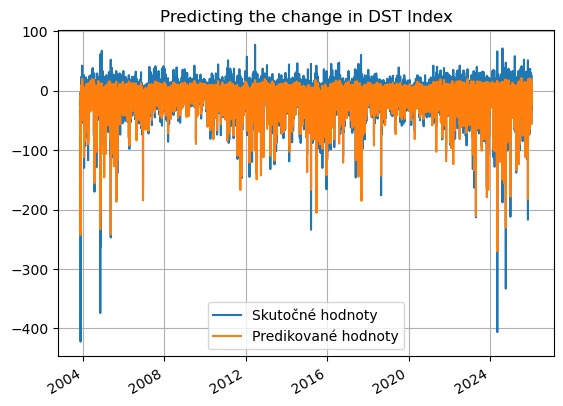

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.89642706327054
MCC=0.6814622497983255
Výkon NN:
MAE: 6.0880, MSE: 93.4426
Perzistentný model:
MAE: 7.2039, MSE: 135.0164
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 15.49%
MSE Improvement: 30.79%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 17s 39ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step 

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 26s 35ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 28s 37ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step 

499/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 12:50 860ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 40s 45ms/step   

  5/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 36s 42ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step 

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 39ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 29s 39ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 29s 39ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step 

505/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step


Shapes LSTM:
train: (229338,) (229338,)
val:   (57321,) (57321,)
test:  (194182,) (194182,)
Global sigma (LSTM errors, scaled): 0.5388876
Shapes GP:
X_gp_train: (286659, 18)
y_gp_train: (286659,)
X_test_gp: (194182, 18)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.78**2 * RBF(length_scale=0.561) + WhiteKernel(noise_level=0.684)


Global sigma (LSTM errors): 11.857641
Hybrid prediction with smoothed, inflated interval ready.


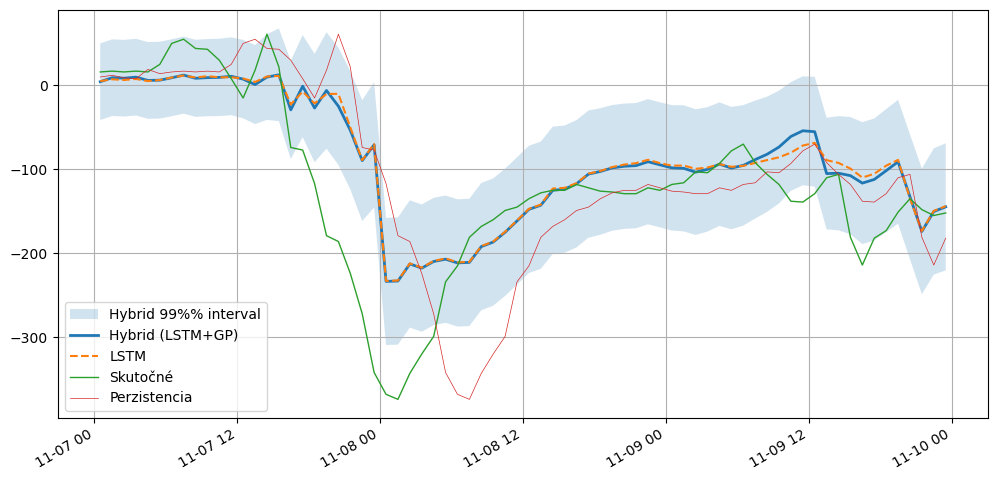

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 100.4336
MAE: 6.4324

--- Klasifikačné metriky (Prah: -20.1 nT) ---
Matthews Correlation Coefficient (MCC): 0.6610

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      143233 |        8807
Skutočná 1 |       12865 |       29266

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.92      0.94      0.93    152040
   Trieda 1 (Búrka)       0.77      0.69      0.73     42131

           accuracy                           0.89    194171
          macro avg       0.84      0.82      0.83    194171
       weighted avg       0.89      0.89      0.89    194171



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.8964211957501378
MCC=0.6814577693168505
Výkon NN:
MAE: 6.0880, MSE: 93.4426
Perzistentný model:
MAE: 7.2039, MSE: 135.0164
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 15.49%
MSE Improvement: 30.79%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9169    0.9542    0.9352    152040
           1     0.8062    0.6880    0.7424     42131

    accuracy                         0.8964    194171
   macro avg     0.8616    0.8211    0.8388    194171
weighted avg     0.8929    0.8964    0.8934    194171


===== LSTM+GP =====
ACC=0.8883870402892295
MCC=0.6610271266682881
Výkon NN:
MAE: 6.4324, MSE: 100.4336
Perzistentný model:
MAE: 7.2039, MSE: 135.0164
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 10.71%
MSE Improvement: 25.61%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9176    0.9421    0.9297    152040
           1     0.7687    0.6946    0.7298     4213

/tmp/ipykernel_1088579/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_1088579/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
68,2026-04-27T17:47:39,LSTM,6.0,5.0,DST+5,OMNI2_all,-20.0,-19.6,0.899004,0.694101,"{""text"": "" precision recall f...",5.899059,83.667158,6.683642,114.018863,11.738854,26.619898
69,2026-04-27T17:47:39,LSTM+GP,6.0,5.0,DST+5,OMNI2_all,-20.0,-19.6,0.893504,0.677363,"{""text"": "" precision recall f...",6.125718,90.807561,6.683642,114.018863,8.347604,20.357423
70,2026-04-27T18:37:34,LSTM,12.0,6.0,DST+6,OMNI2_all,-20.0,-20.9,0.895297,0.677676,"{""text"": "" precision recall f...",6.211522,95.578536,7.203881,135.014157,13.775340,29.208508
71,2026-04-27T18:37:34,LSTM+GP,12.0,6.0,DST+6,OMNI2_all,-20.0,-20.9,0.888844,0.655119,"{""text"": "" precision recall f...",6.465791,102.121241,7.203881,135.014157,10.245727,24.362568
72,2026-04-27T18:52:50,LSTM,12.0,6.0,DST+6,OMNI2_all,-20.0,-20.9,0.895297,0.677676,"{""text"": "" precision recall f...",6.211522,95.578536,7.203881,135.014157,13.775340,29.208508
73,2026-04-27T18:52:51,LSTM+GP,12.0,6.0,DST+6,OMNI2_all,-20.0,-20.9,0.888844,0.655119,"{""text"": "" precision recall f...",6.465791,102.121241,7.203881,135.014157,10.245727,24.362568
74,2026-04-27T19:54:18,LSTM,18.0,6.0,DST+6,OMNI2_all,-20.0,-20.1,0.896421,0.681458,"{""text"": "" precision recall f...",6.087973,93.442580,7.203913,135.016377,15.490746,30.791670
75,2026-04-27T19:54:18,LSTM+GP,18.0,6.0,DST+6,OMNI2_all,-20.0,-20.1,0.888387,0.661027,"{""text"": "" precision recall f...",6.432398,100.433594,7.203913,135.016377,10.709667,25.613769
76,2026-04-27T20:04:15,LSTM,18.0,6.0,DST+6,OMNI2_all,-20.0,-20.1,0.896421,0.681458,"{""text"": "" precision recall f...",6.087973,93.442580,7.203913,135.016377,15.490746,30.791670
77,2026-04-27T20:04:15,LSTM+GP,18.0,6.0,DST+6,OMNI2_all,-20.0,-20.1,0.888387,0.661027,"{""text"": "" precision recall f...",6.432398,100.433594,7.203913,135.016377,10.709667,25.613769
